In [2]:
import numpy as np

import sys
sys.path.append("/home/mayajas/Documents/programs/prfpy-main")

from prfpy.stimulus import PRFStimulus2D
from prfpy.model import Iso2DGaussianModel, DoG_Iso2DGaussianModel
from prfpy.fit import Iso2DGaussianFitter, DoG_Iso2DGaussianFitter

import os
from os.path import join as opj
import scipy.io

import nibabel as nib

import matplotlib.pyplot as plt

import nilearn
from nilearn import plotting, datasets, image
from nilearn.input_data import NiftiMasker
from nilearn.plotting import plot_roi

import pickle
import pandas as pd

import itertools

from sklearn.metrics import mean_squared_error, r2_score
from sklearn.linear_model import LinearRegression
from sklearn.multioutput import MultiOutputRegressor
from sklearn.preprocessing import PolynomialFeatures

import random

from scipy import stats

import statsmodels.api as sm
from sklearn.model_selection import train_test_split

from transformations import quaternion_from_matrix, euler_from_quaternion

import nipype.interfaces.fsl as fsl

# import glob
import math 

from scipy.spatial import KDTree


import numpy.matlib

import seaborn as sb

/home/mayajas/.local/lib/python3.8/site-packages/nilearn/glm/__init__.py:55: FutureWarning: The nilearn.glm module is experimental. It may change in any future release of Nilearn.
  warn('The nilearn.glm module is experimental. '
/home/mayajas/.local/lib/python3.8/site-packages/nilearn/datasets/__init__.py:86: FutureWarning: Fetchers from the nilearn.datasets module will be updated in version 0.9 to return python strings instead of bytes and Pandas dataframes instead of Numpy arrays.
  warn("Fetchers from the nilearn.datasets module will be "


230402-16:36:49,403 nipype.utils WARNING:
	 A newer version (1.8.4) of nipy/nipype is available. You are using 1.6.1


In [3]:
# # Install a pip package in the current Jupyter kernel
# import sys
# !{sys.executable} -m pip install seaborn

#### General directories and settings

In [4]:
subject_list = ['sub-01','sub-02','sub-03','sub-04']
hem_list     = ['lh','rh']
layer_space  = 'anat'
# prf_model    = 'prfpy_Iso2DGaussianModel'
prf_model    = 'prfpy_Iso2DGaussianModel_LinearDeveining'


proj_dir     = '/home/mayajas/scratch/project-00-7t-pipeline-dev/'
prfpy_dir    = '/home/mayajas/scratch/project-00-7t-pipeline-dev/output/'+prf_model+'/'

report_dir   = '/home/mayajas/Documents/project-00-7t-pipeline-dev/reports/figures'

# dataframe outputs of pRF_getSigmaAcrossDepth.py
if layer_space == 'func':
    df_layers_fn = opj(prfpy_dir,'df_layers_func')
else:
    df_layers_fn = opj(prfpy_dir,'df_layers')


In [5]:
screen_size_cm     = 12.0
screen_distance_cm = 52.0
TR                 = 3.0
#design_matrix      = mat["stim"]

max_ecc = math.atan(screen_size_cm/screen_distance_cm)/2
max_ecc_deg = math.degrees(max_ecc)

print("Max eccentricity of stimulus is "+str(round(max_ecc_deg,2)))

Max eccentricity of stimulus is 6.5


#### Useful functions

In [6]:
def reject_outliers(data, m=3):
    return data[abs(data - np.mean(data)) < m * np.std(data)], abs(data - np.mean(data)) < m * np.std(data)

In [7]:
def reject_outliers_median(data, m=3.):
    d = np.abs(data - np.median(data))
    mdev = np.median(d)
    s = d / (mdev if mdev else 1.)
    return data[s < m], s < m

In [8]:
def flatten(l):
    return [item for sublist in l for item in sublist]

#### Directories and data for sample subject

In [9]:
sub_id       = 0 #sys.argv[1]
hem_id       = 0 #sys.argv[2]

# directories for chosen subject
data_dir     = opj(proj_dir,'output','func','sliceTimeCorr',
                   '_subject_id_'+subject_list[sub_id])
ROI_dir      = opj(prfpy_dir,subject_list[sub_id],'ROIs')
lay_dir      = opj(prfpy_dir,subject_list[sub_id],'layerification')


# image files for chosen subject
meanFunc_fn  = opj(prfpy_dir,subject_list[sub_id],'meanFunc.nii')
UNI_func_fn  = opj(prfpy_dir,subject_list[sub_id],'UNI_funcSpace.nii')

GM_fn        = opj(prfpy_dir,subject_list[sub_id],
                   hem_list[hem_id]+'_GM_funcSpace.nii')
occ_fn       = opj(prfpy_dir,subject_list[sub_id],
                  'funcSpaceOccipitalMask.nii')
bar1_fn      = opj(data_dir,'_sess_id_task-bar_run-01_sess_nr_0_sess_nvol_124','atask-bar_run-01_roi_warp4D.nii')
bar2_fn      = opj(data_dir,'_sess_id_task-bar_run-02_sess_nr_1_sess_nvol_124','atask-bar_run-02_roi_warp4D.nii')

# prfpy output files
grid_fit_fn      = opj(prfpy_dir,subject_list[sub_id],hem_list[hem_id]+'_grid_fit.pckl')
iterative_fit_fn = opj(prfpy_dir,subject_list[sub_id],hem_list[hem_id]+'_iterative_fit.pckl')
pRF_param_fn     = opj(prfpy_dir,subject_list[sub_id],hem_list[hem_id]+'_pRF_params.pckl')
equivol_param_fn = opj(prfpy_dir,subject_list[sub_id],hem_list[hem_id]+'_pRF_params_equivol.pckl')
equidist_param_fn = opj(prfpy_dir,subject_list[sub_id],hem_list[hem_id]+'_pRF_params_equidist.pckl')

# manual ROI delineations
V1_fn        = opj(ROI_dir,'func_'+hem_list[hem_id]+'_V1.nii')

# layers
lay_equidist_fn = opj(lay_dir,'func_ribbon_rim_layers_equidist.nii')
lay_equivol_fn = opj(lay_dir,'func_ribbon_rim_layers_equivol.nii')


## Preliminary plots for sample subject

Load image files

In [10]:
occ = nib.load(occ_fn)
GM = nib.load(GM_fn)
meanFunc = nib.load(meanFunc_fn)
UNI = nib.load(UNI_func_fn)

FileNotFoundError: No such file or no access: '/home/mayajas/scratch/project-00-7t-pipeline-dev/output/prfpy_Iso2DGaussianModel_LinearDeveining/sub-01/funcSpaceOccipitalMask.nii'

In [21]:
bar1 = nib.load(bar1_fn)
bar2 = nib.load(bar2_fn)

In [22]:
V1=nib.load(V1_fn)

lay_equidist=nib.load(lay_equidist_fn)
lay_equivol=nib.load(lay_equivol_fn)

Define mask (GM+occipital) and process bar data

In [23]:
mask = image.math_img("np.logical_and(img1, img2)", img1=occ, img2=GM)

In [24]:
detrend     = True
standardize = True
low_pass    = 0.08
high_pass   = 0.02
verbose     = True
t_r         = TR

bar_masker = NiftiMasker(mask_img=mask, detrend=detrend, standardize=standardize, t_r=t_r,
                    low_pass=low_pass, high_pass=high_pass, verbose=verbose)

Define simple masker

In [25]:
masker = NiftiMasker(mask_img=mask)

Visualize it as an ROI

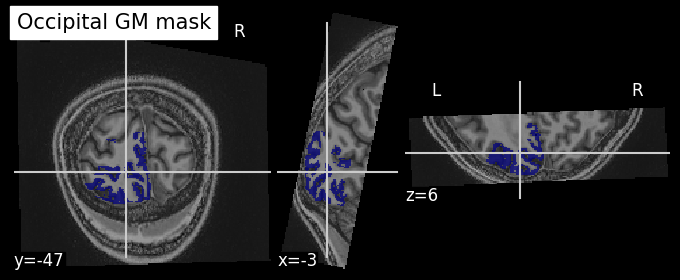

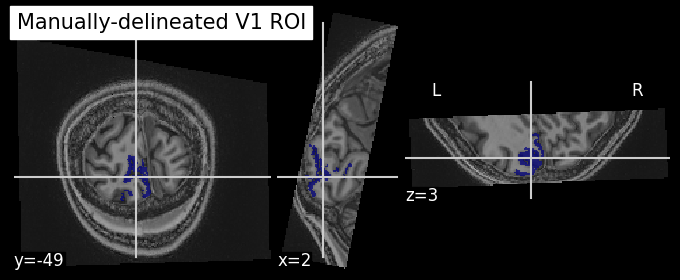

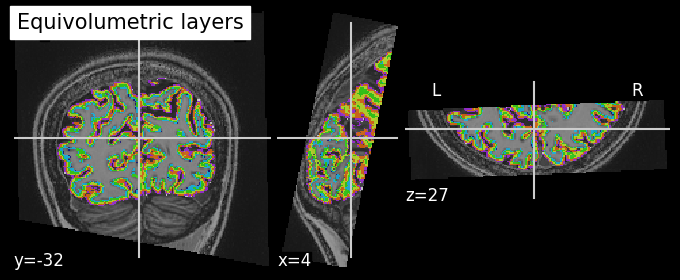

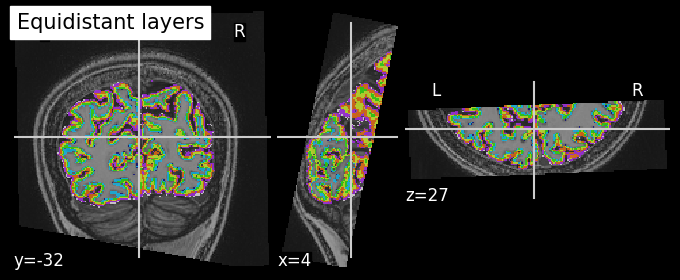

In [26]:
plot_roi(mask,UNI,title="Occipital GM mask")
plot_roi(V1,UNI,title="Manually-delineated V1 ROI")
plot_roi(lay_equivol,UNI,title="Equivolumetric layers")
plot_roi(lay_equidist,UNI,title="Equidistant layers")



# display = plotting.plot_anat(UNI)
# display.add_overlay(mask, cmap=plotting.cm.purple_green)
# display.add_overlay(V1, cmap=plotting.cm.purple_green)

# plotting.show()

In [28]:
masked_bar1 = bar_masker.fit_transform(bar1)
masked_bar2 = bar_masker.fit_transform(bar2)

masked_bar1 = np.rot90(masked_bar1)
masked_bar2 = np.rot90(masked_bar2)

np.shape(masked_bar1)

[NiftiMasker.fit] Loading data from None
[NiftiMasker.fit] Resampling mask
[NiftiMasker.transform_single_imgs] Loading data from Nifti1Image('/home/mayajas/scratch/project-00-7t-pipeline-dev/output/func/sliceTimeCorr/_subject_id_sub-01/_sess_id_task-bar_run-01_sess_nr_0_sess_nvol_124/atask-bar_run-01_roi_warp4D.nii')
[NiftiMasker.transform_single_imgs] Resampling images
[NiftiMasker.transform_single_imgs] Extracting region signals
[NiftiMasker.transform_single_imgs] Cleaning extracted signals
[NiftiMasker.fit] Loading data from None
[NiftiMasker.fit] Resampling mask
[NiftiMasker.transform_single_imgs] Loading data from Nifti1Image('/home/mayajas/scratch/project-00-7t-pipeline-dev/output/func/sliceTimeCorr/_subject_id_sub-01/_sess_id_task-bar_run-02_sess_nr_1_sess_nvol_124/atask-bar_run-02_roi_warp4D.nii')
[NiftiMasker.transform_single_imgs] Resampling images
[NiftiMasker.transform_single_imgs] Extracting region signals
[NiftiMasker.transform_single_imgs] Cleaning extracted signals


(17883, 120)

Mask mean functional and V1

In [29]:
masked_meanFunc = masker.fit_transform(meanFunc)
masked_meanFunc = np.squeeze(masked_meanFunc)

In [30]:
masked_V1 = masker.fit_transform(V1)
masked_V1 = np.squeeze(masked_V1)

In [120]:
masked_lay_equidist = masker.fit_transform(lay_equidist)
masked_lay_equidist = np.squeeze(masked_lay_equidist)

masked_lay_equivol = masker.fit_transform(lay_equivol)
masked_lay_equivol = np.squeeze(masked_lay_equivol)

In [128]:
int(min(np.unique(masked_lay_equivol)))

1

Plot timecourses

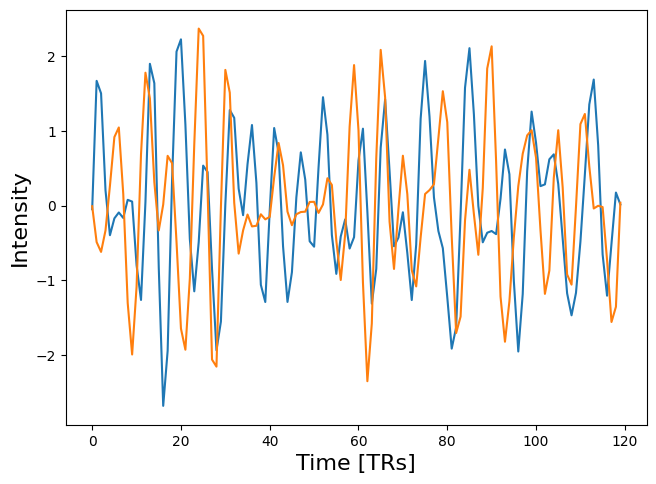

In [32]:
import matplotlib.pyplot as plt
plt.figure(figsize=(7, 5))
plt.plot(np.rot90(masked_bar1[:1, :]))
plt.plot(np.rot90(masked_bar2[:1, :]))
plt.xlabel('Time [TRs]', fontsize=16)
plt.ylabel('Intensity', fontsize=16)
#plt.xlim(0, 150)
plt.subplots_adjust(bottom=.12, top=.95, right=.95, left=.12)

Average data from 2 sessions

In [33]:
bar_data = (masked_bar1 + masked_bar2)/2

In [1]:
bar_data.shape

NameError: name 'bar_data' is not defined

In [35]:
# from scipy.io import savemat

# mymat={'rh_bar':bar_data}
# savemat('rh_bar.mat', mymat)

Plot averaged data

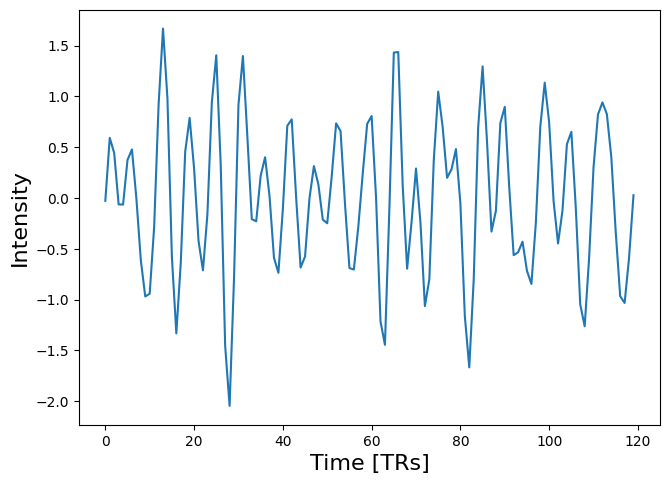

In [34]:
import matplotlib.pyplot as plt
plt.figure(figsize=(7, 5))
plt.plot(np.rot90(bar_data[:1, :]))
plt.xlabel('Time [TRs]', fontsize=16)
plt.ylabel('Intensity', fontsize=16)
#plt.xlim(0, 150)
plt.subplots_adjust(bottom=.12, top=.95, right=.95, left=.12)

# fMRI data preprocessing: diagnostics


## Realignment parameter plots

In [4]:
prefix    = 'MAT_'
n_vol     = 120
n_run_bar = 2

x     = np.empty((len(subject_list),n_vol,n_run_bar))
y     = np.empty((len(subject_list),n_vol,n_run_bar))
z     = np.empty((len(subject_list),n_vol,n_run_bar))
x_rot = np.empty((len(subject_list),n_vol,n_run_bar))
y_rot = np.empty((len(subject_list),n_vol,n_run_bar))
z_rot = np.empty((len(subject_list),n_vol,n_run_bar))

s_id = 0
for sub_id in range(0,len(subject_list)):
    # within McFLIRT parameters
    mcflirt_bar1_dir = opj(proj_dir,'derivatives','wf_laminar_fMRI_func_pRF',
                          '_sess_id_task-bar_run-01_sess_nr_0_sess_nvol_124',
                          '_subject_id_'+subject_list[sub_id],'mcflirtWithinSess',
                          'task-bar_run-01_roi_mcf.nii.mat')
    mcflirt_bar2_dir = opj(proj_dir,'derivatives','wf_laminar_fMRI_func_pRF',
                          '_sess_id_task-bar_run-02_sess_nr_1_sess_nvol_124',
                          '_subject_id_'+subject_list[sub_id],'mcflirtWithinSess',
                          'task-bar_run-02_roi_mcf.nii.mat')
    
    # initialize an empty list to store the filenames
    mcflirt_bar1_fn = []
    mcflirt_bar2_fn = []

    # use os.walk() to iterate through the directory and subdirectories
    for root, dirs, files in os.walk(mcflirt_bar1_dir):
        for file in files:
            if file.startswith(prefix):
                # create the full path of the file
                file_path = os.path.join(root, file)
                # append the file to the list
                mcflirt_bar1_fn.append(file_path)
    # use os.walk() to iterate through the directory and subdirectories
    for root, dirs, files in os.walk(mcflirt_bar2_dir):
        for file in files:
            if file.startswith(prefix):
                # create the full path of the file
                file_path = os.path.join(root, file)
                # append the file to the list
                mcflirt_bar2_fn.append(file_path)

    # Sort the list of filenames by the last three digits using a key function
    mcflirt_bar1_fn = sorted(mcflirt_bar1_fn, key=lambda x: int(x[-4:]))
    mcflirt_bar2_fn = sorted(mcflirt_bar2_fn, key=lambda x: int(x[-4:]))

    f_id = 0
    bar_run = 0
    for file in mcflirt_bar1_fn:
        avscale = fsl.AvScale()
        avscale.inputs.mat_file = file
        avscale.inputs.all_param=True
        res = avscale.run() 
        
        x[s_id,f_id,bar_run]     = res.outputs.translations[0]
        y[s_id,f_id,bar_run]     = res.outputs.translations[1]
        z[s_id,f_id,bar_run]     = res.outputs.translations[2]
        x_rot[s_id,f_id,bar_run] = math.degrees(res.outputs.rot_angles[0])
        y_rot[s_id,f_id,bar_run] = math.degrees(res.outputs.rot_angles[1])
        z_rot[s_id,f_id,bar_run] = math.degrees(res.outputs.rot_angles[2])
        
        f_id += 1
    
    f_id = 0
    bar_run = 1
    for file in mcflirt_bar1_fn:
        avscale = fsl.AvScale()
        avscale.inputs.mat_file = file
        avscale.inputs.all_param=True
        res = avscale.run() 
        
        x[s_id,f_id,bar_run]     = res.outputs.translations[0]
        y[s_id,f_id,bar_run]     = res.outputs.translations[1]
        z[s_id,f_id,bar_run]     = res.outputs.translations[2]
        x_rot[s_id,f_id,bar_run] = math.degrees(res.outputs.rot_angles[0])
        y_rot[s_id,f_id,bar_run] = math.degrees(res.outputs.rot_angles[1])
        z_rot[s_id,f_id,bar_run] = math.degrees(res.outputs.rot_angles[2])
        
        f_id += 1
        
    s_id += 1
    
translation_params = (x,y,z)
rotation_params = (x_rot,y_rot,z_rot)
    

230118-11:48:13,351 nipype.interface INFO:
	 stdout 2023-01-18T11:48:13.350886:Rotation & Translation Matrix:
230118-11:48:13,352 nipype.interface INFO:
	 stdout 2023-01-18T11:48:13.350886:1.000000 -0.000000 -0.000511 0.003153 
230118-11:48:13,353 nipype.interface INFO:
	 stdout 2023-01-18T11:48:13.350886:0.000000 1.000000 -0.000668 0.006658 
230118-11:48:13,354 nipype.interface INFO:
	 stdout 2023-01-18T11:48:13.350886:0.000511 0.000668 1.000000 -0.088982 
230118-11:48:13,355 nipype.interface INFO:
	 stdout 2023-01-18T11:48:13.350886:0.000000 0.000000 0.000000 1.000000 
230118-11:48:13,356 nipype.interface INFO:
	 stdout 2023-01-18T11:48:13.350886:
230118-11:48:13,356 nipype.interface INFO:
	 stdout 2023-01-18T11:48:13.350886:Rotation Angles (x,y,z) [rads] = -0.000668 0.000511 -0.000000 
230118-11:48:13,357 nipype.interface INFO:
	 stdout 2023-01-18T11:48:13.350886:
230118-11:48:13,357 nipype.interface INFO:
	 stdout 2023-01-18T11:48:13.350886:Translations (x,y,z) [mm] = 0.003153 0.00

230118-11:48:13,752 nipype.interface INFO:
	 stdout 2023-01-18T11:48:13.735395:Determinant = 1.000001
230118-11:48:13,753 nipype.interface INFO:
	 stdout 2023-01-18T11:48:13.735395:Left-Right orientation: preserved
230118-11:48:13,753 nipype.interface INFO:
	 stdout 2023-01-18T11:48:13.735395:
230118-11:48:13,753 nipype.interface INFO:
	 stdout 2023-01-18T11:48:13.735395:Forward half transform =
230118-11:48:13,753 nipype.interface INFO:
	 stdout 2023-01-18T11:48:13.735395:1.000000 0.000033 -0.000138 -0.000407 
230118-11:48:13,754 nipype.interface INFO:
	 stdout 2023-01-18T11:48:13.735395:-0.000033 1.000000 -0.000353 0.007841 
230118-11:48:13,754 nipype.interface INFO:
	 stdout 2023-01-18T11:48:13.735395:0.000139 0.000353 1.000000 -0.037221 
230118-11:48:13,754 nipype.interface INFO:
	 stdout 2023-01-18T11:48:13.735395:0.000000 0.000000 0.000000 1.000000 
230118-11:48:13,754 nipype.interface INFO:
	 stdout 2023-01-18T11:48:13.735395:
230118-11:48:13,754 nipype.interface INFO:
	 stdout 

230118-11:48:14,393 nipype.interface INFO:
	 stdout 2023-01-18T11:48:14.390740:1.000000 0.000130 0.000224 -0.011893 
230118-11:48:14,394 nipype.interface INFO:
	 stdout 2023-01-18T11:48:14.390740:-0.000130 1.000000 0.000854 -0.000934 
230118-11:48:14,395 nipype.interface INFO:
	 stdout 2023-01-18T11:48:14.390740:-0.000224 -0.000854 1.000000 0.087735 
230118-11:48:14,396 nipype.interface INFO:
	 stdout 2023-01-18T11:48:14.390740:0.000000 0.000000 0.000000 1.000000 
230118-11:48:14,397 nipype.interface INFO:
	 stdout 2023-01-18T11:48:14.390740:
230118-11:48:14,400 nipype.interface INFO:
	 stdout 2023-01-18T11:48:14.390740:Rotation Angles (x,y,z) [rads] = 0.000854 -0.000224 0.000130 
230118-11:48:14,401 nipype.interface INFO:
	 stdout 2023-01-18T11:48:14.390740:
230118-11:48:14,402 nipype.interface INFO:
	 stdout 2023-01-18T11:48:14.390740:Translations (x,y,z) [mm] = -0.011893 -0.000934 0.087735 
230118-11:48:14,403 nipype.interface INFO:
	 stdout 2023-01-18T11:48:14.390740:
230118-11:48:

230118-11:48:15,95 nipype.interface INFO:
	 stdout 2023-01-18T11:48:15.079522:Left-Right orientation: preserved
230118-11:48:15,95 nipype.interface INFO:
	 stdout 2023-01-18T11:48:15.079522:
230118-11:48:15,97 nipype.interface INFO:
	 stdout 2023-01-18T11:48:15.097488:Forward half transform =
230118-11:48:15,97 nipype.interface INFO:
	 stdout 2023-01-18T11:48:15.097488:1.000000 -0.000009 -0.000149 0.002908 
230118-11:48:15,98 nipype.interface INFO:
	 stdout 2023-01-18T11:48:15.097488:0.000009 1.000000 -0.000318 0.002582 
230118-11:48:15,98 nipype.interface INFO:
	 stdout 2023-01-18T11:48:15.097488:0.000148 0.000319 1.000000 -0.038756 
230118-11:48:15,98 nipype.interface INFO:
	 stdout 2023-01-18T11:48:15.097488:0.000000 0.000000 0.000000 1.000000 
230118-11:48:15,99 nipype.interface INFO:
	 stdout 2023-01-18T11:48:15.097488:
230118-11:48:15,100 nipype.interface INFO:
	 stdout 2023-01-18T11:48:15.097488:Backward half transform =
230118-11:48:15,100 nipype.interface INFO:
	 stdout 2023-0

230118-11:48:15,586 nipype.interface INFO:
	 stdout 2023-01-18T11:48:15.583091:-0.000041 1.000000 0.000854 -0.002490 
230118-11:48:15,587 nipype.interface INFO:
	 stdout 2023-01-18T11:48:15.583091:-0.000240 -0.000854 1.000000 0.081751 
230118-11:48:15,588 nipype.interface INFO:
	 stdout 2023-01-18T11:48:15.583091:0.000000 0.000000 0.000000 1.000000 
230118-11:48:15,589 nipype.interface INFO:
	 stdout 2023-01-18T11:48:15.583091:
230118-11:48:15,590 nipype.interface INFO:
	 stdout 2023-01-18T11:48:15.583091:Rotation Angles (x,y,z) [rads] = 0.000854 -0.000240 0.000041 
230118-11:48:15,591 nipype.interface INFO:
	 stdout 2023-01-18T11:48:15.583091:
230118-11:48:15,593 nipype.interface INFO:
	 stdout 2023-01-18T11:48:15.583091:Translations (x,y,z) [mm] = 0.001008 -0.002490 0.081751 
230118-11:48:15,593 nipype.interface INFO:
	 stdout 2023-01-18T11:48:15.583091:
230118-11:48:15,594 nipype.interface INFO:
	 stdout 2023-01-18T11:48:15.583091:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-

230118-11:48:15,935 nipype.interface INFO:
	 stdout 2023-01-18T11:48:15.917085:
230118-11:48:15,936 nipype.interface INFO:
	 stdout 2023-01-18T11:48:15.917085:Forward half transform =
230118-11:48:15,937 nipype.interface INFO:
	 stdout 2023-01-18T11:48:15.917085:1.000000 -0.000019 0.000302 -0.000445 
230118-11:48:15,937 nipype.interface INFO:
	 stdout 2023-01-18T11:48:15.917085:0.000019 1.000000 0.000427 -0.005311 
230118-11:48:15,938 nipype.interface INFO:
	 stdout 2023-01-18T11:48:15.917085:-0.000301 -0.000427 1.000000 0.048523 
230118-11:48:15,938 nipype.interface INFO:
	 stdout 2023-01-18T11:48:15.917085:0.000000 0.000000 0.000000 1.000000 
230118-11:48:15,939 nipype.interface INFO:
	 stdout 2023-01-18T11:48:15.917085:
230118-11:48:15,939 nipype.interface INFO:
	 stdout 2023-01-18T11:48:15.939909:Backward half transform =
230118-11:48:15,940 nipype.interface INFO:
	 stdout 2023-01-18T11:48:15.939909:1.000000 0.000019 -0.000302 0.000460 
230118-11:48:15,940 nipype.interface INFO:
	 

230118-11:48:16,565 nipype.interface INFO:
	 stdout 2023-01-18T11:48:16.561625:-0.000151 1.000000 -0.000488 0.035940 
230118-11:48:16,566 nipype.interface INFO:
	 stdout 2023-01-18T11:48:16.561625:0.000160 0.000488 1.000000 -0.071865 
230118-11:48:16,568 nipype.interface INFO:
	 stdout 2023-01-18T11:48:16.561625:0.000000 0.000000 0.000000 1.000000 
230118-11:48:16,569 nipype.interface INFO:
	 stdout 2023-01-18T11:48:16.561625:
230118-11:48:16,569 nipype.interface INFO:
	 stdout 2023-01-18T11:48:16.561625:Rotation Angles (x,y,z) [rads] = -0.000488 0.000160 0.000151 
230118-11:48:16,570 nipype.interface INFO:
	 stdout 2023-01-18T11:48:16.561625:
230118-11:48:16,571 nipype.interface INFO:
	 stdout 2023-01-18T11:48:16.561625:Translations (x,y,z) [mm] = -0.008374 0.035940 -0.071865 
230118-11:48:16,572 nipype.interface INFO:
	 stdout 2023-01-18T11:48:16.561625:
230118-11:48:16,573 nipype.interface INFO:
	 stdout 2023-01-18T11:48:16.561625:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-

230118-11:48:16,934 nipype.interface INFO:
	 stdout 2023-01-18T11:48:16.916328:
230118-11:48:16,935 nipype.interface INFO:
	 stdout 2023-01-18T11:48:16.935430:Forward half transform =
230118-11:48:16,935 nipype.interface INFO:
	 stdout 2023-01-18T11:48:16.935430:1.000000 0.000025 0.000127 0.003608 
230118-11:48:16,936 nipype.interface INFO:
	 stdout 2023-01-18T11:48:16.935430:-0.000025 1.000000 0.000539 -0.001078 
230118-11:48:16,936 nipype.interface INFO:
	 stdout 2023-01-18T11:48:16.935430:-0.000127 -0.000538 1.000000 0.046097 
230118-11:48:16,936 nipype.interface INFO:
	 stdout 2023-01-18T11:48:16.935430:0.000000 0.000000 0.000000 1.000000 
230118-11:48:16,937 nipype.interface INFO:
	 stdout 2023-01-18T11:48:16.935430:
230118-11:48:16,937 nipype.interface INFO:
	 stdout 2023-01-18T11:48:16.935430:Backward half transform =
230118-11:48:16,937 nipype.interface INFO:
	 stdout 2023-01-18T11:48:16.935430:1.000000 -0.000025 -0.000127 -0.003602 
230118-11:48:16,938 nipype.interface INFO:
	

230118-11:48:17,491 nipype.interface INFO:
	 stdout 2023-01-18T11:48:17.487604:-0.000175 1.000000 0.000777 0.019228 
230118-11:48:17,491 nipype.interface INFO:
	 stdout 2023-01-18T11:48:17.487604:-0.000283 -0.000777 1.000000 0.074585 
230118-11:48:17,492 nipype.interface INFO:
	 stdout 2023-01-18T11:48:17.487604:0.000000 0.000000 0.000000 1.000000 
230118-11:48:17,493 nipype.interface INFO:
	 stdout 2023-01-18T11:48:17.487604:
230118-11:48:17,495 nipype.interface INFO:
	 stdout 2023-01-18T11:48:17.487604:Rotation Angles (x,y,z) [rads] = 0.000777 -0.000283 0.000175 
230118-11:48:17,496 nipype.interface INFO:
	 stdout 2023-01-18T11:48:17.487604:
230118-11:48:17,497 nipype.interface INFO:
	 stdout 2023-01-18T11:48:17.487604:Translations (x,y,z) [mm] = -0.009616 0.019228 0.074585 
230118-11:48:17,498 nipype.interface INFO:
	 stdout 2023-01-18T11:48:17.487604:
230118-11:48:17,498 nipype.interface INFO:
	 stdout 2023-01-18T11:48:17.487604:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-1

230118-11:48:17,944 nipype.interface INFO:
	 stdout 2023-01-18T11:48:17.941277:
230118-11:48:17,944 nipype.interface INFO:
	 stdout 2023-01-18T11:48:17.941277:Forward half transform =
230118-11:48:17,945 nipype.interface INFO:
	 stdout 2023-01-18T11:48:17.941277:1.000000 0.000065 -0.000178 0.000498 
230118-11:48:17,945 nipype.interface INFO:
	 stdout 2023-01-18T11:48:17.941277:-0.000065 1.000000 0.000355 0.008498 
230118-11:48:17,945 nipype.interface INFO:
	 stdout 2023-01-18T11:48:17.941277:0.000178 -0.000355 1.000000 0.015044 
230118-11:48:17,946 nipype.interface INFO:
	 stdout 2023-01-18T11:48:17.941277:0.000000 0.000000 0.000000 1.000000 
230118-11:48:17,948 nipype.interface INFO:
	 stdout 2023-01-18T11:48:17.941277:
230118-11:48:17,948 nipype.interface INFO:
	 stdout 2023-01-18T11:48:17.941277:Backward half transform =
230118-11:48:17,949 nipype.interface INFO:
	 stdout 2023-01-18T11:48:17.941277:1.000000 -0.000065 0.000178 -0.000500 
230118-11:48:17,949 nipype.interface INFO:
	 s

230118-11:48:18,466 nipype.interface INFO:
	 stdout 2023-01-18T11:48:18.462723:-0.000344 0.999999 0.001525 0.015181 
230118-11:48:18,467 nipype.interface INFO:
	 stdout 2023-01-18T11:48:18.462723:-0.000245 -0.001525 0.999999 0.119367 
230118-11:48:18,468 nipype.interface INFO:
	 stdout 2023-01-18T11:48:18.462723:0.000000 0.000000 0.000000 1.000000 
230118-11:48:18,468 nipype.interface INFO:
	 stdout 2023-01-18T11:48:18.462723:
230118-11:48:18,469 nipype.interface INFO:
	 stdout 2023-01-18T11:48:18.462723:Rotation Angles (x,y,z) [rads] = 0.001525 -0.000246 0.000344 
230118-11:48:18,470 nipype.interface INFO:
	 stdout 2023-01-18T11:48:18.462723:
230118-11:48:18,470 nipype.interface INFO:
	 stdout 2023-01-18T11:48:18.462723:Translations (x,y,z) [mm] = -0.017268 0.015181 0.119367 
230118-11:48:18,471 nipype.interface INFO:
	 stdout 2023-01-18T11:48:18.462723:
230118-11:48:18,471 nipype.interface INFO:
	 stdout 2023-01-18T11:48:18.462723:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-1

230118-11:48:18,824 nipype.interface INFO:
	 stdout 2023-01-18T11:48:18.809209:
230118-11:48:18,827 nipype.interface INFO:
	 stdout 2023-01-18T11:48:18.827296:Forward half transform =
230118-11:48:18,827 nipype.interface INFO:
	 stdout 2023-01-18T11:48:18.827296:1.000000 0.000176 0.000015 -0.007312 
230118-11:48:18,828 nipype.interface INFO:
	 stdout 2023-01-18T11:48:18.827296:-0.000176 1.000000 0.000751 0.014654 
230118-11:48:18,829 nipype.interface INFO:
	 stdout 2023-01-18T11:48:18.827296:-0.000015 -0.000750 1.000000 0.051369 
230118-11:48:18,829 nipype.interface INFO:
	 stdout 2023-01-18T11:48:18.827296:0.000000 0.000000 0.000000 1.000000 
230118-11:48:18,830 nipype.interface INFO:
	 stdout 2023-01-18T11:48:18.827296:
230118-11:48:18,830 nipype.interface INFO:
	 stdout 2023-01-18T11:48:18.827296:Backward half transform =
230118-11:48:18,830 nipype.interface INFO:
	 stdout 2023-01-18T11:48:18.827296:1.000000 -0.000176 -0.000015 0.007315 
230118-11:48:18,830 nipype.interface INFO:
	 

230118-11:48:19,336 nipype.interface INFO:
	 stdout 2023-01-18T11:48:19.331825:-0.000022 -0.001151 0.999999 0.065792 
230118-11:48:19,337 nipype.interface INFO:
	 stdout 2023-01-18T11:48:19.331825:0.000000 0.000000 0.000000 1.000000 
230118-11:48:19,338 nipype.interface INFO:
	 stdout 2023-01-18T11:48:19.331825:
230118-11:48:19,339 nipype.interface INFO:
	 stdout 2023-01-18T11:48:19.331825:Rotation Angles (x,y,z) [rads] = 0.001151 -0.000023 0.000436 
230118-11:48:19,341 nipype.interface INFO:
	 stdout 2023-01-18T11:48:19.331825:
230118-11:48:19,342 nipype.interface INFO:
	 stdout 2023-01-18T11:48:19.331825:Translations (x,y,z) [mm] = -0.020927 0.061939 0.065792 
230118-11:48:19,342 nipype.interface INFO:
	 stdout 2023-01-18T11:48:19.331825:
230118-11:48:19,343 nipype.interface INFO:
	 stdout 2023-01-18T11:48:19.331825:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:48:19,344 nipype.interface INFO:
	 stdout 2023-01-18T11:48:19.331825:
230118-11:48:19,345 nipype.interface INFO:
	 

230118-11:48:19,941 nipype.interface INFO:
	 stdout 2023-01-18T11:48:19.924237:Forward half transform =
230118-11:48:19,942 nipype.interface INFO:
	 stdout 2023-01-18T11:48:19.924237:1.000000 0.000170 0.000063 -0.007533 
230118-11:48:19,942 nipype.interface INFO:
	 stdout 2023-01-18T11:48:19.924237:-0.000169 1.000000 0.000775 0.024682 
230118-11:48:19,942 nipype.interface INFO:
	 stdout 2023-01-18T11:48:19.924237:-0.000063 -0.000775 1.000000 0.052382 
230118-11:48:19,943 nipype.interface INFO:
	 stdout 2023-01-18T11:48:19.924237:0.000000 0.000000 0.000000 1.000000 
230118-11:48:19,944 nipype.interface INFO:
	 stdout 2023-01-18T11:48:19.924237:
230118-11:48:19,944 nipype.interface INFO:
	 stdout 2023-01-18T11:48:19.924237:Backward half transform =
230118-11:48:19,945 nipype.interface INFO:
	 stdout 2023-01-18T11:48:19.924237:1.000000 -0.000170 -0.000063 0.007541 
230118-11:48:19,945 nipype.interface INFO:
	 stdout 2023-01-18T11:48:19.924237:0.000169 1.000000 -0.000775 -0.024640 
230118-

230118-11:48:20,476 nipype.interface INFO:
	 stdout 2023-01-18T11:48:20.472001:-0.000096 -0.001738 0.999999 0.118983 
230118-11:48:20,477 nipype.interface INFO:
	 stdout 2023-01-18T11:48:20.472001:0.000000 0.000000 0.000000 1.000000 
230118-11:48:20,478 nipype.interface INFO:
	 stdout 2023-01-18T11:48:20.472001:
230118-11:48:20,479 nipype.interface INFO:
	 stdout 2023-01-18T11:48:20.472001:Rotation Angles (x,y,z) [rads] = 0.001738 -0.000096 0.000217 
230118-11:48:20,480 nipype.interface INFO:
	 stdout 2023-01-18T11:48:20.472001:
230118-11:48:20,481 nipype.interface INFO:
	 stdout 2023-01-18T11:48:20.472001:Translations (x,y,z) [mm] = -0.005294 0.051111 0.118983 
230118-11:48:20,482 nipype.interface INFO:
	 stdout 2023-01-18T11:48:20.472001:
230118-11:48:20,484 nipype.interface INFO:
	 stdout 2023-01-18T11:48:20.472001:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:48:20,485 nipype.interface INFO:
	 stdout 2023-01-18T11:48:20.472001:
230118-11:48:20,485 nipype.interface INFO:
	 

230118-11:48:20,845 nipype.interface INFO:
	 stdout 2023-01-18T11:48:20.845695:Forward half transform =
230118-11:48:20,845 nipype.interface INFO:
	 stdout 2023-01-18T11:48:20.845695:1.000000 0.000171 0.000101 -0.008255 
230118-11:48:20,846 nipype.interface INFO:
	 stdout 2023-01-18T11:48:20.845695:-0.000171 0.999999 0.000874 0.031406 
230118-11:48:20,846 nipype.interface INFO:
	 stdout 2023-01-18T11:48:20.845695:-0.000102 -0.000874 0.999999 0.061633 
230118-11:48:20,846 nipype.interface INFO:
	 stdout 2023-01-18T11:48:20.845695:0.000000 0.000000 0.000000 1.000000 
230118-11:48:20,846 nipype.interface INFO:
	 stdout 2023-01-18T11:48:20.845695:
230118-11:48:20,846 nipype.interface INFO:
	 stdout 2023-01-18T11:48:20.845695:Backward half transform =
230118-11:48:20,847 nipype.interface INFO:
	 stdout 2023-01-18T11:48:20.845695:1.000000 -0.000171 -0.000101 0.008267 
230118-11:48:20,847 nipype.interface INFO:
	 stdout 2023-01-18T11:48:20.845695:0.000171 1.000000 -0.000874 -0.031351 
230118-

230118-11:48:21,379 nipype.interface INFO:
	 stdout 2023-01-18T11:48:21.375576:-0.000235 -0.001679 0.999999 0.112405 
230118-11:48:21,382 nipype.interface INFO:
	 stdout 2023-01-18T11:48:21.375576:0.000000 0.000000 0.000000 1.000000 
230118-11:48:21,383 nipype.interface INFO:
	 stdout 2023-01-18T11:48:21.375576:
230118-11:48:21,384 nipype.interface INFO:
	 stdout 2023-01-18T11:48:21.375576:Rotation Angles (x,y,z) [rads] = 0.001679 -0.000235 0.000268 
230118-11:48:21,385 nipype.interface INFO:
	 stdout 2023-01-18T11:48:21.375576:
230118-11:48:21,387 nipype.interface INFO:
	 stdout 2023-01-18T11:48:21.375576:Translations (x,y,z) [mm] = -0.011318 0.056245 0.112405 
230118-11:48:21,387 nipype.interface INFO:
	 stdout 2023-01-18T11:48:21.375576:
230118-11:48:21,388 nipype.interface INFO:
	 stdout 2023-01-18T11:48:21.375576:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:48:21,389 nipype.interface INFO:
	 stdout 2023-01-18T11:48:21.375576:
230118-11:48:21,390 nipype.interface INFO:
	 

230118-11:48:21,760 nipype.interface INFO:
	 stdout 2023-01-18T11:48:21.742446:Forward half transform =
230118-11:48:21,760 nipype.interface INFO:
	 stdout 2023-01-18T11:48:21.742446:1.000000 0.000158 0.000126 -0.007576 
230118-11:48:21,761 nipype.interface INFO:
	 stdout 2023-01-18T11:48:21.742446:-0.000157 0.999999 0.000890 0.034511 
230118-11:48:21,761 nipype.interface INFO:
	 stdout 2023-01-18T11:48:21.742446:-0.000127 -0.000890 0.999999 0.063534 
230118-11:48:21,762 nipype.interface INFO:
	 stdout 2023-01-18T11:48:21.742446:0.000000 0.000000 0.000000 1.000000 
230118-11:48:21,762 nipype.interface INFO:
	 stdout 2023-01-18T11:48:21.742446:
230118-11:48:21,763 nipype.interface INFO:
	 stdout 2023-01-18T11:48:21.742446:Backward half transform =
230118-11:48:21,763 nipype.interface INFO:
	 stdout 2023-01-18T11:48:21.742446:1.000000 -0.000158 -0.000126 0.007589 
230118-11:48:21,764 nipype.interface INFO:
	 stdout 2023-01-18T11:48:21.742446:0.000157 1.000000 -0.000890 -0.034453 
230118-

230118-11:48:22,353 nipype.interface INFO:
	 stdout 2023-01-18T11:48:22.349626:-0.000202 -0.001955 0.999998 0.130255 
230118-11:48:22,354 nipype.interface INFO:
	 stdout 2023-01-18T11:48:22.349626:0.000000 0.000000 0.000000 1.000000 
230118-11:48:22,355 nipype.interface INFO:
	 stdout 2023-01-18T11:48:22.349626:
230118-11:48:22,356 nipype.interface INFO:
	 stdout 2023-01-18T11:48:22.349626:Rotation Angles (x,y,z) [rads] = 0.001955 -0.000203 0.000329 
230118-11:48:22,358 nipype.interface INFO:
	 stdout 2023-01-18T11:48:22.349626:
230118-11:48:22,359 nipype.interface INFO:
	 stdout 2023-01-18T11:48:22.349626:Translations (x,y,z) [mm] = -0.010362 0.068539 0.130255 
230118-11:48:22,359 nipype.interface INFO:
	 stdout 2023-01-18T11:48:22.349626:
230118-11:48:22,360 nipype.interface INFO:
	 stdout 2023-01-18T11:48:22.349626:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:48:22,361 nipype.interface INFO:
	 stdout 2023-01-18T11:48:22.349626:
230118-11:48:22,361 nipype.interface INFO:
	 

230118-11:48:22,712 nipype.interface INFO:
	 stdout 2023-01-18T11:48:22.697010:Forward half transform =
230118-11:48:22,713 nipype.interface INFO:
	 stdout 2023-01-18T11:48:22.697010:1.000000 0.000167 0.000004 -0.007701 
230118-11:48:22,715 nipype.interface INFO:
	 stdout 2023-01-18T11:48:22.697010:-0.000167 0.999999 0.000926 0.026510 
230118-11:48:22,716 nipype.interface INFO:
	 stdout 2023-01-18T11:48:22.697010:-0.000004 -0.000926 0.999999 0.049897 
230118-11:48:22,716 nipype.interface INFO:
	 stdout 2023-01-18T11:48:22.697010:0.000000 0.000000 0.000000 1.000000 
230118-11:48:22,716 nipype.interface INFO:
	 stdout 2023-01-18T11:48:22.697010:
230118-11:48:22,717 nipype.interface INFO:
	 stdout 2023-01-18T11:48:22.717811:Backward half transform =
230118-11:48:22,718 nipype.interface INFO:
	 stdout 2023-01-18T11:48:22.717811:1.000000 -0.000167 -0.000004 0.007706 
230118-11:48:22,718 nipype.interface INFO:
	 stdout 2023-01-18T11:48:22.717811:0.000167 1.000000 -0.000926 -0.026462 
230118-

230118-11:48:23,223 nipype.interface INFO:
	 stdout 2023-01-18T11:48:23.219427:-0.000077 -0.002041 0.999998 0.117397 
230118-11:48:23,224 nipype.interface INFO:
	 stdout 2023-01-18T11:48:23.219427:0.000000 0.000000 0.000000 1.000000 
230118-11:48:23,225 nipype.interface INFO:
	 stdout 2023-01-18T11:48:23.219427:
230118-11:48:23,226 nipype.interface INFO:
	 stdout 2023-01-18T11:48:23.219427:Rotation Angles (x,y,z) [rads] = 0.002041 -0.000078 0.000330 
230118-11:48:23,227 nipype.interface INFO:
	 stdout 2023-01-18T11:48:23.219427:
230118-11:48:23,227 nipype.interface INFO:
	 stdout 2023-01-18T11:48:23.219427:Translations (x,y,z) [mm] = -0.016909 0.052375 0.117397 
230118-11:48:23,228 nipype.interface INFO:
	 stdout 2023-01-18T11:48:23.219427:
230118-11:48:23,229 nipype.interface INFO:
	 stdout 2023-01-18T11:48:23.219427:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:48:23,230 nipype.interface INFO:
	 stdout 2023-01-18T11:48:23.219427:
230118-11:48:23,232 nipype.interface INFO:
	 

230118-11:48:23,633 nipype.interface INFO:
	 stdout 2023-01-18T11:48:23.633094:Forward half transform =
230118-11:48:23,633 nipype.interface INFO:
	 stdout 2023-01-18T11:48:23.633094:1.000000 0.000165 0.000341 -0.009813 
230118-11:48:23,633 nipype.interface INFO:
	 stdout 2023-01-18T11:48:23.633094:-0.000166 0.999999 0.001116 0.032912 
230118-11:48:23,634 nipype.interface INFO:
	 stdout 2023-01-18T11:48:23.633094:-0.000342 -0.001115 0.999999 0.084235 
230118-11:48:23,634 nipype.interface INFO:
	 stdout 2023-01-18T11:48:23.633094:0.000000 0.000000 0.000000 1.000000 
230118-11:48:23,634 nipype.interface INFO:
	 stdout 2023-01-18T11:48:23.633094:
230118-11:48:23,635 nipype.interface INFO:
	 stdout 2023-01-18T11:48:23.633094:Backward half transform =
230118-11:48:23,635 nipype.interface INFO:
	 stdout 2023-01-18T11:48:23.633094:1.000000 -0.000166 -0.000341 0.009847 
230118-11:48:23,635 nipype.interface INFO:
	 stdout 2023-01-18T11:48:23.633094:0.000165 1.000000 -0.001116 -0.032816 
230118-

230118-11:48:24,165 nipype.interface INFO:
	 stdout 2023-01-18T11:48:24.163664:-0.000263 -0.001949 0.999998 0.105454 
230118-11:48:24,165 nipype.interface INFO:
	 stdout 2023-01-18T11:48:24.163664:0.000000 0.000000 0.000000 1.000000 
230118-11:48:24,165 nipype.interface INFO:
	 stdout 2023-01-18T11:48:24.163664:
230118-11:48:24,166 nipype.interface INFO:
	 stdout 2023-01-18T11:48:24.163664:Rotation Angles (x,y,z) [rads] = 0.001949 -0.000264 0.000378 
230118-11:48:24,166 nipype.interface INFO:
	 stdout 2023-01-18T11:48:24.163664:
230118-11:48:24,166 nipype.interface INFO:
	 stdout 2023-01-18T11:48:24.163664:Translations (x,y,z) [mm] = -0.015641 0.054788 0.105454 
230118-11:48:24,166 nipype.interface INFO:
	 stdout 2023-01-18T11:48:24.163664:
230118-11:48:24,167 nipype.interface INFO:
	 stdout 2023-01-18T11:48:24.163664:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:48:24,167 nipype.interface INFO:
	 stdout 2023-01-18T11:48:24.163664:
230118-11:48:24,167 nipype.interface INFO:
	 

230118-11:48:24,564 nipype.interface INFO:
	 stdout 2023-01-18T11:48:24.559118:Forward half transform =
230118-11:48:24,564 nipype.interface INFO:
	 stdout 2023-01-18T11:48:24.559118:1.000000 0.000235 0.000068 -0.013686 
230118-11:48:24,564 nipype.interface INFO:
	 stdout 2023-01-18T11:48:24.559118:-0.000234 0.999999 0.000927 0.037392 
230118-11:48:24,564 nipype.interface INFO:
	 stdout 2023-01-18T11:48:24.559118:-0.000068 -0.000927 0.999999 0.045282 
230118-11:48:24,565 nipype.interface INFO:
	 stdout 2023-01-18T11:48:24.559118:0.000000 0.000000 0.000000 1.000000 
230118-11:48:24,565 nipype.interface INFO:
	 stdout 2023-01-18T11:48:24.559118:
230118-11:48:24,565 nipype.interface INFO:
	 stdout 2023-01-18T11:48:24.559118:Backward half transform =
230118-11:48:24,566 nipype.interface INFO:
	 stdout 2023-01-18T11:48:24.559118:1.000000 -0.000235 -0.000068 0.013698 
230118-11:48:24,566 nipype.interface INFO:
	 stdout 2023-01-18T11:48:24.559118:0.000234 1.000000 -0.000927 -0.037347 
230118-

230118-11:48:25,245 nipype.interface INFO:
	 stdout 2023-01-18T11:48:25.244153:-0.000150 -0.002018 0.999998 0.101367 
230118-11:48:25,246 nipype.interface INFO:
	 stdout 2023-01-18T11:48:25.244153:0.000000 0.000000 0.000000 1.000000 
230118-11:48:25,247 nipype.interface INFO:
	 stdout 2023-01-18T11:48:25.244153:
230118-11:48:25,247 nipype.interface INFO:
	 stdout 2023-01-18T11:48:25.244153:Rotation Angles (x,y,z) [rads] = 0.002018 -0.000151 0.000392 
230118-11:48:25,248 nipype.interface INFO:
	 stdout 2023-01-18T11:48:25.244153:
230118-11:48:25,250 nipype.interface INFO:
	 stdout 2023-01-18T11:48:25.244153:Translations (x,y,z) [mm] = -0.021619 0.066552 0.101367 
230118-11:48:25,250 nipype.interface INFO:
	 stdout 2023-01-18T11:48:25.244153:
230118-11:48:25,250 nipype.interface INFO:
	 stdout 2023-01-18T11:48:25.244153:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:48:25,252 nipype.interface INFO:
	 stdout 2023-01-18T11:48:25.244153:
230118-11:48:25,253 nipype.interface INFO:
	 

230118-11:48:25,689 nipype.interface INFO:
	 stdout 2023-01-18T11:48:25.689568:Forward half transform =
230118-11:48:25,689 nipype.interface INFO:
	 stdout 2023-01-18T11:48:25.689568:1.000000 0.000160 0.000035 -0.007495 
230118-11:48:25,690 nipype.interface INFO:
	 stdout 2023-01-18T11:48:25.689568:-0.000160 1.000000 0.000677 0.048025 
230118-11:48:25,690 nipype.interface INFO:
	 stdout 2023-01-18T11:48:25.689568:-0.000035 -0.000677 1.000000 0.024126 
230118-11:48:25,690 nipype.interface INFO:
	 stdout 2023-01-18T11:48:25.689568:0.000000 0.000000 0.000000 1.000000 
230118-11:48:25,691 nipype.interface INFO:
	 stdout 2023-01-18T11:48:25.689568:
230118-11:48:25,691 nipype.interface INFO:
	 stdout 2023-01-18T11:48:25.689568:Backward half transform =
230118-11:48:25,691 nipype.interface INFO:
	 stdout 2023-01-18T11:48:25.689568:1.000000 -0.000160 -0.000035 0.007503 
230118-11:48:25,692 nipype.interface INFO:
	 stdout 2023-01-18T11:48:25.689568:0.000160 1.000000 -0.000677 -0.048007 
230118-

230118-11:48:26,344 nipype.interface INFO:
	 stdout 2023-01-18T11:48:26.343104:-0.000189 -0.002386 0.999997 0.130510 
230118-11:48:26,344 nipype.interface INFO:
	 stdout 2023-01-18T11:48:26.343104:0.000000 0.000000 0.000000 1.000000 
230118-11:48:26,345 nipype.interface INFO:
	 stdout 2023-01-18T11:48:26.343104:
230118-11:48:26,345 nipype.interface INFO:
	 stdout 2023-01-18T11:48:26.343104:Rotation Angles (x,y,z) [rads] = 0.002386 -0.000190 0.000333 
230118-11:48:26,345 nipype.interface INFO:
	 stdout 2023-01-18T11:48:26.343104:
230118-11:48:26,346 nipype.interface INFO:
	 stdout 2023-01-18T11:48:26.343104:Translations (x,y,z) [mm] = -0.013119 0.059589 0.130510 
230118-11:48:26,346 nipype.interface INFO:
	 stdout 2023-01-18T11:48:26.343104:
230118-11:48:26,346 nipype.interface INFO:
	 stdout 2023-01-18T11:48:26.343104:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:48:26,347 nipype.interface INFO:
	 stdout 2023-01-18T11:48:26.343104:
230118-11:48:26,347 nipype.interface INFO:
	 

230118-11:48:26,683 nipype.interface INFO:
	 stdout 2023-01-18T11:48:26.683877:Forward half transform =
230118-11:48:26,684 nipype.interface INFO:
	 stdout 2023-01-18T11:48:26.683877:1.000000 0.000114 0.000112 -0.000271 
230118-11:48:26,684 nipype.interface INFO:
	 stdout 2023-01-18T11:48:26.683877:-0.000114 0.999999 0.001123 0.039277 
230118-11:48:26,685 nipype.interface INFO:
	 stdout 2023-01-18T11:48:26.683877:-0.000112 -0.001123 0.999999 0.064903 
230118-11:48:26,685 nipype.interface INFO:
	 stdout 2023-01-18T11:48:26.683877:0.000000 0.000000 0.000000 1.000000 
230118-11:48:26,685 nipype.interface INFO:
	 stdout 2023-01-18T11:48:26.683877:
230118-11:48:26,685 nipype.interface INFO:
	 stdout 2023-01-18T11:48:26.683877:Backward half transform =
230118-11:48:26,686 nipype.interface INFO:
	 stdout 2023-01-18T11:48:26.683877:1.000000 -0.000114 -0.000112 0.000283 
230118-11:48:26,686 nipype.interface INFO:
	 stdout 2023-01-18T11:48:26.683877:0.000114 1.000000 -0.001123 -0.039204 
230118-

230118-11:48:27,317 nipype.interface INFO:
	 stdout 2023-01-18T11:48:27.315269:-0.000261 -0.002688 0.999996 0.153565 
230118-11:48:27,317 nipype.interface INFO:
	 stdout 2023-01-18T11:48:27.315269:0.000000 0.000000 0.000000 1.000000 
230118-11:48:27,318 nipype.interface INFO:
	 stdout 2023-01-18T11:48:27.315269:
230118-11:48:27,319 nipype.interface INFO:
	 stdout 2023-01-18T11:48:27.315269:Rotation Angles (x,y,z) [rads] = 0.002688 -0.000262 0.000423 
230118-11:48:27,320 nipype.interface INFO:
	 stdout 2023-01-18T11:48:27.315269:
230118-11:48:27,320 nipype.interface INFO:
	 stdout 2023-01-18T11:48:27.315269:Translations (x,y,z) [mm] = -0.005972 0.092704 0.153565 
230118-11:48:27,321 nipype.interface INFO:
	 stdout 2023-01-18T11:48:27.315269:
230118-11:48:27,321 nipype.interface INFO:
	 stdout 2023-01-18T11:48:27.315269:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:48:27,322 nipype.interface INFO:
	 stdout 2023-01-18T11:48:27.315269:
230118-11:48:27,323 nipype.interface INFO:
	 

230118-11:48:27,678 nipype.interface INFO:
	 stdout 2023-01-18T11:48:27.673586:Forward half transform =
230118-11:48:27,679 nipype.interface INFO:
	 stdout 2023-01-18T11:48:27.673586:1.000000 0.000217 0.000250 -0.001700 
230118-11:48:27,679 nipype.interface INFO:
	 stdout 2023-01-18T11:48:27.673586:-0.000217 0.999999 0.001271 0.048569 
230118-11:48:27,679 nipype.interface INFO:
	 stdout 2023-01-18T11:48:27.673586:-0.000250 -0.001270 0.999999 0.082756 
230118-11:48:27,679 nipype.interface INFO:
	 stdout 2023-01-18T11:48:27.673586:0.000000 0.000000 0.000000 1.000000 
230118-11:48:27,679 nipype.interface INFO:
	 stdout 2023-01-18T11:48:27.673586:
230118-11:48:27,680 nipype.interface INFO:
	 stdout 2023-01-18T11:48:27.673586:Backward half transform =
230118-11:48:27,680 nipype.interface INFO:
	 stdout 2023-01-18T11:48:27.673586:1.000000 -0.000217 -0.000250 0.001731 
230118-11:48:27,680 nipype.interface INFO:
	 stdout 2023-01-18T11:48:27.673586:0.000217 0.999999 -0.001271 -0.048463 
230118-

230118-11:48:28,233 nipype.interface INFO:
	 stdout 2023-01-18T11:48:28.231801:-0.000271 -0.002823 0.999996 0.163729 
230118-11:48:28,233 nipype.interface INFO:
	 stdout 2023-01-18T11:48:28.231801:0.000000 0.000000 0.000000 1.000000 
230118-11:48:28,234 nipype.interface INFO:
	 stdout 2023-01-18T11:48:28.231801:
230118-11:48:28,234 nipype.interface INFO:
	 stdout 2023-01-18T11:48:28.231801:Rotation Angles (x,y,z) [rads] = 0.002823 -0.000273 0.000688 
230118-11:48:28,234 nipype.interface INFO:
	 stdout 2023-01-18T11:48:28.231801:
230118-11:48:28,235 nipype.interface INFO:
	 stdout 2023-01-18T11:48:28.231801:Translations (x,y,z) [mm] = -0.024066 0.126898 0.163729 
230118-11:48:28,235 nipype.interface INFO:
	 stdout 2023-01-18T11:48:28.231801:
230118-11:48:28,235 nipype.interface INFO:
	 stdout 2023-01-18T11:48:28.231801:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:48:28,236 nipype.interface INFO:
	 stdout 2023-01-18T11:48:28.231801:
230118-11:48:28,236 nipype.interface INFO:
	 

230118-11:48:28,543 nipype.interface INFO:
	 stdout 2023-01-18T11:48:28.543513:Forward half transform =
230118-11:48:28,543 nipype.interface INFO:
	 stdout 2023-01-18T11:48:28.543513:1.000000 0.000345 0.000065 -0.010953 
230118-11:48:28,543 nipype.interface INFO:
	 stdout 2023-01-18T11:48:28.543513:-0.000344 0.999999 0.001297 0.062055 
230118-11:48:28,544 nipype.interface INFO:
	 stdout 2023-01-18T11:48:28.543513:-0.000064 -0.001297 0.999999 0.071025 
230118-11:48:28,544 nipype.interface INFO:
	 stdout 2023-01-18T11:48:28.543513:0.000000 0.000000 0.000000 1.000000 
230118-11:48:28,544 nipype.interface INFO:
	 stdout 2023-01-18T11:48:28.543513:
230118-11:48:28,544 nipype.interface INFO:
	 stdout 2023-01-18T11:48:28.543513:Backward half transform =
230118-11:48:28,545 nipype.interface INFO:
	 stdout 2023-01-18T11:48:28.543513:1.000000 -0.000345 -0.000064 0.010979 
230118-11:48:28,545 nipype.interface INFO:
	 stdout 2023-01-18T11:48:28.543513:0.000344 0.999999 -0.001297 -0.061959 
230118-

230118-11:48:29,73 nipype.interface INFO:
	 stdout 2023-01-18T11:48:29.071254:-0.000483 -0.003087 0.999995 0.198284 
230118-11:48:29,73 nipype.interface INFO:
	 stdout 2023-01-18T11:48:29.071254:0.000000 0.000000 0.000000 1.000000 
230118-11:48:29,73 nipype.interface INFO:
	 stdout 2023-01-18T11:48:29.071254:
230118-11:48:29,74 nipype.interface INFO:
	 stdout 2023-01-18T11:48:29.071254:Rotation Angles (x,y,z) [rads] = 0.003087 -0.000486 0.000970 
230118-11:48:29,75 nipype.interface INFO:
	 stdout 2023-01-18T11:48:29.071254:
230118-11:48:29,75 nipype.interface INFO:
	 stdout 2023-01-18T11:48:29.071254:Translations (x,y,z) [mm] = -0.048713 0.157041 0.198284 
230118-11:48:29,75 nipype.interface INFO:
	 stdout 2023-01-18T11:48:29.071254:
230118-11:48:29,76 nipype.interface INFO:
	 stdout 2023-01-18T11:48:29.071254:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:48:29,76 nipype.interface INFO:
	 stdout 2023-01-18T11:48:29.071254:
230118-11:48:29,76 nipype.interface INFO:
	 stdout 202

230118-11:48:29,460 nipype.interface INFO:
	 stdout 2023-01-18T11:48:29.460725:Forward half transform =
230118-11:48:29,461 nipype.interface INFO:
	 stdout 2023-01-18T11:48:29.460725:1.000000 0.000417 0.000388 -0.017593 
230118-11:48:29,461 nipype.interface INFO:
	 stdout 2023-01-18T11:48:29.460725:-0.000418 0.999999 0.001516 0.066323 
230118-11:48:29,461 nipype.interface INFO:
	 stdout 2023-01-18T11:48:29.460725:-0.000387 -0.001516 0.999999 0.100113 
230118-11:48:29,462 nipype.interface INFO:
	 stdout 2023-01-18T11:48:29.460725:0.000000 0.000000 0.000000 1.000000 
230118-11:48:29,462 nipype.interface INFO:
	 stdout 2023-01-18T11:48:29.460725:
230118-11:48:29,462 nipype.interface INFO:
	 stdout 2023-01-18T11:48:29.460725:Backward half transform =
230118-11:48:29,463 nipype.interface INFO:
	 stdout 2023-01-18T11:48:29.460725:1.000000 -0.000418 -0.000388 0.017660 
230118-11:48:29,463 nipype.interface INFO:
	 stdout 2023-01-18T11:48:29.460725:0.000417 0.999999 -0.001516 -0.066164 
230118-

230118-11:48:29,981 nipype.interface INFO:
	 stdout 2023-01-18T11:48:29.980280:-0.000517 -0.003103 0.999995 0.187845 
230118-11:48:29,982 nipype.interface INFO:
	 stdout 2023-01-18T11:48:29.980280:0.000000 0.000000 0.000000 1.000000 
230118-11:48:29,982 nipype.interface INFO:
	 stdout 2023-01-18T11:48:29.980280:
230118-11:48:29,982 nipype.interface INFO:
	 stdout 2023-01-18T11:48:29.980280:Rotation Angles (x,y,z) [rads] = 0.003103 -0.000519 0.000715 
230118-11:48:29,983 nipype.interface INFO:
	 stdout 2023-01-18T11:48:29.980280:
230118-11:48:29,983 nipype.interface INFO:
	 stdout 2023-01-18T11:48:29.980280:Translations (x,y,z) [mm] = -0.025825 0.140245 0.187845 
230118-11:48:29,983 nipype.interface INFO:
	 stdout 2023-01-18T11:48:29.980280:
230118-11:48:29,984 nipype.interface INFO:
	 stdout 2023-01-18T11:48:29.980280:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:48:29,984 nipype.interface INFO:
	 stdout 2023-01-18T11:48:29.980280:
230118-11:48:29,984 nipype.interface INFO:
	 

230118-11:48:30,321 nipype.interface INFO:
	 stdout 2023-01-18T11:48:30.321196:Forward half transform =
230118-11:48:30,321 nipype.interface INFO:
	 stdout 2023-01-18T11:48:30.321196:1.000000 0.000454 0.000391 -0.017043 
230118-11:48:30,321 nipype.interface INFO:
	 stdout 2023-01-18T11:48:30.321196:-0.000455 0.999998 0.001620 0.074717 
230118-11:48:30,322 nipype.interface INFO:
	 stdout 2023-01-18T11:48:30.321196:-0.000390 -0.001620 0.999998 0.110290 
230118-11:48:30,322 nipype.interface INFO:
	 stdout 2023-01-18T11:48:30.321196:0.000000 0.000000 0.000000 1.000000 
230118-11:48:30,322 nipype.interface INFO:
	 stdout 2023-01-18T11:48:30.321196:
230118-11:48:30,322 nipype.interface INFO:
	 stdout 2023-01-18T11:48:30.321196:Backward half transform =
230118-11:48:30,323 nipype.interface INFO:
	 stdout 2023-01-18T11:48:30.321196:1.000000 -0.000455 -0.000390 0.017120 
230118-11:48:30,323 nipype.interface INFO:
	 stdout 2023-01-18T11:48:30.321196:0.000454 0.999999 -0.001620 -0.074531 
230118-

230118-11:48:31,220 nipype.interface INFO:
	 stdout 2023-01-18T11:48:31.216438:-0.000369 -0.003101 0.999995 0.186138 
230118-11:48:31,222 nipype.interface INFO:
	 stdout 2023-01-18T11:48:31.216438:0.000000 0.000000 0.000000 1.000000 
230118-11:48:31,223 nipype.interface INFO:
	 stdout 2023-01-18T11:48:31.216438:
230118-11:48:31,224 nipype.interface INFO:
	 stdout 2023-01-18T11:48:31.216438:Rotation Angles (x,y,z) [rads] = 0.003101 -0.000372 0.001024 
230118-11:48:31,224 nipype.interface INFO:
	 stdout 2023-01-18T11:48:31.216438:
230118-11:48:31,225 nipype.interface INFO:
	 stdout 2023-01-18T11:48:31.216438:Translations (x,y,z) [mm] = -0.039851 0.161891 0.186138 
230118-11:48:31,225 nipype.interface INFO:
	 stdout 2023-01-18T11:48:31.216438:
230118-11:48:31,226 nipype.interface INFO:
	 stdout 2023-01-18T11:48:31.216438:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:48:31,227 nipype.interface INFO:
	 stdout 2023-01-18T11:48:31.216438:
230118-11:48:31,227 nipype.interface INFO:
	 

230118-11:48:31,582 nipype.interface INFO:
	 stdout 2023-01-18T11:48:31.582415:Forward half transform =
230118-11:48:31,582 nipype.interface INFO:
	 stdout 2023-01-18T11:48:31.582415:1.000000 0.000785 0.000214 -0.047856 
230118-11:48:31,582 nipype.interface INFO:
	 stdout 2023-01-18T11:48:31.582415:-0.000785 0.999999 0.001556 0.138653 
230118-11:48:31,583 nipype.interface INFO:
	 stdout 2023-01-18T11:48:31.582415:-0.000213 -0.001556 0.999999 0.102028 
230118-11:48:31,583 nipype.interface INFO:
	 stdout 2023-01-18T11:48:31.582415:0.000000 0.000000 0.000000 1.000000 
230118-11:48:31,583 nipype.interface INFO:
	 stdout 2023-01-18T11:48:31.582415:
230118-11:48:31,583 nipype.interface INFO:
	 stdout 2023-01-18T11:48:31.582415:Backward half transform =
230118-11:48:31,583 nipype.interface INFO:
	 stdout 2023-01-18T11:48:31.582415:1.000000 -0.000785 -0.000213 0.047987 
230118-11:48:31,584 nipype.interface INFO:
	 stdout 2023-01-18T11:48:31.582415:0.000785 0.999998 -0.001556 -0.138456 
230118-

230118-11:48:32,267 nipype.interface INFO:
	 stdout 2023-01-18T11:48:32.266372:-0.000618 -0.004240 0.999991 0.299556 
230118-11:48:32,268 nipype.interface INFO:
	 stdout 2023-01-18T11:48:32.266372:0.000000 0.000000 0.000000 1.000000 
230118-11:48:32,268 nipype.interface INFO:
	 stdout 2023-01-18T11:48:32.266372:
230118-11:48:32,268 nipype.interface INFO:
	 stdout 2023-01-18T11:48:32.266372:Rotation Angles (x,y,z) [rads] = 0.004239 -0.000627 0.002100 
230118-11:48:32,269 nipype.interface INFO:
	 stdout 2023-01-18T11:48:32.266372:
230118-11:48:32,269 nipype.interface INFO:
	 stdout 2023-01-18T11:48:32.266372:Translations (x,y,z) [mm] = -0.125968 0.422672 0.299556 
230118-11:48:32,269 nipype.interface INFO:
	 stdout 2023-01-18T11:48:32.266372:
230118-11:48:32,269 nipype.interface INFO:
	 stdout 2023-01-18T11:48:32.266372:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:48:32,269 nipype.interface INFO:
	 stdout 2023-01-18T11:48:32.266372:
230118-11:48:32,270 nipype.interface INFO:
	 

230118-11:48:32,635 nipype.interface INFO:
	 stdout 2023-01-18T11:48:32.635576:Forward half transform =
230118-11:48:32,636 nipype.interface INFO:
	 stdout 2023-01-18T11:48:32.635576:0.999999 0.001511 0.000905 -0.093048 
230118-11:48:32,636 nipype.interface INFO:
	 stdout 2023-01-18T11:48:32.635576:-0.001515 0.999992 0.003797 0.305712 
230118-11:48:32,636 nipype.interface INFO:
	 stdout 2023-01-18T11:48:32.635576:-0.000899 -0.003799 0.999992 0.305125 
230118-11:48:32,637 nipype.interface INFO:
	 stdout 2023-01-18T11:48:32.635576:0.000000 0.000000 0.000000 1.000000 
230118-11:48:32,637 nipype.interface INFO:
	 stdout 2023-01-18T11:48:32.635576:
230118-11:48:32,638 nipype.interface INFO:
	 stdout 2023-01-18T11:48:32.635576:Backward half transform =
230118-11:48:32,638 nipype.interface INFO:
	 stdout 2023-01-18T11:48:32.635576:0.999998 -0.001515 -0.000899 0.093785 
230118-11:48:32,640 nipype.interface INFO:
	 stdout 2023-01-18T11:48:32.635576:0.001511 0.999991 -0.003799 -0.304410 
230118-

230118-11:48:33,184 nipype.interface INFO:
	 stdout 2023-01-18T11:48:33.183185:-0.001120 -0.007698 0.999970 0.574602 
230118-11:48:33,184 nipype.interface INFO:
	 stdout 2023-01-18T11:48:33.183185:0.000000 0.000000 0.000000 1.000000 
230118-11:48:33,185 nipype.interface INFO:
	 stdout 2023-01-18T11:48:33.183185:
230118-11:48:33,185 nipype.interface INFO:
	 stdout 2023-01-18T11:48:33.183185:Rotation Angles (x,y,z) [rads] = 0.007695 -0.001139 0.002403 
230118-11:48:33,185 nipype.interface INFO:
	 stdout 2023-01-18T11:48:33.183185:
230118-11:48:33,185 nipype.interface INFO:
	 stdout 2023-01-18T11:48:33.183185:Translations (x,y,z) [mm] = -0.142495 0.588661 0.574602 
230118-11:48:33,186 nipype.interface INFO:
	 stdout 2023-01-18T11:48:33.183185:
230118-11:48:33,186 nipype.interface INFO:
	 stdout 2023-01-18T11:48:33.183185:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:48:33,186 nipype.interface INFO:
	 stdout 2023-01-18T11:48:33.183185:
230118-11:48:33,186 nipype.interface INFO:
	 

230118-11:48:33,605 nipype.interface INFO:
	 stdout 2023-01-18T11:48:33.605251:Forward half transform =
230118-11:48:33,605 nipype.interface INFO:
	 stdout 2023-01-18T11:48:33.605251:0.999999 0.001325 0.000639 -0.074491 
230118-11:48:33,606 nipype.interface INFO:
	 stdout 2023-01-18T11:48:33.605251:-0.001327 0.999992 0.003807 0.346979 
230118-11:48:33,606 nipype.interface INFO:
	 stdout 2023-01-18T11:48:33.605251:-0.000634 -0.003809 0.999992 0.300228 
230118-11:48:33,606 nipype.interface INFO:
	 stdout 2023-01-18T11:48:33.605251:0.000000 0.000000 0.000000 1.000000 
230118-11:48:33,607 nipype.interface INFO:
	 stdout 2023-01-18T11:48:33.605251:
230118-11:48:33,607 nipype.interface INFO:
	 stdout 2023-01-18T11:48:33.605251:Backward half transform =
230118-11:48:33,607 nipype.interface INFO:
	 stdout 2023-01-18T11:48:33.605251:0.999999 -0.001327 -0.000634 0.075142 
230118-11:48:33,607 nipype.interface INFO:
	 stdout 2023-01-18T11:48:33.605251:0.001324 0.999992 -0.003808 -0.345735 
230118-

230118-11:48:34,100 nipype.interface INFO:
	 stdout 2023-01-18T11:48:34.099192:-0.001186 -0.008173 0.999966 0.620114 
230118-11:48:34,101 nipype.interface INFO:
	 stdout 2023-01-18T11:48:34.099192:0.000000 0.000000 0.000000 1.000000 
230118-11:48:34,101 nipype.interface INFO:
	 stdout 2023-01-18T11:48:34.099192:
230118-11:48:34,101 nipype.interface INFO:
	 stdout 2023-01-18T11:48:34.099192:Rotation Angles (x,y,z) [rads] = 0.008170 -0.001207 0.002512 
230118-11:48:34,102 nipype.interface INFO:
	 stdout 2023-01-18T11:48:34.099192:
230118-11:48:34,102 nipype.interface INFO:
	 stdout 2023-01-18T11:48:34.099192:Translations (x,y,z) [mm] = -0.137054 0.713266 0.620114 
230118-11:48:34,102 nipype.interface INFO:
	 stdout 2023-01-18T11:48:34.099192:
230118-11:48:34,103 nipype.interface INFO:
	 stdout 2023-01-18T11:48:34.099192:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:48:34,103 nipype.interface INFO:
	 stdout 2023-01-18T11:48:34.099192:
230118-11:48:34,103 nipype.interface INFO:
	 

230118-11:48:34,440 nipype.interface INFO:
	 stdout 2023-01-18T11:48:34.440244:Forward half transform =
230118-11:48:34,440 nipype.interface INFO:
	 stdout 2023-01-18T11:48:34.440244:0.999999 0.001479 0.000538 -0.084799 
230118-11:48:34,440 nipype.interface INFO:
	 stdout 2023-01-18T11:48:34.440244:-0.001481 0.999991 0.003831 0.351183 
230118-11:48:34,441 nipype.interface INFO:
	 stdout 2023-01-18T11:48:34.440244:-0.000533 -0.003832 0.999993 0.287782 
230118-11:48:34,441 nipype.interface INFO:
	 stdout 2023-01-18T11:48:34.440244:0.000000 0.000000 0.000000 1.000000 
230118-11:48:34,441 nipype.interface INFO:
	 stdout 2023-01-18T11:48:34.440244:
230118-11:48:34,441 nipype.interface INFO:
	 stdout 2023-01-18T11:48:34.440244:Backward half transform =
230118-11:48:34,442 nipype.interface INFO:
	 stdout 2023-01-18T11:48:34.440244:0.999999 -0.001481 -0.000532 0.085472 
230118-11:48:34,442 nipype.interface INFO:
	 stdout 2023-01-18T11:48:34.440244:0.001479 0.999992 -0.003832 -0.349952 
230118-

230118-11:48:34,979 nipype.interface INFO:
	 stdout 2023-01-18T11:48:34.978145:-0.001002 -0.007901 0.999968 0.601443 
230118-11:48:34,979 nipype.interface INFO:
	 stdout 2023-01-18T11:48:34.978145:0.000000 0.000000 0.000000 1.000000 
230118-11:48:34,980 nipype.interface INFO:
	 stdout 2023-01-18T11:48:34.978145:
230118-11:48:34,980 nipype.interface INFO:
	 stdout 2023-01-18T11:48:34.978145:Rotation Angles (x,y,z) [rads] = 0.007898 -0.001027 0.003188 
230118-11:48:34,980 nipype.interface INFO:
	 stdout 2023-01-18T11:48:34.978145:
230118-11:48:34,981 nipype.interface INFO:
	 stdout 2023-01-18T11:48:34.978145:Translations (x,y,z) [mm] = -0.190594 0.743669 0.601443 
230118-11:48:34,981 nipype.interface INFO:
	 stdout 2023-01-18T11:48:34.978145:
230118-11:48:34,981 nipype.interface INFO:
	 stdout 2023-01-18T11:48:34.978145:Scales (x,y,z) = 1.000001 1.000000 1.000000 
230118-11:48:34,982 nipype.interface INFO:
	 stdout 2023-01-18T11:48:34.978145:
230118-11:48:34,982 nipype.interface INFO:
	 

230118-11:48:35,413 nipype.interface INFO:
	 stdout 2023-01-18T11:48:35.413653:Forward half transform =
230118-11:48:35,413 nipype.interface INFO:
	 stdout 2023-01-18T11:48:35.413653:0.999999 0.001664 0.000423 -0.101877 
230118-11:48:35,414 nipype.interface INFO:
	 stdout 2023-01-18T11:48:35.413653:-0.001666 0.999991 0.003973 0.385690 
230118-11:48:35,414 nipype.interface INFO:
	 stdout 2023-01-18T11:48:35.413653:-0.000416 -0.003973 0.999992 0.294885 
230118-11:48:35,414 nipype.interface INFO:
	 stdout 2023-01-18T11:48:35.413653:0.000000 0.000000 0.000000 1.000000 
230118-11:48:35,414 nipype.interface INFO:
	 stdout 2023-01-18T11:48:35.413653:
230118-11:48:35,414 nipype.interface INFO:
	 stdout 2023-01-18T11:48:35.413653:Backward half transform =
230118-11:48:35,415 nipype.interface INFO:
	 stdout 2023-01-18T11:48:35.413653:0.999999 -0.001666 -0.000416 0.102642 
230118-11:48:35,415 nipype.interface INFO:
	 stdout 2023-01-18T11:48:35.413653:0.001665 0.999991 -0.003974 -0.384345 
230118-

230118-11:48:36,275 nipype.interface INFO:
	 stdout 2023-01-18T11:48:36.271570:-0.001048 -0.008393 0.999964 0.630479 
230118-11:48:36,276 nipype.interface INFO:
	 stdout 2023-01-18T11:48:36.271570:0.000000 0.000000 0.000000 1.000000 
230118-11:48:36,277 nipype.interface INFO:
	 stdout 2023-01-18T11:48:36.271570:
230118-11:48:36,278 nipype.interface INFO:
	 stdout 2023-01-18T11:48:36.271570:Rotation Angles (x,y,z) [rads] = 0.008389 -0.001080 0.003792 
230118-11:48:36,278 nipype.interface INFO:
	 stdout 2023-01-18T11:48:36.271570:
230118-11:48:36,279 nipype.interface INFO:
	 stdout 2023-01-18T11:48:36.271570:Translations (x,y,z) [mm] = -0.231699 0.798007 0.630479 
230118-11:48:36,280 nipype.interface INFO:
	 stdout 2023-01-18T11:48:36.271570:
230118-11:48:36,280 nipype.interface INFO:
	 stdout 2023-01-18T11:48:36.271570:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:48:36,281 nipype.interface INFO:
	 stdout 2023-01-18T11:48:36.271570:
230118-11:48:36,282 nipype.interface INFO:
	 

230118-11:48:36,734 nipype.interface INFO:
	 stdout 2023-01-18T11:48:36.734433:Forward half transform =
230118-11:48:36,734 nipype.interface INFO:
	 stdout 2023-01-18T11:48:36.734433:0.999998 0.001760 0.000483 -0.102000 
230118-11:48:36,735 nipype.interface INFO:
	 stdout 2023-01-18T11:48:36.734433:-0.001761 0.999989 0.004348 0.399334 
230118-11:48:36,735 nipype.interface INFO:
	 stdout 2023-01-18T11:48:36.734433:-0.000475 -0.004349 0.999991 0.324702 
230118-11:48:36,735 nipype.interface INFO:
	 stdout 2023-01-18T11:48:36.734433:0.000000 0.000000 0.000000 1.000000 
230118-11:48:36,736 nipype.interface INFO:
	 stdout 2023-01-18T11:48:36.734433:
230118-11:48:36,736 nipype.interface INFO:
	 stdout 2023-01-18T11:48:36.734433:Backward half transform =
230118-11:48:36,736 nipype.interface INFO:
	 stdout 2023-01-18T11:48:36.734433:0.999998 -0.001762 -0.000475 0.102858 
230118-11:48:36,737 nipype.interface INFO:
	 stdout 2023-01-18T11:48:36.734433:0.001759 0.999989 -0.004349 -0.397738 
230118-

230118-11:48:37,259 nipype.interface INFO:
	 stdout 2023-01-18T11:48:37.257753:0.000511 0.000668 1.000000 -0.088982 
230118-11:48:37,259 nipype.interface INFO:
	 stdout 2023-01-18T11:48:37.257753:0.000000 0.000000 0.000000 1.000000 
230118-11:48:37,259 nipype.interface INFO:
	 stdout 2023-01-18T11:48:37.257753:
230118-11:48:37,260 nipype.interface INFO:
	 stdout 2023-01-18T11:48:37.257753:Rotation Angles (x,y,z) [rads] = -0.000668 0.000511 -0.000000 
230118-11:48:37,260 nipype.interface INFO:
	 stdout 2023-01-18T11:48:37.257753:
230118-11:48:37,260 nipype.interface INFO:
	 stdout 2023-01-18T11:48:37.257753:Translations (x,y,z) [mm] = 0.003153 0.006658 -0.088982 
230118-11:48:37,261 nipype.interface INFO:
	 stdout 2023-01-18T11:48:37.257753:
230118-11:48:37,261 nipype.interface INFO:
	 stdout 2023-01-18T11:48:37.257753:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:48:37,261 nipype.interface INFO:
	 stdout 2023-01-18T11:48:37.257753:
230118-11:48:37,262 nipype.interface INFO:
	 

230118-11:48:37,634 nipype.interface INFO:
	 stdout 2023-01-18T11:48:37.634589:Forward half transform =
230118-11:48:37,634 nipype.interface INFO:
	 stdout 2023-01-18T11:48:37.634589:1.000000 0.000033 -0.000138 -0.000407 
230118-11:48:37,635 nipype.interface INFO:
	 stdout 2023-01-18T11:48:37.634589:-0.000033 1.000000 -0.000353 0.007841 
230118-11:48:37,635 nipype.interface INFO:
	 stdout 2023-01-18T11:48:37.634589:0.000139 0.000353 1.000000 -0.037221 
230118-11:48:37,635 nipype.interface INFO:
	 stdout 2023-01-18T11:48:37.634589:0.000000 0.000000 0.000000 1.000000 
230118-11:48:37,635 nipype.interface INFO:
	 stdout 2023-01-18T11:48:37.634589:
230118-11:48:37,635 nipype.interface INFO:
	 stdout 2023-01-18T11:48:37.634589:Backward half transform =
230118-11:48:37,636 nipype.interface INFO:
	 stdout 2023-01-18T11:48:37.634589:1.000000 -0.000033 0.000138 0.000413 
230118-11:48:37,636 nipype.interface INFO:
	 stdout 2023-01-18T11:48:37.634589:0.000033 1.000000 0.000353 -0.007828 
230118-1

230118-11:48:38,215 nipype.interface INFO:
	 stdout 2023-01-18T11:48:38.213851:-0.000224 -0.000854 1.000000 0.087735 
230118-11:48:38,215 nipype.interface INFO:
	 stdout 2023-01-18T11:48:38.213851:0.000000 0.000000 0.000000 1.000000 
230118-11:48:38,216 nipype.interface INFO:
	 stdout 2023-01-18T11:48:38.213851:
230118-11:48:38,216 nipype.interface INFO:
	 stdout 2023-01-18T11:48:38.213851:Rotation Angles (x,y,z) [rads] = 0.000854 -0.000224 0.000130 
230118-11:48:38,217 nipype.interface INFO:
	 stdout 2023-01-18T11:48:38.213851:
230118-11:48:38,217 nipype.interface INFO:
	 stdout 2023-01-18T11:48:38.213851:Translations (x,y,z) [mm] = -0.011893 -0.000934 0.087735 
230118-11:48:38,218 nipype.interface INFO:
	 stdout 2023-01-18T11:48:38.213851:
230118-11:48:38,218 nipype.interface INFO:
	 stdout 2023-01-18T11:48:38.213851:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:48:38,219 nipype.interface INFO:
	 stdout 2023-01-18T11:48:38.213851:
230118-11:48:38,219 nipype.interface INFO:
	

230118-11:48:38,580 nipype.interface INFO:
	 stdout 2023-01-18T11:48:38.579975:Forward half transform =
230118-11:48:38,580 nipype.interface INFO:
	 stdout 2023-01-18T11:48:38.579975:1.000000 -0.000009 -0.000149 0.002908 
230118-11:48:38,580 nipype.interface INFO:
	 stdout 2023-01-18T11:48:38.579975:0.000009 1.000000 -0.000318 0.002582 
230118-11:48:38,580 nipype.interface INFO:
	 stdout 2023-01-18T11:48:38.579975:0.000148 0.000319 1.000000 -0.038756 
230118-11:48:38,580 nipype.interface INFO:
	 stdout 2023-01-18T11:48:38.579975:0.000000 0.000000 0.000000 1.000000 
230118-11:48:38,581 nipype.interface INFO:
	 stdout 2023-01-18T11:48:38.579975:
230118-11:48:38,581 nipype.interface INFO:
	 stdout 2023-01-18T11:48:38.579975:Backward half transform =
230118-11:48:38,581 nipype.interface INFO:
	 stdout 2023-01-18T11:48:38.579975:1.000000 0.000009 0.000149 -0.002902 
230118-11:48:38,581 nipype.interface INFO:
	 stdout 2023-01-18T11:48:38.579975:-0.000009 1.000000 0.000318 -0.002569 
230118-1

230118-11:48:39,91 nipype.interface INFO:
	 stdout 2023-01-18T11:48:39.089538:-0.000240 -0.000854 1.000000 0.081751 
230118-11:48:39,91 nipype.interface INFO:
	 stdout 2023-01-18T11:48:39.089538:0.000000 0.000000 0.000000 1.000000 
230118-11:48:39,91 nipype.interface INFO:
	 stdout 2023-01-18T11:48:39.089538:
230118-11:48:39,91 nipype.interface INFO:
	 stdout 2023-01-18T11:48:39.089538:Rotation Angles (x,y,z) [rads] = 0.000854 -0.000240 0.000041 
230118-11:48:39,92 nipype.interface INFO:
	 stdout 2023-01-18T11:48:39.089538:
230118-11:48:39,92 nipype.interface INFO:
	 stdout 2023-01-18T11:48:39.089538:Translations (x,y,z) [mm] = 0.001008 -0.002490 0.081751 
230118-11:48:39,92 nipype.interface INFO:
	 stdout 2023-01-18T11:48:39.089538:
230118-11:48:39,92 nipype.interface INFO:
	 stdout 2023-01-18T11:48:39.089538:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:48:39,93 nipype.interface INFO:
	 stdout 2023-01-18T11:48:39.089538:
230118-11:48:39,93 nipype.interface INFO:
	 stdout 202

230118-11:48:39,426 nipype.interface INFO:
	 stdout 2023-01-18T11:48:39.426220:Forward half transform =
230118-11:48:39,426 nipype.interface INFO:
	 stdout 2023-01-18T11:48:39.426220:1.000000 -0.000019 0.000302 -0.000445 
230118-11:48:39,426 nipype.interface INFO:
	 stdout 2023-01-18T11:48:39.426220:0.000019 1.000000 0.000427 -0.005311 
230118-11:48:39,427 nipype.interface INFO:
	 stdout 2023-01-18T11:48:39.426220:-0.000301 -0.000427 1.000000 0.048523 
230118-11:48:39,427 nipype.interface INFO:
	 stdout 2023-01-18T11:48:39.426220:0.000000 0.000000 0.000000 1.000000 
230118-11:48:39,427 nipype.interface INFO:
	 stdout 2023-01-18T11:48:39.426220:
230118-11:48:39,428 nipype.interface INFO:
	 stdout 2023-01-18T11:48:39.426220:Backward half transform =
230118-11:48:39,428 nipype.interface INFO:
	 stdout 2023-01-18T11:48:39.426220:1.000000 0.000019 -0.000302 0.000460 
230118-11:48:39,429 nipype.interface INFO:
	 stdout 2023-01-18T11:48:39.426220:-0.000019 1.000000 -0.000427 0.005332 
230118-

230118-11:48:39,884 nipype.interface INFO:
	 stdout 2023-01-18T11:48:39.880762:0.000160 0.000488 1.000000 -0.071865 
230118-11:48:39,885 nipype.interface INFO:
	 stdout 2023-01-18T11:48:39.880762:0.000000 0.000000 0.000000 1.000000 
230118-11:48:39,886 nipype.interface INFO:
	 stdout 2023-01-18T11:48:39.880762:
230118-11:48:39,886 nipype.interface INFO:
	 stdout 2023-01-18T11:48:39.880762:Rotation Angles (x,y,z) [rads] = -0.000488 0.000160 0.000151 
230118-11:48:39,887 nipype.interface INFO:
	 stdout 2023-01-18T11:48:39.880762:
230118-11:48:39,888 nipype.interface INFO:
	 stdout 2023-01-18T11:48:39.880762:Translations (x,y,z) [mm] = -0.008374 0.035940 -0.071865 
230118-11:48:39,889 nipype.interface INFO:
	 stdout 2023-01-18T11:48:39.880762:
230118-11:48:39,889 nipype.interface INFO:
	 stdout 2023-01-18T11:48:39.880762:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:48:39,890 nipype.interface INFO:
	 stdout 2023-01-18T11:48:39.880762:
230118-11:48:39,891 nipype.interface INFO:
	 

230118-11:48:40,232 nipype.interface INFO:
	 stdout 2023-01-18T11:48:40.232575:Forward half transform =
230118-11:48:40,232 nipype.interface INFO:
	 stdout 2023-01-18T11:48:40.232575:1.000000 0.000025 0.000127 0.003608 
230118-11:48:40,233 nipype.interface INFO:
	 stdout 2023-01-18T11:48:40.232575:-0.000025 1.000000 0.000539 -0.001078 
230118-11:48:40,233 nipype.interface INFO:
	 stdout 2023-01-18T11:48:40.232575:-0.000127 -0.000538 1.000000 0.046097 
230118-11:48:40,233 nipype.interface INFO:
	 stdout 2023-01-18T11:48:40.232575:0.000000 0.000000 0.000000 1.000000 
230118-11:48:40,233 nipype.interface INFO:
	 stdout 2023-01-18T11:48:40.232575:
230118-11:48:40,233 nipype.interface INFO:
	 stdout 2023-01-18T11:48:40.232575:Backward half transform =
230118-11:48:40,234 nipype.interface INFO:
	 stdout 2023-01-18T11:48:40.232575:1.000000 -0.000025 -0.000127 -0.003602 
230118-11:48:40,234 nipype.interface INFO:
	 stdout 2023-01-18T11:48:40.232575:0.000025 1.000000 -0.000539 0.001103 
230118-

230118-11:48:40,693 nipype.interface INFO:
	 stdout 2023-01-18T11:48:40.688342:-0.000283 -0.000777 1.000000 0.074585 
230118-11:48:40,694 nipype.interface INFO:
	 stdout 2023-01-18T11:48:40.688342:0.000000 0.000000 0.000000 1.000000 
230118-11:48:40,695 nipype.interface INFO:
	 stdout 2023-01-18T11:48:40.688342:
230118-11:48:40,695 nipype.interface INFO:
	 stdout 2023-01-18T11:48:40.688342:Rotation Angles (x,y,z) [rads] = 0.000777 -0.000283 0.000175 
230118-11:48:40,696 nipype.interface INFO:
	 stdout 2023-01-18T11:48:40.688342:
230118-11:48:40,697 nipype.interface INFO:
	 stdout 2023-01-18T11:48:40.688342:Translations (x,y,z) [mm] = -0.009616 0.019228 0.074585 
230118-11:48:40,697 nipype.interface INFO:
	 stdout 2023-01-18T11:48:40.688342:
230118-11:48:40,698 nipype.interface INFO:
	 stdout 2023-01-18T11:48:40.688342:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:48:40,699 nipype.interface INFO:
	 stdout 2023-01-18T11:48:40.688342:
230118-11:48:40,699 nipype.interface INFO:
	 

230118-11:48:41,41 nipype.interface INFO:
	 stdout 2023-01-18T11:48:41.025105:Forward half transform =
230118-11:48:41,41 nipype.interface INFO:
	 stdout 2023-01-18T11:48:41.025105:1.000000 0.000065 -0.000178 0.000498 
230118-11:48:41,42 nipype.interface INFO:
	 stdout 2023-01-18T11:48:41.025105:-0.000065 1.000000 0.000355 0.008498 
230118-11:48:41,42 nipype.interface INFO:
	 stdout 2023-01-18T11:48:41.025105:0.000178 -0.000355 1.000000 0.015044 
230118-11:48:41,43 nipype.interface INFO:
	 stdout 2023-01-18T11:48:41.025105:0.000000 0.000000 0.000000 1.000000 
230118-11:48:41,43 nipype.interface INFO:
	 stdout 2023-01-18T11:48:41.025105:
230118-11:48:41,44 nipype.interface INFO:
	 stdout 2023-01-18T11:48:41.025105:Backward half transform =
230118-11:48:41,44 nipype.interface INFO:
	 stdout 2023-01-18T11:48:41.025105:1.000000 -0.000065 0.000178 -0.000500 
230118-11:48:41,45 nipype.interface INFO:
	 stdout 2023-01-18T11:48:41.025105:0.000065 1.000000 -0.000355 -0.008493 
230118-11:48:41,4

230118-11:48:41,523 nipype.interface INFO:
	 stdout 2023-01-18T11:48:41.519434:-0.000245 -0.001525 0.999999 0.119367 
230118-11:48:41,524 nipype.interface INFO:
	 stdout 2023-01-18T11:48:41.519434:0.000000 0.000000 0.000000 1.000000 
230118-11:48:41,525 nipype.interface INFO:
	 stdout 2023-01-18T11:48:41.519434:
230118-11:48:41,526 nipype.interface INFO:
	 stdout 2023-01-18T11:48:41.519434:Rotation Angles (x,y,z) [rads] = 0.001525 -0.000246 0.000344 
230118-11:48:41,527 nipype.interface INFO:
	 stdout 2023-01-18T11:48:41.519434:
230118-11:48:41,528 nipype.interface INFO:
	 stdout 2023-01-18T11:48:41.519434:Translations (x,y,z) [mm] = -0.017268 0.015181 0.119367 
230118-11:48:41,528 nipype.interface INFO:
	 stdout 2023-01-18T11:48:41.519434:
230118-11:48:41,529 nipype.interface INFO:
	 stdout 2023-01-18T11:48:41.519434:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:48:41,529 nipype.interface INFO:
	 stdout 2023-01-18T11:48:41.519434:
230118-11:48:41,530 nipype.interface INFO:
	 

230118-11:48:41,866 nipype.interface INFO:
	 stdout 2023-01-18T11:48:41.849383:Forward half transform =
230118-11:48:41,866 nipype.interface INFO:
	 stdout 2023-01-18T11:48:41.849383:1.000000 0.000176 0.000015 -0.007312 
230118-11:48:41,867 nipype.interface INFO:
	 stdout 2023-01-18T11:48:41.849383:-0.000176 1.000000 0.000751 0.014654 
230118-11:48:41,867 nipype.interface INFO:
	 stdout 2023-01-18T11:48:41.849383:-0.000015 -0.000750 1.000000 0.051369 
230118-11:48:41,868 nipype.interface INFO:
	 stdout 2023-01-18T11:48:41.849383:0.000000 0.000000 0.000000 1.000000 
230118-11:48:41,868 nipype.interface INFO:
	 stdout 2023-01-18T11:48:41.849383:
230118-11:48:41,868 nipype.interface INFO:
	 stdout 2023-01-18T11:48:41.849383:Backward half transform =
230118-11:48:41,869 nipype.interface INFO:
	 stdout 2023-01-18T11:48:41.849383:1.000000 -0.000176 -0.000015 0.007315 
230118-11:48:41,869 nipype.interface INFO:
	 stdout 2023-01-18T11:48:41.849383:0.000176 1.000000 -0.000751 -0.014614 
230118-

230118-11:48:42,340 nipype.interface INFO:
	 stdout 2023-01-18T11:48:42.336186:-0.000022 -0.001151 0.999999 0.065792 
230118-11:48:42,341 nipype.interface INFO:
	 stdout 2023-01-18T11:48:42.336186:0.000000 0.000000 0.000000 1.000000 
230118-11:48:42,342 nipype.interface INFO:
	 stdout 2023-01-18T11:48:42.336186:
230118-11:48:42,343 nipype.interface INFO:
	 stdout 2023-01-18T11:48:42.336186:Rotation Angles (x,y,z) [rads] = 0.001151 -0.000023 0.000436 
230118-11:48:42,345 nipype.interface INFO:
	 stdout 2023-01-18T11:48:42.336186:
230118-11:48:42,345 nipype.interface INFO:
	 stdout 2023-01-18T11:48:42.336186:Translations (x,y,z) [mm] = -0.020927 0.061939 0.065792 
230118-11:48:42,346 nipype.interface INFO:
	 stdout 2023-01-18T11:48:42.336186:
230118-11:48:42,347 nipype.interface INFO:
	 stdout 2023-01-18T11:48:42.336186:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:48:42,347 nipype.interface INFO:
	 stdout 2023-01-18T11:48:42.336186:
230118-11:48:42,348 nipype.interface INFO:
	 

230118-11:48:42,675 nipype.interface INFO:
	 stdout 2023-01-18T11:48:42.675318:Forward half transform =
230118-11:48:42,675 nipype.interface INFO:
	 stdout 2023-01-18T11:48:42.675318:1.000000 0.000170 0.000063 -0.007533 
230118-11:48:42,676 nipype.interface INFO:
	 stdout 2023-01-18T11:48:42.675318:-0.000169 1.000000 0.000775 0.024682 
230118-11:48:42,676 nipype.interface INFO:
	 stdout 2023-01-18T11:48:42.675318:-0.000063 -0.000775 1.000000 0.052382 
230118-11:48:42,677 nipype.interface INFO:
	 stdout 2023-01-18T11:48:42.675318:0.000000 0.000000 0.000000 1.000000 
230118-11:48:42,678 nipype.interface INFO:
	 stdout 2023-01-18T11:48:42.675318:
230118-11:48:42,678 nipype.interface INFO:
	 stdout 2023-01-18T11:48:42.675318:Backward half transform =
230118-11:48:42,679 nipype.interface INFO:
	 stdout 2023-01-18T11:48:42.675318:1.000000 -0.000170 -0.000063 0.007541 
230118-11:48:42,680 nipype.interface INFO:
	 stdout 2023-01-18T11:48:42.675318:0.000169 1.000000 -0.000775 -0.024640 
230118-

230118-11:48:43,168 nipype.interface INFO:
	 stdout 2023-01-18T11:48:43.164535:-0.000096 -0.001738 0.999999 0.118983 
230118-11:48:43,170 nipype.interface INFO:
	 stdout 2023-01-18T11:48:43.164535:0.000000 0.000000 0.000000 1.000000 
230118-11:48:43,171 nipype.interface INFO:
	 stdout 2023-01-18T11:48:43.164535:
230118-11:48:43,172 nipype.interface INFO:
	 stdout 2023-01-18T11:48:43.164535:Rotation Angles (x,y,z) [rads] = 0.001738 -0.000096 0.000217 
230118-11:48:43,175 nipype.interface INFO:
	 stdout 2023-01-18T11:48:43.164535:
230118-11:48:43,175 nipype.interface INFO:
	 stdout 2023-01-18T11:48:43.164535:Translations (x,y,z) [mm] = -0.005294 0.051111 0.118983 
230118-11:48:43,176 nipype.interface INFO:
	 stdout 2023-01-18T11:48:43.164535:
230118-11:48:43,177 nipype.interface INFO:
	 stdout 2023-01-18T11:48:43.164535:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:48:43,177 nipype.interface INFO:
	 stdout 2023-01-18T11:48:43.164535:
230118-11:48:43,177 nipype.interface INFO:
	 

230118-11:48:43,510 nipype.interface INFO:
	 stdout 2023-01-18T11:48:43.510814:Forward half transform =
230118-11:48:43,511 nipype.interface INFO:
	 stdout 2023-01-18T11:48:43.510814:1.000000 0.000171 0.000101 -0.008255 
230118-11:48:43,512 nipype.interface INFO:
	 stdout 2023-01-18T11:48:43.510814:-0.000171 0.999999 0.000874 0.031406 
230118-11:48:43,513 nipype.interface INFO:
	 stdout 2023-01-18T11:48:43.510814:-0.000102 -0.000874 0.999999 0.061633 
230118-11:48:43,513 nipype.interface INFO:
	 stdout 2023-01-18T11:48:43.510814:0.000000 0.000000 0.000000 1.000000 
230118-11:48:43,513 nipype.interface INFO:
	 stdout 2023-01-18T11:48:43.510814:
230118-11:48:43,514 nipype.interface INFO:
	 stdout 2023-01-18T11:48:43.510814:Backward half transform =
230118-11:48:43,514 nipype.interface INFO:
	 stdout 2023-01-18T11:48:43.510814:1.000000 -0.000171 -0.000101 0.008267 
230118-11:48:43,514 nipype.interface INFO:
	 stdout 2023-01-18T11:48:43.510814:0.000171 1.000000 -0.000874 -0.031351 
230118-

230118-11:48:44,1 nipype.interface INFO:
	 stdout 2023-01-18T11:48:43.997525:-0.000235 -0.001679 0.999999 0.112405 
230118-11:48:44,2 nipype.interface INFO:
	 stdout 2023-01-18T11:48:43.997525:0.000000 0.000000 0.000000 1.000000 
230118-11:48:44,3 nipype.interface INFO:
	 stdout 2023-01-18T11:48:43.997525:
230118-11:48:44,4 nipype.interface INFO:
	 stdout 2023-01-18T11:48:43.997525:Rotation Angles (x,y,z) [rads] = 0.001679 -0.000235 0.000268 
230118-11:48:44,5 nipype.interface INFO:
	 stdout 2023-01-18T11:48:43.997525:
230118-11:48:44,5 nipype.interface INFO:
	 stdout 2023-01-18T11:48:43.997525:Translations (x,y,z) [mm] = -0.011318 0.056245 0.112405 
230118-11:48:44,6 nipype.interface INFO:
	 stdout 2023-01-18T11:48:43.997525:
230118-11:48:44,7 nipype.interface INFO:
	 stdout 2023-01-18T11:48:43.997525:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:48:44,8 nipype.interface INFO:
	 stdout 2023-01-18T11:48:43.997525:
230118-11:48:44,10 nipype.interface INFO:
	 stdout 2023-01-18T1

230118-11:48:44,344 nipype.interface INFO:
	 stdout 2023-01-18T11:48:44.344137:1.000000 0.000158 0.000126 -0.007576 
230118-11:48:44,344 nipype.interface INFO:
	 stdout 2023-01-18T11:48:44.344137:-0.000157 0.999999 0.000890 0.034511 
230118-11:48:44,347 nipype.interface INFO:
	 stdout 2023-01-18T11:48:44.344137:-0.000127 -0.000890 0.999999 0.063534 
230118-11:48:44,348 nipype.interface INFO:
	 stdout 2023-01-18T11:48:44.344137:0.000000 0.000000 0.000000 1.000000 
230118-11:48:44,349 nipype.interface INFO:
	 stdout 2023-01-18T11:48:44.344137:
230118-11:48:44,349 nipype.interface INFO:
	 stdout 2023-01-18T11:48:44.344137:Backward half transform =
230118-11:48:44,349 nipype.interface INFO:
	 stdout 2023-01-18T11:48:44.344137:1.000000 -0.000158 -0.000126 0.007589 
230118-11:48:44,349 nipype.interface INFO:
	 stdout 2023-01-18T11:48:44.344137:0.000157 1.000000 -0.000890 -0.034453 
230118-11:48:44,350 nipype.interface INFO:
	 stdout 2023-01-18T11:48:44.344137:0.000127 0.000890 1.000000 -0.06

230118-11:48:44,838 nipype.interface INFO:
	 stdout 2023-01-18T11:48:44.833016:0.000000 0.000000 0.000000 1.000000 
230118-11:48:44,839 nipype.interface INFO:
	 stdout 2023-01-18T11:48:44.833016:
230118-11:48:44,839 nipype.interface INFO:
	 stdout 2023-01-18T11:48:44.833016:Rotation Angles (x,y,z) [rads] = 0.001955 -0.000203 0.000329 
230118-11:48:44,840 nipype.interface INFO:
	 stdout 2023-01-18T11:48:44.833016:
230118-11:48:44,841 nipype.interface INFO:
	 stdout 2023-01-18T11:48:44.833016:Translations (x,y,z) [mm] = -0.010362 0.068539 0.130255 
230118-11:48:44,841 nipype.interface INFO:
	 stdout 2023-01-18T11:48:44.833016:
230118-11:48:44,842 nipype.interface INFO:
	 stdout 2023-01-18T11:48:44.833016:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:48:44,843 nipype.interface INFO:
	 stdout 2023-01-18T11:48:44.833016:
230118-11:48:44,844 nipype.interface INFO:
	 stdout 2023-01-18T11:48:44.833016:Skews (xy,xz,yz) = -0.000001 -0.000001 0.000000 
230118-11:48:44,844 nipype.interfac

230118-11:48:45,186 nipype.interface INFO:
	 stdout 2023-01-18T11:48:45.184005:-0.000167 0.999999 0.000926 0.026510 
230118-11:48:45,186 nipype.interface INFO:
	 stdout 2023-01-18T11:48:45.184005:-0.000004 -0.000926 0.999999 0.049897 
230118-11:48:45,187 nipype.interface INFO:
	 stdout 2023-01-18T11:48:45.184005:0.000000 0.000000 0.000000 1.000000 
230118-11:48:45,187 nipype.interface INFO:
	 stdout 2023-01-18T11:48:45.184005:
230118-11:48:45,187 nipype.interface INFO:
	 stdout 2023-01-18T11:48:45.184005:Backward half transform =
230118-11:48:45,187 nipype.interface INFO:
	 stdout 2023-01-18T11:48:45.184005:1.000000 -0.000167 -0.000004 0.007706 
230118-11:48:45,188 nipype.interface INFO:
	 stdout 2023-01-18T11:48:45.184005:0.000167 1.000000 -0.000926 -0.026462 
230118-11:48:45,188 nipype.interface INFO:
	 stdout 2023-01-18T11:48:45.184005:0.000004 0.000926 1.000000 -0.049921 
230118-11:48:45,189 nipype.interface INFO:
	 stdout 2023-01-18T11:48:45.184005:0.000000 0.000000 0.000000 1.000

230118-11:48:45,659 nipype.interface INFO:
	 stdout 2023-01-18T11:48:45.657275:
230118-11:48:45,659 nipype.interface INFO:
	 stdout 2023-01-18T11:48:45.657275:Rotation Angles (x,y,z) [rads] = 0.002041 -0.000078 0.000330 
230118-11:48:45,660 nipype.interface INFO:
	 stdout 2023-01-18T11:48:45.657275:
230118-11:48:45,660 nipype.interface INFO:
	 stdout 2023-01-18T11:48:45.657275:Translations (x,y,z) [mm] = -0.016909 0.052375 0.117397 
230118-11:48:45,660 nipype.interface INFO:
	 stdout 2023-01-18T11:48:45.657275:
230118-11:48:45,661 nipype.interface INFO:
	 stdout 2023-01-18T11:48:45.657275:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:48:45,661 nipype.interface INFO:
	 stdout 2023-01-18T11:48:45.657275:
230118-11:48:45,661 nipype.interface INFO:
	 stdout 2023-01-18T11:48:45.657275:Skews (xy,xz,yz) = 0.000000 -0.000001 0.000000 
230118-11:48:45,661 nipype.interface INFO:
	 stdout 2023-01-18T11:48:45.657275:
230118-11:48:45,662 nipype.interface INFO:
	 stdout 2023-01-18T11:48:45.

230118-11:48:46,27 nipype.interface INFO:
	 stdout 2023-01-18T11:48:46.027281:-0.000166 0.999999 0.001116 0.032912 
230118-11:48:46,28 nipype.interface INFO:
	 stdout 2023-01-18T11:48:46.027281:-0.000342 -0.001115 0.999999 0.084235 
230118-11:48:46,28 nipype.interface INFO:
	 stdout 2023-01-18T11:48:46.027281:0.000000 0.000000 0.000000 1.000000 
230118-11:48:46,28 nipype.interface INFO:
	 stdout 2023-01-18T11:48:46.027281:
230118-11:48:46,29 nipype.interface INFO:
	 stdout 2023-01-18T11:48:46.027281:Backward half transform =
230118-11:48:46,30 nipype.interface INFO:
	 stdout 2023-01-18T11:48:46.027281:1.000000 -0.000166 -0.000341 0.009847 
230118-11:48:46,30 nipype.interface INFO:
	 stdout 2023-01-18T11:48:46.027281:0.000165 1.000000 -0.001116 -0.032816 
230118-11:48:46,31 nipype.interface INFO:
	 stdout 2023-01-18T11:48:46.027281:0.000342 0.001115 0.999999 -0.084268 
230118-11:48:46,31 nipype.interface INFO:
	 stdout 2023-01-18T11:48:46.027281:0.000000 0.000000 0.000000 1.000000 
2301

230118-11:48:46,525 nipype.interface INFO:
	 stdout 2023-01-18T11:48:46.521608:
230118-11:48:46,526 nipype.interface INFO:
	 stdout 2023-01-18T11:48:46.521608:Rotation Angles (x,y,z) [rads] = 0.001949 -0.000264 0.000378 
230118-11:48:46,526 nipype.interface INFO:
	 stdout 2023-01-18T11:48:46.521608:
230118-11:48:46,526 nipype.interface INFO:
	 stdout 2023-01-18T11:48:46.521608:Translations (x,y,z) [mm] = -0.015641 0.054788 0.105454 
230118-11:48:46,527 nipype.interface INFO:
	 stdout 2023-01-18T11:48:46.521608:
230118-11:48:46,527 nipype.interface INFO:
	 stdout 2023-01-18T11:48:46.521608:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:48:46,527 nipype.interface INFO:
	 stdout 2023-01-18T11:48:46.521608:
230118-11:48:46,528 nipype.interface INFO:
	 stdout 2023-01-18T11:48:46.521608:Skews (xy,xz,yz) = 0.000001 0.000000 0.000000 
230118-11:48:46,528 nipype.interface INFO:
	 stdout 2023-01-18T11:48:46.521608:
230118-11:48:46,528 nipype.interface INFO:
	 stdout 2023-01-18T11:48:46.5

230118-11:48:46,857 nipype.interface INFO:
	 stdout 2023-01-18T11:48:46.857373:-0.000234 0.999999 0.000927 0.037392 
230118-11:48:46,857 nipype.interface INFO:
	 stdout 2023-01-18T11:48:46.857373:-0.000068 -0.000927 0.999999 0.045282 
230118-11:48:46,858 nipype.interface INFO:
	 stdout 2023-01-18T11:48:46.857373:0.000000 0.000000 0.000000 1.000000 
230118-11:48:46,858 nipype.interface INFO:
	 stdout 2023-01-18T11:48:46.857373:
230118-11:48:46,858 nipype.interface INFO:
	 stdout 2023-01-18T11:48:46.857373:Backward half transform =
230118-11:48:46,858 nipype.interface INFO:
	 stdout 2023-01-18T11:48:46.857373:1.000000 -0.000235 -0.000068 0.013698 
230118-11:48:46,858 nipype.interface INFO:
	 stdout 2023-01-18T11:48:46.857373:0.000234 1.000000 -0.000927 -0.037347 
230118-11:48:46,859 nipype.interface INFO:
	 stdout 2023-01-18T11:48:46.857373:0.000068 0.000927 1.000000 -0.045316 
230118-11:48:46,859 nipype.interface INFO:
	 stdout 2023-01-18T11:48:46.857373:0.000000 0.000000 0.000000 1.000

230118-11:48:47,376 nipype.interface INFO:
	 stdout 2023-01-18T11:48:47.370300:
230118-11:48:47,377 nipype.interface INFO:
	 stdout 2023-01-18T11:48:47.370300:Rotation Angles (x,y,z) [rads] = 0.002018 -0.000151 0.000392 
230118-11:48:47,378 nipype.interface INFO:
	 stdout 2023-01-18T11:48:47.370300:
230118-11:48:47,379 nipype.interface INFO:
	 stdout 2023-01-18T11:48:47.370300:Translations (x,y,z) [mm] = -0.021619 0.066552 0.101367 
230118-11:48:47,379 nipype.interface INFO:
	 stdout 2023-01-18T11:48:47.370300:
230118-11:48:47,381 nipype.interface INFO:
	 stdout 2023-01-18T11:48:47.370300:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:48:47,381 nipype.interface INFO:
	 stdout 2023-01-18T11:48:47.370300:
230118-11:48:47,382 nipype.interface INFO:
	 stdout 2023-01-18T11:48:47.370300:Skews (xy,xz,yz) = -0.000001 0.000000 0.000000 
230118-11:48:47,383 nipype.interface INFO:
	 stdout 2023-01-18T11:48:47.370300:
230118-11:48:47,384 nipype.interface INFO:
	 stdout 2023-01-18T11:48:47.

230118-11:48:47,672 nipype.interface INFO:
	 stdout 2023-01-18T11:48:47.672053:-0.000160 1.000000 0.000677 0.048025 
230118-11:48:47,672 nipype.interface INFO:
	 stdout 2023-01-18T11:48:47.672053:-0.000035 -0.000677 1.000000 0.024126 
230118-11:48:47,672 nipype.interface INFO:
	 stdout 2023-01-18T11:48:47.672053:0.000000 0.000000 0.000000 1.000000 
230118-11:48:47,673 nipype.interface INFO:
	 stdout 2023-01-18T11:48:47.672053:
230118-11:48:47,673 nipype.interface INFO:
	 stdout 2023-01-18T11:48:47.672053:Backward half transform =
230118-11:48:47,673 nipype.interface INFO:
	 stdout 2023-01-18T11:48:47.672053:1.000000 -0.000160 -0.000035 0.007503 
230118-11:48:47,673 nipype.interface INFO:
	 stdout 2023-01-18T11:48:47.672053:0.000160 1.000000 -0.000677 -0.048007 
230118-11:48:47,673 nipype.interface INFO:
	 stdout 2023-01-18T11:48:47.672053:0.000035 0.000677 1.000000 -0.024158 
230118-11:48:47,674 nipype.interface INFO:
	 stdout 2023-01-18T11:48:47.672053:0.000000 0.000000 0.000000 1.000

230118-11:48:48,85 nipype.interface INFO:
	 stdout 2023-01-18T11:48:48.082835:
230118-11:48:48,85 nipype.interface INFO:
	 stdout 2023-01-18T11:48:48.082835:Rotation Angles (x,y,z) [rads] = 0.002386 -0.000190 0.000333 
230118-11:48:48,85 nipype.interface INFO:
	 stdout 2023-01-18T11:48:48.082835:
230118-11:48:48,86 nipype.interface INFO:
	 stdout 2023-01-18T11:48:48.082835:Translations (x,y,z) [mm] = -0.013119 0.059589 0.130510 
230118-11:48:48,86 nipype.interface INFO:
	 stdout 2023-01-18T11:48:48.082835:
230118-11:48:48,86 nipype.interface INFO:
	 stdout 2023-01-18T11:48:48.082835:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:48:48,87 nipype.interface INFO:
	 stdout 2023-01-18T11:48:48.082835:
230118-11:48:48,87 nipype.interface INFO:
	 stdout 2023-01-18T11:48:48.082835:Skews (xy,xz,yz) = 0.000000 -0.000001 0.000000 
230118-11:48:48,87 nipype.interface INFO:
	 stdout 2023-01-18T11:48:48.082835:
230118-11:48:48,88 nipype.interface INFO:
	 stdout 2023-01-18T11:48:48.082835:Ave

230118-11:48:48,370 nipype.interface INFO:
	 stdout 2023-01-18T11:48:48.370049:-0.000112 -0.001123 0.999999 0.064903 
230118-11:48:48,370 nipype.interface INFO:
	 stdout 2023-01-18T11:48:48.370049:0.000000 0.000000 0.000000 1.000000 
230118-11:48:48,371 nipype.interface INFO:
	 stdout 2023-01-18T11:48:48.370049:
230118-11:48:48,371 nipype.interface INFO:
	 stdout 2023-01-18T11:48:48.370049:Backward half transform =
230118-11:48:48,371 nipype.interface INFO:
	 stdout 2023-01-18T11:48:48.370049:1.000000 -0.000114 -0.000112 0.000283 
230118-11:48:48,371 nipype.interface INFO:
	 stdout 2023-01-18T11:48:48.370049:0.000114 1.000000 -0.001123 -0.039204 
230118-11:48:48,371 nipype.interface INFO:
	 stdout 2023-01-18T11:48:48.370049:0.000112 0.001123 1.000000 -0.064947 
230118-11:48:48,372 nipype.interface INFO:
	 stdout 2023-01-18T11:48:48.370049:0.000000 0.000000 0.000000 1.000000 
230118-11:48:48,372 nipype.interface INFO:
	 stdout 2023-01-18T11:48:48.370049:
230118-11:48:48,499 nipype.inter

230118-11:48:48,806 nipype.interface INFO:
	 stdout 2023-01-18T11:48:48.799157:Rotation Angles (x,y,z) [rads] = 0.002688 -0.000262 0.000423 
230118-11:48:48,807 nipype.interface INFO:
	 stdout 2023-01-18T11:48:48.799157:
230118-11:48:48,808 nipype.interface INFO:
	 stdout 2023-01-18T11:48:48.799157:Translations (x,y,z) [mm] = -0.005972 0.092704 0.153565 
230118-11:48:48,809 nipype.interface INFO:
	 stdout 2023-01-18T11:48:48.799157:
230118-11:48:48,809 nipype.interface INFO:
	 stdout 2023-01-18T11:48:48.799157:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:48:48,810 nipype.interface INFO:
	 stdout 2023-01-18T11:48:48.799157:
230118-11:48:48,810 nipype.interface INFO:
	 stdout 2023-01-18T11:48:48.799157:Skews (xy,xz,yz) = -0.000000 -0.000000 0.000000 
230118-11:48:48,811 nipype.interface INFO:
	 stdout 2023-01-18T11:48:48.799157:
230118-11:48:48,811 nipype.interface INFO:
	 stdout 2023-01-18T11:48:48.799157:Average scaling = 1.000000
230118-11:48:48,811 nipype.interface INFO:
	 

230118-11:48:49,92 nipype.interface INFO:
	 stdout 2023-01-18T11:48:49.085029:-0.000250 -0.001270 0.999999 0.082756 
230118-11:48:49,92 nipype.interface INFO:
	 stdout 2023-01-18T11:48:49.085029:0.000000 0.000000 0.000000 1.000000 
230118-11:48:49,93 nipype.interface INFO:
	 stdout 2023-01-18T11:48:49.085029:
230118-11:48:49,93 nipype.interface INFO:
	 stdout 2023-01-18T11:48:49.085029:Backward half transform =
230118-11:48:49,93 nipype.interface INFO:
	 stdout 2023-01-18T11:48:49.085029:1.000000 -0.000217 -0.000250 0.001731 
230118-11:48:49,94 nipype.interface INFO:
	 stdout 2023-01-18T11:48:49.085029:0.000217 0.999999 -0.001271 -0.048463 
230118-11:48:49,94 nipype.interface INFO:
	 stdout 2023-01-18T11:48:49.085029:0.000250 0.001270 0.999999 -0.082817 
230118-11:48:49,94 nipype.interface INFO:
	 stdout 2023-01-18T11:48:49.085029:0.000000 0.000000 0.000000 1.000000 
230118-11:48:49,94 nipype.interface INFO:
	 stdout 2023-01-18T11:48:49.085029:
230118-11:48:49,226 nipype.interface INFO

230118-11:48:49,541 nipype.interface INFO:
	 stdout 2023-01-18T11:48:49.534886:Rotation Angles (x,y,z) [rads] = 0.002823 -0.000273 0.000688 
230118-11:48:49,542 nipype.interface INFO:
	 stdout 2023-01-18T11:48:49.534886:
230118-11:48:49,542 nipype.interface INFO:
	 stdout 2023-01-18T11:48:49.534886:Translations (x,y,z) [mm] = -0.024066 0.126898 0.163729 
230118-11:48:49,543 nipype.interface INFO:
	 stdout 2023-01-18T11:48:49.534886:
230118-11:48:49,543 nipype.interface INFO:
	 stdout 2023-01-18T11:48:49.534886:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:48:49,543 nipype.interface INFO:
	 stdout 2023-01-18T11:48:49.534886:
230118-11:48:49,544 nipype.interface INFO:
	 stdout 2023-01-18T11:48:49.534886:Skews (xy,xz,yz) = 0.000001 0.000000 0.000000 
230118-11:48:49,544 nipype.interface INFO:
	 stdout 2023-01-18T11:48:49.534886:
230118-11:48:49,544 nipype.interface INFO:
	 stdout 2023-01-18T11:48:49.534886:Average scaling = 1.000000
230118-11:48:49,544 nipype.interface INFO:
	 st

230118-11:48:49,847 nipype.interface INFO:
	 stdout 2023-01-18T11:48:49.847025:-0.000064 -0.001297 0.999999 0.071025 
230118-11:48:49,847 nipype.interface INFO:
	 stdout 2023-01-18T11:48:49.847025:0.000000 0.000000 0.000000 1.000000 
230118-11:48:49,847 nipype.interface INFO:
	 stdout 2023-01-18T11:48:49.847025:
230118-11:48:49,848 nipype.interface INFO:
	 stdout 2023-01-18T11:48:49.847025:Backward half transform =
230118-11:48:49,848 nipype.interface INFO:
	 stdout 2023-01-18T11:48:49.847025:1.000000 -0.000345 -0.000064 0.010979 
230118-11:48:49,848 nipype.interface INFO:
	 stdout 2023-01-18T11:48:49.847025:0.000344 0.999999 -0.001297 -0.061959 
230118-11:48:49,849 nipype.interface INFO:
	 stdout 2023-01-18T11:48:49.847025:0.000065 0.001297 0.999999 -0.071105 
230118-11:48:49,849 nipype.interface INFO:
	 stdout 2023-01-18T11:48:49.847025:0.000000 0.000000 0.000000 1.000000 
230118-11:48:49,849 nipype.interface INFO:
	 stdout 2023-01-18T11:48:49.847025:
230118-11:48:49,971 nipype.inter

230118-11:48:50,274 nipype.interface INFO:
	 stdout 2023-01-18T11:48:50.272287:Rotation Angles (x,y,z) [rads] = 0.003087 -0.000486 0.000970 
230118-11:48:50,275 nipype.interface INFO:
	 stdout 2023-01-18T11:48:50.272287:
230118-11:48:50,275 nipype.interface INFO:
	 stdout 2023-01-18T11:48:50.272287:Translations (x,y,z) [mm] = -0.048713 0.157041 0.198284 
230118-11:48:50,275 nipype.interface INFO:
	 stdout 2023-01-18T11:48:50.272287:
230118-11:48:50,275 nipype.interface INFO:
	 stdout 2023-01-18T11:48:50.272287:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:48:50,276 nipype.interface INFO:
	 stdout 2023-01-18T11:48:50.272287:
230118-11:48:50,276 nipype.interface INFO:
	 stdout 2023-01-18T11:48:50.272287:Skews (xy,xz,yz) = -0.000001 0.000000 -0.000001 
230118-11:48:50,276 nipype.interface INFO:
	 stdout 2023-01-18T11:48:50.272287:
230118-11:48:50,276 nipype.interface INFO:
	 stdout 2023-01-18T11:48:50.272287:Average scaling = 1.000000
230118-11:48:50,277 nipype.interface INFO:
	 

230118-11:48:50,613 nipype.interface INFO:
	 stdout 2023-01-18T11:48:50.612687:-0.000387 -0.001516 0.999999 0.100113 
230118-11:48:50,614 nipype.interface INFO:
	 stdout 2023-01-18T11:48:50.612687:0.000000 0.000000 0.000000 1.000000 
230118-11:48:50,614 nipype.interface INFO:
	 stdout 2023-01-18T11:48:50.612687:
230118-11:48:50,614 nipype.interface INFO:
	 stdout 2023-01-18T11:48:50.612687:Backward half transform =
230118-11:48:50,615 nipype.interface INFO:
	 stdout 2023-01-18T11:48:50.612687:1.000000 -0.000418 -0.000388 0.017660 
230118-11:48:50,615 nipype.interface INFO:
	 stdout 2023-01-18T11:48:50.612687:0.000417 0.999999 -0.001516 -0.066164 
230118-11:48:50,615 nipype.interface INFO:
	 stdout 2023-01-18T11:48:50.612687:0.000388 0.001516 0.999999 -0.100207 
230118-11:48:50,616 nipype.interface INFO:
	 stdout 2023-01-18T11:48:50.612687:0.000000 0.000000 0.000000 1.000000 
230118-11:48:50,616 nipype.interface INFO:
	 stdout 2023-01-18T11:48:50.612687:
230118-11:48:50,775 nipype.inter

230118-11:48:51,52 nipype.interface INFO:
	 stdout 2023-01-18T11:48:51.050043:Rotation Angles (x,y,z) [rads] = 0.003103 -0.000519 0.000715 
230118-11:48:51,52 nipype.interface INFO:
	 stdout 2023-01-18T11:48:51.050043:
230118-11:48:51,53 nipype.interface INFO:
	 stdout 2023-01-18T11:48:51.050043:Translations (x,y,z) [mm] = -0.025825 0.140245 0.187845 
230118-11:48:51,53 nipype.interface INFO:
	 stdout 2023-01-18T11:48:51.050043:
230118-11:48:51,53 nipype.interface INFO:
	 stdout 2023-01-18T11:48:51.050043:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:48:51,53 nipype.interface INFO:
	 stdout 2023-01-18T11:48:51.050043:
230118-11:48:51,54 nipype.interface INFO:
	 stdout 2023-01-18T11:48:51.050043:Skews (xy,xz,yz) = 0.000001 -0.000000 0.000000 
230118-11:48:51,54 nipype.interface INFO:
	 stdout 2023-01-18T11:48:51.050043:
230118-11:48:51,55 nipype.interface INFO:
	 stdout 2023-01-18T11:48:51.050043:Average scaling = 1.000000
230118-11:48:51,55 nipype.interface INFO:
	 stdout 2023

230118-11:48:51,363 nipype.interface INFO:
	 stdout 2023-01-18T11:48:51.362759:-0.000390 -0.001620 0.999998 0.110290 
230118-11:48:51,364 nipype.interface INFO:
	 stdout 2023-01-18T11:48:51.362759:0.000000 0.000000 0.000000 1.000000 
230118-11:48:51,364 nipype.interface INFO:
	 stdout 2023-01-18T11:48:51.362759:
230118-11:48:51,365 nipype.interface INFO:
	 stdout 2023-01-18T11:48:51.362759:Backward half transform =
230118-11:48:51,365 nipype.interface INFO:
	 stdout 2023-01-18T11:48:51.362759:1.000000 -0.000455 -0.000390 0.017120 
230118-11:48:51,365 nipype.interface INFO:
	 stdout 2023-01-18T11:48:51.362759:0.000454 0.999999 -0.001620 -0.074531 
230118-11:48:51,365 nipype.interface INFO:
	 stdout 2023-01-18T11:48:51.362759:0.000391 0.001620 0.999999 -0.110404 
230118-11:48:51,366 nipype.interface INFO:
	 stdout 2023-01-18T11:48:51.362759:0.000000 0.000000 0.000000 1.000000 
230118-11:48:51,366 nipype.interface INFO:
	 stdout 2023-01-18T11:48:51.362759:
230118-11:48:51,511 nipype.inter

230118-11:48:51,856 nipype.interface INFO:
	 stdout 2023-01-18T11:48:51.849512:Rotation Angles (x,y,z) [rads] = 0.003101 -0.000372 0.001024 
230118-11:48:51,857 nipype.interface INFO:
	 stdout 2023-01-18T11:48:51.849512:
230118-11:48:51,859 nipype.interface INFO:
	 stdout 2023-01-18T11:48:51.849512:Translations (x,y,z) [mm] = -0.039851 0.161891 0.186138 
230118-11:48:51,860 nipype.interface INFO:
	 stdout 2023-01-18T11:48:51.849512:
230118-11:48:51,861 nipype.interface INFO:
	 stdout 2023-01-18T11:48:51.849512:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:48:51,861 nipype.interface INFO:
	 stdout 2023-01-18T11:48:51.849512:
230118-11:48:51,862 nipype.interface INFO:
	 stdout 2023-01-18T11:48:51.849512:Skews (xy,xz,yz) = 0.000000 -0.000000 0.000000 
230118-11:48:51,862 nipype.interface INFO:
	 stdout 2023-01-18T11:48:51.849512:
230118-11:48:51,863 nipype.interface INFO:
	 stdout 2023-01-18T11:48:51.849512:Average scaling = 1.000000
230118-11:48:51,863 nipype.interface INFO:
	 s

230118-11:48:52,197 nipype.interface INFO:
	 stdout 2023-01-18T11:48:52.196968:-0.000213 -0.001556 0.999999 0.102028 
230118-11:48:52,198 nipype.interface INFO:
	 stdout 2023-01-18T11:48:52.196968:0.000000 0.000000 0.000000 1.000000 
230118-11:48:52,198 nipype.interface INFO:
	 stdout 2023-01-18T11:48:52.196968:
230118-11:48:52,198 nipype.interface INFO:
	 stdout 2023-01-18T11:48:52.196968:Backward half transform =
230118-11:48:52,198 nipype.interface INFO:
	 stdout 2023-01-18T11:48:52.196968:1.000000 -0.000785 -0.000213 0.047987 
230118-11:48:52,199 nipype.interface INFO:
	 stdout 2023-01-18T11:48:52.196968:0.000785 0.999998 -0.001556 -0.138456 
230118-11:48:52,199 nipype.interface INFO:
	 stdout 2023-01-18T11:48:52.196968:0.000214 0.001556 0.999999 -0.102234 
230118-11:48:52,199 nipype.interface INFO:
	 stdout 2023-01-18T11:48:52.196968:0.000000 0.000000 0.000000 1.000000 
230118-11:48:52,200 nipype.interface INFO:
	 stdout 2023-01-18T11:48:52.196968:
230118-11:48:52,363 nipype.inter

230118-11:48:52,806 nipype.interface INFO:
	 stdout 2023-01-18T11:48:52.800256:Rotation Angles (x,y,z) [rads] = 0.004239 -0.000627 0.002100 
230118-11:48:52,807 nipype.interface INFO:
	 stdout 2023-01-18T11:48:52.800256:
230118-11:48:52,808 nipype.interface INFO:
	 stdout 2023-01-18T11:48:52.800256:Translations (x,y,z) [mm] = -0.125968 0.422672 0.299556 
230118-11:48:52,809 nipype.interface INFO:
	 stdout 2023-01-18T11:48:52.800256:
230118-11:48:52,809 nipype.interface INFO:
	 stdout 2023-01-18T11:48:52.800256:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:48:52,810 nipype.interface INFO:
	 stdout 2023-01-18T11:48:52.800256:
230118-11:48:52,810 nipype.interface INFO:
	 stdout 2023-01-18T11:48:52.800256:Skews (xy,xz,yz) = 0.000001 0.000000 0.000000 
230118-11:48:52,811 nipype.interface INFO:
	 stdout 2023-01-18T11:48:52.800256:
230118-11:48:52,811 nipype.interface INFO:
	 stdout 2023-01-18T11:48:52.800256:Average scaling = 1.000000
230118-11:48:52,811 nipype.interface INFO:
	 st

230118-11:48:53,133 nipype.interface INFO:
	 stdout 2023-01-18T11:48:53.114986:-0.000899 -0.003799 0.999992 0.305125 
230118-11:48:53,133 nipype.interface INFO:
	 stdout 2023-01-18T11:48:53.114986:0.000000 0.000000 0.000000 1.000000 
230118-11:48:53,134 nipype.interface INFO:
	 stdout 2023-01-18T11:48:53.114986:
230118-11:48:53,134 nipype.interface INFO:
	 stdout 2023-01-18T11:48:53.114986:Backward half transform =
230118-11:48:53,134 nipype.interface INFO:
	 stdout 2023-01-18T11:48:53.114986:0.999998 -0.001515 -0.000899 0.093785 
230118-11:48:53,134 nipype.interface INFO:
	 stdout 2023-01-18T11:48:53.114986:0.001511 0.999991 -0.003799 -0.304410 
230118-11:48:53,135 nipype.interface INFO:
	 stdout 2023-01-18T11:48:53.114986:0.000905 0.003797 0.999993 -0.306199 
230118-11:48:53,135 nipype.interface INFO:
	 stdout 2023-01-18T11:48:53.114986:0.000000 0.000000 0.000000 1.000000 
230118-11:48:53,135 nipype.interface INFO:
	 stdout 2023-01-18T11:48:53.114986:
230118-11:48:53,280 nipype.inter

230118-11:48:53,601 nipype.interface INFO:
	 stdout 2023-01-18T11:48:53.595502:Rotation Angles (x,y,z) [rads] = 0.007695 -0.001139 0.002403 
230118-11:48:53,602 nipype.interface INFO:
	 stdout 2023-01-18T11:48:53.595502:
230118-11:48:53,602 nipype.interface INFO:
	 stdout 2023-01-18T11:48:53.595502:Translations (x,y,z) [mm] = -0.142495 0.588661 0.574602 
230118-11:48:53,603 nipype.interface INFO:
	 stdout 2023-01-18T11:48:53.595502:
230118-11:48:53,603 nipype.interface INFO:
	 stdout 2023-01-18T11:48:53.595502:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:48:53,604 nipype.interface INFO:
	 stdout 2023-01-18T11:48:53.595502:
230118-11:48:53,604 nipype.interface INFO:
	 stdout 2023-01-18T11:48:53.595502:Skews (xy,xz,yz) = -0.000000 -0.000001 -0.000000 
230118-11:48:53,604 nipype.interface INFO:
	 stdout 2023-01-18T11:48:53.595502:
230118-11:48:53,605 nipype.interface INFO:
	 stdout 2023-01-18T11:48:53.595502:Average scaling = 1.000000
230118-11:48:53,605 nipype.interface INFO:
	

230118-11:48:53,915 nipype.interface INFO:
	 stdout 2023-01-18T11:48:53.914069:-0.000634 -0.003809 0.999992 0.300228 
230118-11:48:53,915 nipype.interface INFO:
	 stdout 2023-01-18T11:48:53.914069:0.000000 0.000000 0.000000 1.000000 
230118-11:48:53,915 nipype.interface INFO:
	 stdout 2023-01-18T11:48:53.914069:
230118-11:48:53,915 nipype.interface INFO:
	 stdout 2023-01-18T11:48:53.914069:Backward half transform =
230118-11:48:53,916 nipype.interface INFO:
	 stdout 2023-01-18T11:48:53.914069:0.999999 -0.001327 -0.000634 0.075142 
230118-11:48:53,916 nipype.interface INFO:
	 stdout 2023-01-18T11:48:53.914069:0.001324 0.999992 -0.003808 -0.345735 
230118-11:48:53,916 nipype.interface INFO:
	 stdout 2023-01-18T11:48:53.914069:0.000639 0.003808 0.999993 -0.301499 
230118-11:48:53,917 nipype.interface INFO:
	 stdout 2023-01-18T11:48:53.914069:0.000000 0.000000 0.000000 1.000000 
230118-11:48:53,917 nipype.interface INFO:
	 stdout 2023-01-18T11:48:53.914069:
230118-11:48:54,60 nipype.interf

230118-11:48:54,383 nipype.interface INFO:
	 stdout 2023-01-18T11:48:54.375212:
230118-11:48:54,384 nipype.interface INFO:
	 stdout 2023-01-18T11:48:54.375212:Translations (x,y,z) [mm] = -0.137054 0.713266 0.620114 
230118-11:48:54,385 nipype.interface INFO:
	 stdout 2023-01-18T11:48:54.375212:
230118-11:48:54,387 nipype.interface INFO:
	 stdout 2023-01-18T11:48:54.375212:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:48:54,388 nipype.interface INFO:
	 stdout 2023-01-18T11:48:54.375212:
230118-11:48:54,389 nipype.interface INFO:
	 stdout 2023-01-18T11:48:54.375212:Skews (xy,xz,yz) = -0.000000 0.000000 0.000000 
230118-11:48:54,389 nipype.interface INFO:
	 stdout 2023-01-18T11:48:54.375212:
230118-11:48:54,389 nipype.interface INFO:
	 stdout 2023-01-18T11:48:54.375212:Average scaling = 1.000000
230118-11:48:54,390 nipype.interface INFO:
	 stdout 2023-01-18T11:48:54.375212:
230118-11:48:54,390 nipype.interface INFO:
	 stdout 2023-01-18T11:48:54.375212:Determinant = 1.000000
23011

230118-11:48:54,696 nipype.interface INFO:
	 stdout 2023-01-18T11:48:54.694887:0.000000 0.000000 0.000000 1.000000 
230118-11:48:54,696 nipype.interface INFO:
	 stdout 2023-01-18T11:48:54.694887:
230118-11:48:54,696 nipype.interface INFO:
	 stdout 2023-01-18T11:48:54.694887:Backward half transform =
230118-11:48:54,697 nipype.interface INFO:
	 stdout 2023-01-18T11:48:54.694887:0.999999 -0.001481 -0.000532 0.085472 
230118-11:48:54,697 nipype.interface INFO:
	 stdout 2023-01-18T11:48:54.694887:0.001479 0.999992 -0.003832 -0.349952 
230118-11:48:54,697 nipype.interface INFO:
	 stdout 2023-01-18T11:48:54.694887:0.000539 0.003831 0.999993 -0.289080 
230118-11:48:54,697 nipype.interface INFO:
	 stdout 2023-01-18T11:48:54.694887:0.000000 0.000000 0.000000 1.000000 
230118-11:48:54,697 nipype.interface INFO:
	 stdout 2023-01-18T11:48:54.694887:
230118-11:48:54,831 nipype.interface INFO:
	 stdout 2023-01-18T11:48:54.830932:Rotation & Translation Matrix:
230118-11:48:54,833 nipype.interface INF

230118-11:48:55,167 nipype.interface INFO:
	 stdout 2023-01-18T11:48:55.159413:
230118-11:48:55,168 nipype.interface INFO:
	 stdout 2023-01-18T11:48:55.159413:Translations (x,y,z) [mm] = -0.190594 0.743669 0.601443 
230118-11:48:55,169 nipype.interface INFO:
	 stdout 2023-01-18T11:48:55.159413:
230118-11:48:55,170 nipype.interface INFO:
	 stdout 2023-01-18T11:48:55.159413:Scales (x,y,z) = 1.000001 1.000000 1.000000 
230118-11:48:55,171 nipype.interface INFO:
	 stdout 2023-01-18T11:48:55.159413:
230118-11:48:55,173 nipype.interface INFO:
	 stdout 2023-01-18T11:48:55.159413:Skews (xy,xz,yz) = 0.000000 -0.000000 -0.000001 
230118-11:48:55,174 nipype.interface INFO:
	 stdout 2023-01-18T11:48:55.159413:
230118-11:48:55,174 nipype.interface INFO:
	 stdout 2023-01-18T11:48:55.159413:Average scaling = 1.000000
230118-11:48:55,175 nipype.interface INFO:
	 stdout 2023-01-18T11:48:55.159413:
230118-11:48:55,176 nipype.interface INFO:
	 stdout 2023-01-18T11:48:55.159413:Determinant = 1.000001
2301

230118-11:48:55,479 nipype.interface INFO:
	 stdout 2023-01-18T11:48:55.478272:0.000000 0.000000 0.000000 1.000000 
230118-11:48:55,479 nipype.interface INFO:
	 stdout 2023-01-18T11:48:55.478272:
230118-11:48:55,479 nipype.interface INFO:
	 stdout 2023-01-18T11:48:55.478272:Backward half transform =
230118-11:48:55,480 nipype.interface INFO:
	 stdout 2023-01-18T11:48:55.478272:0.999999 -0.001666 -0.000416 0.102642 
230118-11:48:55,480 nipype.interface INFO:
	 stdout 2023-01-18T11:48:55.478272:0.001665 0.999991 -0.003974 -0.384345 
230118-11:48:55,480 nipype.interface INFO:
	 stdout 2023-01-18T11:48:55.478272:0.000422 0.003972 0.999992 -0.296372 
230118-11:48:55,480 nipype.interface INFO:
	 stdout 2023-01-18T11:48:55.478272:0.000000 0.000000 0.000000 1.000000 
230118-11:48:55,480 nipype.interface INFO:
	 stdout 2023-01-18T11:48:55.478272:
230118-11:48:55,613 nipype.interface INFO:
	 stdout 2023-01-18T11:48:55.613227:Rotation & Translation Matrix:
230118-11:48:55,615 nipype.interface INF

230118-11:48:55,927 nipype.interface INFO:
	 stdout 2023-01-18T11:48:55.918694:
230118-11:48:55,928 nipype.interface INFO:
	 stdout 2023-01-18T11:48:55.918694:Translations (x,y,z) [mm] = -0.231699 0.798007 0.630479 
230118-11:48:55,929 nipype.interface INFO:
	 stdout 2023-01-18T11:48:55.918694:
230118-11:48:55,930 nipype.interface INFO:
	 stdout 2023-01-18T11:48:55.918694:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:48:55,930 nipype.interface INFO:
	 stdout 2023-01-18T11:48:55.918694:
230118-11:48:55,931 nipype.interface INFO:
	 stdout 2023-01-18T11:48:55.918694:Skews (xy,xz,yz) = -0.000000 0.000000 0.000000 
230118-11:48:55,932 nipype.interface INFO:
	 stdout 2023-01-18T11:48:55.918694:
230118-11:48:55,933 nipype.interface INFO:
	 stdout 2023-01-18T11:48:55.918694:Average scaling = 1.000000
230118-11:48:55,933 nipype.interface INFO:
	 stdout 2023-01-18T11:48:55.918694:
230118-11:48:55,934 nipype.interface INFO:
	 stdout 2023-01-18T11:48:55.918694:Determinant = 1.000000
23011

230118-11:48:56,250 nipype.interface INFO:
	 stdout 2023-01-18T11:48:56.248896:0.000000 0.000000 0.000000 1.000000 
230118-11:48:56,250 nipype.interface INFO:
	 stdout 2023-01-18T11:48:56.248896:
230118-11:48:56,251 nipype.interface INFO:
	 stdout 2023-01-18T11:48:56.248896:Backward half transform =
230118-11:48:56,251 nipype.interface INFO:
	 stdout 2023-01-18T11:48:56.248896:0.999998 -0.001762 -0.000475 0.102858 
230118-11:48:56,251 nipype.interface INFO:
	 stdout 2023-01-18T11:48:56.248896:0.001759 0.999989 -0.004349 -0.397738 
230118-11:48:56,252 nipype.interface INFO:
	 stdout 2023-01-18T11:48:56.248896:0.000482 0.004348 0.999990 -0.326386 
230118-11:48:56,252 nipype.interface INFO:
	 stdout 2023-01-18T11:48:56.248896:0.000000 0.000000 0.000000 1.000000 
230118-11:48:56,252 nipype.interface INFO:
	 stdout 2023-01-18T11:48:56.248896:
230118-11:48:56,383 nipype.interface INFO:
	 stdout 2023-01-18T11:48:56.382815:Rotation & Translation Matrix:
230118-11:48:56,385 nipype.interface INF

230118-11:48:58,996 nipype.interface INFO:
	 stdout 2023-01-18T11:48:58.992030:
230118-11:48:58,997 nipype.interface INFO:
	 stdout 2023-01-18T11:48:58.992030:Translations (x,y,z) [mm] = 0.005916 -0.005074 -0.053521 
230118-11:48:58,997 nipype.interface INFO:
	 stdout 2023-01-18T11:48:58.992030:
230118-11:48:58,997 nipype.interface INFO:
	 stdout 2023-01-18T11:48:58.992030:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:48:58,998 nipype.interface INFO:
	 stdout 2023-01-18T11:48:58.992030:
230118-11:48:58,998 nipype.interface INFO:
	 stdout 2023-01-18T11:48:58.992030:Skews (xy,xz,yz) = 0.000000 -0.000000 0.000000 
230118-11:48:58,998 nipype.interface INFO:
	 stdout 2023-01-18T11:48:58.992030:
230118-11:48:58,999 nipype.interface INFO:
	 stdout 2023-01-18T11:48:58.992030:Average scaling = 1.000000
230118-11:48:58,999 nipype.interface INFO:
	 stdout 2023-01-18T11:48:58.992030:
230118-11:48:58,999 nipype.interface INFO:
	 stdout 2023-01-18T11:48:58.992030:Determinant = 1.000001
2301

230118-11:48:59,357 nipype.interface INFO:
	 stdout 2023-01-18T11:48:59.356584:0.000000 0.000000 0.000000 1.000000 
230118-11:48:59,358 nipype.interface INFO:
	 stdout 2023-01-18T11:48:59.356584:
230118-11:48:59,358 nipype.interface INFO:
	 stdout 2023-01-18T11:48:59.356584:Backward half transform =
230118-11:48:59,358 nipype.interface INFO:
	 stdout 2023-01-18T11:48:59.356584:1.000000 -0.000060 -0.000125 0.006311 
230118-11:48:59,359 nipype.interface INFO:
	 stdout 2023-01-18T11:48:59.356584:0.000061 1.000000 0.000344 -0.007462 
230118-11:48:59,359 nipype.interface INFO:
	 stdout 2023-01-18T11:48:59.356584:0.000125 -0.000345 1.000000 0.018756 
230118-11:48:59,359 nipype.interface INFO:
	 stdout 2023-01-18T11:48:59.356584:0.000000 0.000000 0.000000 1.000000 
230118-11:48:59,360 nipype.interface INFO:
	 stdout 2023-01-18T11:48:59.356584:
230118-11:48:59,578 nipype.interface INFO:
	 stdout 2023-01-18T11:48:59.578750:Rotation & Translation Matrix:
230118-11:48:59,580 nipype.interface INFO

230118-11:48:59,933 nipype.interface INFO:
	 stdout 2023-01-18T11:48:59.927611:
230118-11:48:59,934 nipype.interface INFO:
	 stdout 2023-01-18T11:48:59.927611:Translations (x,y,z) [mm] = -0.017572 0.064709 -0.082807 
230118-11:48:59,934 nipype.interface INFO:
	 stdout 2023-01-18T11:48:59.927611:
230118-11:48:59,934 nipype.interface INFO:
	 stdout 2023-01-18T11:48:59.927611:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:48:59,934 nipype.interface INFO:
	 stdout 2023-01-18T11:48:59.927611:
230118-11:48:59,935 nipype.interface INFO:
	 stdout 2023-01-18T11:48:59.927611:Skews (xy,xz,yz) = -0.000000 -0.000000 0.000000 
230118-11:48:59,935 nipype.interface INFO:
	 stdout 2023-01-18T11:48:59.927611:
230118-11:48:59,935 nipype.interface INFO:
	 stdout 2023-01-18T11:48:59.927611:Average scaling = 1.000000
230118-11:48:59,935 nipype.interface INFO:
	 stdout 2023-01-18T11:48:59.927611:
230118-11:48:59,935 nipype.interface INFO:
	 stdout 2023-01-18T11:48:59.927611:Determinant = 1.000000
230

230118-11:49:00,427 nipype.interface INFO:
	 stdout 2023-01-18T11:49:00.424799:0.000000 0.000000 0.000000 1.000000 
230118-11:49:00,427 nipype.interface INFO:
	 stdout 2023-01-18T11:49:00.424799:
230118-11:49:00,428 nipype.interface INFO:
	 stdout 2023-01-18T11:49:00.424799:Backward half transform =
230118-11:49:00,428 nipype.interface INFO:
	 stdout 2023-01-18T11:49:00.424799:1.000000 -0.000262 -0.000343 0.016971 
230118-11:49:00,429 nipype.interface INFO:
	 stdout 2023-01-18T11:49:00.424799:0.000262 1.000000 0.000738 -0.023318 
230118-11:49:00,429 nipype.interface INFO:
	 stdout 2023-01-18T11:49:00.424799:0.000343 -0.000738 0.999999 0.027230 
230118-11:49:00,429 nipype.interface INFO:
	 stdout 2023-01-18T11:49:00.424799:0.000000 0.000000 0.000000 1.000000 
230118-11:49:00,430 nipype.interface INFO:
	 stdout 2023-01-18T11:49:00.424799:
230118-11:49:00,577 nipype.interface INFO:
	 stdout 2023-01-18T11:49:00.577511:Rotation & Translation Matrix:
230118-11:49:00,579 nipype.interface INFO

230118-11:49:00,940 nipype.interface INFO:
	 stdout 2023-01-18T11:49:00.931480:
230118-11:49:00,941 nipype.interface INFO:
	 stdout 2023-01-18T11:49:00.931480:Translations (x,y,z) [mm] = -0.026078 0.009445 -0.025714 
230118-11:49:00,942 nipype.interface INFO:
	 stdout 2023-01-18T11:49:00.931480:
230118-11:49:00,943 nipype.interface INFO:
	 stdout 2023-01-18T11:49:00.931480:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:49:00,944 nipype.interface INFO:
	 stdout 2023-01-18T11:49:00.931480:
230118-11:49:00,944 nipype.interface INFO:
	 stdout 2023-01-18T11:49:00.931480:Skews (xy,xz,yz) = -0.000000 0.000000 0.000000 
230118-11:49:00,945 nipype.interface INFO:
	 stdout 2023-01-18T11:49:00.931480:
230118-11:49:00,946 nipype.interface INFO:
	 stdout 2023-01-18T11:49:00.931480:Average scaling = 1.000000
230118-11:49:00,946 nipype.interface INFO:
	 stdout 2023-01-18T11:49:00.931480:
230118-11:49:00,947 nipype.interface INFO:
	 stdout 2023-01-18T11:49:00.931480:Determinant = 1.000000
2301

230118-11:49:01,320 nipype.interface INFO:
	 stdout 2023-01-18T11:49:01.319317:0.000000 0.000000 0.000000 1.000000 
230118-11:49:01,320 nipype.interface INFO:
	 stdout 2023-01-18T11:49:01.319317:
230118-11:49:01,321 nipype.interface INFO:
	 stdout 2023-01-18T11:49:01.319317:Backward half transform =
230118-11:49:01,321 nipype.interface INFO:
	 stdout 2023-01-18T11:49:01.319317:1.000000 -0.000169 -0.000375 0.017578 
230118-11:49:01,321 nipype.interface INFO:
	 stdout 2023-01-18T11:49:01.319317:0.000169 1.000000 0.000684 -0.008343 
230118-11:49:01,322 nipype.interface INFO:
	 stdout 2023-01-18T11:49:01.319317:0.000375 -0.000684 1.000000 0.027537 
230118-11:49:01,322 nipype.interface INFO:
	 stdout 2023-01-18T11:49:01.319317:0.000000 0.000000 0.000000 1.000000 
230118-11:49:01,322 nipype.interface INFO:
	 stdout 2023-01-18T11:49:01.319317:
230118-11:49:01,475 nipype.interface INFO:
	 stdout 2023-01-18T11:49:01.474886:Rotation & Translation Matrix:
230118-11:49:01,477 nipype.interface INFO

230118-11:49:01,944 nipype.interface INFO:
	 stdout 2023-01-18T11:49:01.936314:
230118-11:49:01,945 nipype.interface INFO:
	 stdout 2023-01-18T11:49:01.936314:Translations (x,y,z) [mm] = -0.086828 0.066158 -0.167116 
230118-11:49:01,945 nipype.interface INFO:
	 stdout 2023-01-18T11:49:01.936314:
230118-11:49:01,946 nipype.interface INFO:
	 stdout 2023-01-18T11:49:01.936314:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:49:01,947 nipype.interface INFO:
	 stdout 2023-01-18T11:49:01.936314:
230118-11:49:01,947 nipype.interface INFO:
	 stdout 2023-01-18T11:49:01.936314:Skews (xy,xz,yz) = 0.000000 0.000001 -0.000000 
230118-11:49:01,948 nipype.interface INFO:
	 stdout 2023-01-18T11:49:01.936314:
230118-11:49:01,951 nipype.interface INFO:
	 stdout 2023-01-18T11:49:01.936314:Average scaling = 1.000000
230118-11:49:01,952 nipype.interface INFO:
	 stdout 2023-01-18T11:49:01.936314:
230118-11:49:01,953 nipype.interface INFO:
	 stdout 2023-01-18T11:49:01.953040:Determinant = 1.000000
2301

230118-11:49:02,306 nipype.interface INFO:
	 stdout 2023-01-18T11:49:02.304196:0.000000 0.000000 0.000000 1.000000 
230118-11:49:02,306 nipype.interface INFO:
	 stdout 2023-01-18T11:49:02.304196:
230118-11:49:02,307 nipype.interface INFO:
	 stdout 2023-01-18T11:49:02.304196:Backward half transform =
230118-11:49:02,307 nipype.interface INFO:
	 stdout 2023-01-18T11:49:02.304196:0.999999 -0.000769 -0.000405 0.060491 
230118-11:49:02,307 nipype.interface INFO:
	 stdout 2023-01-18T11:49:02.304196:0.000771 0.999998 0.001779 -0.041456 
230118-11:49:02,307 nipype.interface INFO:
	 stdout 2023-01-18T11:49:02.304196:0.000403 -0.001779 0.999998 0.136052 
230118-11:49:02,307 nipype.interface INFO:
	 stdout 2023-01-18T11:49:02.304196:0.000000 0.000000 0.000000 1.000000 
230118-11:49:02,308 nipype.interface INFO:
	 stdout 2023-01-18T11:49:02.304196:
230118-11:49:02,469 nipype.interface INFO:
	 stdout 2023-01-18T11:49:02.469033:Rotation & Translation Matrix:
230118-11:49:02,471 nipype.interface INFO

230118-11:49:02,846 nipype.interface INFO:
	 stdout 2023-01-18T11:49:02.837914:
230118-11:49:02,847 nipype.interface INFO:
	 stdout 2023-01-18T11:49:02.837914:Translations (x,y,z) [mm] = -0.129423 0.065885 -0.242978 
230118-11:49:02,848 nipype.interface INFO:
	 stdout 2023-01-18T11:49:02.837914:
230118-11:49:02,848 nipype.interface INFO:
	 stdout 2023-01-18T11:49:02.837914:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:49:02,849 nipype.interface INFO:
	 stdout 2023-01-18T11:49:02.837914:
230118-11:49:02,850 nipype.interface INFO:
	 stdout 2023-01-18T11:49:02.837914:Skews (xy,xz,yz) = 0.000000 0.000001 0.000000 
230118-11:49:02,850 nipype.interface INFO:
	 stdout 2023-01-18T11:49:02.837914:
230118-11:49:02,851 nipype.interface INFO:
	 stdout 2023-01-18T11:49:02.837914:Average scaling = 1.000000
230118-11:49:02,851 nipype.interface INFO:
	 stdout 2023-01-18T11:49:02.837914:
230118-11:49:02,852 nipype.interface INFO:
	 stdout 2023-01-18T11:49:02.837914:Determinant = 1.000001
23011

230118-11:49:03,327 nipype.interface INFO:
	 stdout 2023-01-18T11:49:03.324888:0.000000 0.000000 0.000000 1.000000 
230118-11:49:03,327 nipype.interface INFO:
	 stdout 2023-01-18T11:49:03.324888:
230118-11:49:03,328 nipype.interface INFO:
	 stdout 2023-01-18T11:49:03.324888:Backward half transform =
230118-11:49:03,328 nipype.interface INFO:
	 stdout 2023-01-18T11:49:03.324888:1.000000 -0.000848 -0.000510 0.075316 
230118-11:49:03,328 nipype.interface INFO:
	 stdout 2023-01-18T11:49:03.324888:0.000849 0.999998 0.001637 -0.053686 
230118-11:49:03,329 nipype.interface INFO:
	 stdout 2023-01-18T11:49:03.324888:0.000508 -0.001638 0.999999 0.118562 
230118-11:49:03,329 nipype.interface INFO:
	 stdout 2023-01-18T11:49:03.324888:0.000000 0.000000 0.000000 1.000000 
230118-11:49:03,329 nipype.interface INFO:
	 stdout 2023-01-18T11:49:03.324888:
230118-11:49:03,479 nipype.interface INFO:
	 stdout 2023-01-18T11:49:03.479640:Rotation & Translation Matrix:
230118-11:49:03,481 nipype.interface INFO

230118-11:49:03,945 nipype.interface INFO:
	 stdout 2023-01-18T11:49:03.936761:
230118-11:49:03,946 nipype.interface INFO:
	 stdout 2023-01-18T11:49:03.936761:Translations (x,y,z) [mm] = -0.145854 0.114916 -0.231411 
230118-11:49:03,947 nipype.interface INFO:
	 stdout 2023-01-18T11:49:03.936761:
230118-11:49:03,948 nipype.interface INFO:
	 stdout 2023-01-18T11:49:03.936761:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:49:03,949 nipype.interface INFO:
	 stdout 2023-01-18T11:49:03.936761:
230118-11:49:03,950 nipype.interface INFO:
	 stdout 2023-01-18T11:49:03.936761:Skews (xy,xz,yz) = -0.000000 -0.000000 0.000000 
230118-11:49:03,950 nipype.interface INFO:
	 stdout 2023-01-18T11:49:03.936761:
230118-11:49:03,951 nipype.interface INFO:
	 stdout 2023-01-18T11:49:03.936761:Average scaling = 1.000000
230118-11:49:03,952 nipype.interface INFO:
	 stdout 2023-01-18T11:49:03.936761:
230118-11:49:03,956 nipype.interface INFO:
	 stdout 2023-01-18T11:49:03.936761:Determinant = 1.000000
230

230118-11:49:04,310 nipype.interface INFO:
	 stdout 2023-01-18T11:49:04.309714:0.000000 0.000000 0.000000 1.000000 
230118-11:49:04,310 nipype.interface INFO:
	 stdout 2023-01-18T11:49:04.309714:
230118-11:49:04,310 nipype.interface INFO:
	 stdout 2023-01-18T11:49:04.309714:Backward half transform =
230118-11:49:04,311 nipype.interface INFO:
	 stdout 2023-01-18T11:49:04.309714:1.000000 -0.000516 -0.000329 0.062486 
230118-11:49:04,311 nipype.interface INFO:
	 stdout 2023-01-18T11:49:04.309714:0.000517 0.999999 0.001374 0.019710 
230118-11:49:04,312 nipype.interface INFO:
	 stdout 2023-01-18T11:49:04.309714:0.000328 -0.001374 0.999999 0.099554 
230118-11:49:04,312 nipype.interface INFO:
	 stdout 2023-01-18T11:49:04.309714:0.000000 0.000000 0.000000 1.000000 
230118-11:49:04,312 nipype.interface INFO:
	 stdout 2023-01-18T11:49:04.309714:
230118-11:49:04,462 nipype.interface INFO:
	 stdout 2023-01-18T11:49:04.462417:Rotation & Translation Matrix:
230118-11:49:04,465 nipype.interface INFO:

230118-11:49:04,883 nipype.interface INFO:
	 stdout 2023-01-18T11:49:04.875075:
230118-11:49:04,885 nipype.interface INFO:
	 stdout 2023-01-18T11:49:04.875075:Translations (x,y,z) [mm] = -0.142895 0.086365 -0.129775 
230118-11:49:04,885 nipype.interface INFO:
	 stdout 2023-01-18T11:49:04.875075:
230118-11:49:04,886 nipype.interface INFO:
	 stdout 2023-01-18T11:49:04.875075:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:49:04,887 nipype.interface INFO:
	 stdout 2023-01-18T11:49:04.875075:
230118-11:49:04,887 nipype.interface INFO:
	 stdout 2023-01-18T11:49:04.875075:Skews (xy,xz,yz) = -0.000001 0.000000 -0.000000 
230118-11:49:04,888 nipype.interface INFO:
	 stdout 2023-01-18T11:49:04.875075:
230118-11:49:04,889 nipype.interface INFO:
	 stdout 2023-01-18T11:49:04.875075:Average scaling = 1.000000
230118-11:49:04,889 nipype.interface INFO:
	 stdout 2023-01-18T11:49:04.875075:
230118-11:49:04,890 nipype.interface INFO:
	 stdout 2023-01-18T11:49:04.875075:Determinant = 1.000000
230

230118-11:49:05,355 nipype.interface INFO:
	 stdout 2023-01-18T11:49:05.335657:0.000000 0.000000 0.000000 1.000000 
230118-11:49:05,355 nipype.interface INFO:
	 stdout 2023-01-18T11:49:05.335657:
230118-11:49:05,355 nipype.interface INFO:
	 stdout 2023-01-18T11:49:05.335657:Backward half transform =
230118-11:49:05,356 nipype.interface INFO:
	 stdout 2023-01-18T11:49:05.335657:0.999999 -0.000790 -0.000852 0.065410 
230118-11:49:05,356 nipype.interface INFO:
	 stdout 2023-01-18T11:49:05.335657:0.000791 0.999999 0.001498 -0.052732 
230118-11:49:05,356 nipype.interface INFO:
	 stdout 2023-01-18T11:49:05.335657:0.000851 -0.001500 0.999999 0.078168 
230118-11:49:05,357 nipype.interface INFO:
	 stdout 2023-01-18T11:49:05.335657:0.000000 0.000000 0.000000 1.000000 
230118-11:49:05,357 nipype.interface INFO:
	 stdout 2023-01-18T11:49:05.335657:
230118-11:49:05,553 nipype.interface INFO:
	 stdout 2023-01-18T11:49:05.552950:Rotation & Translation Matrix:
230118-11:49:05,555 nipype.interface INFO

230118-11:49:05,956 nipype.interface INFO:
	 stdout 2023-01-18T11:49:05.949322:
230118-11:49:05,957 nipype.interface INFO:
	 stdout 2023-01-18T11:49:05.949322:Translations (x,y,z) [mm] = -0.133214 0.159664 -0.208276 
230118-11:49:05,957 nipype.interface INFO:
	 stdout 2023-01-18T11:49:05.949322:
230118-11:49:05,960 nipype.interface INFO:
	 stdout 2023-01-18T11:49:05.949322:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:49:05,960 nipype.interface INFO:
	 stdout 2023-01-18T11:49:05.949322:
230118-11:49:05,962 nipype.interface INFO:
	 stdout 2023-01-18T11:49:05.949322:Skews (xy,xz,yz) = -0.000000 0.000001 0.000000 
230118-11:49:05,962 nipype.interface INFO:
	 stdout 2023-01-18T11:49:05.949322:
230118-11:49:05,963 nipype.interface INFO:
	 stdout 2023-01-18T11:49:05.949322:Average scaling = 1.000000
230118-11:49:05,964 nipype.interface INFO:
	 stdout 2023-01-18T11:49:05.949322:
230118-11:49:05,965 nipype.interface INFO:
	 stdout 2023-01-18T11:49:05.949322:Determinant = 1.000000
2301

230118-11:49:06,345 nipype.interface INFO:
	 stdout 2023-01-18T11:49:06.325751:0.000000 0.000000 0.000000 1.000000 
230118-11:49:06,346 nipype.interface INFO:
	 stdout 2023-01-18T11:49:06.325751:
230118-11:49:06,349 nipype.interface INFO:
	 stdout 2023-01-18T11:49:06.349531:Backward half transform =
230118-11:49:06,349 nipype.interface INFO:
	 stdout 2023-01-18T11:49:06.349531:0.999999 -0.001031 -0.000639 0.067914 
230118-11:49:06,350 nipype.interface INFO:
	 stdout 2023-01-18T11:49:06.349531:0.001032 0.999998 0.001961 -0.096985 
230118-11:49:06,350 nipype.interface INFO:
	 stdout 2023-01-18T11:49:06.349531:0.000637 -0.001962 0.999998 0.133115 
230118-11:49:06,350 nipype.interface INFO:
	 stdout 2023-01-18T11:49:06.349531:0.000000 0.000000 0.000000 1.000000 
230118-11:49:06,350 nipype.interface INFO:
	 stdout 2023-01-18T11:49:06.349531:
230118-11:49:06,498 nipype.interface INFO:
	 stdout 2023-01-18T11:49:06.498649:Rotation & Translation Matrix:
230118-11:49:06,501 nipype.interface INFO

230118-11:49:06,841 nipype.interface INFO:
	 stdout 2023-01-18T11:49:06.833343:
230118-11:49:06,842 nipype.interface INFO:
	 stdout 2023-01-18T11:49:06.833343:Translations (x,y,z) [mm] = -0.152257 0.208598 -0.232377 
230118-11:49:06,843 nipype.interface INFO:
	 stdout 2023-01-18T11:49:06.833343:
230118-11:49:06,844 nipype.interface INFO:
	 stdout 2023-01-18T11:49:06.833343:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:49:06,845 nipype.interface INFO:
	 stdout 2023-01-18T11:49:06.833343:
230118-11:49:06,845 nipype.interface INFO:
	 stdout 2023-01-18T11:49:06.833343:Skews (xy,xz,yz) = -0.000001 -0.000000 0.000001 
230118-11:49:06,846 nipype.interface INFO:
	 stdout 2023-01-18T11:49:06.833343:
230118-11:49:06,847 nipype.interface INFO:
	 stdout 2023-01-18T11:49:06.833343:Average scaling = 1.000000
230118-11:49:06,847 nipype.interface INFO:
	 stdout 2023-01-18T11:49:06.833343:
230118-11:49:06,848 nipype.interface INFO:
	 stdout 2023-01-18T11:49:06.833343:Determinant = 1.000000
230

230118-11:49:07,427 nipype.interface INFO:
	 stdout 2023-01-18T11:49:07.406163:0.000000 0.000000 0.000000 1.000000 
230118-11:49:07,427 nipype.interface INFO:
	 stdout 2023-01-18T11:49:07.406163:
230118-11:49:07,428 nipype.interface INFO:
	 stdout 2023-01-18T11:49:07.406163:Backward half transform =
230118-11:49:07,429 nipype.interface INFO:
	 stdout 2023-01-18T11:49:07.406163:0.999999 -0.001119 -0.000746 0.073262 
230118-11:49:07,429 nipype.interface INFO:
	 stdout 2023-01-18T11:49:07.406163:0.001120 0.999997 0.001967 -0.081208 
230118-11:49:07,430 nipype.interface INFO:
	 stdout 2023-01-18T11:49:07.406163:0.000744 -0.001967 0.999998 0.114535 
230118-11:49:07,430 nipype.interface INFO:
	 stdout 2023-01-18T11:49:07.406163:0.000000 0.000000 0.000000 1.000000 
230118-11:49:07,431 nipype.interface INFO:
	 stdout 2023-01-18T11:49:07.406163:
230118-11:49:07,593 nipype.interface INFO:
	 stdout 2023-01-18T11:49:07.592955:Rotation & Translation Matrix:
230118-11:49:07,595 nipype.interface INFO

230118-11:49:07,982 nipype.interface INFO:
	 stdout 2023-01-18T11:49:07.973743:
230118-11:49:07,982 nipype.interface INFO:
	 stdout 2023-01-18T11:49:07.973743:Translations (x,y,z) [mm] = -0.151637 0.166075 -0.260719 
230118-11:49:07,983 nipype.interface INFO:
	 stdout 2023-01-18T11:49:07.973743:
230118-11:49:07,984 nipype.interface INFO:
	 stdout 2023-01-18T11:49:07.973743:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:49:07,985 nipype.interface INFO:
	 stdout 2023-01-18T11:49:07.973743:
230118-11:49:07,985 nipype.interface INFO:
	 stdout 2023-01-18T11:49:07.973743:Skews (xy,xz,yz) = -0.000000 -0.000000 -0.000001 
230118-11:49:07,986 nipype.interface INFO:
	 stdout 2023-01-18T11:49:07.973743:
230118-11:49:07,986 nipype.interface INFO:
	 stdout 2023-01-18T11:49:07.973743:Average scaling = 1.000000
230118-11:49:07,987 nipype.interface INFO:
	 stdout 2023-01-18T11:49:07.973743:
230118-11:49:07,988 nipype.interface INFO:
	 stdout 2023-01-18T11:49:07.973743:Determinant = 1.000000
23

230118-11:49:08,349 nipype.interface INFO:
	 stdout 2023-01-18T11:49:08.347320:0.000000 0.000000 0.000000 1.000000 
230118-11:49:08,349 nipype.interface INFO:
	 stdout 2023-01-18T11:49:08.347320:
230118-11:49:08,350 nipype.interface INFO:
	 stdout 2023-01-18T11:49:08.347320:Backward half transform =
230118-11:49:08,350 nipype.interface INFO:
	 stdout 2023-01-18T11:49:08.347320:0.999999 -0.001233 -0.000550 0.078695 
230118-11:49:08,351 nipype.interface INFO:
	 stdout 2023-01-18T11:49:08.347320:0.001234 0.999998 0.001752 -0.081929 
230118-11:49:08,351 nipype.interface INFO:
	 stdout 2023-01-18T11:49:08.347320:0.000548 -0.001753 0.999998 0.131541 
230118-11:49:08,351 nipype.interface INFO:
	 stdout 2023-01-18T11:49:08.347320:0.000000 0.000000 0.000000 1.000000 
230118-11:49:08,351 nipype.interface INFO:
	 stdout 2023-01-18T11:49:08.347320:
230118-11:49:08,504 nipype.interface INFO:
	 stdout 2023-01-18T11:49:08.504464:Rotation & Translation Matrix:
230118-11:49:08,506 nipype.interface INFO

230118-11:49:08,887 nipype.interface INFO:
	 stdout 2023-01-18T11:49:08.879514:
230118-11:49:08,888 nipype.interface INFO:
	 stdout 2023-01-18T11:49:08.879514:Translations (x,y,z) [mm] = -0.185878 0.247430 -0.278271 
230118-11:49:08,889 nipype.interface INFO:
	 stdout 2023-01-18T11:49:08.879514:
230118-11:49:08,890 nipype.interface INFO:
	 stdout 2023-01-18T11:49:08.879514:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:49:08,891 nipype.interface INFO:
	 stdout 2023-01-18T11:49:08.879514:
230118-11:49:08,892 nipype.interface INFO:
	 stdout 2023-01-18T11:49:08.879514:Skews (xy,xz,yz) = 0.000000 0.000000 -0.000000 
230118-11:49:08,892 nipype.interface INFO:
	 stdout 2023-01-18T11:49:08.879514:
230118-11:49:08,893 nipype.interface INFO:
	 stdout 2023-01-18T11:49:08.879514:Average scaling = 1.000000
230118-11:49:08,894 nipype.interface INFO:
	 stdout 2023-01-18T11:49:08.879514:
230118-11:49:08,895 nipype.interface INFO:
	 stdout 2023-01-18T11:49:08.879514:Determinant = 0.999999
2301

230118-11:49:09,277 nipype.interface INFO:
	 stdout 2023-01-18T11:49:09.275654:0.000000 0.000000 0.000000 1.000000 
230118-11:49:09,277 nipype.interface INFO:
	 stdout 2023-01-18T11:49:09.275654:
230118-11:49:09,277 nipype.interface INFO:
	 stdout 2023-01-18T11:49:09.275654:Backward half transform =
230118-11:49:09,277 nipype.interface INFO:
	 stdout 2023-01-18T11:49:09.275654:0.999999 -0.001216 -0.000606 0.081960 
230118-11:49:09,278 nipype.interface INFO:
	 stdout 2023-01-18T11:49:09.275654:0.001217 0.999997 0.001990 -0.080076 
230118-11:49:09,278 nipype.interface INFO:
	 stdout 2023-01-18T11:49:09.275654:0.000603 -0.001991 0.999998 0.132658 
230118-11:49:09,278 nipype.interface INFO:
	 stdout 2023-01-18T11:49:09.275654:0.000000 0.000000 0.000000 1.000000 
230118-11:49:09,278 nipype.interface INFO:
	 stdout 2023-01-18T11:49:09.275654:
230118-11:49:09,428 nipype.interface INFO:
	 stdout 2023-01-18T11:49:09.428590:Rotation & Translation Matrix:
230118-11:49:09,431 nipype.interface INFO

230118-11:49:09,784 nipype.interface INFO:
	 stdout 2023-01-18T11:49:09.777334:
230118-11:49:09,785 nipype.interface INFO:
	 stdout 2023-01-18T11:49:09.777334:Translations (x,y,z) [mm] = -0.194886 0.259252 -0.245155 
230118-11:49:09,786 nipype.interface INFO:
	 stdout 2023-01-18T11:49:09.777334:
230118-11:49:09,787 nipype.interface INFO:
	 stdout 2023-01-18T11:49:09.777334:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:49:09,788 nipype.interface INFO:
	 stdout 2023-01-18T11:49:09.777334:
230118-11:49:09,789 nipype.interface INFO:
	 stdout 2023-01-18T11:49:09.777334:Skews (xy,xz,yz) = -0.000000 -0.000000 0.000000 
230118-11:49:09,790 nipype.interface INFO:
	 stdout 2023-01-18T11:49:09.777334:
230118-11:49:09,791 nipype.interface INFO:
	 stdout 2023-01-18T11:49:09.777334:Average scaling = 1.000000
230118-11:49:09,792 nipype.interface INFO:
	 stdout 2023-01-18T11:49:09.777334:
230118-11:49:09,793 nipype.interface INFO:
	 stdout 2023-01-18T11:49:09.777334:Determinant = 1.000000
230

230118-11:49:10,220 nipype.interface INFO:
	 stdout 2023-01-18T11:49:10.216841:0.000000 0.000000 0.000000 1.000000 
230118-11:49:10,220 nipype.interface INFO:
	 stdout 2023-01-18T11:49:10.216841:
230118-11:49:10,220 nipype.interface INFO:
	 stdout 2023-01-18T11:49:10.216841:Backward half transform =
230118-11:49:10,221 nipype.interface INFO:
	 stdout 2023-01-18T11:49:10.216841:0.999999 -0.001650 -0.000716 0.097557 
230118-11:49:10,221 nipype.interface INFO:
	 stdout 2023-01-18T11:49:10.216841:0.001652 0.999996 0.002338 -0.151471 
230118-11:49:10,221 nipype.interface INFO:
	 stdout 2023-01-18T11:49:10.216841:0.000712 -0.002339 0.999997 0.159128 
230118-11:49:10,222 nipype.interface INFO:
	 stdout 2023-01-18T11:49:10.216841:0.000000 0.000000 0.000000 1.000000 
230118-11:49:10,222 nipype.interface INFO:
	 stdout 2023-01-18T11:49:10.216841:
230118-11:49:10,392 nipype.interface INFO:
	 stdout 2023-01-18T11:49:10.392183:Rotation & Translation Matrix:
230118-11:49:10,394 nipype.interface INFO

230118-11:49:10,793 nipype.interface INFO:
	 stdout 2023-01-18T11:49:10.784386:
230118-11:49:10,794 nipype.interface INFO:
	 stdout 2023-01-18T11:49:10.784386:Translations (x,y,z) [mm] = -0.226940 0.316105 -0.336743 
230118-11:49:10,796 nipype.interface INFO:
	 stdout 2023-01-18T11:49:10.784386:
230118-11:49:10,798 nipype.interface INFO:
	 stdout 2023-01-18T11:49:10.784386:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:49:10,799 nipype.interface INFO:
	 stdout 2023-01-18T11:49:10.784386:
230118-11:49:10,800 nipype.interface INFO:
	 stdout 2023-01-18T11:49:10.784386:Skews (xy,xz,yz) = -0.000000 -0.000000 0.000001 
230118-11:49:10,801 nipype.interface INFO:
	 stdout 2023-01-18T11:49:10.784386:
230118-11:49:10,802 nipype.interface INFO:
	 stdout 2023-01-18T11:49:10.784386:Average scaling = 1.000000
230118-11:49:10,802 nipype.interface INFO:
	 stdout 2023-01-18T11:49:10.784386:
230118-11:49:10,803 nipype.interface INFO:
	 stdout 2023-01-18T11:49:10.784386:Determinant = 1.000001
230

230118-11:49:11,168 nipype.interface INFO:
	 stdout 2023-01-18T11:49:11.149716:0.000000 0.000000 0.000000 1.000000 
230118-11:49:11,169 nipype.interface INFO:
	 stdout 2023-01-18T11:49:11.149716:
230118-11:49:11,169 nipype.interface INFO:
	 stdout 2023-01-18T11:49:11.149716:Backward half transform =
230118-11:49:11,169 nipype.interface INFO:
	 stdout 2023-01-18T11:49:11.149716:0.999997 -0.001962 -0.000913 0.123999 
230118-11:49:11,170 nipype.interface INFO:
	 stdout 2023-01-18T11:49:11.149716:0.001965 0.999995 0.002298 -0.172536 
230118-11:49:11,170 nipype.interface INFO:
	 stdout 2023-01-18T11:49:11.149716:0.000909 -0.002300 0.999997 0.151788 
230118-11:49:11,170 nipype.interface INFO:
	 stdout 2023-01-18T11:49:11.149716:0.000000 0.000000 0.000000 1.000000 
230118-11:49:11,170 nipype.interface INFO:
	 stdout 2023-01-18T11:49:11.149716:
230118-11:49:11,313 nipype.interface INFO:
	 stdout 2023-01-18T11:49:11.313130:Rotation & Translation Matrix:
230118-11:49:11,315 nipype.interface INFO

230118-11:49:11,680 nipype.interface INFO:
	 stdout 2023-01-18T11:49:11.672540:
230118-11:49:11,680 nipype.interface INFO:
	 stdout 2023-01-18T11:49:11.672540:Translations (x,y,z) [mm] = -0.212557 0.287915 -0.285801 
230118-11:49:11,681 nipype.interface INFO:
	 stdout 2023-01-18T11:49:11.672540:
230118-11:49:11,682 nipype.interface INFO:
	 stdout 2023-01-18T11:49:11.672540:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:49:11,683 nipype.interface INFO:
	 stdout 2023-01-18T11:49:11.672540:
230118-11:49:11,684 nipype.interface INFO:
	 stdout 2023-01-18T11:49:11.672540:Skews (xy,xz,yz) = 0.000000 0.000000 -0.000001 
230118-11:49:11,685 nipype.interface INFO:
	 stdout 2023-01-18T11:49:11.672540:
230118-11:49:11,688 nipype.interface INFO:
	 stdout 2023-01-18T11:49:11.672540:Average scaling = 1.000000
230118-11:49:11,689 nipype.interface INFO:
	 stdout 2023-01-18T11:49:11.672540:
230118-11:49:11,690 nipype.interface INFO:
	 stdout 2023-01-18T11:49:11.672540:Determinant = 0.999999
2301

230118-11:49:12,62 nipype.interface INFO:
	 stdout 2023-01-18T11:49:12.039634:0.000000 0.000000 0.000000 1.000000 
230118-11:49:12,62 nipype.interface INFO:
	 stdout 2023-01-18T11:49:12.039634:
230118-11:49:12,62 nipype.interface INFO:
	 stdout 2023-01-18T11:49:12.039634:Backward half transform =
230118-11:49:12,63 nipype.interface INFO:
	 stdout 2023-01-18T11:49:12.039634:0.999998 -0.001786 -0.001018 0.114331 
230118-11:49:12,63 nipype.interface INFO:
	 stdout 2023-01-18T11:49:12.039634:0.001788 0.999996 0.002217 -0.152907 
230118-11:49:12,63 nipype.interface INFO:
	 stdout 2023-01-18T11:49:12.039634:0.001014 -0.002219 0.999997 0.138416 
230118-11:49:12,63 nipype.interface INFO:
	 stdout 2023-01-18T11:49:12.039634:0.000000 0.000000 0.000000 1.000000 
230118-11:49:12,64 nipype.interface INFO:
	 stdout 2023-01-18T11:49:12.039634:
230118-11:49:12,219 nipype.interface INFO:
	 stdout 2023-01-18T11:49:12.219652:Rotation & Translation Matrix:
230118-11:49:12,222 nipype.interface INFO:
	 stdo

230118-11:49:12,588 nipype.interface INFO:
	 stdout 2023-01-18T11:49:12.581300:
230118-11:49:12,589 nipype.interface INFO:
	 stdout 2023-01-18T11:49:12.581300:Translations (x,y,z) [mm] = -0.241266 0.307124 -0.273599 
230118-11:49:12,589 nipype.interface INFO:
	 stdout 2023-01-18T11:49:12.581300:
230118-11:49:12,590 nipype.interface INFO:
	 stdout 2023-01-18T11:49:12.581300:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:49:12,591 nipype.interface INFO:
	 stdout 2023-01-18T11:49:12.581300:
230118-11:49:12,592 nipype.interface INFO:
	 stdout 2023-01-18T11:49:12.581300:Skews (xy,xz,yz) = 0.000000 -0.000000 -0.000000 
230118-11:49:12,592 nipype.interface INFO:
	 stdout 2023-01-18T11:49:12.581300:
230118-11:49:12,593 nipype.interface INFO:
	 stdout 2023-01-18T11:49:12.581300:Average scaling = 1.000000
230118-11:49:12,594 nipype.interface INFO:
	 stdout 2023-01-18T11:49:12.581300:
230118-11:49:12,594 nipype.interface INFO:
	 stdout 2023-01-18T11:49:12.581300:Determinant = 1.000000
230

230118-11:49:13,38 nipype.interface INFO:
	 stdout 2023-01-18T11:49:13.036041:0.000000 0.000000 0.000000 1.000000 
230118-11:49:13,38 nipype.interface INFO:
	 stdout 2023-01-18T11:49:13.036041:
230118-11:49:13,38 nipype.interface INFO:
	 stdout 2023-01-18T11:49:13.036041:Backward half transform =
230118-11:49:13,39 nipype.interface INFO:
	 stdout 2023-01-18T11:49:13.036041:0.999998 -0.001818 -0.000714 0.114594 
230118-11:49:13,39 nipype.interface INFO:
	 stdout 2023-01-18T11:49:13.036041:0.001820 0.999995 0.002462 -0.150105 
230118-11:49:13,39 nipype.interface INFO:
	 stdout 2023-01-18T11:49:13.036041:0.000710 -0.002463 0.999997 0.176926 
230118-11:49:13,39 nipype.interface INFO:
	 stdout 2023-01-18T11:49:13.036041:0.000000 0.000000 0.000000 1.000000 
230118-11:49:13,40 nipype.interface INFO:
	 stdout 2023-01-18T11:49:13.036041:
230118-11:49:13,205 nipype.interface INFO:
	 stdout 2023-01-18T11:49:13.205331:Rotation & Translation Matrix:
230118-11:49:13,207 nipype.interface INFO:
	 stdo

230118-11:49:13,572 nipype.interface INFO:
	 stdout 2023-01-18T11:49:13.564858:
230118-11:49:13,573 nipype.interface INFO:
	 stdout 2023-01-18T11:49:13.564858:Translations (x,y,z) [mm] = -0.285726 0.364142 -0.325075 
230118-11:49:13,574 nipype.interface INFO:
	 stdout 2023-01-18T11:49:13.564858:
230118-11:49:13,575 nipype.interface INFO:
	 stdout 2023-01-18T11:49:13.564858:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:49:13,575 nipype.interface INFO:
	 stdout 2023-01-18T11:49:13.564858:
230118-11:49:13,576 nipype.interface INFO:
	 stdout 2023-01-18T11:49:13.564858:Skews (xy,xz,yz) = -0.000001 -0.000001 -0.000000 
230118-11:49:13,576 nipype.interface INFO:
	 stdout 2023-01-18T11:49:13.564858:
230118-11:49:13,577 nipype.interface INFO:
	 stdout 2023-01-18T11:49:13.564858:Average scaling = 1.000000
230118-11:49:13,578 nipype.interface INFO:
	 stdout 2023-01-18T11:49:13.564858:
230118-11:49:13,578 nipype.interface INFO:
	 stdout 2023-01-18T11:49:13.564858:Determinant = 1.000000
23

230118-11:49:14,31 nipype.interface INFO:
	 stdout 2023-01-18T11:49:14.030532:0.000000 0.000000 0.000000 1.000000 
230118-11:49:14,32 nipype.interface INFO:
	 stdout 2023-01-18T11:49:14.030532:
230118-11:49:14,32 nipype.interface INFO:
	 stdout 2023-01-18T11:49:14.030532:Backward half transform =
230118-11:49:14,32 nipype.interface INFO:
	 stdout 2023-01-18T11:49:14.030532:0.999997 -0.002269 -0.001074 0.150296 
230118-11:49:14,32 nipype.interface INFO:
	 stdout 2023-01-18T11:49:14.030532:0.002271 0.999994 0.002454 -0.203393 
230118-11:49:14,33 nipype.interface INFO:
	 stdout 2023-01-18T11:49:14.030532:0.001069 -0.002456 0.999996 0.158371 
230118-11:49:14,33 nipype.interface INFO:
	 stdout 2023-01-18T11:49:14.030532:0.000000 0.000000 0.000000 1.000000 
230118-11:49:14,33 nipype.interface INFO:
	 stdout 2023-01-18T11:49:14.030532:
230118-11:49:14,207 nipype.interface INFO:
	 stdout 2023-01-18T11:49:14.206876:Rotation & Translation Matrix:
230118-11:49:14,209 nipype.interface INFO:
	 stdo

230118-11:49:14,598 nipype.interface INFO:
	 stdout 2023-01-18T11:49:14.589700:
230118-11:49:14,598 nipype.interface INFO:
	 stdout 2023-01-18T11:49:14.589700:Translations (x,y,z) [mm] = -0.316266 0.377220 -0.366617 
230118-11:49:14,599 nipype.interface INFO:
	 stdout 2023-01-18T11:49:14.589700:
230118-11:49:14,599 nipype.interface INFO:
	 stdout 2023-01-18T11:49:14.589700:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:49:14,599 nipype.interface INFO:
	 stdout 2023-01-18T11:49:14.589700:
230118-11:49:14,599 nipype.interface INFO:
	 stdout 2023-01-18T11:49:14.589700:Skews (xy,xz,yz) = 0.000000 0.000000 -0.000000 
230118-11:49:14,600 nipype.interface INFO:
	 stdout 2023-01-18T11:49:14.589700:
230118-11:49:14,600 nipype.interface INFO:
	 stdout 2023-01-18T11:49:14.589700:Average scaling = 1.000000
230118-11:49:14,600 nipype.interface INFO:
	 stdout 2023-01-18T11:49:14.589700:
230118-11:49:14,600 nipype.interface INFO:
	 stdout 2023-01-18T11:49:14.589700:Determinant = 1.000000
2301

230118-11:49:14,981 nipype.interface INFO:
	 stdout 2023-01-18T11:49:14.965107:0.000000 0.000000 0.000000 1.000000 
230118-11:49:14,982 nipype.interface INFO:
	 stdout 2023-01-18T11:49:14.965107:
230118-11:49:14,987 nipype.interface INFO:
	 stdout 2023-01-18T11:49:14.965107:Backward half transform =
230118-11:49:14,987 nipype.interface INFO:
	 stdout 2023-01-18T11:49:14.965107:0.999997 -0.002375 -0.001107 0.158340 
230118-11:49:14,987 nipype.interface INFO:
	 stdout 2023-01-18T11:49:14.965107:0.002378 0.999995 0.002377 -0.193491 
230118-11:49:14,988 nipype.interface INFO:
	 stdout 2023-01-18T11:49:14.965107:0.001102 -0.002379 0.999997 0.151465 
230118-11:49:14,988 nipype.interface INFO:
	 stdout 2023-01-18T11:49:14.965107:0.000000 0.000000 0.000000 1.000000 
230118-11:49:14,988 nipype.interface INFO:
	 stdout 2023-01-18T11:49:14.965107:
230118-11:49:15,144 nipype.interface INFO:
	 stdout 2023-01-18T11:49:15.143975:Rotation & Translation Matrix:
230118-11:49:15,146 nipype.interface INFO

230118-11:49:15,512 nipype.interface INFO:
	 stdout 2023-01-18T11:49:15.504808:
230118-11:49:15,513 nipype.interface INFO:
	 stdout 2023-01-18T11:49:15.504808:Translations (x,y,z) [mm] = -0.340441 0.487783 -0.365700 
230118-11:49:15,514 nipype.interface INFO:
	 stdout 2023-01-18T11:49:15.504808:
230118-11:49:15,515 nipype.interface INFO:
	 stdout 2023-01-18T11:49:15.504808:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:49:15,516 nipype.interface INFO:
	 stdout 2023-01-18T11:49:15.504808:
230118-11:49:15,516 nipype.interface INFO:
	 stdout 2023-01-18T11:49:15.504808:Skews (xy,xz,yz) = -0.000000 -0.000000 0.000000 
230118-11:49:15,517 nipype.interface INFO:
	 stdout 2023-01-18T11:49:15.504808:
230118-11:49:15,518 nipype.interface INFO:
	 stdout 2023-01-18T11:49:15.504808:Average scaling = 1.000000
230118-11:49:15,518 nipype.interface INFO:
	 stdout 2023-01-18T11:49:15.504808:
230118-11:49:15,519 nipype.interface INFO:
	 stdout 2023-01-18T11:49:15.504808:Determinant = 0.999999
230

230118-11:49:15,880 nipype.interface INFO:
	 stdout 2023-01-18T11:49:15.858661:0.000000 0.000000 0.000000 1.000000 
230118-11:49:15,880 nipype.interface INFO:
	 stdout 2023-01-18T11:49:15.858661:
230118-11:49:15,882 nipype.interface INFO:
	 stdout 2023-01-18T11:49:15.882476:Backward half transform =
230118-11:49:15,882 nipype.interface INFO:
	 stdout 2023-01-18T11:49:15.882476:0.999994 -0.003086 -0.001080 0.206246 
230118-11:49:15,883 nipype.interface INFO:
	 stdout 2023-01-18T11:49:15.882476:0.003089 0.999991 0.002984 -0.291925 
230118-11:49:15,883 nipype.interface INFO:
	 stdout 2023-01-18T11:49:15.882476:0.001071 -0.002988 0.999995 0.218377 
230118-11:49:15,883 nipype.interface INFO:
	 stdout 2023-01-18T11:49:15.882476:0.000000 0.000000 0.000000 1.000000 
230118-11:49:15,883 nipype.interface INFO:
	 stdout 2023-01-18T11:49:15.882476:
230118-11:49:16,53 nipype.interface INFO:
	 stdout 2023-01-18T11:49:16.053233:Rotation & Translation Matrix:
230118-11:49:16,55 nipype.interface INFO:


230118-11:49:16,417 nipype.interface INFO:
	 stdout 2023-01-18T11:49:16.409724:
230118-11:49:16,418 nipype.interface INFO:
	 stdout 2023-01-18T11:49:16.409724:Translations (x,y,z) [mm] = -0.456441 0.612818 -0.477761 
230118-11:49:16,420 nipype.interface INFO:
	 stdout 2023-01-18T11:49:16.409724:
230118-11:49:16,421 nipype.interface INFO:
	 stdout 2023-01-18T11:49:16.409724:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:49:16,422 nipype.interface INFO:
	 stdout 2023-01-18T11:49:16.409724:
230118-11:49:16,423 nipype.interface INFO:
	 stdout 2023-01-18T11:49:16.409724:Skews (xy,xz,yz) = 0.000000 0.000000 -0.000000 
230118-11:49:16,424 nipype.interface INFO:
	 stdout 2023-01-18T11:49:16.409724:
230118-11:49:16,424 nipype.interface INFO:
	 stdout 2023-01-18T11:49:16.409724:Average scaling = 1.000000
230118-11:49:16,425 nipype.interface INFO:
	 stdout 2023-01-18T11:49:16.409724:
230118-11:49:16,426 nipype.interface INFO:
	 stdout 2023-01-18T11:49:16.409724:Determinant = 1.000000
2301

230118-11:49:16,777 nipype.interface INFO:
	 stdout 2023-01-18T11:49:16.775894:0.000000 0.000000 0.000000 1.000000 
230118-11:49:16,777 nipype.interface INFO:
	 stdout 2023-01-18T11:49:16.775894:
230118-11:49:16,777 nipype.interface INFO:
	 stdout 2023-01-18T11:49:16.775894:Backward half transform =
230118-11:49:16,777 nipype.interface INFO:
	 stdout 2023-01-18T11:49:16.775894:0.999994 -0.003319 -0.001137 0.236982 
230118-11:49:16,778 nipype.interface INFO:
	 stdout 2023-01-18T11:49:16.775894:0.003323 0.999986 0.004026 -0.273959 
230118-11:49:16,778 nipype.interface INFO:
	 stdout 2023-01-18T11:49:16.775894:0.001123 -0.004030 0.999991 0.308554 
230118-11:49:16,778 nipype.interface INFO:
	 stdout 2023-01-18T11:49:16.775894:0.000000 0.000000 0.000000 1.000000 
230118-11:49:16,778 nipype.interface INFO:
	 stdout 2023-01-18T11:49:16.775894:
230118-11:49:16,958 nipype.interface INFO:
	 stdout 2023-01-18T11:49:16.957913:Rotation & Translation Matrix:
230118-11:49:16,960 nipype.interface INFO

230118-11:49:17,323 nipype.interface INFO:
	 stdout 2023-01-18T11:49:17.317218:
230118-11:49:17,323 nipype.interface INFO:
	 stdout 2023-01-18T11:49:17.317218:Translations (x,y,z) [mm] = -0.458985 0.545092 -0.861847 
230118-11:49:17,323 nipype.interface INFO:
	 stdout 2023-01-18T11:49:17.317218:
230118-11:49:17,324 nipype.interface INFO:
	 stdout 2023-01-18T11:49:17.317218:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:49:17,324 nipype.interface INFO:
	 stdout 2023-01-18T11:49:17.317218:
230118-11:49:17,325 nipype.interface INFO:
	 stdout 2023-01-18T11:49:17.317218:Skews (xy,xz,yz) = -0.000000 0.000000 0.000001 
230118-11:49:17,325 nipype.interface INFO:
	 stdout 2023-01-18T11:49:17.317218:
230118-11:49:17,325 nipype.interface INFO:
	 stdout 2023-01-18T11:49:17.317218:Average scaling = 1.000000
230118-11:49:17,325 nipype.interface INFO:
	 stdout 2023-01-18T11:49:17.317218:
230118-11:49:17,325 nipype.interface INFO:
	 stdout 2023-01-18T11:49:17.317218:Determinant = 1.000000
2301

230118-11:49:17,740 nipype.interface INFO:
	 stdout 2023-01-18T11:49:17.737907:0.000000 0.000000 0.000000 1.000000 
230118-11:49:17,740 nipype.interface INFO:
	 stdout 2023-01-18T11:49:17.737907:
230118-11:49:17,740 nipype.interface INFO:
	 stdout 2023-01-18T11:49:17.737907:Backward half transform =
230118-11:49:17,741 nipype.interface INFO:
	 stdout 2023-01-18T11:49:17.737907:0.999992 -0.003822 -0.001390 0.280758 
230118-11:49:17,741 nipype.interface INFO:
	 stdout 2023-01-18T11:49:17.737907:0.003830 0.999975 0.005981 -0.278911 
230118-11:49:17,741 nipype.interface INFO:
	 stdout 2023-01-18T11:49:17.737907:0.001367 -0.005987 0.999981 0.453632 
230118-11:49:17,742 nipype.interface INFO:
	 stdout 2023-01-18T11:49:17.737907:0.000000 0.000000 0.000000 1.000000 
230118-11:49:17,742 nipype.interface INFO:
	 stdout 2023-01-18T11:49:17.737907:
230118-11:49:17,893 nipype.interface INFO:
	 stdout 2023-01-18T11:49:17.893589:Rotation & Translation Matrix:
230118-11:49:17,895 nipype.interface INFO

230118-11:49:18,334 nipype.interface INFO:
	 stdout 2023-01-18T11:49:18.325808:
230118-11:49:18,335 nipype.interface INFO:
	 stdout 2023-01-18T11:49:18.325808:Translations (x,y,z) [mm] = -0.567789 0.596582 -0.920671 
230118-11:49:18,336 nipype.interface INFO:
	 stdout 2023-01-18T11:49:18.325808:
230118-11:49:18,337 nipype.interface INFO:
	 stdout 2023-01-18T11:49:18.325808:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:49:18,339 nipype.interface INFO:
	 stdout 2023-01-18T11:49:18.325808:
230118-11:49:18,339 nipype.interface INFO:
	 stdout 2023-01-18T11:49:18.325808:Skews (xy,xz,yz) = 0.000000 -0.000001 0.000001 
230118-11:49:18,340 nipype.interface INFO:
	 stdout 2023-01-18T11:49:18.325808:
230118-11:49:18,341 nipype.interface INFO:
	 stdout 2023-01-18T11:49:18.325808:Average scaling = 1.000000
230118-11:49:18,341 nipype.interface INFO:
	 stdout 2023-01-18T11:49:18.325808:
230118-11:49:18,342 nipype.interface INFO:
	 stdout 2023-01-18T11:49:18.325808:Determinant = 1.000000
2301

230118-11:49:18,693 nipype.interface INFO:
	 stdout 2023-01-18T11:49:18.691323:0.000000 0.000000 0.000000 1.000000 
230118-11:49:18,693 nipype.interface INFO:
	 stdout 2023-01-18T11:49:18.691323:
230118-11:49:18,693 nipype.interface INFO:
	 stdout 2023-01-18T11:49:18.691323:Backward half transform =
230118-11:49:18,694 nipype.interface INFO:
	 stdout 2023-01-18T11:49:18.691323:0.999994 -0.003231 -0.001259 0.244299 
230118-11:49:18,694 nipype.interface INFO:
	 stdout 2023-01-18T11:49:18.691323:0.003238 0.999979 0.005728 -0.213201 
230118-11:49:18,694 nipype.interface INFO:
	 stdout 2023-01-18T11:49:18.691323:0.001241 -0.005732 0.999983 0.428921 
230118-11:49:18,695 nipype.interface INFO:
	 stdout 2023-01-18T11:49:18.691323:0.000000 0.000000 0.000000 1.000000 
230118-11:49:18,695 nipype.interface INFO:
	 stdout 2023-01-18T11:49:18.691323:
230118-11:49:19,183 nipype.interface INFO:
	 stdout 2023-01-18T11:49:19.183705:Rotation & Translation Matrix:
230118-11:49:19,186 nipype.interface INFO

230118-11:49:19,592 nipype.interface INFO:
	 stdout 2023-01-18T11:49:19.587980:
230118-11:49:19,592 nipype.interface INFO:
	 stdout 2023-01-18T11:49:19.587980:Translations (x,y,z) [mm] = -0.367081 0.315365 -0.765330 
230118-11:49:19,592 nipype.interface INFO:
	 stdout 2023-01-18T11:49:19.587980:
230118-11:49:19,592 nipype.interface INFO:
	 stdout 2023-01-18T11:49:19.587980:Scales (x,y,z) = 1.000000 1.000001 1.000000 
230118-11:49:19,593 nipype.interface INFO:
	 stdout 2023-01-18T11:49:19.587980:
230118-11:49:19,593 nipype.interface INFO:
	 stdout 2023-01-18T11:49:19.587980:Skews (xy,xz,yz) = 0.000000 0.000000 -0.000001 
230118-11:49:19,593 nipype.interface INFO:
	 stdout 2023-01-18T11:49:19.587980:
230118-11:49:19,594 nipype.interface INFO:
	 stdout 2023-01-18T11:49:19.587980:Average scaling = 1.000000
230118-11:49:19,594 nipype.interface INFO:
	 stdout 2023-01-18T11:49:19.587980:
230118-11:49:19,594 nipype.interface INFO:
	 stdout 2023-01-18T11:49:19.587980:Determinant = 1.000000
2301

230118-11:49:19,969 nipype.interface INFO:
	 stdout 2023-01-18T11:49:19.968805:0.000000 0.000000 0.000000 1.000000 
230118-11:49:19,969 nipype.interface INFO:
	 stdout 2023-01-18T11:49:19.968805:
230118-11:49:19,970 nipype.interface INFO:
	 stdout 2023-01-18T11:49:19.968805:Backward half transform =
230118-11:49:19,970 nipype.interface INFO:
	 stdout 2023-01-18T11:49:19.968805:0.999996 -0.002661 -0.001367 0.194716 
230118-11:49:19,970 nipype.interface INFO:
	 stdout 2023-01-18T11:49:19.968805:0.002668 0.999984 0.004924 -0.186461 
230118-11:49:19,970 nipype.interface INFO:
	 stdout 2023-01-18T11:49:19.968805:0.001353 -0.004928 0.999987 0.337673 
230118-11:49:19,970 nipype.interface INFO:
	 stdout 2023-01-18T11:49:19.968805:0.000000 0.000000 0.000000 1.000000 
230118-11:49:19,971 nipype.interface INFO:
	 stdout 2023-01-18T11:49:19.968805:
230118-11:49:20,146 nipype.interface INFO:
	 stdout 2023-01-18T11:49:20.145783:Rotation & Translation Matrix:
230118-11:49:20,148 nipype.interface INFO

230118-11:49:20,517 nipype.interface INFO:
	 stdout 2023-01-18T11:49:20.508088:
230118-11:49:20,518 nipype.interface INFO:
	 stdout 2023-01-18T11:49:20.508088:Translations (x,y,z) [mm] = -0.385482 0.336674 -0.643681 
230118-11:49:20,519 nipype.interface INFO:
	 stdout 2023-01-18T11:49:20.508088:
230118-11:49:20,520 nipype.interface INFO:
	 stdout 2023-01-18T11:49:20.508088:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:49:20,521 nipype.interface INFO:
	 stdout 2023-01-18T11:49:20.508088:
230118-11:49:20,522 nipype.interface INFO:
	 stdout 2023-01-18T11:49:20.508088:Skews (xy,xz,yz) = -0.000000 0.000000 -0.000000 
230118-11:49:20,523 nipype.interface INFO:
	 stdout 2023-01-18T11:49:20.508088:
230118-11:49:20,523 nipype.interface INFO:
	 stdout 2023-01-18T11:49:20.508088:Average scaling = 1.000000
230118-11:49:20,524 nipype.interface INFO:
	 stdout 2023-01-18T11:49:20.508088:
230118-11:49:20,525 nipype.interface INFO:
	 stdout 2023-01-18T11:49:20.508088:Determinant = 0.999999
230

230118-11:49:21,136 nipype.interface INFO:
	 stdout 2023-01-18T11:49:21.131367:0.000000 0.000000 0.000000 1.000000 
230118-11:49:21,136 nipype.interface INFO:
	 stdout 2023-01-18T11:49:21.131367:
230118-11:49:21,137 nipype.interface INFO:
	 stdout 2023-01-18T11:49:21.131367:Backward half transform =
230118-11:49:21,137 nipype.interface INFO:
	 stdout 2023-01-18T11:49:21.131367:0.999995 -0.002875 -0.001168 0.210356 
230118-11:49:21,138 nipype.interface INFO:
	 stdout 2023-01-18T11:49:21.131367:0.002881 0.999985 0.004663 -0.202399 
230118-11:49:21,138 nipype.interface INFO:
	 stdout 2023-01-18T11:49:21.131367:0.001154 -0.004667 0.999988 0.328931 
230118-11:49:21,138 nipype.interface INFO:
	 stdout 2023-01-18T11:49:21.131367:0.000000 0.000000 0.000000 1.000000 
230118-11:49:21,138 nipype.interface INFO:
	 stdout 2023-01-18T11:49:21.131367:
230118-11:49:21,398 nipype.interface INFO:
	 stdout 2023-01-18T11:49:21.397854:Rotation & Translation Matrix:
230118-11:49:21,400 nipype.interface INFO

230118-11:49:21,790 nipype.interface INFO:
	 stdout 2023-01-18T11:49:21.782670:
230118-11:49:21,790 nipype.interface INFO:
	 stdout 2023-01-18T11:49:21.782670:Translations (x,y,z) [mm] = -0.435425 0.453115 -0.632636 
230118-11:49:21,791 nipype.interface INFO:
	 stdout 2023-01-18T11:49:21.782670:
230118-11:49:21,792 nipype.interface INFO:
	 stdout 2023-01-18T11:49:21.782670:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:49:21,792 nipype.interface INFO:
	 stdout 2023-01-18T11:49:21.782670:
230118-11:49:21,793 nipype.interface INFO:
	 stdout 2023-01-18T11:49:21.782670:Skews (xy,xz,yz) = 0.000000 -0.000000 -0.000000 
230118-11:49:21,793 nipype.interface INFO:
	 stdout 2023-01-18T11:49:21.782670:
230118-11:49:21,794 nipype.interface INFO:
	 stdout 2023-01-18T11:49:21.782670:Average scaling = 1.000000
230118-11:49:21,795 nipype.interface INFO:
	 stdout 2023-01-18T11:49:21.782670:
230118-11:49:21,795 nipype.interface INFO:
	 stdout 2023-01-18T11:49:21.782670:Determinant = 1.000001
230

230118-11:49:22,476 nipype.interface INFO:
	 stdout 2023-01-18T11:49:22.474711:0.000000 0.000000 0.000000 1.000000 
230118-11:49:22,477 nipype.interface INFO:
	 stdout 2023-01-18T11:49:22.474711:
230118-11:49:22,477 nipype.interface INFO:
	 stdout 2023-01-18T11:49:22.474711:Backward half transform =
230118-11:49:22,478 nipype.interface INFO:
	 stdout 2023-01-18T11:49:22.474711:0.999994 -0.003053 -0.001319 0.223132 
230118-11:49:22,478 nipype.interface INFO:
	 stdout 2023-01-18T11:49:22.474711:0.003060 0.999985 0.004638 -0.227842 
230118-11:49:22,478 nipype.interface INFO:
	 stdout 2023-01-18T11:49:22.474711:0.001305 -0.004642 0.999989 0.319653 
230118-11:49:22,479 nipype.interface INFO:
	 stdout 2023-01-18T11:49:22.474711:0.000000 0.000000 0.000000 1.000000 
230118-11:49:22,479 nipype.interface INFO:
	 stdout 2023-01-18T11:49:22.474711:
230118-11:49:22,677 nipype.interface INFO:
	 stdout 2023-01-18T11:49:22.677380:Rotation & Translation Matrix:
230118-11:49:22,679 nipype.interface INFO

230118-11:49:23,64 nipype.interface INFO:
	 stdout 2023-01-18T11:49:23.056140:
230118-11:49:23,65 nipype.interface INFO:
	 stdout 2023-01-18T11:49:23.056140:Translations (x,y,z) [mm] = 0.005916 -0.005074 -0.053521 
230118-11:49:23,65 nipype.interface INFO:
	 stdout 2023-01-18T11:49:23.056140:
230118-11:49:23,66 nipype.interface INFO:
	 stdout 2023-01-18T11:49:23.056140:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:49:23,67 nipype.interface INFO:
	 stdout 2023-01-18T11:49:23.056140:
230118-11:49:23,68 nipype.interface INFO:
	 stdout 2023-01-18T11:49:23.056140:Skews (xy,xz,yz) = 0.000000 -0.000000 0.000000 
230118-11:49:23,69 nipype.interface INFO:
	 stdout 2023-01-18T11:49:23.056140:
230118-11:49:23,69 nipype.interface INFO:
	 stdout 2023-01-18T11:49:23.056140:Average scaling = 1.000000
230118-11:49:23,70 nipype.interface INFO:
	 stdout 2023-01-18T11:49:23.056140:
230118-11:49:23,70 nipype.interface INFO:
	 stdout 2023-01-18T11:49:23.056140:Determinant = 1.000001
230118-11:49:2

230118-11:49:23,440 nipype.interface INFO:
	 stdout 2023-01-18T11:49:23.420945:0.000000 0.000000 0.000000 1.000000 
230118-11:49:23,441 nipype.interface INFO:
	 stdout 2023-01-18T11:49:23.420945:
230118-11:49:23,441 nipype.interface INFO:
	 stdout 2023-01-18T11:49:23.420945:Backward half transform =
230118-11:49:23,441 nipype.interface INFO:
	 stdout 2023-01-18T11:49:23.420945:1.000000 -0.000060 -0.000125 0.006311 
230118-11:49:23,442 nipype.interface INFO:
	 stdout 2023-01-18T11:49:23.420945:0.000061 1.000000 0.000344 -0.007462 
230118-11:49:23,442 nipype.interface INFO:
	 stdout 2023-01-18T11:49:23.420945:0.000125 -0.000345 1.000000 0.018756 
230118-11:49:23,442 nipype.interface INFO:
	 stdout 2023-01-18T11:49:23.420945:0.000000 0.000000 0.000000 1.000000 
230118-11:49:23,443 nipype.interface INFO:
	 stdout 2023-01-18T11:49:23.420945:
230118-11:49:23,597 nipype.interface INFO:
	 stdout 2023-01-18T11:49:23.597135:Rotation & Translation Matrix:
230118-11:49:23,599 nipype.interface INFO

230118-11:49:23,939 nipype.interface INFO:
	 stdout 2023-01-18T11:49:23.931430:
230118-11:49:23,941 nipype.interface INFO:
	 stdout 2023-01-18T11:49:23.931430:Translations (x,y,z) [mm] = -0.017572 0.064709 -0.082807 
230118-11:49:23,942 nipype.interface INFO:
	 stdout 2023-01-18T11:49:23.931430:
230118-11:49:23,942 nipype.interface INFO:
	 stdout 2023-01-18T11:49:23.931430:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:49:23,943 nipype.interface INFO:
	 stdout 2023-01-18T11:49:23.931430:
230118-11:49:23,943 nipype.interface INFO:
	 stdout 2023-01-18T11:49:23.931430:Skews (xy,xz,yz) = -0.000000 -0.000000 0.000000 
230118-11:49:23,944 nipype.interface INFO:
	 stdout 2023-01-18T11:49:23.931430:
230118-11:49:23,945 nipype.interface INFO:
	 stdout 2023-01-18T11:49:23.931430:Average scaling = 1.000000
230118-11:49:23,945 nipype.interface INFO:
	 stdout 2023-01-18T11:49:23.931430:
230118-11:49:23,947 nipype.interface INFO:
	 stdout 2023-01-18T11:49:23.931430:Determinant = 1.000000
230

230118-11:49:24,288 nipype.interface INFO:
	 stdout 2023-01-18T11:49:24.286490:0.000000 0.000000 0.000000 1.000000 
230118-11:49:24,288 nipype.interface INFO:
	 stdout 2023-01-18T11:49:24.286490:
230118-11:49:24,288 nipype.interface INFO:
	 stdout 2023-01-18T11:49:24.286490:Backward half transform =
230118-11:49:24,288 nipype.interface INFO:
	 stdout 2023-01-18T11:49:24.286490:1.000000 -0.000262 -0.000343 0.016971 
230118-11:49:24,289 nipype.interface INFO:
	 stdout 2023-01-18T11:49:24.286490:0.000262 1.000000 0.000738 -0.023318 
230118-11:49:24,289 nipype.interface INFO:
	 stdout 2023-01-18T11:49:24.286490:0.000343 -0.000738 0.999999 0.027230 
230118-11:49:24,289 nipype.interface INFO:
	 stdout 2023-01-18T11:49:24.286490:0.000000 0.000000 0.000000 1.000000 
230118-11:49:24,290 nipype.interface INFO:
	 stdout 2023-01-18T11:49:24.286490:
230118-11:49:24,432 nipype.interface INFO:
	 stdout 2023-01-18T11:49:24.431992:Rotation & Translation Matrix:
230118-11:49:24,434 nipype.interface INFO

230118-11:49:24,764 nipype.interface INFO:
	 stdout 2023-01-18T11:49:24.756911:
230118-11:49:24,765 nipype.interface INFO:
	 stdout 2023-01-18T11:49:24.756911:Translations (x,y,z) [mm] = -0.026078 0.009445 -0.025714 
230118-11:49:24,766 nipype.interface INFO:
	 stdout 2023-01-18T11:49:24.756911:
230118-11:49:24,766 nipype.interface INFO:
	 stdout 2023-01-18T11:49:24.756911:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:49:24,767 nipype.interface INFO:
	 stdout 2023-01-18T11:49:24.756911:
230118-11:49:24,768 nipype.interface INFO:
	 stdout 2023-01-18T11:49:24.756911:Skews (xy,xz,yz) = -0.000000 0.000000 0.000000 
230118-11:49:24,769 nipype.interface INFO:
	 stdout 2023-01-18T11:49:24.756911:
230118-11:49:24,771 nipype.interface INFO:
	 stdout 2023-01-18T11:49:24.756911:Average scaling = 1.000000
230118-11:49:24,772 nipype.interface INFO:
	 stdout 2023-01-18T11:49:24.756911:
230118-11:49:24,772 nipype.interface INFO:
	 stdout 2023-01-18T11:49:24.756911:Determinant = 1.000000
2301

230118-11:49:25,117 nipype.interface INFO:
	 stdout 2023-01-18T11:49:25.114669:0.000000 0.000000 0.000000 1.000000 
230118-11:49:25,117 nipype.interface INFO:
	 stdout 2023-01-18T11:49:25.114669:
230118-11:49:25,118 nipype.interface INFO:
	 stdout 2023-01-18T11:49:25.114669:Backward half transform =
230118-11:49:25,118 nipype.interface INFO:
	 stdout 2023-01-18T11:49:25.114669:1.000000 -0.000169 -0.000375 0.017578 
230118-11:49:25,119 nipype.interface INFO:
	 stdout 2023-01-18T11:49:25.114669:0.000169 1.000000 0.000684 -0.008343 
230118-11:49:25,119 nipype.interface INFO:
	 stdout 2023-01-18T11:49:25.114669:0.000375 -0.000684 1.000000 0.027537 
230118-11:49:25,120 nipype.interface INFO:
	 stdout 2023-01-18T11:49:25.114669:0.000000 0.000000 0.000000 1.000000 
230118-11:49:25,121 nipype.interface INFO:
	 stdout 2023-01-18T11:49:25.114669:
230118-11:49:25,273 nipype.interface INFO:
	 stdout 2023-01-18T11:49:25.273143:Rotation & Translation Matrix:
230118-11:49:25,275 nipype.interface INFO

230118-11:49:25,605 nipype.interface INFO:
	 stdout 2023-01-18T11:49:25.595003:
230118-11:49:25,606 nipype.interface INFO:
	 stdout 2023-01-18T11:49:25.595003:Translations (x,y,z) [mm] = -0.086828 0.066158 -0.167116 
230118-11:49:25,607 nipype.interface INFO:
	 stdout 2023-01-18T11:49:25.595003:
230118-11:49:25,608 nipype.interface INFO:
	 stdout 2023-01-18T11:49:25.595003:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:49:25,608 nipype.interface INFO:
	 stdout 2023-01-18T11:49:25.595003:
230118-11:49:25,609 nipype.interface INFO:
	 stdout 2023-01-18T11:49:25.595003:Skews (xy,xz,yz) = 0.000000 0.000001 -0.000000 
230118-11:49:25,610 nipype.interface INFO:
	 stdout 2023-01-18T11:49:25.595003:
230118-11:49:25,611 nipype.interface INFO:
	 stdout 2023-01-18T11:49:25.595003:Average scaling = 1.000000
230118-11:49:25,611 nipype.interface INFO:
	 stdout 2023-01-18T11:49:25.595003:
230118-11:49:25,612 nipype.interface INFO:
	 stdout 2023-01-18T11:49:25.595003:Determinant = 1.000000
2301

230118-11:49:25,950 nipype.interface INFO:
	 stdout 2023-01-18T11:49:25.929442:0.000000 0.000000 0.000000 1.000000 
230118-11:49:25,951 nipype.interface INFO:
	 stdout 2023-01-18T11:49:25.929442:
230118-11:49:25,952 nipype.interface INFO:
	 stdout 2023-01-18T11:49:25.929442:Backward half transform =
230118-11:49:25,953 nipype.interface INFO:
	 stdout 2023-01-18T11:49:25.929442:0.999999 -0.000769 -0.000405 0.060491 
230118-11:49:25,953 nipype.interface INFO:
	 stdout 2023-01-18T11:49:25.929442:0.000771 0.999998 0.001779 -0.041456 
230118-11:49:25,953 nipype.interface INFO:
	 stdout 2023-01-18T11:49:25.929442:0.000403 -0.001779 0.999998 0.136052 
230118-11:49:25,954 nipype.interface INFO:
	 stdout 2023-01-18T11:49:25.929442:0.000000 0.000000 0.000000 1.000000 
230118-11:49:25,954 nipype.interface INFO:
	 stdout 2023-01-18T11:49:25.929442:
230118-11:49:26,111 nipype.interface INFO:
	 stdout 2023-01-18T11:49:26.111115:Rotation & Translation Matrix:
230118-11:49:26,113 nipype.interface INFO

230118-11:49:26,455 nipype.interface INFO:
	 stdout 2023-01-18T11:49:26.451897:
230118-11:49:26,456 nipype.interface INFO:
	 stdout 2023-01-18T11:49:26.451897:Translations (x,y,z) [mm] = -0.129423 0.065885 -0.242978 
230118-11:49:26,456 nipype.interface INFO:
	 stdout 2023-01-18T11:49:26.451897:
230118-11:49:26,456 nipype.interface INFO:
	 stdout 2023-01-18T11:49:26.451897:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:49:26,457 nipype.interface INFO:
	 stdout 2023-01-18T11:49:26.451897:
230118-11:49:26,457 nipype.interface INFO:
	 stdout 2023-01-18T11:49:26.451897:Skews (xy,xz,yz) = 0.000000 0.000001 0.000000 
230118-11:49:26,457 nipype.interface INFO:
	 stdout 2023-01-18T11:49:26.451897:
230118-11:49:26,458 nipype.interface INFO:
	 stdout 2023-01-18T11:49:26.451897:Average scaling = 1.000000
230118-11:49:26,458 nipype.interface INFO:
	 stdout 2023-01-18T11:49:26.451897:
230118-11:49:26,459 nipype.interface INFO:
	 stdout 2023-01-18T11:49:26.451897:Determinant = 1.000001
23011

230118-11:49:26,799 nipype.interface INFO:
	 stdout 2023-01-18T11:49:26.797379:0.000000 0.000000 0.000000 1.000000 
230118-11:49:26,800 nipype.interface INFO:
	 stdout 2023-01-18T11:49:26.797379:
230118-11:49:26,800 nipype.interface INFO:
	 stdout 2023-01-18T11:49:26.797379:Backward half transform =
230118-11:49:26,801 nipype.interface INFO:
	 stdout 2023-01-18T11:49:26.797379:1.000000 -0.000848 -0.000510 0.075316 
230118-11:49:26,801 nipype.interface INFO:
	 stdout 2023-01-18T11:49:26.797379:0.000849 0.999998 0.001637 -0.053686 
230118-11:49:26,801 nipype.interface INFO:
	 stdout 2023-01-18T11:49:26.797379:0.000508 -0.001638 0.999999 0.118562 
230118-11:49:26,801 nipype.interface INFO:
	 stdout 2023-01-18T11:49:26.797379:0.000000 0.000000 0.000000 1.000000 
230118-11:49:26,802 nipype.interface INFO:
	 stdout 2023-01-18T11:49:26.797379:
230118-11:49:26,957 nipype.interface INFO:
	 stdout 2023-01-18T11:49:26.957510:Rotation & Translation Matrix:
230118-11:49:26,960 nipype.interface INFO

230118-11:49:27,324 nipype.interface INFO:
	 stdout 2023-01-18T11:49:27.315359:
230118-11:49:27,324 nipype.interface INFO:
	 stdout 2023-01-18T11:49:27.315359:Translations (x,y,z) [mm] = -0.145854 0.114916 -0.231411 
230118-11:49:27,325 nipype.interface INFO:
	 stdout 2023-01-18T11:49:27.315359:
230118-11:49:27,326 nipype.interface INFO:
	 stdout 2023-01-18T11:49:27.315359:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:49:27,326 nipype.interface INFO:
	 stdout 2023-01-18T11:49:27.315359:
230118-11:49:27,327 nipype.interface INFO:
	 stdout 2023-01-18T11:49:27.315359:Skews (xy,xz,yz) = -0.000000 -0.000000 0.000000 
230118-11:49:27,327 nipype.interface INFO:
	 stdout 2023-01-18T11:49:27.315359:
230118-11:49:27,328 nipype.interface INFO:
	 stdout 2023-01-18T11:49:27.315359:Average scaling = 1.000000
230118-11:49:27,328 nipype.interface INFO:
	 stdout 2023-01-18T11:49:27.315359:
230118-11:49:27,330 nipype.interface INFO:
	 stdout 2023-01-18T11:49:27.315359:Determinant = 1.000000
230

230118-11:49:27,676 nipype.interface INFO:
	 stdout 2023-01-18T11:49:27.674501:0.000000 0.000000 0.000000 1.000000 
230118-11:49:27,676 nipype.interface INFO:
	 stdout 2023-01-18T11:49:27.674501:
230118-11:49:27,676 nipype.interface INFO:
	 stdout 2023-01-18T11:49:27.674501:Backward half transform =
230118-11:49:27,676 nipype.interface INFO:
	 stdout 2023-01-18T11:49:27.674501:1.000000 -0.000516 -0.000329 0.062486 
230118-11:49:27,677 nipype.interface INFO:
	 stdout 2023-01-18T11:49:27.674501:0.000517 0.999999 0.001374 0.019710 
230118-11:49:27,677 nipype.interface INFO:
	 stdout 2023-01-18T11:49:27.674501:0.000328 -0.001374 0.999999 0.099554 
230118-11:49:27,678 nipype.interface INFO:
	 stdout 2023-01-18T11:49:27.674501:0.000000 0.000000 0.000000 1.000000 
230118-11:49:27,678 nipype.interface INFO:
	 stdout 2023-01-18T11:49:27.674501:
230118-11:49:27,820 nipype.interface INFO:
	 stdout 2023-01-18T11:49:27.819767:Rotation & Translation Matrix:
230118-11:49:27,822 nipype.interface INFO:

230118-11:49:28,171 nipype.interface INFO:
	 stdout 2023-01-18T11:49:28.163113:
230118-11:49:28,171 nipype.interface INFO:
	 stdout 2023-01-18T11:49:28.163113:Translations (x,y,z) [mm] = -0.142895 0.086365 -0.129775 
230118-11:49:28,172 nipype.interface INFO:
	 stdout 2023-01-18T11:49:28.163113:
230118-11:49:28,173 nipype.interface INFO:
	 stdout 2023-01-18T11:49:28.163113:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:49:28,174 nipype.interface INFO:
	 stdout 2023-01-18T11:49:28.163113:
230118-11:49:28,175 nipype.interface INFO:
	 stdout 2023-01-18T11:49:28.163113:Skews (xy,xz,yz) = -0.000001 0.000000 -0.000000 
230118-11:49:28,175 nipype.interface INFO:
	 stdout 2023-01-18T11:49:28.163113:
230118-11:49:28,176 nipype.interface INFO:
	 stdout 2023-01-18T11:49:28.163113:Average scaling = 1.000000
230118-11:49:28,176 nipype.interface INFO:
	 stdout 2023-01-18T11:49:28.163113:
230118-11:49:28,177 nipype.interface INFO:
	 stdout 2023-01-18T11:49:28.163113:Determinant = 1.000000
230

230118-11:49:28,516 nipype.interface INFO:
	 stdout 2023-01-18T11:49:28.497988:0.000000 0.000000 0.000000 1.000000 
230118-11:49:28,517 nipype.interface INFO:
	 stdout 2023-01-18T11:49:28.497988:
230118-11:49:28,517 nipype.interface INFO:
	 stdout 2023-01-18T11:49:28.497988:Backward half transform =
230118-11:49:28,518 nipype.interface INFO:
	 stdout 2023-01-18T11:49:28.497988:0.999999 -0.000790 -0.000852 0.065410 
230118-11:49:28,518 nipype.interface INFO:
	 stdout 2023-01-18T11:49:28.497988:0.000791 0.999999 0.001498 -0.052732 
230118-11:49:28,518 nipype.interface INFO:
	 stdout 2023-01-18T11:49:28.497988:0.000851 -0.001500 0.999999 0.078168 
230118-11:49:28,519 nipype.interface INFO:
	 stdout 2023-01-18T11:49:28.497988:0.000000 0.000000 0.000000 1.000000 
230118-11:49:28,519 nipype.interface INFO:
	 stdout 2023-01-18T11:49:28.497988:
230118-11:49:28,664 nipype.interface INFO:
	 stdout 2023-01-18T11:49:28.663969:Rotation & Translation Matrix:
230118-11:49:28,666 nipype.interface INFO

230118-11:49:29,6 nipype.interface INFO:
	 stdout 2023-01-18T11:49:28.997024:
230118-11:49:29,7 nipype.interface INFO:
	 stdout 2023-01-18T11:49:28.997024:Translations (x,y,z) [mm] = -0.133214 0.159664 -0.208276 
230118-11:49:29,8 nipype.interface INFO:
	 stdout 2023-01-18T11:49:28.997024:
230118-11:49:29,10 nipype.interface INFO:
	 stdout 2023-01-18T11:49:28.997024:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:49:29,11 nipype.interface INFO:
	 stdout 2023-01-18T11:49:28.997024:
230118-11:49:29,12 nipype.interface INFO:
	 stdout 2023-01-18T11:49:28.997024:Skews (xy,xz,yz) = -0.000000 0.000001 0.000000 
230118-11:49:29,13 nipype.interface INFO:
	 stdout 2023-01-18T11:49:28.997024:
230118-11:49:29,13 nipype.interface INFO:
	 stdout 2023-01-18T11:49:28.997024:Average scaling = 1.000000
230118-11:49:29,14 nipype.interface INFO:
	 stdout 2023-01-18T11:49:28.997024:
230118-11:49:29,14 nipype.interface INFO:
	 stdout 2023-01-18T11:49:28.997024:Determinant = 1.000000
230118-11:49:29,1

230118-11:49:29,352 nipype.interface INFO:
	 stdout 2023-01-18T11:49:29.349976:0.000000 0.000000 0.000000 1.000000 
230118-11:49:29,352 nipype.interface INFO:
	 stdout 2023-01-18T11:49:29.349976:
230118-11:49:29,353 nipype.interface INFO:
	 stdout 2023-01-18T11:49:29.349976:Backward half transform =
230118-11:49:29,354 nipype.interface INFO:
	 stdout 2023-01-18T11:49:29.349976:0.999999 -0.001031 -0.000639 0.067914 
230118-11:49:29,355 nipype.interface INFO:
	 stdout 2023-01-18T11:49:29.349976:0.001032 0.999998 0.001961 -0.096985 
230118-11:49:29,355 nipype.interface INFO:
	 stdout 2023-01-18T11:49:29.349976:0.000637 -0.001962 0.999998 0.133115 
230118-11:49:29,355 nipype.interface INFO:
	 stdout 2023-01-18T11:49:29.349976:0.000000 0.000000 0.000000 1.000000 
230118-11:49:29,355 nipype.interface INFO:
	 stdout 2023-01-18T11:49:29.349976:
230118-11:49:29,505 nipype.interface INFO:
	 stdout 2023-01-18T11:49:29.505075:Rotation & Translation Matrix:
230118-11:49:29,507 nipype.interface INFO

230118-11:49:29,838 nipype.interface INFO:
	 stdout 2023-01-18T11:49:29.831414:
230118-11:49:29,841 nipype.interface INFO:
	 stdout 2023-01-18T11:49:29.831414:Translations (x,y,z) [mm] = -0.152257 0.208598 -0.232377 
230118-11:49:29,841 nipype.interface INFO:
	 stdout 2023-01-18T11:49:29.831414:
230118-11:49:29,842 nipype.interface INFO:
	 stdout 2023-01-18T11:49:29.831414:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:49:29,843 nipype.interface INFO:
	 stdout 2023-01-18T11:49:29.831414:
230118-11:49:29,843 nipype.interface INFO:
	 stdout 2023-01-18T11:49:29.831414:Skews (xy,xz,yz) = -0.000001 -0.000000 0.000001 
230118-11:49:29,844 nipype.interface INFO:
	 stdout 2023-01-18T11:49:29.831414:
230118-11:49:29,845 nipype.interface INFO:
	 stdout 2023-01-18T11:49:29.831414:Average scaling = 1.000000
230118-11:49:29,845 nipype.interface INFO:
	 stdout 2023-01-18T11:49:29.831414:
230118-11:49:29,845 nipype.interface INFO:
	 stdout 2023-01-18T11:49:29.831414:Determinant = 1.000000
230

230118-11:49:30,191 nipype.interface INFO:
	 stdout 2023-01-18T11:49:30.190753:0.000000 0.000000 0.000000 1.000000 
230118-11:49:30,192 nipype.interface INFO:
	 stdout 2023-01-18T11:49:30.190753:
230118-11:49:30,192 nipype.interface INFO:
	 stdout 2023-01-18T11:49:30.190753:Backward half transform =
230118-11:49:30,192 nipype.interface INFO:
	 stdout 2023-01-18T11:49:30.190753:0.999999 -0.001119 -0.000746 0.073262 
230118-11:49:30,192 nipype.interface INFO:
	 stdout 2023-01-18T11:49:30.190753:0.001120 0.999997 0.001967 -0.081208 
230118-11:49:30,192 nipype.interface INFO:
	 stdout 2023-01-18T11:49:30.190753:0.000744 -0.001967 0.999998 0.114535 
230118-11:49:30,193 nipype.interface INFO:
	 stdout 2023-01-18T11:49:30.190753:0.000000 0.000000 0.000000 1.000000 
230118-11:49:30,193 nipype.interface INFO:
	 stdout 2023-01-18T11:49:30.190753:
230118-11:49:30,338 nipype.interface INFO:
	 stdout 2023-01-18T11:49:30.338093:Rotation & Translation Matrix:
230118-11:49:30,340 nipype.interface INFO

230118-11:49:30,690 nipype.interface INFO:
	 stdout 2023-01-18T11:49:30.681190:
230118-11:49:30,691 nipype.interface INFO:
	 stdout 2023-01-18T11:49:30.681190:Translations (x,y,z) [mm] = -0.151637 0.166075 -0.260719 
230118-11:49:30,692 nipype.interface INFO:
	 stdout 2023-01-18T11:49:30.681190:
230118-11:49:30,693 nipype.interface INFO:
	 stdout 2023-01-18T11:49:30.681190:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:49:30,694 nipype.interface INFO:
	 stdout 2023-01-18T11:49:30.681190:
230118-11:49:30,695 nipype.interface INFO:
	 stdout 2023-01-18T11:49:30.681190:Skews (xy,xz,yz) = -0.000000 -0.000000 -0.000001 
230118-11:49:30,695 nipype.interface INFO:
	 stdout 2023-01-18T11:49:30.681190:
230118-11:49:30,696 nipype.interface INFO:
	 stdout 2023-01-18T11:49:30.681190:Average scaling = 1.000000
230118-11:49:30,697 nipype.interface INFO:
	 stdout 2023-01-18T11:49:30.681190:
230118-11:49:30,697 nipype.interface INFO:
	 stdout 2023-01-18T11:49:30.681190:Determinant = 1.000000
23

230118-11:49:31,33 nipype.interface INFO:
	 stdout 2023-01-18T11:49:31.014923:0.000000 0.000000 0.000000 1.000000 
230118-11:49:31,34 nipype.interface INFO:
	 stdout 2023-01-18T11:49:31.014923:
230118-11:49:31,36 nipype.interface INFO:
	 stdout 2023-01-18T11:49:31.036104:Backward half transform =
230118-11:49:31,36 nipype.interface INFO:
	 stdout 2023-01-18T11:49:31.036104:0.999999 -0.001233 -0.000550 0.078695 
230118-11:49:31,37 nipype.interface INFO:
	 stdout 2023-01-18T11:49:31.036104:0.001234 0.999998 0.001752 -0.081929 
230118-11:49:31,37 nipype.interface INFO:
	 stdout 2023-01-18T11:49:31.036104:0.000548 -0.001753 0.999998 0.131541 
230118-11:49:31,37 nipype.interface INFO:
	 stdout 2023-01-18T11:49:31.036104:0.000000 0.000000 0.000000 1.000000 
230118-11:49:31,37 nipype.interface INFO:
	 stdout 2023-01-18T11:49:31.036104:
230118-11:49:31,195 nipype.interface INFO:
	 stdout 2023-01-18T11:49:31.194964:Rotation & Translation Matrix:
230118-11:49:31,197 nipype.interface INFO:
	 stdo

230118-11:49:31,538 nipype.interface INFO:
	 stdout 2023-01-18T11:49:31.530065:
230118-11:49:31,540 nipype.interface INFO:
	 stdout 2023-01-18T11:49:31.530065:Translations (x,y,z) [mm] = -0.185878 0.247430 -0.278271 
230118-11:49:31,541 nipype.interface INFO:
	 stdout 2023-01-18T11:49:31.530065:
230118-11:49:31,541 nipype.interface INFO:
	 stdout 2023-01-18T11:49:31.530065:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:49:31,542 nipype.interface INFO:
	 stdout 2023-01-18T11:49:31.530065:
230118-11:49:31,542 nipype.interface INFO:
	 stdout 2023-01-18T11:49:31.530065:Skews (xy,xz,yz) = 0.000000 0.000000 -0.000000 
230118-11:49:31,543 nipype.interface INFO:
	 stdout 2023-01-18T11:49:31.530065:
230118-11:49:31,543 nipype.interface INFO:
	 stdout 2023-01-18T11:49:31.530065:Average scaling = 1.000000
230118-11:49:31,544 nipype.interface INFO:
	 stdout 2023-01-18T11:49:31.530065:
230118-11:49:31,545 nipype.interface INFO:
	 stdout 2023-01-18T11:49:31.530065:Determinant = 0.999999
2301

230118-11:49:31,883 nipype.interface INFO:
	 stdout 2023-01-18T11:49:31.865141:0.000000 0.000000 0.000000 1.000000 
230118-11:49:31,883 nipype.interface INFO:
	 stdout 2023-01-18T11:49:31.865141:
230118-11:49:31,884 nipype.interface INFO:
	 stdout 2023-01-18T11:49:31.865141:Backward half transform =
230118-11:49:31,884 nipype.interface INFO:
	 stdout 2023-01-18T11:49:31.865141:0.999999 -0.001216 -0.000606 0.081960 
230118-11:49:31,885 nipype.interface INFO:
	 stdout 2023-01-18T11:49:31.865141:0.001217 0.999997 0.001990 -0.080076 
230118-11:49:31,885 nipype.interface INFO:
	 stdout 2023-01-18T11:49:31.865141:0.000603 -0.001991 0.999998 0.132658 
230118-11:49:31,885 nipype.interface INFO:
	 stdout 2023-01-18T11:49:31.865141:0.000000 0.000000 0.000000 1.000000 
230118-11:49:31,885 nipype.interface INFO:
	 stdout 2023-01-18T11:49:31.865141:
230118-11:49:32,38 nipype.interface INFO:
	 stdout 2023-01-18T11:49:32.038779:Rotation & Translation Matrix:
230118-11:49:32,41 nipype.interface INFO:


230118-11:49:32,386 nipype.interface INFO:
	 stdout 2023-01-18T11:49:32.379385:
230118-11:49:32,387 nipype.interface INFO:
	 stdout 2023-01-18T11:49:32.379385:Translations (x,y,z) [mm] = -0.194886 0.259252 -0.245155 
230118-11:49:32,387 nipype.interface INFO:
	 stdout 2023-01-18T11:49:32.379385:
230118-11:49:32,388 nipype.interface INFO:
	 stdout 2023-01-18T11:49:32.379385:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:49:32,388 nipype.interface INFO:
	 stdout 2023-01-18T11:49:32.379385:
230118-11:49:32,389 nipype.interface INFO:
	 stdout 2023-01-18T11:49:32.379385:Skews (xy,xz,yz) = -0.000000 -0.000000 0.000000 
230118-11:49:32,390 nipype.interface INFO:
	 stdout 2023-01-18T11:49:32.379385:
230118-11:49:32,390 nipype.interface INFO:
	 stdout 2023-01-18T11:49:32.379385:Average scaling = 1.000000
230118-11:49:32,390 nipype.interface INFO:
	 stdout 2023-01-18T11:49:32.379385:
230118-11:49:32,391 nipype.interface INFO:
	 stdout 2023-01-18T11:49:32.379385:Determinant = 1.000000
230

230118-11:49:32,743 nipype.interface INFO:
	 stdout 2023-01-18T11:49:32.721615:0.000000 0.000000 0.000000 1.000000 
230118-11:49:32,744 nipype.interface INFO:
	 stdout 2023-01-18T11:49:32.721615:
230118-11:49:32,744 nipype.interface INFO:
	 stdout 2023-01-18T11:49:32.744479:Backward half transform =
230118-11:49:32,744 nipype.interface INFO:
	 stdout 2023-01-18T11:49:32.744479:0.999999 -0.001650 -0.000716 0.097557 
230118-11:49:32,745 nipype.interface INFO:
	 stdout 2023-01-18T11:49:32.744479:0.001652 0.999996 0.002338 -0.151471 
230118-11:49:32,745 nipype.interface INFO:
	 stdout 2023-01-18T11:49:32.744479:0.000712 -0.002339 0.999997 0.159128 
230118-11:49:32,745 nipype.interface INFO:
	 stdout 2023-01-18T11:49:32.744479:0.000000 0.000000 0.000000 1.000000 
230118-11:49:32,745 nipype.interface INFO:
	 stdout 2023-01-18T11:49:32.744479:
230118-11:49:32,914 nipype.interface INFO:
	 stdout 2023-01-18T11:49:32.914752:Rotation & Translation Matrix:
230118-11:49:32,917 nipype.interface INFO

230118-11:49:33,255 nipype.interface INFO:
	 stdout 2023-01-18T11:49:33.250603:
230118-11:49:33,256 nipype.interface INFO:
	 stdout 2023-01-18T11:49:33.250603:Translations (x,y,z) [mm] = -0.226940 0.316105 -0.336743 
230118-11:49:33,256 nipype.interface INFO:
	 stdout 2023-01-18T11:49:33.250603:
230118-11:49:33,257 nipype.interface INFO:
	 stdout 2023-01-18T11:49:33.250603:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:49:33,257 nipype.interface INFO:
	 stdout 2023-01-18T11:49:33.250603:
230118-11:49:33,257 nipype.interface INFO:
	 stdout 2023-01-18T11:49:33.250603:Skews (xy,xz,yz) = -0.000000 -0.000000 0.000001 
230118-11:49:33,257 nipype.interface INFO:
	 stdout 2023-01-18T11:49:33.250603:
230118-11:49:33,257 nipype.interface INFO:
	 stdout 2023-01-18T11:49:33.250603:Average scaling = 1.000000
230118-11:49:33,258 nipype.interface INFO:
	 stdout 2023-01-18T11:49:33.250603:
230118-11:49:33,258 nipype.interface INFO:
	 stdout 2023-01-18T11:49:33.250603:Determinant = 1.000001
230

230118-11:49:33,590 nipype.interface INFO:
	 stdout 2023-01-18T11:49:33.569642:0.000000 0.000000 0.000000 1.000000 
230118-11:49:33,590 nipype.interface INFO:
	 stdout 2023-01-18T11:49:33.569642:
230118-11:49:33,591 nipype.interface INFO:
	 stdout 2023-01-18T11:49:33.569642:Backward half transform =
230118-11:49:33,591 nipype.interface INFO:
	 stdout 2023-01-18T11:49:33.569642:0.999997 -0.001962 -0.000913 0.123999 
230118-11:49:33,591 nipype.interface INFO:
	 stdout 2023-01-18T11:49:33.569642:0.001965 0.999995 0.002298 -0.172536 
230118-11:49:33,592 nipype.interface INFO:
	 stdout 2023-01-18T11:49:33.569642:0.000909 -0.002300 0.999997 0.151788 
230118-11:49:33,592 nipype.interface INFO:
	 stdout 2023-01-18T11:49:33.569642:0.000000 0.000000 0.000000 1.000000 
230118-11:49:33,593 nipype.interface INFO:
	 stdout 2023-01-18T11:49:33.569642:
230118-11:49:33,731 nipype.interface INFO:
	 stdout 2023-01-18T11:49:33.731220:Rotation & Translation Matrix:
230118-11:49:33,733 nipype.interface INFO

230118-11:49:34,123 nipype.interface INFO:
	 stdout 2023-01-18T11:49:34.114444:
230118-11:49:34,124 nipype.interface INFO:
	 stdout 2023-01-18T11:49:34.114444:Translations (x,y,z) [mm] = -0.212557 0.287915 -0.285801 
230118-11:49:34,125 nipype.interface INFO:
	 stdout 2023-01-18T11:49:34.114444:
230118-11:49:34,125 nipype.interface INFO:
	 stdout 2023-01-18T11:49:34.114444:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:49:34,126 nipype.interface INFO:
	 stdout 2023-01-18T11:49:34.114444:
230118-11:49:34,127 nipype.interface INFO:
	 stdout 2023-01-18T11:49:34.114444:Skews (xy,xz,yz) = 0.000000 0.000000 -0.000001 
230118-11:49:34,128 nipype.interface INFO:
	 stdout 2023-01-18T11:49:34.114444:
230118-11:49:34,128 nipype.interface INFO:
	 stdout 2023-01-18T11:49:34.114444:Average scaling = 1.000000
230118-11:49:34,128 nipype.interface INFO:
	 stdout 2023-01-18T11:49:34.114444:
230118-11:49:34,130 nipype.interface INFO:
	 stdout 2023-01-18T11:49:34.114444:Determinant = 0.999999
2301

230118-11:49:34,491 nipype.interface INFO:
	 stdout 2023-01-18T11:49:34.484414:0.000000 0.000000 0.000000 1.000000 
230118-11:49:34,491 nipype.interface INFO:
	 stdout 2023-01-18T11:49:34.484414:
230118-11:49:34,491 nipype.interface INFO:
	 stdout 2023-01-18T11:49:34.484414:Backward half transform =
230118-11:49:34,492 nipype.interface INFO:
	 stdout 2023-01-18T11:49:34.484414:0.999998 -0.001786 -0.001018 0.114331 
230118-11:49:34,492 nipype.interface INFO:
	 stdout 2023-01-18T11:49:34.484414:0.001788 0.999996 0.002217 -0.152907 
230118-11:49:34,492 nipype.interface INFO:
	 stdout 2023-01-18T11:49:34.484414:0.001014 -0.002219 0.999997 0.138416 
230118-11:49:34,492 nipype.interface INFO:
	 stdout 2023-01-18T11:49:34.484414:0.000000 0.000000 0.000000 1.000000 
230118-11:49:34,493 nipype.interface INFO:
	 stdout 2023-01-18T11:49:34.484414:
230118-11:49:34,633 nipype.interface INFO:
	 stdout 2023-01-18T11:49:34.633488:Rotation & Translation Matrix:
230118-11:49:34,635 nipype.interface INFO

230118-11:49:35,49 nipype.interface INFO:
	 stdout 2023-01-18T11:49:35.042039:
230118-11:49:35,50 nipype.interface INFO:
	 stdout 2023-01-18T11:49:35.042039:Translations (x,y,z) [mm] = -0.241266 0.307124 -0.273599 
230118-11:49:35,51 nipype.interface INFO:
	 stdout 2023-01-18T11:49:35.042039:
230118-11:49:35,52 nipype.interface INFO:
	 stdout 2023-01-18T11:49:35.042039:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:49:35,53 nipype.interface INFO:
	 stdout 2023-01-18T11:49:35.042039:
230118-11:49:35,54 nipype.interface INFO:
	 stdout 2023-01-18T11:49:35.042039:Skews (xy,xz,yz) = 0.000000 -0.000000 -0.000000 
230118-11:49:35,55 nipype.interface INFO:
	 stdout 2023-01-18T11:49:35.042039:
230118-11:49:35,55 nipype.interface INFO:
	 stdout 2023-01-18T11:49:35.042039:Average scaling = 1.000000
230118-11:49:35,56 nipype.interface INFO:
	 stdout 2023-01-18T11:49:35.042039:
230118-11:49:35,57 nipype.interface INFO:
	 stdout 2023-01-18T11:49:35.042039:Determinant = 1.000000
230118-11:49:

230118-11:49:35,395 nipype.interface INFO:
	 stdout 2023-01-18T11:49:35.394260:0.000000 0.000000 0.000000 1.000000 
230118-11:49:35,396 nipype.interface INFO:
	 stdout 2023-01-18T11:49:35.394260:
230118-11:49:35,396 nipype.interface INFO:
	 stdout 2023-01-18T11:49:35.394260:Backward half transform =
230118-11:49:35,396 nipype.interface INFO:
	 stdout 2023-01-18T11:49:35.394260:0.999998 -0.001818 -0.000714 0.114594 
230118-11:49:35,397 nipype.interface INFO:
	 stdout 2023-01-18T11:49:35.394260:0.001820 0.999995 0.002462 -0.150105 
230118-11:49:35,397 nipype.interface INFO:
	 stdout 2023-01-18T11:49:35.394260:0.000710 -0.002463 0.999997 0.176926 
230118-11:49:35,397 nipype.interface INFO:
	 stdout 2023-01-18T11:49:35.394260:0.000000 0.000000 0.000000 1.000000 
230118-11:49:35,397 nipype.interface INFO:
	 stdout 2023-01-18T11:49:35.394260:
230118-11:49:35,545 nipype.interface INFO:
	 stdout 2023-01-18T11:49:35.545590:Rotation & Translation Matrix:
230118-11:49:35,547 nipype.interface INFO

230118-11:49:35,893 nipype.interface INFO:
	 stdout 2023-01-18T11:49:35.883665:
230118-11:49:35,893 nipype.interface INFO:
	 stdout 2023-01-18T11:49:35.883665:Translations (x,y,z) [mm] = -0.285726 0.364142 -0.325075 
230118-11:49:35,894 nipype.interface INFO:
	 stdout 2023-01-18T11:49:35.883665:
230118-11:49:35,895 nipype.interface INFO:
	 stdout 2023-01-18T11:49:35.883665:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:49:35,895 nipype.interface INFO:
	 stdout 2023-01-18T11:49:35.883665:
230118-11:49:35,896 nipype.interface INFO:
	 stdout 2023-01-18T11:49:35.883665:Skews (xy,xz,yz) = -0.000001 -0.000001 -0.000000 
230118-11:49:35,897 nipype.interface INFO:
	 stdout 2023-01-18T11:49:35.883665:
230118-11:49:35,898 nipype.interface INFO:
	 stdout 2023-01-18T11:49:35.883665:Average scaling = 1.000000
230118-11:49:35,898 nipype.interface INFO:
	 stdout 2023-01-18T11:49:35.883665:
230118-11:49:35,899 nipype.interface INFO:
	 stdout 2023-01-18T11:49:35.883665:Determinant = 1.000000
23

230118-11:49:36,261 nipype.interface INFO:
	 stdout 2023-01-18T11:49:36.243110:0.000000 0.000000 0.000000 1.000000 
230118-11:49:36,261 nipype.interface INFO:
	 stdout 2023-01-18T11:49:36.243110:
230118-11:49:36,262 nipype.interface INFO:
	 stdout 2023-01-18T11:49:36.243110:Backward half transform =
230118-11:49:36,262 nipype.interface INFO:
	 stdout 2023-01-18T11:49:36.243110:0.999997 -0.002269 -0.001074 0.150296 
230118-11:49:36,263 nipype.interface INFO:
	 stdout 2023-01-18T11:49:36.243110:0.002271 0.999994 0.002454 -0.203393 
230118-11:49:36,263 nipype.interface INFO:
	 stdout 2023-01-18T11:49:36.243110:0.001069 -0.002456 0.999996 0.158371 
230118-11:49:36,263 nipype.interface INFO:
	 stdout 2023-01-18T11:49:36.243110:0.000000 0.000000 0.000000 1.000000 
230118-11:49:36,264 nipype.interface INFO:
	 stdout 2023-01-18T11:49:36.243110:
230118-11:49:36,421 nipype.interface INFO:
	 stdout 2023-01-18T11:49:36.420888:Rotation & Translation Matrix:
230118-11:49:36,423 nipype.interface INFO

230118-11:49:36,779 nipype.interface INFO:
	 stdout 2023-01-18T11:49:36.770130:
230118-11:49:36,779 nipype.interface INFO:
	 stdout 2023-01-18T11:49:36.770130:Translations (x,y,z) [mm] = -0.316266 0.377220 -0.366617 
230118-11:49:36,781 nipype.interface INFO:
	 stdout 2023-01-18T11:49:36.770130:
230118-11:49:36,782 nipype.interface INFO:
	 stdout 2023-01-18T11:49:36.770130:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:49:36,782 nipype.interface INFO:
	 stdout 2023-01-18T11:49:36.770130:
230118-11:49:36,783 nipype.interface INFO:
	 stdout 2023-01-18T11:49:36.770130:Skews (xy,xz,yz) = 0.000000 0.000000 -0.000000 
230118-11:49:36,784 nipype.interface INFO:
	 stdout 2023-01-18T11:49:36.770130:
230118-11:49:36,784 nipype.interface INFO:
	 stdout 2023-01-18T11:49:36.770130:Average scaling = 1.000000
230118-11:49:36,785 nipype.interface INFO:
	 stdout 2023-01-18T11:49:36.770130:
230118-11:49:36,786 nipype.interface INFO:
	 stdout 2023-01-18T11:49:36.770130:Determinant = 1.000000
2301

230118-11:49:37,154 nipype.interface INFO:
	 stdout 2023-01-18T11:49:37.134656:0.000000 0.000000 0.000000 1.000000 
230118-11:49:37,154 nipype.interface INFO:
	 stdout 2023-01-18T11:49:37.134656:
230118-11:49:37,155 nipype.interface INFO:
	 stdout 2023-01-18T11:49:37.155596:Backward half transform =
230118-11:49:37,155 nipype.interface INFO:
	 stdout 2023-01-18T11:49:37.155596:0.999997 -0.002375 -0.001107 0.158340 
230118-11:49:37,156 nipype.interface INFO:
	 stdout 2023-01-18T11:49:37.155596:0.002378 0.999995 0.002377 -0.193491 
230118-11:49:37,156 nipype.interface INFO:
	 stdout 2023-01-18T11:49:37.155596:0.001102 -0.002379 0.999997 0.151465 
230118-11:49:37,156 nipype.interface INFO:
	 stdout 2023-01-18T11:49:37.155596:0.000000 0.000000 0.000000 1.000000 
230118-11:49:37,157 nipype.interface INFO:
	 stdout 2023-01-18T11:49:37.155596:
230118-11:49:37,335 nipype.interface INFO:
	 stdout 2023-01-18T11:49:37.334915:Rotation & Translation Matrix:
230118-11:49:37,337 nipype.interface INFO

230118-11:49:37,705 nipype.interface INFO:
	 stdout 2023-01-18T11:49:37.695389:
230118-11:49:37,706 nipype.interface INFO:
	 stdout 2023-01-18T11:49:37.695389:Translations (x,y,z) [mm] = -0.340441 0.487783 -0.365700 
230118-11:49:37,707 nipype.interface INFO:
	 stdout 2023-01-18T11:49:37.695389:
230118-11:49:37,708 nipype.interface INFO:
	 stdout 2023-01-18T11:49:37.695389:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:49:37,712 nipype.interface INFO:
	 stdout 2023-01-18T11:49:37.695389:
230118-11:49:37,712 nipype.interface INFO:
	 stdout 2023-01-18T11:49:37.695389:Skews (xy,xz,yz) = -0.000000 -0.000000 0.000000 
230118-11:49:37,713 nipype.interface INFO:
	 stdout 2023-01-18T11:49:37.695389:
230118-11:49:37,713 nipype.interface INFO:
	 stdout 2023-01-18T11:49:37.695389:Average scaling = 1.000000
230118-11:49:37,714 nipype.interface INFO:
	 stdout 2023-01-18T11:49:37.695389:
230118-11:49:37,714 nipype.interface INFO:
	 stdout 2023-01-18T11:49:37.695389:Determinant = 0.999999
230

230118-11:49:38,57 nipype.interface INFO:
	 stdout 2023-01-18T11:49:38.055809:0.000000 0.000000 0.000000 1.000000 
230118-11:49:38,57 nipype.interface INFO:
	 stdout 2023-01-18T11:49:38.055809:
230118-11:49:38,58 nipype.interface INFO:
	 stdout 2023-01-18T11:49:38.055809:Backward half transform =
230118-11:49:38,58 nipype.interface INFO:
	 stdout 2023-01-18T11:49:38.055809:0.999994 -0.003086 -0.001080 0.206246 
230118-11:49:38,58 nipype.interface INFO:
	 stdout 2023-01-18T11:49:38.055809:0.003089 0.999991 0.002984 -0.291925 
230118-11:49:38,59 nipype.interface INFO:
	 stdout 2023-01-18T11:49:38.055809:0.001071 -0.002988 0.999995 0.218377 
230118-11:49:38,59 nipype.interface INFO:
	 stdout 2023-01-18T11:49:38.055809:0.000000 0.000000 0.000000 1.000000 
230118-11:49:38,60 nipype.interface INFO:
	 stdout 2023-01-18T11:49:38.055809:
230118-11:49:38,207 nipype.interface INFO:
	 stdout 2023-01-18T11:49:38.207744:Rotation & Translation Matrix:
230118-11:49:38,210 nipype.interface INFO:
	 stdo

230118-11:49:38,590 nipype.interface INFO:
	 stdout 2023-01-18T11:49:38.584098:
230118-11:49:38,591 nipype.interface INFO:
	 stdout 2023-01-18T11:49:38.584098:Translations (x,y,z) [mm] = -0.456441 0.612818 -0.477761 
230118-11:49:38,591 nipype.interface INFO:
	 stdout 2023-01-18T11:49:38.584098:
230118-11:49:38,593 nipype.interface INFO:
	 stdout 2023-01-18T11:49:38.584098:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:49:38,594 nipype.interface INFO:
	 stdout 2023-01-18T11:49:38.584098:
230118-11:49:38,595 nipype.interface INFO:
	 stdout 2023-01-18T11:49:38.584098:Skews (xy,xz,yz) = 0.000000 0.000000 -0.000000 
230118-11:49:38,596 nipype.interface INFO:
	 stdout 2023-01-18T11:49:38.584098:
230118-11:49:38,596 nipype.interface INFO:
	 stdout 2023-01-18T11:49:38.584098:Average scaling = 1.000000
230118-11:49:38,597 nipype.interface INFO:
	 stdout 2023-01-18T11:49:38.584098:
230118-11:49:38,597 nipype.interface INFO:
	 stdout 2023-01-18T11:49:38.584098:Determinant = 1.000000
2301

230118-11:49:38,938 nipype.interface INFO:
	 stdout 2023-01-18T11:49:38.919791:0.000000 0.000000 0.000000 1.000000 
230118-11:49:38,939 nipype.interface INFO:
	 stdout 2023-01-18T11:49:38.919791:
230118-11:49:38,939 nipype.interface INFO:
	 stdout 2023-01-18T11:49:38.919791:Backward half transform =
230118-11:49:38,940 nipype.interface INFO:
	 stdout 2023-01-18T11:49:38.919791:0.999994 -0.003319 -0.001137 0.236982 
230118-11:49:38,940 nipype.interface INFO:
	 stdout 2023-01-18T11:49:38.919791:0.003323 0.999986 0.004026 -0.273959 
230118-11:49:38,942 nipype.interface INFO:
	 stdout 2023-01-18T11:49:38.919791:0.001123 -0.004030 0.999991 0.308554 
230118-11:49:38,942 nipype.interface INFO:
	 stdout 2023-01-18T11:49:38.919791:0.000000 0.000000 0.000000 1.000000 
230118-11:49:38,942 nipype.interface INFO:
	 stdout 2023-01-18T11:49:38.919791:
230118-11:49:39,96 nipype.interface INFO:
	 stdout 2023-01-18T11:49:39.096600:Rotation & Translation Matrix:
230118-11:49:39,98 nipype.interface INFO:


230118-11:49:39,449 nipype.interface INFO:
	 stdout 2023-01-18T11:49:39.441063:
230118-11:49:39,450 nipype.interface INFO:
	 stdout 2023-01-18T11:49:39.441063:Translations (x,y,z) [mm] = -0.458985 0.545092 -0.861847 
230118-11:49:39,451 nipype.interface INFO:
	 stdout 2023-01-18T11:49:39.441063:
230118-11:49:39,452 nipype.interface INFO:
	 stdout 2023-01-18T11:49:39.441063:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:49:39,452 nipype.interface INFO:
	 stdout 2023-01-18T11:49:39.441063:
230118-11:49:39,453 nipype.interface INFO:
	 stdout 2023-01-18T11:49:39.441063:Skews (xy,xz,yz) = -0.000000 0.000000 0.000001 
230118-11:49:39,454 nipype.interface INFO:
	 stdout 2023-01-18T11:49:39.441063:
230118-11:49:39,454 nipype.interface INFO:
	 stdout 2023-01-18T11:49:39.441063:Average scaling = 1.000000
230118-11:49:39,455 nipype.interface INFO:
	 stdout 2023-01-18T11:49:39.441063:
230118-11:49:39,455 nipype.interface INFO:
	 stdout 2023-01-18T11:49:39.441063:Determinant = 1.000000
2301

230118-11:49:39,796 nipype.interface INFO:
	 stdout 2023-01-18T11:49:39.795396:0.000000 0.000000 0.000000 1.000000 
230118-11:49:39,797 nipype.interface INFO:
	 stdout 2023-01-18T11:49:39.795396:
230118-11:49:39,797 nipype.interface INFO:
	 stdout 2023-01-18T11:49:39.795396:Backward half transform =
230118-11:49:39,797 nipype.interface INFO:
	 stdout 2023-01-18T11:49:39.795396:0.999992 -0.003822 -0.001390 0.280758 
230118-11:49:39,798 nipype.interface INFO:
	 stdout 2023-01-18T11:49:39.795396:0.003830 0.999975 0.005981 -0.278911 
230118-11:49:39,798 nipype.interface INFO:
	 stdout 2023-01-18T11:49:39.795396:0.001367 -0.005987 0.999981 0.453632 
230118-11:49:39,798 nipype.interface INFO:
	 stdout 2023-01-18T11:49:39.795396:0.000000 0.000000 0.000000 1.000000 
230118-11:49:39,798 nipype.interface INFO:
	 stdout 2023-01-18T11:49:39.795396:
230118-11:49:39,941 nipype.interface INFO:
	 stdout 2023-01-18T11:49:39.941303:Rotation & Translation Matrix:
230118-11:49:39,943 nipype.interface INFO

230118-11:49:40,280 nipype.interface INFO:
	 stdout 2023-01-18T11:49:40.272389:
230118-11:49:40,281 nipype.interface INFO:
	 stdout 2023-01-18T11:49:40.272389:Translations (x,y,z) [mm] = -0.567789 0.596582 -0.920671 
230118-11:49:40,281 nipype.interface INFO:
	 stdout 2023-01-18T11:49:40.272389:
230118-11:49:40,282 nipype.interface INFO:
	 stdout 2023-01-18T11:49:40.272389:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:49:40,283 nipype.interface INFO:
	 stdout 2023-01-18T11:49:40.272389:
230118-11:49:40,284 nipype.interface INFO:
	 stdout 2023-01-18T11:49:40.272389:Skews (xy,xz,yz) = 0.000000 -0.000001 0.000001 
230118-11:49:40,284 nipype.interface INFO:
	 stdout 2023-01-18T11:49:40.272389:
230118-11:49:40,285 nipype.interface INFO:
	 stdout 2023-01-18T11:49:40.272389:Average scaling = 1.000000
230118-11:49:40,286 nipype.interface INFO:
	 stdout 2023-01-18T11:49:40.272389:
230118-11:49:40,286 nipype.interface INFO:
	 stdout 2023-01-18T11:49:40.272389:Determinant = 1.000000
2301

230118-11:49:40,627 nipype.interface INFO:
	 stdout 2023-01-18T11:49:40.605425:0.000000 0.000000 0.000000 1.000000 
230118-11:49:40,627 nipype.interface INFO:
	 stdout 2023-01-18T11:49:40.605425:
230118-11:49:40,628 nipype.interface INFO:
	 stdout 2023-01-18T11:49:40.605425:Backward half transform =
230118-11:49:40,628 nipype.interface INFO:
	 stdout 2023-01-18T11:49:40.605425:0.999994 -0.003231 -0.001259 0.244299 
230118-11:49:40,629 nipype.interface INFO:
	 stdout 2023-01-18T11:49:40.605425:0.003238 0.999979 0.005728 -0.213201 
230118-11:49:40,629 nipype.interface INFO:
	 stdout 2023-01-18T11:49:40.605425:0.001241 -0.005732 0.999983 0.428921 
230118-11:49:40,629 nipype.interface INFO:
	 stdout 2023-01-18T11:49:40.605425:0.000000 0.000000 0.000000 1.000000 
230118-11:49:40,629 nipype.interface INFO:
	 stdout 2023-01-18T11:49:40.605425:
230118-11:49:40,773 nipype.interface INFO:
	 stdout 2023-01-18T11:49:40.773174:Rotation & Translation Matrix:
230118-11:49:40,775 nipype.interface INFO

230118-11:49:41,122 nipype.interface INFO:
	 stdout 2023-01-18T11:49:41.114876:
230118-11:49:41,123 nipype.interface INFO:
	 stdout 2023-01-18T11:49:41.114876:Translations (x,y,z) [mm] = -0.367081 0.315365 -0.765330 
230118-11:49:41,124 nipype.interface INFO:
	 stdout 2023-01-18T11:49:41.114876:
230118-11:49:41,124 nipype.interface INFO:
	 stdout 2023-01-18T11:49:41.114876:Scales (x,y,z) = 1.000000 1.000001 1.000000 
230118-11:49:41,125 nipype.interface INFO:
	 stdout 2023-01-18T11:49:41.114876:
230118-11:49:41,126 nipype.interface INFO:
	 stdout 2023-01-18T11:49:41.114876:Skews (xy,xz,yz) = 0.000000 0.000000 -0.000001 
230118-11:49:41,126 nipype.interface INFO:
	 stdout 2023-01-18T11:49:41.114876:
230118-11:49:41,127 nipype.interface INFO:
	 stdout 2023-01-18T11:49:41.114876:Average scaling = 1.000000
230118-11:49:41,128 nipype.interface INFO:
	 stdout 2023-01-18T11:49:41.114876:
230118-11:49:41,129 nipype.interface INFO:
	 stdout 2023-01-18T11:49:41.114876:Determinant = 1.000000
2301

230118-11:49:41,479 nipype.interface INFO:
	 stdout 2023-01-18T11:49:41.477939:0.000000 0.000000 0.000000 1.000000 
230118-11:49:41,480 nipype.interface INFO:
	 stdout 2023-01-18T11:49:41.477939:
230118-11:49:41,480 nipype.interface INFO:
	 stdout 2023-01-18T11:49:41.477939:Backward half transform =
230118-11:49:41,480 nipype.interface INFO:
	 stdout 2023-01-18T11:49:41.477939:0.999996 -0.002661 -0.001367 0.194716 
230118-11:49:41,480 nipype.interface INFO:
	 stdout 2023-01-18T11:49:41.477939:0.002668 0.999984 0.004924 -0.186461 
230118-11:49:41,480 nipype.interface INFO:
	 stdout 2023-01-18T11:49:41.477939:0.001353 -0.004928 0.999987 0.337673 
230118-11:49:41,480 nipype.interface INFO:
	 stdout 2023-01-18T11:49:41.477939:0.000000 0.000000 0.000000 1.000000 
230118-11:49:41,481 nipype.interface INFO:
	 stdout 2023-01-18T11:49:41.477939:
230118-11:49:41,630 nipype.interface INFO:
	 stdout 2023-01-18T11:49:41.630159:Rotation & Translation Matrix:
230118-11:49:41,632 nipype.interface INFO

230118-11:49:41,968 nipype.interface INFO:
	 stdout 2023-01-18T11:49:41.960099:
230118-11:49:41,969 nipype.interface INFO:
	 stdout 2023-01-18T11:49:41.960099:Translations (x,y,z) [mm] = -0.385482 0.336674 -0.643681 
230118-11:49:41,970 nipype.interface INFO:
	 stdout 2023-01-18T11:49:41.960099:
230118-11:49:41,971 nipype.interface INFO:
	 stdout 2023-01-18T11:49:41.960099:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:49:41,971 nipype.interface INFO:
	 stdout 2023-01-18T11:49:41.960099:
230118-11:49:41,972 nipype.interface INFO:
	 stdout 2023-01-18T11:49:41.960099:Skews (xy,xz,yz) = -0.000000 0.000000 -0.000000 
230118-11:49:41,972 nipype.interface INFO:
	 stdout 2023-01-18T11:49:41.960099:
230118-11:49:41,974 nipype.interface INFO:
	 stdout 2023-01-18T11:49:41.960099:Average scaling = 1.000000
230118-11:49:41,974 nipype.interface INFO:
	 stdout 2023-01-18T11:49:41.960099:
230118-11:49:41,975 nipype.interface INFO:
	 stdout 2023-01-18T11:49:41.960099:Determinant = 0.999999
230

230118-11:49:42,319 nipype.interface INFO:
	 stdout 2023-01-18T11:49:42.300833:0.000000 0.000000 0.000000 1.000000 
230118-11:49:42,320 nipype.interface INFO:
	 stdout 2023-01-18T11:49:42.300833:
230118-11:49:42,320 nipype.interface INFO:
	 stdout 2023-01-18T11:49:42.300833:Backward half transform =
230118-11:49:42,320 nipype.interface INFO:
	 stdout 2023-01-18T11:49:42.300833:0.999995 -0.002875 -0.001168 0.210356 
230118-11:49:42,321 nipype.interface INFO:
	 stdout 2023-01-18T11:49:42.300833:0.002881 0.999985 0.004663 -0.202399 
230118-11:49:42,321 nipype.interface INFO:
	 stdout 2023-01-18T11:49:42.300833:0.001154 -0.004667 0.999988 0.328931 
230118-11:49:42,321 nipype.interface INFO:
	 stdout 2023-01-18T11:49:42.300833:0.000000 0.000000 0.000000 1.000000 
230118-11:49:42,321 nipype.interface INFO:
	 stdout 2023-01-18T11:49:42.300833:
230118-11:49:42,474 nipype.interface INFO:
	 stdout 2023-01-18T11:49:42.474688:Rotation & Translation Matrix:
230118-11:49:42,477 nipype.interface INFO

230118-11:49:42,810 nipype.interface INFO:
	 stdout 2023-01-18T11:49:42.803120:
230118-11:49:42,811 nipype.interface INFO:
	 stdout 2023-01-18T11:49:42.803120:Translations (x,y,z) [mm] = -0.435425 0.453115 -0.632636 
230118-11:49:42,811 nipype.interface INFO:
	 stdout 2023-01-18T11:49:42.803120:
230118-11:49:42,812 nipype.interface INFO:
	 stdout 2023-01-18T11:49:42.803120:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:49:42,813 nipype.interface INFO:
	 stdout 2023-01-18T11:49:42.803120:
230118-11:49:42,813 nipype.interface INFO:
	 stdout 2023-01-18T11:49:42.803120:Skews (xy,xz,yz) = 0.000000 -0.000000 -0.000000 
230118-11:49:42,814 nipype.interface INFO:
	 stdout 2023-01-18T11:49:42.803120:
230118-11:49:42,814 nipype.interface INFO:
	 stdout 2023-01-18T11:49:42.803120:Average scaling = 1.000000
230118-11:49:42,815 nipype.interface INFO:
	 stdout 2023-01-18T11:49:42.803120:
230118-11:49:42,815 nipype.interface INFO:
	 stdout 2023-01-18T11:49:42.803120:Determinant = 1.000001
230

230118-11:49:43,150 nipype.interface INFO:
	 stdout 2023-01-18T11:49:43.149431:0.000000 0.000000 0.000000 1.000000 
230118-11:49:43,151 nipype.interface INFO:
	 stdout 2023-01-18T11:49:43.149431:
230118-11:49:43,151 nipype.interface INFO:
	 stdout 2023-01-18T11:49:43.149431:Backward half transform =
230118-11:49:43,151 nipype.interface INFO:
	 stdout 2023-01-18T11:49:43.149431:0.999994 -0.003053 -0.001319 0.223132 
230118-11:49:43,151 nipype.interface INFO:
	 stdout 2023-01-18T11:49:43.149431:0.003060 0.999985 0.004638 -0.227842 
230118-11:49:43,152 nipype.interface INFO:
	 stdout 2023-01-18T11:49:43.149431:0.001305 -0.004642 0.999989 0.319653 
230118-11:49:43,152 nipype.interface INFO:
	 stdout 2023-01-18T11:49:43.149431:0.000000 0.000000 0.000000 1.000000 
230118-11:49:43,152 nipype.interface INFO:
	 stdout 2023-01-18T11:49:43.149431:
230118-11:49:43,305 nipype.interface INFO:
	 stdout 2023-01-18T11:49:43.305071:Rotation & Translation Matrix:
230118-11:49:43,307 nipype.interface INFO

230118-11:49:46,839 nipype.interface INFO:
	 stdout 2023-01-18T11:49:46.832355:
230118-11:49:46,840 nipype.interface INFO:
	 stdout 2023-01-18T11:49:46.832355:Translations (x,y,z) [mm] = 0.016726 -0.028791 0.056575 
230118-11:49:46,841 nipype.interface INFO:
	 stdout 2023-01-18T11:49:46.832355:
230118-11:49:46,842 nipype.interface INFO:
	 stdout 2023-01-18T11:49:46.832355:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:49:46,842 nipype.interface INFO:
	 stdout 2023-01-18T11:49:46.832355:
230118-11:49:46,844 nipype.interface INFO:
	 stdout 2023-01-18T11:49:46.832355:Skews (xy,xz,yz) = -0.000000 -0.000001 0.000000 
230118-11:49:46,845 nipype.interface INFO:
	 stdout 2023-01-18T11:49:46.832355:
230118-11:49:46,845 nipype.interface INFO:
	 stdout 2023-01-18T11:49:46.832355:Average scaling = 1.000000
230118-11:49:46,846 nipype.interface INFO:
	 stdout 2023-01-18T11:49:46.832355:
230118-11:49:46,847 nipype.interface INFO:
	 stdout 2023-01-18T11:49:46.832355:Determinant = 1.000001
2301

230118-11:49:47,222 nipype.interface INFO:
	 stdout 2023-01-18T11:49:47.220806:
230118-11:49:47,223 nipype.interface INFO:
	 stdout 2023-01-18T11:49:47.220806:Backward half transform =
230118-11:49:47,223 nipype.interface INFO:
	 stdout 2023-01-18T11:49:47.220806:1.000000 0.000029 -0.000278 -0.001409 
230118-11:49:47,224 nipype.interface INFO:
	 stdout 2023-01-18T11:49:47.220806:-0.000029 1.000000 -0.000443 0.006030 
230118-11:49:47,224 nipype.interface INFO:
	 stdout 2023-01-18T11:49:47.220806:0.000278 0.000443 1.000000 -0.054361 
230118-11:49:47,225 nipype.interface INFO:
	 stdout 2023-01-18T11:49:47.220806:0.000000 0.000000 0.000000 1.000000 
230118-11:49:47,225 nipype.interface INFO:
	 stdout 2023-01-18T11:49:47.220806:
230118-11:49:47,391 nipype.interface INFO:
	 stdout 2023-01-18T11:49:47.391200:Rotation & Translation Matrix:
230118-11:49:47,393 nipype.interface INFO:
	 stdout 2023-01-18T11:49:47.391200:1.000000 -0.000228 -0.000256 0.020411 
230118-11:49:47,394 nipype.interface I

230118-11:49:47,756 nipype.interface INFO:
	 stdout 2023-01-18T11:49:47.747089:Translations (x,y,z) [mm] = -0.008686 -0.023986 0.211921 
230118-11:49:47,757 nipype.interface INFO:
	 stdout 2023-01-18T11:49:47.747089:
230118-11:49:47,758 nipype.interface INFO:
	 stdout 2023-01-18T11:49:47.747089:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:49:47,758 nipype.interface INFO:
	 stdout 2023-01-18T11:49:47.747089:
230118-11:49:47,759 nipype.interface INFO:
	 stdout 2023-01-18T11:49:47.747089:Skews (xy,xz,yz) = 0.000000 -0.000000 0.000000 
230118-11:49:47,760 nipype.interface INFO:
	 stdout 2023-01-18T11:49:47.747089:
230118-11:49:47,760 nipype.interface INFO:
	 stdout 2023-01-18T11:49:47.747089:Average scaling = 1.000000
230118-11:49:47,761 nipype.interface INFO:
	 stdout 2023-01-18T11:49:47.747089:
230118-11:49:47,762 nipype.interface INFO:
	 stdout 2023-01-18T11:49:47.747089:Determinant = 1.000001
230118-11:49:47,762 nipype.interface INFO:
	 stdout 2023-01-18T11:49:47.747089:Left-

230118-11:49:48,116 nipype.interface INFO:
	 stdout 2023-01-18T11:49:48.115440:
230118-11:49:48,116 nipype.interface INFO:
	 stdout 2023-01-18T11:49:48.115440:Backward half transform =
230118-11:49:48,117 nipype.interface INFO:
	 stdout 2023-01-18T11:49:48.115440:1.000000 0.000264 0.000551 -0.027548 
230118-11:49:48,117 nipype.interface INFO:
	 stdout 2023-01-18T11:49:48.115440:-0.000264 0.999999 0.000958 0.019020 
230118-11:49:48,117 nipype.interface INFO:
	 stdout 2023-01-18T11:49:48.115440:-0.000551 -0.000958 0.999999 0.136748 
230118-11:49:48,117 nipype.interface INFO:
	 stdout 2023-01-18T11:49:48.115440:0.000000 0.000000 0.000000 1.000000 
230118-11:49:48,117 nipype.interface INFO:
	 stdout 2023-01-18T11:49:48.115440:
230118-11:49:48,441 nipype.interface INFO:
	 stdout 2023-01-18T11:49:48.441040:Rotation & Translation Matrix:
230118-11:49:48,443 nipype.interface INFO:
	 stdout 2023-01-18T11:49:48.441040:1.000000 -0.000012 -0.000210 0.001010 
230118-11:49:48,444 nipype.interface IN

230118-11:49:48,789 nipype.interface INFO:
	 stdout 2023-01-18T11:49:48.777863:Translations (x,y,z) [mm] = 0.019249 -0.020240 -0.019909 
230118-11:49:48,790 nipype.interface INFO:
	 stdout 2023-01-18T11:49:48.777863:
230118-11:49:48,791 nipype.interface INFO:
	 stdout 2023-01-18T11:49:48.777863:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:49:48,792 nipype.interface INFO:
	 stdout 2023-01-18T11:49:48.777863:
230118-11:49:48,792 nipype.interface INFO:
	 stdout 2023-01-18T11:49:48.777863:Skews (xy,xz,yz) = 0.000001 0.000000 0.000000 
230118-11:49:48,793 nipype.interface INFO:
	 stdout 2023-01-18T11:49:48.777863:
230118-11:49:48,794 nipype.interface INFO:
	 stdout 2023-01-18T11:49:48.777863:Average scaling = 1.000000
230118-11:49:48,794 nipype.interface INFO:
	 stdout 2023-01-18T11:49:48.777863:
230118-11:49:48,795 nipype.interface INFO:
	 stdout 2023-01-18T11:49:48.777863:Determinant = 1.000001
230118-11:49:48,796 nipype.interface INFO:
	 stdout 2023-01-18T11:49:48.777863:Left-R

230118-11:49:49,228 nipype.interface INFO:
	 stdout 2023-01-18T11:49:49.226842:
230118-11:49:49,229 nipype.interface INFO:
	 stdout 2023-01-18T11:49:49.226842:Backward half transform =
230118-11:49:49,229 nipype.interface INFO:
	 stdout 2023-01-18T11:49:49.226842:1.000000 0.000209 0.000358 -0.024964 
230118-11:49:49,229 nipype.interface INFO:
	 stdout 2023-01-18T11:49:49.226842:-0.000209 1.000000 0.000622 -0.000607 
230118-11:49:49,230 nipype.interface INFO:
	 stdout 2023-01-18T11:49:49.226842:-0.000357 -0.000622 1.000000 0.088954 
230118-11:49:49,230 nipype.interface INFO:
	 stdout 2023-01-18T11:49:49.226842:0.000000 0.000000 0.000000 1.000000 
230118-11:49:49,230 nipype.interface INFO:
	 stdout 2023-01-18T11:49:49.226842:
230118-11:49:49,380 nipype.interface INFO:
	 stdout 2023-01-18T11:49:49.379839:Rotation & Translation Matrix:
230118-11:49:49,382 nipype.interface INFO:
	 stdout 2023-01-18T11:49:49.379839:0.999999 -0.000436 0.000935 0.030333 
230118-11:49:49,383 nipype.interface IN

230118-11:49:49,725 nipype.interface INFO:
	 stdout 2023-01-18T11:49:49.716585:Translations (x,y,z) [mm] = 0.004255 -0.005393 0.101655 
230118-11:49:49,726 nipype.interface INFO:
	 stdout 2023-01-18T11:49:49.716585:
230118-11:49:49,727 nipype.interface INFO:
	 stdout 2023-01-18T11:49:49.716585:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:49:49,728 nipype.interface INFO:
	 stdout 2023-01-18T11:49:49.716585:
230118-11:49:49,729 nipype.interface INFO:
	 stdout 2023-01-18T11:49:49.716585:Skews (xy,xz,yz) = 0.000000 -0.000000 0.000000 
230118-11:49:49,730 nipype.interface INFO:
	 stdout 2023-01-18T11:49:49.716585:
230118-11:49:49,731 nipype.interface INFO:
	 stdout 2023-01-18T11:49:49.716585:Average scaling = 1.000000
230118-11:49:49,735 nipype.interface INFO:
	 stdout 2023-01-18T11:49:49.716585:
230118-11:49:49,736 nipype.interface INFO:
	 stdout 2023-01-18T11:49:49.716585:Determinant = 0.999999
230118-11:49:49,736 nipype.interface INFO:
	 stdout 2023-01-18T11:49:49.716585:Left-R

230118-11:49:50,78 nipype.interface INFO:
	 stdout 2023-01-18T11:49:50.057967:
230118-11:49:50,78 nipype.interface INFO:
	 stdout 2023-01-18T11:49:50.057967:Backward half transform =
230118-11:49:50,79 nipype.interface INFO:
	 stdout 2023-01-18T11:49:50.057967:1.000000 0.000339 0.000188 -0.044002 
230118-11:49:50,79 nipype.interface INFO:
	 stdout 2023-01-18T11:49:50.057967:-0.000340 1.000000 0.000523 0.064738 
230118-11:49:50,80 nipype.interface INFO:
	 stdout 2023-01-18T11:49:50.057967:-0.000187 -0.000523 1.000000 0.101288 
230118-11:49:50,80 nipype.interface INFO:
	 stdout 2023-01-18T11:49:50.057967:0.000000 0.000000 0.000000 1.000000 
230118-11:49:50,80 nipype.interface INFO:
	 stdout 2023-01-18T11:49:50.057967:
230118-11:49:50,346 nipype.interface INFO:
	 stdout 2023-01-18T11:49:50.345788:Rotation & Translation Matrix:
230118-11:49:50,348 nipype.interface INFO:
	 stdout 2023-01-18T11:49:50.345788:0.999999 -0.000642 0.000849 0.071911 
230118-11:49:50,349 nipype.interface INFO:
	 st

230118-11:49:50,697 nipype.interface INFO:
	 stdout 2023-01-18T11:49:50.687629:Translations (x,y,z) [mm] = -0.021970 0.051354 0.503499 
230118-11:49:50,697 nipype.interface INFO:
	 stdout 2023-01-18T11:49:50.687629:
230118-11:49:50,698 nipype.interface INFO:
	 stdout 2023-01-18T11:49:50.687629:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:49:50,699 nipype.interface INFO:
	 stdout 2023-01-18T11:49:50.687629:
230118-11:49:50,700 nipype.interface INFO:
	 stdout 2023-01-18T11:49:50.687629:Skews (xy,xz,yz) = 0.000000 -0.000000 -0.000000 
230118-11:49:50,701 nipype.interface INFO:
	 stdout 2023-01-18T11:49:50.687629:
230118-11:49:50,701 nipype.interface INFO:
	 stdout 2023-01-18T11:49:50.687629:Average scaling = 1.000000
230118-11:49:50,702 nipype.interface INFO:
	 stdout 2023-01-18T11:49:50.687629:
230118-11:49:50,703 nipype.interface INFO:
	 stdout 2023-01-18T11:49:50.687629:Determinant = 1.000000
230118-11:49:50,704 nipype.interface INFO:
	 stdout 2023-01-18T11:49:50.687629:Left-

230118-11:49:51,70 nipype.interface INFO:
	 stdout 2023-01-18T11:49:51.067374:
230118-11:49:51,71 nipype.interface INFO:
	 stdout 2023-01-18T11:49:51.067374:Backward half transform =
230118-11:49:51,72 nipype.interface INFO:
	 stdout 2023-01-18T11:49:51.067374:1.000000 0.000010 -0.000467 0.046200 
230118-11:49:51,72 nipype.interface INFO:
	 stdout 2023-01-18T11:49:51.067374:-0.000011 0.999999 -0.001512 -0.064890 
230118-11:49:51,73 nipype.interface INFO:
	 stdout 2023-01-18T11:49:51.067374:0.000467 0.001512 0.999999 -0.245762 
230118-11:49:51,73 nipype.interface INFO:
	 stdout 2023-01-18T11:49:51.067374:0.000000 0.000000 0.000000 1.000000 
230118-11:49:51,73 nipype.interface INFO:
	 stdout 2023-01-18T11:49:51.067374:
230118-11:49:51,211 nipype.interface INFO:
	 stdout 2023-01-18T11:49:51.211598:Rotation & Translation Matrix:
230118-11:49:51,214 nipype.interface INFO:
	 stdout 2023-01-18T11:49:51.211598:0.999999 0.000127 0.001044 -0.123924 
230118-11:49:51,215 nipype.interface INFO:
	 s

230118-11:49:51,632 nipype.interface INFO:
	 stdout 2023-01-18T11:49:51.624771:Translations (x,y,z) [mm] = -0.190995 0.218945 0.646377 
230118-11:49:51,633 nipype.interface INFO:
	 stdout 2023-01-18T11:49:51.624771:
230118-11:49:51,634 nipype.interface INFO:
	 stdout 2023-01-18T11:49:51.624771:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:49:51,636 nipype.interface INFO:
	 stdout 2023-01-18T11:49:51.624771:
230118-11:49:51,637 nipype.interface INFO:
	 stdout 2023-01-18T11:49:51.624771:Skews (xy,xz,yz) = 0.000000 -0.000000 -0.000001 
230118-11:49:51,638 nipype.interface INFO:
	 stdout 2023-01-18T11:49:51.624771:
230118-11:49:51,639 nipype.interface INFO:
	 stdout 2023-01-18T11:49:51.624771:Average scaling = 1.000000
230118-11:49:51,640 nipype.interface INFO:
	 stdout 2023-01-18T11:49:51.624771:
230118-11:49:51,641 nipype.interface INFO:
	 stdout 2023-01-18T11:49:51.624771:Determinant = 0.999999
230118-11:49:51,642 nipype.interface INFO:
	 stdout 2023-01-18T11:49:51.624771:Left-

230118-11:49:52,39 nipype.interface INFO:
	 stdout 2023-01-18T11:49:52.019735:
230118-11:49:52,40 nipype.interface INFO:
	 stdout 2023-01-18T11:49:52.019735:Backward half transform =
230118-11:49:52,40 nipype.interface INFO:
	 stdout 2023-01-18T11:49:52.019735:0.999999 -0.000784 -0.000323 0.088136 
230118-11:49:52,40 nipype.interface INFO:
	 stdout 2023-01-18T11:49:52.019735:0.000784 0.999997 -0.002583 -0.131676 
230118-11:49:52,40 nipype.interface INFO:
	 stdout 2023-01-18T11:49:52.019735:0.000325 0.002583 0.999997 -0.258840 
230118-11:49:52,41 nipype.interface INFO:
	 stdout 2023-01-18T11:49:52.019735:0.000000 0.000000 0.000000 1.000000 
230118-11:49:52,41 nipype.interface INFO:
	 stdout 2023-01-18T11:49:52.019735:
230118-11:49:52,210 nipype.interface INFO:
	 stdout 2023-01-18T11:49:52.210493:Rotation & Translation Matrix:
230118-11:49:52,213 nipype.interface INFO:
	 stdout 2023-01-18T11:49:52.210493:0.999997 0.001944 0.001478 -0.223010 
230118-11:49:52,214 nipype.interface INFO:
	 s

230118-11:49:52,601 nipype.interface INFO:
	 stdout 2023-01-18T11:49:52.590931:
230118-11:49:52,601 nipype.interface INFO:
	 stdout 2023-01-18T11:49:52.590931:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:49:52,601 nipype.interface INFO:
	 stdout 2023-01-18T11:49:52.590931:
230118-11:49:52,601 nipype.interface INFO:
	 stdout 2023-01-18T11:49:52.590931:Skews (xy,xz,yz) = 0.000000 0.000000 0.000001 
230118-11:49:52,602 nipype.interface INFO:
	 stdout 2023-01-18T11:49:52.590931:
230118-11:49:52,602 nipype.interface INFO:
	 stdout 2023-01-18T11:49:52.590931:Average scaling = 1.000000
230118-11:49:52,602 nipype.interface INFO:
	 stdout 2023-01-18T11:49:52.590931:
230118-11:49:52,602 nipype.interface INFO:
	 stdout 2023-01-18T11:49:52.590931:Determinant = 0.999999
230118-11:49:52,603 nipype.interface INFO:
	 stdout 2023-01-18T11:49:52.590931:Left-Right orientation: preserved
230118-11:49:52,603 nipype.interface INFO:
	 stdout 2023-01-18T11:49:52.590931:
230118-11:49:52,603 nipype.in

230118-11:49:52,971 nipype.interface INFO:
	 stdout 2023-01-18T11:49:52.971102:Backward half transform =
230118-11:49:52,972 nipype.interface INFO:
	 stdout 2023-01-18T11:49:52.971102:0.999999 -0.001220 0.000104 0.154580 
230118-11:49:52,973 nipype.interface INFO:
	 stdout 2023-01-18T11:49:52.971102:0.001220 0.999998 -0.001766 -0.247763 
230118-11:49:52,973 nipype.interface INFO:
	 stdout 2023-01-18T11:49:52.971102:-0.000102 0.001766 0.999998 -0.217822 
230118-11:49:52,974 nipype.interface INFO:
	 stdout 2023-01-18T11:49:52.971102:0.000000 0.000000 0.000000 1.000000 
230118-11:49:52,974 nipype.interface INFO:
	 stdout 2023-01-18T11:49:52.971102:
230118-11:49:53,145 nipype.interface INFO:
	 stdout 2023-01-18T11:49:53.145573:Rotation & Translation Matrix:
230118-11:49:53,147 nipype.interface INFO:
	 stdout 2023-01-18T11:49:53.145573:0.999996 0.002711 0.000204 -0.335580 
230118-11:49:53,148 nipype.interface INFO:
	 stdout 2023-01-18T11:49:53.145573:-0.002712 0.999985 0.004694 0.523296 
23

230118-11:49:53,509 nipype.interface INFO:
	 stdout 2023-01-18T11:49:53.499095:
230118-11:49:53,510 nipype.interface INFO:
	 stdout 2023-01-18T11:49:53.499095:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:49:53,511 nipype.interface INFO:
	 stdout 2023-01-18T11:49:53.499095:
230118-11:49:53,511 nipype.interface INFO:
	 stdout 2023-01-18T11:49:53.499095:Skews (xy,xz,yz) = 0.000000 0.000000 -0.000001 
230118-11:49:53,512 nipype.interface INFO:
	 stdout 2023-01-18T11:49:53.499095:
230118-11:49:53,513 nipype.interface INFO:
	 stdout 2023-01-18T11:49:53.499095:Average scaling = 1.000000
230118-11:49:53,513 nipype.interface INFO:
	 stdout 2023-01-18T11:49:53.499095:
230118-11:49:53,514 nipype.interface INFO:
	 stdout 2023-01-18T11:49:53.499095:Determinant = 1.000001
230118-11:49:53,514 nipype.interface INFO:
	 stdout 2023-01-18T11:49:53.499095:Left-Right orientation: preserved
230118-11:49:53,514 nipype.interface INFO:
	 stdout 2023-01-18T11:49:53.499095:
230118-11:49:53,517 nipype.i

230118-11:49:53,864 nipype.interface INFO:
	 stdout 2023-01-18T11:49:53.862586:Backward half transform =
230118-11:49:53,864 nipype.interface INFO:
	 stdout 2023-01-18T11:49:53.862586:0.999999 -0.001523 0.000257 0.185540 
230118-11:49:53,864 nipype.interface INFO:
	 stdout 2023-01-18T11:49:53.862586:0.001524 0.999994 -0.003043 -0.349836 
230118-11:49:53,864 nipype.interface INFO:
	 stdout 2023-01-18T11:49:53.862586:-0.000253 0.003043 0.999995 -0.279248 
230118-11:49:53,865 nipype.interface INFO:
	 stdout 2023-01-18T11:49:53.862586:0.000000 0.000000 0.000000 1.000000 
230118-11:49:53,865 nipype.interface INFO:
	 stdout 2023-01-18T11:49:53.862586:
230118-11:49:54,23 nipype.interface INFO:
	 stdout 2023-01-18T11:49:54.023730:Rotation & Translation Matrix:
230118-11:49:54,26 nipype.interface INFO:
	 stdout 2023-01-18T11:49:54.023730:0.999995 0.003078 -0.000526 -0.336050 
230118-11:49:54,27 nipype.interface INFO:
	 stdout 2023-01-18T11:49:54.023730:-0.003075 0.999977 0.006087 0.707200 
2301

230118-11:49:54,399 nipype.interface INFO:
	 stdout 2023-01-18T11:49:54.388722:
230118-11:49:54,401 nipype.interface INFO:
	 stdout 2023-01-18T11:49:54.388722:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:49:54,401 nipype.interface INFO:
	 stdout 2023-01-18T11:49:54.388722:
230118-11:49:54,402 nipype.interface INFO:
	 stdout 2023-01-18T11:49:54.388722:Skews (xy,xz,yz) = -0.000000 -0.000000 -0.000000 
230118-11:49:54,403 nipype.interface INFO:
	 stdout 2023-01-18T11:49:54.388722:
230118-11:49:54,404 nipype.interface INFO:
	 stdout 2023-01-18T11:49:54.388722:Average scaling = 1.000000
230118-11:49:54,404 nipype.interface INFO:
	 stdout 2023-01-18T11:49:54.388722:
230118-11:49:54,405 nipype.interface INFO:
	 stdout 2023-01-18T11:49:54.388722:Determinant = 1.000000
230118-11:49:54,405 nipype.interface INFO:
	 stdout 2023-01-18T11:49:54.388722:Left-Right orientation: preserved
230118-11:49:54,406 nipype.interface INFO:
	 stdout 2023-01-18T11:49:54.388722:
230118-11:49:54,408 nipype

230118-11:49:54,761 nipype.interface INFO:
	 stdout 2023-01-18T11:49:54.738839:Backward half transform =
230118-11:49:54,761 nipype.interface INFO:
	 stdout 2023-01-18T11:49:54.738839:0.999998 -0.002225 0.000593 0.231403 
230118-11:49:54,762 nipype.interface INFO:
	 stdout 2023-01-18T11:49:54.738839:0.002227 0.999995 -0.002304 -0.382066 
230118-11:49:54,762 nipype.interface INFO:
	 stdout 2023-01-18T11:49:54.738839:-0.000587 0.002305 0.999997 -0.236933 
230118-11:49:54,762 nipype.interface INFO:
	 stdout 2023-01-18T11:49:54.738839:0.000000 0.000000 0.000000 1.000000 
230118-11:49:54,762 nipype.interface INFO:
	 stdout 2023-01-18T11:49:54.738839:
230118-11:49:54,909 nipype.interface INFO:
	 stdout 2023-01-18T11:49:54.909484:Rotation & Translation Matrix:
230118-11:49:54,912 nipype.interface INFO:
	 stdout 2023-01-18T11:49:54.909484:0.999992 0.004007 -0.000630 -0.442053 
230118-11:49:54,912 nipype.interface INFO:
	 stdout 2023-01-18T11:49:54.909484:-0.004004 0.999982 0.004468 0.856844 
2

230118-11:49:55,261 nipype.interface INFO:
	 stdout 2023-01-18T11:49:55.251958:
230118-11:49:55,262 nipype.interface INFO:
	 stdout 2023-01-18T11:49:55.251958:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:49:55,263 nipype.interface INFO:
	 stdout 2023-01-18T11:49:55.251958:
230118-11:49:55,266 nipype.interface INFO:
	 stdout 2023-01-18T11:49:55.266337:Skews (xy,xz,yz) = -0.000001 -0.000001 0.000000 
230118-11:49:55,267 nipype.interface INFO:
	 stdout 2023-01-18T11:49:55.266337:
230118-11:49:55,267 nipype.interface INFO:
	 stdout 2023-01-18T11:49:55.266337:Average scaling = 1.000000
230118-11:49:55,268 nipype.interface INFO:
	 stdout 2023-01-18T11:49:55.266337:
230118-11:49:55,268 nipype.interface INFO:
	 stdout 2023-01-18T11:49:55.266337:Determinant = 1.000000
230118-11:49:55,268 nipype.interface INFO:
	 stdout 2023-01-18T11:49:55.266337:Left-Right orientation: preserved
230118-11:49:55,269 nipype.interface INFO:
	 stdout 2023-01-18T11:49:55.266337:
230118-11:49:55,269 nipype.

230118-11:49:55,730 nipype.interface INFO:
	 stdout 2023-01-18T11:49:55.729504:Backward half transform =
230118-11:49:55,730 nipype.interface INFO:
	 stdout 2023-01-18T11:49:55.729504:0.999998 -0.001939 0.000611 0.227256 
230118-11:49:55,731 nipype.interface INFO:
	 stdout 2023-01-18T11:49:55.729504:0.001941 0.999994 -0.002871 -0.405440 
230118-11:49:55,731 nipype.interface INFO:
	 stdout 2023-01-18T11:49:55.729504:-0.000606 0.002872 0.999996 -0.267406 
230118-11:49:55,731 nipype.interface INFO:
	 stdout 2023-01-18T11:49:55.729504:0.000000 0.000000 0.000000 1.000000 
230118-11:49:55,732 nipype.interface INFO:
	 stdout 2023-01-18T11:49:55.729504:
230118-11:49:55,877 nipype.interface INFO:
	 stdout 2023-01-18T11:49:55.877665:Rotation & Translation Matrix:
230118-11:49:55,880 nipype.interface INFO:
	 stdout 2023-01-18T11:49:55.877665:0.999992 0.003665 -0.001326 -0.441805 
230118-11:49:55,881 nipype.interface INFO:
	 stdout 2023-01-18T11:49:55.877665:-0.003657 0.999975 0.005997 0.802554 
2

230118-11:49:56,235 nipype.interface INFO:
	 stdout 2023-01-18T11:49:56.225392:
230118-11:49:56,237 nipype.interface INFO:
	 stdout 2023-01-18T11:49:56.225392:Scales (x,y,z) = 0.999999 1.000000 1.000000 
230118-11:49:56,237 nipype.interface INFO:
	 stdout 2023-01-18T11:49:56.225392:
230118-11:49:56,238 nipype.interface INFO:
	 stdout 2023-01-18T11:49:56.225392:Skews (xy,xz,yz) = -0.000001 -0.000000 0.000000 
230118-11:49:56,239 nipype.interface INFO:
	 stdout 2023-01-18T11:49:56.225392:
230118-11:49:56,240 nipype.interface INFO:
	 stdout 2023-01-18T11:49:56.225392:Average scaling = 1.000000
230118-11:49:56,241 nipype.interface INFO:
	 stdout 2023-01-18T11:49:56.225392:
230118-11:49:56,241 nipype.interface INFO:
	 stdout 2023-01-18T11:49:56.225392:Determinant = 0.999999
230118-11:49:56,242 nipype.interface INFO:
	 stdout 2023-01-18T11:49:56.225392:Left-Right orientation: preserved
230118-11:49:56,243 nipype.interface INFO:
	 stdout 2023-01-18T11:49:56.225392:
230118-11:49:56,244 nipype.

230118-11:49:56,689 nipype.interface INFO:
	 stdout 2023-01-18T11:49:56.666836:Backward half transform =
230118-11:49:56,689 nipype.interface INFO:
	 stdout 2023-01-18T11:49:56.666836:0.999998 -0.001639 0.000622 0.187524 
230118-11:49:56,689 nipype.interface INFO:
	 stdout 2023-01-18T11:49:56.666836:0.001641 0.999990 -0.004193 -0.413350 
230118-11:49:56,690 nipype.interface INFO:
	 stdout 2023-01-18T11:49:56.666836:-0.000615 0.004194 0.999991 -0.327273 
230118-11:49:56,690 nipype.interface INFO:
	 stdout 2023-01-18T11:49:56.666836:0.000000 0.000000 0.000000 1.000000 
230118-11:49:56,690 nipype.interface INFO:
	 stdout 2023-01-18T11:49:56.666836:
230118-11:49:56,835 nipype.interface INFO:
	 stdout 2023-01-18T11:49:56.835662:Rotation & Translation Matrix:
230118-11:49:56,838 nipype.interface INFO:
	 stdout 2023-01-18T11:49:56.835662:0.999992 0.003798 -0.000929 -0.457352 
230118-11:49:56,839 nipype.interface INFO:
	 stdout 2023-01-18T11:49:56.835662:-0.003791 0.999967 0.007249 0.815245 
2

230118-11:49:57,178 nipype.interface INFO:
	 stdout 2023-01-18T11:49:57.167697:
230118-11:49:57,179 nipype.interface INFO:
	 stdout 2023-01-18T11:49:57.167697:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:49:57,179 nipype.interface INFO:
	 stdout 2023-01-18T11:49:57.167697:
230118-11:49:57,179 nipype.interface INFO:
	 stdout 2023-01-18T11:49:57.167697:Skews (xy,xz,yz) = -0.000000 0.000000 -0.000000 
230118-11:49:57,180 nipype.interface INFO:
	 stdout 2023-01-18T11:49:57.167697:
230118-11:49:57,180 nipype.interface INFO:
	 stdout 2023-01-18T11:49:57.167697:Average scaling = 1.000000
230118-11:49:57,180 nipype.interface INFO:
	 stdout 2023-01-18T11:49:57.167697:
230118-11:49:57,180 nipype.interface INFO:
	 stdout 2023-01-18T11:49:57.167697:Determinant = 1.000000
230118-11:49:57,181 nipype.interface INFO:
	 stdout 2023-01-18T11:49:57.167697:Left-Right orientation: preserved
230118-11:49:57,181 nipype.interface INFO:
	 stdout 2023-01-18T11:49:57.167697:
230118-11:49:57,182 nipype.

230118-11:49:57,530 nipype.interface INFO:
	 stdout 2023-01-18T11:49:57.530544:Backward half transform =
230118-11:49:57,531 nipype.interface INFO:
	 stdout 2023-01-18T11:49:57.530544:0.999998 -0.001897 0.000549 0.227138 
230118-11:49:57,531 nipype.interface INFO:
	 stdout 2023-01-18T11:49:57.530544:0.001899 0.999990 -0.004017 -0.417380 
230118-11:49:57,532 nipype.interface INFO:
	 stdout 2023-01-18T11:49:57.530544:-0.000542 0.004018 0.999992 -0.320095 
230118-11:49:57,532 nipype.interface INFO:
	 stdout 2023-01-18T11:49:57.530544:0.000000 0.000000 0.000000 1.000000 
230118-11:49:57,533 nipype.interface INFO:
	 stdout 2023-01-18T11:49:57.530544:
230118-11:49:57,704 nipype.interface INFO:
	 stdout 2023-01-18T11:49:57.704301:Rotation & Translation Matrix:
230118-11:49:57,706 nipype.interface INFO:
	 stdout 2023-01-18T11:49:57.704301:0.999994 0.003296 -0.001144 -0.414563 
230118-11:49:57,707 nipype.interface INFO:
	 stdout 2023-01-18T11:49:57.704301:-0.003288 0.999970 0.007076 0.824477 
2

230118-11:49:58,57 nipype.interface INFO:
	 stdout 2023-01-18T11:49:58.048091:
230118-11:49:58,59 nipype.interface INFO:
	 stdout 2023-01-18T11:49:58.048091:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:49:58,59 nipype.interface INFO:
	 stdout 2023-01-18T11:49:58.048091:
230118-11:49:58,60 nipype.interface INFO:
	 stdout 2023-01-18T11:49:58.048091:Skews (xy,xz,yz) = -0.000000 -0.000000 0.000000 
230118-11:49:58,61 nipype.interface INFO:
	 stdout 2023-01-18T11:49:58.048091:
230118-11:49:58,61 nipype.interface INFO:
	 stdout 2023-01-18T11:49:58.048091:Average scaling = 1.000000
230118-11:49:58,62 nipype.interface INFO:
	 stdout 2023-01-18T11:49:58.048091:
230118-11:49:58,63 nipype.interface INFO:
	 stdout 2023-01-18T11:49:58.048091:Determinant = 1.000000
230118-11:49:58,63 nipype.interface INFO:
	 stdout 2023-01-18T11:49:58.048091:Left-Right orientation: preserved
230118-11:49:58,64 nipype.interface INFO:
	 stdout 2023-01-18T11:49:58.048091:
230118-11:49:58,65 nipype.interface I

230118-11:49:58,439 nipype.interface INFO:
	 stdout 2023-01-18T11:49:58.437528:0.999998 -0.001911 0.000760 0.213115 
230118-11:49:58,440 nipype.interface INFO:
	 stdout 2023-01-18T11:49:58.437528:0.001914 0.999987 -0.004623 -0.480827 
230118-11:49:58,440 nipype.interface INFO:
	 stdout 2023-01-18T11:49:58.437528:-0.000752 0.004625 0.999989 -0.336478 
230118-11:49:58,440 nipype.interface INFO:
	 stdout 2023-01-18T11:49:58.437528:0.000000 0.000000 0.000000 1.000000 
230118-11:49:58,440 nipype.interface INFO:
	 stdout 2023-01-18T11:49:58.437528:
230118-11:49:58,583 nipype.interface INFO:
	 stdout 2023-01-18T11:49:58.583573:Rotation & Translation Matrix:
230118-11:49:58,585 nipype.interface INFO:
	 stdout 2023-01-18T11:49:58.583573:0.999990 0.004282 -0.001129 -0.471055 
230118-11:49:58,586 nipype.interface INFO:
	 stdout 2023-01-18T11:49:58.583573:-0.004272 0.999954 0.008628 0.981045 
230118-11:49:58,587 nipype.interface INFO:
	 stdout 2023-01-18T11:49:58.583573:0.001166 -0.008623 0.999962

230118-11:49:59,149 nipype.interface INFO:
	 stdout 2023-01-18T11:49:59.143725:Scales (x,y,z) = 1.000000 1.000000 0.999999 
230118-11:49:59,149 nipype.interface INFO:
	 stdout 2023-01-18T11:49:59.143725:
230118-11:49:59,150 nipype.interface INFO:
	 stdout 2023-01-18T11:49:59.143725:Skews (xy,xz,yz) = -0.000000 0.000001 -0.000000 
230118-11:49:59,150 nipype.interface INFO:
	 stdout 2023-01-18T11:49:59.143725:
230118-11:49:59,150 nipype.interface INFO:
	 stdout 2023-01-18T11:49:59.143725:Average scaling = 1.000000
230118-11:49:59,151 nipype.interface INFO:
	 stdout 2023-01-18T11:49:59.143725:
230118-11:49:59,151 nipype.interface INFO:
	 stdout 2023-01-18T11:49:59.143725:Determinant = 0.999999
230118-11:49:59,151 nipype.interface INFO:
	 stdout 2023-01-18T11:49:59.143725:Left-Right orientation: preserved
230118-11:49:59,152 nipype.interface INFO:
	 stdout 2023-01-18T11:49:59.143725:
230118-11:49:59,155 nipype.interface INFO:
	 stdout 2023-01-18T11:49:59.155135:Forward half transform =
230

230118-11:49:59,532 nipype.interface INFO:
	 stdout 2023-01-18T11:49:59.509710:0.999997 -0.002274 0.000738 0.189727 
230118-11:49:59,533 nipype.interface INFO:
	 stdout 2023-01-18T11:49:59.509710:0.002277 0.999989 -0.004055 -0.470115 
230118-11:49:59,533 nipype.interface INFO:
	 stdout 2023-01-18T11:49:59.509710:-0.000729 0.004056 0.999991 -0.281823 
230118-11:49:59,533 nipype.interface INFO:
	 stdout 2023-01-18T11:49:59.509710:0.000000 0.000000 0.000000 1.000000 
230118-11:49:59,534 nipype.interface INFO:
	 stdout 2023-01-18T11:49:59.509710:
230118-11:49:59,696 nipype.interface INFO:
	 stdout 2023-01-18T11:49:59.696030:Rotation & Translation Matrix:
230118-11:49:59,697 nipype.interface INFO:
	 stdout 2023-01-18T11:49:59.696030:0.999992 0.003934 -0.000676 -0.320721 
230118-11:49:59,698 nipype.interface INFO:
	 stdout 2023-01-18T11:49:59.696030:-0.003929 0.999968 0.006991 1.050321 
230118-11:49:59,698 nipype.interface INFO:
	 stdout 2023-01-18T11:49:59.696030:0.000703 -0.006988 0.999975

230118-11:50:00,40 nipype.interface INFO:
	 stdout 2023-01-18T11:50:00.027187:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:50:00,40 nipype.interface INFO:
	 stdout 2023-01-18T11:50:00.027187:
230118-11:50:00,41 nipype.interface INFO:
	 stdout 2023-01-18T11:50:00.027187:Skews (xy,xz,yz) = -0.000000 0.000000 0.000000 
230118-11:50:00,41 nipype.interface INFO:
	 stdout 2023-01-18T11:50:00.027187:
230118-11:50:00,41 nipype.interface INFO:
	 stdout 2023-01-18T11:50:00.027187:Average scaling = 1.000000
230118-11:50:00,42 nipype.interface INFO:
	 stdout 2023-01-18T11:50:00.027187:
230118-11:50:00,42 nipype.interface INFO:
	 stdout 2023-01-18T11:50:00.027187:Determinant = 1.000000
230118-11:50:00,42 nipype.interface INFO:
	 stdout 2023-01-18T11:50:00.027187:Left-Right orientation: preserved
230118-11:50:00,43 nipype.interface INFO:
	 stdout 2023-01-18T11:50:00.027187:
230118-11:50:00,44 nipype.interface INFO:
	 stdout 2023-01-18T11:50:00.044357:Forward half transform =
230118-11:50:0

230118-11:50:00,397 nipype.interface INFO:
	 stdout 2023-01-18T11:50:00.395320:0.999997 -0.002404 0.000155 0.189554 
230118-11:50:00,397 nipype.interface INFO:
	 stdout 2023-01-18T11:50:00.395320:0.002405 0.999992 -0.003099 -0.444627 
230118-11:50:00,397 nipype.interface INFO:
	 stdout 2023-01-18T11:50:00.395320:-0.000147 0.003100 0.999995 -0.225252 
230118-11:50:00,398 nipype.interface INFO:
	 stdout 2023-01-18T11:50:00.395320:0.000000 0.000000 0.000000 1.000000 
230118-11:50:00,398 nipype.interface INFO:
	 stdout 2023-01-18T11:50:00.395320:
230118-11:50:00,547 nipype.interface INFO:
	 stdout 2023-01-18T11:50:00.547300:Rotation & Translation Matrix:
230118-11:50:00,549 nipype.interface INFO:
	 stdout 2023-01-18T11:50:00.547300:0.999988 0.004939 -0.000345 -0.377474 
230118-11:50:00,550 nipype.interface INFO:
	 stdout 2023-01-18T11:50:00.547300:-0.004937 0.999967 0.006373 0.898602 
230118-11:50:00,551 nipype.interface INFO:
	 stdout 2023-01-18T11:50:00.547300:0.000376 -0.006371 0.999980

230118-11:50:00,907 nipype.interface INFO:
	 stdout 2023-01-18T11:50:00.896356:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:50:00,908 nipype.interface INFO:
	 stdout 2023-01-18T11:50:00.896356:
230118-11:50:00,909 nipype.interface INFO:
	 stdout 2023-01-18T11:50:00.896356:Skews (xy,xz,yz) = -0.000000 0.000000 -0.000001 
230118-11:50:00,910 nipype.interface INFO:
	 stdout 2023-01-18T11:50:00.896356:
230118-11:50:00,910 nipype.interface INFO:
	 stdout 2023-01-18T11:50:00.896356:Average scaling = 1.000000
230118-11:50:00,911 nipype.interface INFO:
	 stdout 2023-01-18T11:50:00.896356:
230118-11:50:00,912 nipype.interface INFO:
	 stdout 2023-01-18T11:50:00.896356:Determinant = 1.000000
230118-11:50:00,915 nipype.interface INFO:
	 stdout 2023-01-18T11:50:00.896356:Left-Right orientation: preserved
230118-11:50:00,916 nipype.interface INFO:
	 stdout 2023-01-18T11:50:00.896356:
230118-11:50:00,917 nipype.interface INFO:
	 stdout 2023-01-18T11:50:00.917022:Forward half transform =
230

230118-11:50:01,284 nipype.interface INFO:
	 stdout 2023-01-18T11:50:01.263964:0.999996 -0.002824 -0.000311 0.223110 
230118-11:50:01,284 nipype.interface INFO:
	 stdout 2023-01-18T11:50:01.263964:0.002823 0.999990 -0.003281 -0.446274 
230118-11:50:01,284 nipype.interface INFO:
	 stdout 2023-01-18T11:50:01.263964:0.000320 0.003280 0.999995 -0.277843 
230118-11:50:01,285 nipype.interface INFO:
	 stdout 2023-01-18T11:50:01.263964:0.000000 0.000000 0.000000 1.000000 
230118-11:50:01,285 nipype.interface INFO:
	 stdout 2023-01-18T11:50:01.263964:
230118-11:50:01,443 nipype.interface INFO:
	 stdout 2023-01-18T11:50:01.442948:Rotation & Translation Matrix:
230118-11:50:01,445 nipype.interface INFO:
	 stdout 2023-01-18T11:50:01.442948:0.999984 0.005672 0.000510 -0.438226 
230118-11:50:01,446 nipype.interface INFO:
	 stdout 2023-01-18T11:50:01.442948:-0.005675 0.999965 0.006226 0.919395 
230118-11:50:01,447 nipype.interface INFO:
	 stdout 2023-01-18T11:50:01.442948:-0.000475 -0.006229 0.999981

230118-11:50:01,815 nipype.interface INFO:
	 stdout 2023-01-18T11:50:01.803064:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:50:01,816 nipype.interface INFO:
	 stdout 2023-01-18T11:50:01.803064:
230118-11:50:01,817 nipype.interface INFO:
	 stdout 2023-01-18T11:50:01.803064:Skews (xy,xz,yz) = -0.000001 0.000000 -0.000000 
230118-11:50:01,818 nipype.interface INFO:
	 stdout 2023-01-18T11:50:01.803064:
230118-11:50:01,822 nipype.interface INFO:
	 stdout 2023-01-18T11:50:01.803064:Average scaling = 1.000000
230118-11:50:01,822 nipype.interface INFO:
	 stdout 2023-01-18T11:50:01.803064:
230118-11:50:01,823 nipype.interface INFO:
	 stdout 2023-01-18T11:50:01.803064:Determinant = 0.999999
230118-11:50:01,824 nipype.interface INFO:
	 stdout 2023-01-18T11:50:01.803064:Left-Right orientation: preserved
230118-11:50:01,824 nipype.interface INFO:
	 stdout 2023-01-18T11:50:01.803064:
230118-11:50:01,825 nipype.interface INFO:
	 stdout 2023-01-18T11:50:01.825522:Forward half transform =
230

230118-11:50:02,257 nipype.interface INFO:
	 stdout 2023-01-18T11:50:02.234016:0.999999 -0.001233 -0.000462 0.094459 
230118-11:50:02,258 nipype.interface INFO:
	 stdout 2023-01-18T11:50:02.234016:0.001232 0.999998 -0.001852 -0.189392 
230118-11:50:02,258 nipype.interface INFO:
	 stdout 2023-01-18T11:50:02.234016:0.000464 0.001852 0.999998 -0.185592 
230118-11:50:02,258 nipype.interface INFO:
	 stdout 2023-01-18T11:50:02.234016:0.000000 0.000000 0.000000 1.000000 
230118-11:50:02,259 nipype.interface INFO:
	 stdout 2023-01-18T11:50:02.234016:
230118-11:50:02,408 nipype.interface INFO:
	 stdout 2023-01-18T11:50:02.407997:Rotation & Translation Matrix:
230118-11:50:02,410 nipype.interface INFO:
	 stdout 2023-01-18T11:50:02.407997:0.999993 0.003725 0.000916 -0.279241 
230118-11:50:02,411 nipype.interface INFO:
	 stdout 2023-01-18T11:50:02.407997:-0.003729 0.999985 0.004012 0.565705 
230118-11:50:02,412 nipype.interface INFO:
	 stdout 2023-01-18T11:50:02.407997:-0.000901 -0.004015 0.999992

230118-11:50:02,836 nipype.interface INFO:
	 stdout 2023-01-18T11:50:02.827699:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:50:02,837 nipype.interface INFO:
	 stdout 2023-01-18T11:50:02.827699:
230118-11:50:02,837 nipype.interface INFO:
	 stdout 2023-01-18T11:50:02.827699:Skews (xy,xz,yz) = -0.000000 -0.000001 -0.000000 
230118-11:50:02,840 nipype.interface INFO:
	 stdout 2023-01-18T11:50:02.827699:
230118-11:50:02,841 nipype.interface INFO:
	 stdout 2023-01-18T11:50:02.827699:Average scaling = 1.000000
230118-11:50:02,841 nipype.interface INFO:
	 stdout 2023-01-18T11:50:02.827699:
230118-11:50:02,842 nipype.interface INFO:
	 stdout 2023-01-18T11:50:02.827699:Determinant = 0.999999
230118-11:50:02,843 nipype.interface INFO:
	 stdout 2023-01-18T11:50:02.827699:Left-Right orientation: preserved
230118-11:50:02,843 nipype.interface INFO:
	 stdout 2023-01-18T11:50:02.827699:
230118-11:50:02,845 nipype.interface INFO:
	 stdout 2023-01-18T11:50:02.845870:Forward half transform =
23

230118-11:50:03,217 nipype.interface INFO:
	 stdout 2023-01-18T11:50:03.215909:0.999998 -0.001910 -0.000454 0.135993 
230118-11:50:03,217 nipype.interface INFO:
	 stdout 2023-01-18T11:50:03.215909:0.001909 0.999995 -0.002630 -0.297261 
230118-11:50:03,217 nipype.interface INFO:
	 stdout 2023-01-18T11:50:03.215909:0.000460 0.002629 0.999996 -0.225031 
230118-11:50:03,217 nipype.interface INFO:
	 stdout 2023-01-18T11:50:03.215909:0.000000 0.000000 0.000000 1.000000 
230118-11:50:03,218 nipype.interface INFO:
	 stdout 2023-01-18T11:50:03.215909:
230118-11:50:03,727 nipype.interface INFO:
	 stdout 2023-01-18T11:50:03.727358:Rotation & Translation Matrix:
230118-11:50:03,729 nipype.interface INFO:
	 stdout 2023-01-18T11:50:03.727358:0.999993 0.003701 0.000894 -0.260243 
230118-11:50:03,730 nipype.interface INFO:
	 stdout 2023-01-18T11:50:03.727358:-0.003706 0.999976 0.005799 0.615243 
230118-11:50:03,731 nipype.interface INFO:
	 stdout 2023-01-18T11:50:03.727358:-0.000873 -0.005802 0.999983

230118-11:50:04,150 nipype.interface INFO:
	 stdout 2023-01-18T11:50:04.139002:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:50:04,150 nipype.interface INFO:
	 stdout 2023-01-18T11:50:04.139002:
230118-11:50:04,151 nipype.interface INFO:
	 stdout 2023-01-18T11:50:04.139002:Skews (xy,xz,yz) = -0.000000 -0.000000 -0.000000 
230118-11:50:04,151 nipype.interface INFO:
	 stdout 2023-01-18T11:50:04.139002:
230118-11:50:04,152 nipype.interface INFO:
	 stdout 2023-01-18T11:50:04.139002:Average scaling = 1.000000
230118-11:50:04,152 nipype.interface INFO:
	 stdout 2023-01-18T11:50:04.139002:
230118-11:50:04,153 nipype.interface INFO:
	 stdout 2023-01-18T11:50:04.139002:Determinant = 1.000000
230118-11:50:04,153 nipype.interface INFO:
	 stdout 2023-01-18T11:50:04.139002:Left-Right orientation: preserved
230118-11:50:04,154 nipype.interface INFO:
	 stdout 2023-01-18T11:50:04.139002:
230118-11:50:04,156 nipype.interface INFO:
	 stdout 2023-01-18T11:50:04.156394:Forward half transform =
23

230118-11:50:04,528 nipype.interface INFO:
	 stdout 2023-01-18T11:50:04.505639:0.999998 -0.002183 -0.000379 0.145880 
230118-11:50:04,529 nipype.interface INFO:
	 stdout 2023-01-18T11:50:04.505639:0.002182 0.999994 -0.002712 -0.337263 
230118-11:50:04,529 nipype.interface INFO:
	 stdout 2023-01-18T11:50:04.505639:0.000384 0.002712 0.999996 -0.233223 
230118-11:50:04,529 nipype.interface INFO:
	 stdout 2023-01-18T11:50:04.505639:0.000000 0.000000 0.000000 1.000000 
230118-11:50:04,529 nipype.interface INFO:
	 stdout 2023-01-18T11:50:04.505639:
230118-11:50:04,676 nipype.interface INFO:
	 stdout 2023-01-18T11:50:04.676636:Rotation & Translation Matrix:
230118-11:50:04,678 nipype.interface INFO:
	 stdout 2023-01-18T11:50:04.676636:0.999992 0.003932 0.000617 -0.264139 
230118-11:50:04,680 nipype.interface INFO:
	 stdout 2023-01-18T11:50:04.676636:-0.003936 0.999974 0.006004 0.666890 
230118-11:50:04,681 nipype.interface INFO:
	 stdout 2023-01-18T11:50:04.676636:-0.000593 -0.006006 0.999982

230118-11:50:05,49 nipype.interface INFO:
	 stdout 2023-01-18T11:50:05.037754:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:50:05,50 nipype.interface INFO:
	 stdout 2023-01-18T11:50:05.037754:
230118-11:50:05,51 nipype.interface INFO:
	 stdout 2023-01-18T11:50:05.037754:Skews (xy,xz,yz) = -0.000000 0.000000 0.000001 
230118-11:50:05,52 nipype.interface INFO:
	 stdout 2023-01-18T11:50:05.037754:
230118-11:50:05,52 nipype.interface INFO:
	 stdout 2023-01-18T11:50:05.037754:Average scaling = 1.000000
230118-11:50:05,53 nipype.interface INFO:
	 stdout 2023-01-18T11:50:05.037754:
230118-11:50:05,53 nipype.interface INFO:
	 stdout 2023-01-18T11:50:05.037754:Determinant = 1.000000
230118-11:50:05,54 nipype.interface INFO:
	 stdout 2023-01-18T11:50:05.037754:Left-Right orientation: preserved
230118-11:50:05,55 nipype.interface INFO:
	 stdout 2023-01-18T11:50:05.037754:
230118-11:50:05,55 nipype.interface INFO:
	 stdout 2023-01-18T11:50:05.037754:Forward half transform =
230118-11:50:0

230118-11:50:05,419 nipype.interface INFO:
	 stdout 2023-01-18T11:50:05.397102:0.999998 -0.002179 -0.000127 0.142733 
230118-11:50:05,420 nipype.interface INFO:
	 stdout 2023-01-18T11:50:05.397102:0.002179 0.999994 -0.002519 -0.370294 
230118-11:50:05,420 nipype.interface INFO:
	 stdout 2023-01-18T11:50:05.397102:0.000132 0.002519 0.999997 -0.187830 
230118-11:50:05,420 nipype.interface INFO:
	 stdout 2023-01-18T11:50:05.397102:0.000000 0.000000 0.000000 1.000000 
230118-11:50:05,421 nipype.interface INFO:
	 stdout 2023-01-18T11:50:05.397102:
230118-11:50:05,588 nipype.interface INFO:
	 stdout 2023-01-18T11:50:05.587855:Rotation & Translation Matrix:
230118-11:50:05,590 nipype.interface INFO:
	 stdout 2023-01-18T11:50:05.587855:0.999991 0.004117 0.000266 -0.260778 
230118-11:50:05,591 nipype.interface INFO:
	 stdout 2023-01-18T11:50:05.587855:-0.004118 0.999977 0.005377 0.728241 
230118-11:50:05,592 nipype.interface INFO:
	 stdout 2023-01-18T11:50:05.587855:-0.000244 -0.005378 0.999985

230118-11:50:05,977 nipype.interface INFO:
	 stdout 2023-01-18T11:50:05.966856:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:50:05,978 nipype.interface INFO:
	 stdout 2023-01-18T11:50:05.966856:
230118-11:50:05,979 nipype.interface INFO:
	 stdout 2023-01-18T11:50:05.966856:Skews (xy,xz,yz) = 0.000000 0.000000 0.000001 
230118-11:50:05,979 nipype.interface INFO:
	 stdout 2023-01-18T11:50:05.966856:
230118-11:50:05,980 nipype.interface INFO:
	 stdout 2023-01-18T11:50:05.966856:Average scaling = 1.000000
230118-11:50:05,981 nipype.interface INFO:
	 stdout 2023-01-18T11:50:05.966856:
230118-11:50:05,981 nipype.interface INFO:
	 stdout 2023-01-18T11:50:05.966856:Determinant = 1.000000
230118-11:50:05,982 nipype.interface INFO:
	 stdout 2023-01-18T11:50:05.966856:Left-Right orientation: preserved
230118-11:50:05,983 nipype.interface INFO:
	 stdout 2023-01-18T11:50:05.966856:
230118-11:50:05,986 nipype.interface INFO:
	 stdout 2023-01-18T11:50:05.986162:Forward half transform =
23011

230118-11:50:06,616 nipype.interface INFO:
	 stdout 2023-01-18T11:50:06.594637:0.999998 -0.002215 -0.000198 0.136530 
230118-11:50:06,617 nipype.interface INFO:
	 stdout 2023-01-18T11:50:06.594637:0.002214 0.999991 -0.003431 -0.352546 
230118-11:50:06,617 nipype.interface INFO:
	 stdout 2023-01-18T11:50:06.594637:0.000205 0.003431 0.999994 -0.253413 
230118-11:50:06,618 nipype.interface INFO:
	 stdout 2023-01-18T11:50:06.594637:0.000000 0.000000 0.000000 1.000000 
230118-11:50:06,618 nipype.interface INFO:
	 stdout 2023-01-18T11:50:06.594637:
230118-11:50:06,811 nipype.interface INFO:
	 stdout 2023-01-18T11:50:06.811115:Rotation & Translation Matrix:
230118-11:50:06,813 nipype.interface INFO:
	 stdout 2023-01-18T11:50:06.811115:0.999988 0.004836 -0.000009 -0.291359 
230118-11:50:06,814 nipype.interface INFO:
	 stdout 2023-01-18T11:50:06.811115:-0.004836 0.999960 0.007479 0.767403 
230118-11:50:06,815 nipype.interface INFO:
	 stdout 2023-01-18T11:50:06.811115:0.000045 -0.007479 0.999972

230118-11:50:07,180 nipype.interface INFO:
	 stdout 2023-01-18T11:50:07.170609:
230118-11:50:07,181 nipype.interface INFO:
	 stdout 2023-01-18T11:50:07.170609:Skews (xy,xz,yz) = 0.000000 0.000001 0.000001 
230118-11:50:07,182 nipype.interface INFO:
	 stdout 2023-01-18T11:50:07.170609:
230118-11:50:07,182 nipype.interface INFO:
	 stdout 2023-01-18T11:50:07.170609:Average scaling = 1.000000
230118-11:50:07,183 nipype.interface INFO:
	 stdout 2023-01-18T11:50:07.170609:
230118-11:50:07,183 nipype.interface INFO:
	 stdout 2023-01-18T11:50:07.170609:Determinant = 1.000000
230118-11:50:07,184 nipype.interface INFO:
	 stdout 2023-01-18T11:50:07.170609:Left-Right orientation: preserved
230118-11:50:07,184 nipype.interface INFO:
	 stdout 2023-01-18T11:50:07.170609:
230118-11:50:07,186 nipype.interface INFO:
	 stdout 2023-01-18T11:50:07.186942:Forward half transform =
230118-11:50:07,187 nipype.interface INFO:
	 stdout 2023-01-18T11:50:07.186942:0.999998 0.002259 -0.000354 -0.130335 
230118-11:5

230118-11:50:07,589 nipype.interface INFO:
	 stdout 2023-01-18T11:50:07.584538:0.002009 0.999988 -0.004500 -0.436728 
230118-11:50:07,589 nipype.interface INFO:
	 stdout 2023-01-18T11:50:07.584538:-0.000350 0.004501 0.999990 -0.286014 
230118-11:50:07,590 nipype.interface INFO:
	 stdout 2023-01-18T11:50:07.584538:0.000000 0.000000 0.000000 1.000000 
230118-11:50:07,590 nipype.interface INFO:
	 stdout 2023-01-18T11:50:07.584538:
230118-11:50:07,754 nipype.interface INFO:
	 stdout 2023-01-18T11:50:07.753843:Rotation & Translation Matrix:
230118-11:50:07,756 nipype.interface INFO:
	 stdout 2023-01-18T11:50:07.753843:0.999991 0.004178 -0.001261 -0.218078 
230118-11:50:07,757 nipype.interface INFO:
	 stdout 2023-01-18T11:50:07.753843:-0.004166 0.999945 0.009587 0.917697 
230118-11:50:07,758 nipype.interface INFO:
	 stdout 2023-01-18T11:50:07.753843:0.001301 -0.009582 0.999953 0.546879 
230118-11:50:07,759 nipype.interface INFO:
	 stdout 2023-01-18T11:50:07.753843:0.000000 0.000000 0.000000 

230118-11:50:08,122 nipype.interface INFO:
	 stdout 2023-01-18T11:50:08.111253:
230118-11:50:08,122 nipype.interface INFO:
	 stdout 2023-01-18T11:50:08.111253:Skews (xy,xz,yz) = 0.000000 0.000000 -0.000000 
230118-11:50:08,122 nipype.interface INFO:
	 stdout 2023-01-18T11:50:08.111253:
230118-11:50:08,122 nipype.interface INFO:
	 stdout 2023-01-18T11:50:08.111253:Average scaling = 1.000000
230118-11:50:08,123 nipype.interface INFO:
	 stdout 2023-01-18T11:50:08.111253:
230118-11:50:08,123 nipype.interface INFO:
	 stdout 2023-01-18T11:50:08.111253:Determinant = 1.000000
230118-11:50:08,123 nipype.interface INFO:
	 stdout 2023-01-18T11:50:08.111253:Left-Right orientation: preserved
230118-11:50:08,123 nipype.interface INFO:
	 stdout 2023-01-18T11:50:08.111253:
230118-11:50:08,124 nipype.interface INFO:
	 stdout 2023-01-18T11:50:08.124589:Forward half transform =
230118-11:50:08,124 nipype.interface INFO:
	 stdout 2023-01-18T11:50:08.124589:0.999998 0.001801 -0.000419 -0.090816 
230118-11:

230118-11:50:08,494 nipype.interface INFO:
	 stdout 2023-01-18T11:50:08.491523:0.001557 0.999980 -0.006161 -0.449802 
230118-11:50:08,495 nipype.interface INFO:
	 stdout 2023-01-18T11:50:08.491523:-0.000707 0.006162 0.999981 -0.368610 
230118-11:50:08,495 nipype.interface INFO:
	 stdout 2023-01-18T11:50:08.491523:0.000000 0.000000 0.000000 1.000000 
230118-11:50:08,495 nipype.interface INFO:
	 stdout 2023-01-18T11:50:08.491523:
230118-11:50:08,651 nipype.interface INFO:
	 stdout 2023-01-18T11:50:08.651345:Rotation & Translation Matrix:
230118-11:50:08,653 nipype.interface INFO:
	 stdout 2023-01-18T11:50:08.651345:0.999993 0.003597 -0.000753 -0.182751 
230118-11:50:08,654 nipype.interface INFO:
	 stdout 2023-01-18T11:50:08.651345:-0.003588 0.999921 0.012031 0.944249 
230118-11:50:08,655 nipype.interface INFO:
	 stdout 2023-01-18T11:50:08.651345:0.000796 -0.012028 0.999927 0.762346 
230118-11:50:08,656 nipype.interface INFO:
	 stdout 2023-01-18T11:50:08.651345:0.000000 0.000000 0.000000 

230118-11:50:09,17 nipype.interface INFO:
	 stdout 2023-01-18T11:50:09.003917:
230118-11:50:09,18 nipype.interface INFO:
	 stdout 2023-01-18T11:50:09.003917:Skews (xy,xz,yz) = 0.000000 0.000000 0.000000 
230118-11:50:09,19 nipype.interface INFO:
	 stdout 2023-01-18T11:50:09.003917:
230118-11:50:09,20 nipype.interface INFO:
	 stdout 2023-01-18T11:50:09.003917:Average scaling = 1.000000
230118-11:50:09,21 nipype.interface INFO:
	 stdout 2023-01-18T11:50:09.003917:
230118-11:50:09,22 nipype.interface INFO:
	 stdout 2023-01-18T11:50:09.003917:Determinant = 1.000000
230118-11:50:09,22 nipype.interface INFO:
	 stdout 2023-01-18T11:50:09.003917:Left-Right orientation: preserved
230118-11:50:09,23 nipype.interface INFO:
	 stdout 2023-01-18T11:50:09.003917:
230118-11:50:09,26 nipype.interface INFO:
	 stdout 2023-01-18T11:50:09.026694:Forward half transform =
230118-11:50:09,27 nipype.interface INFO:
	 stdout 2023-01-18T11:50:09.026694:0.999999 0.001265 -0.000741 -0.087576 
230118-11:50:09,27 ni

230118-11:50:09,694 nipype.interface INFO:
	 stdout 2023-01-18T11:50:09.690779:0.001387 0.999998 -0.001058 -0.352207 
230118-11:50:09,694 nipype.interface INFO:
	 stdout 2023-01-18T11:50:09.690779:-0.000716 0.001058 0.999999 -0.069781 
230118-11:50:09,694 nipype.interface INFO:
	 stdout 2023-01-18T11:50:09.690779:0.000000 0.000000 0.000000 1.000000 
230118-11:50:09,695 nipype.interface INFO:
	 stdout 2023-01-18T11:50:09.690779:
230118-11:50:09,872 nipype.interface INFO:
	 stdout 2023-01-18T11:50:09.872685:Rotation & Translation Matrix:
230118-11:50:09,874 nipype.interface INFO:
	 stdout 2023-01-18T11:50:09.872685:0.999996 0.002356 -0.001359 -0.150331 
230118-11:50:09,875 nipype.interface INFO:
	 stdout 2023-01-18T11:50:09.872685:-0.002354 0.999996 0.001288 0.722276 
230118-11:50:09,876 nipype.interface INFO:
	 stdout 2023-01-18T11:50:09.872685:0.001362 -0.001285 0.999998 0.258650 
230118-11:50:09,877 nipype.interface INFO:
	 stdout 2023-01-18T11:50:09.872685:0.000000 0.000000 0.000000 

230118-11:50:10,230 nipype.interface INFO:
	 stdout 2023-01-18T11:50:10.219148:
230118-11:50:10,232 nipype.interface INFO:
	 stdout 2023-01-18T11:50:10.219148:Skews (xy,xz,yz) = -0.000000 -0.000001 0.000000 
230118-11:50:10,233 nipype.interface INFO:
	 stdout 2023-01-18T11:50:10.219148:
230118-11:50:10,233 nipype.interface INFO:
	 stdout 2023-01-18T11:50:10.219148:Average scaling = 1.000000
230118-11:50:10,234 nipype.interface INFO:
	 stdout 2023-01-18T11:50:10.219148:
230118-11:50:10,235 nipype.interface INFO:
	 stdout 2023-01-18T11:50:10.219148:Determinant = 1.000001
230118-11:50:10,235 nipype.interface INFO:
	 stdout 2023-01-18T11:50:10.219148:Left-Right orientation: preserved
230118-11:50:10,235 nipype.interface INFO:
	 stdout 2023-01-18T11:50:10.219148:
230118-11:50:10,236 nipype.interface INFO:
	 stdout 2023-01-18T11:50:10.219148:Forward half transform =
230118-11:50:10,236 nipype.interface INFO:
	 stdout 2023-01-18T11:50:10.219148:1.000000 -0.000065 -0.000020 0.008363 
230118-11

230118-11:50:10,566 nipype.interface INFO:
	 stdout 2023-01-18T11:50:10.564453:-0.000029 1.000000 -0.000443 0.006030 
230118-11:50:10,566 nipype.interface INFO:
	 stdout 2023-01-18T11:50:10.564453:0.000278 0.000443 1.000000 -0.054361 
230118-11:50:10,567 nipype.interface INFO:
	 stdout 2023-01-18T11:50:10.564453:0.000000 0.000000 0.000000 1.000000 
230118-11:50:10,567 nipype.interface INFO:
	 stdout 2023-01-18T11:50:10.564453:
230118-11:50:10,710 nipype.interface INFO:
	 stdout 2023-01-18T11:50:10.710212:Rotation & Translation Matrix:
230118-11:50:10,712 nipype.interface INFO:
	 stdout 2023-01-18T11:50:10.710212:1.000000 -0.000228 -0.000256 0.020411 
230118-11:50:10,713 nipype.interface INFO:
	 stdout 2023-01-18T11:50:10.710212:0.000228 0.999999 -0.001317 0.004314 
230118-11:50:10,714 nipype.interface INFO:
	 stdout 2023-01-18T11:50:10.710212:0.000256 0.001317 0.999999 -0.139068 
230118-11:50:10,714 nipype.interface INFO:
	 stdout 2023-01-18T11:50:10.710212:0.000000 0.000000 0.000000 1

230118-11:50:11,51 nipype.interface INFO:
	 stdout 2023-01-18T11:50:11.039627:
230118-11:50:11,52 nipype.interface INFO:
	 stdout 2023-01-18T11:50:11.039627:Skews (xy,xz,yz) = 0.000000 -0.000000 0.000000 
230118-11:50:11,52 nipype.interface INFO:
	 stdout 2023-01-18T11:50:11.039627:
230118-11:50:11,53 nipype.interface INFO:
	 stdout 2023-01-18T11:50:11.039627:Average scaling = 1.000000
230118-11:50:11,53 nipype.interface INFO:
	 stdout 2023-01-18T11:50:11.039627:
230118-11:50:11,54 nipype.interface INFO:
	 stdout 2023-01-18T11:50:11.039627:Determinant = 1.000001
230118-11:50:11,54 nipype.interface INFO:
	 stdout 2023-01-18T11:50:11.039627:Left-Right orientation: preserved
230118-11:50:11,55 nipype.interface INFO:
	 stdout 2023-01-18T11:50:11.039627:
230118-11:50:11,55 nipype.interface INFO:
	 stdout 2023-01-18T11:50:11.039627:Forward half transform =
230118-11:50:11,56 nipype.interface INFO:
	 stdout 2023-01-18T11:50:11.039627:1.000000 0.000012 0.000450 -0.004367 
230118-11:50:11,56 ni

230118-11:50:11,415 nipype.interface INFO:
	 stdout 2023-01-18T11:50:11.390882:-0.000264 0.999999 0.000958 0.019020 
230118-11:50:11,416 nipype.interface INFO:
	 stdout 2023-01-18T11:50:11.390882:-0.000551 -0.000958 0.999999 0.136748 
230118-11:50:11,416 nipype.interface INFO:
	 stdout 2023-01-18T11:50:11.390882:0.000000 0.000000 0.000000 1.000000 
230118-11:50:11,416 nipype.interface INFO:
	 stdout 2023-01-18T11:50:11.390882:
230118-11:50:11,558 nipype.interface INFO:
	 stdout 2023-01-18T11:50:11.558550:Rotation & Translation Matrix:
230118-11:50:11,561 nipype.interface INFO:
	 stdout 2023-01-18T11:50:11.558550:1.000000 -0.000012 -0.000210 0.001010 
230118-11:50:11,562 nipype.interface INFO:
	 stdout 2023-01-18T11:50:11.558550:0.000012 0.999998 -0.002146 0.015124 
230118-11:50:11,563 nipype.interface INFO:
	 stdout 2023-01-18T11:50:11.558550:0.000210 0.002146 0.999998 -0.222050 
230118-11:50:11,564 nipype.interface INFO:
	 stdout 2023-01-18T11:50:11.558550:0.000000 0.000000 0.000000 1

230118-11:50:11,916 nipype.interface INFO:
	 stdout 2023-01-18T11:50:11.905223:
230118-11:50:11,917 nipype.interface INFO:
	 stdout 2023-01-18T11:50:11.905223:Skews (xy,xz,yz) = 0.000001 0.000000 0.000000 
230118-11:50:11,918 nipype.interface INFO:
	 stdout 2023-01-18T11:50:11.905223:
230118-11:50:11,919 nipype.interface INFO:
	 stdout 2023-01-18T11:50:11.905223:Average scaling = 1.000000
230118-11:50:11,919 nipype.interface INFO:
	 stdout 2023-01-18T11:50:11.905223:
230118-11:50:11,920 nipype.interface INFO:
	 stdout 2023-01-18T11:50:11.905223:Determinant = 1.000001
230118-11:50:11,920 nipype.interface INFO:
	 stdout 2023-01-18T11:50:11.905223:Left-Right orientation: preserved
230118-11:50:11,923 nipype.interface INFO:
	 stdout 2023-01-18T11:50:11.905223:
230118-11:50:11,924 nipype.interface INFO:
	 stdout 2023-01-18T11:50:11.905223:Forward half transform =
230118-11:50:11,924 nipype.interface INFO:
	 stdout 2023-01-18T11:50:11.905223:1.000000 -0.000069 -0.000297 0.009623 
230118-11:5

230118-11:50:12,249 nipype.interface INFO:
	 stdout 2023-01-18T11:50:12.248551:-0.000209 1.000000 0.000622 -0.000607 
230118-11:50:12,249 nipype.interface INFO:
	 stdout 2023-01-18T11:50:12.248551:-0.000357 -0.000622 1.000000 0.088954 
230118-11:50:12,249 nipype.interface INFO:
	 stdout 2023-01-18T11:50:12.248551:0.000000 0.000000 0.000000 1.000000 
230118-11:50:12,249 nipype.interface INFO:
	 stdout 2023-01-18T11:50:12.248551:
230118-11:50:12,393 nipype.interface INFO:
	 stdout 2023-01-18T11:50:12.393490:Rotation & Translation Matrix:
230118-11:50:12,395 nipype.interface INFO:
	 stdout 2023-01-18T11:50:12.393490:0.999999 -0.000436 0.000935 0.030333 
230118-11:50:12,396 nipype.interface INFO:
	 stdout 2023-01-18T11:50:12.393490:0.000434 0.999997 0.002417 -0.045717 
230118-11:50:12,397 nipype.interface INFO:
	 stdout 2023-01-18T11:50:12.393490:-0.000936 -0.002417 0.999997 0.271615 
230118-11:50:12,398 nipype.interface INFO:
	 stdout 2023-01-18T11:50:12.393490:0.000000 0.000000 0.000000 

230118-11:50:12,736 nipype.interface INFO:
	 stdout 2023-01-18T11:50:12.724515:
230118-11:50:12,737 nipype.interface INFO:
	 stdout 2023-01-18T11:50:12.724515:Skews (xy,xz,yz) = 0.000000 -0.000000 0.000000 
230118-11:50:12,738 nipype.interface INFO:
	 stdout 2023-01-18T11:50:12.724515:
230118-11:50:12,738 nipype.interface INFO:
	 stdout 2023-01-18T11:50:12.724515:Average scaling = 1.000000
230118-11:50:12,739 nipype.interface INFO:
	 stdout 2023-01-18T11:50:12.724515:
230118-11:50:12,739 nipype.interface INFO:
	 stdout 2023-01-18T11:50:12.724515:Determinant = 0.999999
230118-11:50:12,740 nipype.interface INFO:
	 stdout 2023-01-18T11:50:12.724515:Left-Right orientation: preserved
230118-11:50:12,740 nipype.interface INFO:
	 stdout 2023-01-18T11:50:12.724515:
230118-11:50:12,742 nipype.interface INFO:
	 stdout 2023-01-18T11:50:12.742047:Forward half transform =
230118-11:50:12,742 nipype.interface INFO:
	 stdout 2023-01-18T11:50:12.742047:1.000000 0.000006 0.000160 0.002123 
230118-11:50

230118-11:50:13,80 nipype.interface INFO:
	 stdout 2023-01-18T11:50:13.076725:-0.000340 1.000000 0.000523 0.064738 
230118-11:50:13,81 nipype.interface INFO:
	 stdout 2023-01-18T11:50:13.076725:-0.000187 -0.000523 1.000000 0.101288 
230118-11:50:13,81 nipype.interface INFO:
	 stdout 2023-01-18T11:50:13.076725:0.000000 0.000000 0.000000 1.000000 
230118-11:50:13,82 nipype.interface INFO:
	 stdout 2023-01-18T11:50:13.076725:
230118-11:50:13,223 nipype.interface INFO:
	 stdout 2023-01-18T11:50:13.223734:Rotation & Translation Matrix:
230118-11:50:13,226 nipype.interface INFO:
	 stdout 2023-01-18T11:50:13.223734:0.999999 -0.000642 0.000849 0.071911 
230118-11:50:13,227 nipype.interface INFO:
	 stdout 2023-01-18T11:50:13.223734:0.000642 1.000000 0.000314 -0.161258 
230118-11:50:13,228 nipype.interface INFO:
	 stdout 2023-01-18T11:50:13.223734:-0.000849 -0.000313 1.000000 0.344205 
230118-11:50:13,229 nipype.interface INFO:
	 stdout 2023-01-18T11:50:13.223734:0.000000 0.000000 0.000000 1.000

230118-11:50:13,566 nipype.interface INFO:
	 stdout 2023-01-18T11:50:13.553492:
230118-11:50:13,567 nipype.interface INFO:
	 stdout 2023-01-18T11:50:13.553492:Skews (xy,xz,yz) = 0.000000 -0.000000 -0.000000 
230118-11:50:13,568 nipype.interface INFO:
	 stdout 2023-01-18T11:50:13.553492:
230118-11:50:13,568 nipype.interface INFO:
	 stdout 2023-01-18T11:50:13.553492:Average scaling = 1.000000
230118-11:50:13,569 nipype.interface INFO:
	 stdout 2023-01-18T11:50:13.553492:
230118-11:50:13,570 nipype.interface INFO:
	 stdout 2023-01-18T11:50:13.553492:Determinant = 1.000000
230118-11:50:13,571 nipype.interface INFO:
	 stdout 2023-01-18T11:50:13.553492:Left-Right orientation: preserved
230118-11:50:13,571 nipype.interface INFO:
	 stdout 2023-01-18T11:50:13.553492:
230118-11:50:13,572 nipype.interface INFO:
	 stdout 2023-01-18T11:50:13.572247:Forward half transform =
230118-11:50:13,572 nipype.interface INFO:
	 stdout 2023-01-18T11:50:13.572247:1.000000 -0.000338 0.000220 -0.011008 
230118-11

230118-11:50:13,898 nipype.interface INFO:
	 stdout 2023-01-18T11:50:13.893067:-0.000011 0.999999 -0.001512 -0.064890 
230118-11:50:13,898 nipype.interface INFO:
	 stdout 2023-01-18T11:50:13.893067:0.000467 0.001512 0.999999 -0.245762 
230118-11:50:13,898 nipype.interface INFO:
	 stdout 2023-01-18T11:50:13.893067:0.000000 0.000000 0.000000 1.000000 
230118-11:50:13,898 nipype.interface INFO:
	 stdout 2023-01-18T11:50:13.893067:
230118-11:50:14,43 nipype.interface INFO:
	 stdout 2023-01-18T11:50:14.043339:Rotation & Translation Matrix:
230118-11:50:14,45 nipype.interface INFO:
	 stdout 2023-01-18T11:50:14.043339:0.999999 0.000127 0.001044 -0.123924 
230118-11:50:14,46 nipype.interface INFO:
	 stdout 2023-01-18T11:50:14.043339:-0.000131 0.999993 0.003678 0.148275 
230118-11:50:14,47 nipype.interface INFO:
	 stdout 2023-01-18T11:50:14.043339:-0.001044 -0.003678 0.999993 0.550030 
230118-11:50:14,48 nipype.interface INFO:
	 stdout 2023-01-18T11:50:14.043339:0.000000 0.000000 0.000000 1.000

230118-11:50:14,382 nipype.interface INFO:
	 stdout 2023-01-18T11:50:14.371807:
230118-11:50:14,383 nipype.interface INFO:
	 stdout 2023-01-18T11:50:14.371807:Skews (xy,xz,yz) = 0.000000 -0.000000 -0.000001 
230118-11:50:14,384 nipype.interface INFO:
	 stdout 2023-01-18T11:50:14.371807:
230118-11:50:14,384 nipype.interface INFO:
	 stdout 2023-01-18T11:50:14.371807:Average scaling = 1.000000
230118-11:50:14,385 nipype.interface INFO:
	 stdout 2023-01-18T11:50:14.371807:
230118-11:50:14,385 nipype.interface INFO:
	 stdout 2023-01-18T11:50:14.371807:Determinant = 0.999999
230118-11:50:14,385 nipype.interface INFO:
	 stdout 2023-01-18T11:50:14.371807:Left-Right orientation: preserved
230118-11:50:14,385 nipype.interface INFO:
	 stdout 2023-01-18T11:50:14.371807:
230118-11:50:14,386 nipype.interface INFO:
	 stdout 2023-01-18T11:50:14.386957:Forward half transform =
230118-11:50:14,387 nipype.interface INFO:
	 stdout 2023-01-18T11:50:14.386957:0.999999 0.000421 0.000772 -0.095645 
230118-11:

230118-11:50:14,721 nipype.interface INFO:
	 stdout 2023-01-18T11:50:14.719684:0.000784 0.999997 -0.002583 -0.131676 
230118-11:50:14,722 nipype.interface INFO:
	 stdout 2023-01-18T11:50:14.719684:0.000325 0.002583 0.999997 -0.258840 
230118-11:50:14,722 nipype.interface INFO:
	 stdout 2023-01-18T11:50:14.719684:0.000000 0.000000 0.000000 1.000000 
230118-11:50:14,722 nipype.interface INFO:
	 stdout 2023-01-18T11:50:14.719684:
230118-11:50:14,867 nipype.interface INFO:
	 stdout 2023-01-18T11:50:14.867026:Rotation & Translation Matrix:
230118-11:50:14,869 nipype.interface INFO:
	 stdout 2023-01-18T11:50:14.867026:0.999997 0.001944 0.001478 -0.223010 
230118-11:50:14,870 nipype.interface INFO:
	 stdout 2023-01-18T11:50:14.867026:-0.001950 0.999990 0.003903 0.311830 
230118-11:50:14,871 nipype.interface INFO:
	 stdout 2023-01-18T11:50:14.867026:-0.001470 -0.003906 0.999991 0.507433 
230118-11:50:14,872 nipype.interface INFO:
	 stdout 2023-01-18T11:50:14.867026:0.000000 0.000000 0.000000 1

230118-11:50:15,222 nipype.interface INFO:
	 stdout 2023-01-18T11:50:15.211240:
230118-11:50:15,223 nipype.interface INFO:
	 stdout 2023-01-18T11:50:15.211240:Skews (xy,xz,yz) = 0.000000 0.000000 0.000001 
230118-11:50:15,223 nipype.interface INFO:
	 stdout 2023-01-18T11:50:15.211240:
230118-11:50:15,224 nipype.interface INFO:
	 stdout 2023-01-18T11:50:15.211240:Average scaling = 1.000000
230118-11:50:15,225 nipype.interface INFO:
	 stdout 2023-01-18T11:50:15.211240:
230118-11:50:15,226 nipype.interface INFO:
	 stdout 2023-01-18T11:50:15.211240:Determinant = 0.999999
230118-11:50:15,227 nipype.interface INFO:
	 stdout 2023-01-18T11:50:15.211240:Left-Right orientation: preserved
230118-11:50:15,227 nipype.interface INFO:
	 stdout 2023-01-18T11:50:15.211240:
230118-11:50:15,230 nipype.interface INFO:
	 stdout 2023-01-18T11:50:15.230278:Forward half transform =
230118-11:50:15,230 nipype.interface INFO:
	 stdout 2023-01-18T11:50:15.230278:0.999999 0.001224 -0.000096 -0.139355 
230118-11:5

230118-11:50:15,558 nipype.interface INFO:
	 stdout 2023-01-18T11:50:15.538721:0.001220 0.999998 -0.001766 -0.247763 
230118-11:50:15,558 nipype.interface INFO:
	 stdout 2023-01-18T11:50:15.538721:-0.000102 0.001766 0.999998 -0.217822 
230118-11:50:15,559 nipype.interface INFO:
	 stdout 2023-01-18T11:50:15.538721:0.000000 0.000000 0.000000 1.000000 
230118-11:50:15,559 nipype.interface INFO:
	 stdout 2023-01-18T11:50:15.538721:
230118-11:50:15,708 nipype.interface INFO:
	 stdout 2023-01-18T11:50:15.707871:Rotation & Translation Matrix:
230118-11:50:15,710 nipype.interface INFO:
	 stdout 2023-01-18T11:50:15.707871:0.999996 0.002711 0.000204 -0.335580 
230118-11:50:15,710 nipype.interface INFO:
	 stdout 2023-01-18T11:50:15.707871:-0.002712 0.999985 0.004694 0.523296 
230118-11:50:15,712 nipype.interface INFO:
	 stdout 2023-01-18T11:50:15.707871:-0.000191 -0.004695 0.999989 0.537457 
230118-11:50:15,712 nipype.interface INFO:
	 stdout 2023-01-18T11:50:15.707871:0.000000 0.000000 0.000000 

230118-11:50:16,89 nipype.interface INFO:
	 stdout 2023-01-18T11:50:16.084271:
230118-11:50:16,89 nipype.interface INFO:
	 stdout 2023-01-18T11:50:16.084271:Skews (xy,xz,yz) = 0.000000 0.000000 -0.000001 
230118-11:50:16,89 nipype.interface INFO:
	 stdout 2023-01-18T11:50:16.084271:
230118-11:50:16,90 nipype.interface INFO:
	 stdout 2023-01-18T11:50:16.084271:Average scaling = 1.000000
230118-11:50:16,90 nipype.interface INFO:
	 stdout 2023-01-18T11:50:16.084271:
230118-11:50:16,90 nipype.interface INFO:
	 stdout 2023-01-18T11:50:16.084271:Determinant = 1.000001
230118-11:50:16,90 nipype.interface INFO:
	 stdout 2023-01-18T11:50:16.084271:Left-Right orientation: preserved
230118-11:50:16,91 nipype.interface INFO:
	 stdout 2023-01-18T11:50:16.084271:
230118-11:50:16,93 nipype.interface INFO:
	 stdout 2023-01-18T11:50:16.093690:Forward half transform =
230118-11:50:16,94 nipype.interface INFO:
	 stdout 2023-01-18T11:50:16.093690:0.999999 0.001493 0.000039 -0.178832 
230118-11:50:16,94 ni

230118-11:50:16,438 nipype.interface INFO:
	 stdout 2023-01-18T11:50:16.437868:0.001524 0.999994 -0.003043 -0.349836 
230118-11:50:16,438 nipype.interface INFO:
	 stdout 2023-01-18T11:50:16.437868:-0.000253 0.003043 0.999995 -0.279248 
230118-11:50:16,439 nipype.interface INFO:
	 stdout 2023-01-18T11:50:16.437868:0.000000 0.000000 0.000000 1.000000 
230118-11:50:16,439 nipype.interface INFO:
	 stdout 2023-01-18T11:50:16.437868:
230118-11:50:16,598 nipype.interface INFO:
	 stdout 2023-01-18T11:50:16.598016:Rotation & Translation Matrix:
230118-11:50:16,600 nipype.interface INFO:
	 stdout 2023-01-18T11:50:16.598016:0.999995 0.003078 -0.000526 -0.336050 
230118-11:50:16,601 nipype.interface INFO:
	 stdout 2023-01-18T11:50:16.598016:-0.003075 0.999977 0.006087 0.707200 
230118-11:50:16,602 nipype.interface INFO:
	 stdout 2023-01-18T11:50:16.598016:0.000545 -0.006085 0.999981 0.536424 
230118-11:50:16,603 nipype.interface INFO:
	 stdout 2023-01-18T11:50:16.598016:0.000000 0.000000 0.000000 

230118-11:50:16,934 nipype.interface INFO:
	 stdout 2023-01-18T11:50:16.923784:
230118-11:50:16,935 nipype.interface INFO:
	 stdout 2023-01-18T11:50:16.923784:Skews (xy,xz,yz) = -0.000000 -0.000000 -0.000000 
230118-11:50:16,935 nipype.interface INFO:
	 stdout 2023-01-18T11:50:16.923784:
230118-11:50:16,936 nipype.interface INFO:
	 stdout 2023-01-18T11:50:16.923784:Average scaling = 1.000000
230118-11:50:16,936 nipype.interface INFO:
	 stdout 2023-01-18T11:50:16.923784:
230118-11:50:16,937 nipype.interface INFO:
	 stdout 2023-01-18T11:50:16.923784:Determinant = 1.000000
230118-11:50:16,937 nipype.interface INFO:
	 stdout 2023-01-18T11:50:16.923784:Left-Right orientation: preserved
230118-11:50:16,938 nipype.interface INFO:
	 stdout 2023-01-18T11:50:16.923784:
230118-11:50:16,941 nipype.interface INFO:
	 stdout 2023-01-18T11:50:16.941892:Forward half transform =
230118-11:50:16,942 nipype.interface INFO:
	 stdout 2023-01-18T11:50:16.941892:0.999998 0.001860 -0.000462 -0.189237 
230118-1

230118-11:50:17,273 nipype.interface INFO:
	 stdout 2023-01-18T11:50:17.253882:0.002227 0.999995 -0.002304 -0.382066 
230118-11:50:17,273 nipype.interface INFO:
	 stdout 2023-01-18T11:50:17.253882:-0.000587 0.002305 0.999997 -0.236933 
230118-11:50:17,274 nipype.interface INFO:
	 stdout 2023-01-18T11:50:17.253882:0.000000 0.000000 0.000000 1.000000 
230118-11:50:17,274 nipype.interface INFO:
	 stdout 2023-01-18T11:50:17.253882:
230118-11:50:17,420 nipype.interface INFO:
	 stdout 2023-01-18T11:50:17.420095:Rotation & Translation Matrix:
230118-11:50:17,422 nipype.interface INFO:
	 stdout 2023-01-18T11:50:17.420095:0.999992 0.004007 -0.000630 -0.442053 
230118-11:50:17,423 nipype.interface INFO:
	 stdout 2023-01-18T11:50:17.420095:-0.004004 0.999982 0.004468 0.856844 
230118-11:50:17,424 nipype.interface INFO:
	 stdout 2023-01-18T11:50:17.420095:0.000648 -0.004465 0.999990 0.506670 
230118-11:50:17,424 nipype.interface INFO:
	 stdout 2023-01-18T11:50:17.420095:0.000000 0.000000 0.000000 

230118-11:50:17,765 nipype.interface INFO:
	 stdout 2023-01-18T11:50:17.752418:
230118-11:50:17,766 nipype.interface INFO:
	 stdout 2023-01-18T11:50:17.752418:Skews (xy,xz,yz) = -0.000001 -0.000001 0.000000 
230118-11:50:17,767 nipype.interface INFO:
	 stdout 2023-01-18T11:50:17.752418:
230118-11:50:17,768 nipype.interface INFO:
	 stdout 2023-01-18T11:50:17.752418:Average scaling = 1.000000
230118-11:50:17,768 nipype.interface INFO:
	 stdout 2023-01-18T11:50:17.752418:
230118-11:50:17,769 nipype.interface INFO:
	 stdout 2023-01-18T11:50:17.752418:Determinant = 1.000000
230118-11:50:17,770 nipype.interface INFO:
	 stdout 2023-01-18T11:50:17.752418:Left-Right orientation: preserved
230118-11:50:17,770 nipype.interface INFO:
	 stdout 2023-01-18T11:50:17.752418:
230118-11:50:17,773 nipype.interface INFO:
	 stdout 2023-01-18T11:50:17.773603:Forward half transform =
230118-11:50:17,774 nipype.interface INFO:
	 stdout 2023-01-18T11:50:17.773603:0.999998 0.001924 -0.000368 -0.221732 
230118-11

230118-11:50:18,108 nipype.interface INFO:
	 stdout 2023-01-18T11:50:18.093146:0.001941 0.999994 -0.002871 -0.405440 
230118-11:50:18,108 nipype.interface INFO:
	 stdout 2023-01-18T11:50:18.093146:-0.000606 0.002872 0.999996 -0.267406 
230118-11:50:18,109 nipype.interface INFO:
	 stdout 2023-01-18T11:50:18.093146:0.000000 0.000000 0.000000 1.000000 
230118-11:50:18,109 nipype.interface INFO:
	 stdout 2023-01-18T11:50:18.093146:
230118-11:50:18,259 nipype.interface INFO:
	 stdout 2023-01-18T11:50:18.259155:Rotation & Translation Matrix:
230118-11:50:18,261 nipype.interface INFO:
	 stdout 2023-01-18T11:50:18.259155:0.999992 0.003665 -0.001326 -0.441805 
230118-11:50:18,262 nipype.interface INFO:
	 stdout 2023-01-18T11:50:18.259155:-0.003657 0.999975 0.005997 0.802554 
230118-11:50:18,263 nipype.interface INFO:
	 stdout 2023-01-18T11:50:18.259155:0.001348 -0.005992 0.999981 0.533805 
230118-11:50:18,264 nipype.interface INFO:
	 stdout 2023-01-18T11:50:18.259155:0.000000 0.000000 0.000000 

230118-11:50:18,600 nipype.interface INFO:
	 stdout 2023-01-18T11:50:18.590009:
230118-11:50:18,601 nipype.interface INFO:
	 stdout 2023-01-18T11:50:18.590009:Skews (xy,xz,yz) = -0.000001 -0.000000 0.000000 
230118-11:50:18,601 nipype.interface INFO:
	 stdout 2023-01-18T11:50:18.590009:
230118-11:50:18,601 nipype.interface INFO:
	 stdout 2023-01-18T11:50:18.590009:Average scaling = 1.000000
230118-11:50:18,601 nipype.interface INFO:
	 stdout 2023-01-18T11:50:18.590009:
230118-11:50:18,601 nipype.interface INFO:
	 stdout 2023-01-18T11:50:18.590009:Determinant = 0.999999
230118-11:50:18,602 nipype.interface INFO:
	 stdout 2023-01-18T11:50:18.590009:Left-Right orientation: preserved
230118-11:50:18,602 nipype.interface INFO:
	 stdout 2023-01-18T11:50:18.590009:
230118-11:50:18,602 nipype.interface INFO:
	 stdout 2023-01-18T11:50:18.590009:Forward half transform =
230118-11:50:18,602 nipype.interface INFO:
	 stdout 2023-01-18T11:50:18.590009:0.999997 0.002017 -0.000820 -0.239658 
230118-11

230118-11:50:18,936 nipype.interface INFO:
	 stdout 2023-01-18T11:50:18.934003:0.001641 0.999990 -0.004193 -0.413350 
230118-11:50:18,936 nipype.interface INFO:
	 stdout 2023-01-18T11:50:18.934003:-0.000615 0.004194 0.999991 -0.327273 
230118-11:50:18,937 nipype.interface INFO:
	 stdout 2023-01-18T11:50:18.934003:0.000000 0.000000 0.000000 1.000000 
230118-11:50:18,937 nipype.interface INFO:
	 stdout 2023-01-18T11:50:18.934003:
230118-11:50:19,81 nipype.interface INFO:
	 stdout 2023-01-18T11:50:19.081599:Rotation & Translation Matrix:
230118-11:50:19,84 nipype.interface INFO:
	 stdout 2023-01-18T11:50:19.081599:0.999992 0.003798 -0.000929 -0.457352 
230118-11:50:19,85 nipype.interface INFO:
	 stdout 2023-01-18T11:50:19.081599:-0.003791 0.999967 0.007249 0.815245 
230118-11:50:19,86 nipype.interface INFO:
	 stdout 2023-01-18T11:50:19.081599:0.000956 -0.007245 0.999973 0.580425 
230118-11:50:19,87 nipype.interface INFO:
	 stdout 2023-01-18T11:50:19.081599:0.000000 0.000000 0.000000 1.000

230118-11:50:19,423 nipype.interface INFO:
	 stdout 2023-01-18T11:50:19.411369:
230118-11:50:19,423 nipype.interface INFO:
	 stdout 2023-01-18T11:50:19.411369:Skews (xy,xz,yz) = -0.000000 0.000000 -0.000000 
230118-11:50:19,424 nipype.interface INFO:
	 stdout 2023-01-18T11:50:19.411369:
230118-11:50:19,424 nipype.interface INFO:
	 stdout 2023-01-18T11:50:19.411369:Average scaling = 1.000000
230118-11:50:19,425 nipype.interface INFO:
	 stdout 2023-01-18T11:50:19.411369:
230118-11:50:19,426 nipype.interface INFO:
	 stdout 2023-01-18T11:50:19.411369:Determinant = 1.000000
230118-11:50:19,426 nipype.interface INFO:
	 stdout 2023-01-18T11:50:19.411369:Left-Right orientation: preserved
230118-11:50:19,426 nipype.interface INFO:
	 stdout 2023-01-18T11:50:19.411369:
230118-11:50:19,429 nipype.interface INFO:
	 stdout 2023-01-18T11:50:19.429245:Forward half transform =
230118-11:50:19,429 nipype.interface INFO:
	 stdout 2023-01-18T11:50:19.429245:0.999998 0.002050 -0.000621 -0.241347 
230118-11

230118-11:50:19,763 nipype.interface INFO:
	 stdout 2023-01-18T11:50:19.741972:0.001899 0.999990 -0.004017 -0.417380 
230118-11:50:19,764 nipype.interface INFO:
	 stdout 2023-01-18T11:50:19.741972:-0.000542 0.004018 0.999992 -0.320095 
230118-11:50:19,765 nipype.interface INFO:
	 stdout 2023-01-18T11:50:19.741972:0.000000 0.000000 0.000000 1.000000 
230118-11:50:19,766 nipype.interface INFO:
	 stdout 2023-01-18T11:50:19.741972:
230118-11:50:19,910 nipype.interface INFO:
	 stdout 2023-01-18T11:50:19.909954:Rotation & Translation Matrix:
230118-11:50:19,912 nipype.interface INFO:
	 stdout 2023-01-18T11:50:19.909954:0.999994 0.003296 -0.001144 -0.414563 
230118-11:50:19,913 nipype.interface INFO:
	 stdout 2023-01-18T11:50:19.909954:-0.003288 0.999970 0.007076 0.824477 
230118-11:50:19,914 nipype.interface INFO:
	 stdout 2023-01-18T11:50:19.909954:0.001167 -0.007072 0.999974 0.547076 
230118-11:50:19,915 nipype.interface INFO:
	 stdout 2023-01-18T11:50:19.909954:0.000000 0.000000 0.000000 

230118-11:50:20,253 nipype.interface INFO:
	 stdout 2023-01-18T11:50:20.241633:
230118-11:50:20,253 nipype.interface INFO:
	 stdout 2023-01-18T11:50:20.241633:Skews (xy,xz,yz) = -0.000000 -0.000000 0.000000 
230118-11:50:20,254 nipype.interface INFO:
	 stdout 2023-01-18T11:50:20.241633:
230118-11:50:20,255 nipype.interface INFO:
	 stdout 2023-01-18T11:50:20.241633:Average scaling = 1.000000
230118-11:50:20,255 nipype.interface INFO:
	 stdout 2023-01-18T11:50:20.241633:
230118-11:50:20,256 nipype.interface INFO:
	 stdout 2023-01-18T11:50:20.241633:Determinant = 1.000000
230118-11:50:20,256 nipype.interface INFO:
	 stdout 2023-01-18T11:50:20.241633:Left-Right orientation: preserved
230118-11:50:20,257 nipype.interface INFO:
	 stdout 2023-01-18T11:50:20.241633:
230118-11:50:20,259 nipype.interface INFO:
	 stdout 2023-01-18T11:50:20.259389:Forward half transform =
230118-11:50:20,259 nipype.interface INFO:
	 stdout 2023-01-18T11:50:20.259389:0.999997 0.002252 -0.000611 -0.252290 
230118-11

230118-11:50:20,600 nipype.interface INFO:
	 stdout 2023-01-18T11:50:20.597096:0.001914 0.999987 -0.004623 -0.480827 
230118-11:50:20,601 nipype.interface INFO:
	 stdout 2023-01-18T11:50:20.597096:-0.000752 0.004625 0.999989 -0.336478 
230118-11:50:20,602 nipype.interface INFO:
	 stdout 2023-01-18T11:50:20.597096:0.000000 0.000000 0.000000 1.000000 
230118-11:50:20,602 nipype.interface INFO:
	 stdout 2023-01-18T11:50:20.597096:
230118-11:50:20,748 nipype.interface INFO:
	 stdout 2023-01-18T11:50:20.748485:Rotation & Translation Matrix:
230118-11:50:20,751 nipype.interface INFO:
	 stdout 2023-01-18T11:50:20.748485:0.999990 0.004282 -0.001129 -0.471055 
230118-11:50:20,752 nipype.interface INFO:
	 stdout 2023-01-18T11:50:20.748485:-0.004272 0.999954 0.008628 0.981045 
230118-11:50:20,753 nipype.interface INFO:
	 stdout 2023-01-18T11:50:20.748485:0.001166 -0.008623 0.999962 0.624816 
230118-11:50:20,754 nipype.interface INFO:
	 stdout 2023-01-18T11:50:20.748485:0.000000 0.000000 0.000000 

230118-11:50:21,105 nipype.interface INFO:
	 stdout 2023-01-18T11:50:21.094958:
230118-11:50:21,105 nipype.interface INFO:
	 stdout 2023-01-18T11:50:21.094958:Skews (xy,xz,yz) = -0.000000 0.000001 -0.000000 
230118-11:50:21,106 nipype.interface INFO:
	 stdout 2023-01-18T11:50:21.094958:
230118-11:50:21,107 nipype.interface INFO:
	 stdout 2023-01-18T11:50:21.094958:Average scaling = 1.000000
230118-11:50:21,107 nipype.interface INFO:
	 stdout 2023-01-18T11:50:21.094958:
230118-11:50:21,108 nipype.interface INFO:
	 stdout 2023-01-18T11:50:21.094958:Determinant = 0.999999
230118-11:50:21,108 nipype.interface INFO:
	 stdout 2023-01-18T11:50:21.094958:Left-Right orientation: preserved
230118-11:50:21,109 nipype.interface INFO:
	 stdout 2023-01-18T11:50:21.094958:
230118-11:50:21,109 nipype.interface INFO:
	 stdout 2023-01-18T11:50:21.094958:Forward half transform =
230118-11:50:21,110 nipype.interface INFO:
	 stdout 2023-01-18T11:50:21.094958:0.999997 0.002138 -0.000972 -0.224145 
230118-11

230118-11:50:21,451 nipype.interface INFO:
	 stdout 2023-01-18T11:50:21.449031:0.002277 0.999989 -0.004055 -0.470115 
230118-11:50:21,451 nipype.interface INFO:
	 stdout 2023-01-18T11:50:21.449031:-0.000729 0.004056 0.999991 -0.281823 
230118-11:50:21,451 nipype.interface INFO:
	 stdout 2023-01-18T11:50:21.449031:0.000000 0.000000 0.000000 1.000000 
230118-11:50:21,452 nipype.interface INFO:
	 stdout 2023-01-18T11:50:21.449031:
230118-11:50:21,602 nipype.interface INFO:
	 stdout 2023-01-18T11:50:21.601958:Rotation & Translation Matrix:
230118-11:50:21,604 nipype.interface INFO:
	 stdout 2023-01-18T11:50:21.601958:0.999992 0.003934 -0.000676 -0.320721 
230118-11:50:21,605 nipype.interface INFO:
	 stdout 2023-01-18T11:50:21.601958:-0.003929 0.999968 0.006991 1.050321 
230118-11:50:21,606 nipype.interface INFO:
	 stdout 2023-01-18T11:50:21.601958:0.000703 -0.006988 0.999975 0.493482 
230118-11:50:21,607 nipype.interface INFO:
	 stdout 2023-01-18T11:50:21.601958:0.000000 0.000000 0.000000 

230118-11:50:21,946 nipype.interface INFO:
	 stdout 2023-01-18T11:50:21.932156:
230118-11:50:21,946 nipype.interface INFO:
	 stdout 2023-01-18T11:50:21.932156:Skews (xy,xz,yz) = -0.000000 0.000000 0.000000 
230118-11:50:21,946 nipype.interface INFO:
	 stdout 2023-01-18T11:50:21.932156:
230118-11:50:21,947 nipype.interface INFO:
	 stdout 2023-01-18T11:50:21.932156:Average scaling = 1.000000
230118-11:50:21,947 nipype.interface INFO:
	 stdout 2023-01-18T11:50:21.932156:
230118-11:50:21,947 nipype.interface INFO:
	 stdout 2023-01-18T11:50:21.932156:Determinant = 1.000000
230118-11:50:21,947 nipype.interface INFO:
	 stdout 2023-01-18T11:50:21.932156:Left-Right orientation: preserved
230118-11:50:21,948 nipype.interface INFO:
	 stdout 2023-01-18T11:50:21.932156:
230118-11:50:21,949 nipype.interface INFO:
	 stdout 2023-01-18T11:50:21.949466:Forward half transform =
230118-11:50:21,949 nipype.interface INFO:
	 stdout 2023-01-18T11:50:21.949466:0.999997 0.002467 -0.000154 -0.201619 
230118-11:

230118-11:50:22,283 nipype.interface INFO:
	 stdout 2023-01-18T11:50:22.261719:0.002405 0.999992 -0.003099 -0.444627 
230118-11:50:22,283 nipype.interface INFO:
	 stdout 2023-01-18T11:50:22.261719:-0.000147 0.003100 0.999995 -0.225252 
230118-11:50:22,283 nipype.interface INFO:
	 stdout 2023-01-18T11:50:22.261719:0.000000 0.000000 0.000000 1.000000 
230118-11:50:22,284 nipype.interface INFO:
	 stdout 2023-01-18T11:50:22.261719:
230118-11:50:22,442 nipype.interface INFO:
	 stdout 2023-01-18T11:50:22.442121:Rotation & Translation Matrix:
230118-11:50:22,444 nipype.interface INFO:
	 stdout 2023-01-18T11:50:22.442121:0.999988 0.004939 -0.000345 -0.377474 
230118-11:50:22,445 nipype.interface INFO:
	 stdout 2023-01-18T11:50:22.442121:-0.004937 0.999967 0.006373 0.898602 
230118-11:50:22,446 nipype.interface INFO:
	 stdout 2023-01-18T11:50:22.442121:0.000376 -0.006371 0.999980 0.456965 
230118-11:50:22,447 nipype.interface INFO:
	 stdout 2023-01-18T11:50:22.442121:0.000000 0.000000 0.000000 

230118-11:50:22,787 nipype.interface INFO:
	 stdout 2023-01-18T11:50:22.775937:
230118-11:50:22,787 nipype.interface INFO:
	 stdout 2023-01-18T11:50:22.775937:Skews (xy,xz,yz) = -0.000000 0.000000 -0.000001 
230118-11:50:22,788 nipype.interface INFO:
	 stdout 2023-01-18T11:50:22.775937:
230118-11:50:22,789 nipype.interface INFO:
	 stdout 2023-01-18T11:50:22.775937:Average scaling = 1.000000
230118-11:50:22,789 nipype.interface INFO:
	 stdout 2023-01-18T11:50:22.775937:
230118-11:50:22,790 nipype.interface INFO:
	 stdout 2023-01-18T11:50:22.775937:Determinant = 1.000000
230118-11:50:22,790 nipype.interface INFO:
	 stdout 2023-01-18T11:50:22.775937:Left-Right orientation: preserved
230118-11:50:22,791 nipype.interface INFO:
	 stdout 2023-01-18T11:50:22.775937:
230118-11:50:22,793 nipype.interface INFO:
	 stdout 2023-01-18T11:50:22.793918:Forward half transform =
230118-11:50:22,794 nipype.interface INFO:
	 stdout 2023-01-18T11:50:22.793918:0.999996 0.002799 0.000210 -0.222839 
230118-11:

230118-11:50:23,136 nipype.interface INFO:
	 stdout 2023-01-18T11:50:23.114652:0.002823 0.999990 -0.003281 -0.446274 
230118-11:50:23,138 nipype.interface INFO:
	 stdout 2023-01-18T11:50:23.114652:0.000320 0.003280 0.999995 -0.277843 
230118-11:50:23,138 nipype.interface INFO:
	 stdout 2023-01-18T11:50:23.114652:0.000000 0.000000 0.000000 1.000000 
230118-11:50:23,138 nipype.interface INFO:
	 stdout 2023-01-18T11:50:23.114652:
230118-11:50:23,283 nipype.interface INFO:
	 stdout 2023-01-18T11:50:23.282906:Rotation & Translation Matrix:
230118-11:50:23,285 nipype.interface INFO:
	 stdout 2023-01-18T11:50:23.282906:0.999984 0.005672 0.000510 -0.438226 
230118-11:50:23,286 nipype.interface INFO:
	 stdout 2023-01-18T11:50:23.282906:-0.005675 0.999965 0.006226 0.919395 
230118-11:50:23,287 nipype.interface INFO:
	 stdout 2023-01-18T11:50:23.282906:-0.000475 -0.006229 0.999981 0.517522 
230118-11:50:23,288 nipype.interface INFO:
	 stdout 2023-01-18T11:50:23.282906:0.000000 0.000000 0.000000 1

230118-11:50:23,622 nipype.interface INFO:
	 stdout 2023-01-18T11:50:23.610899:
230118-11:50:23,622 nipype.interface INFO:
	 stdout 2023-01-18T11:50:23.610899:Skews (xy,xz,yz) = -0.000001 0.000000 -0.000000 
230118-11:50:23,623 nipype.interface INFO:
	 stdout 2023-01-18T11:50:23.610899:
230118-11:50:23,623 nipype.interface INFO:
	 stdout 2023-01-18T11:50:23.610899:Average scaling = 1.000000
230118-11:50:23,624 nipype.interface INFO:
	 stdout 2023-01-18T11:50:23.610899:
230118-11:50:23,624 nipype.interface INFO:
	 stdout 2023-01-18T11:50:23.610899:Determinant = 0.999999
230118-11:50:23,624 nipype.interface INFO:
	 stdout 2023-01-18T11:50:23.610899:Left-Right orientation: preserved
230118-11:50:23,625 nipype.interface INFO:
	 stdout 2023-01-18T11:50:23.610899:
230118-11:50:23,627 nipype.interface INFO:
	 stdout 2023-01-18T11:50:23.627323:Forward half transform =
230118-11:50:23,627 nipype.interface INFO:
	 stdout 2023-01-18T11:50:23.627323:0.999998 0.001798 0.000265 -0.132267 
230118-11:

230118-11:50:23,971 nipype.interface INFO:
	 stdout 2023-01-18T11:50:23.949468:0.001232 0.999998 -0.001852 -0.189392 
230118-11:50:23,971 nipype.interface INFO:
	 stdout 2023-01-18T11:50:23.949468:0.000464 0.001852 0.999998 -0.185592 
230118-11:50:23,971 nipype.interface INFO:
	 stdout 2023-01-18T11:50:23.949468:0.000000 0.000000 0.000000 1.000000 
230118-11:50:23,972 nipype.interface INFO:
	 stdout 2023-01-18T11:50:23.949468:
230118-11:50:24,113 nipype.interface INFO:
	 stdout 2023-01-18T11:50:24.112909:Rotation & Translation Matrix:
230118-11:50:24,115 nipype.interface INFO:
	 stdout 2023-01-18T11:50:24.112909:0.999993 0.003725 0.000916 -0.279241 
230118-11:50:24,116 nipype.interface INFO:
	 stdout 2023-01-18T11:50:24.112909:-0.003729 0.999985 0.004012 0.565705 
230118-11:50:24,117 nipype.interface INFO:
	 stdout 2023-01-18T11:50:24.112909:-0.000901 -0.004015 0.999992 0.389483 
230118-11:50:24,118 nipype.interface INFO:
	 stdout 2023-01-18T11:50:24.112909:0.000000 0.000000 0.000000 1

230118-11:50:24,458 nipype.interface INFO:
	 stdout 2023-01-18T11:50:24.448761:
230118-11:50:24,458 nipype.interface INFO:
	 stdout 2023-01-18T11:50:24.448761:Skews (xy,xz,yz) = -0.000000 -0.000001 -0.000000 
230118-11:50:24,459 nipype.interface INFO:
	 stdout 2023-01-18T11:50:24.448761:
230118-11:50:24,459 nipype.interface INFO:
	 stdout 2023-01-18T11:50:24.448761:Average scaling = 1.000000
230118-11:50:24,459 nipype.interface INFO:
	 stdout 2023-01-18T11:50:24.448761:
230118-11:50:24,459 nipype.interface INFO:
	 stdout 2023-01-18T11:50:24.448761:Determinant = 0.999999
230118-11:50:24,459 nipype.interface INFO:
	 stdout 2023-01-18T11:50:24.448761:Left-Right orientation: preserved
230118-11:50:24,460 nipype.interface INFO:
	 stdout 2023-01-18T11:50:24.448761:
230118-11:50:24,460 nipype.interface INFO:
	 stdout 2023-01-18T11:50:24.448761:Forward half transform =
230118-11:50:24,460 nipype.interface INFO:
	 stdout 2023-01-18T11:50:24.448761:0.999999 0.001447 0.000642 -0.106492 
230118-11

230118-11:50:24,800 nipype.interface INFO:
	 stdout 2023-01-18T11:50:24.797313:0.001909 0.999995 -0.002630 -0.297261 
230118-11:50:24,801 nipype.interface INFO:
	 stdout 2023-01-18T11:50:24.797313:0.000460 0.002629 0.999996 -0.225031 
230118-11:50:24,801 nipype.interface INFO:
	 stdout 2023-01-18T11:50:24.797313:0.000000 0.000000 0.000000 1.000000 
230118-11:50:24,802 nipype.interface INFO:
	 stdout 2023-01-18T11:50:24.797313:
230118-11:50:24,948 nipype.interface INFO:
	 stdout 2023-01-18T11:50:24.947959:Rotation & Translation Matrix:
230118-11:50:24,950 nipype.interface INFO:
	 stdout 2023-01-18T11:50:24.947959:0.999993 0.003701 0.000894 -0.260243 
230118-11:50:24,952 nipype.interface INFO:
	 stdout 2023-01-18T11:50:24.947959:-0.003706 0.999976 0.005799 0.615243 
230118-11:50:24,953 nipype.interface INFO:
	 stdout 2023-01-18T11:50:24.947959:-0.000873 -0.005802 0.999983 0.496950 
230118-11:50:24,954 nipype.interface INFO:
	 stdout 2023-01-18T11:50:24.947959:0.000000 0.000000 0.000000 1

230118-11:50:25,359 nipype.interface INFO:
	 stdout 2023-01-18T11:50:25.348870:
230118-11:50:25,359 nipype.interface INFO:
	 stdout 2023-01-18T11:50:25.348870:Skews (xy,xz,yz) = -0.000000 -0.000000 -0.000000 
230118-11:50:25,360 nipype.interface INFO:
	 stdout 2023-01-18T11:50:25.348870:
230118-11:50:25,360 nipype.interface INFO:
	 stdout 2023-01-18T11:50:25.348870:Average scaling = 1.000000
230118-11:50:25,361 nipype.interface INFO:
	 stdout 2023-01-18T11:50:25.348870:
230118-11:50:25,364 nipype.interface INFO:
	 stdout 2023-01-18T11:50:25.348870:Determinant = 1.000000
230118-11:50:25,365 nipype.interface INFO:
	 stdout 2023-01-18T11:50:25.348870:Left-Right orientation: preserved
230118-11:50:25,365 nipype.interface INFO:
	 stdout 2023-01-18T11:50:25.348870:
230118-11:50:25,366 nipype.interface INFO:
	 stdout 2023-01-18T11:50:25.348870:Forward half transform =
230118-11:50:25,366 nipype.interface INFO:
	 stdout 2023-01-18T11:50:25.348870:0.999997 0.002235 0.000546 -0.155668 
230118-11

230118-11:50:25,701 nipype.interface INFO:
	 stdout 2023-01-18T11:50:25.698065:0.002182 0.999994 -0.002712 -0.337263 
230118-11:50:25,702 nipype.interface INFO:
	 stdout 2023-01-18T11:50:25.698065:0.000384 0.002712 0.999996 -0.233223 
230118-11:50:25,702 nipype.interface INFO:
	 stdout 2023-01-18T11:50:25.698065:0.000000 0.000000 0.000000 1.000000 
230118-11:50:25,702 nipype.interface INFO:
	 stdout 2023-01-18T11:50:25.698065:
230118-11:50:25,851 nipype.interface INFO:
	 stdout 2023-01-18T11:50:25.851633:Rotation & Translation Matrix:
230118-11:50:25,854 nipype.interface INFO:
	 stdout 2023-01-18T11:50:25.851633:0.999992 0.003932 0.000617 -0.264139 
230118-11:50:25,855 nipype.interface INFO:
	 stdout 2023-01-18T11:50:25.851633:-0.003936 0.999974 0.006004 0.666890 
230118-11:50:25,855 nipype.interface INFO:
	 stdout 2023-01-18T11:50:25.851633:-0.000593 -0.006006 0.999982 0.494356 
230118-11:50:25,856 nipype.interface INFO:
	 stdout 2023-01-18T11:50:25.851633:0.000000 0.000000 0.000000 1

230118-11:50:26,191 nipype.interface INFO:
	 stdout 2023-01-18T11:50:26.183414:
230118-11:50:26,191 nipype.interface INFO:
	 stdout 2023-01-18T11:50:26.183414:Skews (xy,xz,yz) = -0.000000 0.000000 0.000001 
230118-11:50:26,191 nipype.interface INFO:
	 stdout 2023-01-18T11:50:26.183414:
230118-11:50:26,191 nipype.interface INFO:
	 stdout 2023-01-18T11:50:26.183414:Average scaling = 1.000000
230118-11:50:26,191 nipype.interface INFO:
	 stdout 2023-01-18T11:50:26.183414:
230118-11:50:26,192 nipype.interface INFO:
	 stdout 2023-01-18T11:50:26.183414:Determinant = 1.000000
230118-11:50:26,192 nipype.interface INFO:
	 stdout 2023-01-18T11:50:26.183414:Left-Right orientation: preserved
230118-11:50:26,193 nipype.interface INFO:
	 stdout 2023-01-18T11:50:26.183414:
230118-11:50:26,193 nipype.interface INFO:
	 stdout 2023-01-18T11:50:26.183414:Forward half transform =
230118-11:50:26,193 nipype.interface INFO:
	 stdout 2023-01-18T11:50:26.183414:0.999998 0.001800 0.000513 -0.120593 
230118-11:5

230118-11:50:26,525 nipype.interface INFO:
	 stdout 2023-01-18T11:50:26.506041:0.002179 0.999994 -0.002519 -0.370294 
230118-11:50:26,526 nipype.interface INFO:
	 stdout 2023-01-18T11:50:26.506041:0.000132 0.002519 0.999997 -0.187830 
230118-11:50:26,526 nipype.interface INFO:
	 stdout 2023-01-18T11:50:26.506041:0.000000 0.000000 0.000000 1.000000 
230118-11:50:26,526 nipype.interface INFO:
	 stdout 2023-01-18T11:50:26.506041:
230118-11:50:26,669 nipype.interface INFO:
	 stdout 2023-01-18T11:50:26.669485:Rotation & Translation Matrix:
230118-11:50:26,671 nipype.interface INFO:
	 stdout 2023-01-18T11:50:26.669485:0.999991 0.004117 0.000266 -0.260778 
230118-11:50:26,672 nipype.interface INFO:
	 stdout 2023-01-18T11:50:26.669485:-0.004118 0.999977 0.005377 0.728241 
230118-11:50:26,674 nipype.interface INFO:
	 stdout 2023-01-18T11:50:26.669485:-0.000244 -0.005378 0.999985 0.413815 
230118-11:50:26,674 nipype.interface INFO:
	 stdout 2023-01-18T11:50:26.669485:0.000000 0.000000 0.000000 1

230118-11:50:27,15 nipype.interface INFO:
	 stdout 2023-01-18T11:50:27.005651:
230118-11:50:27,15 nipype.interface INFO:
	 stdout 2023-01-18T11:50:27.005651:Skews (xy,xz,yz) = 0.000000 0.000000 0.000001 
230118-11:50:27,16 nipype.interface INFO:
	 stdout 2023-01-18T11:50:27.005651:
230118-11:50:27,16 nipype.interface INFO:
	 stdout 2023-01-18T11:50:27.005651:Average scaling = 1.000000
230118-11:50:27,17 nipype.interface INFO:
	 stdout 2023-01-18T11:50:27.005651:
230118-11:50:27,17 nipype.interface INFO:
	 stdout 2023-01-18T11:50:27.005651:Determinant = 1.000000
230118-11:50:27,18 nipype.interface INFO:
	 stdout 2023-01-18T11:50:27.005651:Left-Right orientation: preserved
230118-11:50:27,18 nipype.interface INFO:
	 stdout 2023-01-18T11:50:27.005651:
230118-11:50:27,22 nipype.interface INFO:
	 stdout 2023-01-18T11:50:27.021971:Forward half transform =
230118-11:50:27,22 nipype.interface INFO:
	 stdout 2023-01-18T11:50:27.021971:0.999998 0.001975 0.000344 -0.122870 
230118-11:50:27,23 nip

230118-11:50:27,349 nipype.interface INFO:
	 stdout 2023-01-18T11:50:27.348583:0.002214 0.999991 -0.003431 -0.352546 
230118-11:50:27,349 nipype.interface INFO:
	 stdout 2023-01-18T11:50:27.348583:0.000205 0.003431 0.999994 -0.253413 
230118-11:50:27,349 nipype.interface INFO:
	 stdout 2023-01-18T11:50:27.348583:0.000000 0.000000 0.000000 1.000000 
230118-11:50:27,350 nipype.interface INFO:
	 stdout 2023-01-18T11:50:27.348583:
230118-11:50:27,498 nipype.interface INFO:
	 stdout 2023-01-18T11:50:27.498138:Rotation & Translation Matrix:
230118-11:50:27,500 nipype.interface INFO:
	 stdout 2023-01-18T11:50:27.498138:0.999988 0.004836 -0.000009 -0.291359 
230118-11:50:27,501 nipype.interface INFO:
	 stdout 2023-01-18T11:50:27.498138:-0.004836 0.999960 0.007479 0.767403 
230118-11:50:27,502 nipype.interface INFO:
	 stdout 2023-01-18T11:50:27.498138:0.000045 -0.007479 0.999972 0.514154 
230118-11:50:27,503 nipype.interface INFO:
	 stdout 2023-01-18T11:50:27.498138:0.000000 0.000000 0.000000 1

230118-11:50:27,827 nipype.interface INFO:
	 stdout 2023-01-18T11:50:27.817305:
230118-11:50:27,828 nipype.interface INFO:
	 stdout 2023-01-18T11:50:27.817305:Skews (xy,xz,yz) = 0.000000 0.000001 0.000001 
230118-11:50:27,828 nipype.interface INFO:
	 stdout 2023-01-18T11:50:27.817305:
230118-11:50:27,829 nipype.interface INFO:
	 stdout 2023-01-18T11:50:27.817305:Average scaling = 1.000000
230118-11:50:27,829 nipype.interface INFO:
	 stdout 2023-01-18T11:50:27.817305:
230118-11:50:27,830 nipype.interface INFO:
	 stdout 2023-01-18T11:50:27.817305:Determinant = 1.000000
230118-11:50:27,830 nipype.interface INFO:
	 stdout 2023-01-18T11:50:27.817305:Left-Right orientation: preserved
230118-11:50:27,832 nipype.interface INFO:
	 stdout 2023-01-18T11:50:27.817305:
230118-11:50:27,833 nipype.interface INFO:
	 stdout 2023-01-18T11:50:27.817305:Forward half transform =
230118-11:50:27,835 nipype.interface INFO:
	 stdout 2023-01-18T11:50:27.817305:0.999998 0.002259 -0.000354 -0.130335 
230118-11:5

230118-11:50:28,169 nipype.interface INFO:
	 stdout 2023-01-18T11:50:28.165829:-0.000350 0.004501 0.999990 -0.286014 
230118-11:50:28,169 nipype.interface INFO:
	 stdout 2023-01-18T11:50:28.165829:0.000000 0.000000 0.000000 1.000000 
230118-11:50:28,170 nipype.interface INFO:
	 stdout 2023-01-18T11:50:28.165829:
230118-11:50:28,327 nipype.interface INFO:
	 stdout 2023-01-18T11:50:28.326924:Rotation & Translation Matrix:
230118-11:50:28,330 nipype.interface INFO:
	 stdout 2023-01-18T11:50:28.326924:0.999991 0.004178 -0.001261 -0.218078 
230118-11:50:28,330 nipype.interface INFO:
	 stdout 2023-01-18T11:50:28.326924:-0.004166 0.999945 0.009587 0.917697 
230118-11:50:28,331 nipype.interface INFO:
	 stdout 2023-01-18T11:50:28.326924:0.001301 -0.009582 0.999953 0.546879 
230118-11:50:28,332 nipype.interface INFO:
	 stdout 2023-01-18T11:50:28.326924:0.000000 0.000000 0.000000 1.000000 
230118-11:50:28,333 nipype.interface INFO:
	 stdout 2023-01-18T11:50:28.326924:
230118-11:50:28,334 nipype.i

230118-11:50:28,667 nipype.interface INFO:
	 stdout 2023-01-18T11:50:28.653660:Skews (xy,xz,yz) = 0.000000 0.000000 -0.000000 
230118-11:50:28,668 nipype.interface INFO:
	 stdout 2023-01-18T11:50:28.653660:
230118-11:50:28,669 nipype.interface INFO:
	 stdout 2023-01-18T11:50:28.653660:Average scaling = 1.000000
230118-11:50:28,669 nipype.interface INFO:
	 stdout 2023-01-18T11:50:28.653660:
230118-11:50:28,670 nipype.interface INFO:
	 stdout 2023-01-18T11:50:28.653660:Determinant = 1.000000
230118-11:50:28,671 nipype.interface INFO:
	 stdout 2023-01-18T11:50:28.653660:Left-Right orientation: preserved
230118-11:50:28,671 nipype.interface INFO:
	 stdout 2023-01-18T11:50:28.653660:
230118-11:50:28,673 nipype.interface INFO:
	 stdout 2023-01-18T11:50:28.673715:Forward half transform =
230118-11:50:28,674 nipype.interface INFO:
	 stdout 2023-01-18T11:50:28.673715:0.999998 0.001801 -0.000419 -0.090816 
230118-11:50:28,674 nipype.interface INFO:
	 stdout 2023-01-18T11:50:28.673715:-0.001799 0

230118-11:50:28,984 nipype.interface INFO:
	 stdout 2023-01-18T11:50:28.980818:-0.000707 0.006162 0.999981 -0.368610 
230118-11:50:28,984 nipype.interface INFO:
	 stdout 2023-01-18T11:50:28.980818:0.000000 0.000000 0.000000 1.000000 
230118-11:50:28,984 nipype.interface INFO:
	 stdout 2023-01-18T11:50:28.980818:
230118-11:50:29,145 nipype.interface INFO:
	 stdout 2023-01-18T11:50:29.145765:Rotation & Translation Matrix:
230118-11:50:29,148 nipype.interface INFO:
	 stdout 2023-01-18T11:50:29.145765:0.999993 0.003597 -0.000753 -0.182751 
230118-11:50:29,149 nipype.interface INFO:
	 stdout 2023-01-18T11:50:29.145765:-0.003588 0.999921 0.012031 0.944249 
230118-11:50:29,149 nipype.interface INFO:
	 stdout 2023-01-18T11:50:29.145765:0.000796 -0.012028 0.999927 0.762346 
230118-11:50:29,151 nipype.interface INFO:
	 stdout 2023-01-18T11:50:29.145765:0.000000 0.000000 0.000000 1.000000 
230118-11:50:29,152 nipype.interface INFO:
	 stdout 2023-01-18T11:50:29.145765:
230118-11:50:29,152 nipype.i

230118-11:50:29,494 nipype.interface INFO:
	 stdout 2023-01-18T11:50:29.481180:Skews (xy,xz,yz) = 0.000000 0.000000 0.000000 
230118-11:50:29,495 nipype.interface INFO:
	 stdout 2023-01-18T11:50:29.481180:
230118-11:50:29,496 nipype.interface INFO:
	 stdout 2023-01-18T11:50:29.481180:Average scaling = 1.000000
230118-11:50:29,496 nipype.interface INFO:
	 stdout 2023-01-18T11:50:29.481180:
230118-11:50:29,497 nipype.interface INFO:
	 stdout 2023-01-18T11:50:29.481180:Determinant = 1.000000
230118-11:50:29,497 nipype.interface INFO:
	 stdout 2023-01-18T11:50:29.481180:Left-Right orientation: preserved
230118-11:50:29,498 nipype.interface INFO:
	 stdout 2023-01-18T11:50:29.481180:
230118-11:50:29,501 nipype.interface INFO:
	 stdout 2023-01-18T11:50:29.501517:Forward half transform =
230118-11:50:29,502 nipype.interface INFO:
	 stdout 2023-01-18T11:50:29.501517:0.999999 0.001265 -0.000741 -0.087576 
230118-11:50:29,503 nipype.interface INFO:
	 stdout 2023-01-18T11:50:29.501517:-0.001263 0.

230118-11:50:29,827 nipype.interface INFO:
	 stdout 2023-01-18T11:50:29.825370:-0.000716 0.001058 0.999999 -0.069781 
230118-11:50:29,827 nipype.interface INFO:
	 stdout 2023-01-18T11:50:29.825370:0.000000 0.000000 0.000000 1.000000 
230118-11:50:29,827 nipype.interface INFO:
	 stdout 2023-01-18T11:50:29.825370:
230118-11:50:29,962 nipype.interface INFO:
	 stdout 2023-01-18T11:50:29.962513:Rotation & Translation Matrix:
230118-11:50:29,965 nipype.interface INFO:
	 stdout 2023-01-18T11:50:29.962513:0.999996 0.002356 -0.001359 -0.150331 
230118-11:50:29,966 nipype.interface INFO:
	 stdout 2023-01-18T11:50:29.962513:-0.002354 0.999996 0.001288 0.722276 
230118-11:50:29,967 nipype.interface INFO:
	 stdout 2023-01-18T11:50:29.962513:0.001362 -0.001285 0.999998 0.258650 
230118-11:50:29,968 nipype.interface INFO:
	 stdout 2023-01-18T11:50:29.962513:0.000000 0.000000 0.000000 1.000000 
230118-11:50:29,969 nipype.interface INFO:
	 stdout 2023-01-18T11:50:29.962513:
230118-11:50:29,970 nipype.i

230118-11:50:32,711 nipype.interface INFO:
	 stdout 2023-01-18T11:50:32.700793:Skews (xy,xz,yz) = -0.000001 0.000000 -0.000000 
230118-11:50:32,712 nipype.interface INFO:
	 stdout 2023-01-18T11:50:32.700793:
230118-11:50:32,712 nipype.interface INFO:
	 stdout 2023-01-18T11:50:32.700793:Average scaling = 1.000000
230118-11:50:32,713 nipype.interface INFO:
	 stdout 2023-01-18T11:50:32.700793:
230118-11:50:32,713 nipype.interface INFO:
	 stdout 2023-01-18T11:50:32.700793:Determinant = 1.000001
230118-11:50:32,714 nipype.interface INFO:
	 stdout 2023-01-18T11:50:32.700793:Left-Right orientation: preserved
230118-11:50:32,715 nipype.interface INFO:
	 stdout 2023-01-18T11:50:32.700793:
230118-11:50:32,718 nipype.interface INFO:
	 stdout 2023-01-18T11:50:32.718278:Forward half transform =
230118-11:50:32,719 nipype.interface INFO:
	 stdout 2023-01-18T11:50:32.718278:1.000000 0.000067 -0.000309 -0.000241 
230118-11:50:32,719 nipype.interface INFO:
	 stdout 2023-01-18T11:50:32.718278:-0.000067 

230118-11:50:33,72 nipype.interface INFO:
	 stdout 2023-01-18T11:50:33.071373:-0.000269 -0.000130 1.000000 0.028592 
230118-11:50:33,72 nipype.interface INFO:
	 stdout 2023-01-18T11:50:33.071373:0.000000 0.000000 0.000000 1.000000 
230118-11:50:33,73 nipype.interface INFO:
	 stdout 2023-01-18T11:50:33.071373:
230118-11:50:33,212 nipype.interface INFO:
	 stdout 2023-01-18T11:50:33.212248:Rotation & Translation Matrix:
230118-11:50:33,214 nipype.interface INFO:
	 stdout 2023-01-18T11:50:33.212248:1.000000 0.000412 -0.000868 -0.023917 
230118-11:50:33,215 nipype.interface INFO:
	 stdout 2023-01-18T11:50:33.212248:-0.000412 1.000000 -0.000546 0.049429 
230118-11:50:33,216 nipype.interface INFO:
	 stdout 2023-01-18T11:50:33.212248:0.000868 0.000546 1.000000 -0.096631 
230118-11:50:33,218 nipype.interface INFO:
	 stdout 2023-01-18T11:50:33.212248:0.000000 0.000000 0.000000 1.000000 
230118-11:50:33,219 nipype.interface INFO:
	 stdout 2023-01-18T11:50:33.212248:
230118-11:50:33,220 nipype.int

230118-11:50:33,590 nipype.interface INFO:
	 stdout 2023-01-18T11:50:33.577901:Skews (xy,xz,yz) = -0.000000 -0.000000 -0.000000 
230118-11:50:33,591 nipype.interface INFO:
	 stdout 2023-01-18T11:50:33.577901:
230118-11:50:33,592 nipype.interface INFO:
	 stdout 2023-01-18T11:50:33.577901:Average scaling = 1.000000
230118-11:50:33,592 nipype.interface INFO:
	 stdout 2023-01-18T11:50:33.577901:
230118-11:50:33,593 nipype.interface INFO:
	 stdout 2023-01-18T11:50:33.577901:Determinant = 1.000000
230118-11:50:33,595 nipype.interface INFO:
	 stdout 2023-01-18T11:50:33.577901:Left-Right orientation: preserved
230118-11:50:33,596 nipype.interface INFO:
	 stdout 2023-01-18T11:50:33.577901:
230118-11:50:33,596 nipype.interface INFO:
	 stdout 2023-01-18T11:50:33.596829:Forward half transform =
230118-11:50:33,597 nipype.interface INFO:
	 stdout 2023-01-18T11:50:33.596829:1.000000 0.000221 -0.000057 -0.026141 
230118-11:50:33,597 nipype.interface INFO:
	 stdout 2023-01-18T11:50:33.596829:-0.000222

230118-11:50:33,937 nipype.interface INFO:
	 stdout 2023-01-18T11:50:33.934909:-0.000318 -0.000434 1.000000 0.047889 
230118-11:50:33,938 nipype.interface INFO:
	 stdout 2023-01-18T11:50:33.934909:0.000000 0.000000 0.000000 1.000000 
230118-11:50:33,938 nipype.interface INFO:
	 stdout 2023-01-18T11:50:33.934909:
230118-11:50:34,118 nipype.interface INFO:
	 stdout 2023-01-18T11:50:34.117939:Rotation & Translation Matrix:
230118-11:50:34,120 nipype.interface INFO:
	 stdout 2023-01-18T11:50:34.117939:1.000000 0.000545 -0.000254 -0.078910 
230118-11:50:34,121 nipype.interface INFO:
	 stdout 2023-01-18T11:50:34.117939:-0.000545 1.000000 -0.000353 0.075839 
230118-11:50:34,122 nipype.interface INFO:
	 stdout 2023-01-18T11:50:34.117939:0.000254 0.000353 1.000000 -0.013508 
230118-11:50:34,123 nipype.interface INFO:
	 stdout 2023-01-18T11:50:34.117939:0.000000 0.000000 0.000000 1.000000 
230118-11:50:34,124 nipype.interface INFO:
	 stdout 2023-01-18T11:50:34.117939:
230118-11:50:34,125 nipype.

230118-11:50:34,496 nipype.interface INFO:
	 stdout 2023-01-18T11:50:34.492310:Skews (xy,xz,yz) = 0.000001 -0.000000 -0.000000 
230118-11:50:34,496 nipype.interface INFO:
	 stdout 2023-01-18T11:50:34.492310:
230118-11:50:34,496 nipype.interface INFO:
	 stdout 2023-01-18T11:50:34.492310:Average scaling = 1.000000
230118-11:50:34,496 nipype.interface INFO:
	 stdout 2023-01-18T11:50:34.492310:
230118-11:50:34,496 nipype.interface INFO:
	 stdout 2023-01-18T11:50:34.492310:Determinant = 1.000000
230118-11:50:34,497 nipype.interface INFO:
	 stdout 2023-01-18T11:50:34.492310:Left-Right orientation: preserved
230118-11:50:34,497 nipype.interface INFO:
	 stdout 2023-01-18T11:50:34.492310:
230118-11:50:34,498 nipype.interface INFO:
	 stdout 2023-01-18T11:50:34.498507:Forward half transform =
230118-11:50:34,498 nipype.interface INFO:
	 stdout 2023-01-18T11:50:34.498507:1.000000 0.000313 -0.000273 -0.043639 
230118-11:50:34,498 nipype.interface INFO:
	 stdout 2023-01-18T11:50:34.498507:-0.000312 

230118-11:50:34,844 nipype.interface INFO:
	 stdout 2023-01-18T11:50:34.839069:-0.000504 -0.000557 1.000000 0.079376 
230118-11:50:34,844 nipype.interface INFO:
	 stdout 2023-01-18T11:50:34.839069:0.000000 0.000000 0.000000 1.000000 
230118-11:50:34,844 nipype.interface INFO:
	 stdout 2023-01-18T11:50:34.839069:
230118-11:50:35,1 nipype.interface INFO:
	 stdout 2023-01-18T11:50:35.000809:Rotation & Translation Matrix:
230118-11:50:35,2 nipype.interface INFO:
	 stdout 2023-01-18T11:50:35.000809:0.999999 0.000742 -0.000796 -0.115776 
230118-11:50:35,3 nipype.interface INFO:
	 stdout 2023-01-18T11:50:35.000809:-0.000743 0.999999 -0.000989 0.072747 
230118-11:50:35,4 nipype.interface INFO:
	 stdout 2023-01-18T11:50:35.000809:0.000795 0.000990 0.999999 -0.120292 
230118-11:50:35,5 nipype.interface INFO:
	 stdout 2023-01-18T11:50:35.000809:0.000000 0.000000 0.000000 1.000000 
230118-11:50:35,6 nipype.interface INFO:
	 stdout 2023-01-18T11:50:35.000809:
230118-11:50:35,8 nipype.interface INFO

230118-11:50:35,385 nipype.interface INFO:
	 stdout 2023-01-18T11:50:35.371926:
230118-11:50:35,385 nipype.interface INFO:
	 stdout 2023-01-18T11:50:35.371926:Average scaling = 1.000000
230118-11:50:35,387 nipype.interface INFO:
	 stdout 2023-01-18T11:50:35.371926:
230118-11:50:35,388 nipype.interface INFO:
	 stdout 2023-01-18T11:50:35.371926:Determinant = 1.000000
230118-11:50:35,389 nipype.interface INFO:
	 stdout 2023-01-18T11:50:35.371926:Left-Right orientation: preserved
230118-11:50:35,390 nipype.interface INFO:
	 stdout 2023-01-18T11:50:35.371926:
230118-11:50:35,391 nipype.interface INFO:
	 stdout 2023-01-18T11:50:35.391250:Forward half transform =
230118-11:50:35,391 nipype.interface INFO:
	 stdout 2023-01-18T11:50:35.391250:1.000000 0.000352 -0.000158 -0.049699 
230118-11:50:35,392 nipype.interface INFO:
	 stdout 2023-01-18T11:50:35.391250:-0.000352 1.000000 -0.000457 0.037522 
230118-11:50:35,393 nipype.interface INFO:
	 stdout 2023-01-18T11:50:35.391250:0.000158 0.000457 1.

230118-11:50:35,769 nipype.interface INFO:
	 stdout 2023-01-18T11:50:35.752953:0.000000 0.000000 0.000000 1.000000 
230118-11:50:35,770 nipype.interface INFO:
	 stdout 2023-01-18T11:50:35.752953:
230118-11:50:35,941 nipype.interface INFO:
	 stdout 2023-01-18T11:50:35.941167:Rotation & Translation Matrix:
230118-11:50:35,943 nipype.interface INFO:
	 stdout 2023-01-18T11:50:35.941167:1.000000 0.000864 0.000134 -0.111469 
230118-11:50:35,944 nipype.interface INFO:
	 stdout 2023-01-18T11:50:35.941167:-0.000864 1.000000 0.000054 0.063228 
230118-11:50:35,945 nipype.interface INFO:
	 stdout 2023-01-18T11:50:35.941167:-0.000134 -0.000054 1.000000 0.045869 
230118-11:50:35,945 nipype.interface INFO:
	 stdout 2023-01-18T11:50:35.941167:0.000000 0.000000 0.000000 1.000000 
230118-11:50:35,946 nipype.interface INFO:
	 stdout 2023-01-18T11:50:35.941167:
230118-11:50:35,948 nipype.interface INFO:
	 stdout 2023-01-18T11:50:35.941167:Rotation Angles (x,y,z) [rads] = 0.000054 -0.000134 0.000864 
23011

230118-11:50:36,319 nipype.interface INFO:
	 stdout 2023-01-18T11:50:36.304700:
230118-11:50:36,319 nipype.interface INFO:
	 stdout 2023-01-18T11:50:36.304700:Average scaling = 1.000000
230118-11:50:36,321 nipype.interface INFO:
	 stdout 2023-01-18T11:50:36.304700:
230118-11:50:36,322 nipype.interface INFO:
	 stdout 2023-01-18T11:50:36.304700:Determinant = 1.000001
230118-11:50:36,322 nipype.interface INFO:
	 stdout 2023-01-18T11:50:36.304700:Left-Right orientation: preserved
230118-11:50:36,323 nipype.interface INFO:
	 stdout 2023-01-18T11:50:36.304700:
230118-11:50:36,325 nipype.interface INFO:
	 stdout 2023-01-18T11:50:36.325046:Forward half transform =
230118-11:50:36,325 nipype.interface INFO:
	 stdout 2023-01-18T11:50:36.325046:1.000000 0.000432 0.000156 -0.055747 
230118-11:50:36,326 nipype.interface INFO:
	 stdout 2023-01-18T11:50:36.325046:-0.000432 1.000000 -0.000194 0.049740 
230118-11:50:36,326 nipype.interface INFO:
	 stdout 2023-01-18T11:50:36.325046:-0.000155 0.000195 1.

230118-11:50:36,680 nipype.interface INFO:
	 stdout 2023-01-18T11:50:36.677698:0.000000 0.000000 0.000000 1.000000 
230118-11:50:36,680 nipype.interface INFO:
	 stdout 2023-01-18T11:50:36.677698:
230118-11:50:36,832 nipype.interface INFO:
	 stdout 2023-01-18T11:50:36.832628:Rotation & Translation Matrix:
230118-11:50:36,835 nipype.interface INFO:
	 stdout 2023-01-18T11:50:36.832628:1.000000 0.000782 0.000026 -0.122237 
230118-11:50:36,836 nipype.interface INFO:
	 stdout 2023-01-18T11:50:36.832628:-0.000782 1.000000 -0.000332 0.069082 
230118-11:50:36,837 nipype.interface INFO:
	 stdout 2023-01-18T11:50:36.832628:-0.000026 0.000332 1.000000 0.000901 
230118-11:50:36,838 nipype.interface INFO:
	 stdout 2023-01-18T11:50:36.832628:0.000000 0.000000 0.000000 1.000000 
230118-11:50:36,839 nipype.interface INFO:
	 stdout 2023-01-18T11:50:36.832628:
230118-11:50:36,840 nipype.interface INFO:
	 stdout 2023-01-18T11:50:36.832628:Rotation Angles (x,y,z) [rads] = -0.000332 -0.000026 0.000782 
2301

230118-11:50:37,220 nipype.interface INFO:
	 stdout 2023-01-18T11:50:37.206678:Average scaling = 1.000000
230118-11:50:37,220 nipype.interface INFO:
	 stdout 2023-01-18T11:50:37.206678:
230118-11:50:37,221 nipype.interface INFO:
	 stdout 2023-01-18T11:50:37.206678:Determinant = 1.000000
230118-11:50:37,221 nipype.interface INFO:
	 stdout 2023-01-18T11:50:37.206678:Left-Right orientation: preserved
230118-11:50:37,222 nipype.interface INFO:
	 stdout 2023-01-18T11:50:37.206678:
230118-11:50:37,222 nipype.interface INFO:
	 stdout 2023-01-18T11:50:37.206678:Forward half transform =
230118-11:50:37,223 nipype.interface INFO:
	 stdout 2023-01-18T11:50:37.206678:1.000000 0.000169 -0.000695 -0.034783 
230118-11:50:37,223 nipype.interface INFO:
	 stdout 2023-01-18T11:50:37.206678:-0.000168 0.999998 0.001966 0.035775 
230118-11:50:37,224 nipype.interface INFO:
	 stdout 2023-01-18T11:50:37.206678:0.000695 -0.001967 0.999998 0.105517 
230118-11:50:37,224 nipype.interface INFO:
	 stdout 2023-01-18T

230118-11:50:37,578 nipype.interface INFO:
	 stdout 2023-01-18T11:50:37.569607:
230118-11:50:37,735 nipype.interface INFO:
	 stdout 2023-01-18T11:50:37.734793:Rotation & Translation Matrix:
230118-11:50:37,737 nipype.interface INFO:
	 stdout 2023-01-18T11:50:37.734793:1.000000 0.000776 0.000101 -0.136597 
230118-11:50:37,738 nipype.interface INFO:
	 stdout 2023-01-18T11:50:37.734793:-0.000776 1.000000 0.000631 0.079802 
230118-11:50:37,739 nipype.interface INFO:
	 stdout 2023-01-18T11:50:37.734793:-0.000101 -0.000631 1.000000 0.046783 
230118-11:50:37,740 nipype.interface INFO:
	 stdout 2023-01-18T11:50:37.734793:0.000000 0.000000 0.000000 1.000000 
230118-11:50:37,741 nipype.interface INFO:
	 stdout 2023-01-18T11:50:37.734793:
230118-11:50:37,742 nipype.interface INFO:
	 stdout 2023-01-18T11:50:37.734793:Rotation Angles (x,y,z) [rads] = 0.000631 -0.000101 0.000776 
230118-11:50:37,743 nipype.interface INFO:
	 stdout 2023-01-18T11:50:37.734793:
230118-11:50:37,744 nipype.interface INFO

230118-11:50:38,180 nipype.interface INFO:
	 stdout 2023-01-18T11:50:38.166002:
230118-11:50:38,181 nipype.interface INFO:
	 stdout 2023-01-18T11:50:38.166002:Determinant = 1.000001
230118-11:50:38,182 nipype.interface INFO:
	 stdout 2023-01-18T11:50:38.166002:Left-Right orientation: preserved
230118-11:50:38,182 nipype.interface INFO:
	 stdout 2023-01-18T11:50:38.166002:
230118-11:50:38,183 nipype.interface INFO:
	 stdout 2023-01-18T11:50:38.166002:Forward half transform =
230118-11:50:38,184 nipype.interface INFO:
	 stdout 2023-01-18T11:50:38.166002:1.000000 0.000369 0.000118 -0.064345 
230118-11:50:38,184 nipype.interface INFO:
	 stdout 2023-01-18T11:50:38.166002:-0.000368 1.000000 0.000044 0.048672 
230118-11:50:38,185 nipype.interface INFO:
	 stdout 2023-01-18T11:50:38.166002:-0.000118 -0.000044 1.000000 0.026058 
230118-11:50:38,185 nipype.interface INFO:
	 stdout 2023-01-18T11:50:38.166002:0.000000 0.000000 0.000000 1.000000 
230118-11:50:38,185 nipype.interface INFO:
	 stdout 2

230118-11:50:38,708 nipype.interface INFO:
	 stdout 2023-01-18T11:50:38.708603:Rotation & Translation Matrix:
230118-11:50:38,710 nipype.interface INFO:
	 stdout 2023-01-18T11:50:38.708603:1.000000 0.000869 0.000473 -0.140504 
230118-11:50:38,711 nipype.interface INFO:
	 stdout 2023-01-18T11:50:38.708603:-0.000869 1.000000 0.000040 0.114765 
230118-11:50:38,712 nipype.interface INFO:
	 stdout 2023-01-18T11:50:38.708603:-0.000473 -0.000040 1.000000 0.075380 
230118-11:50:38,713 nipype.interface INFO:
	 stdout 2023-01-18T11:50:38.708603:0.000000 0.000000 0.000000 1.000000 
230118-11:50:38,713 nipype.interface INFO:
	 stdout 2023-01-18T11:50:38.708603:
230118-11:50:38,714 nipype.interface INFO:
	 stdout 2023-01-18T11:50:38.708603:Rotation Angles (x,y,z) [rads] = 0.000040 -0.000473 0.000869 
230118-11:50:38,715 nipype.interface INFO:
	 stdout 2023-01-18T11:50:38.708603:
230118-11:50:38,715 nipype.interface INFO:
	 stdout 2023-01-18T11:50:38.708603:Translations (x,y,z) [mm] = -0.140504 0.11

230118-11:50:39,169 nipype.interface INFO:
	 stdout 2023-01-18T11:50:39.153566:
230118-11:50:39,169 nipype.interface INFO:
	 stdout 2023-01-18T11:50:39.153566:Determinant = 1.000001
230118-11:50:39,169 nipype.interface INFO:
	 stdout 2023-01-18T11:50:39.153566:Left-Right orientation: preserved
230118-11:50:39,170 nipype.interface INFO:
	 stdout 2023-01-18T11:50:39.153566:
230118-11:50:39,170 nipype.interface INFO:
	 stdout 2023-01-18T11:50:39.153566:Forward half transform =
230118-11:50:39,171 nipype.interface INFO:
	 stdout 2023-01-18T11:50:39.153566:1.000000 0.000476 0.000110 -0.071618 
230118-11:50:39,171 nipype.interface INFO:
	 stdout 2023-01-18T11:50:39.153566:-0.000476 1.000000 0.000114 0.057584 
230118-11:50:39,171 nipype.interface INFO:
	 stdout 2023-01-18T11:50:39.153566:-0.000111 -0.000114 1.000000 0.030973 
230118-11:50:39,172 nipype.interface INFO:
	 stdout 2023-01-18T11:50:39.153566:0.000000 0.000000 0.000000 1.000000 
230118-11:50:39,172 nipype.interface INFO:
	 stdout 2

230118-11:50:39,701 nipype.interface INFO:
	 stdout 2023-01-18T11:50:39.701179:Rotation & Translation Matrix:
230118-11:50:39,703 nipype.interface INFO:
	 stdout 2023-01-18T11:50:39.701179:0.999999 0.001024 -0.000982 -0.134186 
230118-11:50:39,704 nipype.interface INFO:
	 stdout 2023-01-18T11:50:39.701179:-0.001023 0.999999 0.000932 0.056820 
230118-11:50:39,705 nipype.interface INFO:
	 stdout 2023-01-18T11:50:39.701179:0.000983 -0.000931 0.999999 -0.014920 
230118-11:50:39,706 nipype.interface INFO:
	 stdout 2023-01-18T11:50:39.701179:0.000000 0.000000 0.000000 1.000000 
230118-11:50:39,707 nipype.interface INFO:
	 stdout 2023-01-18T11:50:39.701179:
230118-11:50:39,708 nipype.interface INFO:
	 stdout 2023-01-18T11:50:39.701179:Rotation Angles (x,y,z) [rads] = 0.000932 0.000982 0.001024 
230118-11:50:39,709 nipype.interface INFO:
	 stdout 2023-01-18T11:50:39.701179:
230118-11:50:39,709 nipype.interface INFO:
	 stdout 2023-01-18T11:50:39.701179:Translations (x,y,z) [mm] = -0.134186 0.05

230118-11:50:40,50 nipype.interface INFO:
	 stdout 2023-01-18T11:50:40.035528:Determinant = 1.000000
230118-11:50:40,51 nipype.interface INFO:
	 stdout 2023-01-18T11:50:40.035528:Left-Right orientation: preserved
230118-11:50:40,51 nipype.interface INFO:
	 stdout 2023-01-18T11:50:40.035528:
230118-11:50:40,54 nipype.interface INFO:
	 stdout 2023-01-18T11:50:40.054807:Forward half transform =
230118-11:50:40,55 nipype.interface INFO:
	 stdout 2023-01-18T11:50:40.054807:1.000000 0.000292 -0.000504 -0.042561 
230118-11:50:40,55 nipype.interface INFO:
	 stdout 2023-01-18T11:50:40.054807:-0.000292 1.000000 -0.000047 0.022493 
230118-11:50:40,56 nipype.interface INFO:
	 stdout 2023-01-18T11:50:40.054807:0.000504 0.000047 1.000000 -0.042511 
230118-11:50:40,56 nipype.interface INFO:
	 stdout 2023-01-18T11:50:40.054807:0.000000 0.000000 0.000000 1.000000 
230118-11:50:40,57 nipype.interface INFO:
	 stdout 2023-01-18T11:50:40.054807:
230118-11:50:40,57 nipype.interface INFO:
	 stdout 2023-01-18

230118-11:50:40,645 nipype.interface INFO:
	 stdout 2023-01-18T11:50:40.643254:1.000000 0.000580 -0.000399 -0.061081 
230118-11:50:40,646 nipype.interface INFO:
	 stdout 2023-01-18T11:50:40.643254:-0.000580 1.000000 0.000394 0.033316 
230118-11:50:40,647 nipype.interface INFO:
	 stdout 2023-01-18T11:50:40.643254:0.000399 -0.000394 1.000000 -0.054754 
230118-11:50:40,648 nipype.interface INFO:
	 stdout 2023-01-18T11:50:40.643254:0.000000 0.000000 0.000000 1.000000 
230118-11:50:40,649 nipype.interface INFO:
	 stdout 2023-01-18T11:50:40.643254:
230118-11:50:40,649 nipype.interface INFO:
	 stdout 2023-01-18T11:50:40.643254:Rotation Angles (x,y,z) [rads] = 0.000394 0.000399 0.000580 
230118-11:50:40,650 nipype.interface INFO:
	 stdout 2023-01-18T11:50:40.643254:
230118-11:50:40,651 nipype.interface INFO:
	 stdout 2023-01-18T11:50:40.643254:Translations (x,y,z) [mm] = -0.061081 0.033316 -0.054754 
230118-11:50:40,651 nipype.interface INFO:
	 stdout 2023-01-18T11:50:40.643254:
230118-11:50:4

230118-11:50:41,33 nipype.interface INFO:
	 stdout 2023-01-18T11:50:41.021894:Left-Right orientation: preserved
230118-11:50:41,33 nipype.interface INFO:
	 stdout 2023-01-18T11:50:41.021894:
230118-11:50:41,33 nipype.interface INFO:
	 stdout 2023-01-18T11:50:41.021894:Forward half transform =
230118-11:50:41,33 nipype.interface INFO:
	 stdout 2023-01-18T11:50:41.021894:1.000000 0.000433 -0.000193 -0.045556 
230118-11:50:41,34 nipype.interface INFO:
	 stdout 2023-01-18T11:50:41.021894:-0.000434 1.000000 0.000080 0.019914 
230118-11:50:41,34 nipype.interface INFO:
	 stdout 2023-01-18T11:50:41.021894:0.000193 -0.000080 1.000000 -0.043671 
230118-11:50:41,34 nipype.interface INFO:
	 stdout 2023-01-18T11:50:41.021894:0.000000 0.000000 0.000000 1.000000 
230118-11:50:41,34 nipype.interface INFO:
	 stdout 2023-01-18T11:50:41.021894:
230118-11:50:41,34 nipype.interface INFO:
	 stdout 2023-01-18T11:50:41.021894:Backward half transform =
230118-11:50:41,35 nipype.interface INFO:
	 stdout 2023-01

230118-11:50:41,548 nipype.interface INFO:
	 stdout 2023-01-18T11:50:41.544640:-0.000320 1.000000 0.000379 -0.019085 
230118-11:50:41,548 nipype.interface INFO:
	 stdout 2023-01-18T11:50:41.544640:-0.000351 -0.000379 1.000000 -0.044482 
230118-11:50:41,549 nipype.interface INFO:
	 stdout 2023-01-18T11:50:41.544640:0.000000 0.000000 0.000000 1.000000 
230118-11:50:41,550 nipype.interface INFO:
	 stdout 2023-01-18T11:50:41.544640:
230118-11:50:41,552 nipype.interface INFO:
	 stdout 2023-01-18T11:50:41.544640:Rotation Angles (x,y,z) [rads] = 0.000379 -0.000351 0.000320 
230118-11:50:41,553 nipype.interface INFO:
	 stdout 2023-01-18T11:50:41.544640:
230118-11:50:41,554 nipype.interface INFO:
	 stdout 2023-01-18T11:50:41.544640:Translations (x,y,z) [mm] = -0.072760 -0.019085 -0.044482 
230118-11:50:41,554 nipype.interface INFO:
	 stdout 2023-01-18T11:50:41.544640:
230118-11:50:41,555 nipype.interface INFO:
	 stdout 2023-01-18T11:50:41.544640:Scales (x,y,z) = 1.000000 1.000000 1.000000 
2301

230118-11:50:41,975 nipype.interface INFO:
	 stdout 2023-01-18T11:50:41.958524:
230118-11:50:41,976 nipype.interface INFO:
	 stdout 2023-01-18T11:50:41.976012:Forward half transform =
230118-11:50:41,976 nipype.interface INFO:
	 stdout 2023-01-18T11:50:41.976012:1.000000 -0.000425 -0.000429 -0.008240 
230118-11:50:41,977 nipype.interface INFO:
	 stdout 2023-01-18T11:50:41.976012:0.000427 0.999989 0.004673 0.156424 
230118-11:50:41,978 nipype.interface INFO:
	 stdout 2023-01-18T11:50:41.976012:0.000426 -0.004673 0.999989 0.401674 
230118-11:50:41,978 nipype.interface INFO:
	 stdout 2023-01-18T11:50:41.976012:0.000000 0.000000 0.000000 1.000000 
230118-11:50:41,979 nipype.interface INFO:
	 stdout 2023-01-18T11:50:41.976012:
230118-11:50:41,979 nipype.interface INFO:
	 stdout 2023-01-18T11:50:41.976012:Backward half transform =
230118-11:50:41,980 nipype.interface INFO:
	 stdout 2023-01-18T11:50:41.976012:1.000000 0.000427 0.000427 0.008002 
230118-11:50:41,981 nipype.interface INFO:
	 st

230118-11:50:42,479 nipype.interface INFO:
	 stdout 2023-01-18T11:50:42.475857:-0.002142 0.999998 0.000057 0.278473 
230118-11:50:42,481 nipype.interface INFO:
	 stdout 2023-01-18T11:50:42.475857:-0.001638 -0.000061 0.999999 0.199479 
230118-11:50:42,481 nipype.interface INFO:
	 stdout 2023-01-18T11:50:42.475857:0.000000 0.000000 0.000000 1.000000 
230118-11:50:42,482 nipype.interface INFO:
	 stdout 2023-01-18T11:50:42.475857:
230118-11:50:42,483 nipype.interface INFO:
	 stdout 2023-01-18T11:50:42.475857:Rotation Angles (x,y,z) [rads] = 0.000057 -0.001638 0.002142 
230118-11:50:42,484 nipype.interface INFO:
	 stdout 2023-01-18T11:50:42.475857:
230118-11:50:42,485 nipype.interface INFO:
	 stdout 2023-01-18T11:50:42.475857:Translations (x,y,z) [mm] = -0.111654 0.278473 0.199479 
230118-11:50:42,485 nipype.interface INFO:
	 stdout 2023-01-18T11:50:42.475857:
230118-11:50:42,486 nipype.interface INFO:
	 stdout 2023-01-18T11:50:42.475857:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-1

230118-11:50:42,914 nipype.interface INFO:
	 stdout 2023-01-18T11:50:42.895029:
230118-11:50:42,914 nipype.interface INFO:
	 stdout 2023-01-18T11:50:42.895029:Forward half transform =
230118-11:50:42,915 nipype.interface INFO:
	 stdout 2023-01-18T11:50:42.895029:0.999999 0.001229 0.000995 -0.067327 
230118-11:50:42,916 nipype.interface INFO:
	 stdout 2023-01-18T11:50:42.895029:-0.001229 0.999999 -0.000198 0.112799 
230118-11:50:42,917 nipype.interface INFO:
	 stdout 2023-01-18T11:50:42.895029:-0.000995 0.000197 1.000000 0.080490 
230118-11:50:42,918 nipype.interface INFO:
	 stdout 2023-01-18T11:50:42.895029:0.000000 0.000000 0.000000 1.000000 
230118-11:50:42,918 nipype.interface INFO:
	 stdout 2023-01-18T11:50:42.895029:
230118-11:50:42,919 nipype.interface INFO:
	 stdout 2023-01-18T11:50:42.895029:Backward half transform =
230118-11:50:42,919 nipype.interface INFO:
	 stdout 2023-01-18T11:50:42.895029:0.999999 -0.001229 -0.000995 0.067546 
230118-11:50:42,920 nipype.interface INFO:
	 

230118-11:50:43,420 nipype.interface INFO:
	 stdout 2023-01-18T11:50:43.416081:-0.002690 0.000212 0.999996 0.184390 
230118-11:50:43,421 nipype.interface INFO:
	 stdout 2023-01-18T11:50:43.416081:0.000000 0.000000 0.000000 1.000000 
230118-11:50:43,422 nipype.interface INFO:
	 stdout 2023-01-18T11:50:43.416081:
230118-11:50:43,423 nipype.interface INFO:
	 stdout 2023-01-18T11:50:43.416081:Rotation Angles (x,y,z) [rads] = -0.000220 -0.002689 0.002959 
230118-11:50:43,424 nipype.interface INFO:
	 stdout 2023-01-18T11:50:43.416081:
230118-11:50:43,425 nipype.interface INFO:
	 stdout 2023-01-18T11:50:43.416081:Translations (x,y,z) [mm] = -0.179784 0.306655 0.184390 
230118-11:50:43,426 nipype.interface INFO:
	 stdout 2023-01-18T11:50:43.416081:
230118-11:50:43,427 nipype.interface INFO:
	 stdout 2023-01-18T11:50:43.416081:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:50:43,428 nipype.interface INFO:
	 stdout 2023-01-18T11:50:43.416081:
230118-11:50:43,429 nipype.interface INFO:
	 

230118-11:50:43,802 nipype.interface INFO:
	 stdout 2023-01-18T11:50:43.801994:Forward half transform =
230118-11:50:43,802 nipype.interface INFO:
	 stdout 2023-01-18T11:50:43.801994:0.999999 0.001300 0.001154 -0.086303 
230118-11:50:43,802 nipype.interface INFO:
	 stdout 2023-01-18T11:50:43.801994:-0.001300 0.999999 0.000288 0.125894 
230118-11:50:43,803 nipype.interface INFO:
	 stdout 2023-01-18T11:50:43.801994:-0.001154 -0.000290 0.999999 0.099763 
230118-11:50:43,804 nipype.interface INFO:
	 stdout 2023-01-18T11:50:43.801994:0.000000 0.000000 0.000000 1.000000 
230118-11:50:43,804 nipype.interface INFO:
	 stdout 2023-01-18T11:50:43.801994:
230118-11:50:43,804 nipype.interface INFO:
	 stdout 2023-01-18T11:50:43.801994:Backward half transform =
230118-11:50:43,805 nipype.interface INFO:
	 stdout 2023-01-18T11:50:43.801994:0.999998 -0.001301 -0.001153 0.086582 
230118-11:50:43,805 nipype.interface INFO:
	 stdout 2023-01-18T11:50:43.801994:0.001300 0.999999 -0.000290 -0.125752 
230118-

230118-11:50:44,316 nipype.interface INFO:
	 stdout 2023-01-18T11:50:44.315034:-0.002285 -0.001081 0.999997 0.217029 
230118-11:50:44,316 nipype.interface INFO:
	 stdout 2023-01-18T11:50:44.315034:0.000000 0.000000 0.000000 1.000000 
230118-11:50:44,317 nipype.interface INFO:
	 stdout 2023-01-18T11:50:44.315034:
230118-11:50:44,317 nipype.interface INFO:
	 stdout 2023-01-18T11:50:44.315034:Rotation Angles (x,y,z) [rads] = 0.001074 -0.002288 0.002894 
230118-11:50:44,318 nipype.interface INFO:
	 stdout 2023-01-18T11:50:44.315034:
230118-11:50:44,318 nipype.interface INFO:
	 stdout 2023-01-18T11:50:44.315034:Translations (x,y,z) [mm] = -0.222010 0.262135 0.217029 
230118-11:50:44,318 nipype.interface INFO:
	 stdout 2023-01-18T11:50:44.315034:
230118-11:50:44,318 nipype.interface INFO:
	 stdout 2023-01-18T11:50:44.315034:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:50:44,319 nipype.interface INFO:
	 stdout 2023-01-18T11:50:44.315034:
230118-11:50:44,319 nipype.interface INFO:
	 

230118-11:50:44,688 nipype.interface INFO:
	 stdout 2023-01-18T11:50:44.688656:Forward half transform =
230118-11:50:44,689 nipype.interface INFO:
	 stdout 2023-01-18T11:50:44.688656:0.999999 0.001217 0.001297 -0.091816 
230118-11:50:44,689 nipype.interface INFO:
	 stdout 2023-01-18T11:50:44.688656:-0.001217 0.999999 0.000406 0.108483 
230118-11:50:44,689 nipype.interface INFO:
	 stdout 2023-01-18T11:50:44.688656:-0.001296 -0.000408 0.999999 0.095923 
230118-11:50:44,690 nipype.interface INFO:
	 stdout 2023-01-18T11:50:44.688656:0.000000 0.000000 0.000000 1.000000 
230118-11:50:44,690 nipype.interface INFO:
	 stdout 2023-01-18T11:50:44.688656:
230118-11:50:44,691 nipype.interface INFO:
	 stdout 2023-01-18T11:50:44.688656:Backward half transform =
230118-11:50:44,691 nipype.interface INFO:
	 stdout 2023-01-18T11:50:44.688656:0.999998 -0.001217 -0.001296 0.092072 
230118-11:50:44,692 nipype.interface INFO:
	 stdout 2023-01-18T11:50:44.688656:0.001217 0.999999 -0.000408 -0.108332 
230118-

230118-11:50:45,193 nipype.interface INFO:
	 stdout 2023-01-18T11:50:45.188719:-0.002360 -0.000992 0.999997 0.172147 
230118-11:50:45,194 nipype.interface INFO:
	 stdout 2023-01-18T11:50:45.188719:0.000000 0.000000 0.000000 1.000000 
230118-11:50:45,195 nipype.interface INFO:
	 stdout 2023-01-18T11:50:45.188719:
230118-11:50:45,196 nipype.interface INFO:
	 stdout 2023-01-18T11:50:45.188719:Rotation Angles (x,y,z) [rads] = 0.000986 -0.002363 0.002625 
230118-11:50:45,197 nipype.interface INFO:
	 stdout 2023-01-18T11:50:45.188719:
230118-11:50:45,198 nipype.interface INFO:
	 stdout 2023-01-18T11:50:45.188719:Translations (x,y,z) [mm] = -0.188335 0.221408 0.172147 
230118-11:50:45,199 nipype.interface INFO:
	 stdout 2023-01-18T11:50:45.188719:
230118-11:50:45,199 nipype.interface INFO:
	 stdout 2023-01-18T11:50:45.188719:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:50:45,200 nipype.interface INFO:
	 stdout 2023-01-18T11:50:45.188719:
230118-11:50:45,201 nipype.interface INFO:
	 

230118-11:50:45,544 nipype.interface INFO:
	 stdout 2023-01-18T11:50:45.528636:Forward half transform =
230118-11:50:45,544 nipype.interface INFO:
	 stdout 2023-01-18T11:50:45.528636:0.999999 0.001316 0.001249 -0.094724 
230118-11:50:45,545 nipype.interface INFO:
	 stdout 2023-01-18T11:50:45.528636:-0.001317 0.999999 0.000423 0.115169 
230118-11:50:45,545 nipype.interface INFO:
	 stdout 2023-01-18T11:50:45.528636:-0.001249 -0.000424 0.999999 0.089490 
230118-11:50:45,548 nipype.interface INFO:
	 stdout 2023-01-18T11:50:45.528636:0.000000 0.000000 0.000000 1.000000 
230118-11:50:45,549 nipype.interface INFO:
	 stdout 2023-01-18T11:50:45.528636:
230118-11:50:45,549 nipype.interface INFO:
	 stdout 2023-01-18T11:50:45.549866:Backward half transform =
230118-11:50:45,550 nipype.interface INFO:
	 stdout 2023-01-18T11:50:45.549866:0.999998 -0.001317 -0.001249 0.094987 
230118-11:50:45,550 nipype.interface INFO:
	 stdout 2023-01-18T11:50:45.549866:0.001316 0.999999 -0.000424 -0.115006 
230118-

230118-11:50:46,84 nipype.interface INFO:
	 stdout 2023-01-18T11:50:46.079377:-0.003248 -0.000452 0.999995 0.215521 
230118-11:50:46,85 nipype.interface INFO:
	 stdout 2023-01-18T11:50:46.079377:0.000000 0.000000 0.000000 1.000000 
230118-11:50:46,86 nipype.interface INFO:
	 stdout 2023-01-18T11:50:46.079377:
230118-11:50:46,87 nipype.interface INFO:
	 stdout 2023-01-18T11:50:46.079377:Rotation Angles (x,y,z) [rads] = 0.000443 -0.003249 0.002830 
230118-11:50:46,87 nipype.interface INFO:
	 stdout 2023-01-18T11:50:46.079377:
230118-11:50:46,88 nipype.interface INFO:
	 stdout 2023-01-18T11:50:46.079377:Translations (x,y,z) [mm] = -0.209602 0.250614 0.215521 
230118-11:50:46,89 nipype.interface INFO:
	 stdout 2023-01-18T11:50:46.079377:
230118-11:50:46,89 nipype.interface INFO:
	 stdout 2023-01-18T11:50:46.079377:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:50:46,90 nipype.interface INFO:
	 stdout 2023-01-18T11:50:46.079377:
230118-11:50:46,91 nipype.interface INFO:
	 stdout 202

230118-11:50:46,470 nipype.interface INFO:
	 stdout 2023-01-18T11:50:46.470429:Forward half transform =
230118-11:50:46,470 nipype.interface INFO:
	 stdout 2023-01-18T11:50:46.470429:0.999998 0.001299 0.001661 -0.099864 
230118-11:50:46,470 nipype.interface INFO:
	 stdout 2023-01-18T11:50:46.470429:-0.001299 0.999999 0.000076 0.105013 
230118-11:50:46,471 nipype.interface INFO:
	 stdout 2023-01-18T11:50:46.470429:-0.001661 -0.000078 0.999999 0.094610 
230118-11:50:46,471 nipype.interface INFO:
	 stdout 2023-01-18T11:50:46.470429:0.000000 0.000000 0.000000 1.000000 
230118-11:50:46,471 nipype.interface INFO:
	 stdout 2023-01-18T11:50:46.470429:
230118-11:50:46,471 nipype.interface INFO:
	 stdout 2023-01-18T11:50:46.470429:Backward half transform =
230118-11:50:46,472 nipype.interface INFO:
	 stdout 2023-01-18T11:50:46.470429:0.999998 -0.001299 -0.001661 0.100157 
230118-11:50:46,472 nipype.interface INFO:
	 stdout 2023-01-18T11:50:46.470429:0.001299 0.999999 -0.000078 -0.104876 
230118-

230118-11:50:47,2 nipype.interface INFO:
	 stdout 2023-01-18T11:50:46.997744:-0.003595 -0.000389 0.999994 0.225007 
230118-11:50:47,3 nipype.interface INFO:
	 stdout 2023-01-18T11:50:46.997744:0.000000 0.000000 0.000000 1.000000 
230118-11:50:47,4 nipype.interface INFO:
	 stdout 2023-01-18T11:50:46.997744:
230118-11:50:47,4 nipype.interface INFO:
	 stdout 2023-01-18T11:50:46.997744:Rotation Angles (x,y,z) [rads] = 0.000380 -0.003596 0.002560 
230118-11:50:47,5 nipype.interface INFO:
	 stdout 2023-01-18T11:50:46.997744:
230118-11:50:47,6 nipype.interface INFO:
	 stdout 2023-01-18T11:50:46.997744:Translations (x,y,z) [mm] = -0.214166 0.220518 0.225007 
230118-11:50:47,7 nipype.interface INFO:
	 stdout 2023-01-18T11:50:46.997744:
230118-11:50:47,7 nipype.interface INFO:
	 stdout 2023-01-18T11:50:46.997744:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:50:47,8 nipype.interface INFO:
	 stdout 2023-01-18T11:50:46.997744:
230118-11:50:47,9 nipype.interface INFO:
	 stdout 2023-01-18T11

230118-11:50:47,370 nipype.interface INFO:
	 stdout 2023-01-18T11:50:47.370059:0.999998 0.001395 0.001785 -0.113486 
230118-11:50:47,370 nipype.interface INFO:
	 stdout 2023-01-18T11:50:47.370059:-0.001396 0.999999 0.000396 0.122369 
230118-11:50:47,371 nipype.interface INFO:
	 stdout 2023-01-18T11:50:47.370059:-0.001785 -0.000399 0.999998 0.133345 
230118-11:50:47,371 nipype.interface INFO:
	 stdout 2023-01-18T11:50:47.370059:0.000000 0.000000 0.000000 1.000000 
230118-11:50:47,372 nipype.interface INFO:
	 stdout 2023-01-18T11:50:47.370059:
230118-11:50:47,372 nipype.interface INFO:
	 stdout 2023-01-18T11:50:47.370059:Backward half transform =
230118-11:50:47,372 nipype.interface INFO:
	 stdout 2023-01-18T11:50:47.370059:0.999997 -0.001396 -0.001785 0.113894 
230118-11:50:47,373 nipype.interface INFO:
	 stdout 2023-01-18T11:50:47.370059:0.001395 0.999999 -0.000399 -0.122157 
230118-11:50:47,373 nipype.interface INFO:
	 stdout 2023-01-18T11:50:47.370059:0.001785 0.000396 0.999998 -0.13

230118-11:50:47,887 nipype.interface INFO:
	 stdout 2023-01-18T11:50:47.881412:0.000000 0.000000 0.000000 1.000000 
230118-11:50:47,888 nipype.interface INFO:
	 stdout 2023-01-18T11:50:47.881412:
230118-11:50:47,889 nipype.interface INFO:
	 stdout 2023-01-18T11:50:47.881412:Rotation Angles (x,y,z) [rads] = 0.000821 -0.003922 0.002563 
230118-11:50:47,890 nipype.interface INFO:
	 stdout 2023-01-18T11:50:47.881412:
230118-11:50:47,891 nipype.interface INFO:
	 stdout 2023-01-18T11:50:47.881412:Translations (x,y,z) [mm] = -0.230689 0.217081 0.270962 
230118-11:50:47,891 nipype.interface INFO:
	 stdout 2023-01-18T11:50:47.881412:
230118-11:50:47,892 nipype.interface INFO:
	 stdout 2023-01-18T11:50:47.881412:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:50:47,893 nipype.interface INFO:
	 stdout 2023-01-18T11:50:47.881412:
230118-11:50:47,895 nipype.interface INFO:
	 stdout 2023-01-18T11:50:47.881412:Skews (xy,xz,yz) = 0.000000 -0.000000 0.000000 
230118-11:50:47,895 nipype.interface

230118-11:50:48,285 nipype.interface INFO:
	 stdout 2023-01-18T11:50:48.285240:0.999998 0.001349 0.001821 -0.121253 
230118-11:50:48,286 nipype.interface INFO:
	 stdout 2023-01-18T11:50:48.285240:-0.001350 0.999999 0.000479 0.091687 
230118-11:50:48,286 nipype.interface INFO:
	 stdout 2023-01-18T11:50:48.285240:-0.001820 -0.000481 0.999998 0.120737 
230118-11:50:48,287 nipype.interface INFO:
	 stdout 2023-01-18T11:50:48.285240:0.000000 0.000000 0.000000 1.000000 
230118-11:50:48,287 nipype.interface INFO:
	 stdout 2023-01-18T11:50:48.285240:
230118-11:50:48,288 nipype.interface INFO:
	 stdout 2023-01-18T11:50:48.285240:Backward half transform =
230118-11:50:48,288 nipype.interface INFO:
	 stdout 2023-01-18T11:50:48.285240:0.999997 -0.001350 -0.001820 0.121597 
230118-11:50:48,289 nipype.interface INFO:
	 stdout 2023-01-18T11:50:48.285240:0.001349 0.999999 -0.000482 -0.091466 
230118-11:50:48,289 nipype.interface INFO:
	 stdout 2023-01-18T11:50:48.285240:0.001820 0.000479 0.999998 -0.12

230118-11:50:48,795 nipype.interface INFO:
	 stdout 2023-01-18T11:50:48.789670:0.000000 0.000000 0.000000 1.000000 
230118-11:50:48,796 nipype.interface INFO:
	 stdout 2023-01-18T11:50:48.789670:
230118-11:50:48,797 nipype.interface INFO:
	 stdout 2023-01-18T11:50:48.789670:Rotation Angles (x,y,z) [rads] = 0.000967 -0.003721 0.003150 
230118-11:50:48,798 nipype.interface INFO:
	 stdout 2023-01-18T11:50:48.789670:
230118-11:50:48,799 nipype.interface INFO:
	 stdout 2023-01-18T11:50:48.789670:Translations (x,y,z) [mm] = -0.292135 0.195715 0.231049 
230118-11:50:48,800 nipype.interface INFO:
	 stdout 2023-01-18T11:50:48.789670:
230118-11:50:48,800 nipype.interface INFO:
	 stdout 2023-01-18T11:50:48.789670:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:50:48,801 nipype.interface INFO:
	 stdout 2023-01-18T11:50:48.789670:
230118-11:50:48,801 nipype.interface INFO:
	 stdout 2023-01-18T11:50:48.789670:Skews (xy,xz,yz) = -0.000000 -0.000000 -0.000000 
230118-11:50:48,802 nipype.interfa

230118-11:50:49,137 nipype.interface INFO:
	 stdout 2023-01-18T11:50:49.136633:0.999997 0.001485 0.001844 -0.140753 
230118-11:50:49,137 nipype.interface INFO:
	 stdout 2023-01-18T11:50:49.136633:-0.001485 0.999999 0.000300 0.099438 
230118-11:50:49,137 nipype.interface INFO:
	 stdout 2023-01-18T11:50:49.136633:-0.001844 -0.000303 0.999998 0.103336 
230118-11:50:49,138 nipype.interface INFO:
	 stdout 2023-01-18T11:50:49.136633:0.000000 0.000000 0.000000 1.000000 
230118-11:50:49,138 nipype.interface INFO:
	 stdout 2023-01-18T11:50:49.136633:
230118-11:50:49,138 nipype.interface INFO:
	 stdout 2023-01-18T11:50:49.136633:Backward half transform =
230118-11:50:49,139 nipype.interface INFO:
	 stdout 2023-01-18T11:50:49.136633:0.999997 -0.001485 -0.001844 0.141091 
230118-11:50:49,139 nipype.interface INFO:
	 stdout 2023-01-18T11:50:49.136633:0.001485 0.999999 -0.000303 -0.099198 
230118-11:50:49,139 nipype.interface INFO:
	 stdout 2023-01-18T11:50:49.136633:0.001844 0.000300 0.999998 -0.10

230118-11:50:49,665 nipype.interface INFO:
	 stdout 2023-01-18T11:50:49.658852:0.000000 0.000000 0.000000 1.000000 
230118-11:50:49,666 nipype.interface INFO:
	 stdout 2023-01-18T11:50:49.658852:
230118-11:50:49,667 nipype.interface INFO:
	 stdout 2023-01-18T11:50:49.658852:Rotation Angles (x,y,z) [rads] = 0.000434 -0.003856 0.003164 
230118-11:50:49,668 nipype.interface INFO:
	 stdout 2023-01-18T11:50:49.658852:
230118-11:50:49,669 nipype.interface INFO:
	 stdout 2023-01-18T11:50:49.658852:Translations (x,y,z) [mm] = -0.296046 0.217987 0.206774 
230118-11:50:49,669 nipype.interface INFO:
	 stdout 2023-01-18T11:50:49.658852:
230118-11:50:49,670 nipype.interface INFO:
	 stdout 2023-01-18T11:50:49.658852:Scales (x,y,z) = 0.999999 1.000000 1.000000 
230118-11:50:49,671 nipype.interface INFO:
	 stdout 2023-01-18T11:50:49.658852:
230118-11:50:49,672 nipype.interface INFO:
	 stdout 2023-01-18T11:50:49.658852:Skews (xy,xz,yz) = -0.000000 -0.000000 -0.000001 
230118-11:50:49,673 nipype.interfa

230118-11:50:50,14 nipype.interface INFO:
	 stdout 2023-01-18T11:50:50.013753:0.999997 0.001534 0.002054 -0.155051 
230118-11:50:50,14 nipype.interface INFO:
	 stdout 2023-01-18T11:50:50.013753:-0.001534 0.999999 -0.000024 0.100832 
230118-11:50:50,15 nipype.interface INFO:
	 stdout 2023-01-18T11:50:50.013753:-0.002054 0.000021 0.999998 0.097223 
230118-11:50:50,15 nipype.interface INFO:
	 stdout 2023-01-18T11:50:50.013753:0.000000 0.000000 0.000000 1.000000 
230118-11:50:50,16 nipype.interface INFO:
	 stdout 2023-01-18T11:50:50.013753:
230118-11:50:50,16 nipype.interface INFO:
	 stdout 2023-01-18T11:50:50.013753:Backward half transform =
230118-11:50:50,16 nipype.interface INFO:
	 stdout 2023-01-18T11:50:50.013753:0.999997 -0.001534 -0.002054 0.155405 
230118-11:50:50,17 nipype.interface INFO:
	 stdout 2023-01-18T11:50:50.013753:0.001534 0.999999 0.000021 -0.100596 
230118-11:50:50,17 nipype.interface INFO:
	 stdout 2023-01-18T11:50:50.013753:0.002054 -0.000024 0.999998 -0.096902 
230

230118-11:50:50,528 nipype.interface INFO:
	 stdout 2023-01-18T11:50:50.521682:0.000000 0.000000 0.000000 1.000000 
230118-11:50:50,528 nipype.interface INFO:
	 stdout 2023-01-18T11:50:50.521682:
230118-11:50:50,529 nipype.interface INFO:
	 stdout 2023-01-18T11:50:50.521682:Rotation Angles (x,y,z) [rads] = 0.000490 -0.003570 0.003327 
230118-11:50:50,530 nipype.interface INFO:
	 stdout 2023-01-18T11:50:50.521682:
230118-11:50:50,530 nipype.interface INFO:
	 stdout 2023-01-18T11:50:50.521682:Translations (x,y,z) [mm] = -0.313074 0.215690 0.189450 
230118-11:50:50,531 nipype.interface INFO:
	 stdout 2023-01-18T11:50:50.521682:
230118-11:50:50,533 nipype.interface INFO:
	 stdout 2023-01-18T11:50:50.521682:Scales (x,y,z) = 1.000000 1.000000 0.999999 
230118-11:50:50,533 nipype.interface INFO:
	 stdout 2023-01-18T11:50:50.521682:
230118-11:50:50,534 nipype.interface INFO:
	 stdout 2023-01-18T11:50:50.521682:Skews (xy,xz,yz) = 0.000001 0.000000 -0.000000 
230118-11:50:50,534 nipype.interface

230118-11:50:50,902 nipype.interface INFO:
	 stdout 2023-01-18T11:50:50.901775:0.999997 0.001495 0.001896 -0.146985 
230118-11:50:50,902 nipype.interface INFO:
	 stdout 2023-01-18T11:50:50.901775:-0.001495 0.999999 0.000173 0.080644 
230118-11:50:50,902 nipype.interface INFO:
	 stdout 2023-01-18T11:50:50.901775:-0.001896 -0.000176 0.999998 0.094262 
230118-11:50:50,903 nipype.interface INFO:
	 stdout 2023-01-18T11:50:50.901775:0.000000 0.000000 0.000000 1.000000 
230118-11:50:50,903 nipype.interface INFO:
	 stdout 2023-01-18T11:50:50.901775:
230118-11:50:50,903 nipype.interface INFO:
	 stdout 2023-01-18T11:50:50.901775:Backward half transform =
230118-11:50:50,903 nipype.interface INFO:
	 stdout 2023-01-18T11:50:50.901775:0.999997 -0.001496 -0.001896 0.147284 
230118-11:50:50,904 nipype.interface INFO:
	 stdout 2023-01-18T11:50:50.901775:0.001495 0.999999 -0.000176 -0.080408 
230118-11:50:50,904 nipype.interface INFO:
	 stdout 2023-01-18T11:50:50.901775:0.001896 0.000173 0.999998 -0.09

230118-11:50:51,485 nipype.interface INFO:
	 stdout 2023-01-18T11:50:51.480176:0.000000 0.000000 0.000000 1.000000 
230118-11:50:51,486 nipype.interface INFO:
	 stdout 2023-01-18T11:50:51.480176:
230118-11:50:51,486 nipype.interface INFO:
	 stdout 2023-01-18T11:50:51.480176:Rotation Angles (x,y,z) [rads] = 0.000080 -0.003950 0.003416 
230118-11:50:51,487 nipype.interface INFO:
	 stdout 2023-01-18T11:50:51.480176:
230118-11:50:51,488 nipype.interface INFO:
	 stdout 2023-01-18T11:50:51.480176:Translations (x,y,z) [mm] = -0.320187 0.222148 0.189092 
230118-11:50:51,488 nipype.interface INFO:
	 stdout 2023-01-18T11:50:51.480176:
230118-11:50:51,489 nipype.interface INFO:
	 stdout 2023-01-18T11:50:51.480176:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:50:51,490 nipype.interface INFO:
	 stdout 2023-01-18T11:50:51.480176:
230118-11:50:51,490 nipype.interface INFO:
	 stdout 2023-01-18T11:50:51.480176:Skews (xy,xz,yz) = -0.000001 -0.000000 -0.000001 
230118-11:50:51,491 nipype.interfa

230118-11:50:51,920 nipype.interface INFO:
	 stdout 2023-01-18T11:50:51.905588:0.999996 0.001625 0.002087 -0.156649 
230118-11:50:51,921 nipype.interface INFO:
	 stdout 2023-01-18T11:50:51.905588:-0.001625 0.999999 0.000061 0.101198 
230118-11:50:51,921 nipype.interface INFO:
	 stdout 2023-01-18T11:50:51.905588:-0.002087 -0.000065 0.999998 0.101377 
230118-11:50:51,921 nipype.interface INFO:
	 stdout 2023-01-18T11:50:51.905588:0.000000 0.000000 0.000000 1.000000 
230118-11:50:51,922 nipype.interface INFO:
	 stdout 2023-01-18T11:50:51.905588:
230118-11:50:51,922 nipype.interface INFO:
	 stdout 2023-01-18T11:50:51.905588:Backward half transform =
230118-11:50:51,922 nipype.interface INFO:
	 stdout 2023-01-18T11:50:51.905588:0.999996 -0.001625 -0.002087 0.157024 
230118-11:50:51,923 nipype.interface INFO:
	 stdout 2023-01-18T11:50:51.905588:0.001625 0.999999 -0.000065 -0.100936 
230118-11:50:51,923 nipype.interface INFO:
	 stdout 2023-01-18T11:50:51.905588:0.002087 0.000061 0.999998 -0.10

230118-11:50:52,589 nipype.interface INFO:
	 stdout 2023-01-18T11:50:52.584615:0.000000 0.000000 0.000000 1.000000 
230118-11:50:52,590 nipype.interface INFO:
	 stdout 2023-01-18T11:50:52.584615:
230118-11:50:52,592 nipype.interface INFO:
	 stdout 2023-01-18T11:50:52.584615:Rotation Angles (x,y,z) [rads] = 0.000443 -0.004244 0.003283 
230118-11:50:52,593 nipype.interface INFO:
	 stdout 2023-01-18T11:50:52.584615:
230118-11:50:52,593 nipype.interface INFO:
	 stdout 2023-01-18T11:50:52.584615:Translations (x,y,z) [mm] = -0.310593 0.184366 0.189962 
230118-11:50:52,594 nipype.interface INFO:
	 stdout 2023-01-18T11:50:52.584615:
230118-11:50:52,595 nipype.interface INFO:
	 stdout 2023-01-18T11:50:52.584615:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:50:52,595 nipype.interface INFO:
	 stdout 2023-01-18T11:50:52.584615:
230118-11:50:52,596 nipype.interface INFO:
	 stdout 2023-01-18T11:50:52.584615:Skews (xy,xz,yz) = -0.000000 -0.000000 -0.000000 
230118-11:50:52,597 nipype.interfa

230118-11:50:53,205 nipype.interface INFO:
	 stdout 2023-01-18T11:50:53.188761:0.999997 0.001621 0.002153 -0.141806 
230118-11:50:53,205 nipype.interface INFO:
	 stdout 2023-01-18T11:50:53.188761:-0.001621 0.999999 -0.000092 0.095837 
230118-11:50:53,205 nipype.interface INFO:
	 stdout 2023-01-18T11:50:53.188761:-0.002153 0.000089 0.999998 0.076164 
230118-11:50:53,206 nipype.interface INFO:
	 stdout 2023-01-18T11:50:53.188761:0.000000 0.000000 0.000000 1.000000 
230118-11:50:53,206 nipype.interface INFO:
	 stdout 2023-01-18T11:50:53.188761:
230118-11:50:53,209 nipype.interface INFO:
	 stdout 2023-01-18T11:50:53.208958:Backward half transform =
230118-11:50:53,209 nipype.interface INFO:
	 stdout 2023-01-18T11:50:53.208958:0.999996 -0.001621 -0.002153 0.142125 
230118-11:50:53,210 nipype.interface INFO:
	 stdout 2023-01-18T11:50:53.208958:0.001621 0.999999 0.000089 -0.095613 
230118-11:50:53,210 nipype.interface INFO:
	 stdout 2023-01-18T11:50:53.208958:0.002153 -0.000092 0.999998 -0.07

230118-11:50:53,909 nipype.interface INFO:
	 stdout 2023-01-18T11:50:53.903955:0.000000 0.000000 0.000000 1.000000 
230118-11:50:53,910 nipype.interface INFO:
	 stdout 2023-01-18T11:50:53.903955:
230118-11:50:53,911 nipype.interface INFO:
	 stdout 2023-01-18T11:50:53.903955:Rotation Angles (x,y,z) [rads] = 0.000309 -0.004473 0.003464 
230118-11:50:53,912 nipype.interface INFO:
	 stdout 2023-01-18T11:50:53.903955:
230118-11:50:53,913 nipype.interface INFO:
	 stdout 2023-01-18T11:50:53.903955:Translations (x,y,z) [mm] = -0.313213 0.182783 0.194043 
230118-11:50:53,914 nipype.interface INFO:
	 stdout 2023-01-18T11:50:53.903955:
230118-11:50:53,914 nipype.interface INFO:
	 stdout 2023-01-18T11:50:53.903955:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:50:53,915 nipype.interface INFO:
	 stdout 2023-01-18T11:50:53.903955:
230118-11:50:53,918 nipype.interface INFO:
	 stdout 2023-01-18T11:50:53.903955:Skews (xy,xz,yz) = 0.000000 -0.000000 -0.000001 
230118-11:50:53,919 nipype.interfac

230118-11:50:54,286 nipype.interface INFO:
	 stdout 2023-01-18T11:50:54.274194:0.999996 0.001803 0.002112 -0.166217 
230118-11:50:54,287 nipype.interface INFO:
	 stdout 2023-01-18T11:50:54.274194:-0.001803 0.999999 0.000035 0.098597 
230118-11:50:54,287 nipype.interface INFO:
	 stdout 2023-01-18T11:50:54.274194:-0.002113 -0.000039 0.999998 0.078404 
230118-11:50:54,287 nipype.interface INFO:
	 stdout 2023-01-18T11:50:54.274194:0.000000 0.000000 0.000000 1.000000 
230118-11:50:54,287 nipype.interface INFO:
	 stdout 2023-01-18T11:50:54.274194:
230118-11:50:54,288 nipype.interface INFO:
	 stdout 2023-01-18T11:50:54.288824:Backward half transform =
230118-11:50:54,289 nipype.interface INFO:
	 stdout 2023-01-18T11:50:54.288824:0.999996 -0.001803 -0.002112 0.166560 
230118-11:50:54,289 nipype.interface INFO:
	 stdout 2023-01-18T11:50:54.288824:0.001803 0.999998 -0.000039 -0.098294 
230118-11:50:54,289 nipype.interface INFO:
	 stdout 2023-01-18T11:50:54.288824:0.002113 0.000035 0.999998 -0.07

230118-11:50:54,826 nipype.interface INFO:
	 stdout 2023-01-18T11:50:54.820701:0.000000 0.000000 0.000000 1.000000 
230118-11:50:54,827 nipype.interface INFO:
	 stdout 2023-01-18T11:50:54.820701:
230118-11:50:54,828 nipype.interface INFO:
	 stdout 2023-01-18T11:50:54.820701:Rotation Angles (x,y,z) [rads] = 0.003379 -0.003100 0.002205 
230118-11:50:54,829 nipype.interface INFO:
	 stdout 2023-01-18T11:50:54.820701:
230118-11:50:54,830 nipype.interface INFO:
	 stdout 2023-01-18T11:50:54.820701:Translations (x,y,z) [mm] = -0.112750 0.603242 0.501747 
230118-11:50:54,831 nipype.interface INFO:
	 stdout 2023-01-18T11:50:54.820701:
230118-11:50:54,832 nipype.interface INFO:
	 stdout 2023-01-18T11:50:54.820701:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:50:54,833 nipype.interface INFO:
	 stdout 2023-01-18T11:50:54.820701:
230118-11:50:54,833 nipype.interface INFO:
	 stdout 2023-01-18T11:50:54.820701:Skews (xy,xz,yz) = -0.000001 0.000001 -0.000000 
230118-11:50:54,834 nipype.interfac

230118-11:50:55,212 nipype.interface INFO:
	 stdout 2023-01-18T11:50:55.211989:-0.000067 1.000000 -0.000214 0.012111 
230118-11:50:55,213 nipype.interface INFO:
	 stdout 2023-01-18T11:50:55.211989:0.000310 0.000213 1.000000 -0.038878 
230118-11:50:55,213 nipype.interface INFO:
	 stdout 2023-01-18T11:50:55.211989:0.000000 0.000000 0.000000 1.000000 
230118-11:50:55,214 nipype.interface INFO:
	 stdout 2023-01-18T11:50:55.211989:
230118-11:50:55,214 nipype.interface INFO:
	 stdout 2023-01-18T11:50:55.211989:Backward half transform =
230118-11:50:55,215 nipype.interface INFO:
	 stdout 2023-01-18T11:50:55.211989:1.000000 -0.000067 0.000309 0.000254 
230118-11:50:55,215 nipype.interface INFO:
	 stdout 2023-01-18T11:50:55.211989:0.000067 1.000000 0.000214 -0.012103 
230118-11:50:55,215 nipype.interface INFO:
	 stdout 2023-01-18T11:50:55.211989:-0.000310 -0.000213 1.000000 0.038881 
230118-11:50:55,215 nipype.interface INFO:
	 stdout 2023-01-18T11:50:55.211989:0.000000 0.000000 0.000000 1.0000

230118-11:50:55,689 nipype.interface INFO:
	 stdout 2023-01-18T11:50:55.682187:
230118-11:50:55,690 nipype.interface INFO:
	 stdout 2023-01-18T11:50:55.682187:Rotation Angles (x,y,z) [rads] = -0.000546 0.000868 0.000412 
230118-11:50:55,691 nipype.interface INFO:
	 stdout 2023-01-18T11:50:55.682187:
230118-11:50:55,692 nipype.interface INFO:
	 stdout 2023-01-18T11:50:55.682187:Translations (x,y,z) [mm] = -0.023917 0.049429 -0.096631 
230118-11:50:55,693 nipype.interface INFO:
	 stdout 2023-01-18T11:50:55.682187:
230118-11:50:55,694 nipype.interface INFO:
	 stdout 2023-01-18T11:50:55.682187:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:50:55,694 nipype.interface INFO:
	 stdout 2023-01-18T11:50:55.682187:
230118-11:50:55,695 nipype.interface INFO:
	 stdout 2023-01-18T11:50:55.682187:Skews (xy,xz,yz) = -0.000001 0.000000 -0.000000 
230118-11:50:55,696 nipype.interface INFO:
	 stdout 2023-01-18T11:50:55.682187:
230118-11:50:55,697 nipype.interface INFO:
	 stdout 2023-01-18T11:50:5

230118-11:50:56,32 nipype.interface INFO:
	 stdout 2023-01-18T11:50:56.013710:-0.000222 1.000000 0.000040 0.025454 
230118-11:50:56,32 nipype.interface INFO:
	 stdout 2023-01-18T11:50:56.013710:0.000057 -0.000041 1.000000 0.016459 
230118-11:50:56,32 nipype.interface INFO:
	 stdout 2023-01-18T11:50:56.013710:0.000000 0.000000 0.000000 1.000000 
230118-11:50:56,33 nipype.interface INFO:
	 stdout 2023-01-18T11:50:56.013710:
230118-11:50:56,34 nipype.interface INFO:
	 stdout 2023-01-18T11:50:56.034132:Backward half transform =
230118-11:50:56,34 nipype.interface INFO:
	 stdout 2023-01-18T11:50:56.034132:1.000000 -0.000221 0.000057 0.026146 
230118-11:50:56,34 nipype.interface INFO:
	 stdout 2023-01-18T11:50:56.034132:0.000222 1.000000 -0.000040 -0.025447 
230118-11:50:56,34 nipype.interface INFO:
	 stdout 2023-01-18T11:50:56.034132:-0.000057 0.000041 1.000000 -0.016462 
230118-11:50:56,35 nipype.interface INFO:
	 stdout 2023-01-18T11:50:56.034132:0.000000 0.000000 0.000000 1.000000 
23011

230118-11:50:56,511 nipype.interface INFO:
	 stdout 2023-01-18T11:50:56.505415:
230118-11:50:56,511 nipype.interface INFO:
	 stdout 2023-01-18T11:50:56.505415:Rotation Angles (x,y,z) [rads] = -0.000353 0.000254 0.000545 
230118-11:50:56,512 nipype.interface INFO:
	 stdout 2023-01-18T11:50:56.505415:
230118-11:50:56,513 nipype.interface INFO:
	 stdout 2023-01-18T11:50:56.505415:Translations (x,y,z) [mm] = -0.078910 0.075839 -0.013508 
230118-11:50:56,515 nipype.interface INFO:
	 stdout 2023-01-18T11:50:56.505415:
230118-11:50:56,516 nipype.interface INFO:
	 stdout 2023-01-18T11:50:56.505415:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:50:56,517 nipype.interface INFO:
	 stdout 2023-01-18T11:50:56.505415:
230118-11:50:56,517 nipype.interface INFO:
	 stdout 2023-01-18T11:50:56.505415:Skews (xy,xz,yz) = 0.000000 0.000000 -0.000000 
230118-11:50:56,519 nipype.interface INFO:
	 stdout 2023-01-18T11:50:56.505415:
230118-11:50:56,519 nipype.interface INFO:
	 stdout 2023-01-18T11:50:56

230118-11:50:56,881 nipype.interface INFO:
	 stdout 2023-01-18T11:50:56.863024:-0.000312 1.000000 -0.000547 0.029811 
230118-11:50:56,881 nipype.interface INFO:
	 stdout 2023-01-18T11:50:56.863024:0.000273 0.000546 1.000000 -0.055151 
230118-11:50:56,881 nipype.interface INFO:
	 stdout 2023-01-18T11:50:56.863024:0.000000 0.000000 0.000000 1.000000 
230118-11:50:56,882 nipype.interface INFO:
	 stdout 2023-01-18T11:50:56.863024:
230118-11:50:56,883 nipype.interface INFO:
	 stdout 2023-01-18T11:50:56.883878:Backward half transform =
230118-11:50:56,884 nipype.interface INFO:
	 stdout 2023-01-18T11:50:56.883878:1.000000 -0.000313 0.000273 0.043663 
230118-11:50:56,884 nipype.interface INFO:
	 stdout 2023-01-18T11:50:56.883878:0.000312 1.000000 0.000547 -0.029767 
230118-11:50:56,885 nipype.interface INFO:
	 stdout 2023-01-18T11:50:56.883878:-0.000273 -0.000546 1.000000 0.055156 
230118-11:50:56,885 nipype.interface INFO:
	 stdout 2023-01-18T11:50:56.883878:0.000000 0.000000 0.000000 1.0000

230118-11:50:57,361 nipype.interface INFO:
	 stdout 2023-01-18T11:50:57.355100:
230118-11:50:57,362 nipype.interface INFO:
	 stdout 2023-01-18T11:50:57.355100:Rotation Angles (x,y,z) [rads] = -0.000989 0.000796 0.000742 
230118-11:50:57,363 nipype.interface INFO:
	 stdout 2023-01-18T11:50:57.355100:
230118-11:50:57,364 nipype.interface INFO:
	 stdout 2023-01-18T11:50:57.355100:Translations (x,y,z) [mm] = -0.115776 0.072747 -0.120292 
230118-11:50:57,365 nipype.interface INFO:
	 stdout 2023-01-18T11:50:57.355100:
230118-11:50:57,366 nipype.interface INFO:
	 stdout 2023-01-18T11:50:57.355100:Scales (x,y,z) = 1.000001 1.000000 1.000000 
230118-11:50:57,367 nipype.interface INFO:
	 stdout 2023-01-18T11:50:57.355100:
230118-11:50:57,368 nipype.interface INFO:
	 stdout 2023-01-18T11:50:57.355100:Skews (xy,xz,yz) = -0.000000 -0.000000 0.000000 
230118-11:50:57,369 nipype.interface INFO:
	 stdout 2023-01-18T11:50:57.355100:
230118-11:50:57,369 nipype.interface INFO:
	 stdout 2023-01-18T11:50:5

230118-11:50:57,715 nipype.interface INFO:
	 stdout 2023-01-18T11:50:57.694902:-0.000352 1.000000 -0.000457 0.037522 
230118-11:50:57,715 nipype.interface INFO:
	 stdout 2023-01-18T11:50:57.694902:0.000158 0.000457 1.000000 -0.042748 
230118-11:50:57,716 nipype.interface INFO:
	 stdout 2023-01-18T11:50:57.694902:0.000000 0.000000 0.000000 1.000000 
230118-11:50:57,716 nipype.interface INFO:
	 stdout 2023-01-18T11:50:57.694902:
230118-11:50:57,717 nipype.interface INFO:
	 stdout 2023-01-18T11:50:57.694902:Backward half transform =
230118-11:50:57,717 nipype.interface INFO:
	 stdout 2023-01-18T11:50:57.694902:1.000000 -0.000352 0.000158 0.049719 
230118-11:50:57,718 nipype.interface INFO:
	 stdout 2023-01-18T11:50:57.694902:0.000352 1.000000 0.000457 -0.037485 
230118-11:50:57,718 nipype.interface INFO:
	 stdout 2023-01-18T11:50:57.694902:-0.000158 -0.000457 1.000000 0.042757 
230118-11:50:57,718 nipype.interface INFO:
	 stdout 2023-01-18T11:50:57.694902:0.000000 0.000000 0.000000 1.0000

230118-11:50:58,188 nipype.interface INFO:
	 stdout 2023-01-18T11:50:58.182445:
230118-11:50:58,189 nipype.interface INFO:
	 stdout 2023-01-18T11:50:58.182445:Rotation Angles (x,y,z) [rads] = 0.000054 -0.000134 0.000864 
230118-11:50:58,189 nipype.interface INFO:
	 stdout 2023-01-18T11:50:58.182445:
230118-11:50:58,190 nipype.interface INFO:
	 stdout 2023-01-18T11:50:58.182445:Translations (x,y,z) [mm] = -0.111469 0.063228 0.045869 
230118-11:50:58,191 nipype.interface INFO:
	 stdout 2023-01-18T11:50:58.182445:
230118-11:50:58,191 nipype.interface INFO:
	 stdout 2023-01-18T11:50:58.182445:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:50:58,192 nipype.interface INFO:
	 stdout 2023-01-18T11:50:58.182445:
230118-11:50:58,192 nipype.interface INFO:
	 stdout 2023-01-18T11:50:58.182445:Skews (xy,xz,yz) = 0.000000 -0.000000 0.000000 
230118-11:50:58,193 nipype.interface INFO:
	 stdout 2023-01-18T11:50:58.182445:
230118-11:50:58,193 nipype.interface INFO:
	 stdout 2023-01-18T11:50:58.

230118-11:50:58,538 nipype.interface INFO:
	 stdout 2023-01-18T11:50:58.537570:-0.000432 1.000000 -0.000194 0.049740 
230118-11:50:58,538 nipype.interface INFO:
	 stdout 2023-01-18T11:50:58.537570:-0.000155 0.000195 1.000000 0.007234 
230118-11:50:58,539 nipype.interface INFO:
	 stdout 2023-01-18T11:50:58.537570:0.000000 0.000000 0.000000 1.000000 
230118-11:50:58,539 nipype.interface INFO:
	 stdout 2023-01-18T11:50:58.537570:
230118-11:50:58,539 nipype.interface INFO:
	 stdout 2023-01-18T11:50:58.537570:Backward half transform =
230118-11:50:58,539 nipype.interface INFO:
	 stdout 2023-01-18T11:50:58.537570:1.000000 -0.000432 -0.000156 0.055770 
230118-11:50:58,540 nipype.interface INFO:
	 stdout 2023-01-18T11:50:58.537570:0.000432 1.000000 0.000194 -0.049717 
230118-11:50:58,540 nipype.interface INFO:
	 stdout 2023-01-18T11:50:58.537570:0.000155 -0.000195 1.000000 -0.007215 
230118-11:50:58,540 nipype.interface INFO:
	 stdout 2023-01-18T11:50:58.537570:0.000000 0.000000 0.000000 1.000

230118-11:50:59,19 nipype.interface INFO:
	 stdout 2023-01-18T11:50:59.013756:
230118-11:50:59,20 nipype.interface INFO:
	 stdout 2023-01-18T11:50:59.013756:Rotation Angles (x,y,z) [rads] = -0.000332 -0.000026 0.000782 
230118-11:50:59,21 nipype.interface INFO:
	 stdout 2023-01-18T11:50:59.013756:
230118-11:50:59,22 nipype.interface INFO:
	 stdout 2023-01-18T11:50:59.013756:Translations (x,y,z) [mm] = -0.122237 0.069082 0.000901 
230118-11:50:59,24 nipype.interface INFO:
	 stdout 2023-01-18T11:50:59.013756:
230118-11:50:59,25 nipype.interface INFO:
	 stdout 2023-01-18T11:50:59.013756:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:50:59,25 nipype.interface INFO:
	 stdout 2023-01-18T11:50:59.013756:
230118-11:50:59,26 nipype.interface INFO:
	 stdout 2023-01-18T11:50:59.013756:Skews (xy,xz,yz) = -0.000000 0.000000 0.000000 
230118-11:50:59,27 nipype.interface INFO:
	 stdout 2023-01-18T11:50:59.013756:
230118-11:50:59,27 nipype.interface INFO:
	 stdout 2023-01-18T11:50:59.013756:Av

230118-11:50:59,353 nipype.interface INFO:
	 stdout 2023-01-18T11:50:59.352803:-0.000168 0.999998 0.001966 0.035775 
230118-11:50:59,354 nipype.interface INFO:
	 stdout 2023-01-18T11:50:59.352803:0.000695 -0.001967 0.999998 0.105517 
230118-11:50:59,354 nipype.interface INFO:
	 stdout 2023-01-18T11:50:59.352803:0.000000 0.000000 0.000000 1.000000 
230118-11:50:59,354 nipype.interface INFO:
	 stdout 2023-01-18T11:50:59.352803:
230118-11:50:59,355 nipype.interface INFO:
	 stdout 2023-01-18T11:50:59.352803:Backward half transform =
230118-11:50:59,355 nipype.interface INFO:
	 stdout 2023-01-18T11:50:59.352803:1.000000 -0.000167 0.000695 0.034716 
230118-11:50:59,355 nipype.interface INFO:
	 stdout 2023-01-18T11:50:59.352803:0.000169 0.999998 -0.001966 -0.035562 
230118-11:50:59,355 nipype.interface INFO:
	 stdout 2023-01-18T11:50:59.352803:-0.000695 0.001967 0.999998 -0.105612 
230118-11:50:59,356 nipype.interface INFO:
	 stdout 2023-01-18T11:50:59.352803:0.000000 0.000000 0.000000 1.0000

230118-11:50:59,889 nipype.interface INFO:
	 stdout 2023-01-18T11:50:59.883053:
230118-11:50:59,891 nipype.interface INFO:
	 stdout 2023-01-18T11:50:59.883053:Rotation Angles (x,y,z) [rads] = 0.000631 -0.000101 0.000776 
230118-11:50:59,891 nipype.interface INFO:
	 stdout 2023-01-18T11:50:59.883053:
230118-11:50:59,892 nipype.interface INFO:
	 stdout 2023-01-18T11:50:59.883053:Translations (x,y,z) [mm] = -0.136597 0.079802 0.046783 
230118-11:50:59,893 nipype.interface INFO:
	 stdout 2023-01-18T11:50:59.883053:
230118-11:50:59,894 nipype.interface INFO:
	 stdout 2023-01-18T11:50:59.883053:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:50:59,894 nipype.interface INFO:
	 stdout 2023-01-18T11:50:59.883053:
230118-11:50:59,894 nipype.interface INFO:
	 stdout 2023-01-18T11:50:59.883053:Skews (xy,xz,yz) = 0.000000 -0.000000 0.000000 
230118-11:50:59,894 nipype.interface INFO:
	 stdout 2023-01-18T11:50:59.883053:
230118-11:50:59,894 nipype.interface INFO:
	 stdout 2023-01-18T11:50:59.

230118-11:51:00,237 nipype.interface INFO:
	 stdout 2023-01-18T11:51:00.236712:-0.000118 -0.000044 1.000000 0.026058 
230118-11:51:00,238 nipype.interface INFO:
	 stdout 2023-01-18T11:51:00.236712:0.000000 0.000000 0.000000 1.000000 
230118-11:51:00,238 nipype.interface INFO:
	 stdout 2023-01-18T11:51:00.236712:
230118-11:51:00,238 nipype.interface INFO:
	 stdout 2023-01-18T11:51:00.236712:Backward half transform =
230118-11:51:00,239 nipype.interface INFO:
	 stdout 2023-01-18T11:51:00.236712:1.000000 -0.000369 -0.000118 0.064366 
230118-11:51:00,239 nipype.interface INFO:
	 stdout 2023-01-18T11:51:00.236712:0.000368 1.000000 -0.000044 -0.048647 
230118-11:51:00,239 nipype.interface INFO:
	 stdout 2023-01-18T11:51:00.236712:0.000118 0.000044 1.000000 -0.026052 
230118-11:51:00,240 nipype.interface INFO:
	 stdout 2023-01-18T11:51:00.236712:0.000000 0.000000 0.000000 1.000000 
230118-11:51:00,240 nipype.interface INFO:
	 stdout 2023-01-18T11:51:00.236712:
230118-11:51:00,393 nipype.inter

230118-11:51:00,735 nipype.interface INFO:
	 stdout 2023-01-18T11:51:00.727173:Rotation Angles (x,y,z) [rads] = 0.000040 -0.000473 0.000869 
230118-11:51:00,736 nipype.interface INFO:
	 stdout 2023-01-18T11:51:00.727173:
230118-11:51:00,737 nipype.interface INFO:
	 stdout 2023-01-18T11:51:00.727173:Translations (x,y,z) [mm] = -0.140504 0.114765 0.075380 
230118-11:51:00,738 nipype.interface INFO:
	 stdout 2023-01-18T11:51:00.727173:
230118-11:51:00,739 nipype.interface INFO:
	 stdout 2023-01-18T11:51:00.727173:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:51:00,740 nipype.interface INFO:
	 stdout 2023-01-18T11:51:00.727173:
230118-11:51:00,741 nipype.interface INFO:
	 stdout 2023-01-18T11:51:00.727173:Skews (xy,xz,yz) = 0.000000 -0.000000 -0.000001 
230118-11:51:00,742 nipype.interface INFO:
	 stdout 2023-01-18T11:51:00.727173:
230118-11:51:00,742 nipype.interface INFO:
	 stdout 2023-01-18T11:51:00.727173:Average scaling = 1.000000
230118-11:51:00,743 nipype.interface INFO:
	 

230118-11:51:01,85 nipype.interface INFO:
	 stdout 2023-01-18T11:51:01.085257:-0.000111 -0.000114 1.000000 0.030973 
230118-11:51:01,86 nipype.interface INFO:
	 stdout 2023-01-18T11:51:01.085257:0.000000 0.000000 0.000000 1.000000 
230118-11:51:01,86 nipype.interface INFO:
	 stdout 2023-01-18T11:51:01.085257:
230118-11:51:01,86 nipype.interface INFO:
	 stdout 2023-01-18T11:51:01.085257:Backward half transform =
230118-11:51:01,86 nipype.interface INFO:
	 stdout 2023-01-18T11:51:01.085257:1.000000 -0.000476 -0.000110 0.071649 
230118-11:51:01,86 nipype.interface INFO:
	 stdout 2023-01-18T11:51:01.085257:0.000476 1.000000 -0.000114 -0.057546 
230118-11:51:01,87 nipype.interface INFO:
	 stdout 2023-01-18T11:51:01.085257:0.000111 0.000114 1.000000 -0.030971 
230118-11:51:01,87 nipype.interface INFO:
	 stdout 2023-01-18T11:51:01.085257:0.000000 0.000000 0.000000 1.000000 
230118-11:51:01,87 nipype.interface INFO:
	 stdout 2023-01-18T11:51:01.085257:
230118-11:51:01,232 nipype.interface INFO

230118-11:51:01,565 nipype.interface INFO:
	 stdout 2023-01-18T11:51:01.558689:Rotation Angles (x,y,z) [rads] = 0.000932 0.000982 0.001024 
230118-11:51:01,566 nipype.interface INFO:
	 stdout 2023-01-18T11:51:01.558689:
230118-11:51:01,567 nipype.interface INFO:
	 stdout 2023-01-18T11:51:01.558689:Translations (x,y,z) [mm] = -0.134186 0.056820 -0.014920 
230118-11:51:01,568 nipype.interface INFO:
	 stdout 2023-01-18T11:51:01.558689:
230118-11:51:01,569 nipype.interface INFO:
	 stdout 2023-01-18T11:51:01.558689:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:51:01,570 nipype.interface INFO:
	 stdout 2023-01-18T11:51:01.558689:
230118-11:51:01,570 nipype.interface INFO:
	 stdout 2023-01-18T11:51:01.558689:Skews (xy,xz,yz) = 0.000000 0.000000 -0.000000 
230118-11:51:01,571 nipype.interface INFO:
	 stdout 2023-01-18T11:51:01.558689:
230118-11:51:01,572 nipype.interface INFO:
	 stdout 2023-01-18T11:51:01.558689:Average scaling = 1.000000
230118-11:51:01,572 nipype.interface INFO:
	 s

230118-11:51:01,906 nipype.interface INFO:
	 stdout 2023-01-18T11:51:01.905092:0.000504 0.000047 1.000000 -0.042511 
230118-11:51:01,906 nipype.interface INFO:
	 stdout 2023-01-18T11:51:01.905092:0.000000 0.000000 0.000000 1.000000 
230118-11:51:01,906 nipype.interface INFO:
	 stdout 2023-01-18T11:51:01.905092:
230118-11:51:01,906 nipype.interface INFO:
	 stdout 2023-01-18T11:51:01.905092:Backward half transform =
230118-11:51:01,907 nipype.interface INFO:
	 stdout 2023-01-18T11:51:01.905092:1.000000 -0.000292 0.000504 0.042589 
230118-11:51:01,907 nipype.interface INFO:
	 stdout 2023-01-18T11:51:01.905092:0.000292 1.000000 0.000047 -0.022478 
230118-11:51:01,907 nipype.interface INFO:
	 stdout 2023-01-18T11:51:01.905092:-0.000504 -0.000047 1.000000 0.042491 
230118-11:51:01,907 nipype.interface INFO:
	 stdout 2023-01-18T11:51:01.905092:0.000000 0.000000 0.000000 1.000000 
230118-11:51:01,908 nipype.interface INFO:
	 stdout 2023-01-18T11:51:01.905092:
230118-11:51:02,53 nipype.interfac

230118-11:51:02,402 nipype.interface INFO:
	 stdout 2023-01-18T11:51:02.394890:
230118-11:51:02,403 nipype.interface INFO:
	 stdout 2023-01-18T11:51:02.394890:Translations (x,y,z) [mm] = -0.061081 0.033316 -0.054754 
230118-11:51:02,404 nipype.interface INFO:
	 stdout 2023-01-18T11:51:02.394890:
230118-11:51:02,405 nipype.interface INFO:
	 stdout 2023-01-18T11:51:02.394890:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:51:02,406 nipype.interface INFO:
	 stdout 2023-01-18T11:51:02.394890:
230118-11:51:02,407 nipype.interface INFO:
	 stdout 2023-01-18T11:51:02.394890:Skews (xy,xz,yz) = 0.000001 0.000001 0.000001 
230118-11:51:02,407 nipype.interface INFO:
	 stdout 2023-01-18T11:51:02.394890:
230118-11:51:02,410 nipype.interface INFO:
	 stdout 2023-01-18T11:51:02.394890:Average scaling = 1.000000
230118-11:51:02,410 nipype.interface INFO:
	 stdout 2023-01-18T11:51:02.394890:
230118-11:51:02,411 nipype.interface INFO:
	 stdout 2023-01-18T11:51:02.394890:Determinant = 1.000001
23011

230118-11:51:02,733 nipype.interface INFO:
	 stdout 2023-01-18T11:51:02.721551:0.000000 0.000000 0.000000 1.000000 
230118-11:51:02,733 nipype.interface INFO:
	 stdout 2023-01-18T11:51:02.721551:
230118-11:51:02,734 nipype.interface INFO:
	 stdout 2023-01-18T11:51:02.721551:Backward half transform =
230118-11:51:02,734 nipype.interface INFO:
	 stdout 2023-01-18T11:51:02.721551:1.000000 -0.000433 0.000193 0.045573 
230118-11:51:02,734 nipype.interface INFO:
	 stdout 2023-01-18T11:51:02.721551:0.000434 1.000000 -0.000080 -0.019898 
230118-11:51:02,735 nipype.interface INFO:
	 stdout 2023-01-18T11:51:02.721551:-0.000193 0.000080 1.000000 0.043660 
230118-11:51:02,735 nipype.interface INFO:
	 stdout 2023-01-18T11:51:02.721551:0.000000 0.000000 0.000000 1.000000 
230118-11:51:02,737 nipype.interface INFO:
	 stdout 2023-01-18T11:51:02.721551:
230118-11:51:02,871 nipype.interface INFO:
	 stdout 2023-01-18T11:51:02.871627:Rotation & Translation Matrix:
230118-11:51:02,874 nipype.interface INFO

230118-11:51:03,209 nipype.interface INFO:
	 stdout 2023-01-18T11:51:03.201246:
230118-11:51:03,210 nipype.interface INFO:
	 stdout 2023-01-18T11:51:03.201246:Translations (x,y,z) [mm] = -0.072760 -0.019085 -0.044482 
230118-11:51:03,210 nipype.interface INFO:
	 stdout 2023-01-18T11:51:03.201246:
230118-11:51:03,211 nipype.interface INFO:
	 stdout 2023-01-18T11:51:03.201246:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:51:03,212 nipype.interface INFO:
	 stdout 2023-01-18T11:51:03.201246:
230118-11:51:03,213 nipype.interface INFO:
	 stdout 2023-01-18T11:51:03.201246:Skews (xy,xz,yz) = 0.000000 -0.000000 0.000000 
230118-11:51:03,213 nipype.interface INFO:
	 stdout 2023-01-18T11:51:03.201246:
230118-11:51:03,214 nipype.interface INFO:
	 stdout 2023-01-18T11:51:03.201246:Average scaling = 1.000000
230118-11:51:03,214 nipype.interface INFO:
	 stdout 2023-01-18T11:51:03.201246:
230118-11:51:03,215 nipype.interface INFO:
	 stdout 2023-01-18T11:51:03.201246:Determinant = 1.000000
230

230118-11:51:03,570 nipype.interface INFO:
	 stdout 2023-01-18T11:51:03.568446:0.000000 0.000000 0.000000 1.000000 
230118-11:51:03,571 nipype.interface INFO:
	 stdout 2023-01-18T11:51:03.568446:
230118-11:51:03,571 nipype.interface INFO:
	 stdout 2023-01-18T11:51:03.568446:Backward half transform =
230118-11:51:03,572 nipype.interface INFO:
	 stdout 2023-01-18T11:51:03.568446:1.000000 0.000427 0.000427 0.008002 
230118-11:51:03,573 nipype.interface INFO:
	 stdout 2023-01-18T11:51:03.568446:-0.000425 0.999989 -0.004673 -0.154548 
230118-11:51:03,573 nipype.interface INFO:
	 stdout 2023-01-18T11:51:03.568446:-0.000428 0.004673 0.999989 -0.402404 
230118-11:51:03,574 nipype.interface INFO:
	 stdout 2023-01-18T11:51:03.568446:0.000000 0.000000 0.000000 1.000000 
230118-11:51:03,575 nipype.interface INFO:
	 stdout 2023-01-18T11:51:03.568446:
230118-11:51:03,717 nipype.interface INFO:
	 stdout 2023-01-18T11:51:03.717440:Rotation & Translation Matrix:
230118-11:51:03,719 nipype.interface INF

230118-11:51:04,61 nipype.interface INFO:
	 stdout 2023-01-18T11:51:04.053767:
230118-11:51:04,62 nipype.interface INFO:
	 stdout 2023-01-18T11:51:04.053767:Translations (x,y,z) [mm] = -0.111654 0.278473 0.199479 
230118-11:51:04,63 nipype.interface INFO:
	 stdout 2023-01-18T11:51:04.053767:
230118-11:51:04,64 nipype.interface INFO:
	 stdout 2023-01-18T11:51:04.053767:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:51:04,64 nipype.interface INFO:
	 stdout 2023-01-18T11:51:04.053767:
230118-11:51:04,65 nipype.interface INFO:
	 stdout 2023-01-18T11:51:04.053767:Skews (xy,xz,yz) = 0.000000 0.000001 0.000001 
230118-11:51:04,66 nipype.interface INFO:
	 stdout 2023-01-18T11:51:04.053767:
230118-11:51:04,66 nipype.interface INFO:
	 stdout 2023-01-18T11:51:04.053767:Average scaling = 1.000000
230118-11:51:04,67 nipype.interface INFO:
	 stdout 2023-01-18T11:51:04.053767:
230118-11:51:04,67 nipype.interface INFO:
	 stdout 2023-01-18T11:51:04.053767:Determinant = 1.000000
230118-11:51:04,

230118-11:51:04,395 nipype.interface INFO:
	 stdout 2023-01-18T11:51:04.374316:0.000000 0.000000 0.000000 1.000000 
230118-11:51:04,395 nipype.interface INFO:
	 stdout 2023-01-18T11:51:04.374316:
230118-11:51:04,396 nipype.interface INFO:
	 stdout 2023-01-18T11:51:04.396615:Backward half transform =
230118-11:51:04,396 nipype.interface INFO:
	 stdout 2023-01-18T11:51:04.396615:0.999999 -0.001229 -0.000995 0.067546 
230118-11:51:04,397 nipype.interface INFO:
	 stdout 2023-01-18T11:51:04.396615:0.001229 0.999999 0.000197 -0.112732 
230118-11:51:04,397 nipype.interface INFO:
	 stdout 2023-01-18T11:51:04.396615:0.000995 -0.000198 0.999999 -0.080401 
230118-11:51:04,397 nipype.interface INFO:
	 stdout 2023-01-18T11:51:04.396615:0.000000 0.000000 0.000000 1.000000 
230118-11:51:04,398 nipype.interface INFO:
	 stdout 2023-01-18T11:51:04.396615:
230118-11:51:04,540 nipype.interface INFO:
	 stdout 2023-01-18T11:51:04.540129:Rotation & Translation Matrix:
230118-11:51:04,543 nipype.interface INF

230118-11:51:04,872 nipype.interface INFO:
	 stdout 2023-01-18T11:51:04.864894:
230118-11:51:04,873 nipype.interface INFO:
	 stdout 2023-01-18T11:51:04.864894:Translations (x,y,z) [mm] = -0.179784 0.306655 0.184390 
230118-11:51:04,874 nipype.interface INFO:
	 stdout 2023-01-18T11:51:04.864894:
230118-11:51:04,875 nipype.interface INFO:
	 stdout 2023-01-18T11:51:04.864894:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:51:04,877 nipype.interface INFO:
	 stdout 2023-01-18T11:51:04.864894:
230118-11:51:04,877 nipype.interface INFO:
	 stdout 2023-01-18T11:51:04.864894:Skews (xy,xz,yz) = 0.000000 -0.000000 -0.000000 
230118-11:51:04,878 nipype.interface INFO:
	 stdout 2023-01-18T11:51:04.864894:
230118-11:51:04,878 nipype.interface INFO:
	 stdout 2023-01-18T11:51:04.864894:Average scaling = 1.000000
230118-11:51:04,879 nipype.interface INFO:
	 stdout 2023-01-18T11:51:04.864894:
230118-11:51:04,880 nipype.interface INFO:
	 stdout 2023-01-18T11:51:04.864894:Determinant = 1.000000
2301

230118-11:51:05,220 nipype.interface INFO:
	 stdout 2023-01-18T11:51:05.218900:0.000000 0.000000 0.000000 1.000000 
230118-11:51:05,221 nipype.interface INFO:
	 stdout 2023-01-18T11:51:05.218900:
230118-11:51:05,221 nipype.interface INFO:
	 stdout 2023-01-18T11:51:05.218900:Backward half transform =
230118-11:51:05,222 nipype.interface INFO:
	 stdout 2023-01-18T11:51:05.218900:0.999998 -0.001301 -0.001153 0.086582 
230118-11:51:05,222 nipype.interface INFO:
	 stdout 2023-01-18T11:51:05.218900:0.001300 0.999999 -0.000290 -0.125752 
230118-11:51:05,222 nipype.interface INFO:
	 stdout 2023-01-18T11:51:05.218900:0.001154 0.000288 0.999999 -0.099700 
230118-11:51:05,222 nipype.interface INFO:
	 stdout 2023-01-18T11:51:05.218900:0.000000 0.000000 0.000000 1.000000 
230118-11:51:05,223 nipype.interface INFO:
	 stdout 2023-01-18T11:51:05.218900:
230118-11:51:05,359 nipype.interface INFO:
	 stdout 2023-01-18T11:51:05.359365:Rotation & Translation Matrix:
230118-11:51:05,361 nipype.interface INF

230118-11:51:05,696 nipype.interface INFO:
	 stdout 2023-01-18T11:51:05.687130:
230118-11:51:05,697 nipype.interface INFO:
	 stdout 2023-01-18T11:51:05.687130:Translations (x,y,z) [mm] = -0.222010 0.262135 0.217029 
230118-11:51:05,698 nipype.interface INFO:
	 stdout 2023-01-18T11:51:05.687130:
230118-11:51:05,699 nipype.interface INFO:
	 stdout 2023-01-18T11:51:05.687130:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:51:05,699 nipype.interface INFO:
	 stdout 2023-01-18T11:51:05.687130:
230118-11:51:05,701 nipype.interface INFO:
	 stdout 2023-01-18T11:51:05.687130:Skews (xy,xz,yz) = -0.000001 -0.000000 -0.000000 
230118-11:51:05,702 nipype.interface INFO:
	 stdout 2023-01-18T11:51:05.687130:
230118-11:51:05,702 nipype.interface INFO:
	 stdout 2023-01-18T11:51:05.687130:Average scaling = 1.000000
230118-11:51:05,703 nipype.interface INFO:
	 stdout 2023-01-18T11:51:05.687130:
230118-11:51:05,704 nipype.interface INFO:
	 stdout 2023-01-18T11:51:05.687130:Determinant = 1.000000
230

230118-11:51:06,59 nipype.interface INFO:
	 stdout 2023-01-18T11:51:06.057126:0.000000 0.000000 0.000000 1.000000 
230118-11:51:06,59 nipype.interface INFO:
	 stdout 2023-01-18T11:51:06.057126:
230118-11:51:06,59 nipype.interface INFO:
	 stdout 2023-01-18T11:51:06.057126:Backward half transform =
230118-11:51:06,60 nipype.interface INFO:
	 stdout 2023-01-18T11:51:06.057126:0.999998 -0.001217 -0.001296 0.092072 
230118-11:51:06,60 nipype.interface INFO:
	 stdout 2023-01-18T11:51:06.057126:0.001217 0.999999 -0.000408 -0.108332 
230118-11:51:06,60 nipype.interface INFO:
	 stdout 2023-01-18T11:51:06.057126:0.001297 0.000407 0.999999 -0.095848 
230118-11:51:06,60 nipype.interface INFO:
	 stdout 2023-01-18T11:51:06.057126:0.000000 0.000000 0.000000 1.000000 
230118-11:51:06,61 nipype.interface INFO:
	 stdout 2023-01-18T11:51:06.057126:
230118-11:51:06,202 nipype.interface INFO:
	 stdout 2023-01-18T11:51:06.202592:Rotation & Translation Matrix:
230118-11:51:06,204 nipype.interface INFO:
	 std

230118-11:51:06,540 nipype.interface INFO:
	 stdout 2023-01-18T11:51:06.532868:
230118-11:51:06,541 nipype.interface INFO:
	 stdout 2023-01-18T11:51:06.532868:Translations (x,y,z) [mm] = -0.188335 0.221408 0.172147 
230118-11:51:06,542 nipype.interface INFO:
	 stdout 2023-01-18T11:51:06.532868:
230118-11:51:06,543 nipype.interface INFO:
	 stdout 2023-01-18T11:51:06.532868:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:51:06,544 nipype.interface INFO:
	 stdout 2023-01-18T11:51:06.532868:
230118-11:51:06,544 nipype.interface INFO:
	 stdout 2023-01-18T11:51:06.532868:Skews (xy,xz,yz) = 0.000000 -0.000001 0.000000 
230118-11:51:06,545 nipype.interface INFO:
	 stdout 2023-01-18T11:51:06.532868:
230118-11:51:06,545 nipype.interface INFO:
	 stdout 2023-01-18T11:51:06.532868:Average scaling = 1.000000
230118-11:51:06,545 nipype.interface INFO:
	 stdout 2023-01-18T11:51:06.532868:
230118-11:51:06,545 nipype.interface INFO:
	 stdout 2023-01-18T11:51:06.532868:Determinant = 1.000000
23011

230118-11:51:06,894 nipype.interface INFO:
	 stdout 2023-01-18T11:51:06.892842:0.000000 0.000000 0.000000 1.000000 
230118-11:51:06,894 nipype.interface INFO:
	 stdout 2023-01-18T11:51:06.892842:
230118-11:51:06,894 nipype.interface INFO:
	 stdout 2023-01-18T11:51:06.892842:Backward half transform =
230118-11:51:06,895 nipype.interface INFO:
	 stdout 2023-01-18T11:51:06.892842:0.999998 -0.001317 -0.001249 0.094987 
230118-11:51:06,895 nipype.interface INFO:
	 stdout 2023-01-18T11:51:06.892842:0.001316 0.999999 -0.000424 -0.115006 
230118-11:51:06,895 nipype.interface INFO:
	 stdout 2023-01-18T11:51:06.892842:0.001249 0.000423 0.999999 -0.089421 
230118-11:51:06,896 nipype.interface INFO:
	 stdout 2023-01-18T11:51:06.892842:0.000000 0.000000 0.000000 1.000000 
230118-11:51:06,896 nipype.interface INFO:
	 stdout 2023-01-18T11:51:06.892842:
230118-11:51:07,42 nipype.interface INFO:
	 stdout 2023-01-18T11:51:07.042051:Rotation & Translation Matrix:
230118-11:51:07,44 nipype.interface INFO:

230118-11:51:07,382 nipype.interface INFO:
	 stdout 2023-01-18T11:51:07.375136:
230118-11:51:07,383 nipype.interface INFO:
	 stdout 2023-01-18T11:51:07.375136:Translations (x,y,z) [mm] = -0.209602 0.250614 0.215521 
230118-11:51:07,384 nipype.interface INFO:
	 stdout 2023-01-18T11:51:07.375136:
230118-11:51:07,385 nipype.interface INFO:
	 stdout 2023-01-18T11:51:07.375136:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:51:07,385 nipype.interface INFO:
	 stdout 2023-01-18T11:51:07.375136:
230118-11:51:07,386 nipype.interface INFO:
	 stdout 2023-01-18T11:51:07.375136:Skews (xy,xz,yz) = -0.000001 -0.000000 0.000000 
230118-11:51:07,386 nipype.interface INFO:
	 stdout 2023-01-18T11:51:07.375136:
230118-11:51:07,387 nipype.interface INFO:
	 stdout 2023-01-18T11:51:07.375136:Average scaling = 1.000000
230118-11:51:07,387 nipype.interface INFO:
	 stdout 2023-01-18T11:51:07.375136:
230118-11:51:07,388 nipype.interface INFO:
	 stdout 2023-01-18T11:51:07.375136:Determinant = 1.000001
2301

230118-11:51:07,716 nipype.interface INFO:
	 stdout 2023-01-18T11:51:07.714932:0.000000 0.000000 0.000000 1.000000 
230118-11:51:07,716 nipype.interface INFO:
	 stdout 2023-01-18T11:51:07.714932:
230118-11:51:07,717 nipype.interface INFO:
	 stdout 2023-01-18T11:51:07.714932:Backward half transform =
230118-11:51:07,717 nipype.interface INFO:
	 stdout 2023-01-18T11:51:07.714932:0.999998 -0.001299 -0.001661 0.100157 
230118-11:51:07,717 nipype.interface INFO:
	 stdout 2023-01-18T11:51:07.714932:0.001299 0.999999 -0.000078 -0.104876 
230118-11:51:07,718 nipype.interface INFO:
	 stdout 2023-01-18T11:51:07.714932:0.001661 0.000076 0.999998 -0.094452 
230118-11:51:07,719 nipype.interface INFO:
	 stdout 2023-01-18T11:51:07.714932:0.000000 0.000000 0.000000 1.000000 
230118-11:51:07,719 nipype.interface INFO:
	 stdout 2023-01-18T11:51:07.714932:
230118-11:51:07,865 nipype.interface INFO:
	 stdout 2023-01-18T11:51:07.865763:Rotation & Translation Matrix:
230118-11:51:07,867 nipype.interface INF

230118-11:51:08,206 nipype.interface INFO:
	 stdout 2023-01-18T11:51:08.199219:
230118-11:51:08,207 nipype.interface INFO:
	 stdout 2023-01-18T11:51:08.199219:Translations (x,y,z) [mm] = -0.214166 0.220518 0.225007 
230118-11:51:08,208 nipype.interface INFO:
	 stdout 2023-01-18T11:51:08.199219:
230118-11:51:08,209 nipype.interface INFO:
	 stdout 2023-01-18T11:51:08.199219:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:51:08,210 nipype.interface INFO:
	 stdout 2023-01-18T11:51:08.199219:
230118-11:51:08,210 nipype.interface INFO:
	 stdout 2023-01-18T11:51:08.199219:Skews (xy,xz,yz) = 0.000000 0.000000 0.000000 
230118-11:51:08,211 nipype.interface INFO:
	 stdout 2023-01-18T11:51:08.199219:
230118-11:51:08,213 nipype.interface INFO:
	 stdout 2023-01-18T11:51:08.199219:Average scaling = 1.000000
230118-11:51:08,213 nipype.interface INFO:
	 stdout 2023-01-18T11:51:08.199219:
230118-11:51:08,214 nipype.interface INFO:
	 stdout 2023-01-18T11:51:08.199219:Determinant = 1.000000
230118

230118-11:51:08,547 nipype.interface INFO:
	 stdout 2023-01-18T11:51:08.545941:0.000000 0.000000 0.000000 1.000000 
230118-11:51:08,547 nipype.interface INFO:
	 stdout 2023-01-18T11:51:08.545941:
230118-11:51:08,548 nipype.interface INFO:
	 stdout 2023-01-18T11:51:08.545941:Backward half transform =
230118-11:51:08,548 nipype.interface INFO:
	 stdout 2023-01-18T11:51:08.545941:0.999997 -0.001396 -0.001785 0.113894 
230118-11:51:08,548 nipype.interface INFO:
	 stdout 2023-01-18T11:51:08.545941:0.001395 0.999999 -0.000399 -0.122157 
230118-11:51:08,548 nipype.interface INFO:
	 stdout 2023-01-18T11:51:08.545941:0.001785 0.000396 0.999998 -0.133190 
230118-11:51:08,549 nipype.interface INFO:
	 stdout 2023-01-18T11:51:08.545941:0.000000 0.000000 0.000000 1.000000 
230118-11:51:08,549 nipype.interface INFO:
	 stdout 2023-01-18T11:51:08.545941:
230118-11:51:08,695 nipype.interface INFO:
	 stdout 2023-01-18T11:51:08.695223:Rotation & Translation Matrix:
230118-11:51:08,697 nipype.interface INF

230118-11:51:09,49 nipype.interface INFO:
	 stdout 2023-01-18T11:51:09.037938:
230118-11:51:09,50 nipype.interface INFO:
	 stdout 2023-01-18T11:51:09.037938:Translations (x,y,z) [mm] = -0.230689 0.217081 0.270962 
230118-11:51:09,50 nipype.interface INFO:
	 stdout 2023-01-18T11:51:09.037938:
230118-11:51:09,51 nipype.interface INFO:
	 stdout 2023-01-18T11:51:09.037938:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:51:09,52 nipype.interface INFO:
	 stdout 2023-01-18T11:51:09.037938:
230118-11:51:09,53 nipype.interface INFO:
	 stdout 2023-01-18T11:51:09.037938:Skews (xy,xz,yz) = 0.000000 -0.000000 0.000000 
230118-11:51:09,54 nipype.interface INFO:
	 stdout 2023-01-18T11:51:09.037938:
230118-11:51:09,54 nipype.interface INFO:
	 stdout 2023-01-18T11:51:09.037938:Average scaling = 1.000000
230118-11:51:09,55 nipype.interface INFO:
	 stdout 2023-01-18T11:51:09.037938:
230118-11:51:09,55 nipype.interface INFO:
	 stdout 2023-01-18T11:51:09.037938:Determinant = 1.000000
230118-11:51:09

230118-11:51:09,400 nipype.interface INFO:
	 stdout 2023-01-18T11:51:09.398881:0.000000 0.000000 0.000000 1.000000 
230118-11:51:09,400 nipype.interface INFO:
	 stdout 2023-01-18T11:51:09.398881:
230118-11:51:09,400 nipype.interface INFO:
	 stdout 2023-01-18T11:51:09.398881:Backward half transform =
230118-11:51:09,401 nipype.interface INFO:
	 stdout 2023-01-18T11:51:09.398881:0.999997 -0.001350 -0.001820 0.121597 
230118-11:51:09,401 nipype.interface INFO:
	 stdout 2023-01-18T11:51:09.398881:0.001349 0.999999 -0.000482 -0.091466 
230118-11:51:09,401 nipype.interface INFO:
	 stdout 2023-01-18T11:51:09.398881:0.001820 0.000479 0.999998 -0.120560 
230118-11:51:09,402 nipype.interface INFO:
	 stdout 2023-01-18T11:51:09.398881:0.000000 0.000000 0.000000 1.000000 
230118-11:51:09,402 nipype.interface INFO:
	 stdout 2023-01-18T11:51:09.398881:
230118-11:51:09,551 nipype.interface INFO:
	 stdout 2023-01-18T11:51:09.550879:Rotation & Translation Matrix:
230118-11:51:09,553 nipype.interface INF

230118-11:51:09,907 nipype.interface INFO:
	 stdout 2023-01-18T11:51:09.899578:
230118-11:51:09,908 nipype.interface INFO:
	 stdout 2023-01-18T11:51:09.899578:Translations (x,y,z) [mm] = -0.292135 0.195715 0.231049 
230118-11:51:09,908 nipype.interface INFO:
	 stdout 2023-01-18T11:51:09.899578:
230118-11:51:09,909 nipype.interface INFO:
	 stdout 2023-01-18T11:51:09.899578:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:51:09,910 nipype.interface INFO:
	 stdout 2023-01-18T11:51:09.899578:
230118-11:51:09,911 nipype.interface INFO:
	 stdout 2023-01-18T11:51:09.899578:Skews (xy,xz,yz) = -0.000000 -0.000000 -0.000000 
230118-11:51:09,911 nipype.interface INFO:
	 stdout 2023-01-18T11:51:09.899578:
230118-11:51:09,912 nipype.interface INFO:
	 stdout 2023-01-18T11:51:09.899578:Average scaling = 1.000000
230118-11:51:09,912 nipype.interface INFO:
	 stdout 2023-01-18T11:51:09.899578:
230118-11:51:09,913 nipype.interface INFO:
	 stdout 2023-01-18T11:51:09.899578:Determinant = 1.000001
230

230118-11:51:10,258 nipype.interface INFO:
	 stdout 2023-01-18T11:51:10.256160:0.000000 0.000000 0.000000 1.000000 
230118-11:51:10,258 nipype.interface INFO:
	 stdout 2023-01-18T11:51:10.256160:
230118-11:51:10,259 nipype.interface INFO:
	 stdout 2023-01-18T11:51:10.256160:Backward half transform =
230118-11:51:10,259 nipype.interface INFO:
	 stdout 2023-01-18T11:51:10.256160:0.999997 -0.001485 -0.001844 0.141091 
230118-11:51:10,259 nipype.interface INFO:
	 stdout 2023-01-18T11:51:10.256160:0.001485 0.999999 -0.000303 -0.099198 
230118-11:51:10,260 nipype.interface INFO:
	 stdout 2023-01-18T11:51:10.256160:0.001844 0.000300 0.999998 -0.103106 
230118-11:51:10,260 nipype.interface INFO:
	 stdout 2023-01-18T11:51:10.256160:0.000000 0.000000 0.000000 1.000000 
230118-11:51:10,260 nipype.interface INFO:
	 stdout 2023-01-18T11:51:10.256160:
230118-11:51:10,405 nipype.interface INFO:
	 stdout 2023-01-18T11:51:10.405604:Rotation & Translation Matrix:
230118-11:51:10,408 nipype.interface INF

230118-11:51:10,738 nipype.interface INFO:
	 stdout 2023-01-18T11:51:10.731742:
230118-11:51:10,739 nipype.interface INFO:
	 stdout 2023-01-18T11:51:10.731742:Translations (x,y,z) [mm] = -0.296046 0.217987 0.206774 
230118-11:51:10,740 nipype.interface INFO:
	 stdout 2023-01-18T11:51:10.731742:
230118-11:51:10,740 nipype.interface INFO:
	 stdout 2023-01-18T11:51:10.731742:Scales (x,y,z) = 0.999999 1.000000 1.000000 
230118-11:51:10,741 nipype.interface INFO:
	 stdout 2023-01-18T11:51:10.731742:
230118-11:51:10,742 nipype.interface INFO:
	 stdout 2023-01-18T11:51:10.731742:Skews (xy,xz,yz) = -0.000000 -0.000000 -0.000001 
230118-11:51:10,742 nipype.interface INFO:
	 stdout 2023-01-18T11:51:10.731742:
230118-11:51:10,743 nipype.interface INFO:
	 stdout 2023-01-18T11:51:10.731742:Average scaling = 1.000000
230118-11:51:10,744 nipype.interface INFO:
	 stdout 2023-01-18T11:51:10.731742:
230118-11:51:10,744 nipype.interface INFO:
	 stdout 2023-01-18T11:51:10.731742:Determinant = 0.999999
230

230118-11:51:11,83 nipype.interface INFO:
	 stdout 2023-01-18T11:51:11.081511:0.000000 0.000000 0.000000 1.000000 
230118-11:51:11,83 nipype.interface INFO:
	 stdout 2023-01-18T11:51:11.081511:
230118-11:51:11,83 nipype.interface INFO:
	 stdout 2023-01-18T11:51:11.081511:Backward half transform =
230118-11:51:11,84 nipype.interface INFO:
	 stdout 2023-01-18T11:51:11.081511:0.999997 -0.001534 -0.002054 0.155405 
230118-11:51:11,84 nipype.interface INFO:
	 stdout 2023-01-18T11:51:11.081511:0.001534 0.999999 0.000021 -0.100596 
230118-11:51:11,84 nipype.interface INFO:
	 stdout 2023-01-18T11:51:11.081511:0.002054 -0.000024 0.999998 -0.096902 
230118-11:51:11,85 nipype.interface INFO:
	 stdout 2023-01-18T11:51:11.081511:0.000000 0.000000 0.000000 1.000000 
230118-11:51:11,85 nipype.interface INFO:
	 stdout 2023-01-18T11:51:11.081511:
230118-11:51:11,224 nipype.interface INFO:
	 stdout 2023-01-18T11:51:11.224350:Rotation & Translation Matrix:
230118-11:51:11,226 nipype.interface INFO:
	 std

230118-11:51:11,585 nipype.interface INFO:
	 stdout 2023-01-18T11:51:11.577804:
230118-11:51:11,586 nipype.interface INFO:
	 stdout 2023-01-18T11:51:11.577804:Translations (x,y,z) [mm] = -0.313074 0.215690 0.189450 
230118-11:51:11,586 nipype.interface INFO:
	 stdout 2023-01-18T11:51:11.577804:
230118-11:51:11,587 nipype.interface INFO:
	 stdout 2023-01-18T11:51:11.577804:Scales (x,y,z) = 1.000000 1.000000 0.999999 
230118-11:51:11,588 nipype.interface INFO:
	 stdout 2023-01-18T11:51:11.577804:
230118-11:51:11,589 nipype.interface INFO:
	 stdout 2023-01-18T11:51:11.577804:Skews (xy,xz,yz) = 0.000001 0.000000 -0.000000 
230118-11:51:11,590 nipype.interface INFO:
	 stdout 2023-01-18T11:51:11.577804:
230118-11:51:11,590 nipype.interface INFO:
	 stdout 2023-01-18T11:51:11.577804:Average scaling = 1.000000
230118-11:51:11,591 nipype.interface INFO:
	 stdout 2023-01-18T11:51:11.577804:
230118-11:51:11,592 nipype.interface INFO:
	 stdout 2023-01-18T11:51:11.577804:Determinant = 0.999999
23011

230118-11:51:11,941 nipype.interface INFO:
	 stdout 2023-01-18T11:51:11.922208:0.000000 0.000000 0.000000 1.000000 
230118-11:51:11,942 nipype.interface INFO:
	 stdout 2023-01-18T11:51:11.922208:
230118-11:51:11,942 nipype.interface INFO:
	 stdout 2023-01-18T11:51:11.922208:Backward half transform =
230118-11:51:11,943 nipype.interface INFO:
	 stdout 2023-01-18T11:51:11.922208:0.999997 -0.001496 -0.001896 0.147284 
230118-11:51:11,943 nipype.interface INFO:
	 stdout 2023-01-18T11:51:11.922208:0.001495 0.999999 -0.000176 -0.080408 
230118-11:51:11,943 nipype.interface INFO:
	 stdout 2023-01-18T11:51:11.922208:0.001896 0.000173 0.999998 -0.093997 
230118-11:51:11,943 nipype.interface INFO:
	 stdout 2023-01-18T11:51:11.922208:0.000000 0.000000 0.000000 1.000000 
230118-11:51:11,944 nipype.interface INFO:
	 stdout 2023-01-18T11:51:11.922208:
230118-11:51:12,116 nipype.interface INFO:
	 stdout 2023-01-18T11:51:12.116144:Rotation & Translation Matrix:
230118-11:51:12,118 nipype.interface INF

230118-11:51:12,468 nipype.interface INFO:
	 stdout 2023-01-18T11:51:12.459836:
230118-11:51:12,468 nipype.interface INFO:
	 stdout 2023-01-18T11:51:12.459836:Translations (x,y,z) [mm] = -0.320187 0.222148 0.189092 
230118-11:51:12,469 nipype.interface INFO:
	 stdout 2023-01-18T11:51:12.459836:
230118-11:51:12,470 nipype.interface INFO:
	 stdout 2023-01-18T11:51:12.459836:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:51:12,471 nipype.interface INFO:
	 stdout 2023-01-18T11:51:12.459836:
230118-11:51:12,472 nipype.interface INFO:
	 stdout 2023-01-18T11:51:12.459836:Skews (xy,xz,yz) = -0.000001 -0.000000 -0.000001 
230118-11:51:12,472 nipype.interface INFO:
	 stdout 2023-01-18T11:51:12.459836:
230118-11:51:12,473 nipype.interface INFO:
	 stdout 2023-01-18T11:51:12.459836:Average scaling = 1.000000
230118-11:51:12,473 nipype.interface INFO:
	 stdout 2023-01-18T11:51:12.459836:
230118-11:51:12,474 nipype.interface INFO:
	 stdout 2023-01-18T11:51:12.459836:Determinant = 0.999999
230

230118-11:51:12,810 nipype.interface INFO:
	 stdout 2023-01-18T11:51:12.809305:0.000000 0.000000 0.000000 1.000000 
230118-11:51:12,810 nipype.interface INFO:
	 stdout 2023-01-18T11:51:12.809305:
230118-11:51:12,811 nipype.interface INFO:
	 stdout 2023-01-18T11:51:12.809305:Backward half transform =
230118-11:51:12,811 nipype.interface INFO:
	 stdout 2023-01-18T11:51:12.809305:0.999996 -0.001625 -0.002087 0.157024 
230118-11:51:12,811 nipype.interface INFO:
	 stdout 2023-01-18T11:51:12.809305:0.001625 0.999999 -0.000065 -0.100936 
230118-11:51:12,812 nipype.interface INFO:
	 stdout 2023-01-18T11:51:12.809305:0.002087 0.000061 0.999998 -0.101056 
230118-11:51:12,812 nipype.interface INFO:
	 stdout 2023-01-18T11:51:12.809305:0.000000 0.000000 0.000000 1.000000 
230118-11:51:12,812 nipype.interface INFO:
	 stdout 2023-01-18T11:51:12.809305:
230118-11:51:12,950 nipype.interface INFO:
	 stdout 2023-01-18T11:51:12.950147:Rotation & Translation Matrix:
230118-11:51:12,952 nipype.interface INF

230118-11:51:13,299 nipype.interface INFO:
	 stdout 2023-01-18T11:51:13.291433:
230118-11:51:13,299 nipype.interface INFO:
	 stdout 2023-01-18T11:51:13.291433:Translations (x,y,z) [mm] = -0.310593 0.184366 0.189962 
230118-11:51:13,301 nipype.interface INFO:
	 stdout 2023-01-18T11:51:13.291433:
230118-11:51:13,302 nipype.interface INFO:
	 stdout 2023-01-18T11:51:13.291433:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:51:13,302 nipype.interface INFO:
	 stdout 2023-01-18T11:51:13.291433:
230118-11:51:13,303 nipype.interface INFO:
	 stdout 2023-01-18T11:51:13.291433:Skews (xy,xz,yz) = -0.000000 -0.000000 -0.000000 
230118-11:51:13,304 nipype.interface INFO:
	 stdout 2023-01-18T11:51:13.291433:
230118-11:51:13,304 nipype.interface INFO:
	 stdout 2023-01-18T11:51:13.291433:Average scaling = 1.000000
230118-11:51:13,305 nipype.interface INFO:
	 stdout 2023-01-18T11:51:13.291433:
230118-11:51:13,305 nipype.interface INFO:
	 stdout 2023-01-18T11:51:13.291433:Determinant = 1.000001
230

230118-11:51:13,648 nipype.interface INFO:
	 stdout 2023-01-18T11:51:13.623062:0.000000 0.000000 0.000000 1.000000 
230118-11:51:13,649 nipype.interface INFO:
	 stdout 2023-01-18T11:51:13.623062:
230118-11:51:13,650 nipype.interface INFO:
	 stdout 2023-01-18T11:51:13.623062:Backward half transform =
230118-11:51:13,651 nipype.interface INFO:
	 stdout 2023-01-18T11:51:13.623062:0.999996 -0.001621 -0.002153 0.142125 
230118-11:51:13,651 nipype.interface INFO:
	 stdout 2023-01-18T11:51:13.623062:0.001621 0.999999 0.000089 -0.095613 
230118-11:51:13,652 nipype.interface INFO:
	 stdout 2023-01-18T11:51:13.623062:0.002153 -0.000092 0.999998 -0.075850 
230118-11:51:13,652 nipype.interface INFO:
	 stdout 2023-01-18T11:51:13.623062:0.000000 0.000000 0.000000 1.000000 
230118-11:51:13,652 nipype.interface INFO:
	 stdout 2023-01-18T11:51:13.623062:
230118-11:51:13,779 nipype.interface INFO:
	 stdout 2023-01-18T11:51:13.779446:Rotation & Translation Matrix:
230118-11:51:13,782 nipype.interface INF

230118-11:51:14,117 nipype.interface INFO:
	 stdout 2023-01-18T11:51:14.107003:
230118-11:51:14,118 nipype.interface INFO:
	 stdout 2023-01-18T11:51:14.107003:Translations (x,y,z) [mm] = -0.313213 0.182783 0.194043 
230118-11:51:14,118 nipype.interface INFO:
	 stdout 2023-01-18T11:51:14.107003:
230118-11:51:14,119 nipype.interface INFO:
	 stdout 2023-01-18T11:51:14.107003:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:51:14,120 nipype.interface INFO:
	 stdout 2023-01-18T11:51:14.107003:
230118-11:51:14,120 nipype.interface INFO:
	 stdout 2023-01-18T11:51:14.107003:Skews (xy,xz,yz) = 0.000000 -0.000000 -0.000001 
230118-11:51:14,121 nipype.interface INFO:
	 stdout 2023-01-18T11:51:14.107003:
230118-11:51:14,121 nipype.interface INFO:
	 stdout 2023-01-18T11:51:14.107003:Average scaling = 1.000000
230118-11:51:14,122 nipype.interface INFO:
	 stdout 2023-01-18T11:51:14.107003:
230118-11:51:14,122 nipype.interface INFO:
	 stdout 2023-01-18T11:51:14.107003:Determinant = 1.000000
2301

230118-11:51:14,442 nipype.interface INFO:
	 stdout 2023-01-18T11:51:14.441279:0.000000 0.000000 0.000000 1.000000 
230118-11:51:14,442 nipype.interface INFO:
	 stdout 2023-01-18T11:51:14.441279:
230118-11:51:14,442 nipype.interface INFO:
	 stdout 2023-01-18T11:51:14.441279:Backward half transform =
230118-11:51:14,443 nipype.interface INFO:
	 stdout 2023-01-18T11:51:14.441279:0.999996 -0.001803 -0.002112 0.166560 
230118-11:51:14,443 nipype.interface INFO:
	 stdout 2023-01-18T11:51:14.441279:0.001803 0.999998 -0.000039 -0.098294 
230118-11:51:14,443 nipype.interface INFO:
	 stdout 2023-01-18T11:51:14.441279:0.002113 0.000035 0.999998 -0.078057 
230118-11:51:14,444 nipype.interface INFO:
	 stdout 2023-01-18T11:51:14.441279:0.000000 0.000000 0.000000 1.000000 
230118-11:51:14,445 nipype.interface INFO:
	 stdout 2023-01-18T11:51:14.441279:
230118-11:51:14,572 nipype.interface INFO:
	 stdout 2023-01-18T11:51:14.572091:Rotation & Translation Matrix:
230118-11:51:14,574 nipype.interface INF

230118-11:51:14,900 nipype.interface INFO:
	 stdout 2023-01-18T11:51:14.889560:
230118-11:51:14,900 nipype.interface INFO:
	 stdout 2023-01-18T11:51:14.889560:Translations (x,y,z) [mm] = -0.112750 0.603242 0.501747 
230118-11:51:14,901 nipype.interface INFO:
	 stdout 2023-01-18T11:51:14.889560:
230118-11:51:14,901 nipype.interface INFO:
	 stdout 2023-01-18T11:51:14.889560:Scales (x,y,z) = 1.000000 1.000000 1.000000 
230118-11:51:14,902 nipype.interface INFO:
	 stdout 2023-01-18T11:51:14.889560:
230118-11:51:14,902 nipype.interface INFO:
	 stdout 2023-01-18T11:51:14.889560:Skews (xy,xz,yz) = -0.000001 0.000001 -0.000000 
230118-11:51:14,903 nipype.interface INFO:
	 stdout 2023-01-18T11:51:14.889560:
230118-11:51:14,903 nipype.interface INFO:
	 stdout 2023-01-18T11:51:14.889560:Average scaling = 1.000000
230118-11:51:14,903 nipype.interface INFO:
	 stdout 2023-01-18T11:51:14.889560:
230118-11:51:14,904 nipype.interface INFO:
	 stdout 2023-01-18T11:51:14.889560:Determinant = 1.000000
2301

### Translations

<Figure size 640x480 with 0 Axes>

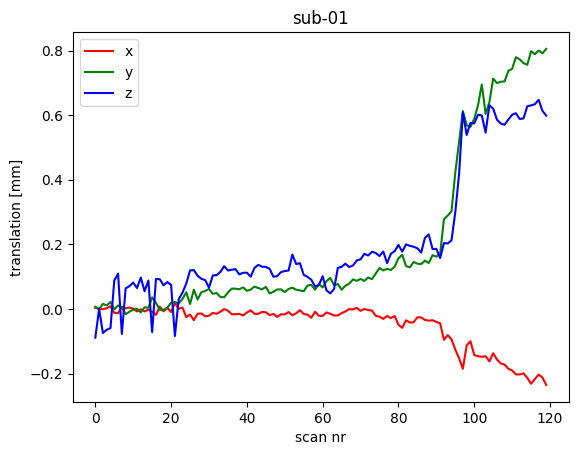

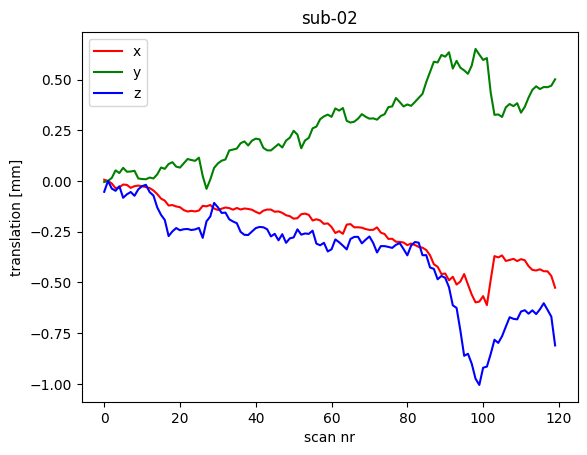

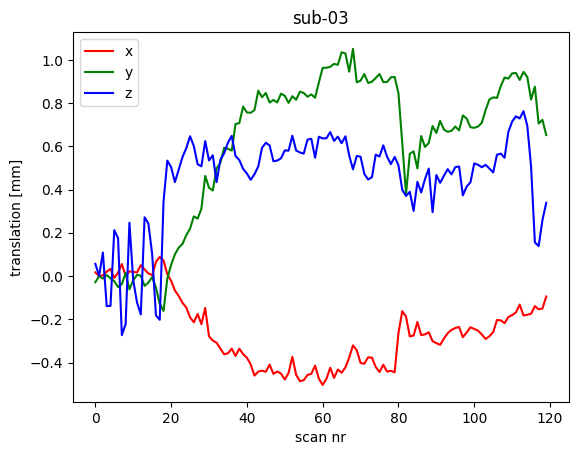

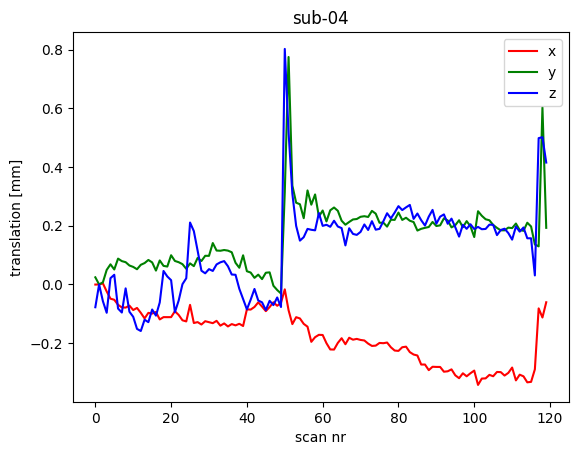

<Figure size 640x480 with 0 Axes>

In [5]:
vols = np.linspace(0, 119, 120)

sub_id = 0
plt.plot(vols, translation_params[0][sub_id,:,1], 'r-', label='x')
plt.plot(vols, translation_params[1][sub_id,:,1], 'g-', label='y')
plt.plot(vols, translation_params[2][sub_id,:,1], 'b-', label='z')
plt.ylabel('translation [mm]')
plt.xlabel('scan nr')
plt.title('sub-01')
plt.legend()
plt.figure()

sub_id = 1
plt.plot(vols, translation_params[0][sub_id,:,1], 'r-', label='x')
plt.plot(vols, translation_params[1][sub_id,:,1], 'g-', label='y')
plt.plot(vols, translation_params[2][sub_id,:,1], 'b-', label='z')
plt.title('sub-02')
plt.ylabel('translation [mm]')
plt.xlabel('scan nr')
plt.legend()
plt.figure()

sub_id = 2
plt.plot(vols, translation_params[0][sub_id,:,1], 'r-', label='x')
plt.plot(vols, translation_params[1][sub_id,:,1], 'g-', label='y')
plt.plot(vols, translation_params[2][sub_id,:,1], 'b-', label='z')
plt.title('sub-03')
plt.ylabel('translation [mm]')
plt.xlabel('scan nr')
plt.legend()
plt.figure()

sub_id = 3
plt.plot(vols, translation_params[0][sub_id,:,1], 'r-', label='x')
plt.plot(vols, translation_params[1][sub_id,:,1], 'g-', label='y')
plt.plot(vols, translation_params[2][sub_id,:,1], 'b-', label='z')
plt.title('sub-04')
plt.ylabel('translation [mm]')
plt.xlabel('scan nr')
plt.legend()
plt.figure()

<Figure size 640x480 with 0 Axes>

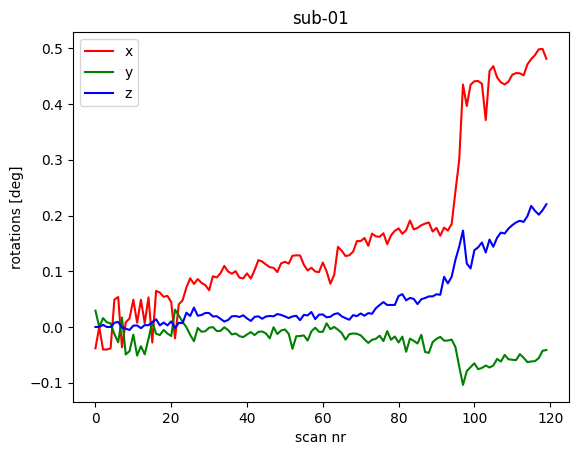

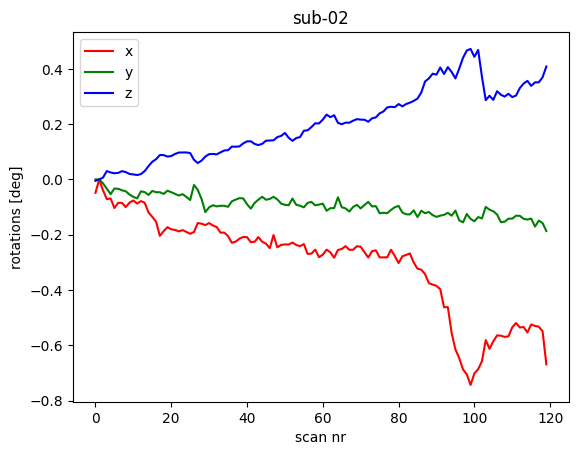

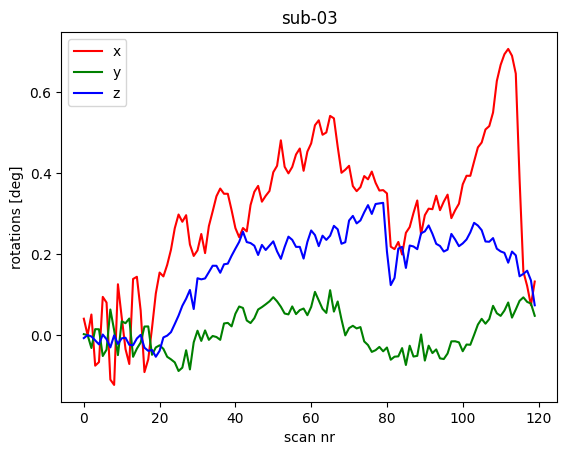

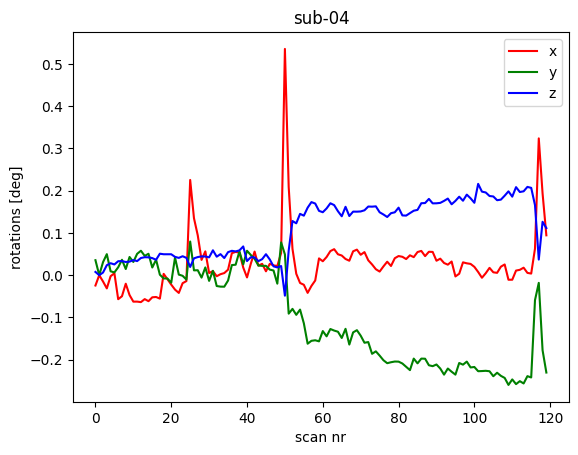

<Figure size 640x480 with 0 Axes>

In [6]:
vols = np.linspace(0, 119, 120)

sub_id = 0
plt.plot(vols, rotation_params[0][sub_id,:,1], 'r-', label='x')
plt.plot(vols, rotation_params[1][sub_id,:,1], 'g-', label='y')
plt.plot(vols, rotation_params[2][sub_id,:,1], 'b-', label='z')
plt.ylim()
plt.title('sub-01')
plt.ylabel('rotations [deg]')
plt.xlabel('scan nr')
plt.legend()
plt.figure()

sub_id = 1
plt.plot(vols, rotation_params[0][sub_id,:,1], 'r-', label='x')
plt.plot(vols, rotation_params[1][sub_id,:,1], 'g-', label='y')
plt.plot(vols, rotation_params[2][sub_id,:,1], 'b-', label='z')
plt.title('sub-02')
plt.ylabel('rotations [deg]')
plt.xlabel('scan nr')
plt.legend()
plt.figure()

sub_id = 2
plt.plot(vols, rotation_params[0][sub_id,:,1], 'r-', label='x')
plt.plot(vols, rotation_params[1][sub_id,:,1], 'g-', label='y')
plt.plot(vols, rotation_params[2][sub_id,:,1], 'b-', label='z')
plt.title('sub-03')
plt.ylabel('rotations [deg]')
plt.xlabel('scan nr')
plt.legend()
plt.figure()

sub_id = 3
plt.plot(vols, rotation_params[0][sub_id,:,1], 'r-', label='x')
plt.plot(vols, rotation_params[1][sub_id,:,1], 'g-', label='y')
plt.plot(vols, rotation_params[2][sub_id,:,1], 'b-', label='z')
plt.title('sub-04')
plt.ylabel('rotations [deg]')
plt.xlabel('scan nr')
plt.legend()
plt.figure()

## Temporal SNR 
Plot tSNR within V1 delineation: across all layers, per layer, as a function of eccentricity

#### Across all layers
Make data frame

In [5]:
subs  = [['sub-01']*2,['sub-02']*2,['sub-03']*2,['sub-04']*2]
subs  = list(itertools.chain(*subs))

hemi  = hem_list*4

ecc   = np.empty((1,len(subs),)).tolist()
ecc   = list(itertools.chain(*ecc))

rsq   = np.empty((1,len(subs),)).tolist()
rsq   = list(itertools.chain(*rsq))

equivol_layers = np.empty((1,len(subs),)).tolist()
equivol_layers = list(itertools.chain(*equivol_layers))

equidist_layers = np.empty((1,len(subs),)).tolist()
equidist_layers = list(itertools.chain(*equidist_layers))

tSNR  = np.empty((1,len(subs),)).tolist()
tSNR  = list(itertools.chain(*tSNR))

df_tSNR = pd.DataFrame({
    'sub id' : subs,
    'hem' : hemi,
    'ecc': ecc,
    'rsq': rsq,
    'equivol_layers': equivol_layers,
    'equidist_layers' : equidist_layers,
    'tSNR': tSNR
})

In [6]:
df_tSNR

,sub id,hem,ecc,rsq,equivol_layers,equidist_layers,tSNR
0,sub-01,lh,0.0,0.0,0.0,0.0,0.0
1,sub-01,rh,0.0,0.0,0.0,0.0,0.0
2,sub-02,lh,1.0,1.0,1.0,1.0,1.0
3,sub-02,rh,1.0,1.0,1.0,1.0,1.0
4,sub-03,lh,0.0,0.0,0.0,0.0,0.0
5,sub-03,rh,0.0,0.0,0.0,0.0,0.0
6,sub-04,lh,1.0,1.0,1.0,1.0,1.0
7,sub-04,rh,1.0,1.0,1.0,1.0,1.0


In [7]:
for sub_id in range(0,len(subject_list)):
    print('*******************************')
    print(subject_list[sub_id])
    for hem_id in range(0,len(hem_list)):
        print(hem_list[hem_id])
        # directories
        data_dir     = opj(proj_dir,'output','func','sliceTimeCorr',
                           '_subject_id_'+subject_list[sub_id])
        ROI_dir      = opj(prfpy_dir,subject_list[sub_id],'ROIs')
        lay_dir      = opj(prfpy_dir,subject_list[sub_id],'layerification')

        # image files
        bar1_fn      = opj(data_dir,'_sess_id_task-bar_run-01_sess_nr_0_sess_nvol_124','atask-bar_run-01_roi_warp4D.nii')
        bar2_fn      = opj(data_dir,'_sess_id_task-bar_run-02_sess_nr_1_sess_nvol_124','atask-bar_run-02_roi_warp4D.nii')

        # layer images
        lay_equidist_fn = opj(lay_dir,'func_ribbon_rim_layers_equidist.nii')
        lay_equivol_fn = opj(lay_dir,'func_ribbon_rim_layers_equivol.nii')

        # manual ROI delineations
        V1_fn        = opj(ROI_dir,'func_'+hem_list[hem_id]+'_V1.nii')

        # prfpy output: eccentricity map
        ecc_fn       = opj(prfpy_dir,subject_list[sub_id],hem_list[hem_id]+'_ecc.nii')
        rsq_fn       = opj(prfpy_dir,subject_list[sub_id],hem_list[hem_id]+'_rsq.nii')

        # load bar, layer and ecc data
        bar1         = nib.load(bar1_fn)
        bar2         = nib.load(bar2_fn)
        ecc          = nib.load(ecc_fn)
        rsq          = nib.load(rsq_fn)
        lay_equidist = nib.load(lay_equidist_fn)
        lay_equivol  = nib.load(lay_equivol_fn)

        # load V1 and make masker
        V1             = nib.load(V1_fn)
        V1_masker      = NiftiMasker(mask_img = V1)

        # mask bar, layer and ecc data with V1
        V1_masked_bar1         = V1_masker.fit_transform(bar1)
        V1_masked_bar2         = V1_masker.fit_transform(bar2)
        V1_masked_ecc          = V1_masker.fit_transform(ecc)
        V1_masked_rsq          = V1_masker.fit_transform(rsq)
        V1_masked_lay_equidist = V1_masker.fit_transform(lay_equidist)
        V1_masked_lay_equivol  = V1_masker.fit_transform(lay_equivol)

        V1_masked_bar1         = np.rot90(V1_masked_bar1)
        V1_masked_bar2         = np.rot90(V1_masked_bar2)
        V1_masked_ecc          = np.rot90(V1_masked_ecc)
        V1_masked_rsq          = np.rot90(V1_masked_rsq)
        V1_masked_lay_equidist = np.rot90(V1_masked_lay_equidist)
        V1_masked_lay_equivol  = np.rot90(V1_masked_lay_equivol)

        ## Calculate tSNR for bar 1 & 2
        ## Bar 1
        # Calculate the mean signal intensity
        mean_signal = np.mean(V1_masked_bar1, axis=1)

        # Calculate the temporal standard deviation of the noise
        std_noise = np.std(V1_masked_bar1, axis=1)

        # Calculate the temporal SNR
        tSNR_bar1 = mean_signal / std_noise

        ## Bar 2
        # Calculate the mean signal intensity
        mean_signal = np.mean(V1_masked_bar2, axis=1)

        # Calculate the temporal standard deviation of the noise
        std_noise = np.std(V1_masked_bar2, axis=1)

        # Calculate the temporal SNR
        tSNR_bar2 = mean_signal / std_noise

        # stack the two bar tSNR arrays
        tSNR = np.vstack([tSNR_bar1, tSNR_bar2]).T

        ## Save ecc, layers, tSNR to df
        idx=df_tSNR.loc[(df_tSNR['sub id'] == subject_list[sub_id]) &
                        (df_tSNR['hem'] == hem_list[hem_id])].index.tolist()
        df_tSNR.loc[idx, 'ecc'] = pd.Series([V1_masked_ecc]*len(idx), index=df_tSNR.index[idx])
        df_tSNR.loc[idx, 'rsq'] = pd.Series([V1_masked_rsq]*len(idx), index=df_tSNR.index[idx])
        df_tSNR.loc[idx, 'equivol_layers'] = pd.Series([V1_masked_lay_equivol]*len(idx), index=df_tSNR.index[idx])
        df_tSNR.loc[idx, 'equidist_layers'] = pd.Series([V1_masked_lay_equidist]*len(idx), index=df_tSNR.index[idx])
        df_tSNR.loc[idx, 'tSNR'] = pd.Series([tSNR]*len(idx), index=df_tSNR.index[idx])
        
        

*******************************
sub-01
lh
rh
*******************************
sub-02
lh


/home/mayajas/.local/lib/python3.8/site-packages/nilearn/image/resampling.py:527: UserWarning: Casting data from int32 to float32
  warnings.warn("Casting data from %s to %s" % (data.dtype.name, aux))
/home/mayajas/.local/lib/python3.8/site-packages/nilearn/image/resampling.py:527: UserWarning: Casting data from int32 to float32
  warnings.warn("Casting data from %s to %s" % (data.dtype.name, aux))


rh


/home/mayajas/.local/lib/python3.8/site-packages/nilearn/image/resampling.py:527: UserWarning: Casting data from int32 to float32
  warnings.warn("Casting data from %s to %s" % (data.dtype.name, aux))
/home/mayajas/.local/lib/python3.8/site-packages/nilearn/image/resampling.py:527: UserWarning: Casting data from int32 to float32
  warnings.warn("Casting data from %s to %s" % (data.dtype.name, aux))
/tmp/ipykernel_19990/1525970736.py:63: RuntimeWarning: invalid value encountered in divide
  tSNR_bar1 = mean_signal / std_noise
/tmp/ipykernel_19990/1525970736.py:73: RuntimeWarning: invalid value encountered in divide
  tSNR_bar2 = mean_signal / std_noise


*******************************
sub-03
lh
rh
*******************************
sub-04
lh
rh


/home/mayajas/.local/lib/python3.8/site-packages/nilearn/_utils/niimg.py:61: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  warn(
/home/mayajas/.local/lib/python3.8/site-packages/nilearn/_utils/niimg.py:61: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  warn(
/tmp/ipykernel_19990/3029157960.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


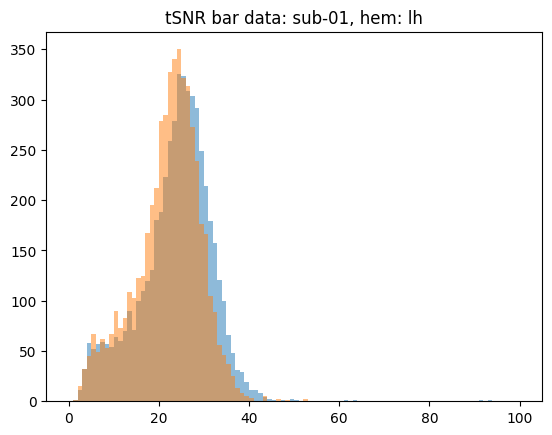

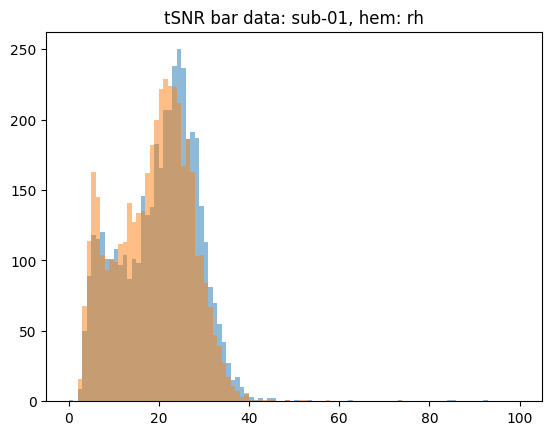

<Figure size 640x480 with 0 Axes>

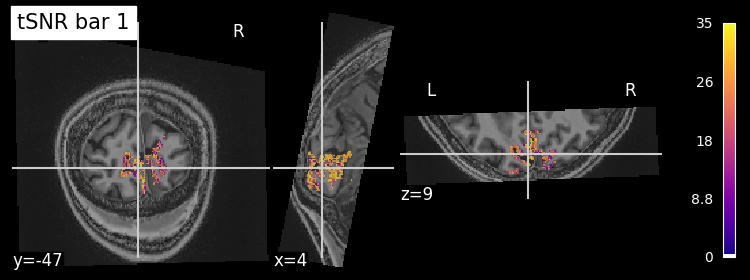

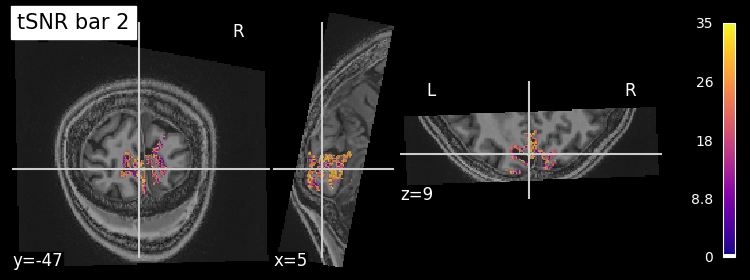

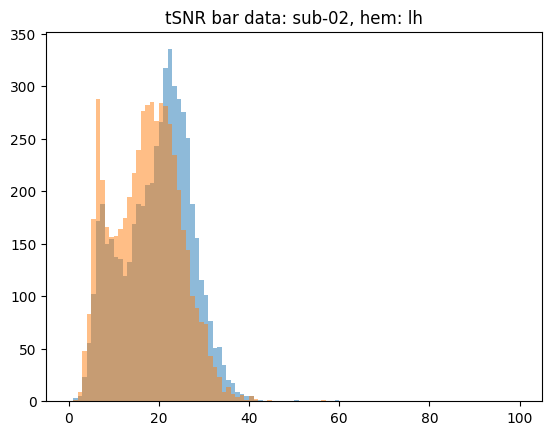

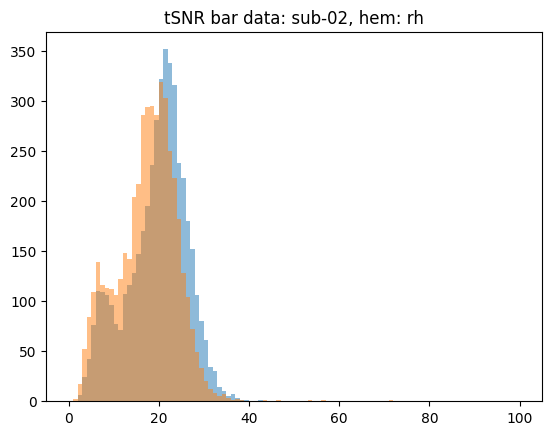

<Figure size 640x480 with 0 Axes>

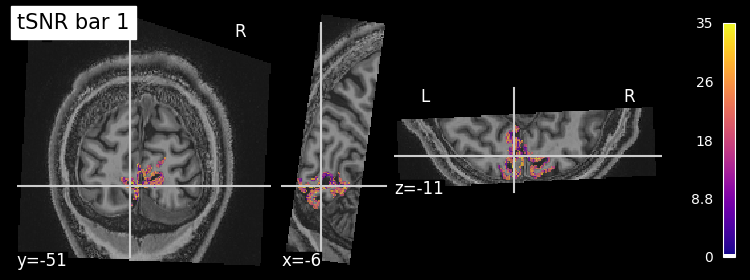

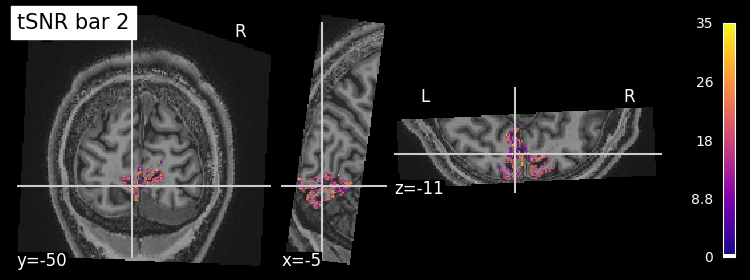

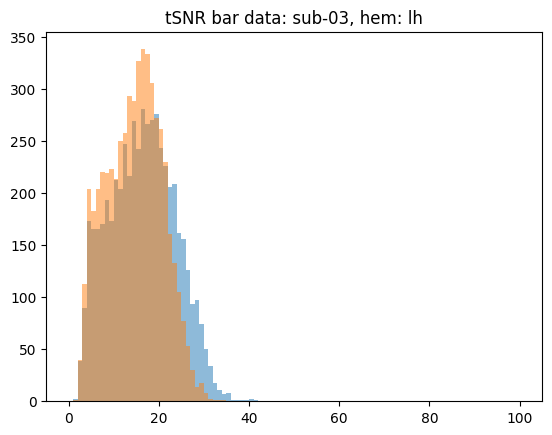

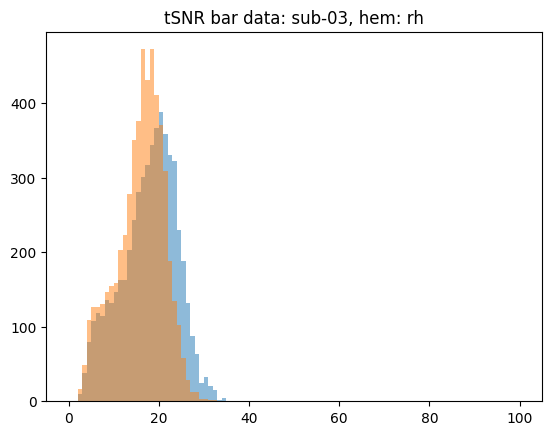

<Figure size 640x480 with 0 Axes>

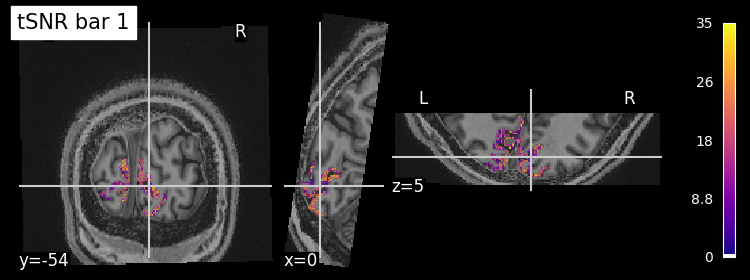

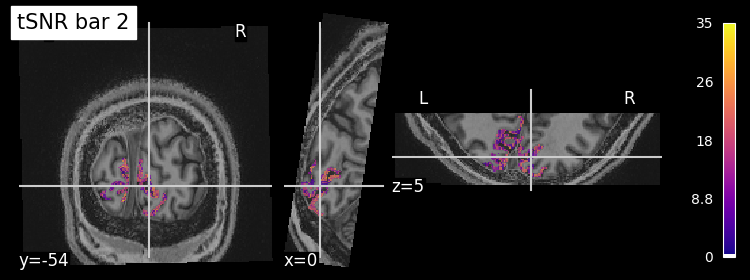

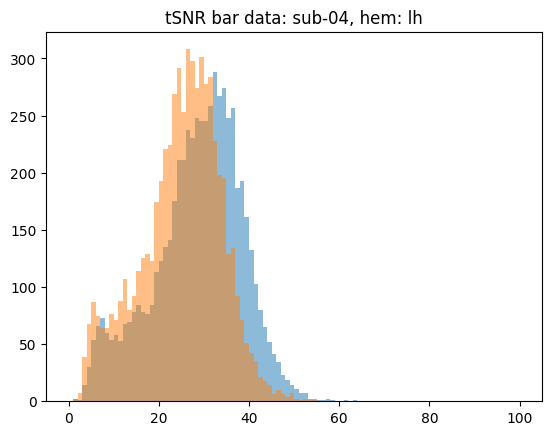

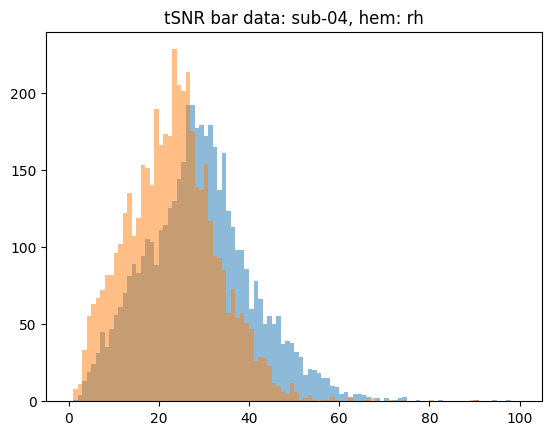

<Figure size 640x480 with 0 Axes>

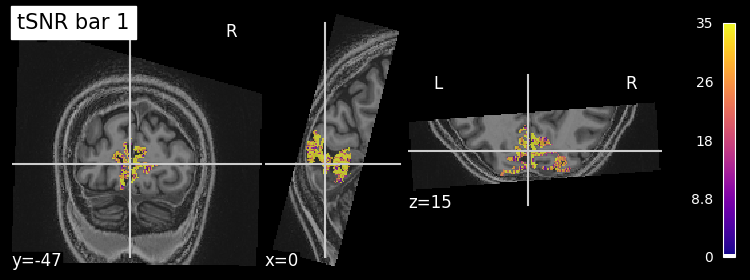

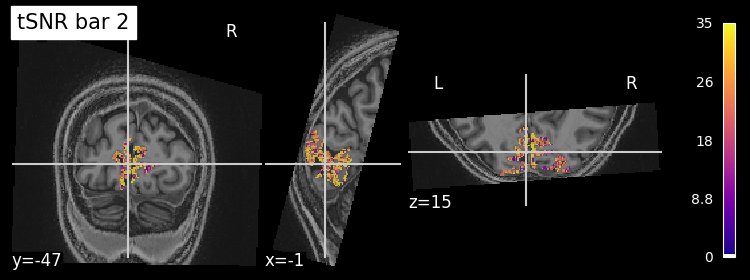

<Figure size 640x480 with 0 Axes>

In [8]:
for sub_id in range(0,len(subject_list)):
    for hem_id in range(0,len(hem_list)):
        # subject-specific dirs
        ROI_dir      = opj(prfpy_dir,subject_list[sub_id],'ROIs')
        
        # image files
        meanFunc_fn  = opj(prfpy_dir,subject_list[sub_id],'meanFunc.nii')
        meanFunc     = nib.load(meanFunc_fn)
        UNI_func_fn  = opj(prfpy_dir,subject_list[sub_id],'UNI_funcSpace.nii')
        UNI          = nib.load(UNI_func_fn)
        
        # manual ROI delineations
        V1_fn        = opj(ROI_dir,'func_'+hem_list[hem_id]+'_V1.nii')
        
        # load V1 and make masker
        V1             = nib.load(V1_fn)
        V1_masker      = NiftiMasker(mask_img = V1)
        
        # mask meanFunc with V1
        V1_masked_meanFunc = V1_masker.fit_transform(meanFunc)
        
        # extract tSNR data
        idx=df_tSNR.loc[(df_tSNR['sub id'] == subject_list[sub_id]) &
                        (df_tSNR['hem'] == hem_list[hem_id])].index.tolist()
        tSNR_bar1 = df_tSNR.loc[idx,'tSNR'].values[0][:,0]
        tSNR_bar2 = df_tSNR.loc[idx,'tSNR'].values[0][:,1]
        
        # unmask tSNR data
        unmasked_tSNR_bar1     = V1_masker.inverse_transform(tSNR_bar1) 
        unmasked_tSNR_bar2     = V1_masker.inverse_transform(tSNR_bar2) 
        
        # plot tSNR histograms
        plt.hist(tSNR_bar1, bins=100, range=[0,100], alpha=0.5);
        plt.hist(tSNR_bar2, bins=100, range=[0,100], alpha=0.5);
        plt.title('tSNR bar data: '+subject_list[sub_id]+', hem: '+hem_list[hem_id])
        plt.figure()
        
        if hem_list[hem_id] == 'lh':
            lh_unmasked_tSNR_bar1 = unmasked_tSNR_bar1
            lh_unmasked_tSNR_bar2 = unmasked_tSNR_bar2
        else:
            rh_unmasked_tSNR_bar1 = unmasked_tSNR_bar1
            rh_unmasked_tSNR_bar2 = unmasked_tSNR_bar2
    
    unmasked_tSNR_bar1 = image.math_img("img1 + img2", img1=lh_unmasked_tSNR_bar1, img2=rh_unmasked_tSNR_bar1)
    unmasked_tSNR_bar2 = image.math_img("img1 + img2", img1=lh_unmasked_tSNR_bar2, img2=rh_unmasked_tSNR_bar2)
    
    # plot tSNR as overlay
    plot_roi(unmasked_tSNR_bar1,UNI,title="tSNR bar 1", colorbar=True, cmap = 'plasma', vmin=0, vmax=35)
    plot_roi(unmasked_tSNR_bar2,UNI,title="tSNR bar 2", colorbar=True, cmap = 'plasma', vmin=0, vmax=35)
    plt.figure()
        

### Plot SNR as function of cortical depth
Fit a linear GLM to the relation to see whether tSNR depends significantly on cortical depth

In [9]:
df_tSNR

,sub id,hem,ecc,rsq,equivol_layers,equidist_layers,tSNR
0,sub-01,lh,"[[0.0], [0.8276207869224026], [0.0], [1.710433...","[[0.08723444841866379], [0.2572228515043826], ...","[[9.0], [8.0], [8.0], [6.0], [5.0], [8.0], [6....","[[9.0], [8.0], [9.0], [6.0], [5.0], [8.0], [6....","[[6.8014083, 14.0511675], [12.386605, 11.76021..."
1,sub-01,rh,"[[0.0], [2.2819214654880926], [2.2089904614779...","[[0.0], [0.5045851792719296], [0.4580318020973...","[[7.0], [6.0], [5.0], [6.0], [6.0], [6.0], [6....","[[8.0], [6.0], [5.0], [6.0], [6.0], [6.0], [6....","[[21.591362, 17.80558], [12.792615, 12.475176]..."
2,sub-02,lh,"[[1.8225183821432174], [0.3363972680627782], [...","[[0.16237928791972023], [0.30300489240545314],...","[[3.0], [3.0], [3.0], [2.0], [6.0], [6.0], [5....","[[3.0], [3.0], [3.0], [2.0], [6.0], [6.0], [5....","[[22.849731, 24.822302], [24.597494, 23.717209..."
3,sub-02,rh,"[[1.2997818815508677], [1.3614997136037608], [...","[[0.45038866731667093], [0.3372958969074361], ...","[[9.0], [9.0], [8.0], [8.0], [9.0], [8.0], [8....","[[9.0], [9.0], [9.0], [8.0], [9.0], [9.0], [8....","[[18.477472, 16.199703], [18.355484, 15.441999..."
4,sub-03,lh,"[[0.0], [0.03512312289767993], [0.170918648970...","[[0.09226673979570943], [0.31617551600649896],...","[[10.0], [8.0], [9.0], [8.0], [8.0], [9.0], [9...","[[10.0], [9.0], [9.0], [8.0], [9.0], [9.0], [9...","[[4.7289977, 5.3781767], [14.951008, 8.776693]..."
5,sub-03,rh,"[[0.0], [1.0612400804619466], [2.0999179665918...","[[0.08957259899610737], [0.12505599108436316],...","[[8.0], [7.0], [7.0], [6.0], [8.0], [7.0], [8....","[[9.0], [7.0], [7.0], [6.0], [8.0], [8.0], [8....","[[16.880459, 16.040144], [7.3132453, 10.194477..."
6,sub-04,lh,"[[0.0], [0.0], [2.419749554927562], [6.5801377...","[[0.09004124500495325], [0.08687976906815842],...","[[9.0], [9.0], [7.0], [9.0], [7.0], [3.0], [9....","[[9.0], [9.0], [8.0], [9.0], [8.0], [4.0], [9....","[[4.9479527, 5.575462], [21.564337, 15.29186],..."
7,sub-04,rh,"[[3.213937084925465], [1.5455819937786188], [1...","[[0.10186343716739976], [0.2815419247976263], ...","[[9.0], [9.0], [9.0], [8.0], [9.0], [9.0], [8....","[[9.0], [10.0], [9.0], [9.0], [9.0], [9.0], [9...","[[30.644299, 30.704084], [13.886455, 21.554089..."


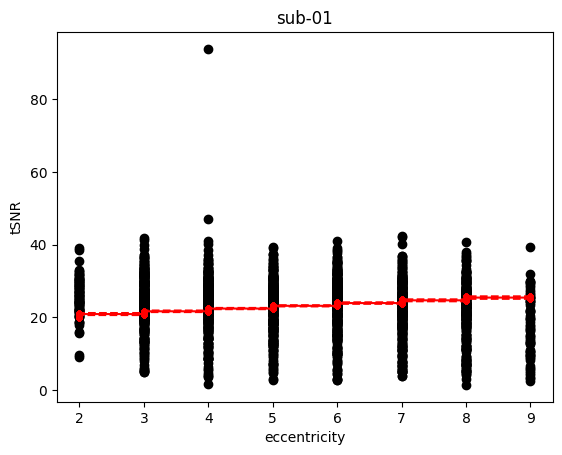

Intercept: 26.95671341617836
t = 104.42, p = 0.00000
Slope: -0.7552269472222759
t = -16.69, p = 0.00000


In [126]:
sub_id=0
hem_id=0

# extract tSNR and layer data
idx=df_tSNR.loc[(df_tSNR['sub id'] == subject_list[sub_id]) &
                (df_tSNR['hem'] == hem_list[hem_id])].index.tolist()
tSNR_bar1 = df_tSNR.loc[idx,'tSNR'].values[0][:,0]
tSNR_bar2 = df_tSNR.loc[idx,'tSNR'].values[0][:,1]

equivol_layers  = df_tSNR.loc[idx,'equivol_layers'].values[0]
equidist_layers = df_tSNR.loc[idx,'equidist_layers'].values[0]

tSNR = np.concatenate((tSNR_bar1,tSNR_bar2))
equivol_layers = np.concatenate((equivol_layers,equivol_layers))



# Split the data into a training set and a test set
X_train, X_test, y_train, y_test = train_test_split(equivol_layers, tSNR, test_size=0.2)

# Fit the model to the training set
X_train = sm.add_constant(X_train)
model = sm.GLM(y_train, X_train, family=sm.families.Gaussian()).fit()

# Make predictions on the test set
X_test = sm.add_constant(X_test)
y_pred = model.predict(X_test)

# extract the prediction
pred = model.get_prediction(X_test)

# extract the intercept and slope
intercept = model.params[0]
slope = model.params[1]

# extract the bootstrapped 95% quantiles and median of the fit
quantiles = pred.summary_frame(alpha=0.05)
median = pred.summary_frame(alpha=0.5)

# plot the model
plt.plot(np.atleast_2d(X_test[:,1]).T, y_test, 'ko')
plt.plot(np.sort(np.atleast_2d(X_test[:,1])).T, np.sort(y_pred), 'r-')
plt.plot(np.sort(np.atleast_2d(X_test[:,1])).T, np.sort(quantiles['mean_ci_lower'].values), 'r--.')
plt.plot(np.sort(np.atleast_2d(X_test[:,1])).T, np.sort(quantiles['mean_ci_upper'].values), 'r--.')
plt.xlabel('eccentricity')
plt.ylabel('tSNR')
plt.title(subject_list[sub_id])
plt.show()

# print stats
print(f"Intercept: {intercept}")
intercept_txt = "t = "+"{:.2f}".format(model.tvalues[0])+", p = "+"{:.5f}".format(model.pvalues[0])
print(intercept_txt)

print(f"Slope: {slope}")
slope_txt = "t = "+"{:.2f}".format(model.tvalues[1])+", p = "+"{:.5f}".format(model.pvalues[1])
print(slope_txt)

Subject: sub-01
Intercept: 26.71315236872923
t = 135.16, p = 0.00000
Slope: -0.9785197528680318
t = -28.31, p = 0.00000

Subject: sub-02
Intercept: 24.52397328787023
t = 152.58, p = 0.00000
Slope: -1.1309529908240217
t = -40.59, p = 0.00000

Subject: sub-03
Intercept: 22.775323878139595
t = 168.99, p = 0.00000
Slope: -1.2103712316207398
t = -51.88, p = 0.00000

Subject: sub-04
Intercept: 33.143061803290294
t = 136.52, p = 0.00000
Slope: -1.2231352742697736
t = -29.24, p = 0.00000



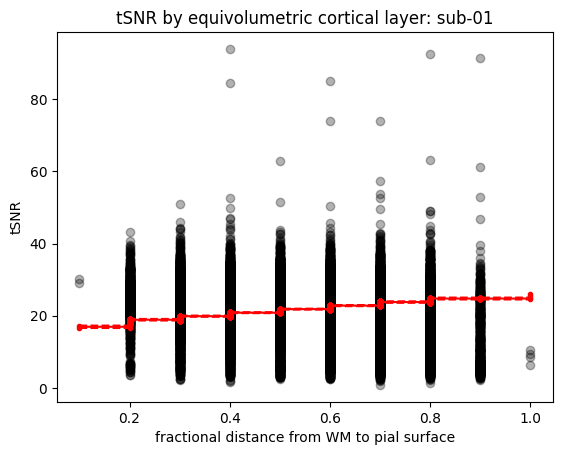

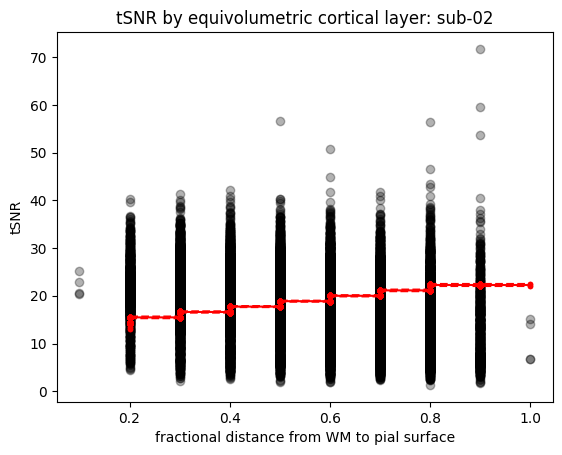

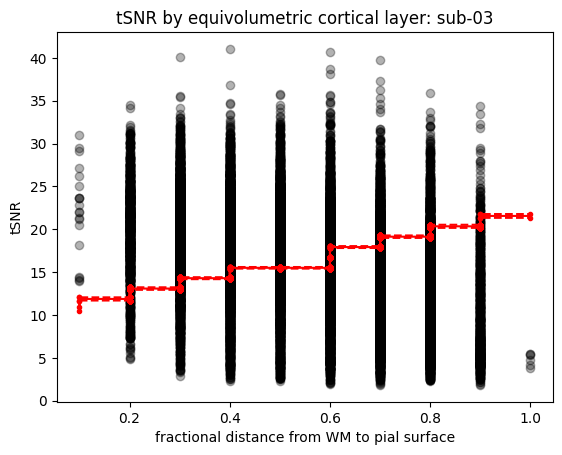

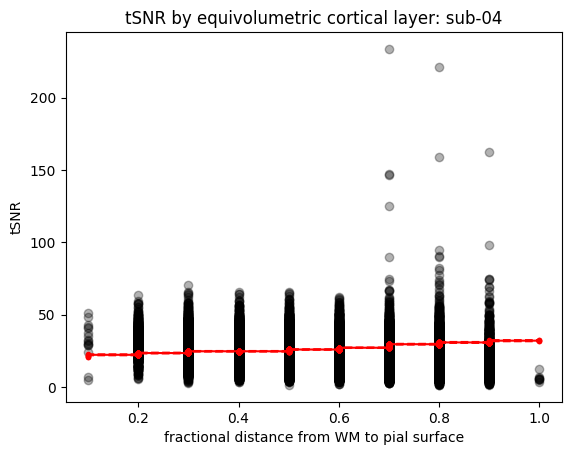

<Figure size 640x480 with 0 Axes>

In [56]:
for sub_id in range(0,len(subject_list)):
    for hem_id in range(0,len(hem_list)):
        # extract tSNR and layer data
        idx=df_tSNR.loc[(df_tSNR['sub id'] == subject_list[sub_id]) &
                        (df_tSNR['hem'] == hem_list[hem_id])].index.tolist()
        tSNR_bar1 = df_tSNR.loc[idx,'tSNR'].values[0][:,0]
        tSNR_bar2 = df_tSNR.loc[idx,'tSNR'].values[0][:,1]
        
        equivol_layers  = df_tSNR.loc[idx,'equivol_layers'].values[0]
        equidist_layers = df_tSNR.loc[idx,'equidist_layers'].values[0]
        
        if hem_list[hem_id] == 'lh':
            lh_tSNR_bar1 = tSNR_bar1
            lh_tSNR_bar2 = tSNR_bar2
            
            lh_equivol_layers = equivol_layers
        else:
            rh_tSNR_bar1 = tSNR_bar1
            rh_tSNR_bar2 = tSNR_bar2
            
            rh_equivol_layers = equivol_layers
    
    # concatenate lh and rh, bar1 and bar2
    tSNR_bar1 = np.concatenate((lh_tSNR_bar1,rh_tSNR_bar1))
    tSNR_bar2 = np.concatenate((lh_tSNR_bar2,rh_tSNR_bar2))
    tSNR      = np.concatenate((tSNR_bar1,tSNR_bar2))
    
    equivol_layers = np.concatenate((lh_equivol_layers,rh_equivol_layers))
    equivol_layers = np.concatenate((equivol_layers,equivol_layers))
    
    # remove nans
    equivol_layers=np.delete(equivol_layers, np.where(np.isnan(tSNR))[0].tolist())
    tSNR=np.delete(tSNR, np.where(np.isnan(tSNR))[0].tolist())
    
    # fit linear GLM
    # Split the data into a training set and a test set
    X_train, X_test, y_train, y_test = train_test_split(equivol_layers, tSNR, test_size=0.2)

    # Fit the model to the training set
    X_train = sm.add_constant(X_train)
    model = sm.GLM(y_train, X_train, family=sm.families.Gaussian()).fit()

    # Make predictions on the test set
    X_test = sm.add_constant(X_test)
    y_pred = model.predict(X_test)

    # extract the prediction
    pred = model.get_prediction(X_test)

    # extract the intercept and slope
    intercept = model.params[0]
    slope = model.params[1]

    # extract the bootstrapped 95% quantiles and median of the fit
    quantiles = pred.summary_frame(alpha=0.05)
    median = pred.summary_frame(alpha=0.5)

    # plot the model
    #plt.plot(np.atleast_2d(X_test[:,1]).T, y_test, 'ko')
    plt.scatter(equivol_layers/10,tSNR,c='black',alpha=0.3)
    plt.plot(np.sort(np.atleast_2d(X_test[:,1])).T/10, np.sort(y_pred), 'r-')
    plt.plot(np.sort(np.atleast_2d(X_test[:,1])).T/10, np.sort(quantiles['mean_ci_lower'].values), 'r--.')
    plt.plot(np.sort(np.atleast_2d(X_test[:,1])).T/10, np.sort(quantiles['mean_ci_upper'].values), 'r--.')
    plt.xlabel('fractional distance from WM to pial surface')
    plt.ylabel('tSNR')
    plt.title('tSNR by equivolumetric cortical layer: '+subject_list[sub_id])
    plt.figure()

    # print stats
    print("Subject: "+subject_list[sub_id])
    print(f"Intercept: {intercept}")
    intercept_txt = "t = "+"{:.2f}".format(model.tvalues[0])+", p = "+"{:.5f}".format(model.pvalues[0])
    print(intercept_txt)

    print(f"Slope: {slope}")
    slope_txt = "t = "+"{:.2f}".format(model.tvalues[1])+", p = "+"{:.5f}".format(model.pvalues[1])
    print(slope_txt)
    print("")

        

In [49]:
equivol_layers=np.delete(equivol_layers, np.where(np.isnan(tSNR))[0].tolist())

(20038,)

### Plot SNR as function of eccentricity

Subject: sub-01
Intercept: 21.388656042708824
t = 238.22, p = 0.00000
Slope: -0.04827516208821406
t = -1.23, p = 0.21979

Subject: sub-02
Intercept: 18.49987268156517
t = 234.42, p = 0.00000
Slope: -0.045185969032969384
t = -1.44, p = 0.14922

Subject: sub-03
Intercept: 16.348536495204794
t = 276.72, p = 0.00000
Slope: -0.10428305229440217
t = -4.24, p = 0.00002

Subject: sub-04
Intercept: 27.438215148910068
t = 256.11, p = 0.00000
Slope: -0.5443909902968985
t = -13.30, p = 0.00000



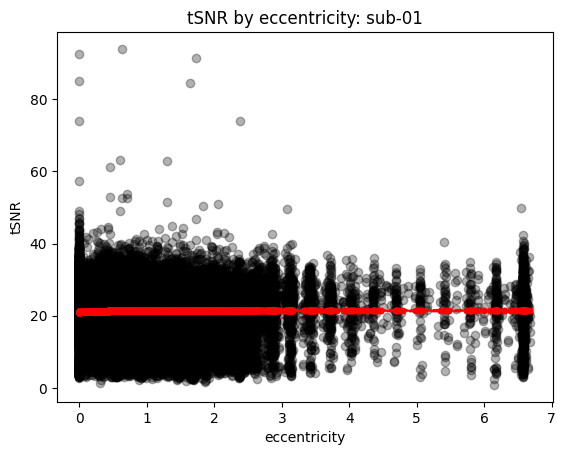

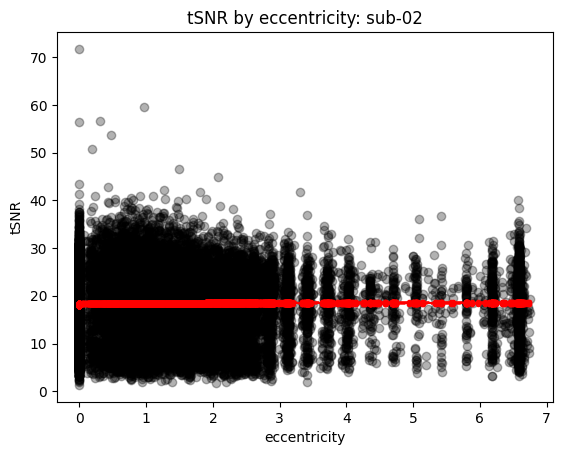

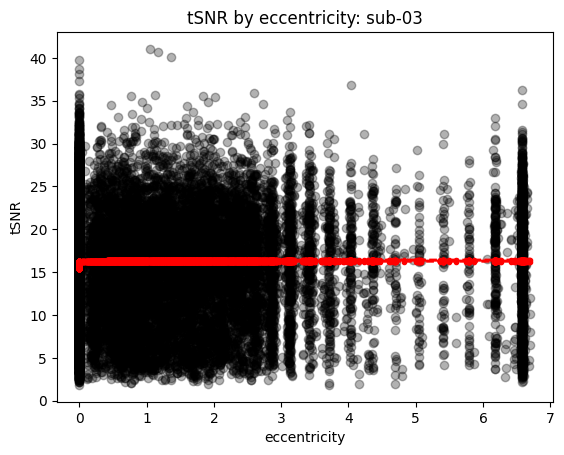

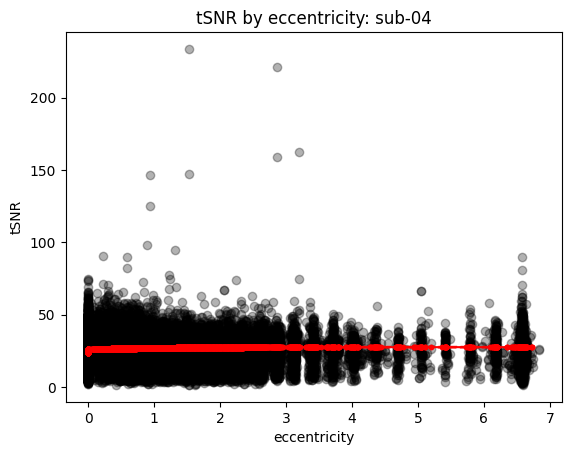

<Figure size 640x480 with 0 Axes>

In [57]:
for sub_id in range(0,len(subject_list)):
    for hem_id in range(0,len(hem_list)):
        # extract tSNR data
        idx=df_tSNR.loc[(df_tSNR['sub id'] == subject_list[sub_id]) &
                        (df_tSNR['hem'] == hem_list[hem_id])].index.tolist()
        tSNR_bar1 = df_tSNR.loc[idx,'tSNR'].values[0][:,0]
        tSNR_bar2 = df_tSNR.loc[idx,'tSNR'].values[0][:,1]

        ecc       = df_tSNR.loc[idx,'ecc'].values[0]
        
        if hem_list[hem_id] == 'lh':
            lh_tSNR_bar1 = tSNR_bar1
            lh_tSNR_bar2 = tSNR_bar2
            
            lh_ecc = ecc
        else:
            rh_tSNR_bar1 = tSNR_bar1
            rh_tSNR_bar2 = tSNR_bar2
            
            rh_ecc = ecc
    
    # concatenate lh and rh, bar1 and bar2
    tSNR_bar1 = np.concatenate((lh_tSNR_bar1,rh_tSNR_bar1))
    tSNR_bar2 = np.concatenate((lh_tSNR_bar2,rh_tSNR_bar2))
    tSNR      = np.concatenate((tSNR_bar1,tSNR_bar2))
    
    ecc = np.concatenate((lh_ecc,rh_ecc))
    ecc = np.concatenate((ecc,ecc))
    
    # remove nans
    ecc=np.delete(ecc, np.where(np.isnan(tSNR))[0].tolist())
    tSNR=np.delete(tSNR, np.where(np.isnan(tSNR))[0].tolist())
    
    # fit linear GLM
    # Split the data into a training set and a test set
    X_train, X_test, y_train, y_test = train_test_split(ecc, tSNR, test_size=0.2)

    # Fit the model to the training set
    X_train = sm.add_constant(X_train)
    model = sm.GLM(y_train, X_train, family=sm.families.Gaussian()).fit()

    # Make predictions on the test set
    X_test = sm.add_constant(X_test)
    y_pred = model.predict(X_test)

    # extract the prediction
    pred = model.get_prediction(X_test)

    # extract the intercept and slope
    intercept = model.params[0]
    slope = model.params[1]

    # extract the bootstrapped 95% quantiles and median of the fit
    quantiles = pred.summary_frame(alpha=0.05)
    median = pred.summary_frame(alpha=0.5)

    # plot the model
    #plt.plot(np.atleast_2d(X_test[:,1]).T, y_test, 'ko')
    plt.scatter(ecc,tSNR,c='black',alpha=0.3)
    plt.plot(np.sort(np.atleast_2d(X_test[:,1])).T, np.sort(y_pred), 'r-')
    plt.plot(np.sort(np.atleast_2d(X_test[:,1])).T, np.sort(quantiles['mean_ci_lower'].values), 'r--.')
    plt.plot(np.sort(np.atleast_2d(X_test[:,1])).T, np.sort(quantiles['mean_ci_upper'].values), 'r--.')
    plt.xlabel('eccentricity')
    plt.ylabel('tSNR')
    plt.title('tSNR by eccentricity: '+subject_list[sub_id])
    plt.figure()

    # print stats
    print("Subject: "+subject_list[sub_id])
    print(f"Intercept: {intercept}")
    intercept_txt = "t = "+"{:.2f}".format(model.tvalues[0])+", p = "+"{:.5f}".format(model.pvalues[0])
    print(intercept_txt)

    print(f"Slope: {slope}")
    slope_txt = "t = "+"{:.2f}".format(model.tvalues[1])+", p = "+"{:.5f}".format(model.pvalues[1])
    print(slope_txt)
    print("")

# pRF modeling: diagnostics and visualization
These have already been run on curta

In [13]:
f = open(pRF_param_fn,'rb')
x, y, sigma, total_rsq, polar, ecc = pickle.load(f)
f.close()

## pRF parameter histograms for sub-01

Extract parameters from iterative fit result

Use in case of wanting to edit rsq threshold of projected surfaces:

In [8]:
# unmasked_x     = masker.inverse_transform(x) 
# unmasked_y     = masker.inverse_transform(y) 
# unmasked_sigma = masker.inverse_transform(sigma) 
# unmasked_pol   = masker.inverse_transform(polar) 
# unmasked_ecc   = masker.inverse_transform(ecc) 
# unmasked_rsq   = masker.inverse_transform(total_rsq) 

# unmasked_meanFunc     = masker.inverse_transform(masked_meanFunc) 


Left hemisphere

<Figure size 640x480 with 0 Axes>

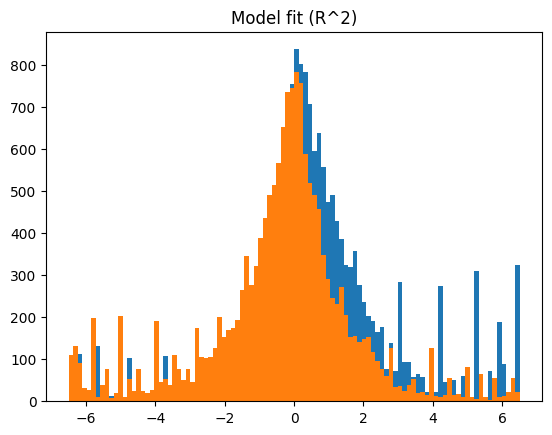

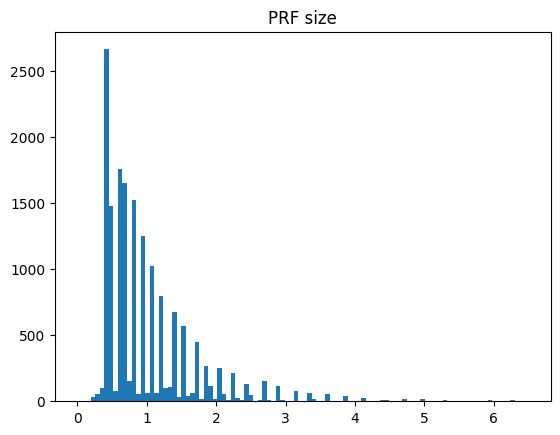

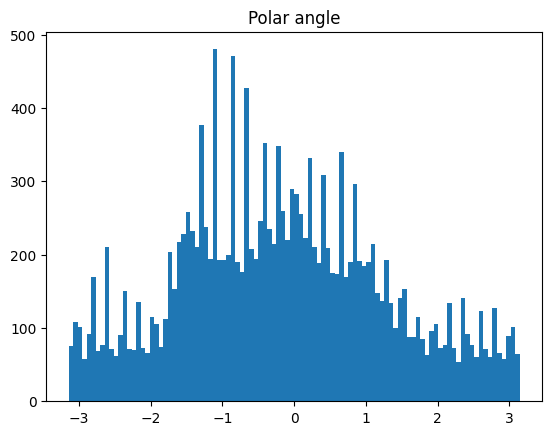

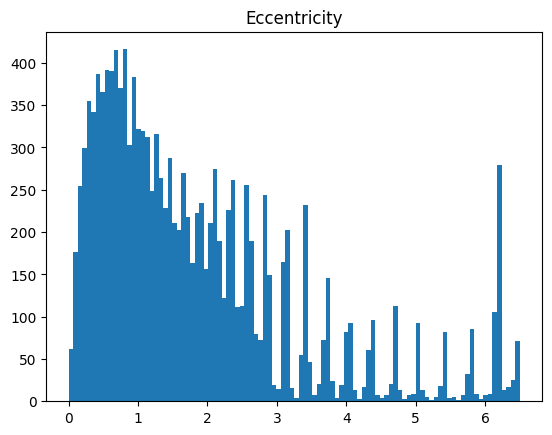

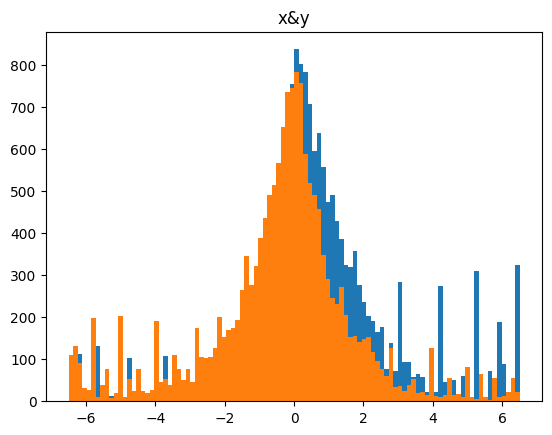

<Figure size 640x480 with 0 Axes>

In [11]:
plt.hist(x[total_rsq>0.1], bins=100, range=[-max_ecc_deg,max_ecc_deg]);
plt.hist(y[total_rsq>0.1], bins=100, range=[-max_ecc_deg,max_ecc_deg]);
plt.title('Model fit (R^2)')
plt.figure()
plt.hist(sigma[total_rsq>0.1],bins=100, range=[0,max_ecc_deg])
plt.title('PRF size')
plt.figure()
plt.hist(polar[total_rsq>0.1],bins=100, range=[-np.pi,np.pi])
plt.title('Polar angle')
plt.figure()
plt.hist(ecc[total_rsq>0.1],bins=100, range=[0,max_ecc_deg])
plt.title('Eccentricity')
plt.figure()
plt.hist(x[total_rsq>0.1],bins=100, range=[-max_ecc_deg,max_ecc_deg])
plt.hist(y[total_rsq>0.1],bins=100, range=[-max_ecc_deg,max_ecc_deg])
plt.title('x&y')
plt.figure()
#plt.hist(gfS.iterative_search_params[:,2], bins=100, range=[0,20]);

#plt.stairs(counts, bins)

Right hemisphere

<Figure size 640x480 with 0 Axes>

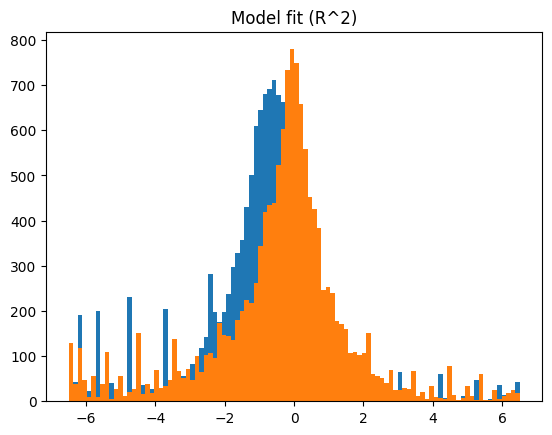

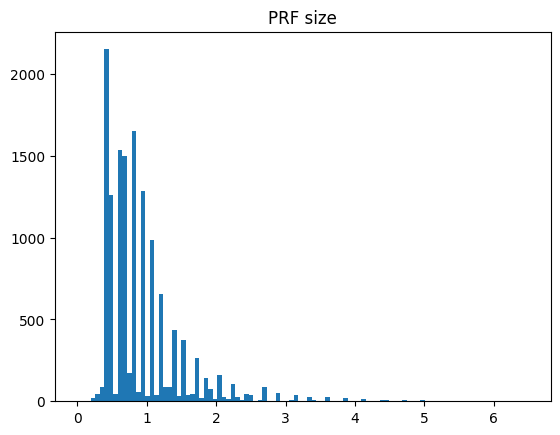

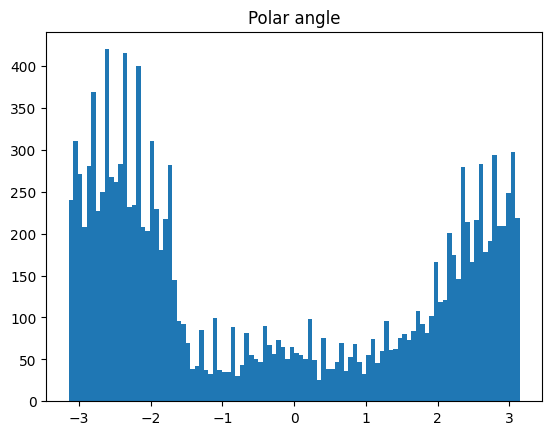

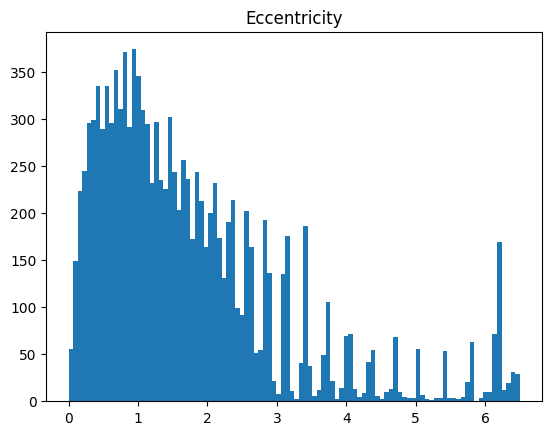

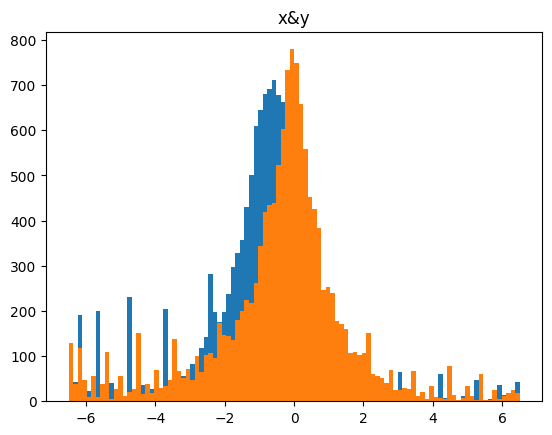

<Figure size 640x480 with 0 Axes>

In [14]:
plt.hist(x[total_rsq>0.1], bins=100, range=[-max_ecc_deg,max_ecc_deg]);
plt.hist(y[total_rsq>0.1], bins=100, range=[-max_ecc_deg,max_ecc_deg]);
plt.title('Model fit (R^2)')
plt.figure()
plt.hist(sigma[total_rsq>0.1],bins=100, range=[0,max_ecc_deg])
plt.title('PRF size')
plt.figure()
plt.hist(polar[total_rsq>0.1],bins=100, range=[-np.pi,np.pi])
plt.title('Polar angle')
plt.figure()
plt.hist(ecc[total_rsq>0.1],bins=100, range=[0,max_ecc_deg])
plt.title('Eccentricity')
plt.figure()
plt.hist(x[total_rsq>0.1],bins=100, range=[-max_ecc_deg,max_ecc_deg])
plt.hist(y[total_rsq>0.1],bins=100, range=[-max_ecc_deg,max_ecc_deg])
plt.title('x&y')
plt.figure()
#plt.hist(gfS.iterative_search_params[:,2], bins=100, range=[0,20]);

#plt.stairs(counts, bins)

Visualize ecc

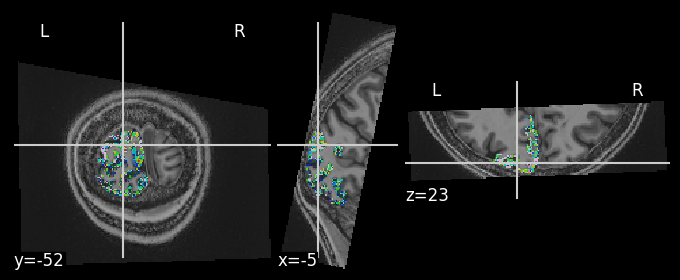

In [23]:
plot_roi(unmasked_ecc,UNI)

# PRF size across cortical depth: all subjects

## Load data

In [833]:
f = open(df_layers_fn,'rb')
df_equivol_per_ecc,\
df_equidist_per_ecc,\
df_equivol_per_depth,\
df_equivol_per_depth_ecc2,\
df_equidist_per_depth,\
df_equidist_per_depth_ecc2,\
df_pRF_per_cortdist, \
df_pRF_per_cortdist_ecc2 = pickle.load(f)

f.close()

In [834]:
df_equivol_per_ecc.head()

,sub id,hem,ecc,pRF size,depth
0,sub-01,lh,2.0,"[0.606297967982622, 0.935384672126705, 0.67339...","[1.0, 2.0, 3.0, 4.0, 5.0, 6.0]"
1,sub-01,lh,3.0,"[0.6461577057765733, 0.5449465389646753, 0.709...","[1.0, 2.0, 3.0, 4.0, 5.0, 6.0]"
2,sub-01,lh,4.0,"[0.8398100625388599, nan, 0.8795486711706567, ...","[1.0, 2.0, 3.0, 4.0, 5.0, 6.0]"
3,sub-01,lh,5.0,"[1.0963840067360167, 0.9519533833598484, 1.200...","[1.0, 2.0, 3.0, 4.0, 5.0, 6.0]"
4,sub-01,rh,2.0,"[0.667686875732663, 0.5951321645504273, 0.6857...","[1.0, 2.0, 3.0, 4.0, 5.0, 6.0]"


In [835]:
df_equidist_per_ecc.head()

,sub id,hem,ecc,pRF size,depth
0,sub-01,lh,2.0,"[0.606297967982622, 0.792987396598291, 0.65414...","[1.0, 2.0, 3.0, 4.0, 5.0, 6.0]"
1,sub-01,lh,3.0,"[0.6461577057765733, 0.637664238375332, 0.6769...","[1.0, 2.0, 3.0, 4.0, 5.0, 6.0]"
2,sub-01,lh,4.0,"[0.8398100625388599, 0.6710078126100486, 0.932...","[1.0, 2.0, 3.0, 4.0, 5.0, 6.0]"
3,sub-01,lh,5.0,"[1.0963840067360167, 1.2366854180382936, 1.143...","[1.0, 2.0, 3.0, 4.0, 5.0, 6.0]"
4,sub-01,rh,2.0,"[0.667686875732663, 0.5503990744944826, 0.7047...","[1.0, 2.0, 3.0, 4.0, 5.0, 6.0]"


In [836]:
df_equivol_per_depth.head()

,sub id,hem,depth,pRF size,ecc,rsq
0,sub-01,lh,1.0,"[0.41108869210300364, 1.530799371375438, 0.946...","[1.0144987121658486, 6.570204416471507, 6.5800...","[0.0643387503386037, 0.1273749537437333, 0.073..."
1,sub-01,lh,2.0,"[0.9458990653169422, 0.4113627617908103, 0.405...","[6.576530769781273, 6.580949747690814, 0.33780...","[0.0805637541891211, 0.0703948870372968, 0.079..."
2,sub-01,lh,3.0,"[0.41297039532836194, 0.9479984129499017, 0.41...","[0.4341187074524043, 6.182220545149516, 6.5803...","[0.14094454784020816, 0.08975514532171747, 0.0..."
3,sub-01,lh,4.0,"[1.5312445988261698, 0.9463248873475711, 0.821...","[6.573438553057826, 1.0904928293514982, 6.5793...","[0.0906912196273344, 0.16370816666079835, 0.14..."
4,sub-01,lh,5.0,"[0.5926230033243476, 0.5988043614801991, 0.411...","[1.0327077575607277, 1.9990310395966209, 6.581...","[0.4851361673023189, 0.08316924122688585, 0.05..."


In [837]:
df_equidist_per_depth.head()

,sub id,hem,depth,pRF size,ecc,rsq
0,sub-01,lh,1.0,"[0.41108869210300364, 1.530799371375438, 0.946...","[1.0144987121658486, 6.570204416471507, 6.5800...","[0.0643387503386037, 0.1273749537437333, 0.073..."
1,sub-01,lh,2.0,"[0.4055342924813615, 0.49944990034997705, 0.40...","[0.3378066585072097, 0.44398924509411786, 0.86...","[0.07961245656184135, 0.08813281334181255, 0.0..."
2,sub-01,lh,3.0,"[0.9479984129499017, 0.4109778178611775, 0.498...","[6.182220545149516, 6.577572515222717, 0.65143...","[0.08975514532171747, 0.1000875091069593, 0.24..."
3,sub-01,lh,4.0,"[0.9463248873475711, 1.4681025661407778, 0.412...","[1.0904928293514982, 1.7837277069513593, 0.434...","[0.16370816666079835, 0.15208272463042383, 0.1..."
4,sub-01,lh,5.0,"[0.5926230033243476, 0.5988043614801991, 0.411...","[1.0327077575607277, 1.9990310395966209, 0.935...","[0.4851361673023189, 0.08316924122688585, 0.13..."


In [838]:
df_pRF_per_cortdist.head()

,sub id,hem,pRF size,ecc,rsq,cort dist
0,sub-01,lh,"[0.8218390591433435, 0.4045366538282691, 0.391...","[2.854178346204091, 1.3074350328138533, 2.0205...","[0.09327208830328226, 0.0635472622085047, 0.09...","[2.529822128134704, 2.2627416997969525, 2.2627..."
1,sub-01,rh,"[0.8174637487212634, 0.7666820425297703, 0.597...","[0.4502041218810621, 4.502006462797362, 0.5707...","[0.16492804474847844, 0.09036876561633134, 0.2...","[-1.6, -1.6, -1.6, -1.1313708498984762, -1.385..."
2,sub-02,lh,"[1.0867014211681123, 2.0780096724735997, 3.356...","[2.871611380237433, 2.125669328406363, 6.55344...","[0.2068108914328678, 0.24183067417885584, 0.11...","[3.2, 3.2, 3.2, 3.2, 3.2, 2.9933259094191533, ..."
3,sub-02,rh,"[0.41223286786444674, 0.412912978822633, 0.403...","[2.616173119634026, 0.2809188217155343, 0.5285...","[0.1415721118066967, 0.16272248818771495, 0.15...","[1.3856406460551018, 2.4000000000000004, 2.400..."
4,sub-03,lh,"[0.5974679754279953, 0.40932299189482074, 0.96...","[1.5858461212405899, 0.8512593312296596, 1.188...","[0.19695130920286485, 0.0887444350555695, 0.08...","[4.308131845707603, 3.919183588453085, 2.26274..."


In [839]:
df_pRF_per_cortdist_ecc2.head()

,sub id,hem,pRF size,ecc,rsq,cort dist
0,sub-01,lh,"[0.8218390591433435, 0.4045366538282691, 0.391...","[2.854178346204091, 1.3074350328138533, 2.0205...","[0.09327208830328226, 0.0635472622085047, 0.09...","[2.529822128134704, 2.2627416997969525, 2.2627..."
1,sub-01,rh,"[0.39955947726054025, 0.20012393497628145, 0.5...","[2.4089109101651163, 0.967267551967611, 1.3980...","[0.10742917652804829, 0.159418406211995, 0.225...","[-0.8, -1.1313708498984762, -1.788854381999832..."
2,sub-02,lh,"[1.7069512932201498, 0.6026135085049431, 0.948...","[1.568763178533483, 1.7199627811227574, 2.1269...","[0.18606440389438328, 0.1077984852424484, 0.13...","[1.788854381999832, 1.6, 1.9595917942265424, 2..."
3,sub-02,rh,"[0.41381718371619675, 0.4101226433234694, 1.70...","[4.038713588758642, 1.558870646461311, 6.17777...","[0.07304828265820662, 0.09888911332629768, 0.3...","[-1.6, -1.6, -1.6, -1.6, -1.6, -1.788854381999..."
4,sub-03,lh,"[0.5990174438782244, 1.0825901791629269, 0.411...","[6.5799888489531355, 6.1854026910780515, 1.226...","[0.05085995599831039, 0.060861400971151, 0.073...","[1.788854381999832, 1.6, 1.788854381999832, 1...."


## Laynii layers: pRF per cortical layer fitted at target eccentricity

### Equidistant layering

#### pRF size as a function of eccentricity (separately for each cortical layer)
Fit a standard GLM to the pRF × eccentricity linear relation

ad Table 1. in "Systematic variation of population receptive field properties across cortical depth in human visual cortex"

##### Extract lh and rh sigma and ecc values at chosen rsq threshold

Set number of layers, eccentricities, subjects, hemispheres

In [840]:
n_layers   = 6
n_sub      = len(subject_list)
n_hem      = len(hem_list)

Thresholds

In [841]:
rsq_thresh = 0.1
target_ecc = 2
pRF_thresh = max_ecc_deg

In [842]:
np.linspace(1,n_layers,n_layers).tolist()

[1.0, 2.0, 3.0, 4.0, 5.0, 6.0]

Create a dataframe to save intercept and slope stats

In [843]:
subs = [['sub-01']*n_layers,['sub-02']*n_layers,['sub-03']*n_layers,['sub-04']*n_layers]
subs = list(itertools.chain(*subs))

depth = np.linspace(1,n_layers,n_layers).tolist()
depths = depth*n_sub

intercept = np.empty((1,len(subs),)).tolist()
intercept = list(itertools.chain(*intercept))

slope = np.empty((1,len(subs),)).tolist()
slope = list(itertools.chain(*slope))

intercept_stats = np.empty((1,len(subs),)).tolist()
intercept_stats = list(itertools.chain(*intercept_stats))

slope_stats = np.empty((1,len(subs),)).tolist()
slope_stats = list(itertools.chain(*slope_stats))

pRF_2deg = np.empty((1,len(subs),)).tolist()
pRF_2deg = list(itertools.chain(*pRF_2deg))


df_pRFxecc_stats_equidist = pd.DataFrame({
    'sub id' : subs,
    'depth' : depths,
    'intercept': intercept,
    'slope': slope,
    'intercept-stats' : intercept_stats,
    'slope-stats' : slope_stats,
    'pRF@2deg': pRF_2deg
})

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
sub-01
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


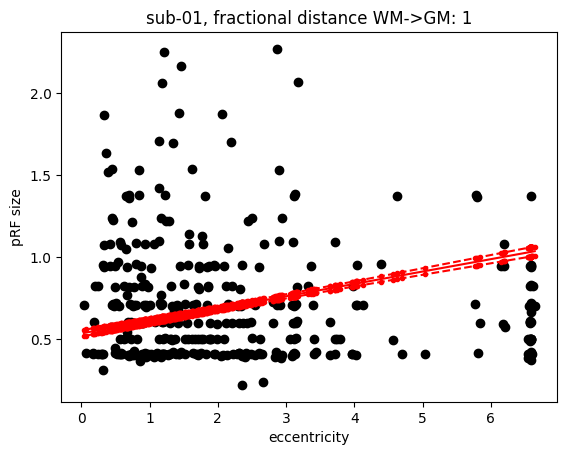

Intercept: 0.5345823373335357
t = 54.87, p = 0.00000
Slope: 0.07546884271953044
t = 24.08, p = 0.00000
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
sub-01
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


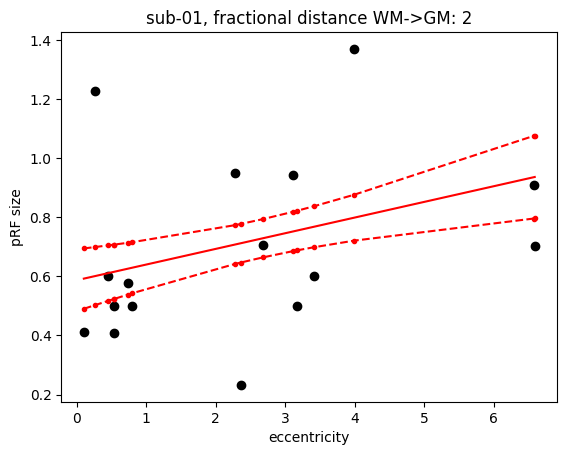

Intercept: 0.5868603170481206
t = 11.00, p = 0.00000
Slope: 0.05299040220644007
t = 3.31, p = 0.00092
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
sub-01
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


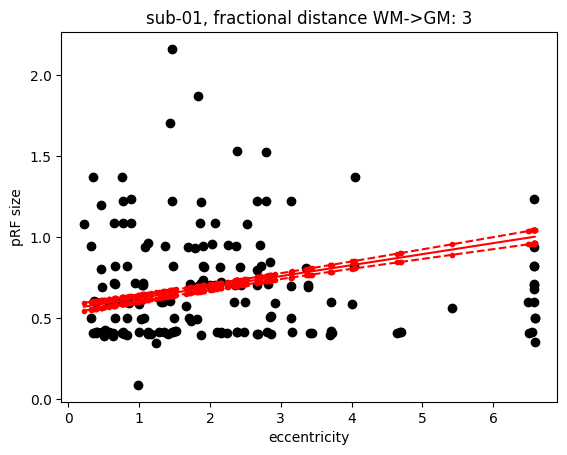

Intercept: 0.5544263765123282
t = 41.58, p = 0.00000
Slope: 0.06797397197193791
t = 15.08, p = 0.00000
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
sub-01
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


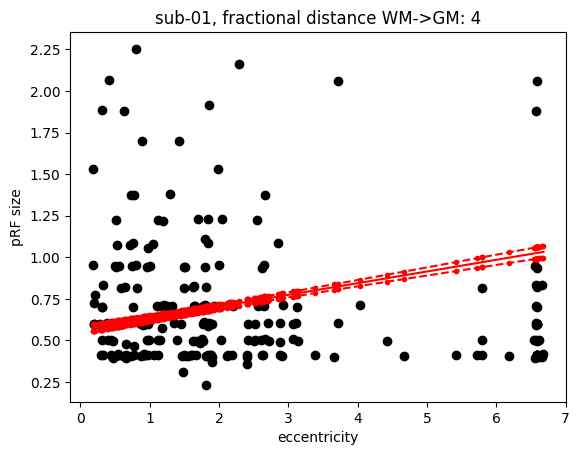

Intercept: 0.5630795598528274
t = 49.48, p = 0.00000
Slope: 0.07029241824239707
t = 18.72, p = 0.00000
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
sub-01
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


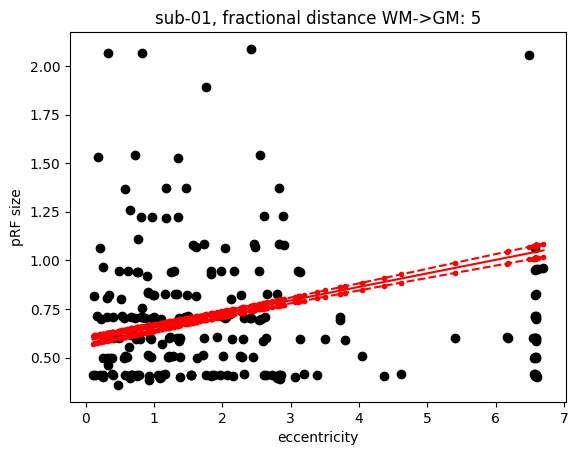

Intercept: 0.5850006568098303
t = 54.16, p = 0.00000
Slope: 0.069655094130723
t = 19.44, p = 0.00000
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
sub-01
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


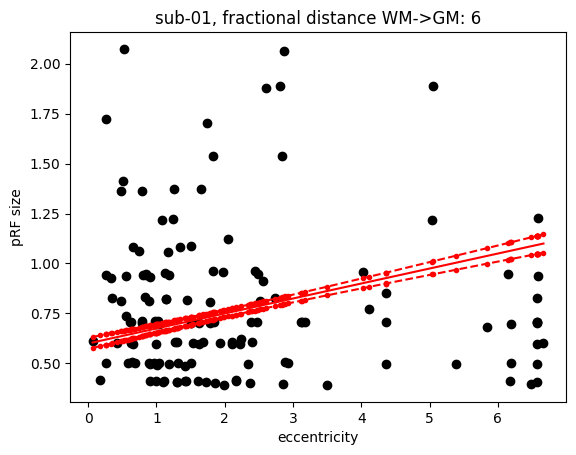

Intercept: 0.5993513974385447
t = 42.05, p = 0.00000
Slope: 0.0750348758557298
t = 15.34, p = 0.00000
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
sub-02
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


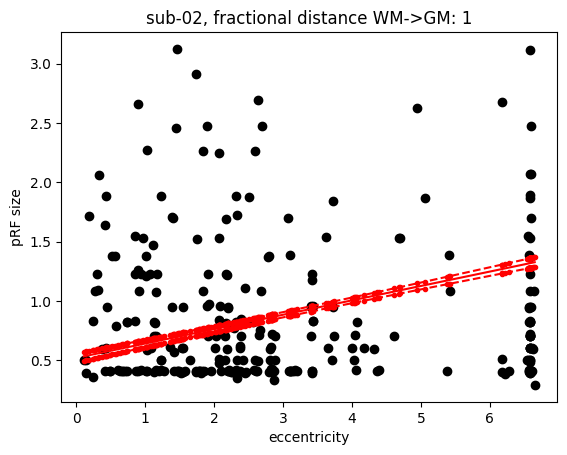

Intercept: 0.5184819079398473
t = 26.31, p = 0.00000
Slope: 0.12142655092961467
t = 23.62, p = 0.00000
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
sub-02
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


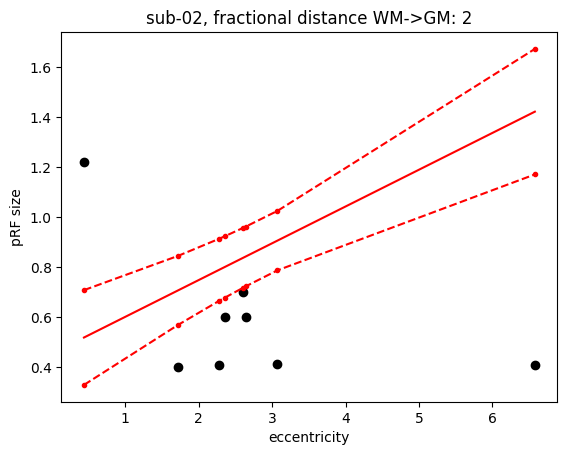

Intercept: 0.4533121659218978
t = 4.21, p = 0.00003
Slope: 0.14726220459692932
t = 4.79, p = 0.00000
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
sub-02
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


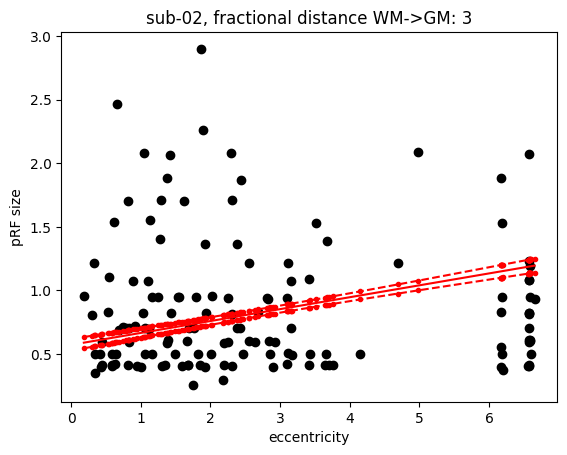

Intercept: 0.5728974309846866
t = 24.21, p = 0.00000
Slope: 0.09350909696431953
t = 14.33, p = 0.00000
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
sub-02
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


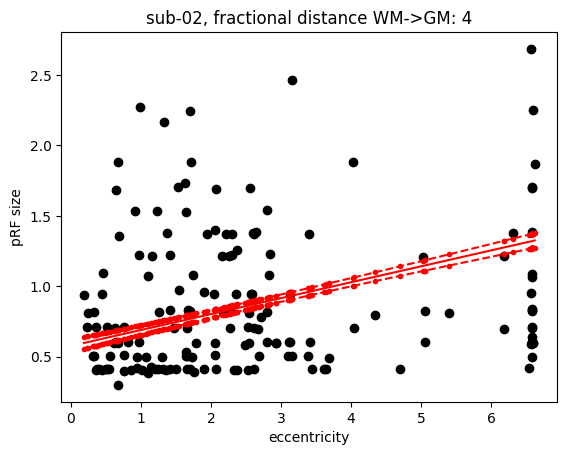

Intercept: 0.5756266517290053
t = 26.06, p = 0.00000
Slope: 0.11320897109791311
t = 18.43, p = 0.00000
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
sub-02
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


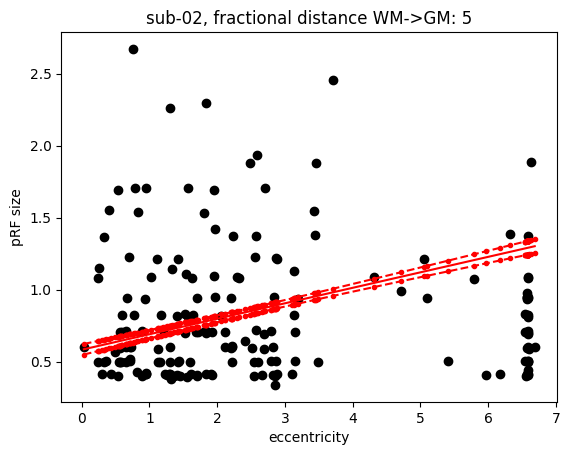

Intercept: 0.583046815993439
t = 30.90, p = 0.00000
Slope: 0.10748657736622633
t = 19.30, p = 0.00000
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
sub-02
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


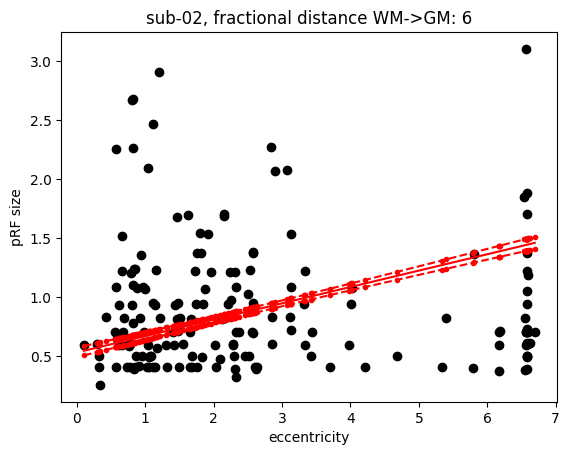

Intercept: 0.5336989153529895
t = 25.73, p = 0.00000
Slope: 0.1384019377102415
t = 23.14, p = 0.00000
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
sub-03
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


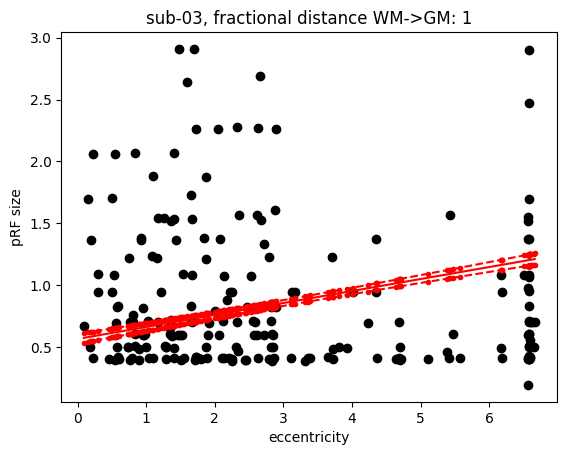

Intercept: 0.5642971080516092
t = 27.76, p = 0.00000
Slope: 0.0968682889351101
t = 17.69, p = 0.00000
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
sub-03
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


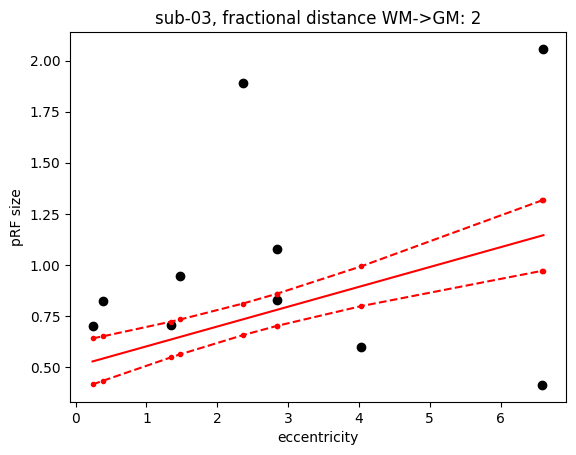

Intercept: 0.5040738444937614
t = 8.28, p = 0.00000
Slope: 0.09709633818134628
t = 5.11, p = 0.00000
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
sub-03
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


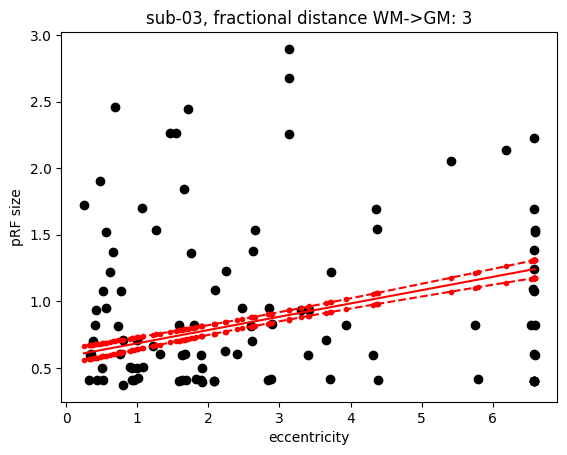

Intercept: 0.5850671686255735
t = 20.48, p = 0.00000
Slope: 0.09982091078646443
t = 12.67, p = 0.00000
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
sub-03
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


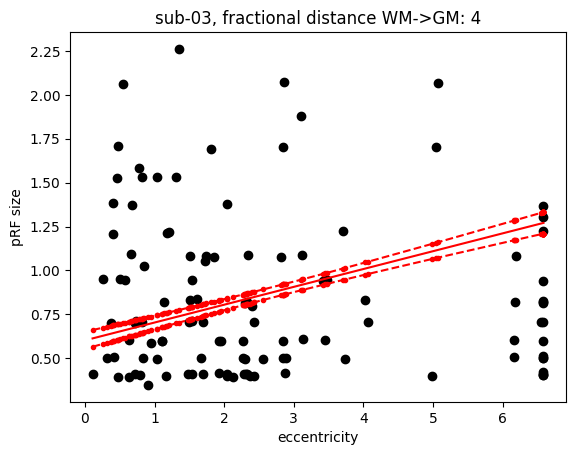

Intercept: 0.6018674526614142
t = 24.13, p = 0.00000
Slope: 0.1015255801382064
t = 14.22, p = 0.00000
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
sub-03
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


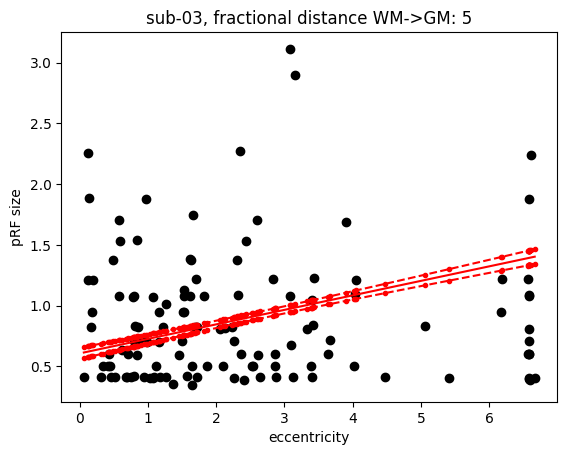

Intercept: 0.6056804866903794
t = 25.60, p = 0.00000
Slope: 0.11957561118633106
t = 17.22, p = 0.00000
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
sub-03
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


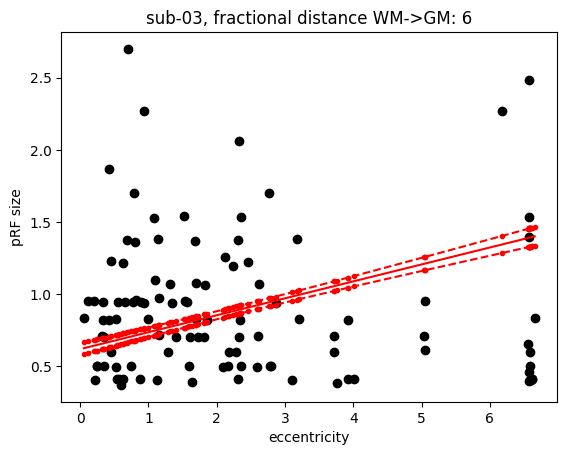

Intercept: 0.6182958105623428
t = 28.97, p = 0.00000
Slope: 0.11748761816392375
t = 16.96, p = 0.00000
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
sub-04
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


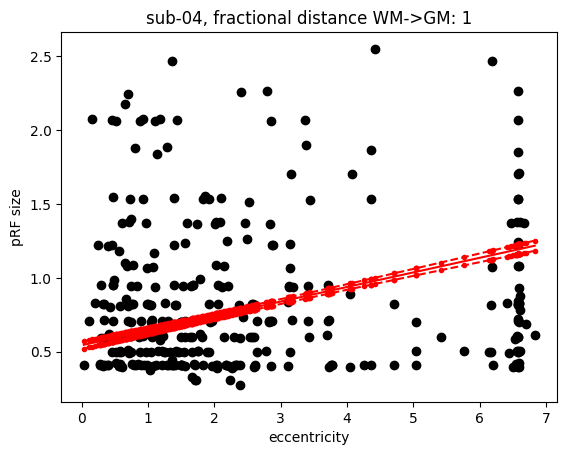

Intercept: 0.5438846587602976
t = 42.19, p = 0.00000
Slope: 0.09861279301258903
t = 26.34, p = 0.00000
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
sub-04
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


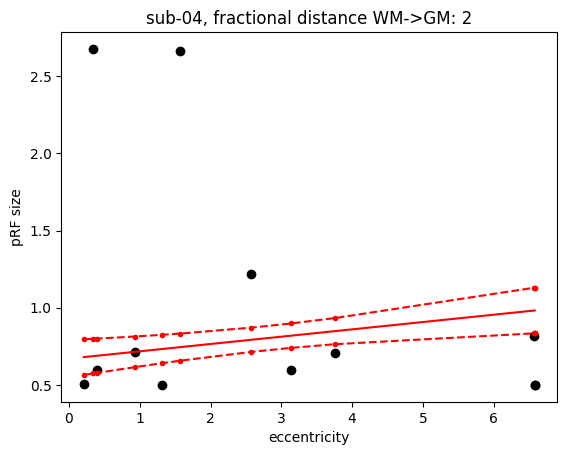

Intercept: 0.6705451013320682
t = 10.90, p = 0.00000
Slope: 0.04742322050430382
t = 2.81, p = 0.00489
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
sub-04
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


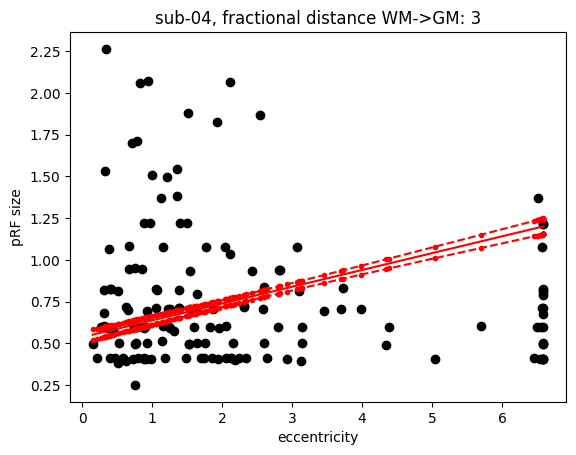

Intercept: 0.5372745000752481
t = 32.26, p = 0.00000
Slope: 0.1007060058300374
t = 19.42, p = 0.00000
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
sub-04
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


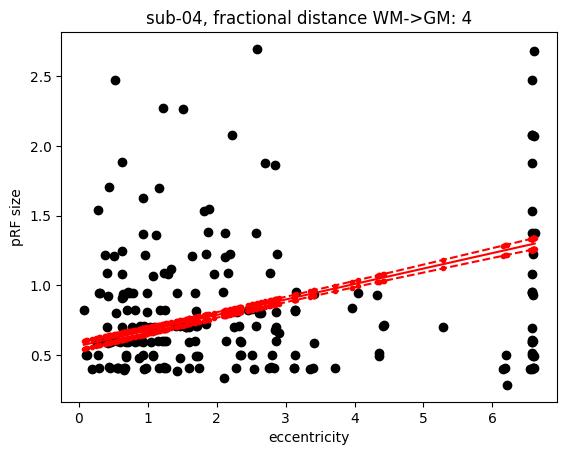

Intercept: 0.5669758044962987
t = 37.76, p = 0.00000
Slope: 0.1108122451674132
t = 24.94, p = 0.00000
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
sub-04
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


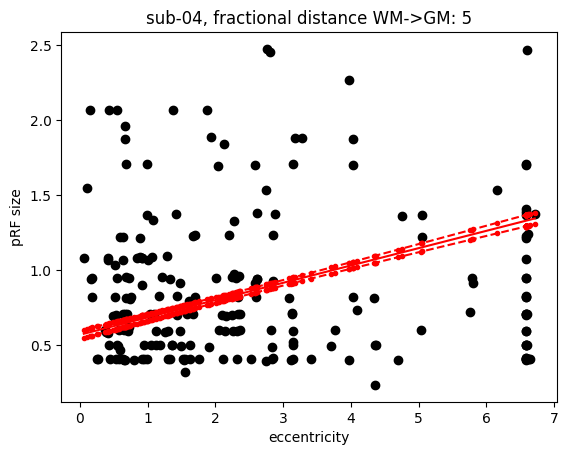

Intercept: 0.5707314447060412
t = 39.43, p = 0.00000
Slope: 0.11529190071161191
t = 26.70, p = 0.00000
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
sub-04
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


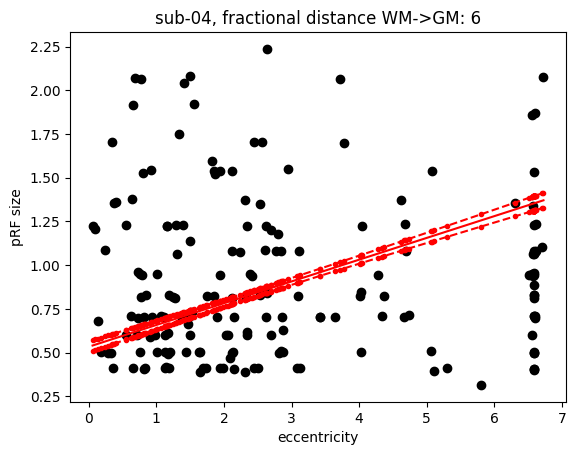

Intercept: 0.5330555178779384
t = 33.17, p = 0.00000
Slope: 0.12455342980654702
t = 26.09, p = 0.00000


In [844]:
for sub_id in range(0,len(subject_list)):
    for depth_idx in depth:
        print('%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%')
        print(subject_list[sub_id])
        print('%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%')
        # lh
        idx=df_equidist_per_depth.loc[(df_equidist_per_depth['sub id'] == subject_list[sub_id]) & 
                                    (df_equidist_per_depth['hem'] == 'lh') & 
                                    (df_equidist_per_depth['depth'] == depth_idx)].index.tolist()
        lh_sigma = np.stack(df_equidist_per_depth.loc[idx, 'pRF size'].to_numpy(), axis=0)
        lh_ecc   = np.stack(df_equidist_per_depth.loc[idx, 'ecc'].to_numpy(), axis=0)
        lh_rsq   = np.stack(df_equidist_per_depth.loc[idx, 'rsq'].to_numpy(), axis=0)

        # rh
        idx      = df_equidist_per_depth.loc[(df_equidist_per_depth['sub id'] == subject_list[sub_id]) & 
                                    (df_equidist_per_depth['hem'] == 'rh') & 
                                    (df_equidist_per_depth['depth'] == depth_idx)].index.tolist()
        rh_sigma = np.stack(df_equidist_per_depth.loc[idx, 'pRF size'].to_numpy(), axis=0)
        rh_ecc   = np.stack(df_equidist_per_depth.loc[idx, 'ecc'].to_numpy(), axis=0)
        rh_rsq   = np.stack(df_equidist_per_depth.loc[idx, 'rsq'].to_numpy(), axis=0)

        # concatenate lh&rh
        y_sigma  = np.concatenate((lh_sigma.T,rh_sigma.T))
        x_ecc    = np.concatenate((lh_ecc.T,rh_ecc.T))
        r2       = np.concatenate((lh_rsq.T,rh_rsq.T))

#         y_sigma = lh_sigma
#         x_ecc = lh_ecc
#         r2 = lh_rsq

        # threshold by r2
        y_sigma  = np.atleast_2d(y_sigma[r2>rsq_thresh]).T
        x_ecc    = np.atleast_2d(x_ecc[r2>rsq_thresh]).T
        
        # threshold by sigma (only positive)
        x_ecc    = np.atleast_2d(x_ecc[y_sigma>0]).T
        y_sigma  = np.atleast_2d(y_sigma[y_sigma>0]).T
        
        # threshold by sigma (below threshold)
        x_ecc    = np.atleast_2d(x_ecc[y_sigma<pRF_thresh]).T
        y_sigma  = np.atleast_2d(y_sigma[y_sigma<pRF_thresh]).T
        
        
        # also remove outliers
        y_sigma_or, idx_or = reject_outliers(np.squeeze(y_sigma))
        y_sigma            = y_sigma[idx_or,:]
        x_ecc              = x_ecc[idx_or,:]
        
#         # bin eccentricity data
#         bins = [0, 1, 2, 3, 4, 5, 6, 7, 8]
#         x_ecc=np.digitize(x_ecc,bins=bins)

    #     # random shuffle
    #     shuffle_indices = np.random.permutation(len(y_sigma))
    #     y_sigma = y_sigma[shuffle_indices]
    #     x_ecc = x_ecc[shuffle_indices]
    
        if len(y_sigma) < 30:
            idx=df_pRFxecc_stats_equidist.loc[(df_pRFxecc_stats_equidist['sub id'] == subject_list[sub_id]) &
                                (df_pRFxecc_stats_equidist['depth'] == depth_idx)].index.tolist()
            df_pRFxecc_stats_equidist.loc[idx, 'pRF@2deg'] = pd.Series([np.nan]*len(idx), index=df_pRFxecc_stats_equidist.index[idx])
            continue


        # Split the data into a training set and a test set
        X_train, X_test, y_train, y_test = train_test_split(x_ecc, y_sigma, test_size=0.1)

        # Fit the model to the training set
        X_train = sm.add_constant(X_train)
        #model = sm.OLS(y_train, X_train).fit()
        model = sm.GLM(y_train, X_train, family=sm.families.Gaussian()).fit()

        # Make predictions on the test set
        X_test = sm.add_constant(X_test)
        y_pred = model.predict(X_test)

        # extract the prediction
        pred = model.get_prediction(X_test)

        # extract the intercept and slope
        intercept = model.params[0]
        slope = model.params[1]

        # extract the bootstrapped 95% quantiles and median of the fit
        quantiles = pred.summary_frame(alpha=0.05)
        median = pred.summary_frame(alpha=0.5)

        # plot the model
        plt.plot(np.sort(np.atleast_2d(X_test[:,1])).T, np.sort(y_test), 'ko')
        plt.plot(np.sort(np.atleast_2d(X_test[:,1])).T, np.sort(y_pred), 'r-')
        plt.plot(np.sort(np.atleast_2d(X_test[:,1])).T, np.sort(quantiles['mean_ci_lower'].values), 'r--.')
        plt.plot(np.sort(np.atleast_2d(X_test[:,1])).T, np.sort(quantiles['mean_ci_upper'].values), 'r--.')
        plt.xlabel('eccentricity')
        plt.ylabel('pRF size')
        plt.title(subject_list[sub_id]+", fractional distance WM->GM: "+"{0:.2g}".format(depth_idx))
                  #str(depth_idx/10))
        plt.show()

        # print stats
        print(f"Intercept: {intercept}")
        intercept_txt = "t = "+"{:.2f}".format(model.tvalues[0])+", p = "+"{:.5f}".format(model.pvalues[0])
        print(intercept_txt)

        print(f"Slope: {slope}")
        slope_txt = "t = "+"{:.2f}".format(model.tvalues[1])+", p = "+"{:.5f}".format(model.pvalues[1])
        print(slope_txt)

        # get pRF estimate at 2deg
        pRF_est = intercept + target_ecc*slope

    #     # print the quantiles
    #     print("95% quantiles:")
    #     print(quantiles.loc[:, ["mean", "mean_se", "mean_ci_lower", "mean_ci_upper"]])

    #     # print the median
    #     print("Median:")
    #     print(median.loc[:, ["mean", "mean_se", "mean_ci_lower", "mean_ci_upper"]])

        # save stats to df
        idx=df_pRFxecc_stats_equidist.loc[(df_pRFxecc_stats_equidist['sub id'] == subject_list[sub_id]) &
                                (df_pRFxecc_stats_equidist['depth'] == depth_idx)].index.tolist()
        df_pRFxecc_stats_equidist.loc[idx, 'intercept-stats'] = pd.Series([intercept_txt]*len(idx), index=df_pRFxecc_stats_equidist.index[idx])
        df_pRFxecc_stats_equidist.loc[idx, 'slope-stats'] = pd.Series([slope_txt]*len(idx), index=df_pRFxecc_stats_equidist.index[idx])

        df_pRFxecc_stats_equidist.loc[idx, 'intercept'] = pd.Series([intercept]*len(idx), index=df_pRFxecc_stats_equidist.index[idx])
        df_pRFxecc_stats_equidist.loc[idx, 'slope'] = pd.Series([slope]*len(idx), index=df_pRFxecc_stats_equidist.index[idx])

        df_pRFxecc_stats_equidist.loc[idx, 'pRF@2deg'] = pd.Series([pRF_est]*len(idx), index=df_pRFxecc_stats_equidist.index[idx])
        
    

TODO: eccentricity bins and take avg pRF size in each bin, compute linear regression to these points, bootstrapping

In [845]:
df_pRFxecc_stats_equidist


,sub id,depth,intercept,slope,intercept-stats,slope-stats,pRF@2deg
0,sub-01,1.0,0.534582,0.075469,"t = 54.87, p = 0.00000","t = 24.08, p = 0.00000",0.685520
1,sub-01,2.0,0.586860,0.052990,"t = 11.00, p = 0.00000","t = 3.31, p = 0.00092",0.692841
2,sub-01,3.0,0.554426,0.067974,"t = 41.58, p = 0.00000","t = 15.08, p = 0.00000",0.690374
3,sub-01,4.0,0.563080,0.070292,"t = 49.48, p = 0.00000","t = 18.72, p = 0.00000",0.703664
4,sub-01,5.0,0.585001,0.069655,"t = 54.16, p = 0.00000","t = 19.44, p = 0.00000",0.724311
5,sub-01,6.0,0.599351,0.075035,"t = 42.05, p = 0.00000","t = 15.34, p = 0.00000",0.749421
6,sub-02,1.0,0.518482,0.121427,"t = 26.31, p = 0.00000","t = 23.62, p = 0.00000",0.761335
7,sub-02,2.0,0.453312,0.147262,"t = 4.21, p = 0.00003","t = 4.79, p = 0.00000",0.747837
8,sub-02,3.0,0.572897,0.093509,"t = 24.21, p = 0.00000","t = 14.33, p = 0.00000",0.759916
9,sub-02,4.0,0.575627,0.113209,"t = 26.06, p = 0.00000","t = 18.43, p = 0.00000",0.802045


#### Plot estimated pRF size at target eccentricity

[ 0.00323927 -0.01046902  0.69520133]
R2 quadratic: 0.9846203147200063
R2 linear: 0.8560050348572307
[0.00116949 0.00434264 0.74700589]
R2 quadratic: 0.7932838443145545
R2 linear: 0.7788079593329804
[0.00276634 0.00738111 0.72288173]
R2 quadratic: 0.766949505651129
R2 linear: 0.7498361517050899
[-0.00106234  0.01780624  0.72333466]
R2 quadratic: 0.5813191638983923
R2 linear: 0.5685889607649923


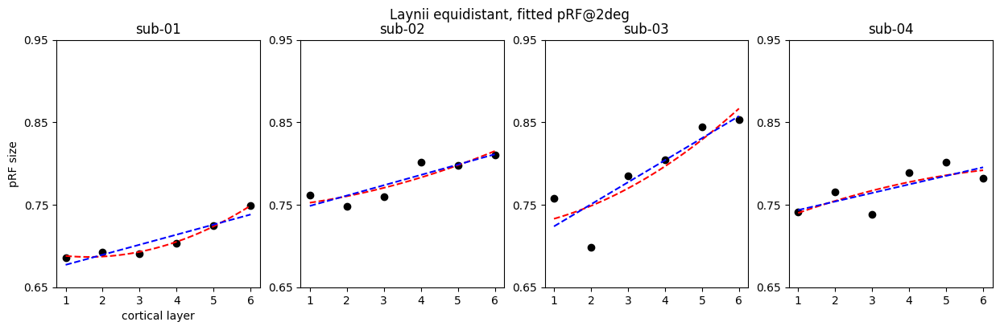

In [846]:
fig, axs = plt.subplots(nrows=1, ncols=len(subject_list), figsize=(15, 4))

for sub_id in range(0,len(subject_list)):
    idx      = df_pRFxecc_stats_equidist[(df_pRFxecc_stats_equidist['sub id'] == subject_list[sub_id])].index.tolist()
    depth    = df_pRFxecc_stats_equidist.loc[idx,'depth'].values
    pRF_2deg = df_pRFxecc_stats_equidist.loc[idx,'pRF@2deg'].values
    
    # omit nans
    idx = np.isfinite(pRF_2deg)
    pRF_2deg = pRF_2deg[idx]
    depth=depth[idx]
    
    # Fit the quadratic equation
    coefs_quadratic = np.polyfit(depth, pRF_2deg, 2)
    
    # Fit the linear equation
    coefs_linear = np.polyfit(depth, pRF_2deg, 1)

    # Print the coefficients
    print(coefs_quadratic)
    
    # Create a polynomial function from the coefficients
    f_quadratic = np.poly1d(coefs_quadratic)
    f_linear = np.poly1d(coefs_linear)

    # calculate the R-squared
    r_squared = r2_score(pRF_2deg, f_quadratic(depth))
    print(f"R2 quadratic: {r_squared}")
    r_squared = r2_score(pRF_2deg, f_linear(depth))
    print(f"R2 linear: {r_squared}")
    
    # quadratic model fit
    #x = np.linspace(0.2, 0.9, 50)
    x = np.linspace(1, n_layers, 50)
    y_quadratic = coefs_quadratic[0]*(x**2) + coefs_quadratic[1]*x+coefs_quadratic[2]
    y_linear = coefs_linear[0]*x + coefs_linear[1]
    
    # plot the model
    axs[sub_id].plot(depth,pRF_2deg,'ko')
    axs[sub_id].plot(x,y_quadratic,'r--')
    axs[sub_id].plot(x,y_linear,'b--')
    if sub_id == 0:
        axs[sub_id].set_xlabel('cortical layer')
        axs[sub_id].set_ylabel('pRF size')
    axs[sub_id].set_title(subject_list[sub_id])
#     axs[sub_id].set_ylim([0.65, 1.05])
#     axs[sub_id].set_yticks(np.linspace(0.65,1.05,5)) 
    axs[sub_id].set_ylim([0.65, 0.95])
    axs[sub_id].set_yticks(np.linspace(0.65,0.95,4)) 
    
plt.suptitle('Laynii equidistant, fitted pRF@2deg')
plt.show()
    
#     axs[sub_id].set_ylim([0.7, 1.1]4
#     axs[sub_id].set_yticks(np.linspace(0.7,1.1,5))    
    
#     df_pRFxecc_stats_equidist.loc[(df_equidist_per_depth['sub id'] == subject_list[sub_id]) & 
#                                 (df_equidist_per_depth['hem'] == 'lh') & 
#                                 (df_equidist_per_depth['depth'] == depth_idx)].index.tolist()
#     lh_sigma = np.stack(df_equidist_per_depth.loc[idx, 'pRF size'].to_numpy(), axis=0)

##### Group plot

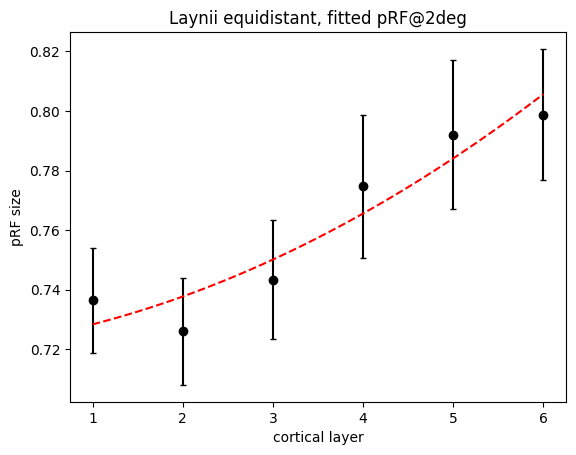

In [847]:
idx      = df_pRFxecc_stats_equidist[(df_pRFxecc_stats_equidist['sub id'] == subject_list[0])].index.tolist()
depth    = df_pRFxecc_stats_equidist.loc[idx,'depth'].values
#depth    = depth[1:]
pRF_2deg = np.empty((len(depth),len(subject_list)))

for sub_id in range(0,len(subject_list)):
    idx      = df_pRFxecc_stats_equidist[(df_pRFxecc_stats_equidist['sub id'] == subject_list[sub_id]) &
                                        (df_pRFxecc_stats_equidist['depth'] >= np.min(depth))].index.tolist()
    pRF_2deg[:,sub_id] = df_pRFxecc_stats_equidist.loc[idx,'pRF@2deg'].values


# omit nans
idx = (np.sum(np.isnan(pRF_2deg),1) == 0)
pRF_2deg = pRF_2deg[idx,:]
depth=depth[idx]
    
# Transform the independent variable into a set of polynomial features
poly = PolynomialFeatures(degree=2)
X_poly = poly.fit_transform(depth.reshape(-1,1))

# Create and fit the model
model = MultiOutputRegressor(LinearRegression()).fit(X_poly, pRF_2deg)

# Make predictions
X_plot = np.linspace(depth.min(), depth.max(), 100).reshape(-1, 1)
X_plot_poly = poly.transform(X_plot)
y_plot = model.predict(X_plot_poly)

y_mean = y_plot.mean(axis=1)
y_median = np.median(y_plot,axis=1)


# data for plot
depth_plot    = df_pRFxecc_stats_equidist.loc[:,'depth'].values
pRF_2deg_plot = df_pRFxecc_stats_equidist.loc[:,'pRF@2deg'].values


# plot
plt.errorbar(depth, pRF_2deg.mean(axis=1), yerr=stats.sem(pRF_2deg,axis=1), fmt='ko', ecolor='black', capsize=2)
plt.plot(X_plot,y_mean,'r--')
# plt.plot(X_plot/n_layers,y_median,'b--')

# plt.plot(x,y_linear,'b--')
#plt.ylim([0.545,0.60])
plt.xlabel('cortical layer')
plt.ylabel('pRF size')

plt.title('Laynii equidistant, fitted pRF@2deg')
plt.show()


### Equivolumetric layering

#### pRF size as a function of eccentricity
Fit a standard GLM to the pRF × eccentricity linear relation

ad Table 1. in "Systematic variation of population receptive field properties across cortical depth in human visual cortex"

Extract lh and rh sigma and ecc values at chosen rsq threshold

In [848]:
rsq_thresh = 0.1
target_ecc = 2
pRF_thresh = max_ecc_deg

Create a dataframe to save intercept and slope stats

In [849]:
subs = [['sub-01']*n_layers,['sub-02']*n_layers,['sub-03']*n_layers,['sub-04']*n_layers]
subs = list(itertools.chain(*subs))

depth = np.linspace(1,n_layers,n_layers).tolist()
depths = depth*n_sub

intercept = np.empty((1,len(subs),)).tolist()
intercept = list(itertools.chain(*intercept))

slope = np.empty((1,len(subs),)).tolist()
slope = list(itertools.chain(*slope))

intercept_stats = np.empty((1,len(subs),)).tolist()
intercept_stats = list(itertools.chain(*intercept_stats))

slope_stats = np.empty((1,len(subs),)).tolist()
slope_stats = list(itertools.chain(*slope_stats))

pRF_2deg = np.empty((1,len(subs),)).tolist()
pRF_2deg = list(itertools.chain(*pRF_2deg))


df_pRFxecc_stats_equivol = pd.DataFrame({
    'sub id' : subs,
    'depth' : depths,
    'intercept': intercept,
    'slope': slope,
    'intercept-stats' : intercept_stats,
    'slope-stats' : slope_stats,
    'pRF@2deg': pRF_2deg
})

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
sub-01
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


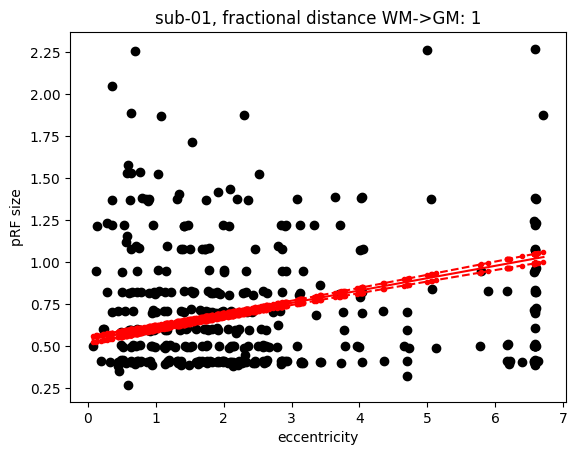

Intercept: 0.5379305635580977
t = 55.48, p = 0.00000
Slope: 0.0735697000729609
t = 23.50, p = 0.00000
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
sub-01
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


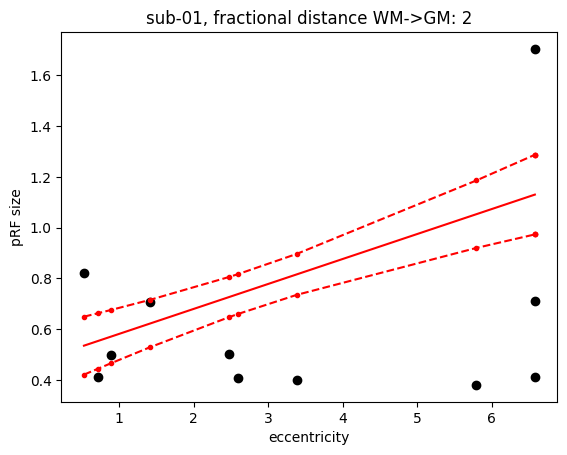

Intercept: 0.48335195736389536
t = 7.36, p = 0.00000
Slope: 0.098251068961277
t = 5.32, p = 0.00000
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
sub-01
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


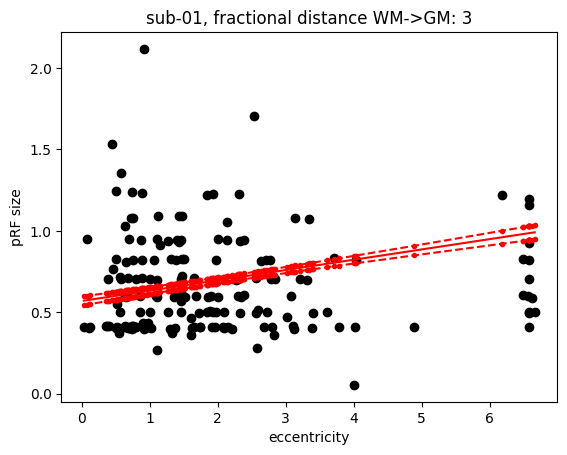

Intercept: 0.5696328984896074
t = 40.83, p = 0.00000
Slope: 0.06322708776714336
t = 13.51, p = 0.00000
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
sub-01
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


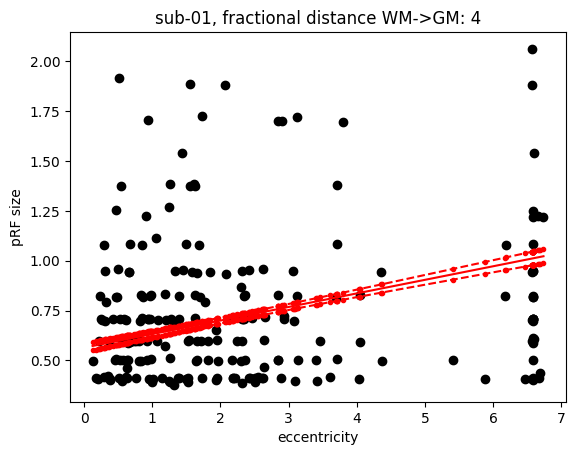

Intercept: 0.5642069649021724
t = 50.54, p = 0.00000
Slope: 0.06800001688549277
t = 18.36, p = 0.00000
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
sub-01
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


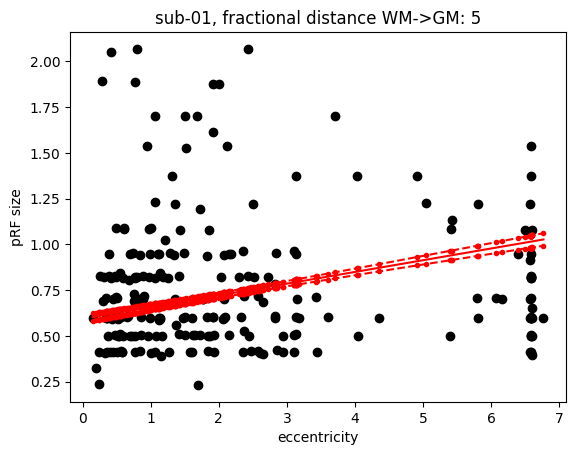

Intercept: 0.5931392939908913
t = 55.62, p = 0.00000
Slope: 0.06404794963795603
t = 17.97, p = 0.00000
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
sub-01
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


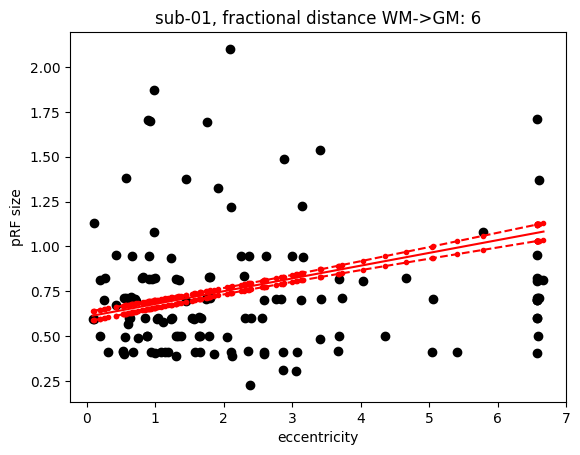

Intercept: 0.6076758639707158
t = 43.31, p = 0.00000
Slope: 0.07115532963576224
t = 14.45, p = 0.00000
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
sub-02
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


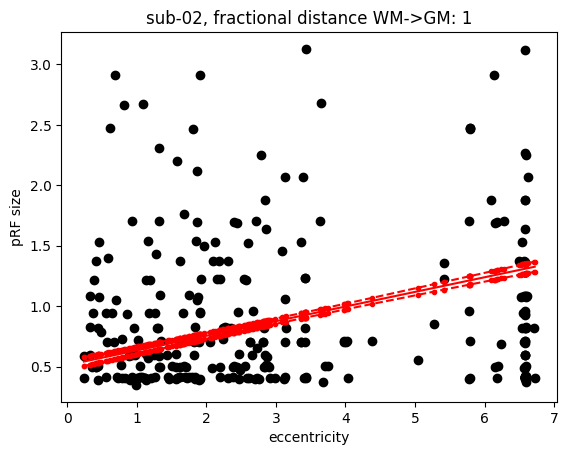

Intercept: 0.513898701095321
t = 26.13, p = 0.00000
Slope: 0.1209377501418971
t = 23.56, p = 0.00000
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
sub-02
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


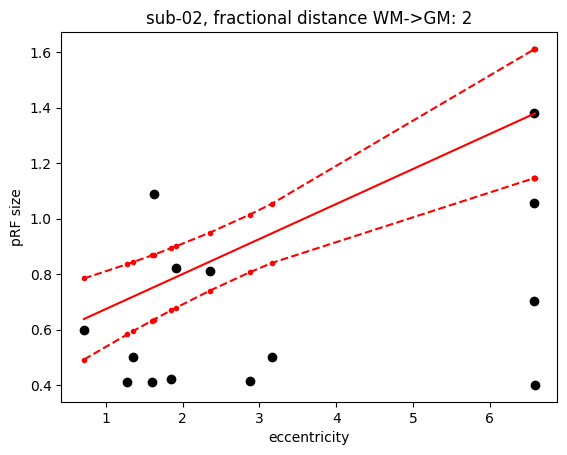

Intercept: 0.5483300894611853
t = 6.14, p = 0.00000
Slope: 0.12611273585468613
t = 4.66, p = 0.00000
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
sub-02
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


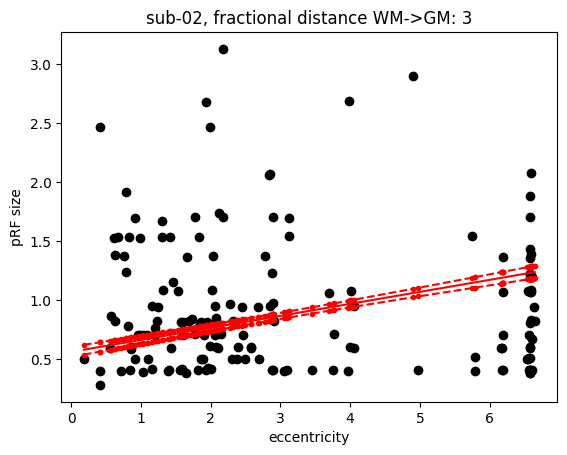

Intercept: 0.5626995956518559
t = 25.51, p = 0.00000
Slope: 0.10176014998873721
t = 16.37, p = 0.00000
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
sub-02
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


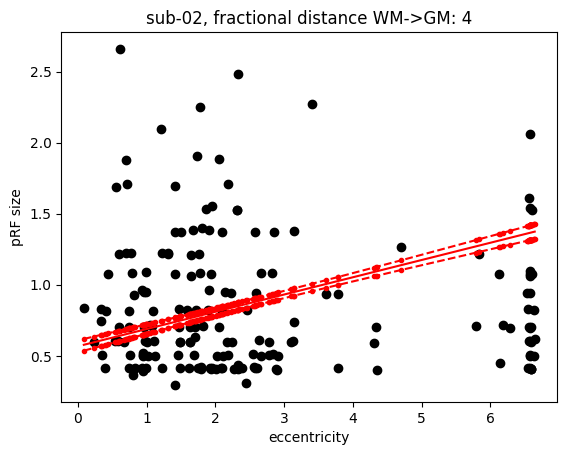

Intercept: 0.5668018548723481
t = 26.29, p = 0.00000
Slope: 0.12151169302750336
t = 19.83, p = 0.00000
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
sub-02
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


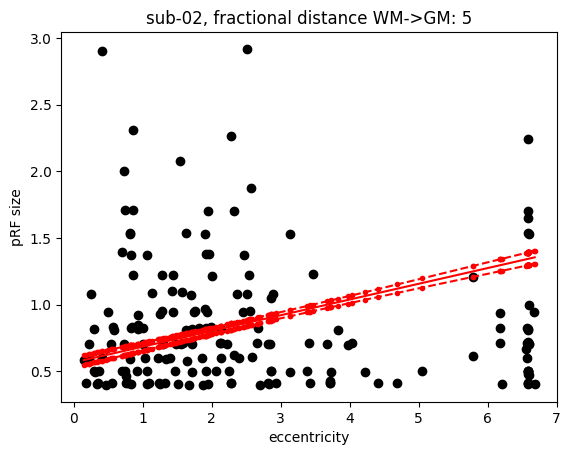

Intercept: 0.5677363584664952
t = 29.36, p = 0.00000
Slope: 0.11782635518119661
t = 20.95, p = 0.00000
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
sub-02
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


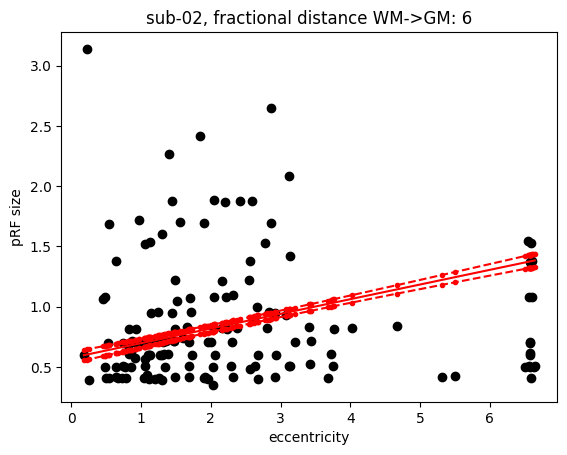

Intercept: 0.5740319528196856
t = 24.79, p = 0.00000
Slope: 0.12186756276712277
t = 18.83, p = 0.00000
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
sub-03
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


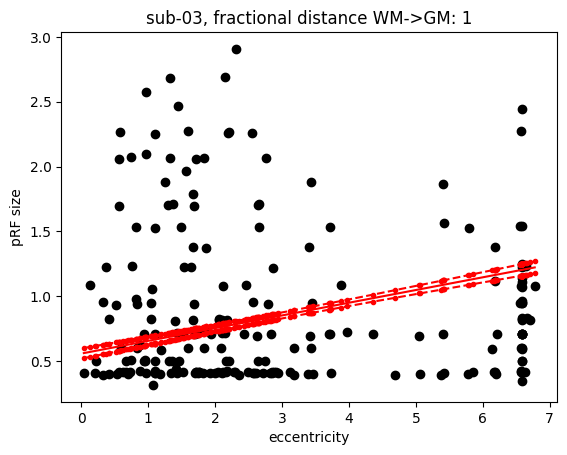

Intercept: 0.5566135733287743
t = 27.61, p = 0.00000
Slope: 0.09805196228609374
t = 18.05, p = 0.00000
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
sub-03
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


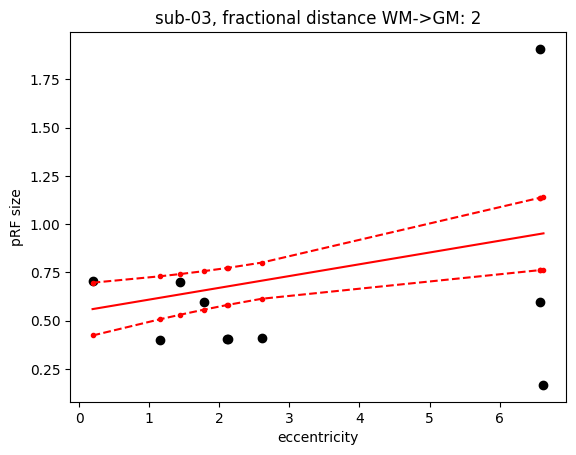

Intercept: 0.5488312027299342
t = 7.55, p = 0.00000
Slope: 0.060942501834450685
t = 2.91, p = 0.00358
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
sub-03
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


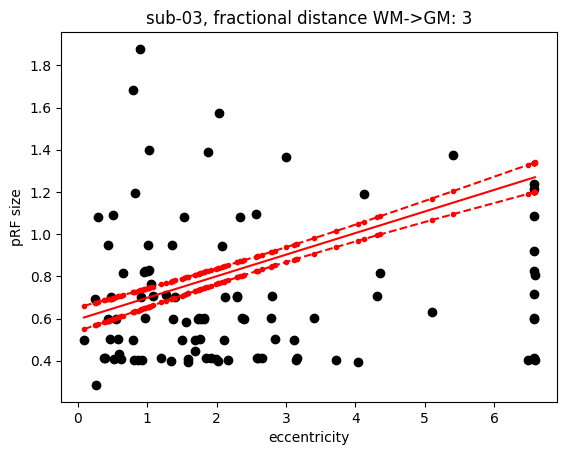

Intercept: 0.5961841881011224
t = 20.77, p = 0.00000
Slope: 0.10222562481174202
t = 12.56, p = 0.00000
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
sub-03
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


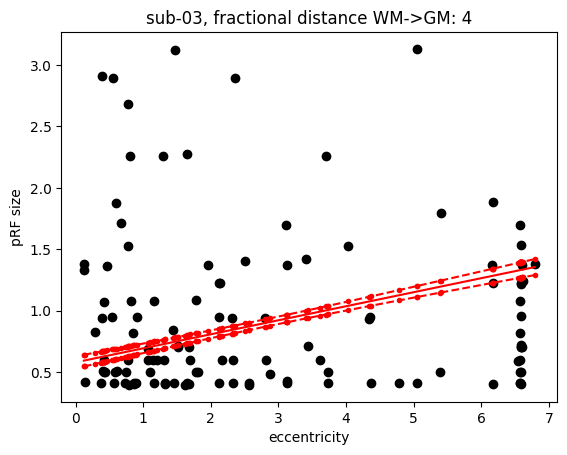

Intercept: 0.5803102842031179
t = 23.22, p = 0.00000
Slope: 0.11408867096529213
t = 15.73, p = 0.00000
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
sub-03
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


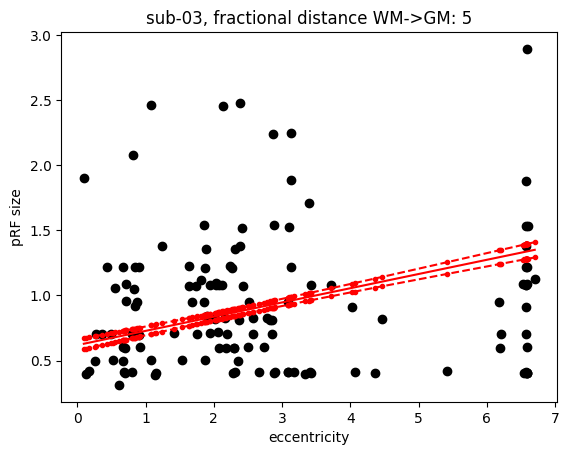

Intercept: 0.6186896566187359
t = 28.69, p = 0.00000
Slope: 0.10917044217860541
t = 16.90, p = 0.00000
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
sub-03
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


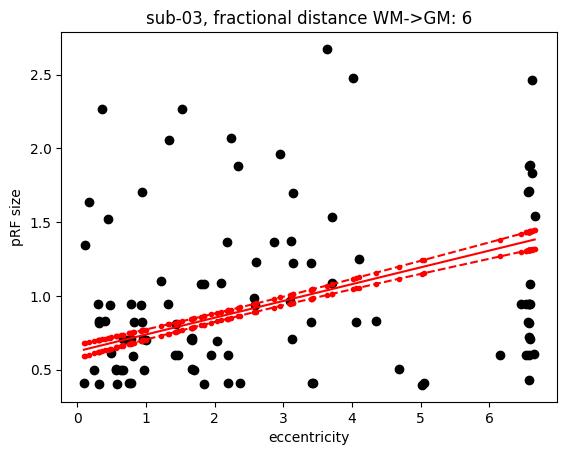

Intercept: 0.6247503400746994
t = 28.17, p = 0.00000
Slope: 0.11376384365512773
t = 16.50, p = 0.00000
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
sub-04
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


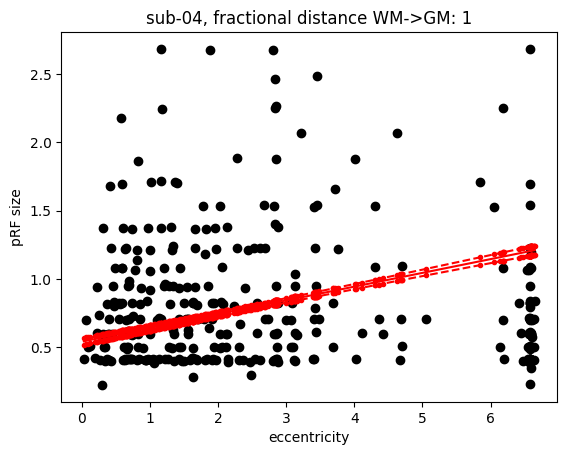

Intercept: 0.5400966370620129
t = 41.98, p = 0.00000
Slope: 0.10079978484595944
t = 26.88, p = 0.00000
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
sub-04
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


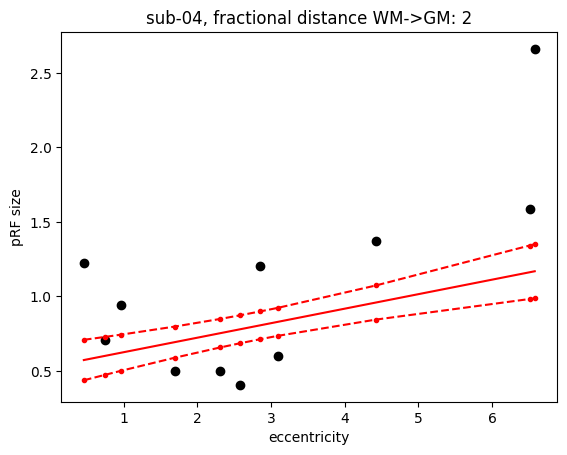

Intercept: 0.528651774881574
t = 6.90, p = 0.00000
Slope: 0.09737310169488536
t = 4.58, p = 0.00000
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
sub-04
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


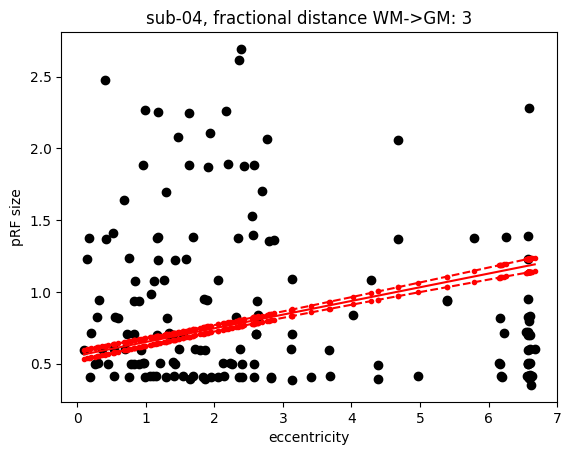

Intercept: 0.5552452008392197
t = 32.62, p = 0.00000
Slope: 0.09534333411428422
t = 18.31, p = 0.00000
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
sub-04
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


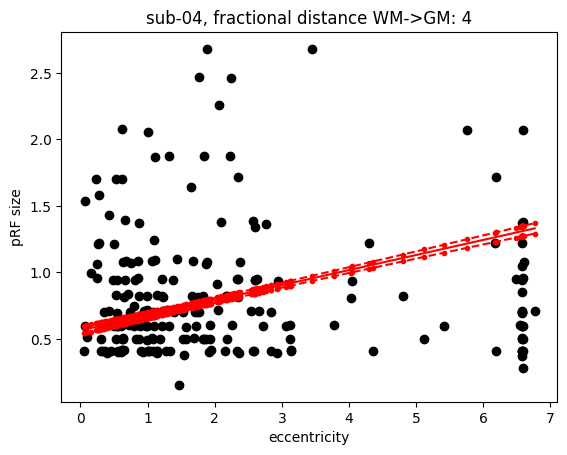

Intercept: 0.5639591560791186
t = 39.64, p = 0.00000
Slope: 0.11344406206415492
t = 26.64, p = 0.00000
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
sub-04
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


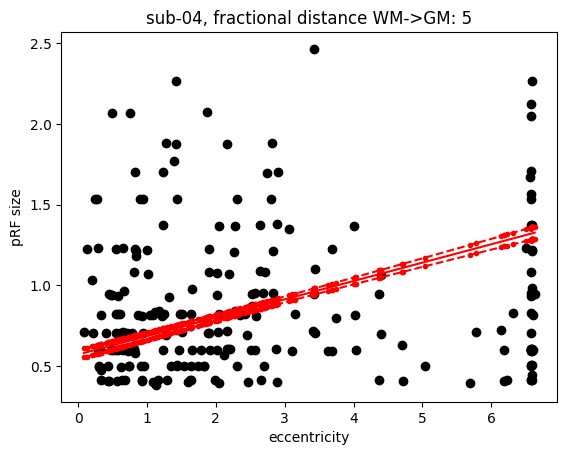

Intercept: 0.5712325789045511
t = 39.22, p = 0.00000
Slope: 0.11387001163514274
t = 26.68, p = 0.00000
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
sub-04
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


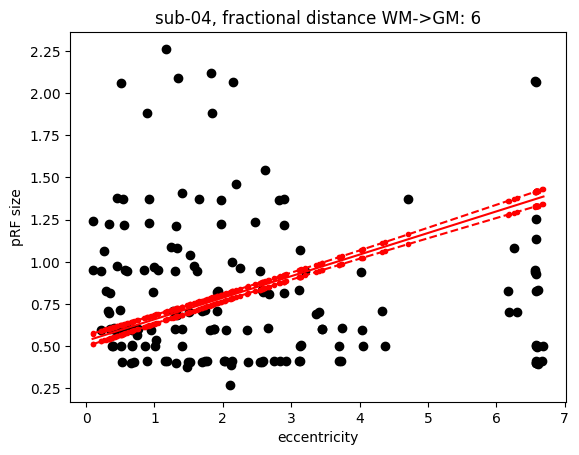

Intercept: 0.5311328579730521
t = 31.99, p = 0.00000
Slope: 0.127903970485198
t = 25.64, p = 0.00000


In [850]:
for sub_id in range(0,len(subject_list)):
    for depth_idx in depth:
        print('%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%')
        print(subject_list[sub_id])
        print('%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%')
        # lh
        idx=df_equivol_per_depth.loc[(df_equivol_per_depth['sub id'] == subject_list[sub_id]) & 
                                    (df_equivol_per_depth['hem'] == 'lh') & 
                                    (df_equivol_per_depth['depth'] == depth_idx)].index.tolist()
        lh_sigma = np.stack(df_equivol_per_depth.loc[idx, 'pRF size'].to_numpy(), axis=0)
        lh_ecc   = np.stack(df_equivol_per_depth.loc[idx, 'ecc'].to_numpy(), axis=0)
        lh_rsq   = np.stack(df_equivol_per_depth.loc[idx, 'rsq'].to_numpy(), axis=0)

        # rh
        idx      = df_equivol_per_depth.loc[(df_equivol_per_depth['sub id'] == subject_list[sub_id]) & 
                                    (df_equivol_per_depth['hem'] == 'rh') & 
                                    (df_equivol_per_depth['depth'] == depth_idx)].index.tolist()
        rh_sigma = np.stack(df_equivol_per_depth.loc[idx, 'pRF size'].to_numpy(), axis=0)
        rh_ecc   = np.stack(df_equivol_per_depth.loc[idx, 'ecc'].to_numpy(), axis=0)
        rh_rsq   = np.stack(df_equivol_per_depth.loc[idx, 'rsq'].to_numpy(), axis=0)

        # concatenate lh&rh
        y_sigma  = np.concatenate((lh_sigma.T,rh_sigma.T))
        x_ecc    = np.concatenate((lh_ecc.T,rh_ecc.T))
        r2       = np.concatenate((lh_rsq.T,rh_rsq.T))

#         y_sigma = lh_sigma
#         x_ecc = lh_ecc
#         r2 = lh_rsq

        # threshold by r2
        y_sigma  = np.atleast_2d(y_sigma[r2>rsq_thresh]).T
        x_ecc    = np.atleast_2d(x_ecc[r2>rsq_thresh]).T
        
        # threshold by sigma (only positive)
        x_ecc    = np.atleast_2d(x_ecc[y_sigma>0]).T
        y_sigma  = np.atleast_2d(y_sigma[y_sigma>0]).T
        
        # threshold by sigma (below threshold)
        x_ecc    = np.atleast_2d(x_ecc[y_sigma<pRF_thresh]).T
        y_sigma  = np.atleast_2d(y_sigma[y_sigma<pRF_thresh]).T
        
        
        # also remove outliers
        y_sigma_or, idx_or = reject_outliers(np.squeeze(y_sigma))
        y_sigma            = y_sigma[idx_or,:]
        x_ecc              = x_ecc[idx_or,:]
        
#         # bin eccentricity data
#         bins = [0, 1, 2, 3, 4, 5, 6, 7, 8]
#         x_ecc=np.digitize(x_ecc,bins=bins)

    #     # random shuffle
    #     shuffle_indices = np.random.permutation(len(y_sigma))
    #     y_sigma = y_sigma[shuffle_indices]
    #     x_ecc = x_ecc[shuffle_indices]
    
        if len(y_sigma) < 20:
            idx=df_pRFxecc_stats_equivol.loc[(df_pRFxecc_stats_equivol['sub id'] == subject_list[sub_id]) &
                                (df_pRFxecc_stats_equivol['depth'] == depth_idx)].index.tolist()
            df_pRFxecc_stats_equivol.loc[idx, 'pRF@2deg'] = pd.Series([np.nan]*len(idx), index=df_pRFxecc_stats_equivol.index[idx])
            continue


        # Split the data into a training set and a test set
        X_train, X_test, y_train, y_test = train_test_split(x_ecc, y_sigma, test_size=0.1)

        # Fit the model to the training set
        X_train = sm.add_constant(X_train)
        #model = sm.OLS(y_train, X_train).fit()
        model = sm.GLM(y_train, X_train, family=sm.families.Gaussian()).fit()

        # Make predictions on the test set
        X_test = sm.add_constant(X_test)
        y_pred = model.predict(X_test)

        # extract the prediction
        pred = model.get_prediction(X_test)

        # extract the intercept and slope
        intercept = model.params[0]
        slope = model.params[1]

        # extract the bootstrapped 95% quantiles and median of the fit
        quantiles = pred.summary_frame(alpha=0.05)
        median = pred.summary_frame(alpha=0.5)

        # plot the model
        plt.plot(np.sort(np.atleast_2d(X_test[:,1])).T, np.sort(y_test), 'ko')
        plt.plot(np.sort(np.atleast_2d(X_test[:,1])).T, np.sort(y_pred), 'r-')
        plt.plot(np.sort(np.atleast_2d(X_test[:,1])).T, np.sort(quantiles['mean_ci_lower'].values), 'r--.')
        plt.plot(np.sort(np.atleast_2d(X_test[:,1])).T, np.sort(quantiles['mean_ci_upper'].values), 'r--.')
        plt.xlabel('eccentricity')
        plt.ylabel('pRF size')
        plt.title(subject_list[sub_id]+", fractional distance WM->GM: "+"{0:.2g}".format(depth_idx))
                  #str(depth_idx/10))
        plt.show()

        # print stats
        print(f"Intercept: {intercept}")
        intercept_txt = "t = "+"{:.2f}".format(model.tvalues[0])+", p = "+"{:.5f}".format(model.pvalues[0])
        print(intercept_txt)

        print(f"Slope: {slope}")
        slope_txt = "t = "+"{:.2f}".format(model.tvalues[1])+", p = "+"{:.5f}".format(model.pvalues[1])
        print(slope_txt)

        # get pRF estimate at 2deg
        pRF_est = intercept + target_ecc*slope

    #     # print the quantiles
    #     print("95% quantiles:")
    #     print(quantiles.loc[:, ["mean", "mean_se", "mean_ci_lower", "mean_ci_upper"]])

    #     # print the median
    #     print("Median:")
    #     print(median.loc[:, ["mean", "mean_se", "mean_ci_lower", "mean_ci_upper"]])

        # save stats to df
        idx=df_pRFxecc_stats_equivol.loc[(df_pRFxecc_stats_equivol['sub id'] == subject_list[sub_id]) &
                                (df_pRFxecc_stats_equivol['depth'] == depth_idx)].index.tolist()
        df_pRFxecc_stats_equivol.loc[idx, 'intercept-stats'] = pd.Series([intercept_txt]*len(idx), index=df_pRFxecc_stats_equivol.index[idx])
        df_pRFxecc_stats_equivol.loc[idx, 'slope-stats'] = pd.Series([slope_txt]*len(idx), index=df_pRFxecc_stats_equivol.index[idx])

        df_pRFxecc_stats_equivol.loc[idx, 'intercept'] = pd.Series([intercept]*len(idx), index=df_pRFxecc_stats_equivol.index[idx])
        df_pRFxecc_stats_equivol.loc[idx, 'slope'] = pd.Series([slope]*len(idx), index=df_pRFxecc_stats_equivol.index[idx])

        df_pRFxecc_stats_equivol.loc[idx, 'pRF@2deg'] = pd.Series([pRF_est]*len(idx), index=df_pRFxecc_stats_equivol.index[idx])
        
    

In [869]:
#df_pRFxecc_stats_equivol





#### Plot estimated pRF size at target eccentricity

[ 0.0033753  -0.01068865  0.69162485]
R2 quadratic: 0.981446323180825
R2 linear: 0.8570206486272206
[-7.21763885e-04  1.53972116e-02  7.49311686e-01]
R2 quadratic: 0.5985952423573812
R2 linear: 0.5924428240616069
[0.00144176 0.01861047 0.69997421]
R2 quadratic: 0.6556110150837098
R2 linear: 0.65210097716305
[-4.69681233e-04  1.75124042e-02  7.10461207e-01]
R2 quadratic: 0.7184318659539359
R2 linear: 0.7167647742407868


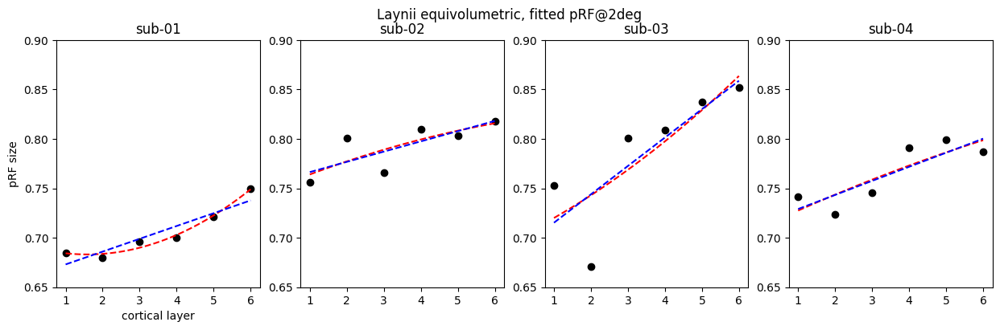

In [852]:
fig, axs = plt.subplots(nrows=1, ncols=len(subject_list), figsize=(15, 4))


for sub_id in range(0,len(subject_list)):
    idx      = df_pRFxecc_stats_equivol[(df_pRFxecc_stats_equivol['sub id'] == subject_list[sub_id])].index.tolist()
    depth    = df_pRFxecc_stats_equivol.loc[idx,'depth'].values
    pRF_2deg = df_pRFxecc_stats_equivol.loc[idx,'pRF@2deg'].values
    
    # omit nans
    idx = np.isfinite(pRF_2deg)
    pRF_2deg = pRF_2deg[idx]
    depth=depth[idx]
    
    # Fit the quadratic equation
    coefs_quadratic = np.polyfit(depth, pRF_2deg, 2)
    
    # Fit the linear equation
    coefs_linear = np.polyfit(depth, pRF_2deg, 1)

    # Print the coefficients
    print(coefs_quadratic)
    
    # Create a polynomial function from the coefficients
    f_quadratic = np.poly1d(coefs_quadratic)
    f_linear = np.poly1d(coefs_linear)

    # calculate the R-squared
    r_squared = r2_score(pRF_2deg, f_quadratic(depth))
    print(f"R2 quadratic: {r_squared}")
    r_squared = r2_score(pRF_2deg, f_linear(depth))
    print(f"R2 linear: {r_squared}")
    
    # quadratic model fit
    #x = np.linspace(0.2, 0.9, 50)
    x = np.linspace(1, n_layers, 50)
    y_quadratic = coefs_quadratic[0]*(x**2) + coefs_quadratic[1]*x+coefs_quadratic[2]
    y_linear = coefs_linear[0]*x + coefs_linear[1]
    
    # plot the model
    axs[sub_id].plot(depth,pRF_2deg,'ko')
    axs[sub_id].plot(x,y_quadratic,'r--')
    axs[sub_id].plot(x,y_linear,'b--')
    if sub_id == 0:
        axs[sub_id].set_xlabel('cortical layer')
        axs[sub_id].set_ylabel('pRF size')
    axs[sub_id].set_title(subject_list[sub_id])
#     axs[sub_id].set_ylim([0.6, 1.0])
#     axs[sub_id].set_yticks(np.linspace(0.6,1.0,5)) 
    axs[sub_id].set_ylim([0.65, 0.9])
    axs[sub_id].set_yticks(np.linspace(0.65,0.9,6))  
    
plt.suptitle('Laynii equivolumetric, fitted pRF@2deg')
plt.show()
    
#     df_pRFxecc_stats_equivol.loc[(df_equivol_per_depth['sub id'] == subject_list[sub_id]) & 
#                                 (df_equivol_per_depth['hem'] == 'lh') & 
#                                 (df_equivol_per_depth['depth'] == depth_idx)].index.tolist()
#     lh_sigma = np.stack(df_equivol_per_depth.loc[idx, 'pRF size'].to_numpy(), axis=0)

##### Group plot

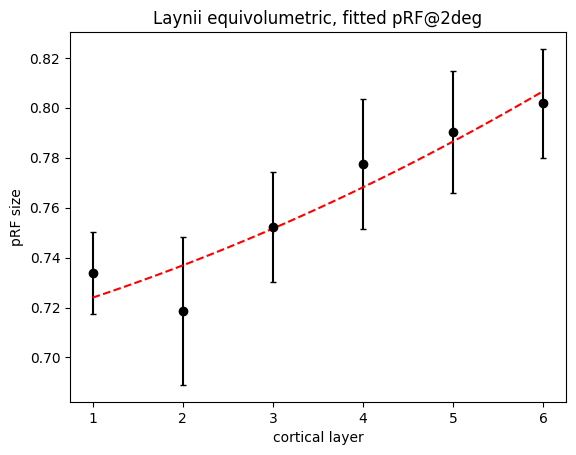

In [853]:
idx      = df_pRFxecc_stats_equivol[(df_pRFxecc_stats_equivol['sub id'] == subject_list[0])].index.tolist()
depth    = df_pRFxecc_stats_equivol.loc[idx,'depth'].values
#depth    = depth[1:]
pRF_2deg = np.empty((len(depth),len(subject_list)))

for sub_id in range(0,len(subject_list)):
    idx      = df_pRFxecc_stats_equivol[(df_pRFxecc_stats_equivol['sub id'] == subject_list[sub_id]) &
                                        (df_pRFxecc_stats_equivol['depth'] >= np.min(depth))].index.tolist()
    pRF_2deg[:,sub_id] = df_pRFxecc_stats_equivol.loc[idx,'pRF@2deg'].values


# omit nans
idx = (np.sum(np.isnan(pRF_2deg),1) == 0)
pRF_2deg = pRF_2deg[idx,:]
depth=depth[idx]
    
# Transform the independent variable into a set of polynomial features
poly = PolynomialFeatures(degree=2)
X_poly = poly.fit_transform(depth.reshape(-1,1))

# Create and fit the model
model = MultiOutputRegressor(LinearRegression()).fit(X_poly, pRF_2deg)

# Make predictions
X_plot = np.linspace(depth.min(), depth.max(), 100).reshape(-1, 1)
X_plot_poly = poly.transform(X_plot)
y_plot = model.predict(X_plot_poly)

y_mean = y_plot.mean(axis=1)
y_median = np.median(y_plot,axis=1)

# data for plot
depth_plot    = df_pRFxecc_stats_equivol.loc[:,'depth'].values
pRF_2deg_plot = df_pRFxecc_stats_equivol.loc[:,'pRF@2deg'].values


# plot
plt.errorbar(depth, pRF_2deg.mean(axis=1), yerr=stats.sem(pRF_2deg,axis=1), fmt='ko', ecolor='black', capsize=2)
plt.plot(X_plot,y_mean,'r--')
# plt.plot(X_plot/n_layers,y_median,'b--')

# plt.plot(x,y_linear,'b--')
#plt.ylim([0.545,0.60])
plt.xlabel('cortical layer')
plt.ylabel('pRF size')

plt.title('Laynii equivolumetric, fitted pRF@2deg')
plt.show()

## Laynii layers: pRF per cortical layer fitted at manually-defined iso-eccentricity band

### Equidistant layering

#### pRF size at 2deg eccentricity (separately for each cortical layer)

##### Extract lh and rh sigma and ecc values at chosen rsq threshold

Set number of layers, eccentricities, subjects, hemispheres

In [854]:
n_layers   = 6
n_sub      = len(subject_list)
n_hem      = len(hem_list)

Thresholds

In [855]:
rsq_thresh = 0.1
target_ecc = 2
pRF_thresh = max_ecc_deg

In [856]:
np.linspace(1,n_layers,n_layers).tolist()

[1.0, 2.0, 3.0, 4.0, 5.0, 6.0]

Create a dataframe to save intercept and slope stats

In [857]:
subs = [['sub-01']*n_layers,['sub-02']*n_layers,['sub-03']*n_layers,['sub-04']*n_layers]
subs = list(itertools.chain(*subs))

depth = np.linspace(1,n_layers,n_layers).tolist()
depths = depth*n_sub

pRF_2deg = np.empty((1,len(subs),)).tolist()
pRF_2deg = list(itertools.chain(*pRF_2deg))


df_pRFxecc_stats_equidist_2ecc = pd.DataFrame({
    'sub id' : subs,
    'depth' : depths,
    'pRF@2deg': pRF_2deg
})

In [858]:
for sub_id in range(0,len(subject_list)):
    for depth_idx in depth:
        # lh
        idx=df_equidist_per_depth_ecc2.loc[(df_equidist_per_depth_ecc2['sub id'] == subject_list[sub_id]) & 
                                    (df_equidist_per_depth_ecc2['hem'] == 'lh') & 
                                    (df_equidist_per_depth_ecc2['depth'] == depth_idx)].index.tolist()
        lh_sigma = np.stack(df_equidist_per_depth_ecc2.loc[idx, 'pRF size'].to_numpy(), axis=0)
        lh_ecc   = np.stack(df_equidist_per_depth_ecc2.loc[idx, 'ecc'].to_numpy(), axis=0)
        lh_rsq   = np.stack(df_equidist_per_depth_ecc2.loc[idx, 'rsq'].to_numpy(), axis=0)

        # rh
        idx      = df_equidist_per_depth_ecc2.loc[(df_equidist_per_depth_ecc2['sub id'] == subject_list[sub_id]) & 
                                    (df_equidist_per_depth_ecc2['hem'] == 'rh') & 
                                    (df_equidist_per_depth_ecc2['depth'] == depth_idx)].index.tolist()
        rh_sigma = np.stack(df_equidist_per_depth_ecc2.loc[idx, 'pRF size'].to_numpy(), axis=0)
        rh_ecc   = np.stack(df_equidist_per_depth_ecc2.loc[idx, 'ecc'].to_numpy(), axis=0)
        rh_rsq   = np.stack(df_equidist_per_depth_ecc2.loc[idx, 'rsq'].to_numpy(), axis=0)

        # concatenate lh&rh
        y_sigma  = np.concatenate((lh_sigma.T,rh_sigma.T))
        x_ecc    = np.concatenate((lh_ecc.T,rh_ecc.T))
        r2       = np.concatenate((lh_rsq.T,rh_rsq.T))

#         y_sigma = lh_sigma
#         x_ecc = lh_ecc
#         r2 = lh_rsq

        # threshold by r2
        y_sigma  = np.atleast_2d(y_sigma[r2>rsq_thresh]).T
        x_ecc    = np.atleast_2d(x_ecc[r2>rsq_thresh]).T
        
        # threshold by sigma (only positive)
        x_ecc    = np.atleast_2d(x_ecc[y_sigma>0]).T
        y_sigma  = np.atleast_2d(y_sigma[y_sigma>0]).T
        
        # threshold by sigma (below threshold)
        x_ecc    = np.atleast_2d(x_ecc[y_sigma<pRF_thresh]).T
        y_sigma  = np.atleast_2d(y_sigma[y_sigma<pRF_thresh]).T
        
        
        # also remove outliers
        y_sigma_or, idx_or = reject_outliers(np.squeeze(y_sigma))
        y_sigma            = y_sigma[idx_or,:]
        x_ecc              = x_ecc[idx_or,:]
        
        # bin eccentricity data
        bins = [0, 1, 2, 3, 4, 5, 6, 7, 8]
        x_ecc=np.digitize(x_ecc,bins=bins)

    #     # random shuffle
    #     shuffle_indices = np.random.permutation(len(y_sigma))
    #     y_sigma = y_sigma[shuffle_indices]
    #     x_ecc = x_ecc[shuffle_indices]
    
        if len(y_sigma) < 30:
            idx=df_pRFxecc_stats_equidist_2ecc.loc[(df_pRFxecc_stats_equidist_2ecc['sub id'] == subject_list[sub_id]) &
                                (df_pRFxecc_stats_equidist_2ecc['depth'] == depth_idx)].index.tolist()
            df_pRFxecc_stats_equidist_2ecc.loc[idx, 'pRF@2deg'] = pd.Series([np.nan]*len(idx), index=df_pRFxecc_stats_equidist_2ecc.index[idx])
            continue


        # get pRF estimate at 2deg
        pRF_est = np.mean(y_sigma)


        # save stats to df
        idx=df_pRFxecc_stats_equidist_2ecc.loc[(df_pRFxecc_stats_equidist_2ecc['sub id'] == subject_list[sub_id]) &
                                (df_pRFxecc_stats_equidist_2ecc['depth'] == depth_idx)].index.tolist()

        df_pRFxecc_stats_equidist_2ecc.loc[idx, 'pRF@2deg'] = pd.Series([pRF_est]*len(idx), index=df_pRFxecc_stats_equidist_2ecc.index[idx])
        
    

In [859]:
df_pRFxecc_stats_equidist_2ecc


,sub id,depth,pRF@2deg
0,sub-01,1.0,0.706442
1,sub-01,2.0,0.688307
2,sub-01,3.0,0.699040
3,sub-01,4.0,0.709950
4,sub-01,5.0,0.705177
5,sub-01,6.0,0.748601
6,sub-02,1.0,0.880170
7,sub-02,2.0,0.715923
8,sub-02,3.0,0.834030
9,sub-02,4.0,0.849746


#### Plot estimated pRF size at target eccentricity

[ 0.00438872 -0.0229406   0.72331604]
R2 quadratic: 0.8406259211514432
R2 linear: 0.5007367014523403
[ 0.00706859 -0.04571096  0.87523388]
R2 quadratic: 0.12703589478364963
R2 linear: 0.014940210248438723
[-0.00446627  0.0420731   0.85490966]
R2 quadratic: 0.3973940083179811
R2 linear: 0.29129826711664086
[0.0024447  0.00934657 0.76538237]
R2 quadratic: 0.5772370812450422
R2 linear: 0.566912692919993


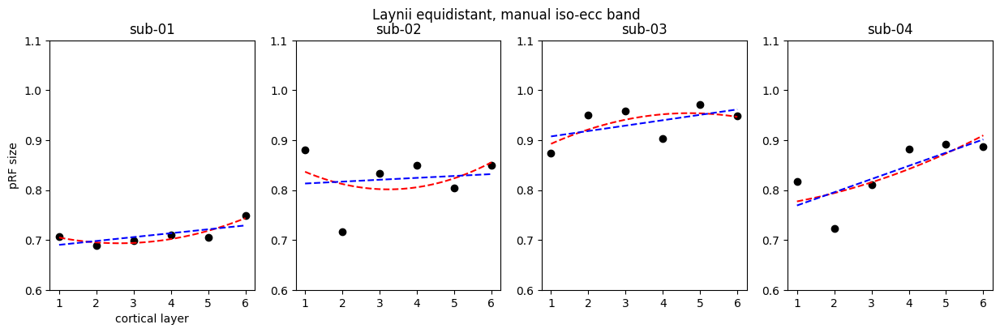

In [860]:
fig, axs = plt.subplots(nrows=1, ncols=len(subject_list), figsize=(15, 4))

for sub_id in range(0,len(subject_list)):
    idx      = df_pRFxecc_stats_equidist_2ecc[(df_pRFxecc_stats_equidist_2ecc['sub id'] == subject_list[sub_id])].index.tolist()
    depth    = df_pRFxecc_stats_equidist_2ecc.loc[idx,'depth'].values
    pRF_2deg = df_pRFxecc_stats_equidist_2ecc.loc[idx,'pRF@2deg'].values
    
    # omit nans
    idx = np.isfinite(pRF_2deg)
    pRF_2deg = pRF_2deg[idx]
    depth=depth[idx]
    
    # Fit the quadratic equation
    coefs_quadratic = np.polyfit(depth, pRF_2deg, 2)
    
    # Fit the linear equation
    coefs_linear = np.polyfit(depth, pRF_2deg, 1)

    # Print the coefficients
    print(coefs_quadratic)
    
    # Create a polynomial function from the coefficients
    f_quadratic = np.poly1d(coefs_quadratic)
    f_linear = np.poly1d(coefs_linear)

    # calculate the R-squared
    r_squared = r2_score(pRF_2deg, f_quadratic(depth))
    print(f"R2 quadratic: {r_squared}")
    r_squared = r2_score(pRF_2deg, f_linear(depth))
    print(f"R2 linear: {r_squared}")
    
    # quadratic model fit
    #x = np.linspace(0.2, 0.9, 50)
    x = np.linspace(1, n_layers, 50)
    y_quadratic = coefs_quadratic[0]*(x**2) + coefs_quadratic[1]*x+coefs_quadratic[2]
    y_linear = coefs_linear[0]*x + coefs_linear[1]
    
    # plot the model
    axs[sub_id].plot(depth,pRF_2deg,'ko')
    axs[sub_id].plot(x,y_quadratic,'r--')
    axs[sub_id].plot(x,y_linear,'b--')
    if sub_id == 0:
        axs[sub_id].set_xlabel('cortical layer')
        axs[sub_id].set_ylabel('pRF size')
    axs[sub_id].set_title(subject_list[sub_id])
#     axs[sub_id].set_ylim([0.65, 1.15])
#     axs[sub_id].set_yticks(np.linspace(0.65,1.15,6)) 
    axs[sub_id].set_ylim([0.6, 1.1])
    axs[sub_id].set_yticks(np.linspace(0.6,1.1,6)) 
    

plt.suptitle('Laynii equidistant, manual iso-ecc band')
plt.show()
    
#     df_pRFxecc_stats_equidist_2ecc.loc[(df_equidist_per_depth['sub id'] == subject_list[sub_id]) & 
#                                 (df_equidist_per_depth['hem'] == 'lh') & 
#                                 (df_equidist_per_depth['depth'] == depth_idx)].index.tolist()
#     lh_sigma = np.stack(df_equidist_per_depth.loc[idx, 'pRF size'].to_numpy(), axis=0)

##### Group plot

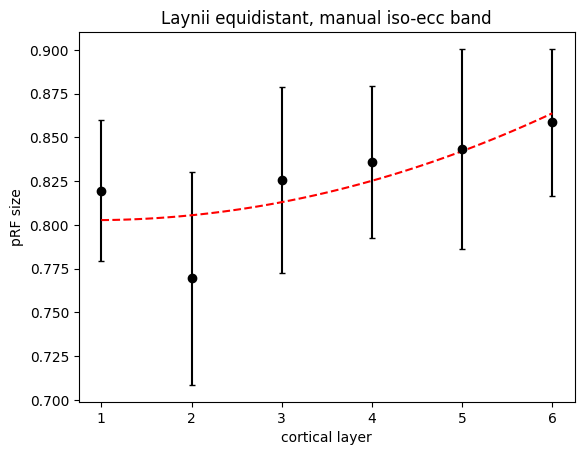

In [861]:
idx      = df_pRFxecc_stats_equidist_2ecc[(df_pRFxecc_stats_equidist_2ecc['sub id'] == subject_list[0])].index.tolist()
depth    = df_pRFxecc_stats_equidist_2ecc.loc[idx,'depth'].values
#depth    = depth[1:]
pRF_2deg = np.empty((len(depth),len(subject_list)))

for sub_id in range(0,len(subject_list)):
    idx      = df_pRFxecc_stats_equidist_2ecc[(df_pRFxecc_stats_equidist_2ecc['sub id'] == subject_list[sub_id]) &
                                        (df_pRFxecc_stats_equidist_2ecc['depth'] >= np.min(depth))].index.tolist()
    pRF_2deg[:,sub_id] = df_pRFxecc_stats_equidist_2ecc.loc[idx,'pRF@2deg'].values


# omit nans
idx = (np.sum(np.isnan(pRF_2deg),1) == 0)
pRF_2deg = pRF_2deg[idx,:]
depth=depth[idx]
    
# Transform the independent variable into a set of polynomial features
poly = PolynomialFeatures(degree=2)
X_poly = poly.fit_transform(depth.reshape(-1,1))

# Create and fit the model
model = MultiOutputRegressor(LinearRegression()).fit(X_poly, pRF_2deg)

# Make predictions
X_plot = np.linspace(depth.min(), depth.max(), 100).reshape(-1, 1)
X_plot_poly = poly.transform(X_plot)
y_plot = model.predict(X_plot_poly)

y_mean = y_plot.mean(axis=1)
y_median = np.median(y_plot,axis=1)


# data for plot
depth_plot    = df_pRFxecc_stats_equidist_2ecc.loc[:,'depth'].values
pRF_2deg_plot = df_pRFxecc_stats_equidist_2ecc.loc[:,'pRF@2deg'].values


# plot
plt.errorbar(depth, pRF_2deg.mean(axis=1), yerr=stats.sem(pRF_2deg,axis=1), fmt='ko', ecolor='black', capsize=2)
plt.plot(X_plot,y_mean,'r--')
#plt.plot(X_plot/n_layers,y_median,'b--')

# plt.plot(x,y_linear,'b--')
#plt.ylim([0.545,0.60])
plt.xlabel('cortical layer')
plt.ylabel('pRF size')


plt.title('Laynii equidistant, manual iso-ecc band')
plt.show()


### Equivolumetric layering

#### pRF size as a function of eccentricity
Fit a standard GLM to the pRF × eccentricity linear relation

ad Table 1. in "Systematic variation of population receptive field properties across cortical depth in human visual cortex"

Extract lh and rh sigma and ecc values at chosen rsq threshold

In [862]:
rsq_thresh = 0.1
target_ecc = 2
pRF_thresh = max_ecc_deg

Create a dataframe to save intercept and slope stats

In [863]:
subs = [['sub-01']*n_layers,['sub-02']*n_layers,['sub-03']*n_layers,['sub-04']*n_layers]
subs = list(itertools.chain(*subs))

depth = np.linspace(1,n_layers,n_layers).tolist()
depths = depth*n_sub

pRF_2deg = np.empty((1,len(subs),)).tolist()
pRF_2deg = list(itertools.chain(*pRF_2deg))


df_pRFxecc_stats_equivol_2ecc = pd.DataFrame({
    'sub id' : subs,
    'depth' : depths,
    'pRF@2deg': pRF_2deg
})

In [864]:
for sub_id in range(0,len(subject_list)):
    for depth_idx in depth:
        # lh
        idx=df_equivol_per_depth_ecc2.loc[(df_equivol_per_depth_ecc2['sub id'] == subject_list[sub_id]) & 
                                    (df_equivol_per_depth_ecc2['hem'] == 'lh') & 
                                    (df_equivol_per_depth_ecc2['depth'] == depth_idx)].index.tolist()
        lh_sigma = np.stack(df_equivol_per_depth_ecc2.loc[idx, 'pRF size'].to_numpy(), axis=0)
        lh_ecc   = np.stack(df_equivol_per_depth_ecc2.loc[idx, 'ecc'].to_numpy(), axis=0)
        lh_rsq   = np.stack(df_equivol_per_depth_ecc2.loc[idx, 'rsq'].to_numpy(), axis=0)

        # rh
        idx      = df_equivol_per_depth_ecc2.loc[(df_equivol_per_depth_ecc2['sub id'] == subject_list[sub_id]) & 
                                    (df_equivol_per_depth_ecc2['hem'] == 'rh') & 
                                    (df_equivol_per_depth_ecc2['depth'] == depth_idx)].index.tolist()
        rh_sigma = np.stack(df_equivol_per_depth_ecc2.loc[idx, 'pRF size'].to_numpy(), axis=0)
        rh_ecc   = np.stack(df_equivol_per_depth_ecc2.loc[idx, 'ecc'].to_numpy(), axis=0)
        rh_rsq   = np.stack(df_equivol_per_depth_ecc2.loc[idx, 'rsq'].to_numpy(), axis=0)

        # concatenate lh&rh
        y_sigma  = np.concatenate((lh_sigma.T,rh_sigma.T))
        x_ecc    = np.concatenate((lh_ecc.T,rh_ecc.T))
        r2       = np.concatenate((lh_rsq.T,rh_rsq.T))

#         y_sigma = lh_sigma
#         x_ecc = lh_ecc
#         r2 = lh_rsq

        # threshold by r2
        y_sigma  = np.atleast_2d(y_sigma[r2>rsq_thresh]).T
        x_ecc    = np.atleast_2d(x_ecc[r2>rsq_thresh]).T
        
        # threshold by sigma (only positive)
        x_ecc    = np.atleast_2d(x_ecc[y_sigma>0]).T
        y_sigma  = np.atleast_2d(y_sigma[y_sigma>0]).T
        
        # threshold by sigma (below threshold)
        x_ecc    = np.atleast_2d(x_ecc[y_sigma<pRF_thresh]).T
        y_sigma  = np.atleast_2d(y_sigma[y_sigma<pRF_thresh]).T
        
        
        # also remove outliers
        y_sigma_or, idx_or = reject_outliers(np.squeeze(y_sigma))
        y_sigma            = y_sigma[idx_or,:]
        x_ecc              = x_ecc[idx_or,:]
        
        # bin eccentricity data
        bins = [0, 1, 2, 3, 4, 5, 6, 7, 8]
        x_ecc=np.digitize(x_ecc,bins=bins)

    #     # random shuffle
    #     shuffle_indices = np.random.permutation(len(y_sigma))
    #     y_sigma = y_sigma[shuffle_indices]
    #     x_ecc = x_ecc[shuffle_indices]
    
        if len(y_sigma) < 30:
            idx=df_pRFxecc_stats_equivol_2ecc.loc[(df_pRFxecc_stats_equivol_2ecc['sub id'] == subject_list[sub_id]) &
                                (df_pRFxecc_stats_equivol_2ecc['depth'] == depth_idx)].index.tolist()
            df_pRFxecc_stats_equivol_2ecc.loc[idx, 'pRF@2deg'] = pd.Series([np.nan]*len(idx), index=df_pRFxecc_stats_equivol_2ecc.index[idx])
            continue


        # get pRF estimate at 2deg
        pRF_est = np.mean(y_sigma)


        # save stats to df
        idx=df_pRFxecc_stats_equivol_2ecc.loc[(df_pRFxecc_stats_equivol_2ecc['sub id'] == subject_list[sub_id]) &
                                (df_pRFxecc_stats_equivol_2ecc['depth'] == depth_idx)].index.tolist()

        df_pRFxecc_stats_equivol_2ecc.loc[idx, 'pRF@2deg'] = pd.Series([pRF_est]*len(idx), index=df_pRFxecc_stats_equivol_2ecc.index[idx])
        
    

In [865]:
df_pRFxecc_stats_equivol_2ecc.head()


,sub id,depth,pRF@2deg
0,sub-01,1.0,0.706442
1,sub-01,2.0,0.685138
2,sub-01,3.0,0.698426
3,sub-01,4.0,0.706188
4,sub-01,5.0,0.707224


#### Plot estimated pRF size at target eccentricity

[ 0.0050079  -0.02645927  0.72585881]
R2 quadratic: 0.8807470715697404
R2 linear: 0.5108569443537061
[ 0.00848638 -0.05647604  0.89880818]
R2 quadratic: 0.32611996191446657
R2 linear: 0.017243191939612768
[8.30031823e-04 1.66453698e-02 8.50317459e-01]
R2 quadratic: 0.9360161655819182
R2 linear: 0.9332958549215359
[-0.00159854  0.03137653  0.75794112]
R2 quadratic: 0.5918354395434573
R2 linear: 0.5840226779691564


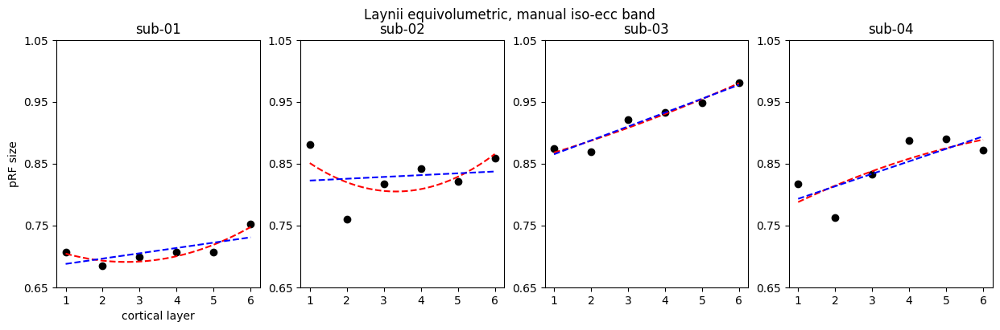

In [866]:
fig, axs = plt.subplots(nrows=1, ncols=len(subject_list), figsize=(15, 4))


for sub_id in range(0,len(subject_list)):
    idx      = df_pRFxecc_stats_equivol_2ecc[(df_pRFxecc_stats_equivol_2ecc['sub id'] == subject_list[sub_id])].index.tolist()
    depth    = df_pRFxecc_stats_equivol_2ecc.loc[idx,'depth'].values
    pRF_2deg = df_pRFxecc_stats_equivol_2ecc.loc[idx,'pRF@2deg'].values
    
    # omit nans
    idx = np.isfinite(pRF_2deg)
    pRF_2deg = pRF_2deg[idx]
    depth=depth[idx]
    
    # Fit the quadratic equation
    coefs_quadratic = np.polyfit(depth, pRF_2deg, 2)
    
    # Fit the linear equation
    coefs_linear = np.polyfit(depth, pRF_2deg, 1)

    # Print the coefficients
    print(coefs_quadratic)
    
    # Create a polynomial function from the coefficients
    f_quadratic = np.poly1d(coefs_quadratic)
    f_linear = np.poly1d(coefs_linear)

    # calculate the R-squared
    r_squared = r2_score(pRF_2deg, f_quadratic(depth))
    print(f"R2 quadratic: {r_squared}")
    r_squared = r2_score(pRF_2deg, f_linear(depth))
    print(f"R2 linear: {r_squared}")
    
    # quadratic model fit
    #x = np.linspace(0.2, 0.9, 50)
    x = np.linspace(1, n_layers, 50)
    y_quadratic = coefs_quadratic[0]*(x**2) + coefs_quadratic[1]*x+coefs_quadratic[2]
    y_linear = coefs_linear[0]*x + coefs_linear[1]
    
    # plot the model
    axs[sub_id].plot(depth,pRF_2deg,'ko')
    axs[sub_id].plot(x,y_quadratic,'r--')
    axs[sub_id].plot(x,y_linear,'b--')
    if sub_id == 0:
        axs[sub_id].set_xlabel('cortical layer')
        axs[sub_id].set_ylabel('pRF size')
    axs[sub_id].set_title(subject_list[sub_id])
#     axs[sub_id].set_ylim([0.65, 1.15])
#     axs[sub_id].set_yticks(np.linspace(0.65,1.15,6))  
    axs[sub_id].set_ylim([0.65, 1.05])
    axs[sub_id].set_yticks(np.linspace(0.65,1.05,5)) 
    
plt.suptitle('Laynii equivolumetric, manual iso-ecc band')
plt.show()
#     df_pRFxecc_stats_equivol_2ecc.loc[(df_equivol_per_depth['sub id'] == subject_list[sub_id]) & 
#                                 (df_equivol_per_depth['hem'] == 'lh') & 
#                                 (df_equivol_per_depth['depth'] == depth_idx)].index.tolist()
#     lh_sigma = np.stack(df_equivol_per_depth.loc[idx, 'pRF size'].to_numpy(), axis=0)

##### Group plot

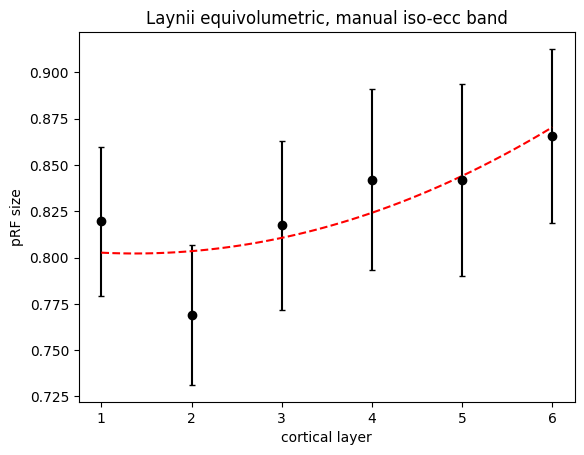

In [867]:
idx      = df_pRFxecc_stats_equivol_2ecc[(df_pRFxecc_stats_equivol_2ecc['sub id'] == subject_list[0])].index.tolist()
depth    = df_pRFxecc_stats_equivol_2ecc.loc[idx,'depth'].values
#depth    = depth[1:]
pRF_2deg = np.empty((len(depth),len(subject_list)))

for sub_id in range(0,len(subject_list)):
    idx      = df_pRFxecc_stats_equivol_2ecc[(df_pRFxecc_stats_equivol_2ecc['sub id'] == subject_list[sub_id]) &
                                        (df_pRFxecc_stats_equivol_2ecc['depth'] >= np.min(depth))].index.tolist()
    pRF_2deg[:,sub_id] = df_pRFxecc_stats_equivol_2ecc.loc[idx,'pRF@2deg'].values


# omit nans
idx = (np.sum(np.isnan(pRF_2deg),1) == 0)
pRF_2deg = pRF_2deg[idx,:]
depth=depth[idx]
    
# Transform the independent variable into a set of polynomial features
poly = PolynomialFeatures(degree=2)
X_poly = poly.fit_transform(depth.reshape(-1,1))

# Create and fit the model
model = MultiOutputRegressor(LinearRegression()).fit(X_poly, pRF_2deg)

# Make predictions
X_plot = np.linspace(depth.min(), depth.max(), 100).reshape(-1, 1)
X_plot_poly = poly.transform(X_plot)
y_plot = model.predict(X_plot_poly)

y_mean = y_plot.mean(axis=1)
y_median = np.median(y_plot,axis=1)

# ################################################
# # Fit the quadratic equation
# coefs_quadratic = np.polyfit(depth, pRF_2deg, 2)

# # Fit the linear equation
# coefs_linear = np.polyfit(depth, pRF_2deg, 1)

# # # Create a polynomial function from the coefficients
# # f_quadratic = np.poly1d(coefs_quadratic)
# # f_linear = np.poly1d(coefs_linear)

# # # calculate the R-squared
# # r_squared = r2_score(pRF_2deg, f_quadratic(depth))
# # print(f"R2 quadratic: {r_squared}")
# # r_squared = r2_score(pRF_2deg, f_linear(depth))
# # print(f"R2 linear: {r_squared}")
# #################################################

# data for plot
depth_plot    = df_pRFxecc_stats_equivol_2ecc.loc[:,'depth'].values
pRF_2deg_plot = df_pRFxecc_stats_equivol_2ecc.loc[:,'pRF@2deg'].values


# plot
plt.errorbar(depth, pRF_2deg.mean(axis=1), yerr=stats.sem(pRF_2deg,axis=1), fmt='ko', ecolor='black', capsize=2)
plt.plot(X_plot,y_mean,'r--')
#plt.plot(X_plot/n_layers,y_median,'b--')
# plt.plot(x,y_linear,'b--')
#plt.ylim([0.545,0.60])
plt.xlabel('cortical layer')
plt.ylabel('pRF size')
plt.title('Laynii equivolumetric, manual iso-ecc band')
plt.show()


## #############################################################

## #############################################################

## Euclidean distances: pRF per cortical layer fitted at target eccentricity

### Equidistant layering

#### pRF size as a function of eccentricity (separately for each cortical layer)
Fit a standard GLM to the pRF × eccentricity linear relation

ad Table 1. in "Systematic variation of population receptive field properties across cortical depth in human visual cortex"

##### Extract lh and rh sigma and ecc values at chosen rsq threshold

Set number of layers, eccentricities, subjects, hemispheres

In [670]:
n_layers = 10
n_sub      = len(subject_list)
n_hem      = len(hem_list)

Thresholds

In [671]:
rsq_thresh = 0.1
target_ecc = 2
pRF_thresh = max_ecc_deg

Cortical distance bins

In [672]:
cd_bins  = np.linspace(-2.5,2.5,n_layers)
cd_bins

array([-2.5       , -1.94444444, -1.38888889, -0.83333333, -0.27777778,
        0.27777778,  0.83333333,  1.38888889,  1.94444444,  2.5       ])

Create a dataframe to save intercept and slope stats

In [673]:
subs = [['sub-01']*n_layers,['sub-02']*n_layers,['sub-03']*n_layers,['sub-04']*n_layers]
subs = list(itertools.chain(*subs))

depth = cd_bins.tolist()
depths = depth*n_sub

intercept = np.empty((1,len(subs),)).tolist()
intercept = list(itertools.chain(*intercept))

slope = np.empty((1,len(subs),)).tolist()
slope = list(itertools.chain(*slope))

intercept_stats = np.empty((1,len(subs),)).tolist()
intercept_stats = list(itertools.chain(*intercept_stats))

slope_stats = np.empty((1,len(subs),)).tolist()
slope_stats = list(itertools.chain(*slope_stats))

pRF_2deg = np.empty((1,len(subs),)).tolist()
pRF_2deg = list(itertools.chain(*pRF_2deg))


df_pRFxecc_stats_cortdist = pd.DataFrame({
    'sub id' : subs,
    'depth' : depths,
    'intercept': intercept,
    'slope': slope,
    'intercept-stats' : intercept_stats,
    'slope-stats' : slope_stats,
    'pRF@2deg': pRF_2deg
})

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
sub-01
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


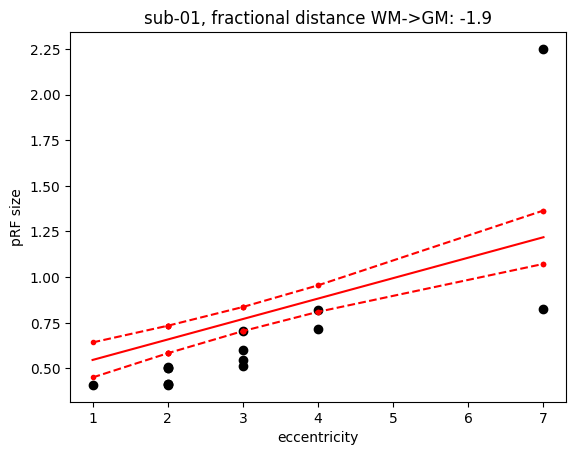

Intercept: 0.4344474709296629
t = 6.96, p = 0.00000
Slope: 0.11202925869294456
t = 6.58, p = 0.00000


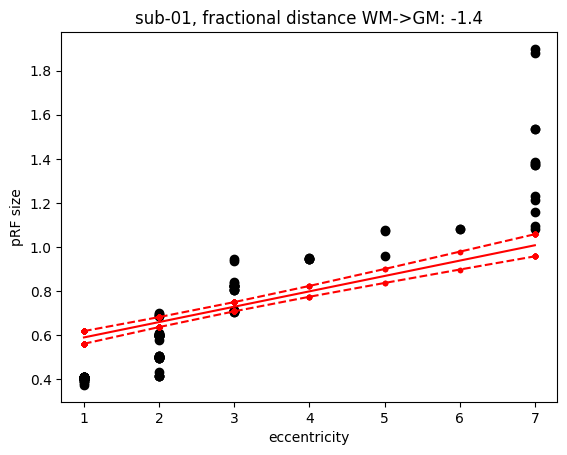

Intercept: 0.5201428494934466
t = 27.52, p = 0.00000
Slope: 0.06966388157526937
t = 12.54, p = 0.00000


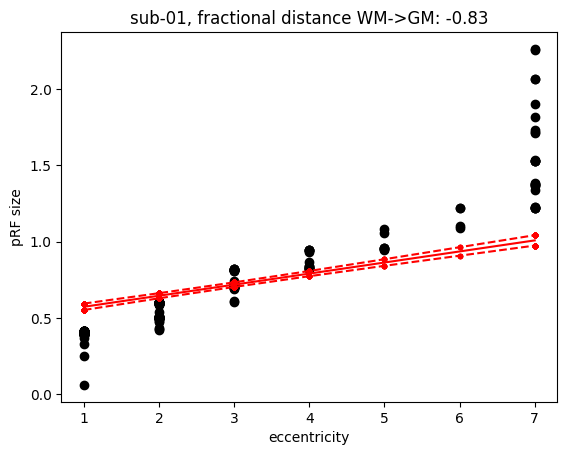

Intercept: 0.49974972046154925
t = 36.42, p = 0.00000
Slope: 0.07261883886842373
t = 18.90, p = 0.00000


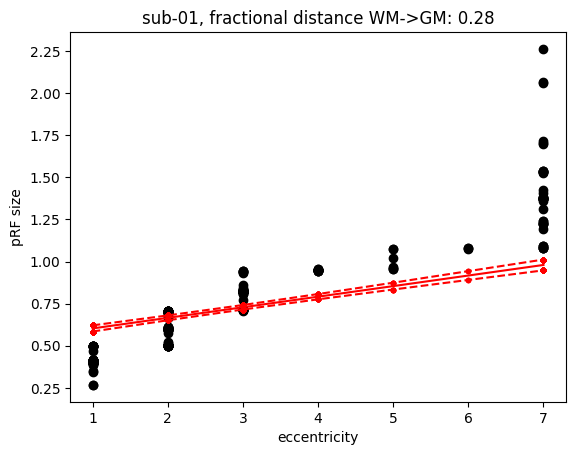

Intercept: 0.5399378148910137
t = 45.03, p = 0.00000
Slope: 0.06280430365057511
t = 17.75, p = 0.00000


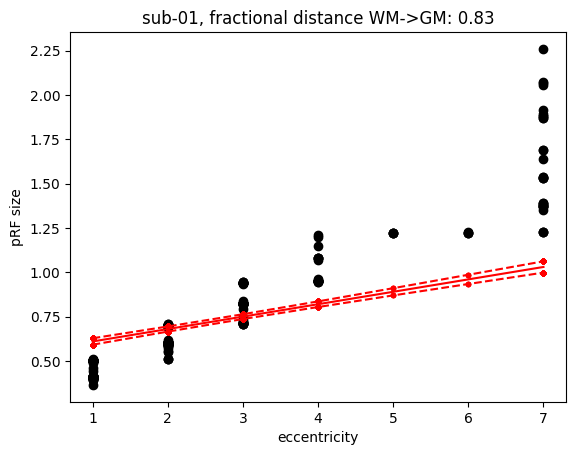

Intercept: 0.5395833357107125
t = 45.58, p = 0.00000
Slope: 0.07008231200484782
t = 20.16, p = 0.00000


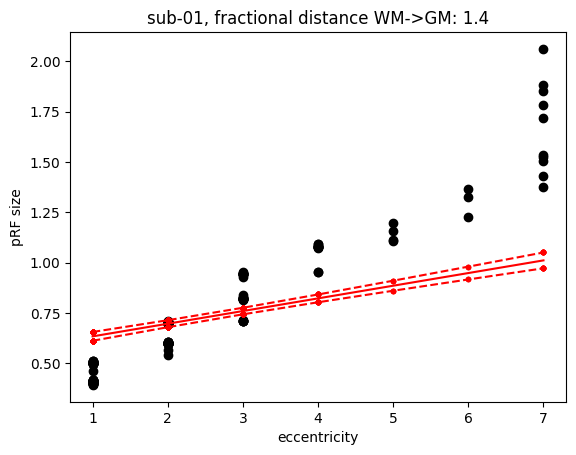

Intercept: 0.570048481029454
t = 39.63, p = 0.00000
Slope: 0.06298169456532432
t = 14.67, p = 0.00000


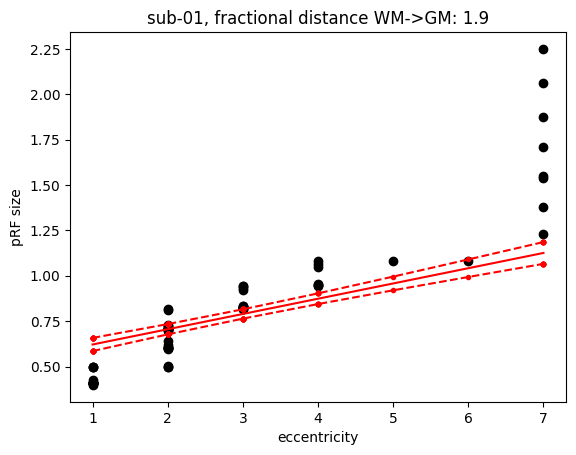

Intercept: 0.537384283796836
t = 22.62, p = 0.00000
Slope: 0.08405702577752033
t = 12.38, p = 0.00000


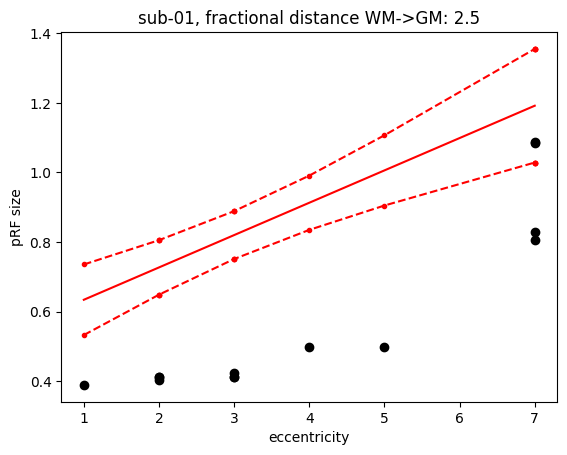

Intercept: 0.5414209528138997
t = 8.10, p = 0.00000
Slope: 0.09291465579906909
t = 4.91, p = 0.00000
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
sub-02
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


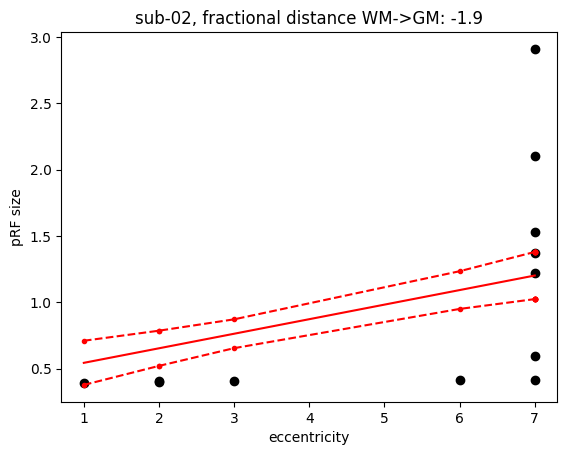

Intercept: 0.4340782976599691
t = 4.15, p = 0.00003
Slope: 0.10970697483995079
t = 4.64, p = 0.00000


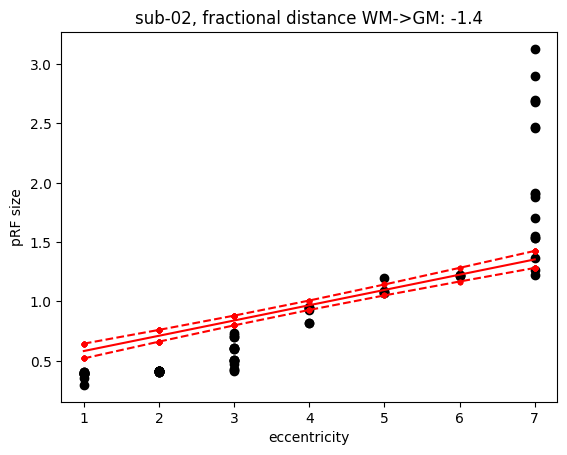

Intercept: 0.45397156126112537
t = 11.54, p = 0.00000
Slope: 0.1286333874697452
t = 13.95, p = 0.00000


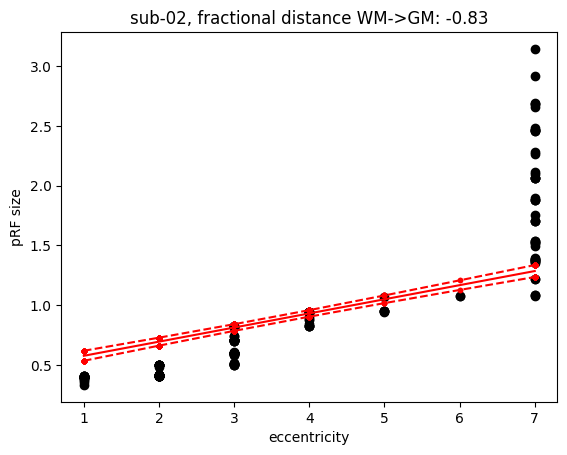

Intercept: 0.4585079235121537
t = 17.27, p = 0.00000
Slope: 0.1181771601501874
t = 18.69, p = 0.00000


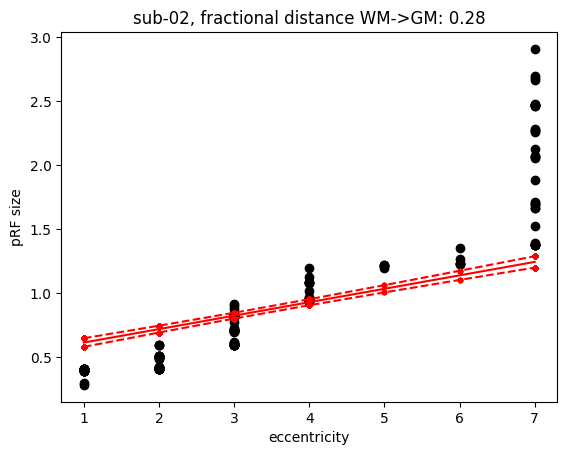

Intercept: 0.5089392918769533
t = 23.80, p = 0.00000
Slope: 0.10490194299080757
t = 19.56, p = 0.00000


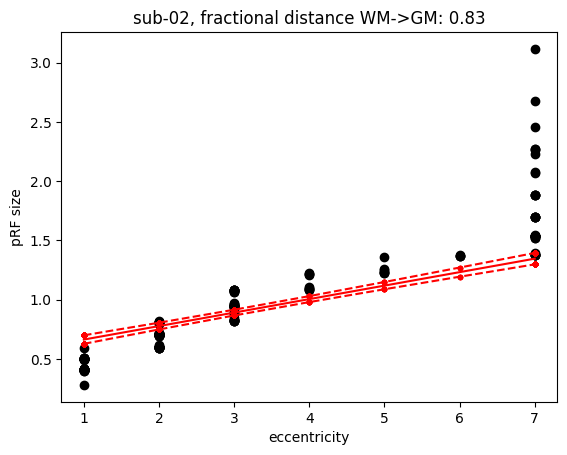

Intercept: 0.5502790251036697
t = 23.98, p = 0.00000
Slope: 0.1137465926398608
t = 19.58, p = 0.00000


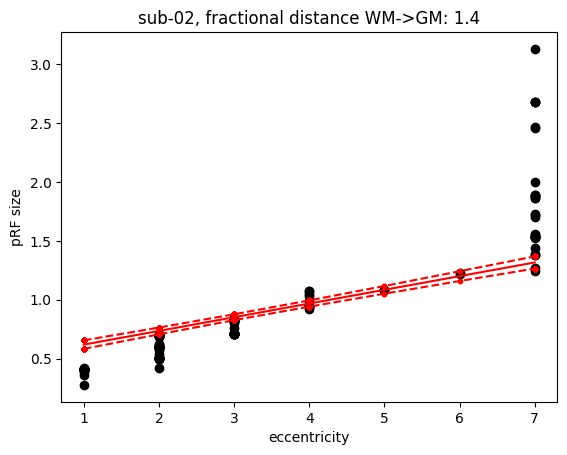

Intercept: 0.5019484866861907
t = 21.50, p = 0.00000
Slope: 0.11639439184878023
t = 19.14, p = 0.00000


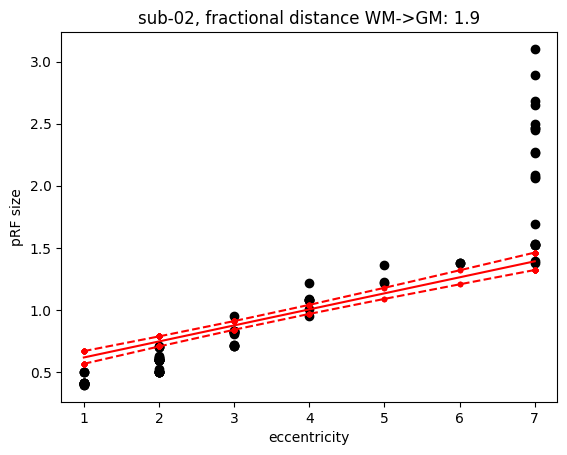

Intercept: 0.4876283907691793
t = 14.89, p = 0.00000
Slope: 0.12914561587427037
t = 15.40, p = 0.00000


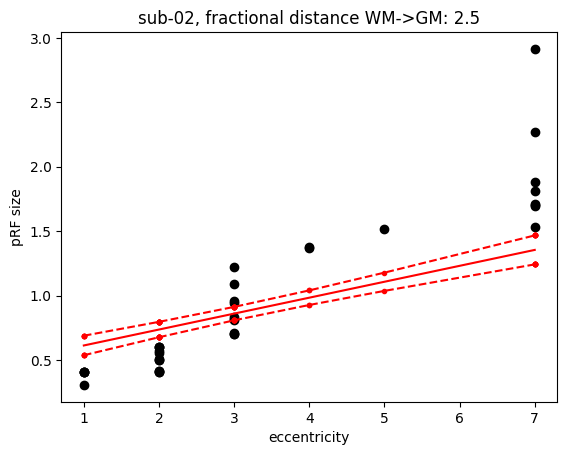

Intercept: 0.4908756731044134
t = 10.01, p = 0.00000
Slope: 0.1234922033800954
t = 9.39, p = 0.00000
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
sub-03
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


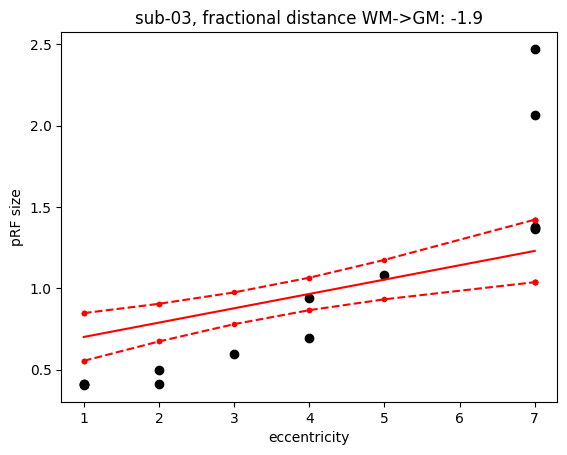

Intercept: 0.6131272364334251
t = 6.53, p = 0.00000
Slope: 0.08807677069305145
t = 3.73, p = 0.00019


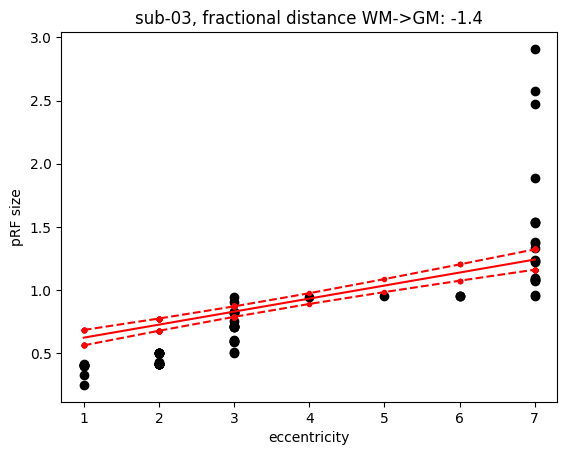

Intercept: 0.518603925315226
t = 13.35, p = 0.00000
Slope: 0.10313998541564516
t = 10.61, p = 0.00000


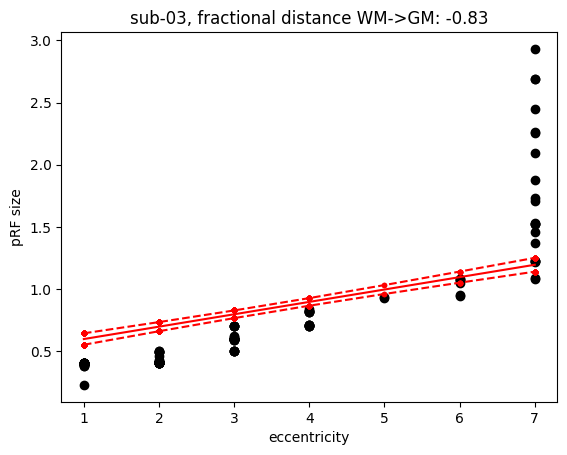

Intercept: 0.4999173839023663
t = 17.20, p = 0.00000
Slope: 0.09948990998459531
t = 14.33, p = 0.00000


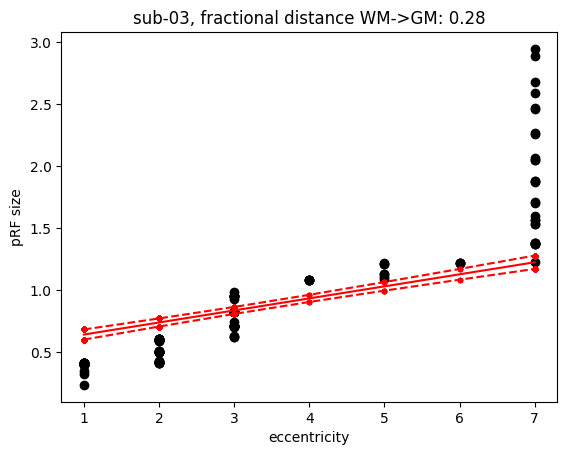

Intercept: 0.5425042077850774
t = 20.88, p = 0.00000
Slope: 0.09729180609187107
t = 15.03, p = 0.00000


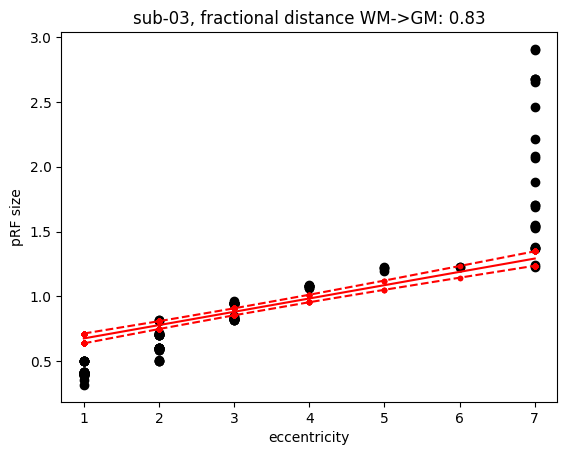

Intercept: 0.5731014404054422
t = 23.55, p = 0.00000
Slope: 0.10263569913696535
t = 15.93, p = 0.00000


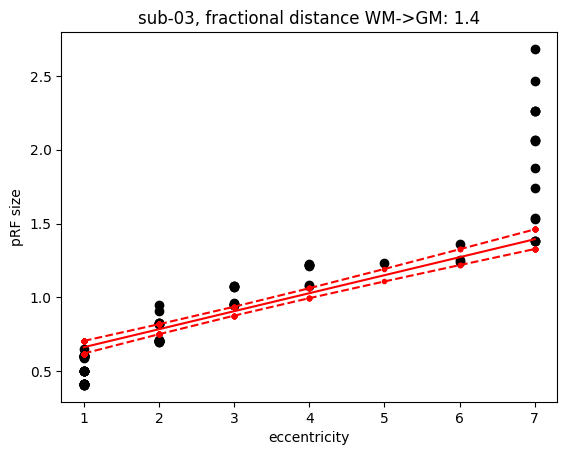

Intercept: 0.5393948284093701
t = 19.49, p = 0.00000
Slope: 0.12202896461112309
t = 16.05, p = 0.00000


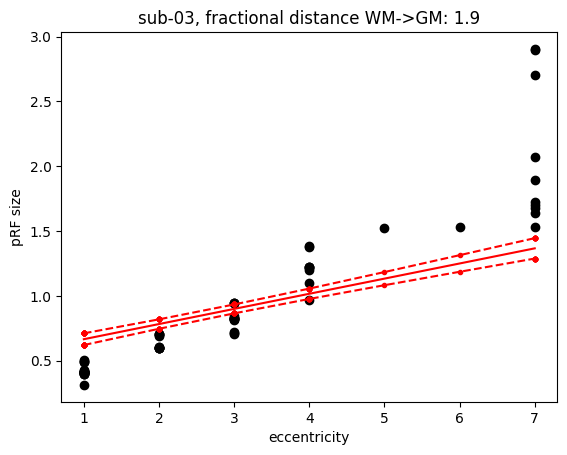

Intercept: 0.5488086286533793
t = 18.74, p = 0.00000
Slope: 0.11677668579028222
t = 13.68, p = 0.00000


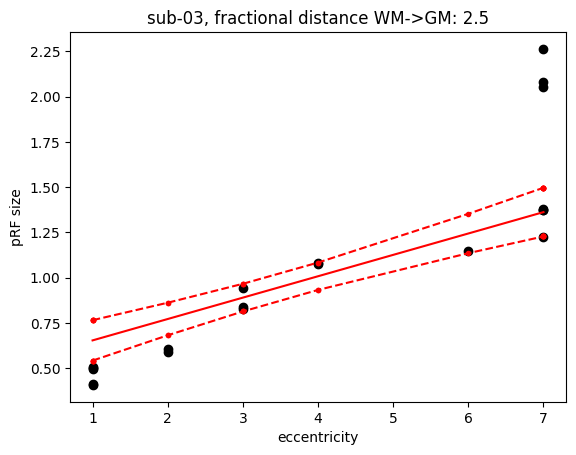

Intercept: 0.5362522988386941
t = 7.64, p = 0.00000
Slope: 0.11802664912999222
t = 7.10, p = 0.00000
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
sub-04
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


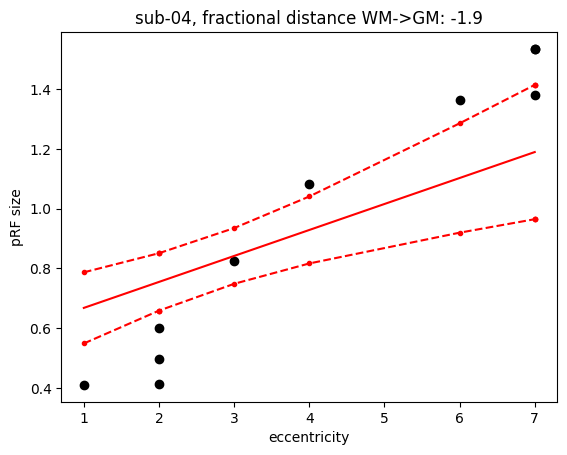

Intercept: 0.5805283877160412
t = 7.42, p = 0.00000
Slope: 0.08693869220833497
t = 3.63, p = 0.00028


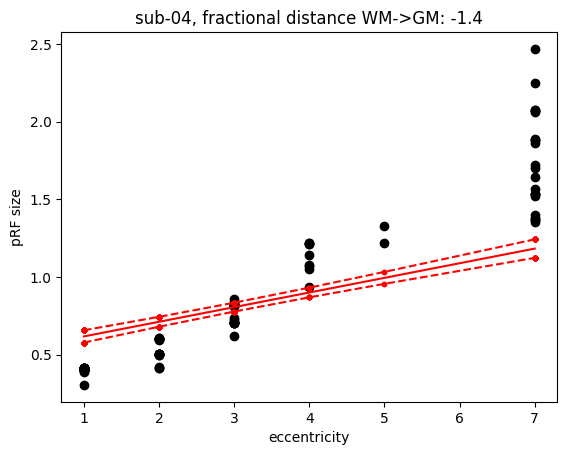

Intercept: 0.5225713791475699
t = 20.71, p = 0.00000
Slope: 0.09422841403773743
t = 13.98, p = 0.00000


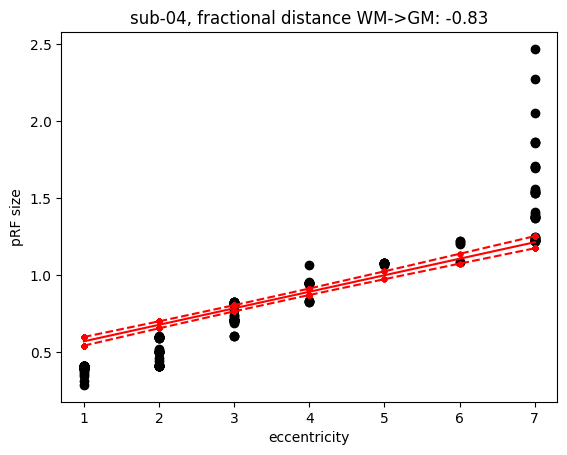

Intercept: 0.46299068057271603
t = 25.88, p = 0.00000
Slope: 0.10716567254629172
t = 23.36, p = 0.00000


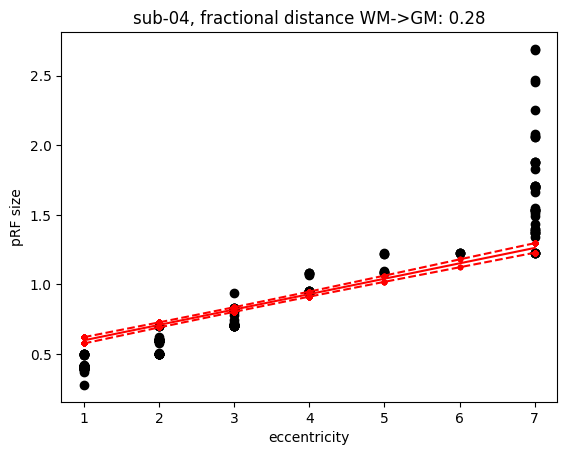

Intercept: 0.48824468725244785
t = 33.75, p = 0.00000
Slope: 0.11063374419350733
t = 28.53, p = 0.00000


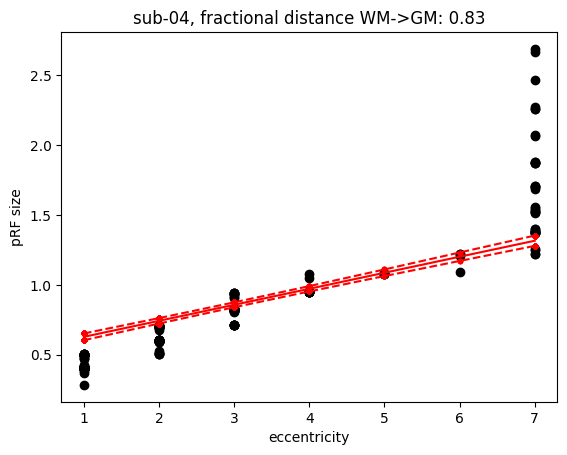

Intercept: 0.5133242684064703
t = 33.08, p = 0.00000
Slope: 0.11466759756910211
t = 27.48, p = 0.00000


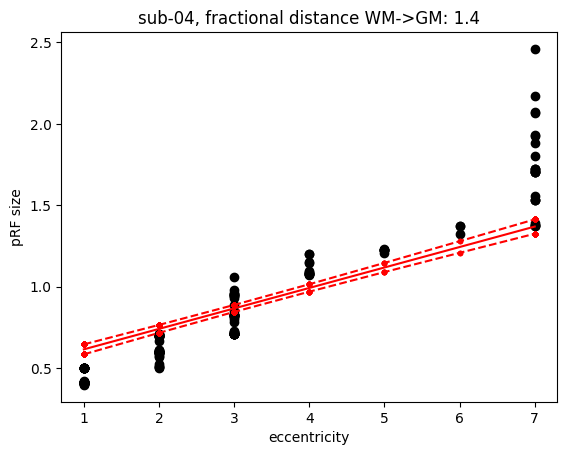

Intercept: 0.4888339309207045
t = 24.89, p = 0.00000
Slope: 0.12569830075560992
t = 24.39, p = 0.00000


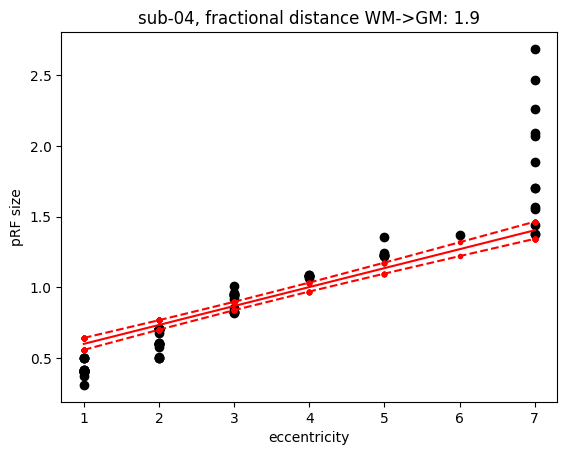

Intercept: 0.4659520978519491
t = 17.23, p = 0.00000
Slope: 0.13385722420107898
t = 18.93, p = 0.00000


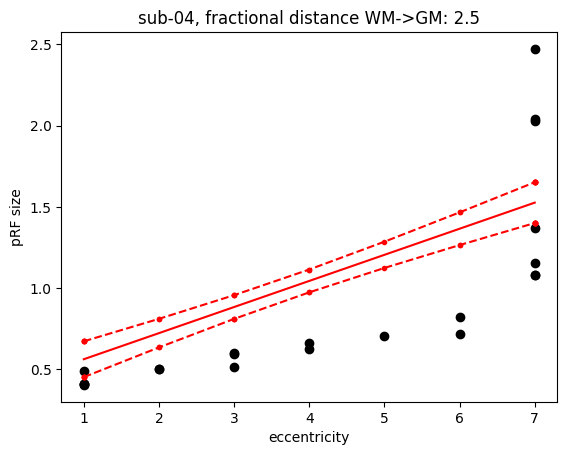

Intercept: 0.4019352331252411
t = 5.78, p = 0.00000
Slope: 0.16063703022290676
t = 9.95, p = 0.00000


In [674]:
for sub_id in range(0,len(subject_list)):
    print('%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%')
    print(subject_list[sub_id])
    print('%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%')
    # lh
    idx=df_pRF_per_cortdist.loc[(df_pRF_per_cortdist['sub id'] == subject_list[sub_id]) & 
                                (df_pRF_per_cortdist['hem'] == 'lh')].index.tolist()
    lh_sigma = np.stack(df_pRF_per_cortdist.loc[idx, 'pRF size'].to_numpy(), axis=0)
    lh_ecc   = np.stack(df_pRF_per_cortdist.loc[idx, 'ecc'].to_numpy(), axis=0)
    lh_rsq   = np.stack(df_pRF_per_cortdist.loc[idx, 'rsq'].to_numpy(), axis=0)
    lh_cortdist = np.stack(df_pRF_per_cortdist.loc[idx, 'cort dist'].to_numpy(), axis=0)

    # rh
    idx=df_pRF_per_cortdist.loc[(df_pRF_per_cortdist['sub id'] == subject_list[sub_id]) & 
                                (df_pRF_per_cortdist['hem'] == 'rh')].index.tolist()
    rh_sigma = np.stack(df_pRF_per_cortdist.loc[idx, 'pRF size'].to_numpy(), axis=0)
    rh_ecc   = np.stack(df_pRF_per_cortdist.loc[idx, 'ecc'].to_numpy(), axis=0)
    rh_rsq   = np.stack(df_pRF_per_cortdist.loc[idx, 'rsq'].to_numpy(), axis=0)
    rh_cortdist = np.stack(df_pRF_per_cortdist.loc[idx, 'cort dist'].to_numpy(), axis=0)

    # concatenate lh&rh
    y_sigma  = np.concatenate((lh_sigma.T,rh_sigma.T))
    x_ecc    = np.concatenate((lh_ecc.T,rh_ecc.T))
    r2       = np.concatenate((lh_rsq.T,rh_rsq.T))
    cortdist = np.concatenate((lh_cortdist.T,rh_cortdist.T))
    
    # threshold by r2
    y_sigma  = np.atleast_2d(y_sigma[r2>rsq_thresh]).T
    x_ecc    = np.atleast_2d(x_ecc[r2>rsq_thresh]).T
    cortdist    = np.atleast_2d(cortdist[r2>rsq_thresh]).T
    
    # threshold by sigma (only positive)
    x_ecc    = np.atleast_2d(x_ecc[y_sigma>0]).T
    cortdist = np.atleast_2d(cortdist[y_sigma>0]).T
    y_sigma  = np.atleast_2d(y_sigma[y_sigma>0]).T

    # threshold by sigma (below threshold)
    x_ecc    = np.atleast_2d(x_ecc[y_sigma<pRF_thresh]).T
    cortdist = np.atleast_2d(cortdist[y_sigma<pRF_thresh]).T
    y_sigma  = np.atleast_2d(y_sigma[y_sigma<pRF_thresh]).T

    # also remove outliers
    y_sigma_or, idx_or = reject_outliers(np.squeeze(y_sigma))
    y_sigma            = y_sigma[idx_or,:]
    x_ecc              = x_ecc[idx_or,:]
    cortdist           = cortdist[idx_or,:]

    # bin eccentricity data
    bins = [0, 1, 2, 3, 4, 5, 6, 7, 8]
    x_ecc=np.digitize(x_ecc,bins=bins)

    # bin cortical distances
    cortdist=np.digitize(cortdist,cd_bins)
    cortdist_=np.zeros(len(cortdist))
    for n in range(0,len(cortdist)):
        cortdist_[n] = cd_bins[(cortdist[n]-1)]
    cortdist=np.expand_dims(cortdist_, axis=1)
    
    # save full array of sigma, ecc
    y_sigma_all=y_sigma
    x_ecc_all=x_ecc
    
    # loop through binned cortical distances
    for depth_idx in depth:
        y_sigma = y_sigma_all[cortdist==depth_idx]
        x_ecc   = x_ecc_all[cortdist==depth_idx]
    
        if len(y_sigma) < 30:
            idx=df_pRFxecc_stats_cortdist.loc[(df_pRFxecc_stats_cortdist['sub id'] == subject_list[sub_id]) &
                                (df_pRFxecc_stats_cortdist['depth'] == depth_idx)].index.tolist()
            df_pRFxecc_stats_cortdist.loc[idx, 'pRF@2deg'] = pd.Series([np.nan]*len(idx), index=df_pRFxecc_stats_cortdist.index[idx])
            continue


        # Split the data into a training set and a test set
        X_train, X_test, y_train, y_test = train_test_split(x_ecc, y_sigma, test_size=0.1)

        # Fit the model to the training set
        X_train = sm.add_constant(X_train)
        #model = sm.OLS(y_train, X_train).fit()
        model = sm.GLM(y_train, X_train, family=sm.families.Gaussian()).fit()

        # Make predictions on the test set
        X_test = sm.add_constant(X_test)
        y_pred = model.predict(X_test)

        # extract the prediction
        pred = model.get_prediction(X_test)

        # extract the intercept and slope
        intercept = model.params[0]
        slope = model.params[1]

        # extract the bootstrapped 95% quantiles and median of the fit
        quantiles = pred.summary_frame(alpha=0.05)
        median = pred.summary_frame(alpha=0.5)

        # plot the model
        plt.plot(np.sort(np.atleast_2d(X_test[:,1])).T, np.sort(y_test), 'ko')
        plt.plot(np.sort(np.atleast_2d(X_test[:,1])).T, np.sort(y_pred), 'r-')
        plt.plot(np.sort(np.atleast_2d(X_test[:,1])).T, np.sort(quantiles['mean_ci_lower'].values), 'r--.')
        plt.plot(np.sort(np.atleast_2d(X_test[:,1])).T, np.sort(quantiles['mean_ci_upper'].values), 'r--.')
        plt.xlabel('eccentricity')
        plt.ylabel('pRF size')
        plt.title(subject_list[sub_id]+", fractional distance WM->GM: "+"{0:.2g}".format(depth_idx))
                  #str(depth_idx/10))
        plt.show()

        # print stats
        print(f"Intercept: {intercept}")
        intercept_txt = "t = "+"{:.2f}".format(model.tvalues[0])+", p = "+"{:.5f}".format(model.pvalues[0])
        print(intercept_txt)

        print(f"Slope: {slope}")
        slope_txt = "t = "+"{:.2f}".format(model.tvalues[1])+", p = "+"{:.5f}".format(model.pvalues[1])
        print(slope_txt)

        # get pRF estimate at 2deg
        pRF_est = intercept + target_ecc*slope


        # save stats to df
        idx=df_pRFxecc_stats_cortdist.loc[(df_pRFxecc_stats_cortdist['sub id'] == subject_list[sub_id]) &
                                (df_pRFxecc_stats_cortdist['depth'] == depth_idx)].index.tolist()
        df_pRFxecc_stats_cortdist.loc[idx, 'intercept-stats'] = pd.Series([intercept_txt]*len(idx), index=df_pRFxecc_stats_cortdist.index[idx])
        df_pRFxecc_stats_cortdist.loc[idx, 'slope-stats'] = pd.Series([slope_txt]*len(idx), index=df_pRFxecc_stats_cortdist.index[idx])

        df_pRFxecc_stats_cortdist.loc[idx, 'intercept'] = pd.Series([intercept]*len(idx), index=df_pRFxecc_stats_cortdist.index[idx])
        df_pRFxecc_stats_cortdist.loc[idx, 'slope'] = pd.Series([slope]*len(idx), index=df_pRFxecc_stats_cortdist.index[idx])

        df_pRFxecc_stats_cortdist.loc[idx, 'pRF@2deg'] = pd.Series([pRF_est]*len(idx), index=df_pRFxecc_stats_cortdist.index[idx])
        
    

In [675]:
df_pRFxecc_stats_cortdist.head()


,sub id,depth,intercept,slope,intercept-stats,slope-stats,pRF@2deg
0,sub-01,-2.500000,0.567782,0.567782,0.567782,0.567782,NaN
1,sub-01,-1.944444,0.434447,0.112029,"t = 6.96, p = 0.00000","t = 6.58, p = 0.00000",0.658506
2,sub-01,-1.388889,0.520143,0.069664,"t = 27.52, p = 0.00000","t = 12.54, p = 0.00000",0.659471
3,sub-01,-0.833333,0.499750,0.072619,"t = 36.42, p = 0.00000","t = 18.90, p = 0.00000",0.644987
4,sub-01,-0.277778,0.640010,0.640010,0.64001,0.64001,NaN


#### Plot estimated pRF size at target eccentricity

[0.00547606 0.01303941 0.66200118]
R2 quadratic: 0.9683384355354009
R2 linear: 0.8263634400044987
[-0.00780334  0.02151293  0.73302377]
R2 quadratic: 0.7492392794974324
R2 linear: 0.5862723666461973
[0.00655536 0.00573145 0.74066002]
R2 quadratic: 0.327381773476474
R2 linear: 0.18624987689607908
[4.18401906e-03 6.05494707e-04 7.13785941e-01]
R2 quadratic: 0.13913346052144637
R2 linear: 0.03112924970486508


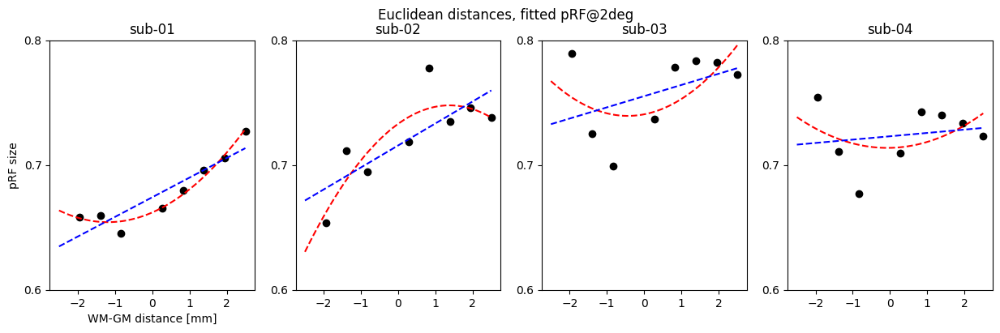

In [679]:
fig, axs = plt.subplots(nrows=1, ncols=len(subject_list), figsize=(15, 4))

for sub_id in range(0,len(subject_list)):
    idx      = df_pRFxecc_stats_cortdist[(df_pRFxecc_stats_cortdist['sub id'] == subject_list[sub_id])].index.tolist()
    depth    = df_pRFxecc_stats_cortdist.loc[idx,'depth'].values
    pRF_2deg = df_pRFxecc_stats_cortdist.loc[idx,'pRF@2deg'].values
    
    # omit nans
    idx = np.isfinite(pRF_2deg)
    pRF_2deg = pRF_2deg[idx]
    depth=depth[idx]
    
    # Fit the quadratic equation
    coefs_quadratic = np.polyfit(depth, pRF_2deg, 2)
    
    # Fit the linear equation
    coefs_linear = np.polyfit(depth, pRF_2deg, 1)

    # Print the coefficients
    print(coefs_quadratic)
    
    # Create a polynomial function from the coefficients
    f_quadratic = np.poly1d(coefs_quadratic)
    f_linear = np.poly1d(coefs_linear)

    # calculate the R-squared
    r_squared = r2_score(pRF_2deg, f_quadratic(depth))
    print(f"R2 quadratic: {r_squared}")
    r_squared = r2_score(pRF_2deg, f_linear(depth))
    print(f"R2 linear: {r_squared}")
    
    # quadratic model fit
    #x = np.linspace(0.2, 0.9, 50)
    x = np.linspace(-2.5, 2.5, 50)
    y_quadratic = coefs_quadratic[0]*(x**2) + coefs_quadratic[1]*x+coefs_quadratic[2]
    y_linear = coefs_linear[0]*x + coefs_linear[1]
    
    # plot the model
    axs[sub_id].plot(depth,pRF_2deg,'ko')
    axs[sub_id].plot(x,y_quadratic,'r--')
    axs[sub_id].plot(x,y_linear,'b--')
    if sub_id == 0:
        axs[sub_id].set_xlabel('WM-GM distance [mm]')
        axs[sub_id].set_ylabel('pRF size')
    axs[sub_id].set_title(subject_list[sub_id])
#     axs[sub_id].set_ylim([0.55, 0.95])
#     axs[sub_id].set_yticks(np.linspace(0.55,0.95,5)) 
    axs[sub_id].set_ylim([0.6, 0.8])
    axs[sub_id].set_yticks(np.linspace(0.6,0.8,3)) 

plt.suptitle('Euclidean distances, fitted pRF@2deg')
plt.show()
#     axs[sub_id].set_ylim([0.7, 1.1]4
#     axs[sub_id].set_yticks(np.linspace(0.7,1.1,5))    
    
#     df_pRFxecc_stats_cortdist.loc[(df_equidist_per_depth['sub id'] == subject_list[sub_id]) & 
#                                 (df_equidist_per_depth['hem'] == 'lh') & 
#                                 (df_equidist_per_depth['depth'] == depth_idx)].index.tolist()
#     lh_sigma = np.stack(df_equidist_per_depth.loc[idx, 'pRF size'].to_numpy(), axis=0)

##### Group plot

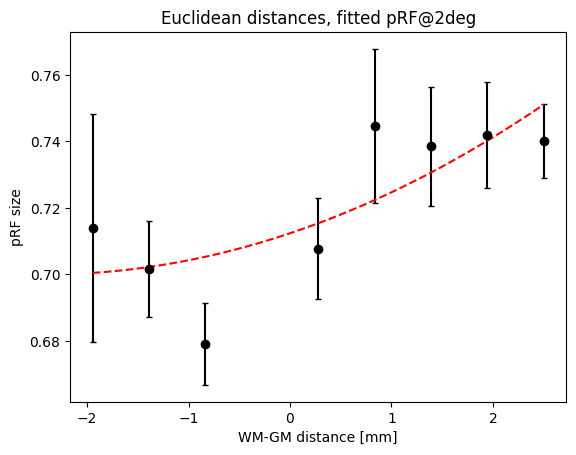

In [680]:
idx      = df_pRFxecc_stats_cortdist[(df_pRFxecc_stats_cortdist['sub id'] == subject_list[0])].index.tolist()
depth    = df_pRFxecc_stats_cortdist.loc[idx,'depth'].values
#depth    = depth[1:]
pRF_2deg = np.empty((len(depth),len(subject_list)))

for sub_id in range(0,len(subject_list)):
    idx      = df_pRFxecc_stats_cortdist[(df_pRFxecc_stats_cortdist['sub id'] == subject_list[sub_id]) &
                                        (df_pRFxecc_stats_cortdist['depth'] >= np.min(depth))].index.tolist()
    pRF_2deg[:,sub_id] = df_pRFxecc_stats_cortdist.loc[idx,'pRF@2deg'].values


# omit nans
idx = (np.sum(np.isnan(pRF_2deg),1) == 0)
pRF_2deg = pRF_2deg[idx,:]
depth=depth[idx]
    
# Transform the independent variable into a set of polynomial features
poly = PolynomialFeatures(degree=2)
X_poly = poly.fit_transform(depth.reshape(-1,1))

# Create and fit the model
model = MultiOutputRegressor(LinearRegression()).fit(X_poly, pRF_2deg)

# Make predictions
X_plot = np.linspace(depth.min(), depth.max(), 100).reshape(-1, 1)
X_plot_poly = poly.transform(X_plot)
y_plot = model.predict(X_plot_poly)

y_mean = y_plot.mean(axis=1)
y_median = np.median(y_plot,axis=1)


# data for plot
depth_plot    = df_pRFxecc_stats_cortdist.loc[:,'depth'].values
pRF_2deg_plot = df_pRFxecc_stats_cortdist.loc[:,'pRF@2deg'].values


# plot
plt.errorbar(depth, pRF_2deg.mean(axis=1), yerr=stats.sem(pRF_2deg,axis=1), fmt='ko', ecolor='black', capsize=2)
plt.plot(X_plot,y_mean,'r--')
# plt.plot(X_plot/n_layers,y_median,'b--')

# plt.plot(x,y_linear,'b--')
#plt.ylim([0.545,0.60])
plt.xlabel('WM-GM distance [mm]')
plt.ylabel('pRF size')


plt.title('Euclidean distances, fitted pRF@2deg')
plt.show()


## Euclidean distances: pRF per cortical layer fitted at manually-defined iso-eccentricity band

#### pRF size at 2deg eccentricity (separately for each cortical depth bin)

##### Extract lh and rh sigma and ecc values at chosen rsq threshold

Set number of layers, eccentricities, subjects, hemispheres

In [681]:
n_layers = 10
n_sub      = len(subject_list)
n_hem      = len(hem_list)

Thresholds

In [682]:
rsq_thresh = 0.1
target_ecc = 2
pRF_thresh = max_ecc_deg

Cortical distance bins

In [683]:
cd_bins  = np.linspace(-2.5,2.5,n_layers)
cd_bins

array([-2.5       , -1.94444444, -1.38888889, -0.83333333, -0.27777778,
        0.27777778,  0.83333333,  1.38888889,  1.94444444,  2.5       ])

Create a dataframe to save intercept and slope stats

In [684]:
subs = [['sub-01']*n_layers,['sub-02']*n_layers,['sub-03']*n_layers,['sub-04']*n_layers]
subs = list(itertools.chain(*subs))

depth = cd_bins.tolist()
depths = depth*n_sub

pRF_2deg = np.empty((1,len(subs),)).tolist()
pRF_2deg = list(itertools.chain(*pRF_2deg))


df_pRFxecc_stats_cortdist_2ecc = pd.DataFrame({
    'sub id' : subs,
    'depth' : depths,
    'pRF@2deg': pRF_2deg
})

In [685]:
for sub_id in range(0,len(subject_list)):
    # lh
    idx=df_pRF_per_cortdist_ecc2.loc[(df_pRF_per_cortdist_ecc2['sub id'] == subject_list[sub_id]) & 
                                (df_pRF_per_cortdist_ecc2['hem'] == 'lh')].index.tolist()
    lh_sigma = np.stack(df_pRF_per_cortdist_ecc2.loc[idx, 'pRF size'].to_numpy(), axis=0)
    lh_ecc   = np.stack(df_pRF_per_cortdist_ecc2.loc[idx, 'ecc'].to_numpy(), axis=0)
    lh_rsq   = np.stack(df_pRF_per_cortdist_ecc2.loc[idx, 'rsq'].to_numpy(), axis=0)
    lh_cortdist = np.stack(df_pRF_per_cortdist_ecc2.loc[idx, 'cort dist'].to_numpy(), axis=0)

    # rh
    idx=df_pRF_per_cortdist_ecc2.loc[(df_pRF_per_cortdist_ecc2['sub id'] == subject_list[sub_id]) & 
                                (df_pRF_per_cortdist_ecc2['hem'] == 'rh')].index.tolist()
    rh_sigma = np.stack(df_pRF_per_cortdist_ecc2.loc[idx, 'pRF size'].to_numpy(), axis=0)
    rh_ecc   = np.stack(df_pRF_per_cortdist_ecc2.loc[idx, 'ecc'].to_numpy(), axis=0)
    rh_rsq   = np.stack(df_pRF_per_cortdist_ecc2.loc[idx, 'rsq'].to_numpy(), axis=0)
    rh_cortdist = np.stack(df_pRF_per_cortdist_ecc2.loc[idx, 'cort dist'].to_numpy(), axis=0)

    # concatenate lh&rh
    y_sigma  = np.concatenate((lh_sigma.T,rh_sigma.T))
    x_ecc    = np.concatenate((lh_ecc.T,rh_ecc.T))
    r2       = np.concatenate((lh_rsq.T,rh_rsq.T))
    cortdist = np.concatenate((lh_cortdist.T,rh_cortdist.T))
    
    # threshold by r2
    y_sigma  = np.atleast_2d(y_sigma[r2>rsq_thresh]).T
    x_ecc    = np.atleast_2d(x_ecc[r2>rsq_thresh]).T
    cortdist    = np.atleast_2d(cortdist[r2>rsq_thresh]).T
    
    # threshold by sigma (only positive)
    x_ecc    = np.atleast_2d(x_ecc[y_sigma>0]).T
    cortdist = np.atleast_2d(cortdist[y_sigma>0]).T
    y_sigma  = np.atleast_2d(y_sigma[y_sigma>0]).T

    # threshold by sigma (below threshold)
    x_ecc    = np.atleast_2d(x_ecc[y_sigma<pRF_thresh]).T
    cortdist = np.atleast_2d(cortdist[y_sigma<pRF_thresh]).T
    y_sigma  = np.atleast_2d(y_sigma[y_sigma<pRF_thresh]).T

    # also remove outliers
    y_sigma_or, idx_or = reject_outliers(np.squeeze(y_sigma))
    y_sigma            = y_sigma[idx_or,:]
    x_ecc              = x_ecc[idx_or,:]
    cortdist           = cortdist[idx_or,:]

    # bin eccentricity data
    bins = [0, 1, 2, 3, 4, 5, 6, 7, 8]
    x_ecc=np.digitize(x_ecc,bins=bins)

    # bin cortical distances
    cortdist=np.digitize(cortdist,cd_bins)
    cortdist_=np.zeros(len(cortdist))
    for n in range(0,len(cortdist)):
        cortdist_[n] = cd_bins[(cortdist[n]-1)]
    cortdist=np.expand_dims(cortdist_, axis=1)
    
    # save full array of sigma, ecc
    y_sigma_all=y_sigma
    x_ecc_all=x_ecc
    
    # loop through binned cortical distances
    for depth_idx in depth:
        y_sigma = y_sigma_all[cortdist==depth_idx]
        x_ecc   = x_ecc_all[cortdist==depth_idx]
    
        if len(y_sigma) < 30:
            idx=df_pRFxecc_stats_cortdist_2ecc.loc[(df_pRFxecc_stats_cortdist_2ecc['sub id'] == subject_list[sub_id]) &
                                (df_pRFxecc_stats_cortdist_2ecc['depth'] == depth_idx)].index.tolist()
            df_pRFxecc_stats_cortdist_2ecc.loc[idx, 'pRF@2deg'] = pd.Series([np.nan]*len(idx), index=df_pRFxecc_stats_cortdist_2ecc.index[idx])
            continue


        # get pRF estimate at 2deg
        pRF_est = np.mean(y_sigma)


        # save stats to df
        idx=df_pRFxecc_stats_cortdist_2ecc.loc[(df_pRFxecc_stats_cortdist_2ecc['sub id'] == subject_list[sub_id]) &
                                (df_pRFxecc_stats_cortdist_2ecc['depth'] == depth_idx)].index.tolist()

        df_pRFxecc_stats_cortdist_2ecc.loc[idx, 'pRF@2deg'] = pd.Series([pRF_est]*len(idx), index=df_pRFxecc_stats_cortdist_2ecc.index[idx])
        
    

In [686]:
df_pRFxecc_stats_cortdist_2ecc


,sub id,depth,pRF@2deg
0,sub-01,-2.500000,NaN
1,sub-01,-1.944444,0.748779
2,sub-01,-1.388889,0.704224
3,sub-01,-0.833333,0.693622
4,sub-01,-0.277778,NaN
5,sub-01,0.277778,0.700198
6,sub-01,0.833333,0.716131
7,sub-01,1.388889,0.712063
8,sub-01,1.944444,0.762575
9,sub-01,2.500000,0.783585


#### Plot estimated pRF size at target eccentricity

[0.01390086 0.00349755 0.69318201]
R2 quadratic: 0.910927500007014
R2 linear: 0.2567689446408601
[-0.00252102  0.00152203  0.84767524]
R2 quadratic: 0.016165834530796896
R2 linear: 0.00013237165816148977
[0.00401504 0.02260206 0.90773111]
R2 quadratic: 0.9030183185261927
R2 linear: 0.8700455938567538
[0.00568954 0.03456864 0.84001449]
R2 quadratic: 0.8574359135614632
R2 linear: 0.8301065144301658


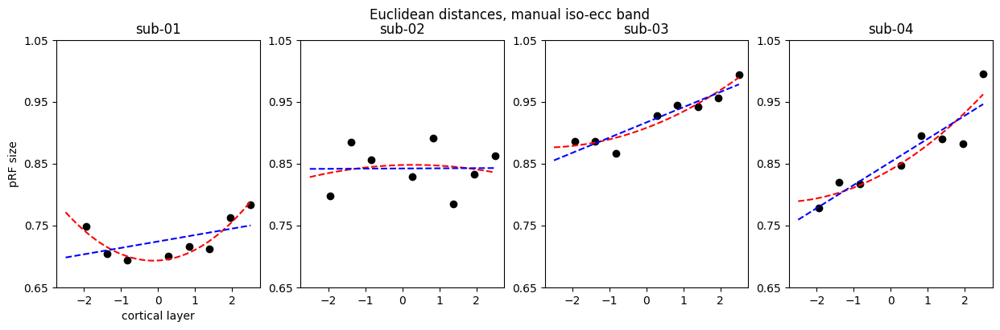

In [688]:
fig, axs = plt.subplots(nrows=1, ncols=len(subject_list), figsize=(15, 4))

for sub_id in range(0,len(subject_list)):
    idx      = df_pRFxecc_stats_cortdist_2ecc[(df_pRFxecc_stats_cortdist_2ecc['sub id'] == subject_list[sub_id])].index.tolist()
    depth    = df_pRFxecc_stats_cortdist_2ecc.loc[idx,'depth'].values
    pRF_2deg = df_pRFxecc_stats_cortdist_2ecc.loc[idx,'pRF@2deg'].values
    
    # omit nans
    idx = np.isfinite(pRF_2deg)
    pRF_2deg = pRF_2deg[idx]
    depth=depth[idx]
    
    # Fit the quadratic equation
    coefs_quadratic = np.polyfit(depth, pRF_2deg, 2)
    
    # Fit the linear equation
    coefs_linear = np.polyfit(depth, pRF_2deg, 1)

    # Print the coefficients
    print(coefs_quadratic)
    
    # Create a polynomial function from the coefficients
    f_quadratic = np.poly1d(coefs_quadratic)
    f_linear = np.poly1d(coefs_linear)

    # calculate the R-squared
    r_squared = r2_score(pRF_2deg, f_quadratic(depth))
    print(f"R2 quadratic: {r_squared}")
    r_squared = r2_score(pRF_2deg, f_linear(depth))
    print(f"R2 linear: {r_squared}")
    
    # quadratic model fit
    #x = np.linspace(0.2, 0.9, 50)
    x = np.linspace(-2.5, 2.5, 50)
    y_quadratic = coefs_quadratic[0]*(x**2) + coefs_quadratic[1]*x+coefs_quadratic[2]
    y_linear = coefs_linear[0]*x + coefs_linear[1]
    
    # plot the model
    axs[sub_id].plot(depth,pRF_2deg,'ko')
    axs[sub_id].plot(x,y_quadratic,'r--')
    axs[sub_id].plot(x,y_linear,'b--')
    if sub_id == 0:
        axs[sub_id].set_xlabel('cortical layer')
        axs[sub_id].set_ylabel('pRF size')
    axs[sub_id].set_title(subject_list[sub_id])
#     axs[sub_id].set_ylim([0.6, 1.2])
#     axs[sub_id].set_yticks(np.linspace(0.6,1.2,7))   
    axs[sub_id].set_ylim([0.65, 1.05])
    axs[sub_id].set_yticks(np.linspace(0.65,1.05,5)) 

plt.suptitle('Euclidean distances, manual iso-ecc band')
plt.show()
    
#     df_pRFxecc_stats_cortdist_2ecc.loc[(df_equidist_per_depth['sub id'] == subject_list[sub_id]) & 
#                                 (df_equidist_per_depth['hem'] == 'lh') & 
#                                 (df_equidist_per_depth['depth'] == depth_idx)].index.tolist()
#     lh_sigma = np.stack(df_equidist_per_depth.loc[idx, 'pRF size'].to_numpy(), axis=0)

##### Group plot

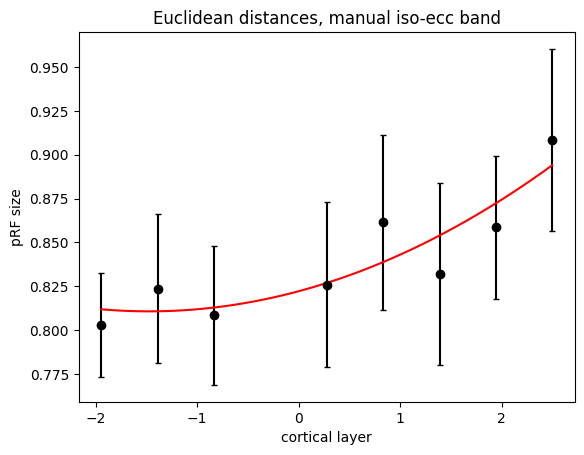

In [690]:
idx      = df_pRFxecc_stats_cortdist_2ecc[(df_pRFxecc_stats_cortdist_2ecc['sub id'] == subject_list[0])].index.tolist()
depth    = df_pRFxecc_stats_cortdist_2ecc.loc[idx,'depth'].values
#depth    = depth[1:]
pRF_2deg = np.empty((len(depth),len(subject_list)))

for sub_id in range(0,len(subject_list)):
    idx      = df_pRFxecc_stats_cortdist_2ecc[(df_pRFxecc_stats_cortdist_2ecc['sub id'] == subject_list[sub_id]) &
                                        (df_pRFxecc_stats_cortdist_2ecc['depth'] >= np.min(depth))].index.tolist()
    pRF_2deg[:,sub_id] = df_pRFxecc_stats_cortdist_2ecc.loc[idx,'pRF@2deg'].values


# omit nans
idx = (np.sum(np.isnan(pRF_2deg),1) == 0)
pRF_2deg = pRF_2deg[idx,:]
depth=depth[idx]
    
# Transform the independent variable into a set of polynomial features
poly = PolynomialFeatures(degree=2)
X_poly = poly.fit_transform(depth.reshape(-1,1))

# Create and fit the model
model = MultiOutputRegressor(LinearRegression()).fit(X_poly, pRF_2deg)

# Make predictions
X_plot = np.linspace(depth.min(), depth.max(), 100).reshape(-1, 1)
X_plot_poly = poly.transform(X_plot)
y_plot = model.predict(X_plot_poly)

y_mean = y_plot.mean(axis=1)
y_median = np.median(y_plot,axis=1)


# data for plot
depth_plot    = df_pRFxecc_stats_cortdist_2ecc.loc[:,'depth'].values
pRF_2deg_plot = df_pRFxecc_stats_cortdist_2ecc.loc[:,'pRF@2deg'].values


# plot
plt.errorbar(depth, pRF_2deg.mean(axis=1), yerr=stats.sem(pRF_2deg,axis=1), fmt='ko', ecolor='black', capsize=2)
plt.plot(X_plot,y_mean,'r-')
#plt.plot(X_plot/n_layers,y_median,'b--')

# plt.plot(x,y_linear,'b--')
#plt.ylim([0.545,0.60])
plt.xlabel('cortical layer')
plt.ylabel('pRF size')

plt.title('Euclidean distances, manual iso-ecc band')
plt.show()


## PRF size per cortical distance
### pRF size estimated at 2deg of eccentricity

In [399]:
rsq_thresh = 0.1
target_ecc = 2
pRF_thresh = max_ecc_deg

In [400]:
cd_bins = np.linspace(-2.5,3.5,9)
cd_bins

array([-2.5 , -1.75, -1.  , -0.25,  0.5 ,  1.25,  2.  ,  2.75,  3.5 ])

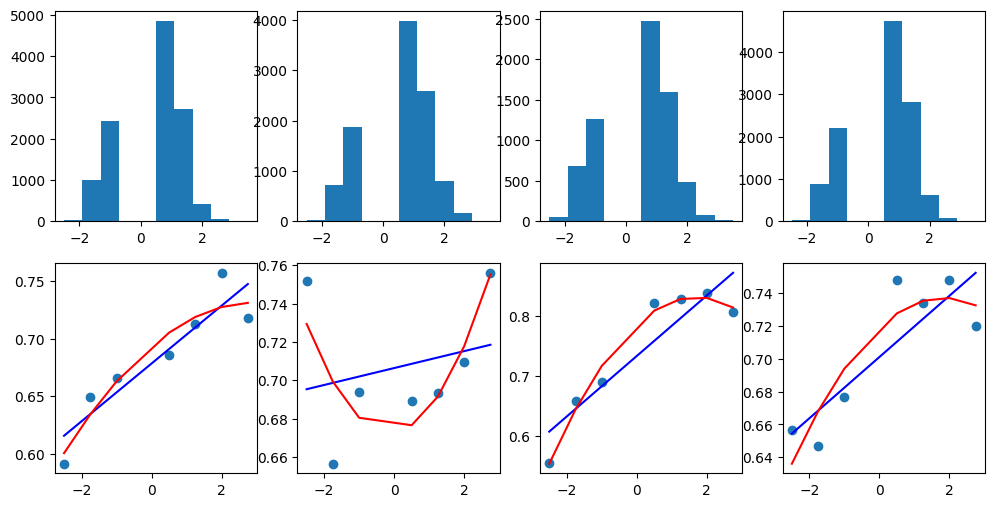

In [401]:

pRFxcordist = np.zeros([len(subject_list),len(bins)])
pRFxcordist[:] = np.nan

fig, axs = plt.subplots(nrows=2, ncols=len(subject_list), figsize=(12, 6))

for sub_id in range(0,len(subject_list)):

    # lh
    idx=df_pRF_per_cortdist.loc[(df_pRF_per_cortdist['sub id'] == subject_list[sub_id]) & 
                                (df_pRF_per_cortdist['hem'] == 'lh')].index.tolist()
    lh_sigma = np.stack(df_pRF_per_cortdist.loc[idx, 'pRF size'].to_numpy(), axis=0)
    lh_ecc   = np.stack(df_pRF_per_cortdist.loc[idx, 'ecc'].to_numpy(), axis=0)
    lh_rsq   = np.stack(df_pRF_per_cortdist.loc[idx, 'rsq'].to_numpy(), axis=0)
    lh_cortdist = np.stack(df_pRF_per_cortdist.loc[idx, 'cort dist'].to_numpy(), axis=0)

    # rh
    idx=df_pRF_per_cortdist.loc[(df_pRF_per_cortdist['sub id'] == subject_list[sub_id]) & 
                                (df_pRF_per_cortdist['hem'] == 'rh')].index.tolist()
    rh_sigma = np.stack(df_pRF_per_cortdist.loc[idx, 'pRF size'].to_numpy(), axis=0)
    rh_ecc   = np.stack(df_pRF_per_cortdist.loc[idx, 'ecc'].to_numpy(), axis=0)
    rh_rsq   = np.stack(df_pRF_per_cortdist.loc[idx, 'rsq'].to_numpy(), axis=0)
    rh_cortdist = np.stack(df_pRF_per_cortdist.loc[idx, 'cort dist'].to_numpy(), axis=0)

    # concatenate lh&rh
    y_sigma  = np.concatenate((lh_sigma.T,rh_sigma.T))
    x_ecc    = np.concatenate((lh_ecc.T,rh_ecc.T))
    r2       = np.concatenate((lh_rsq.T,rh_rsq.T))
    cortdist = np.concatenate((lh_cortdist.T,rh_cortdist.T))

    # threshold by r2
    y_sigma  = np.atleast_2d(y_sigma[r2>rsq_thresh]).T
    x_ecc    = np.atleast_2d(x_ecc[r2>rsq_thresh]).T
    cortdist    = np.atleast_2d(cortdist[r2>rsq_thresh]).T
    
    # threshold by sigma (only positive)
    x_ecc    = np.atleast_2d(x_ecc[y_sigma>0]).T
    cortdist = np.atleast_2d(cortdist[y_sigma>0]).T
    y_sigma  = np.atleast_2d(y_sigma[y_sigma>0]).T

    # threshold by sigma (below threshold)
    x_ecc    = np.atleast_2d(x_ecc[y_sigma<pRF_thresh]).T
    cortdist = np.atleast_2d(cortdist[y_sigma<pRF_thresh]).T
    y_sigma  = np.atleast_2d(y_sigma[y_sigma<pRF_thresh]).T

    # also remove outliers
    y_sigma_or, idx_or = reject_outliers(np.squeeze(y_sigma))
    y_sigma            = y_sigma[idx_or,:]
    x_ecc              = x_ecc[idx_or,:]
    cortdist           = cortdist[idx_or,:]

    # bin eccentricity data
    bins = [0, 1, 2, 3, 4, 5, 6, 7, 8]
    x_ecc=np.digitize(x_ecc,bins=bins)

    # bin cortical distances
    cortdist=np.digitize(cortdist,cd_bins)
    cortdist_=np.zeros(len(cortdist))
    for n in range(0,len(cortdist)):
        cortdist_[n] = cd_bins[(cortdist[n]-1)]
    cortdist=np.expand_dims(cortdist_, axis=1)

    # plt.hist(lh_cortdist[lh_rsq>0.1],bins=100)
    # plt.figure()

    # plt.hist(rh_cortdist[rh_rsq>0.1],bins=100)
    # plt.figure()

    axs[0, sub_id].hist(cortdist)
#     plt.figure()

    # plt.hist(x_ecc[rsq>0.1])
    # plt.figure()

    y_sigma_all=y_sigma
    x_ecc_all=x_ecc
    
    idx=0
    pRF_est_cortdist = np.zeros(len(np.unique(cortdist)))
    pRF_est_cortdist[:] = np.nan
    cortdist_this = np.zeros(len(np.unique(cortdist)))
    cortdist_this[:] = np.nan
    for n in np.unique(cortdist):
#         print("Cortical distance: "+str(n))
        y_sigma = y_sigma_all[cortdist==n]
        x_ecc   = x_ecc_all[cortdist==n]

        if len(y_sigma) < 20:
            continue

        # Split the data into a training set and a test set
        X_train, X_test, y_train, y_test = train_test_split(x_ecc, y_sigma, test_size=0.1)

        # Fit the model to the training set
        X_train = sm.add_constant(X_train)
        #model = sm.OLS(y_train, X_train).fit()
        model = sm.GLM(y_train, X_train, family=sm.families.Gaussian()).fit()

        # Make predictions on the test set
        X_test = sm.add_constant(X_test)
        y_pred = model.predict(X_test)

        # extract the prediction
        pred = model.get_prediction(X_test)

        # extract the intercept and slope
        intercept = model.params[0]
        slope = model.params[1]

        # extract the bootstrapped 95% quantiles and median of the fit
        quantiles = pred.summary_frame(alpha=0.05)
        median = pred.summary_frame(alpha=0.5)

#         # plot the model
#         plt.plot(np.sort(np.atleast_2d(X_test[:,1])).T, np.sort(y_test), 'ko')
#         plt.plot(np.sort(np.atleast_2d(X_test[:,1])).T, np.sort(y_pred), 'r-')
#         plt.plot(np.sort(np.atleast_2d(X_test[:,1])).T, np.sort(quantiles['mean_ci_lower'].values), 'r--.')
#         plt.plot(np.sort(np.atleast_2d(X_test[:,1])).T, np.sort(quantiles['mean_ci_upper'].values), 'r--.')
#         plt.xlabel('eccentricity')
#         plt.ylabel('pRF size')
#         plt.title(subject_list[sub_id]+", fractional distance WM->GM: "+"{0:.2g}".format(depth_idx))
#                   #str(depth_idx/10))
#         plt.show()

#         # print stats
#         print(f"Intercept: {intercept}")
#         intercept_txt = "t = "+"{:.2f}".format(model.tvalues[0])+", p = "+"{:.5f}".format(model.pvalues[0])
#         print(intercept_txt)

#         print(f"Slope: {slope}")
#         slope_txt = "t = "+"{:.2f}".format(model.tvalues[1])+", p = "+"{:.5f}".format(model.pvalues[1])
#         print(slope_txt)

        # get pRF estimate at 2deg
        pRF_est = intercept + target_ecc*slope

        pRF_est_cortdist[idx] = pRF_est
        cortdist_this[idx]    = n
        idx+=1
        
    x_plot=np.unique(cortdist)

    #add points to plot
    axs[1, sub_id].scatter(x_plot[pRF_est_cortdist>0],pRF_est_cortdist[pRF_est_cortdist>0])
    
    #find line of best fit (linear)
    a, b = np.polyfit(x_plot[pRF_est_cortdist>0],pRF_est_cortdist[pRF_est_cortdist>0], 1)
    
    #add line of best fit to plot
    axs[1, sub_id].plot(x_plot[pRF_est_cortdist>0], a*x_plot[pRF_est_cortdist>0]+b,'b-')
    
    #find line of best fit (quadratic)
    a, b, c = np.polyfit(x_plot[pRF_est_cortdist>0],pRF_est_cortdist[pRF_est_cortdist>0], 2)
    
    #add line of best fit to plot
    axs[1, sub_id].plot(x_plot[pRF_est_cortdist>0], a*x_plot[pRF_est_cortdist>0]**2+b*x_plot[pRF_est_cortdist>0]+c,'r-')
    #plt.show()
    
    idx=0
    for n in range(0,len(cd_bins)):
        try:
            cd = cd_bins[n]
            pRFxcordist[sub_id,idx]=pRF_est_cortdist[cortdist_this==cd]
            idx+=1
        except:
            idx+=1
            continue


In [402]:
x_plot[pRF_est_cortdist>0]

array([-2.5 , -1.75, -1.  ,  0.5 ,  1.25,  2.  ,  2.75])

{'bodies': [<matplotlib.collections.PolyCollection at 0x7f3ee60d6dc0>,
 'cmaxes': <matplotlib.collections.LineCollection at 0x7f3ee60d60a0>,
 'cmins': <matplotlib.collections.LineCollection at 0x7f3ee57b0b20>,
 'cbars': <matplotlib.collections.LineCollection at 0x7f3ee14ebd90>,
 'cmedians': <matplotlib.collections.LineCollection at 0x7f3ee14eb250>}

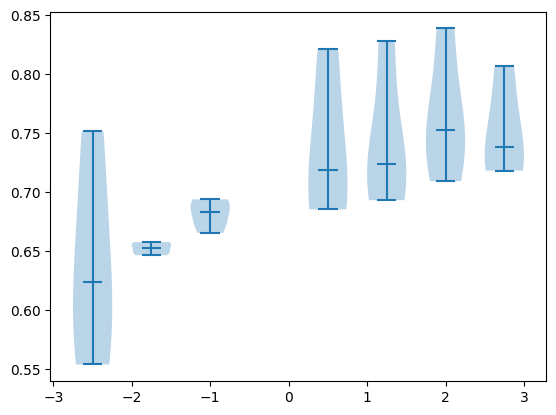

In [403]:
# pRFxcordist
var = pRFxcordist[:, ~np.isnan(pRFxcordist).any(axis=0)]
pos = cd_bins[~np.isnan(pRFxcordist).any(axis=0)]

plt.violinplot(var.T.tolist(),pos,showmeans=False, showextrema=True, showmedians=True)


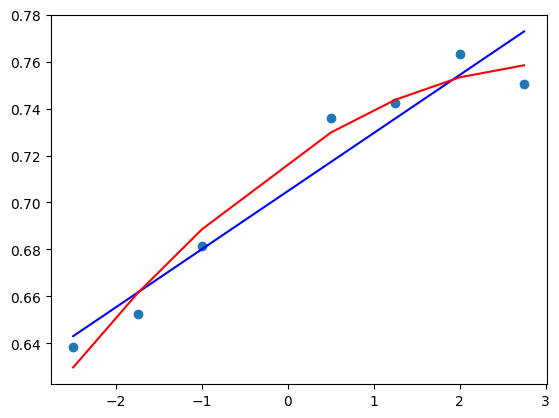

In [404]:
x,y = cd_bins, np.mean(pRFxcordist,0)
x=x[~np.isnan(y)]
y=y[~np.isnan(y)]


# plt.violinplot(x,y)
plt.scatter(x,y)

#find line of best fit (linear)
a, b = np.polyfit(x,y, 1)

#add line of best fit to plot
plt.plot(x, a*x+b,'b-')

#find line of best fit (quadratic)
a, b, c = np.polyfit(x,y, 2)

#add line of best fit to plot
plt.plot(x, a*x**2+b*x+c,'r-')
plt.show()


### pRF size at manually-defined iso-eccentricity

In [903]:
rsq_thresh = 0.1
target_ecc = 2
pRF_thresh = max_ecc_deg
n_layers = 6
cd_bins = np.linspace(-2.5,3.0,n_layers)
cd_bins

array([-2.5, -1.4, -0.3,  0.8,  1.9,  3. ])

In [904]:
subs = [['sub-01']*n_layers,['sub-02']*n_layers,['sub-03']*n_layers,['sub-04']*n_layers]
subs = list(itertools.chain(*subs))

depth = cd_bins.tolist()
depths = depth*n_sub

pRF_2deg = np.empty((1,len(subs),)).tolist()
pRF_2deg = list(itertools.chain(*pRF_2deg))


df_pRF_filtered_cortdist = pd.DataFrame({
    'sub id' : subs,
    'depth' : depths,
    'pRFs': pRF_2deg
})

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
sub-01
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Nr voxels at layer -2.5: 88
Nr voxels at layer -1.4: 1757
Nr voxels at layer -0.2999999999999998: 1358
Nr voxels at layer 0.8000000000000003: 1952
Nr voxels at layer 1.9000000000000004: 346
Nr voxels at layer 3.0: 1
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
sub-02
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Nr voxels at layer -2.5: 61
Nr voxels at layer -1.4: 1283
Nr voxels at layer -0.2999999999999998: 975
Nr voxels at layer 0.8000000000000003: 1530
Nr voxels at layer 1.9000000000000004: 578
Nr voxels at layer 3.0: 43
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
sub-03
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Nr voxels at layer -2.5: 55
Nr voxels at layer -1.4: 782
Nr voxels at layer -0.2999999999999998: 564
Nr voxel

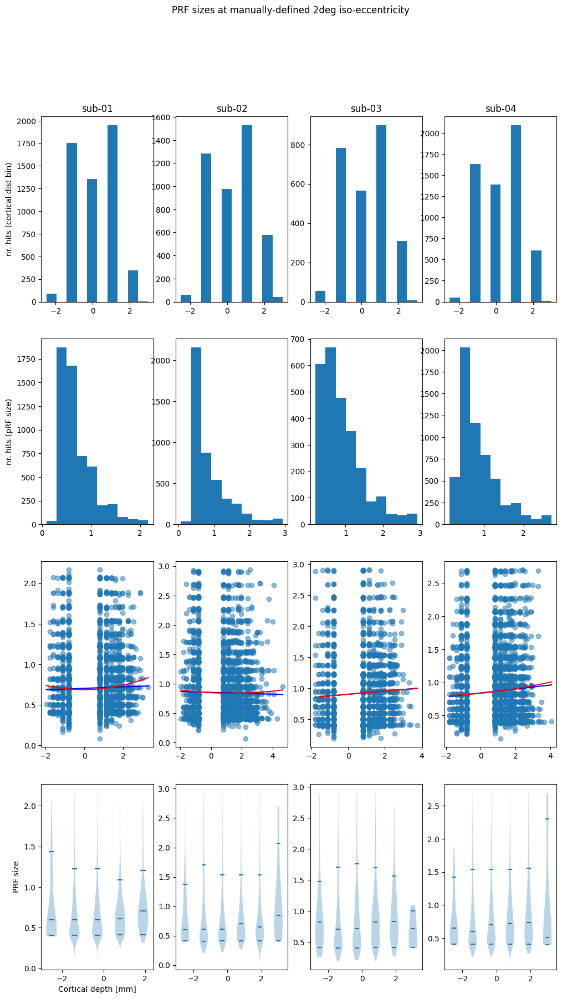

In [905]:
fig, axs = plt.subplots(nrows=4, ncols=len(subject_list), figsize=(12, 20))
fig.suptitle('PRF sizes at manually-defined 2deg iso-eccentricity')


all_sigma_list = []
all_pos_list = []
# sigma_mat = np.zeros([len(subject_list),len(cd_bins),2000])
# sigma_mat[:] = np.nan

for sub_id in range(0,len(subject_list)):
    print('%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%')
    print(subject_list[sub_id])
    print('%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%')
    
    # lh
    idx=df_pRF_per_cortdist_ecc2.loc[(df_pRF_per_cortdist_ecc2['sub id'] == subject_list[sub_id]) & 
                                (df_pRF_per_cortdist_ecc2['hem'] == 'lh')].index.tolist()
    lh_sigma = np.stack(df_pRF_per_cortdist_ecc2.loc[idx, 'pRF size'].to_numpy(), axis=0)
    lh_ecc   = np.stack(df_pRF_per_cortdist_ecc2.loc[idx, 'ecc'].to_numpy(), axis=0)
    lh_rsq   = np.stack(df_pRF_per_cortdist_ecc2.loc[idx, 'rsq'].to_numpy(), axis=0)
    lh_cortdist = np.stack(df_pRF_per_cortdist_ecc2.loc[idx, 'cort dist'].to_numpy(), axis=0)

    # rh
    idx=df_pRF_per_cortdist_ecc2.loc[(df_pRF_per_cortdist_ecc2['sub id'] == subject_list[sub_id]) & 
                                (df_pRF_per_cortdist_ecc2['hem'] == 'rh')].index.tolist()
    rh_sigma = np.stack(df_pRF_per_cortdist_ecc2.loc[idx, 'pRF size'].to_numpy(), axis=0)
    rh_ecc   = np.stack(df_pRF_per_cortdist_ecc2.loc[idx, 'ecc'].to_numpy(), axis=0)
    rh_rsq   = np.stack(df_pRF_per_cortdist_ecc2.loc[idx, 'rsq'].to_numpy(), axis=0)
    rh_cortdist = np.stack(df_pRF_per_cortdist_ecc2.loc[idx, 'cort dist'].to_numpy(), axis=0)

    # concatenate lh&rh
    y_sigma  = np.concatenate((lh_sigma.T,rh_sigma.T))
    x_ecc    = np.concatenate((lh_ecc.T,rh_ecc.T))
    r2       = np.concatenate((lh_rsq.T,rh_rsq.T))
    cortdist = np.concatenate((lh_cortdist.T,rh_cortdist.T))

    # threshold by r2
    y_sigma  = np.atleast_2d(y_sigma[r2>rsq_thresh]).T
    x_ecc    = np.atleast_2d(x_ecc[r2>rsq_thresh]).T
    cortdist = np.atleast_2d(cortdist[r2>rsq_thresh]).T
    r2       = np.atleast_2d(r2[r2>rsq_thresh]).T
    
    # threshold by sigma (only positive)
    x_ecc    = np.atleast_2d(x_ecc[y_sigma>0]).T
    cortdist = np.atleast_2d(cortdist[y_sigma>0]).T
    r2       = np.atleast_2d(r2[y_sigma>0]).T
    y_sigma  = np.atleast_2d(y_sigma[y_sigma>0]).T

    # threshold by sigma (below threshold)
    x_ecc    = np.atleast_2d(x_ecc[y_sigma<pRF_thresh]).T
    cortdist = np.atleast_2d(cortdist[y_sigma<pRF_thresh]).T
    r2       = np.atleast_2d(r2[y_sigma<pRF_thresh]).T
    y_sigma  = np.atleast_2d(y_sigma[y_sigma<pRF_thresh]).T

    # also remove outliers
    y_sigma_or, idx_or = reject_outliers(np.squeeze(y_sigma))
    y_sigma            = y_sigma[idx_or,:]
    x_ecc              = x_ecc[idx_or,:]
    cortdist           = cortdist[idx_or,:]
    r2                 = r2[idx_or,:]

    # bin eccentricity data
    bins = [0, 2, 4, 6, 8]
    x_ecc=np.digitize(x_ecc,bins=bins)

    # bin cortical distances
    cortdist_nonbinned = cortdist
    cortdist=np.digitize(cortdist,cd_bins)
    cortdist_=np.zeros(len(cortdist))
    for n in range(0,len(cortdist)):
        cortdist_[n] = cd_bins[(cortdist[n]-1)]
    cortdist=np.expand_dims(cortdist_, axis=1)

    # plot histograms of binned cortical distance and pRF size
    axs[0, sub_id].hist(cortdist)
    axs[0, sub_id].set_title(subject_list[sub_id])
    axs[1, sub_id].hist(y_sigma)
    
    # scatter plot of pRF size as a function of cortdist
    axs[2, sub_id].scatter(cortdist_nonbinned,y_sigma,alpha=0.5)
    
    #find line of best fit (linear) and plot
    x = np.linspace(min(cortdist_nonbinned),max(cortdist_nonbinned),120)
    a, b = np.polyfit(np.squeeze(cortdist_nonbinned),np.squeeze(y_sigma), 1)
    axs[2, sub_id].plot(x, a*x+b,'b-')

    #find line of best fit (quadratic) and plot
    a, b, c = np.polyfit(np.squeeze(cortdist_nonbinned),np.squeeze(y_sigma), 2)
    axs[2, sub_id].plot(x, a*x**2+b*x+c,'r-')
    

    # prep data for violinplots (list of pRF size values for each cortdist bin)
    y_sigma_all=y_sigma
    x_ecc_all=x_ecc
    
    sigma_list = []
    pos_list = []
    for n in range(0,len(cd_bins)):
    #         print("Cortical distance: "+str(n))
        y_sigma   = y_sigma_all[cortdist==cd_bins[n]]
        
        
        # save stats to df
        idx=df_pRF_filtered_cortdist.loc[(df_pRF_filtered_cortdist['sub id'] == subject_list[sub_id]) &
                                (df_pRF_filtered_cortdist['depth'] == cd_bins[n])].index.tolist()

        df_pRF_filtered_cortdist.loc[idx, 'pRFs'] = pd.Series([y_sigma], index=df_pRF_filtered_cortdist.index[idx])
        print('Nr voxels at layer '+str(cd_bins[n])+': '+str(len(y_sigma)))
        
        if max(y_sigma.shape) > 5:
            sigma_list.append(y_sigma)
            pos_list.append(cd_bins[n])
            
            all_sigma_list.append(y_sigma)
            all_pos_list.append(cd_bins[n])
            
            

    # plot violinplots
    parts = axs[3, sub_id].violinplot(sigma_list,pos_list,points=100,showextrema=False,
                                      quantiles=[[0.1,0.5,0.9]]*len(pos_list))
    
    # get medians, quartiles and means
    quartile1, medians, quartile3 = np.zeros([len(sigma_list),1]),np.zeros([len(sigma_list),1]),np.zeros([len(sigma_list),1])
    means = np.zeros([len(sigma_list),1])
    for n in range(0,len(sigma_list)):
        quartile1[n], medians[n], quartile3[n] = np.percentile(sigma_list[n], [25, 50, 75], axis=0)
        means[n] = np.mean(sigma_list[n])
        
    # plot medians and means
#     axs[3, sub_id].scatter(pos_list, means, marker='o', color='blue', s=30, zorder=3)
#     axs[3, sub_id].scatter(pos_list, medians, marker='o', color='black', s=30, zorder=3)
    
    # add labels
    if sub_id == 0:
        axs[0, sub_id].set_ylabel('nr. hits (cortical dist bin)')
        axs[1, sub_id].set_ylabel('nr. hits (pRF size)')
        axs[3, sub_id].set_ylabel('PRF size')
        axs[3, sub_id].set_xlabel('Cortical depth [mm]')
    
    


In [907]:
df_pRF_filtered_cortdist

,sub id,depth,pRFs
0,sub-01,-2.5,"[0.40945956427657126, 0.8175762221144486, 0.40..."
1,sub-01,-1.4,"[1.530799371375438, 0.49762651903208505, 0.411..."
2,sub-01,-0.3,"[1.7034998727987412, 0.8219629342293395, 0.955..."
3,sub-01,0.8,"[1.324795806047363, 0.41125751315321274, 0.410..."
4,sub-01,1.9,"[0.40759748733419804, 1.702639057881662, 1.877..."
5,sub-01,3.0,[0.7178614862997708]
6,sub-02,-2.5,"[0.4130342951236934, 0.40687882652481155, 0.41..."
7,sub-02,-1.4,"[1.0808400465648427, 0.8207975471465023, 0.592..."
8,sub-02,-0.3,"[1.0780534803655946, 1.8806959090092743, 1.217..."
9,sub-02,0.8,"[1.7069512932201498, 0.6026135085049431, 1.866..."


In [908]:
all_sigma_list = []
all_pos_list = []

for depth_idx in depth:
    sigmas_thisdepth = []
    for sub_id in range(0,len(subject_list)):
        idx=df_pRF_filtered_cortdist.loc[(df_pRF_filtered_cortdist['sub id'] == subject_list[sub_id]) &
                                        (df_pRF_filtered_cortdist['depth'] == depth_idx)].index.tolist()
        sigmas_thisdepth.append(df_pRF_filtered_cortdist.loc[idx, 'pRFs'].values[0])
    all_sigma_list.append(np.array(flatten(sigmas_thisdepth)))
    all_pos_list.append(depth_idx)
    

In [909]:
20+19+19+20

78

In [910]:
len(all_sigma_list[0])

252

In [884]:
# all_sigma_list_concat = []
# all_pos_list_concat = []
# for n in range(0,len(cd_bins)):
#     idx = np.asarray([int(x == cd_bins[n]) for x in all_pos_list])
#     if sum(idx)>0:
#         all_pos_list_concat.append(cd_bins[n])
        
#     loc = [i for i,x in enumerate(idx) if x==1]
#     temp_list = []
#     for m in range(0,sum(idx)):
#         temp_list.append(all_sigma_list[loc[m]])
#     if len(temp_list) > 0:
#         all_sigma_list_concat.append(np.hstack(temp_list))
    
    
# quartile1, medians, quartile3 = np.zeros([len(all_sigma_list_concat),1]),np.zeros([len(all_sigma_list_concat),1]),np.zeros([len(all_sigma_list_concat),1])
# means = np.zeros([len(all_sigma_list_concat),1])
# for n in range(0,len(all_sigma_list_concat)):
#     quartile1[n], medians[n], quartile3[n] = np.percentile(all_sigma_list_concat[n], [25, 50, 75], axis=0)
#     means[n] = np.mean(all_sigma_list_concat[n])
    

In [762]:
len(all_sigma_list_concat)

8

In [763]:
all_pos_list_concat

[-2.5, -1.75, -1.0, 0.5, 1.25, 2.0, 2.75, 3.5]

In [764]:
# #find line of best fit (linear) and plot
# #x = np.linspace(min(cortdist_nonbinned),max(cortdist_nonbinned),120)
# a, b = np.polyfit(all_pos_list_concat,all_sigma_list_concat, 1)
# axs[2, sub_id].plot(x, a*x+b,'b-')

# # #find line of best fit (quadratic) and plot
# # a, b, c = np.polyfit(np.squeeze(cortdist_nonbinned),np.squeeze(y_sigma), 2)
# # axs[2, sub_id].plot(x, a*x**2+b*x+c,'r-')

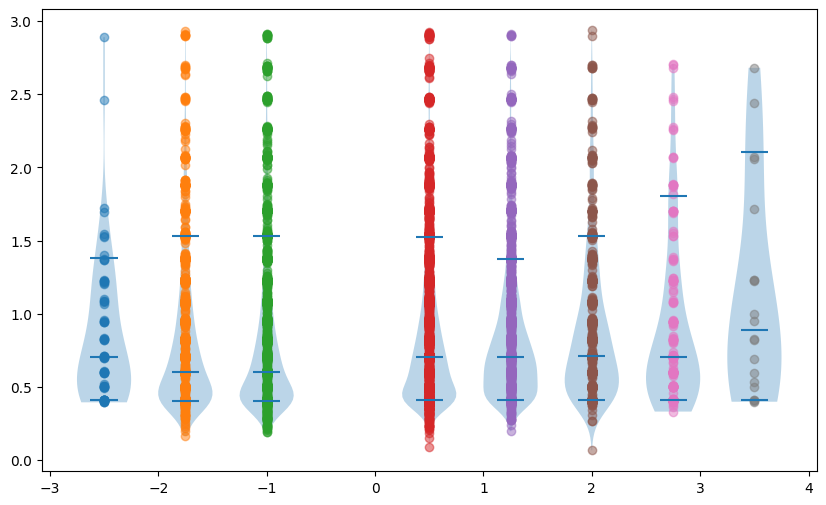

In [765]:
#from matplotlib.pyplot import figure



# plt.violinplot(all_sigma_list_concat,all_pos_list_concat,bw_method='silverman')
dict_vp = plt.violinplot(all_sigma_list_concat,all_pos_list_concat,bw_method='scott',showextrema=False,
                                      quantiles=[[0.1,0.5,0.9]]*len(all_pos_list_concat))

for d in range(0,len(all_pos_list_concat)):
    plt.scatter(np.repeat(all_pos_list_concat[d],len(all_sigma_list_concat[d])),all_sigma_list_concat[d],alpha=0.5)

# scatter1 = plt.scatter(all_pos_list_concat, means, marker='o', color='blue', s=30, zorder=3, label='mean')
# scatter2 = plt.scatter(all_pos_list_concat, medians, marker='o', color='black', s=30, zorder=3, label='median')
# plt.plot(all_pos_list_concat, medians,'k')
# plt.plot(all_pos_list_concat, means,'b')
# plt.legend(handles=[scatter1, scatter2])

fig = plt.gcf()
fig.set_size_inches(10,6)

# figure(figsize=(30, 20), dpi=300)


In [749]:
# print(dict_vp.items()) #prints keys and values
print(dict_vp.keys()) #prints keys
# print(dict_vp.values()) #prints values


dict_keys(['bodies', 'cquantiles'])


In [746]:
for key, value in dict_vp.items() :
    print (key, value)


bodies [<matplotlib.collections.PolyCollection object at 0x7f3edc0e3ee0>, <matplotlib.collections.PolyCollection object at 0x7f3edcc962b0>, <matplotlib.collections.PolyCollection object at 0x7f3edc105d90>, <matplotlib.collections.PolyCollection object at 0x7f3edc0e3e80>, <matplotlib.collections.PolyCollection object at 0x7f3edcc96a00>, <matplotlib.collections.PolyCollection object at 0x7f3edcc96d60>, <matplotlib.collections.PolyCollection object at 0x7f3edccb3100>, <matplotlib.collections.PolyCollection object at 0x7f3edccb3460>]
cquantiles <matplotlib.collections.LineCollection object at 0x7f3edc0e3d60>


In [754]:
import statsmodels.api as sm
prctl = 95
kernel = "epa"    # "gau", biw", "cos", "epa", "triw"
bw = "silverman"  # "scott", "normal_reference", "silverman"
adj = 1

maxprob =[]
for i in range(0,len(all_pos_list_concat)):
    X = all_sigma_list_concat[d]
    dens = sm.nonparametric.KDEUnivariate(X)
    dens.fit(fft=False,kernel=kernel,bw=bw,adjust=adj) 
    maxprob.append(np.max(dens.support))


In [755]:
x=np.linspace(0,len(dens.support))

[3.585599569292015,
 3.585599569292015,
 3.585599569292015,
 3.585599569292015,
 3.585599569292015,
 3.585599569292015,
 3.585599569292015,
 3.585599569292015]

In [911]:
np.save('concatenated_pRFs',all_sigma_list)

/home/mayajas/.conda/envs/py38prf/lib/python3.8/site-packages/numpy/lib/npyio.py:501: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.asanyarray(arr)


In [199]:
# plt.scatter(ecc_depth_0, sigma_depth_0)

# plt.title("pRF size as a function of eccentricity (V1)")
# plt.xlabel('eccentricity [deg]')
# plt.ylabel('pRF size [deg]')
# #plt.legend(["deep","middle","superficial"])
# plt.show()


Equidistant layering

In [130]:
n_layers = 4
depth = np.linspace(1,n_layers,n_layers).tolist()

# ecc 2
idx=df_equidist_per_ecc.loc[(df_equidist_per_ecc['ecc'] == 2)].index.tolist()
sigma_ecc_2 = np.stack(df_equidist_per_ecc.loc[idx, 'pRF size'].to_numpy(), axis=0)
sigma_ecc_2 = np.nanmean(sigma_ecc_2,0).tolist()

# ecc 3
idx=df_equidist_per_ecc.loc[(df_equidist_per_ecc['ecc'] == 3)].index.tolist()
sigma_ecc_3 = np.stack(df_equidist_per_ecc.loc[idx, 'pRF size'].to_numpy(), axis=0)
sigma_ecc_3 = np.nanmean(sigma_ecc_3,0).tolist()

# ecc 4
idx=df_equidist_per_ecc.loc[(df_equidist_per_ecc['ecc'] == 4)].index.tolist()
sigma_ecc_4 = np.stack(df_equidist_per_ecc.loc[idx, 'pRF size'].to_numpy(), axis=0)
sigma_ecc_4 = np.nanmean(sigma_ecc_4,0).tolist()

# ecc 5
idx=df_equidist_per_ecc.loc[(df_equidist_per_ecc['ecc'] == 5)].index.tolist()
sigma_ecc_5 = np.stack(df_equidist_per_ecc.loc[idx, 'pRF size'].to_numpy(), axis=0)
sigma_ecc_5 = np.nanmean(sigma_ecc_5,0).tolist()


In [131]:
depth

[1.0, 2.0, 3.0, 4.0]

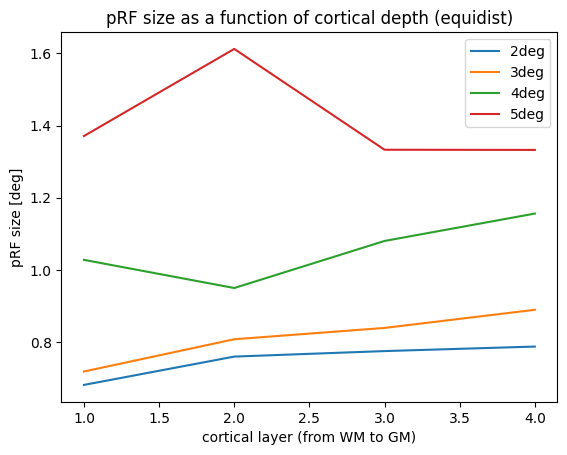

In [157]:
plt.title("pRF size as a function of cortical depth (equidist)")
plt.plot(depth,sigma_ecc_2)
plt.plot(depth,sigma_ecc_3)
plt.plot(depth,sigma_ecc_4)
plt.plot(depth,sigma_ecc_5)

plt.xlabel('cortical layer (from WM to GM)')
plt.ylabel('pRF size [deg]')
plt.legend(["2deg","3deg","4deg","5deg"])
plt.show()

Equivolumetric layering

In [137]:
# ecc 2
idx=df_equivol_per_ecc.loc[(df_equivol_per_ecc['ecc'] == 2)].index.tolist()
sigma_ecc_2 = np.stack(df_equivol_per_ecc.loc[idx, 'pRF size'].to_numpy(), axis=0)
sigma_ecc_2 = np.nanmean(sigma_ecc_2,0).tolist()

# ecc 3
idx=df_equivol_per_ecc.loc[(df_equivol_per_ecc['ecc'] == 3)].index.tolist()
sigma_ecc_3 = np.stack(df_equivol_per_ecc.loc[idx, 'pRF size'].to_numpy(), axis=0)
sigma_ecc_3 = np.nanmean(sigma_ecc_3,0).tolist()

# ecc 4
idx=df_equivol_per_ecc.loc[(df_equivol_per_ecc['ecc'] == 4)].index.tolist()
sigma_ecc_4 = np.stack(df_equivol_per_ecc.loc[idx, 'pRF size'].to_numpy(), axis=0)
sigma_ecc_4 = np.nanmean(sigma_ecc_4,0).tolist()

# ecc 5
idx=df_equivol_per_ecc.loc[(df_equivol_per_ecc['ecc'] == 5)].index.tolist()
sigma_ecc_5 = np.stack(df_equivol_per_ecc.loc[idx, 'pRF size'].to_numpy(), axis=0)
sigma_ecc_5 = np.nanmean(sigma_ecc_5,0).tolist()


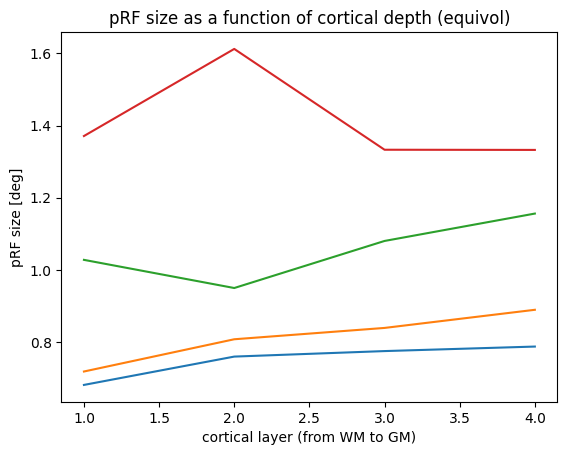

In [158]:
plt.title("pRF size as a function of cortical depth (equivol)")
plt.plot(depth,sigma_ecc_2)
plt.plot(depth,sigma_ecc_3)
plt.plot(depth,sigma_ecc_4)
plt.plot(depth,sigma_ecc_5)

plt.xlabel('cortical layer (from WM to GM)')
plt.ylabel('pRF size [deg]')
# plt.legend(["2deg","3deg","4deg","5deg"])
plt.show()

##### Extract lh and rh sigma and ecc values at chosen rsq threshold

Set number of layers, eccentricities, subjects, hemispheres

In [218]:
n_layers   = 6
n_sub      = len(subject_list)
n_hem      = len(hem_list)

Thresholds

In [219]:
rsq_thresh = 0.1
target_ecc = 2
pRF_thresh = max_ecc_deg

In [220]:
np.linspace(1,n_layers,n_layers).tolist()

[1.0, 2.0, 3.0, 4.0, 5.0, 6.0]

Create a dataframe to save intercept and slope stats

In [227]:
subs = [['sub-01']*n_layers,['sub-02']*n_layers,['sub-03']*n_layers,['sub-04']*n_layers]
subs = list(itertools.chain(*subs))

depth = np.linspace(1,n_layers,n_layers).tolist()
depths = depth*n_sub

pRF_2deg_lh = np.empty((1,len(subs),)).tolist()
pRF_2deg_lh = list(itertools.chain(*pRF_2deg_lh))

pRF_2deg_rh = np.empty((1,len(subs),)).tolist()
pRF_2deg_rh = list(itertools.chain(*pRF_2deg_rh))


df_testing_hems = pd.DataFrame({
    'sub id' : subs,
    'depth' : depths,
    'pRF@2deg_lh': pRF_2deg_lh,
    'pRF@2deg_rh': pRF_2deg_rh
})

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
sub-01
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


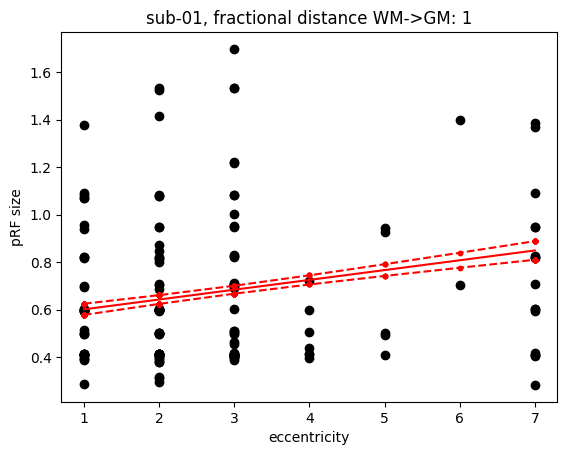

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
sub-01
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


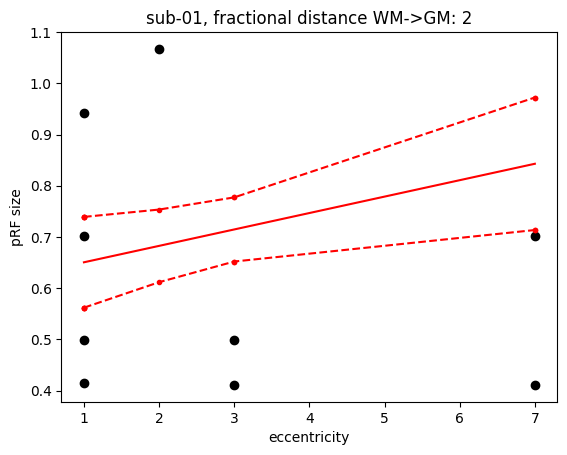

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
sub-01
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


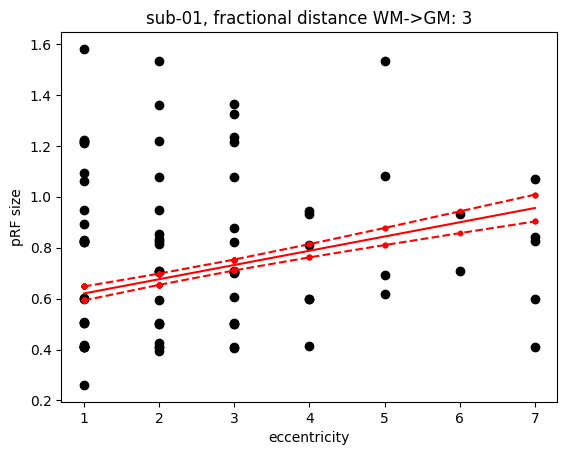

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
sub-01
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


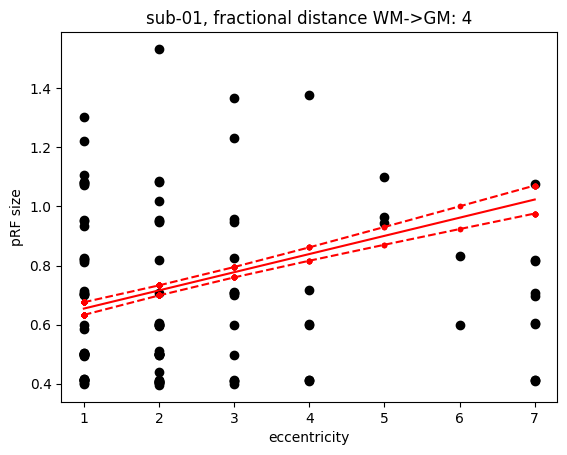

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
sub-01
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


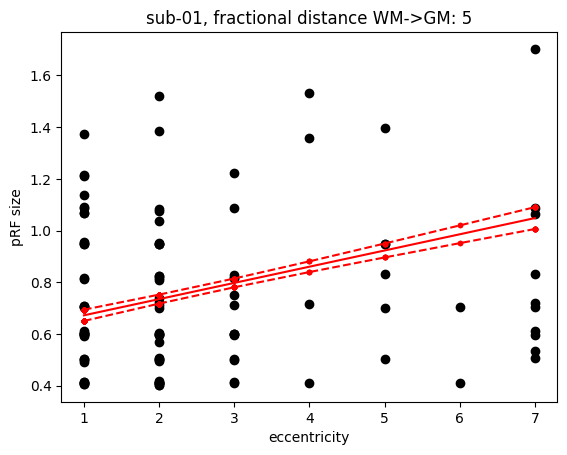

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
sub-01
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


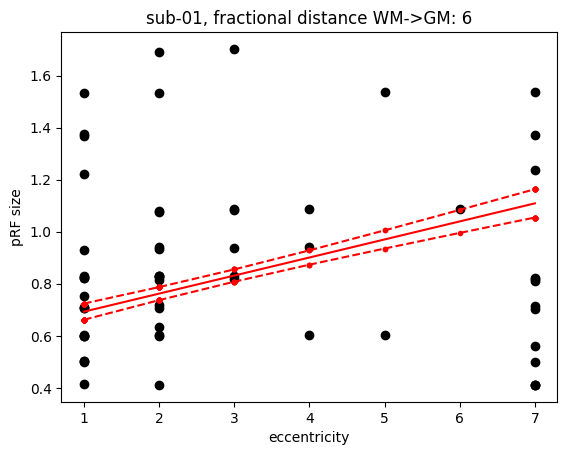

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
sub-02
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


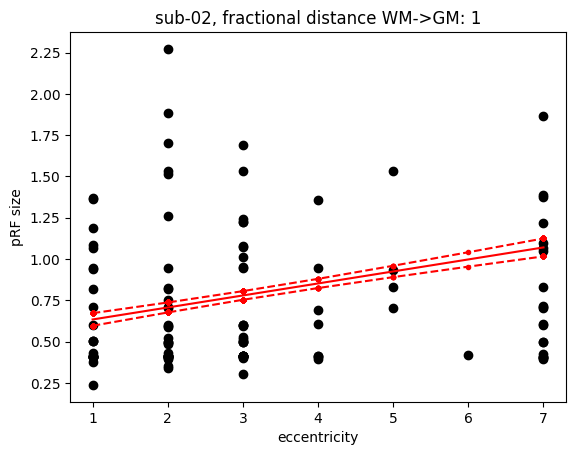

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
sub-02
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


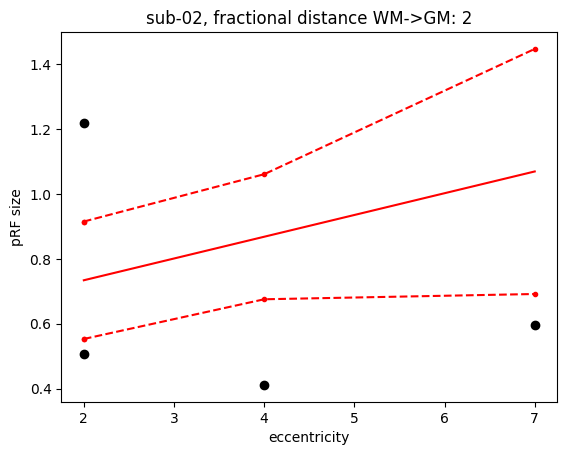

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
sub-02
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


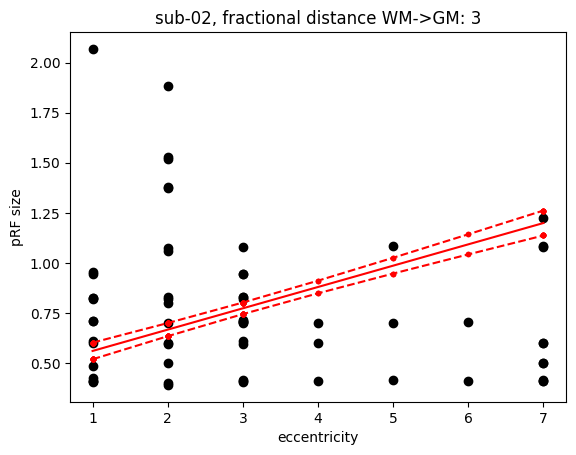

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
sub-02
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


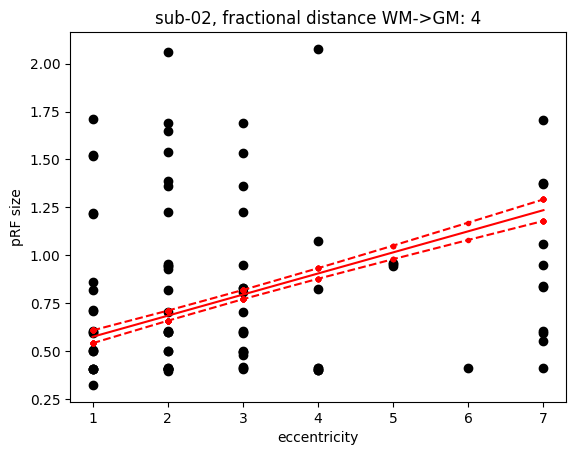

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
sub-02
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


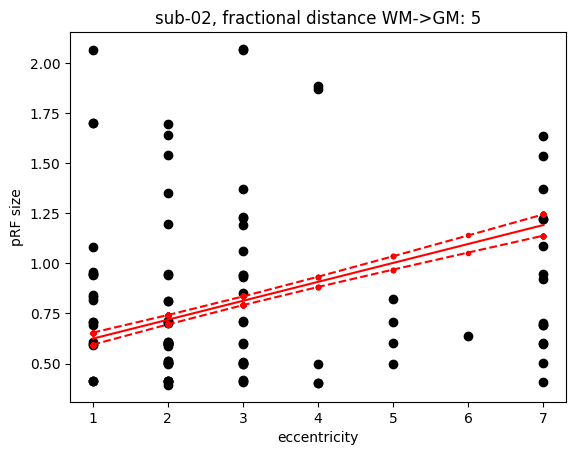

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
sub-02
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


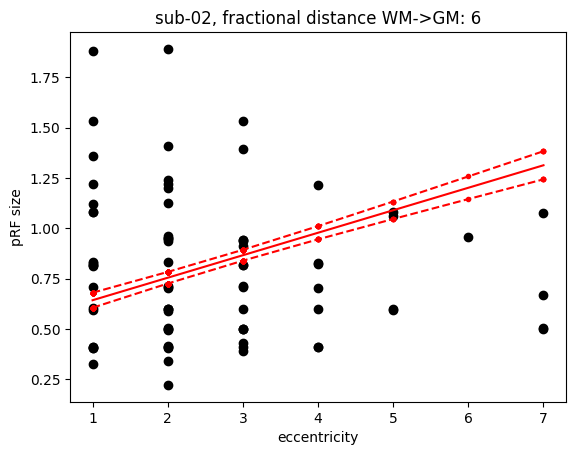

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
sub-03
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


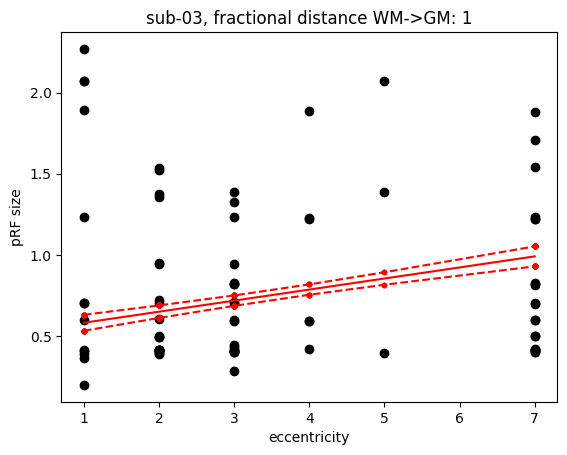

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
sub-03
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


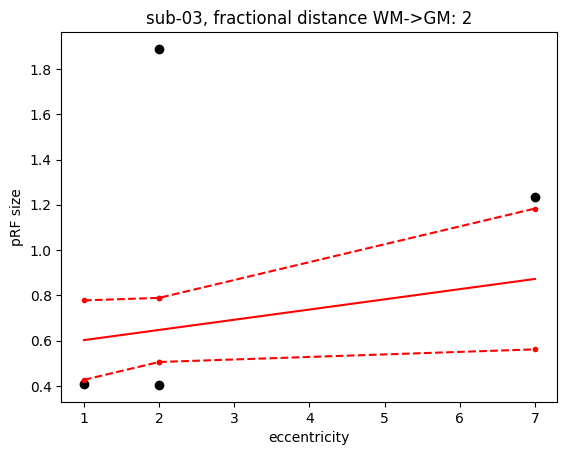

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
sub-03
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


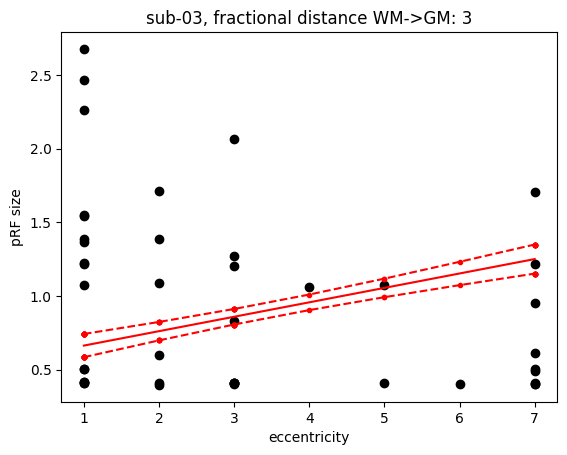

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
sub-03
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


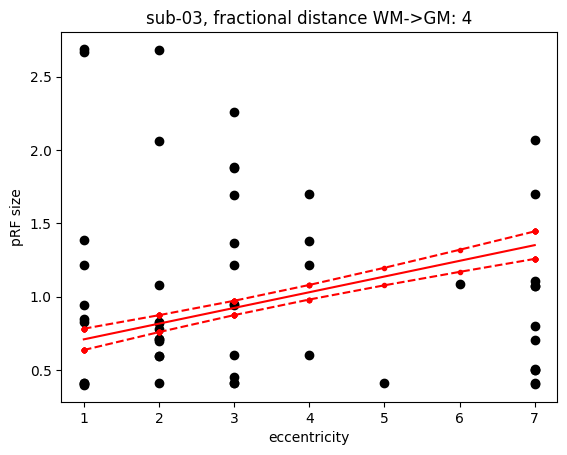

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
sub-03
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


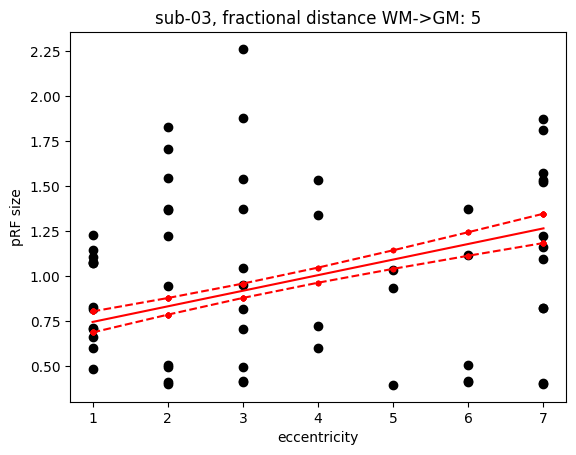

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
sub-03
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


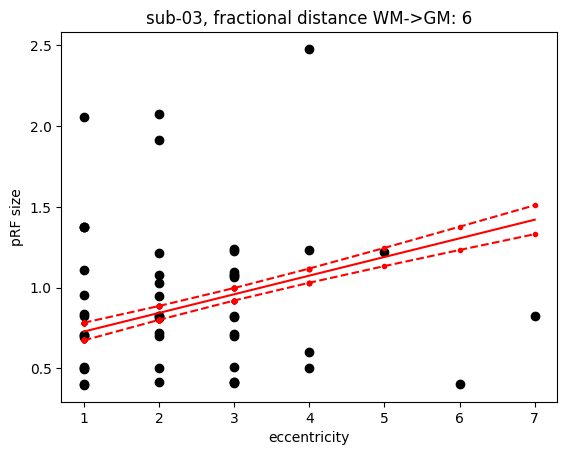

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
sub-04
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


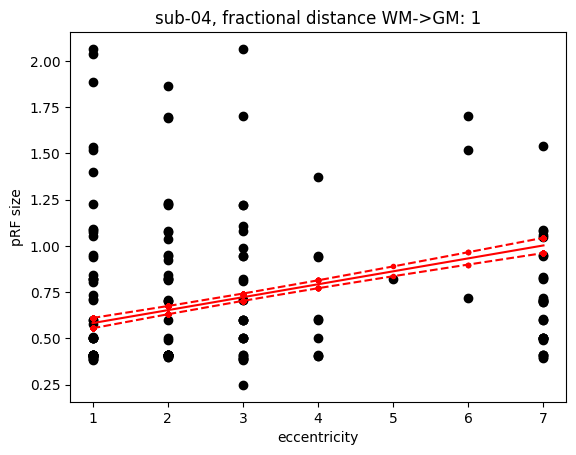

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
sub-04
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


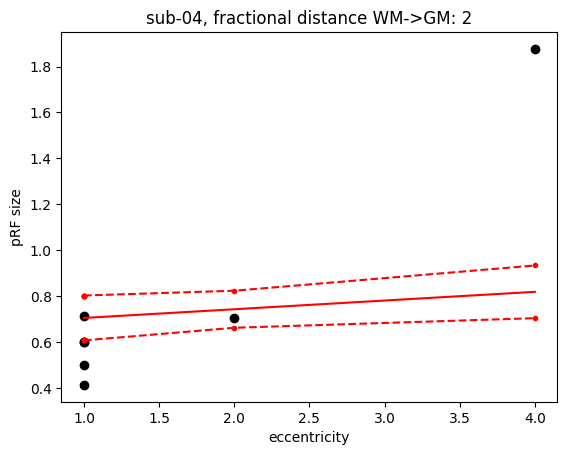

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
sub-04
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


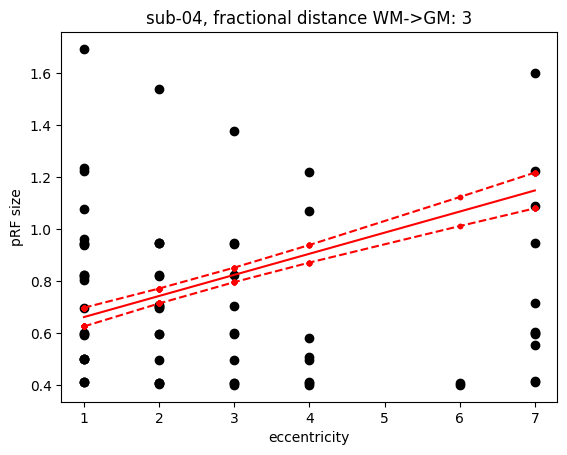

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
sub-04
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


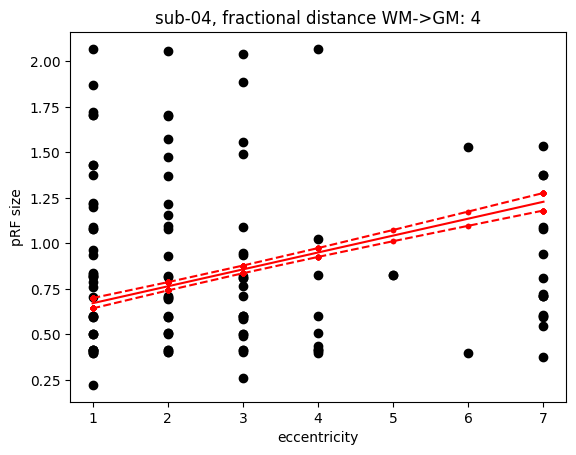

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
sub-04
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


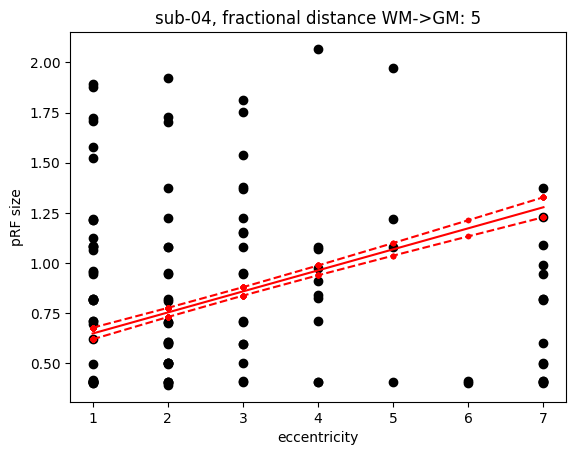

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
sub-04
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


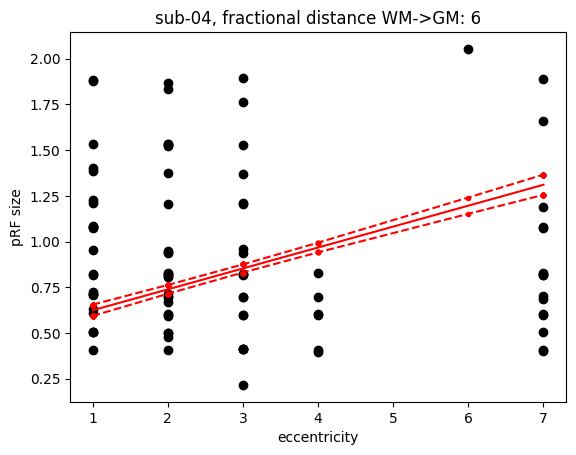

In [230]:
for sub_id in range(0,len(subject_list)):
    for depth_idx in depth:
        print('%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%')
        print(subject_list[sub_id])
        print('%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%')
        # lh
        idx=df_equidist_per_depth.loc[(df_equidist_per_depth['sub id'] == subject_list[sub_id]) & 
                                    (df_equidist_per_depth['hem'] == 'lh') & 
                                    (df_equidist_per_depth['depth'] == depth_idx)].index.tolist()
        lh_sigma = np.stack(df_equidist_per_depth.loc[idx, 'pRF size'].to_numpy(), axis=0)
        lh_ecc   = np.stack(df_equidist_per_depth.loc[idx, 'ecc'].to_numpy(), axis=0)
        lh_rsq   = np.stack(df_equidist_per_depth.loc[idx, 'rsq'].to_numpy(), axis=0)

        # rh
        idx      = df_equidist_per_depth.loc[(df_equidist_per_depth['sub id'] == subject_list[sub_id]) & 
                                    (df_equidist_per_depth['hem'] == 'rh') & 
                                    (df_equidist_per_depth['depth'] == depth_idx)].index.tolist()
        rh_sigma = np.stack(df_equidist_per_depth.loc[idx, 'pRF size'].to_numpy(), axis=0)
        rh_ecc   = np.stack(df_equidist_per_depth.loc[idx, 'ecc'].to_numpy(), axis=0)
        rh_rsq   = np.stack(df_equidist_per_depth.loc[idx, 'rsq'].to_numpy(), axis=0)

#         # concatenate lh&rh
#         y_sigma_lh, y_sigma_rh  = lh_sigma.T, rh_sigma.T
#         x_ecc_lh, x_ecc_rh      = lh_ecc.T, rh_ecc.T
#         r2_lh, r2_rh            = lh_rsq.T, rh_rsq.T

        y_sigma = rh_sigma.T
        x_ecc = rh_ecc.T
        r2 = rh_rsq.T

        # threshold by r2
        y_sigma  = np.atleast_2d(y_sigma[r2>rsq_thresh]).T
        x_ecc    = np.atleast_2d(x_ecc[r2>rsq_thresh]).T
        
        # threshold by sigma (only positive)
        x_ecc    = np.atleast_2d(x_ecc[y_sigma>0]).T
        y_sigma  = np.atleast_2d(y_sigma[y_sigma>0]).T
        
        # threshold by sigma (below threshold)
        x_ecc    = np.atleast_2d(x_ecc[y_sigma<pRF_thresh]).T
        y_sigma  = np.atleast_2d(y_sigma[y_sigma<pRF_thresh]).T
        
        
        # also remove outliers
        y_sigma_or, idx_or = reject_outliers(np.squeeze(y_sigma))
        y_sigma            = y_sigma[idx_or,:]
        x_ecc              = x_ecc[idx_or,:]
        
        # bin eccentricity data
        bins = [0, 1, 2, 3, 4, 5, 6, 7, 8]
        x_ecc=np.digitize(x_ecc,bins=bins)

    #     # random shuffle
    #     shuffle_indices = np.random.permutation(len(y_sigma))
    #     y_sigma = y_sigma[shuffle_indices]
    #     x_ecc = x_ecc[shuffle_indices]
    
        if len(y_sigma) < 30:
            idx=df_testing_hems.loc[(df_testing_hems['sub id'] == subject_list[sub_id]) &
                                (df_testing_hems['depth'] == depth_idx)].index.tolist()
            df_testing_hems.loc[idx, 'pRF@2deg'] = pd.Series([np.nan]*len(idx), index=df_testing_hems.index[idx])
            continue


        # Split the data into a training set and a test set
        X_train, X_test, y_train, y_test = train_test_split(x_ecc, y_sigma, test_size=0.1)

        # Fit the model to the training set
        X_train = sm.add_constant(X_train)
        #model = sm.OLS(y_train, X_train).fit()
        model = sm.GLM(y_train, X_train, family=sm.families.Gaussian()).fit()

        # Make predictions on the test set
        X_test = sm.add_constant(X_test)
        y_pred = model.predict(X_test)

        # extract the prediction
        pred = model.get_prediction(X_test)

        # extract the intercept and slope
        intercept = model.params[0]
        slope = model.params[1]

        # extract the bootstrapped 95% quantiles and median of the fit
        quantiles = pred.summary_frame(alpha=0.05)
        median = pred.summary_frame(alpha=0.5)

        # plot the model
        plt.plot(np.sort(np.atleast_2d(X_test[:,1])).T, np.sort(y_test), 'ko')
        plt.plot(np.sort(np.atleast_2d(X_test[:,1])).T, np.sort(y_pred), 'r-')
        plt.plot(np.sort(np.atleast_2d(X_test[:,1])).T, np.sort(quantiles['mean_ci_lower'].values), 'r--.')
        plt.plot(np.sort(np.atleast_2d(X_test[:,1])).T, np.sort(quantiles['mean_ci_upper'].values), 'r--.')
        plt.xlabel('eccentricity')
        plt.ylabel('pRF size')
        plt.title(subject_list[sub_id]+", fractional distance WM->GM: "+"{0:.2g}".format(depth_idx))
                  #str(depth_idx/10))
        plt.show()

        
        # get pRF estimate at 2deg
        pRF_est = intercept + target_ecc*slope

    #     # print the quantiles
    #     print("95% quantiles:")
    #     print(quantiles.loc[:, ["mean", "mean_se", "mean_ci_lower", "mean_ci_upper"]])

    #     # print the median
    #     print("Median:")
    #     print(median.loc[:, ["mean", "mean_se", "mean_ci_lower", "mean_ci_upper"]])

        # save stats to df
        idx=df_testing_hems.loc[(df_testing_hems['sub id'] == subject_list[sub_id]) &
                                (df_testing_hems['depth'] == depth_idx)].index.tolist()

        df_testing_hems.loc[idx, 'pRF@2deg_rh'] = pd.Series([pRF_est]*len(idx), index=df_testing_hems.index[idx])
        
    

In [231]:
df_testing_hems

,sub id,depth,pRF@2deg_lh,pRF@2deg_rh
0,sub-01,1.0,0.654071,0.642688
1,sub-01,2.0,0.594226,0.682635
2,sub-01,3.0,0.633835,0.676117
3,sub-01,4.0,0.659957,0.715952
4,sub-01,5.0,0.671051,0.734730
5,sub-01,6.0,0.684364,0.762164
6,sub-02,1.0,0.660320,0.706670
7,sub-02,2.0,0.591812,0.733967
8,sub-02,3.0,0.637427,0.666787
9,sub-02,4.0,0.667421,0.685221


In [234]:
np.mean(df_testing_hems['pRF@2deg_lh'].values)

0.6926456107812705

In [235]:
np.mean(df_testing_hems['pRF@2deg_rh'].values)

0.7259848985786892

In [236]:
stats.ttest_rel(df_testing_hems['pRF@2deg_lh'].values, df_testing_hems['pRF@2deg_rh'].values)

Ttest_relResult(statistic=-3.2130238397389124, pvalue=0.003856707952655941)